In [1]:
import matplotlib.pyplot as plt

plt.rcParams['figure.facecolor'] = 'white'
import numpy as np
from PIL import Image
import os 
import glob

In [2]:
# Reading the image locations using glob
data_dir = '/home/rohit/wrkspc/data/AnimalFaces/train/'

cat_dir = data_dir+'cat'
dog_dir = data_dir+'dog'
wild_dir = data_dir+'wild'
cat_images = glob.glob(cat_dir+'/*.jpg')
dog_images = glob.glob(dog_dir+'/*.jpg')
wild_images = glob.glob(wild_dir+'/*.jpg')

In [3]:
print(len(cat_images), len(dog_images), len(wild_images))


5153 4739 4738


In [4]:
# Storing data in a list
inp_size=64
data = []
for image in cat_images:
    try:
        im = Image.open(image)
        im = np.array(im.resize((inp_size,inp_size),Image.ANTIALIAS))
        im = (im - im.min()) / (im.max()-im.min())
        im = 2*im - 1
        data.append(im)
    except Exception as e:
        print(e)
# for image in dog_images:
#     try:
#         im = Image.open(image)
#         im = np.array(im.resize((inp_size,inp_size),Image.ANTIALIAS))
#         im = (im - im.min()) / (im.max()-im.min())
#         im = 2*im - 1
#         data.append(im)
#     except Exception as e:
#         print(e)

for image in wild_images:
    try:
        im = Image.open(image)
        im = np.array(im.resize((inp_size,inp_size),Image.ANTIALIAS))
        im = (im - im.min()) / (im.max()-im.min())
        im = 2*im - 1
        data.append(im)
    except Exception as e:
        print(e)


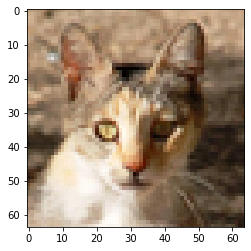

In [5]:
plt.imshow((data[4562]+1)/2)

In [6]:
# Coverting the list into a numpy nd-array
data = np.array(data)
data.shape

(9891, 64, 64, 3)

In [7]:
np.random.shuffle(data)
data.shape

(9891, 64, 64, 3)

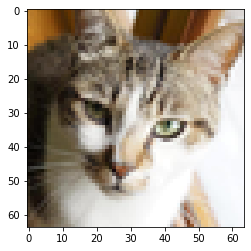

In [8]:
plt.imshow((data[1]+1)/2)

### Using a Vanilla GAN to generate cat images


In [9]:
from numpy import expand_dims
from numpy import zeros
from numpy import ones
from numpy import vstack
from numpy.random import randn
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout

Defining the discriminator 

In [10]:
def define_discriminator(in_shape=(inp_size,inp_size,3)):
    model = Sequential()
    model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    opt = Adam(lr=0.00002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

Defining the generator

In [11]:
def define_generator(latent_dim):
    model = Sequential()
    n_nodes = 64 * 8 * 8
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((8, 8, 64)))
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
    return model

Defining the GAN

In [12]:
def define_gan(g_model, d_model):
    d_model.trainable = False
    model = Sequential()
    model.add(g_model)
    model.add(d_model)
    opt = Adam(lr=0.00002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

Helper functions to load inputs

In [13]:
def load_real_samples():
    (trainX, _), (_, _) = load_data()
    X = trainX.astype('float32')
    X = (X - 127.5) / 127.5
    return X
 
def generate_real_samples(dataset, n_samples):
    ix = randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
    y = ones((n_samples, 1))
    return X, y
 
def generate_latent_points(latent_dim, n_samples):
    x_input = randn(latent_dim * n_samples)
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input
 
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples)
    X = g_model.predict(x_input)
    y = zeros((n_samples, 1))
    return X, y

Training GAN

In [14]:
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=10000, n_batch=512):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    fake_accuracy = []
    real_accuracy = []
    for i in range(n_epochs):
        for j in range(bat_per_epo):
            X_real, y_real = generate_real_samples(dataset, half_batch)
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            X_gan = generate_latent_points(latent_dim, n_batch)
            y_gan = ones((n_batch, 1))
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' %
                (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
        if (i+1) % 10 == 0:
            fake_acc, real_acc = summarize_performance(i, g_model, d_model, dataset, latent_dim)
            fake_accuracy.append(fake_acc)
            real_accuracy.append(real_acc)
    return fake_accuracy, real_accuracy

Performace Summary

In [15]:
plt.rcParams["figure.figsize"] = (20,20)
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=150):
    X_real, y_real = generate_real_samples(dataset, n_samples)
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
    save_plot(x_fake, epoch)
    filename = '/appdisk/projects/Warhol/wild/models/vanilla_generator_model_%03d.h5' % (epoch+1)
    g_model.save(filename)
    return acc_fake*100, acc_real*100
def save_plot(examples, epoch, n=5):
    examples = (examples + 1) / 2.0
    for i in range(n * n):
        plt.subplot(n, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i])
    filename = '/appdisk/projects/Warhol/wild/results/vanilla_generated_plot_e%03d.png' % (epoch+1)
    plt.savefig(filename)
    plt.close()

#### Executing the GAN code

In [16]:
latent_dim = 1024
d_model = define_discriminator()
g_model = define_generator(latent_dim)


In [17]:
g_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 4096)              4198400   
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 4096)              0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 64)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 16, 16, 128)       131200    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 32, 32, 128)       262272    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 32, 32, 128)      

In [18]:
gan_model = define_gan(g_model, d_model)
fake_acc, real_acc = train(g_model, d_model, gan_model, data, latent_dim,n_epochs=10000, n_batch=512)

>1, 1/19, d1=0.705, d2=0.693 g=0.693
>1, 2/19, d1=0.692, d2=0.694 g=0.692
>1, 3/19, d1=0.682, d2=0.695 g=0.690
>1, 4/19, d1=0.673, d2=0.697 g=0.688
>1, 5/19, d1=0.662, d2=0.699 g=0.686
>1, 6/19, d1=0.655, d2=0.701 g=0.684
>1, 7/19, d1=0.641, d2=0.704 g=0.680
>1, 8/19, d1=0.635, d2=0.707 g=0.676
>1, 9/19, d1=0.625, d2=0.712 g=0.671
>1, 10/19, d1=0.615, d2=0.719 g=0.664
>1, 11/19, d1=0.602, d2=0.726 g=0.656
>1, 12/19, d1=0.596, d2=0.735 g=0.647
>1, 13/19, d1=0.581, d2=0.746 g=0.638
>1, 14/19, d1=0.579, d2=0.756 g=0.629
>1, 15/19, d1=0.568, d2=0.768 g=0.620
>1, 16/19, d1=0.561, d2=0.775 g=0.612
>1, 17/19, d1=0.552, d2=0.785 g=0.606
>1, 18/19, d1=0.548, d2=0.794 g=0.600
>1, 19/19, d1=0.543, d2=0.798 g=0.601
>2, 1/19, d1=0.539, d2=0.800 g=0.600
>2, 2/19, d1=0.536, d2=0.799 g=0.600
>2, 3/19, d1=0.535, d2=0.797 g=0.604
>2, 4/19, d1=0.537, d2=0.794 g=0.606
>2, 5/19, d1=0.537, d2=0.786 g=0.610
>2, 6/19, d1=0.529, d2=0.784 g=0.615
>2, 7/19, d1=0.531, d2=0.778 g=0.625
>2, 8/19, d1=0.531, d2=0.767

>12, 9/19, d1=0.484, d2=1.055 g=0.417
>12, 10/19, d1=0.503, d2=1.093 g=0.406
>12, 11/19, d1=0.505, d2=1.114 g=0.411
>12, 12/19, d1=0.518, d2=1.085 g=0.432
>12, 13/19, d1=0.550, d2=1.035 g=0.471
>12, 14/19, d1=0.586, d2=0.969 g=0.526
>12, 15/19, d1=0.586, d2=0.884 g=0.589
>12, 16/19, d1=0.623, d2=0.796 g=0.650
>12, 17/19, d1=0.644, d2=0.726 g=0.703
>12, 18/19, d1=0.656, d2=0.670 g=0.743
>12, 19/19, d1=0.674, d2=0.643 g=0.771
>13, 1/19, d1=0.681, d2=0.626 g=0.790
>13, 2/19, d1=0.686, d2=0.609 g=0.794
>13, 3/19, d1=0.689, d2=0.605 g=0.794
>13, 4/19, d1=0.690, d2=0.610 g=0.788
>13, 5/19, d1=0.690, d2=0.610 g=0.783
>13, 6/19, d1=0.700, d2=0.625 g=0.769
>13, 7/19, d1=0.703, d2=0.625 g=0.758
>13, 8/19, d1=0.683, d2=0.640 g=0.746
>13, 9/19, d1=0.694, d2=0.647 g=0.733
>13, 10/19, d1=0.677, d2=0.661 g=0.724
>13, 11/19, d1=0.666, d2=0.669 g=0.716
>13, 12/19, d1=0.657, d2=0.674 g=0.707
>13, 13/19, d1=0.646, d2=0.685 g=0.699
>13, 14/19, d1=0.636, d2=0.692 g=0.693
>13, 15/19, d1=0.616, d2=0.697 g=0.

>23, 12/19, d1=0.281, d2=1.254 g=0.315
>23, 13/19, d1=0.285, d2=1.316 g=0.305
>23, 14/19, d1=0.306, d2=1.341 g=0.302
>23, 15/19, d1=0.363, d2=1.341 g=0.313
>23, 16/19, d1=0.388, d2=1.284 g=0.341
>23, 17/19, d1=0.413, d2=1.229 g=0.381
>23, 18/19, d1=0.451, d2=1.124 g=0.436
>23, 19/19, d1=0.462, d2=1.021 g=0.494
>24, 1/19, d1=0.499, d2=0.929 g=0.559
>24, 2/19, d1=0.530, d2=0.822 g=0.640
>24, 3/19, d1=0.558, d2=0.741 g=0.721
>24, 4/19, d1=0.566, d2=0.648 g=0.815
>24, 5/19, d1=0.584, d2=0.579 g=0.902
>24, 6/19, d1=0.608, d2=0.520 g=0.989
>24, 7/19, d1=0.613, d2=0.465 g=1.055
>24, 8/19, d1=0.659, d2=0.434 g=1.099
>24, 9/19, d1=0.639, d2=0.412 g=1.132
>24, 10/19, d1=0.635, d2=0.402 g=1.135
>24, 11/19, d1=0.635, d2=0.397 g=1.141
>24, 12/19, d1=0.615, d2=0.400 g=1.135
>24, 13/19, d1=0.613, d2=0.399 g=1.120
>24, 14/19, d1=0.595, d2=0.401 g=1.105
>24, 15/19, d1=0.593, d2=0.416 g=1.081
>24, 16/19, d1=0.585, d2=0.430 g=1.054
>24, 17/19, d1=0.551, d2=0.438 g=1.025
>24, 18/19, d1=0.551, d2=0.457 g=0

>34, 15/19, d1=0.831, d2=0.888 g=0.578
>34, 16/19, d1=0.813, d2=0.858 g=0.609
>34, 17/19, d1=0.819, d2=0.806 g=0.654
>34, 18/19, d1=0.764, d2=0.760 g=0.703
>34, 19/19, d1=0.754, d2=0.710 g=0.729
>35, 1/19, d1=0.680, d2=0.687 g=0.746
>35, 2/19, d1=0.694, d2=0.660 g=0.752
>35, 3/19, d1=0.694, d2=0.669 g=0.721
>35, 4/19, d1=0.674, d2=0.716 g=0.672
>35, 5/19, d1=0.702, d2=0.779 g=0.705
>35, 6/19, d1=0.737, d2=0.719 g=0.886
>35, 7/19, d1=0.854, d2=0.555 g=1.097
>35, 8/19, d1=0.914, d2=0.432 g=1.307
>35, 9/19, d1=0.966, d2=0.344 g=1.497
>35, 10/19, d1=0.973, d2=0.296 g=1.576
>35, 11/19, d1=0.988, d2=0.287 g=1.624
>35, 12/19, d1=0.951, d2=0.264 g=1.627
>35, 13/19, d1=0.965, d2=0.279 g=1.588
>35, 14/19, d1=0.964, d2=0.293 g=1.538
>35, 15/19, d1=0.875, d2=0.291 g=1.488
>35, 16/19, d1=0.888, d2=0.315 g=1.405
>35, 17/19, d1=0.882, d2=0.330 g=1.256
>35, 18/19, d1=0.831, d2=0.391 g=1.123
>35, 19/19, d1=0.828, d2=0.447 g=1.013
>36, 1/19, d1=0.790, d2=0.495 g=0.949
>36, 2/19, d1=0.791, d2=0.526 g=0.9

>45, 18/19, d1=0.702, d2=0.447 g=1.034
>45, 19/19, d1=0.727, d2=0.465 g=0.968
>46, 1/19, d1=0.682, d2=0.501 g=0.924
>46, 2/19, d1=0.656, d2=0.534 g=0.881
>46, 3/19, d1=0.687, d2=0.558 g=0.846
>46, 4/19, d1=0.682, d2=0.583 g=0.823
>46, 5/19, d1=0.652, d2=0.612 g=0.791
>46, 6/19, d1=0.586, d2=0.627 g=0.780
>46, 7/19, d1=0.609, d2=0.626 g=0.771
>46, 8/19, d1=0.611, d2=0.638 g=0.779
>46, 9/19, d1=0.639, d2=0.637 g=0.784
>46, 10/19, d1=0.573, d2=0.620 g=0.800
>46, 11/19, d1=0.652, d2=0.597 g=0.809
>46, 12/19, d1=0.618, d2=0.599 g=0.838
>46, 13/19, d1=0.574, d2=0.588 g=0.853
>46, 14/19, d1=0.591, d2=0.552 g=0.889
>46, 15/19, d1=0.569, d2=0.543 g=0.912
>46, 16/19, d1=0.579, d2=0.513 g=0.924
>46, 17/19, d1=0.536, d2=0.513 g=0.951
>46, 18/19, d1=0.535, d2=0.486 g=0.978
>46, 19/19, d1=0.532, d2=0.485 g=0.983
>47, 1/19, d1=0.518, d2=0.470 g=0.989
>47, 2/19, d1=0.455, d2=0.473 g=0.987
>47, 3/19, d1=0.454, d2=0.482 g=0.983
>47, 4/19, d1=0.485, d2=0.485 g=0.968
>47, 5/19, d1=0.466, d2=0.490 g=0.938


>57, 2/19, d1=0.760, d2=0.757 g=0.687
>57, 3/19, d1=0.761, d2=0.735 g=0.682
>57, 4/19, d1=0.791, d2=0.717 g=0.702
>57, 5/19, d1=0.812, d2=0.690 g=0.712
>57, 6/19, d1=0.791, d2=0.682 g=0.710
>57, 7/19, d1=0.763, d2=0.680 g=0.712
>57, 8/19, d1=0.772, d2=0.696 g=0.714
>57, 9/19, d1=0.763, d2=0.700 g=0.706
>57, 10/19, d1=0.740, d2=0.672 g=0.711
>57, 11/19, d1=0.770, d2=0.678 g=0.737
>57, 12/19, d1=0.769, d2=0.664 g=0.745
>57, 13/19, d1=0.747, d2=0.656 g=0.724
>57, 14/19, d1=0.723, d2=0.664 g=0.748
>57, 15/19, d1=0.706, d2=0.653 g=0.737
>57, 16/19, d1=0.698, d2=0.666 g=0.717
>57, 17/19, d1=0.698, d2=0.692 g=0.692
>57, 18/19, d1=0.685, d2=0.730 g=0.664
>57, 19/19, d1=0.733, d2=0.784 g=0.695
>58, 1/19, d1=0.734, d2=0.772 g=0.757
>58, 2/19, d1=0.821, d2=0.671 g=0.896
>58, 3/19, d1=0.832, d2=0.513 g=1.114
>58, 4/19, d1=0.903, d2=0.439 g=1.303
>58, 5/19, d1=0.939, d2=0.357 g=1.404
>58, 6/19, d1=0.942, d2=0.302 g=1.421
>58, 7/19, d1=0.929, d2=0.295 g=1.347
>58, 8/19, d1=1.004, d2=0.331 g=1.131
>5

>68, 5/19, d1=0.795, d2=0.675 g=0.741
>68, 6/19, d1=0.800, d2=0.674 g=0.743
>68, 7/19, d1=0.783, d2=0.650 g=0.752
>68, 8/19, d1=0.774, d2=0.650 g=0.750
>68, 9/19, d1=0.791, d2=0.644 g=0.757
>68, 10/19, d1=0.793, d2=0.658 g=0.772
>68, 11/19, d1=0.791, d2=0.636 g=0.752
>68, 12/19, d1=0.784, d2=0.643 g=0.773
>68, 13/19, d1=0.786, d2=0.635 g=0.772
>68, 14/19, d1=0.779, d2=0.624 g=0.781
>68, 15/19, d1=0.784, d2=0.618 g=0.787
>68, 16/19, d1=0.787, d2=0.617 g=0.783
>68, 17/19, d1=0.792, d2=0.631 g=0.794
>68, 18/19, d1=0.784, d2=0.606 g=0.793
>68, 19/19, d1=0.769, d2=0.608 g=0.799
>69, 1/19, d1=0.790, d2=0.615 g=0.801
>69, 2/19, d1=0.779, d2=0.594 g=0.800
>69, 3/19, d1=0.756, d2=0.631 g=0.803
>69, 4/19, d1=0.786, d2=0.601 g=0.801
>69, 5/19, d1=0.772, d2=0.615 g=0.805
>69, 6/19, d1=0.761, d2=0.605 g=0.793
>69, 7/19, d1=0.768, d2=0.610 g=0.803
>69, 8/19, d1=0.762, d2=0.610 g=0.796
>69, 9/19, d1=0.774, d2=0.597 g=0.802
>69, 10/19, d1=0.765, d2=0.615 g=0.799
>69, 11/19, d1=0.736, d2=0.614 g=0.810


>79, 8/19, d1=0.831, d2=0.563 g=0.825
>79, 9/19, d1=0.820, d2=0.586 g=0.812
>79, 10/19, d1=0.800, d2=0.596 g=0.806
>79, 11/19, d1=0.781, d2=0.594 g=0.811
>79, 12/19, d1=0.775, d2=0.593 g=0.824
>79, 13/19, d1=0.745, d2=0.581 g=0.832
>79, 14/19, d1=0.739, d2=0.577 g=0.841
>79, 15/19, d1=0.755, d2=0.559 g=0.847
>79, 16/19, d1=0.731, d2=0.559 g=0.857
>79, 17/19, d1=0.734, d2=0.550 g=0.861
>79, 18/19, d1=0.707, d2=0.555 g=0.857
>79, 19/19, d1=0.705, d2=0.553 g=0.862
>80, 1/19, d1=0.692, d2=0.563 g=0.850
>80, 2/19, d1=0.693, d2=0.572 g=0.833
>80, 3/19, d1=0.685, d2=0.578 g=0.806
>80, 4/19, d1=0.680, d2=0.606 g=0.777
>80, 5/19, d1=0.661, d2=0.632 g=0.745
>80, 6/19, d1=0.669, d2=0.673 g=0.724
>80, 7/19, d1=0.649, d2=0.687 g=0.696
>80, 8/19, d1=0.654, d2=0.706 g=0.685
>80, 9/19, d1=0.663, d2=0.716 g=0.687
>80, 10/19, d1=0.670, d2=0.702 g=0.711
>80, 11/19, d1=0.724, d2=0.677 g=0.748
>80, 12/19, d1=0.704, d2=0.643 g=0.779
>80, 13/19, d1=0.730, d2=0.620 g=0.823
>80, 14/19, d1=0.732, d2=0.581 g=0.8

>90, 11/19, d1=0.767, d2=0.658 g=0.741
>90, 12/19, d1=0.773, d2=0.667 g=0.736
>90, 13/19, d1=0.777, d2=0.669 g=0.732
>90, 14/19, d1=0.778, d2=0.653 g=0.728
>90, 15/19, d1=0.772, d2=0.660 g=0.733
>90, 16/19, d1=0.783, d2=0.658 g=0.736
>90, 17/19, d1=0.776, d2=0.651 g=0.736
>90, 18/19, d1=0.787, d2=0.658 g=0.740
>90, 19/19, d1=0.776, d2=0.655 g=0.740
>Accuracy real: 10%, fake: 80%
>91, 1/19, d1=0.728, d2=0.660 g=0.732
>91, 2/19, d1=0.774, d2=0.665 g=0.743
>91, 3/19, d1=0.776, d2=0.651 g=0.738
>91, 4/19, d1=0.778, d2=0.664 g=0.737
>91, 5/19, d1=0.782, d2=0.654 g=0.737
>91, 6/19, d1=0.772, d2=0.654 g=0.735
>91, 7/19, d1=0.784, d2=0.662 g=0.734
>91, 8/19, d1=0.782, d2=0.655 g=0.738
>91, 9/19, d1=0.783, d2=0.655 g=0.739
>91, 10/19, d1=0.792, d2=0.649 g=0.741
>91, 11/19, d1=0.785, d2=0.652 g=0.741
>91, 12/19, d1=0.775, d2=0.652 g=0.739
>91, 13/19, d1=0.774, d2=0.649 g=0.741
>91, 14/19, d1=0.769, d2=0.654 g=0.743
>91, 15/19, d1=0.773, d2=0.654 g=0.746
>91, 16/19, d1=0.787, d2=0.650 g=0.740
>91

>101, 13/19, d1=0.737, d2=0.708 g=0.686
>101, 14/19, d1=0.730, d2=0.702 g=0.683
>101, 15/19, d1=0.737, d2=0.704 g=0.680
>101, 16/19, d1=0.730, d2=0.710 g=0.673
>101, 17/19, d1=0.727, d2=0.721 g=0.663
>101, 18/19, d1=0.731, d2=0.729 g=0.650
>101, 19/19, d1=0.737, d2=0.751 g=0.648
>102, 1/19, d1=0.729, d2=0.750 g=0.663
>102, 2/19, d1=0.732, d2=0.729 g=0.683
>102, 3/19, d1=0.751, d2=0.696 g=0.717
>102, 4/19, d1=0.753, d2=0.672 g=0.730
>102, 5/19, d1=0.747, d2=0.660 g=0.719
>102, 6/19, d1=0.763, d2=0.667 g=0.709
>102, 7/19, d1=0.761, d2=0.686 g=0.690
>102, 8/19, d1=0.754, d2=0.708 g=0.671
>102, 9/19, d1=0.755, d2=0.721 g=0.669
>102, 10/19, d1=0.754, d2=0.724 g=0.673
>102, 11/19, d1=0.746, d2=0.721 g=0.679
>102, 12/19, d1=0.757, d2=0.715 g=0.685
>102, 13/19, d1=0.758, d2=0.700 g=0.693
>102, 14/19, d1=0.752, d2=0.693 g=0.701
>102, 15/19, d1=0.758, d2=0.690 g=0.702
>102, 16/19, d1=0.755, d2=0.687 g=0.697
>102, 17/19, d1=0.756, d2=0.688 g=0.702
>102, 18/19, d1=0.748, d2=0.693 g=0.691
>102, 19/

>112, 11/19, d1=0.742, d2=0.690 g=0.702
>112, 12/19, d1=0.749, d2=0.682 g=0.704
>112, 13/19, d1=0.749, d2=0.688 g=0.702
>112, 14/19, d1=0.746, d2=0.690 g=0.703
>112, 15/19, d1=0.742, d2=0.687 g=0.699
>112, 16/19, d1=0.748, d2=0.689 g=0.702
>112, 17/19, d1=0.750, d2=0.686 g=0.701
>112, 18/19, d1=0.744, d2=0.685 g=0.702
>112, 19/19, d1=0.743, d2=0.684 g=0.705
>113, 1/19, d1=0.743, d2=0.689 g=0.701
>113, 2/19, d1=0.744, d2=0.687 g=0.703
>113, 3/19, d1=0.745, d2=0.686 g=0.699
>113, 4/19, d1=0.739, d2=0.691 g=0.701
>113, 5/19, d1=0.746, d2=0.691 g=0.701
>113, 6/19, d1=0.739, d2=0.681 g=0.698
>113, 7/19, d1=0.747, d2=0.688 g=0.700
>113, 8/19, d1=0.745, d2=0.689 g=0.700
>113, 9/19, d1=0.748, d2=0.687 g=0.701
>113, 10/19, d1=0.742, d2=0.687 g=0.699
>113, 11/19, d1=0.748, d2=0.693 g=0.702
>113, 12/19, d1=0.747, d2=0.686 g=0.703
>113, 13/19, d1=0.751, d2=0.687 g=0.705
>113, 14/19, d1=0.749, d2=0.682 g=0.710
>113, 15/19, d1=0.752, d2=0.681 g=0.705
>113, 16/19, d1=0.750, d2=0.685 g=0.707
>113, 17/

>123, 9/19, d1=0.742, d2=0.690 g=0.698
>123, 10/19, d1=0.746, d2=0.691 g=0.698
>123, 11/19, d1=0.744, d2=0.689 g=0.701
>123, 12/19, d1=0.745, d2=0.691 g=0.700
>123, 13/19, d1=0.747, d2=0.690 g=0.699
>123, 14/19, d1=0.743, d2=0.693 g=0.699
>123, 15/19, d1=0.746, d2=0.687 g=0.699
>123, 16/19, d1=0.741, d2=0.691 g=0.698
>123, 17/19, d1=0.746, d2=0.689 g=0.699
>123, 18/19, d1=0.742, d2=0.692 g=0.701
>123, 19/19, d1=0.741, d2=0.690 g=0.698
>124, 1/19, d1=0.746, d2=0.690 g=0.698
>124, 2/19, d1=0.742, d2=0.690 g=0.695
>124, 3/19, d1=0.744, d2=0.690 g=0.698
>124, 4/19, d1=0.745, d2=0.689 g=0.699
>124, 5/19, d1=0.740, d2=0.690 g=0.697
>124, 6/19, d1=0.745, d2=0.691 g=0.698
>124, 7/19, d1=0.747, d2=0.693 g=0.696
>124, 8/19, d1=0.742, d2=0.691 g=0.694
>124, 9/19, d1=0.738, d2=0.689 g=0.697
>124, 10/19, d1=0.743, d2=0.695 g=0.693
>124, 11/19, d1=0.744, d2=0.691 g=0.695
>124, 12/19, d1=0.742, d2=0.690 g=0.694
>124, 13/19, d1=0.746, d2=0.694 g=0.694
>124, 14/19, d1=0.741, d2=0.695 g=0.695
>124, 15/1

>134, 7/19, d1=0.752, d2=0.679 g=0.707
>134, 8/19, d1=0.754, d2=0.679 g=0.710
>134, 9/19, d1=0.751, d2=0.677 g=0.706
>134, 10/19, d1=0.750, d2=0.680 g=0.709
>134, 11/19, d1=0.754, d2=0.679 g=0.709
>134, 12/19, d1=0.752, d2=0.678 g=0.712
>134, 13/19, d1=0.754, d2=0.679 g=0.709
>134, 14/19, d1=0.752, d2=0.679 g=0.708
>134, 15/19, d1=0.756, d2=0.679 g=0.710
>134, 16/19, d1=0.752, d2=0.681 g=0.708
>134, 17/19, d1=0.755, d2=0.681 g=0.710
>134, 18/19, d1=0.753, d2=0.678 g=0.709
>134, 19/19, d1=0.752, d2=0.677 g=0.710
>135, 1/19, d1=0.754, d2=0.678 g=0.709
>135, 2/19, d1=0.755, d2=0.682 g=0.707
>135, 3/19, d1=0.753, d2=0.681 g=0.709
>135, 4/19, d1=0.754, d2=0.680 g=0.708
>135, 5/19, d1=0.751, d2=0.678 g=0.709
>135, 6/19, d1=0.753, d2=0.678 g=0.708
>135, 7/19, d1=0.753, d2=0.678 g=0.707
>135, 8/19, d1=0.750, d2=0.678 g=0.709
>135, 9/19, d1=0.750, d2=0.681 g=0.708
>135, 10/19, d1=0.753, d2=0.680 g=0.708
>135, 11/19, d1=0.749, d2=0.680 g=0.709
>135, 12/19, d1=0.752, d2=0.678 g=0.711
>135, 13/19,

>145, 5/19, d1=0.750, d2=0.680 g=0.708
>145, 6/19, d1=0.749, d2=0.679 g=0.708
>145, 7/19, d1=0.749, d2=0.680 g=0.708
>145, 8/19, d1=0.751, d2=0.679 g=0.709
>145, 9/19, d1=0.751, d2=0.681 g=0.708
>145, 10/19, d1=0.748, d2=0.680 g=0.708
>145, 11/19, d1=0.749, d2=0.680 g=0.707
>145, 12/19, d1=0.750, d2=0.681 g=0.708
>145, 13/19, d1=0.750, d2=0.680 g=0.707
>145, 14/19, d1=0.748, d2=0.679 g=0.709
>145, 15/19, d1=0.752, d2=0.680 g=0.709
>145, 16/19, d1=0.751, d2=0.680 g=0.708
>145, 17/19, d1=0.749, d2=0.680 g=0.708
>145, 18/19, d1=0.749, d2=0.679 g=0.709
>145, 19/19, d1=0.750, d2=0.681 g=0.709
>146, 1/19, d1=0.749, d2=0.681 g=0.707
>146, 2/19, d1=0.750, d2=0.681 g=0.708
>146, 3/19, d1=0.749, d2=0.680 g=0.707
>146, 4/19, d1=0.749, d2=0.682 g=0.708
>146, 5/19, d1=0.749, d2=0.682 g=0.707
>146, 6/19, d1=0.750, d2=0.681 g=0.707
>146, 7/19, d1=0.749, d2=0.682 g=0.707
>146, 8/19, d1=0.749, d2=0.680 g=0.707
>146, 9/19, d1=0.746, d2=0.683 g=0.708
>146, 10/19, d1=0.748, d2=0.681 g=0.706
>146, 11/19, d

>156, 3/19, d1=0.744, d2=0.678 g=0.708
>156, 4/19, d1=0.743, d2=0.680 g=0.708
>156, 5/19, d1=0.744, d2=0.681 g=0.707
>156, 6/19, d1=0.743, d2=0.681 g=0.708
>156, 7/19, d1=0.743, d2=0.680 g=0.707
>156, 8/19, d1=0.744, d2=0.680 g=0.708
>156, 9/19, d1=0.745, d2=0.679 g=0.708
>156, 10/19, d1=0.745, d2=0.680 g=0.707
>156, 11/19, d1=0.743, d2=0.680 g=0.708
>156, 12/19, d1=0.745, d2=0.680 g=0.709
>156, 13/19, d1=0.745, d2=0.679 g=0.708
>156, 14/19, d1=0.744, d2=0.679 g=0.708
>156, 15/19, d1=0.744, d2=0.679 g=0.709
>156, 16/19, d1=0.745, d2=0.678 g=0.709
>156, 17/19, d1=0.744, d2=0.679 g=0.709
>156, 18/19, d1=0.746, d2=0.680 g=0.709
>156, 19/19, d1=0.745, d2=0.678 g=0.709
>157, 1/19, d1=0.743, d2=0.677 g=0.709
>157, 2/19, d1=0.744, d2=0.678 g=0.709
>157, 3/19, d1=0.745, d2=0.677 g=0.708
>157, 4/19, d1=0.745, d2=0.677 g=0.709
>157, 5/19, d1=0.745, d2=0.680 g=0.709
>157, 6/19, d1=0.744, d2=0.679 g=0.709
>157, 7/19, d1=0.744, d2=0.679 g=0.709
>157, 8/19, d1=0.743, d2=0.679 g=0.709
>157, 9/19, d1=

>167, 1/19, d1=0.736, d2=0.680 g=0.708
>167, 2/19, d1=0.735, d2=0.679 g=0.707
>167, 3/19, d1=0.736, d2=0.679 g=0.707
>167, 4/19, d1=0.736, d2=0.681 g=0.706
>167, 5/19, d1=0.737, d2=0.680 g=0.707
>167, 6/19, d1=0.736, d2=0.680 g=0.707
>167, 7/19, d1=0.735, d2=0.681 g=0.706
>167, 8/19, d1=0.735, d2=0.680 g=0.707
>167, 9/19, d1=0.736, d2=0.681 g=0.706
>167, 10/19, d1=0.735, d2=0.682 g=0.707
>167, 11/19, d1=0.735, d2=0.680 g=0.706
>167, 12/19, d1=0.736, d2=0.680 g=0.707
>167, 13/19, d1=0.735, d2=0.681 g=0.706
>167, 14/19, d1=0.735, d2=0.681 g=0.706
>167, 15/19, d1=0.734, d2=0.681 g=0.706
>167, 16/19, d1=0.734, d2=0.681 g=0.706
>167, 17/19, d1=0.736, d2=0.681 g=0.707
>167, 18/19, d1=0.735, d2=0.681 g=0.707
>167, 19/19, d1=0.734, d2=0.681 g=0.706
>168, 1/19, d1=0.736, d2=0.680 g=0.706
>168, 2/19, d1=0.735, d2=0.681 g=0.707
>168, 3/19, d1=0.733, d2=0.681 g=0.706
>168, 4/19, d1=0.733, d2=0.681 g=0.706
>168, 5/19, d1=0.734, d2=0.681 g=0.706
>168, 6/19, d1=0.734, d2=0.681 g=0.706
>168, 7/19, d1=

>177, 18/19, d1=0.729, d2=0.678 g=0.708
>177, 19/19, d1=0.730, d2=0.679 g=0.708
>178, 1/19, d1=0.730, d2=0.679 g=0.709
>178, 2/19, d1=0.731, d2=0.680 g=0.708
>178, 3/19, d1=0.730, d2=0.679 g=0.708
>178, 4/19, d1=0.729, d2=0.679 g=0.708
>178, 5/19, d1=0.729, d2=0.679 g=0.708
>178, 6/19, d1=0.729, d2=0.680 g=0.707
>178, 7/19, d1=0.730, d2=0.680 g=0.707
>178, 8/19, d1=0.729, d2=0.680 g=0.707
>178, 9/19, d1=0.728, d2=0.679 g=0.707
>178, 10/19, d1=0.729, d2=0.681 g=0.707
>178, 11/19, d1=0.728, d2=0.681 g=0.706
>178, 12/19, d1=0.728, d2=0.682 g=0.705
>178, 13/19, d1=0.727, d2=0.682 g=0.705
>178, 14/19, d1=0.728, d2=0.682 g=0.705
>178, 15/19, d1=0.727, d2=0.682 g=0.705
>178, 16/19, d1=0.727, d2=0.682 g=0.705
>178, 17/19, d1=0.726, d2=0.682 g=0.705
>178, 18/19, d1=0.726, d2=0.682 g=0.704
>178, 19/19, d1=0.726, d2=0.682 g=0.705
>179, 1/19, d1=0.726, d2=0.683 g=0.704
>179, 2/19, d1=0.726, d2=0.683 g=0.704
>179, 3/19, d1=0.725, d2=0.683 g=0.704
>179, 4/19, d1=0.725, d2=0.683 g=0.704
>179, 5/19, d

>188, 16/19, d1=0.721, d2=0.683 g=0.704
>188, 17/19, d1=0.722, d2=0.683 g=0.704
>188, 18/19, d1=0.721, d2=0.683 g=0.704
>188, 19/19, d1=0.721, d2=0.683 g=0.704
>189, 1/19, d1=0.720, d2=0.683 g=0.704
>189, 2/19, d1=0.721, d2=0.683 g=0.704
>189, 3/19, d1=0.720, d2=0.683 g=0.704
>189, 4/19, d1=0.721, d2=0.683 g=0.704
>189, 5/19, d1=0.720, d2=0.683 g=0.703
>189, 6/19, d1=0.720, d2=0.684 g=0.703
>189, 7/19, d1=0.721, d2=0.684 g=0.703
>189, 8/19, d1=0.719, d2=0.684 g=0.703
>189, 9/19, d1=0.718, d2=0.685 g=0.701
>189, 10/19, d1=0.719, d2=0.688 g=0.692
>189, 11/19, d1=0.720, d2=0.697 g=0.696
>189, 12/19, d1=0.721, d2=0.689 g=0.706
>189, 13/19, d1=0.720, d2=0.677 g=0.715
>189, 14/19, d1=0.721, d2=0.670 g=0.720
>189, 15/19, d1=0.722, d2=0.667 g=0.712
>189, 16/19, d1=0.722, d2=0.679 g=0.678
>189, 17/19, d1=0.722, d2=0.725 g=0.691
>189, 18/19, d1=0.725, d2=0.683 g=0.727
>189, 19/19, d1=0.727, d2=0.652 g=0.748
>190, 1/19, d1=0.729, d2=0.638 g=0.763
>190, 2/19, d1=0.730, d2=0.625 g=0.774
>190, 3/19,

>199, 14/19, d1=0.711, d2=0.689 g=0.698
>199, 15/19, d1=0.711, d2=0.689 g=0.697
>199, 16/19, d1=0.711, d2=0.689 g=0.698
>199, 17/19, d1=0.711, d2=0.689 g=0.698
>199, 18/19, d1=0.711, d2=0.689 g=0.698
>199, 19/19, d1=0.711, d2=0.689 g=0.698
>200, 1/19, d1=0.711, d2=0.690 g=0.698
>200, 2/19, d1=0.711, d2=0.689 g=0.698
>200, 3/19, d1=0.711, d2=0.689 g=0.698
>200, 4/19, d1=0.711, d2=0.689 g=0.698
>200, 5/19, d1=0.712, d2=0.688 g=0.699
>200, 6/19, d1=0.711, d2=0.689 g=0.698
>200, 7/19, d1=0.711, d2=0.689 g=0.698
>200, 8/19, d1=0.712, d2=0.689 g=0.699
>200, 9/19, d1=0.712, d2=0.688 g=0.699
>200, 10/19, d1=0.712, d2=0.688 g=0.699
>200, 11/19, d1=0.712, d2=0.688 g=0.699
>200, 12/19, d1=0.712, d2=0.688 g=0.699
>200, 13/19, d1=0.712, d2=0.688 g=0.699
>200, 14/19, d1=0.712, d2=0.688 g=0.699
>200, 15/19, d1=0.713, d2=0.688 g=0.699
>200, 16/19, d1=0.712, d2=0.688 g=0.699
>200, 17/19, d1=0.712, d2=0.687 g=0.699
>200, 18/19, d1=0.712, d2=0.687 g=0.699
>200, 19/19, d1=0.713, d2=0.688 g=0.699
>Accuracy

>210, 12/19, d1=0.713, d2=0.686 g=0.701
>210, 13/19, d1=0.713, d2=0.686 g=0.701
>210, 14/19, d1=0.713, d2=0.686 g=0.701
>210, 15/19, d1=0.713, d2=0.686 g=0.701
>210, 16/19, d1=0.712, d2=0.686 g=0.701
>210, 17/19, d1=0.713, d2=0.686 g=0.701
>210, 18/19, d1=0.713, d2=0.686 g=0.701
>210, 19/19, d1=0.712, d2=0.686 g=0.701
>Accuracy real: 0%, fake: 100%
>211, 1/19, d1=0.702, d2=0.686 g=0.701
>211, 2/19, d1=0.713, d2=0.686 g=0.701
>211, 3/19, d1=0.713, d2=0.686 g=0.701
>211, 4/19, d1=0.712, d2=0.686 g=0.701
>211, 5/19, d1=0.712, d2=0.686 g=0.701
>211, 6/19, d1=0.712, d2=0.686 g=0.701
>211, 7/19, d1=0.712, d2=0.686 g=0.701
>211, 8/19, d1=0.712, d2=0.686 g=0.701
>211, 9/19, d1=0.712, d2=0.686 g=0.701
>211, 10/19, d1=0.713, d2=0.685 g=0.701
>211, 11/19, d1=0.712, d2=0.686 g=0.701
>211, 12/19, d1=0.712, d2=0.686 g=0.701
>211, 13/19, d1=0.712, d2=0.686 g=0.701
>211, 14/19, d1=0.712, d2=0.686 g=0.701
>211, 15/19, d1=0.713, d2=0.685 g=0.701
>211, 16/19, d1=0.712, d2=0.686 g=0.701
>211, 17/19, d1=0.

>221, 9/19, d1=0.707, d2=0.690 g=0.698
>221, 10/19, d1=0.707, d2=0.689 g=0.698
>221, 11/19, d1=0.707, d2=0.689 g=0.698
>221, 12/19, d1=0.708, d2=0.689 g=0.698
>221, 13/19, d1=0.708, d2=0.688 g=0.699
>221, 14/19, d1=0.708, d2=0.688 g=0.699
>221, 15/19, d1=0.708, d2=0.688 g=0.699
>221, 16/19, d1=0.708, d2=0.688 g=0.699
>221, 17/19, d1=0.709, d2=0.687 g=0.700
>221, 18/19, d1=0.709, d2=0.687 g=0.700
>221, 19/19, d1=0.709, d2=0.687 g=0.700
>222, 1/19, d1=0.709, d2=0.687 g=0.701
>222, 2/19, d1=0.709, d2=0.687 g=0.700
>222, 3/19, d1=0.709, d2=0.686 g=0.701
>222, 4/19, d1=0.710, d2=0.686 g=0.701
>222, 5/19, d1=0.710, d2=0.686 g=0.701
>222, 6/19, d1=0.710, d2=0.686 g=0.701
>222, 7/19, d1=0.710, d2=0.686 g=0.701
>222, 8/19, d1=0.710, d2=0.686 g=0.701
>222, 9/19, d1=0.710, d2=0.686 g=0.701
>222, 10/19, d1=0.710, d2=0.686 g=0.701
>222, 11/19, d1=0.710, d2=0.686 g=0.701
>222, 12/19, d1=0.710, d2=0.685 g=0.701
>222, 13/19, d1=0.711, d2=0.686 g=0.701
>222, 14/19, d1=0.710, d2=0.686 g=0.701
>222, 15/1

>232, 7/19, d1=0.707, d2=0.688 g=0.699
>232, 8/19, d1=0.707, d2=0.688 g=0.699
>232, 9/19, d1=0.707, d2=0.688 g=0.699
>232, 10/19, d1=0.707, d2=0.688 g=0.699
>232, 11/19, d1=0.707, d2=0.688 g=0.699
>232, 12/19, d1=0.707, d2=0.688 g=0.699
>232, 13/19, d1=0.707, d2=0.688 g=0.699
>232, 14/19, d1=0.707, d2=0.688 g=0.699
>232, 15/19, d1=0.707, d2=0.687 g=0.699
>232, 16/19, d1=0.707, d2=0.687 g=0.699
>232, 17/19, d1=0.707, d2=0.688 g=0.699
>232, 18/19, d1=0.707, d2=0.688 g=0.699
>232, 19/19, d1=0.707, d2=0.688 g=0.699
>233, 1/19, d1=0.708, d2=0.688 g=0.699
>233, 2/19, d1=0.707, d2=0.688 g=0.699
>233, 3/19, d1=0.708, d2=0.688 g=0.699
>233, 4/19, d1=0.707, d2=0.688 g=0.699
>233, 5/19, d1=0.707, d2=0.688 g=0.699
>233, 6/19, d1=0.707, d2=0.688 g=0.699
>233, 7/19, d1=0.707, d2=0.688 g=0.699
>233, 8/19, d1=0.707, d2=0.688 g=0.699
>233, 9/19, d1=0.707, d2=0.687 g=0.699
>233, 10/19, d1=0.708, d2=0.688 g=0.699
>233, 11/19, d1=0.707, d2=0.688 g=0.699
>233, 12/19, d1=0.707, d2=0.688 g=0.699
>233, 13/19,

>243, 5/19, d1=0.707, d2=0.688 g=0.699
>243, 6/19, d1=0.707, d2=0.688 g=0.699
>243, 7/19, d1=0.707, d2=0.688 g=0.699
>243, 8/19, d1=0.707, d2=0.687 g=0.699
>243, 9/19, d1=0.707, d2=0.687 g=0.699
>243, 10/19, d1=0.707, d2=0.688 g=0.699
>243, 11/19, d1=0.707, d2=0.688 g=0.699
>243, 12/19, d1=0.707, d2=0.688 g=0.699
>243, 13/19, d1=0.707, d2=0.687 g=0.699
>243, 14/19, d1=0.707, d2=0.688 g=0.699
>243, 15/19, d1=0.707, d2=0.688 g=0.699
>243, 16/19, d1=0.707, d2=0.688 g=0.699
>243, 17/19, d1=0.707, d2=0.688 g=0.699
>243, 18/19, d1=0.707, d2=0.688 g=0.699
>243, 19/19, d1=0.707, d2=0.688 g=0.699
>244, 1/19, d1=0.707, d2=0.688 g=0.699
>244, 2/19, d1=0.707, d2=0.688 g=0.699
>244, 3/19, d1=0.707, d2=0.688 g=0.699
>244, 4/19, d1=0.707, d2=0.688 g=0.699
>244, 5/19, d1=0.707, d2=0.688 g=0.699
>244, 6/19, d1=0.706, d2=0.688 g=0.699
>244, 7/19, d1=0.707, d2=0.688 g=0.699
>244, 8/19, d1=0.707, d2=0.688 g=0.699
>244, 9/19, d1=0.707, d2=0.687 g=0.699
>244, 10/19, d1=0.707, d2=0.687 g=0.699
>244, 11/19, d

>254, 3/19, d1=0.704, d2=0.690 g=0.697
>254, 4/19, d1=0.705, d2=0.690 g=0.697
>254, 5/19, d1=0.704, d2=0.690 g=0.697
>254, 6/19, d1=0.705, d2=0.689 g=0.697
>254, 7/19, d1=0.704, d2=0.689 g=0.697
>254, 8/19, d1=0.705, d2=0.689 g=0.697
>254, 9/19, d1=0.704, d2=0.690 g=0.697
>254, 10/19, d1=0.704, d2=0.690 g=0.697
>254, 11/19, d1=0.704, d2=0.690 g=0.697
>254, 12/19, d1=0.705, d2=0.689 g=0.697
>254, 13/19, d1=0.705, d2=0.690 g=0.697
>254, 14/19, d1=0.705, d2=0.690 g=0.697
>254, 15/19, d1=0.705, d2=0.690 g=0.697
>254, 16/19, d1=0.705, d2=0.690 g=0.697
>254, 17/19, d1=0.704, d2=0.689 g=0.697
>254, 18/19, d1=0.704, d2=0.690 g=0.697
>254, 19/19, d1=0.704, d2=0.690 g=0.697
>255, 1/19, d1=0.705, d2=0.690 g=0.697
>255, 2/19, d1=0.704, d2=0.689 g=0.698
>255, 3/19, d1=0.704, d2=0.689 g=0.697
>255, 4/19, d1=0.705, d2=0.689 g=0.697
>255, 5/19, d1=0.704, d2=0.689 g=0.697
>255, 6/19, d1=0.705, d2=0.689 g=0.698
>255, 7/19, d1=0.705, d2=0.689 g=0.698
>255, 8/19, d1=0.705, d2=0.690 g=0.698
>255, 9/19, d1=

>265, 1/19, d1=0.713, d2=0.658 g=0.722
>265, 2/19, d1=0.715, d2=0.680 g=0.688
>265, 3/19, d1=0.715, d2=0.701 g=0.694
>265, 4/19, d1=0.716, d2=0.690 g=0.704
>265, 5/19, d1=0.716, d2=0.681 g=0.712
>265, 6/19, d1=0.718, d2=0.673 g=0.718
>265, 7/19, d1=0.717, d2=0.670 g=0.718
>265, 8/19, d1=0.718, d2=0.670 g=0.711
>265, 9/19, d1=0.718, d2=0.677 g=0.709
>265, 10/19, d1=0.718, d2=0.679 g=0.707
>265, 11/19, d1=0.718, d2=0.680 g=0.706
>265, 12/19, d1=0.717, d2=0.681 g=0.706
>265, 13/19, d1=0.716, d2=0.681 g=0.705
>265, 14/19, d1=0.715, d2=0.682 g=0.705
>265, 15/19, d1=0.715, d2=0.682 g=0.704
>265, 16/19, d1=0.714, d2=0.683 g=0.704
>265, 17/19, d1=0.713, d2=0.683 g=0.703
>265, 18/19, d1=0.713, d2=0.684 g=0.703
>265, 19/19, d1=0.711, d2=0.684 g=0.703
>266, 1/19, d1=0.711, d2=0.684 g=0.702
>266, 2/19, d1=0.711, d2=0.685 g=0.702
>266, 3/19, d1=0.711, d2=0.685 g=0.701
>266, 4/19, d1=0.709, d2=0.686 g=0.701
>266, 5/19, d1=0.709, d2=0.686 g=0.700
>266, 6/19, d1=0.708, d2=0.686 g=0.700
>266, 7/19, d1=

>275, 18/19, d1=0.702, d2=0.690 g=0.697
>275, 19/19, d1=0.702, d2=0.690 g=0.697
>276, 1/19, d1=0.702, d2=0.690 g=0.697
>276, 2/19, d1=0.702, d2=0.690 g=0.697
>276, 3/19, d1=0.702, d2=0.690 g=0.697
>276, 4/19, d1=0.702, d2=0.690 g=0.697
>276, 5/19, d1=0.702, d2=0.690 g=0.697
>276, 6/19, d1=0.702, d2=0.689 g=0.697
>276, 7/19, d1=0.702, d2=0.689 g=0.698
>276, 8/19, d1=0.702, d2=0.690 g=0.697
>276, 9/19, d1=0.702, d2=0.689 g=0.697
>276, 10/19, d1=0.702, d2=0.690 g=0.698
>276, 11/19, d1=0.703, d2=0.690 g=0.697
>276, 12/19, d1=0.702, d2=0.689 g=0.697
>276, 13/19, d1=0.702, d2=0.689 g=0.698
>276, 14/19, d1=0.702, d2=0.689 g=0.697
>276, 15/19, d1=0.702, d2=0.689 g=0.698
>276, 16/19, d1=0.702, d2=0.690 g=0.697
>276, 17/19, d1=0.702, d2=0.689 g=0.697
>276, 18/19, d1=0.702, d2=0.690 g=0.697
>276, 19/19, d1=0.702, d2=0.690 g=0.697
>277, 1/19, d1=0.702, d2=0.690 g=0.697
>277, 2/19, d1=0.703, d2=0.690 g=0.697
>277, 3/19, d1=0.702, d2=0.690 g=0.698
>277, 4/19, d1=0.702, d2=0.689 g=0.697
>277, 5/19, d

>286, 16/19, d1=0.702, d2=0.689 g=0.698
>286, 17/19, d1=0.702, d2=0.689 g=0.698
>286, 18/19, d1=0.702, d2=0.689 g=0.698
>286, 19/19, d1=0.702, d2=0.689 g=0.697
>287, 1/19, d1=0.702, d2=0.689 g=0.698
>287, 2/19, d1=0.702, d2=0.689 g=0.698
>287, 3/19, d1=0.702, d2=0.689 g=0.698
>287, 4/19, d1=0.702, d2=0.689 g=0.697
>287, 5/19, d1=0.702, d2=0.690 g=0.696
>287, 6/19, d1=0.702, d2=0.691 g=0.699
>287, 7/19, d1=0.703, d2=0.687 g=0.703
>287, 8/19, d1=0.704, d2=0.683 g=0.705
>287, 9/19, d1=0.704, d2=0.683 g=0.699
>287, 10/19, d1=0.705, d2=0.690 g=0.695
>287, 11/19, d1=0.705, d2=0.692 g=0.702
>287, 12/19, d1=0.706, d2=0.682 g=0.711
>287, 13/19, d1=0.708, d2=0.673 g=0.719
>287, 14/19, d1=0.709, d2=0.667 g=0.708
>287, 15/19, d1=0.710, d2=0.689 g=0.687
>287, 16/19, d1=0.711, d2=0.700 g=0.694
>287, 17/19, d1=0.711, d2=0.690 g=0.703
>287, 18/19, d1=0.712, d2=0.681 g=0.711
>287, 19/19, d1=0.712, d2=0.674 g=0.716
>288, 1/19, d1=0.713, d2=0.671 g=0.716
>288, 2/19, d1=0.713, d2=0.672 g=0.708
>288, 3/19,

>297, 14/19, d1=0.699, d2=0.691 g=0.695
>297, 15/19, d1=0.699, d2=0.691 g=0.696
>297, 16/19, d1=0.699, d2=0.692 g=0.695
>297, 17/19, d1=0.699, d2=0.692 g=0.695
>297, 18/19, d1=0.699, d2=0.691 g=0.695
>297, 19/19, d1=0.699, d2=0.692 g=0.695
>298, 1/19, d1=0.699, d2=0.692 g=0.695
>298, 2/19, d1=0.699, d2=0.692 g=0.695
>298, 3/19, d1=0.699, d2=0.692 g=0.695
>298, 4/19, d1=0.699, d2=0.692 g=0.695
>298, 5/19, d1=0.699, d2=0.692 g=0.695
>298, 6/19, d1=0.699, d2=0.692 g=0.695
>298, 7/19, d1=0.699, d2=0.692 g=0.695
>298, 8/19, d1=0.699, d2=0.692 g=0.695
>298, 9/19, d1=0.699, d2=0.692 g=0.695
>298, 10/19, d1=0.698, d2=0.692 g=0.695
>298, 11/19, d1=0.699, d2=0.692 g=0.695
>298, 12/19, d1=0.699, d2=0.692 g=0.695
>298, 13/19, d1=0.699, d2=0.692 g=0.695
>298, 14/19, d1=0.699, d2=0.692 g=0.695
>298, 15/19, d1=0.699, d2=0.692 g=0.695
>298, 16/19, d1=0.699, d2=0.692 g=0.695
>298, 17/19, d1=0.699, d2=0.692 g=0.695
>298, 18/19, d1=0.699, d2=0.692 g=0.695
>298, 19/19, d1=0.699, d2=0.691 g=0.696
>299, 1/1

>308, 12/19, d1=0.696, d2=0.694 g=0.693
>308, 13/19, d1=0.696, d2=0.694 g=0.693
>308, 14/19, d1=0.696, d2=0.694 g=0.693
>308, 15/19, d1=0.696, d2=0.694 g=0.693
>308, 16/19, d1=0.696, d2=0.694 g=0.693
>308, 17/19, d1=0.696, d2=0.694 g=0.693
>308, 18/19, d1=0.696, d2=0.694 g=0.693
>308, 19/19, d1=0.696, d2=0.694 g=0.693
>309, 1/19, d1=0.696, d2=0.694 g=0.693
>309, 2/19, d1=0.696, d2=0.693 g=0.693
>309, 3/19, d1=0.696, d2=0.694 g=0.694
>309, 4/19, d1=0.697, d2=0.694 g=0.694
>309, 5/19, d1=0.697, d2=0.693 g=0.694
>309, 6/19, d1=0.697, d2=0.693 g=0.694
>309, 7/19, d1=0.697, d2=0.693 g=0.694
>309, 8/19, d1=0.697, d2=0.693 g=0.694
>309, 9/19, d1=0.697, d2=0.693 g=0.694
>309, 10/19, d1=0.697, d2=0.693 g=0.694
>309, 11/19, d1=0.697, d2=0.692 g=0.694
>309, 12/19, d1=0.698, d2=0.692 g=0.695
>309, 13/19, d1=0.698, d2=0.692 g=0.695
>309, 14/19, d1=0.698, d2=0.692 g=0.695
>309, 15/19, d1=0.698, d2=0.692 g=0.695
>309, 16/19, d1=0.698, d2=0.692 g=0.695
>309, 17/19, d1=0.698, d2=0.692 g=0.695
>309, 18/

>319, 10/19, d1=0.698, d2=0.692 g=0.695
>319, 11/19, d1=0.698, d2=0.692 g=0.694
>319, 12/19, d1=0.698, d2=0.693 g=0.694
>319, 13/19, d1=0.698, d2=0.692 g=0.695
>319, 14/19, d1=0.697, d2=0.692 g=0.694
>319, 15/19, d1=0.697, d2=0.692 g=0.694
>319, 16/19, d1=0.697, d2=0.693 g=0.689
>319, 17/19, d1=0.697, d2=0.700 g=0.689
>319, 18/19, d1=0.698, d2=0.696 g=0.695
>319, 19/19, d1=0.699, d2=0.690 g=0.701
>320, 1/19, d1=0.700, d2=0.685 g=0.705
>320, 2/19, d1=0.701, d2=0.681 g=0.703
>320, 3/19, d1=0.702, d2=0.687 g=0.697
>320, 4/19, d1=0.702, d2=0.690 g=0.698
>320, 5/19, d1=0.703, d2=0.688 g=0.702
>320, 6/19, d1=0.703, d2=0.684 g=0.704
>320, 7/19, d1=0.704, d2=0.684 g=0.693
>320, 8/19, d1=0.704, d2=0.698 g=0.690
>320, 9/19, d1=0.705, d2=0.693 g=0.700
>320, 10/19, d1=0.704, d2=0.685 g=0.702
>320, 11/19, d1=0.704, d2=0.684 g=0.703
>320, 12/19, d1=0.704, d2=0.684 g=0.701
>320, 13/19, d1=0.705, d2=0.686 g=0.700
>320, 14/19, d1=0.704, d2=0.687 g=0.700
>320, 15/19, d1=0.704, d2=0.687 g=0.700
>320, 16/

>330, 8/19, d1=0.698, d2=0.692 g=0.695
>330, 9/19, d1=0.698, d2=0.692 g=0.694
>330, 10/19, d1=0.697, d2=0.692 g=0.694
>330, 11/19, d1=0.697, d2=0.692 g=0.694
>330, 12/19, d1=0.697, d2=0.693 g=0.694
>330, 13/19, d1=0.697, d2=0.693 g=0.694
>330, 14/19, d1=0.697, d2=0.693 g=0.693
>330, 15/19, d1=0.697, d2=0.693 g=0.693
>330, 16/19, d1=0.697, d2=0.694 g=0.693
>330, 17/19, d1=0.697, d2=0.694 g=0.693
>330, 18/19, d1=0.696, d2=0.694 g=0.693
>330, 19/19, d1=0.696, d2=0.694 g=0.693
>Accuracy real: 0%, fake: 42%
>331, 1/19, d1=0.695, d2=0.693 g=0.693
>331, 2/19, d1=0.697, d2=0.693 g=0.693
>331, 3/19, d1=0.697, d2=0.693 g=0.694
>331, 4/19, d1=0.697, d2=0.693 g=0.694
>331, 5/19, d1=0.697, d2=0.693 g=0.695
>331, 6/19, d1=0.697, d2=0.692 g=0.695
>331, 7/19, d1=0.697, d2=0.691 g=0.696
>331, 8/19, d1=0.697, d2=0.690 g=0.697
>331, 9/19, d1=0.697, d2=0.690 g=0.696
>331, 10/19, d1=0.698, d2=0.691 g=0.697
>331, 11/19, d1=0.697, d2=0.690 g=0.696
>331, 12/19, d1=0.698, d2=0.691 g=0.695
>331, 13/19, d1=0.698

>341, 5/19, d1=0.696, d2=0.693 g=0.695
>341, 6/19, d1=0.697, d2=0.692 g=0.696
>341, 7/19, d1=0.697, d2=0.691 g=0.696
>341, 8/19, d1=0.698, d2=0.691 g=0.695
>341, 9/19, d1=0.698, d2=0.692 g=0.694
>341, 10/19, d1=0.698, d2=0.693 g=0.694
>341, 11/19, d1=0.698, d2=0.692 g=0.695
>341, 12/19, d1=0.698, d2=0.692 g=0.695
>341, 13/19, d1=0.698, d2=0.691 g=0.695
>341, 14/19, d1=0.698, d2=0.691 g=0.695
>341, 15/19, d1=0.698, d2=0.692 g=0.695
>341, 16/19, d1=0.698, d2=0.692 g=0.695
>341, 17/19, d1=0.698, d2=0.692 g=0.695
>341, 18/19, d1=0.698, d2=0.692 g=0.695
>341, 19/19, d1=0.698, d2=0.692 g=0.695
>342, 1/19, d1=0.698, d2=0.692 g=0.695
>342, 2/19, d1=0.697, d2=0.692 g=0.695
>342, 3/19, d1=0.698, d2=0.692 g=0.695
>342, 4/19, d1=0.697, d2=0.692 g=0.695
>342, 5/19, d1=0.697, d2=0.692 g=0.694
>342, 6/19, d1=0.697, d2=0.692 g=0.694
>342, 7/19, d1=0.697, d2=0.692 g=0.694
>342, 8/19, d1=0.697, d2=0.693 g=0.694
>342, 9/19, d1=0.696, d2=0.693 g=0.694
>342, 10/19, d1=0.696, d2=0.693 g=0.694
>342, 11/19, d

>352, 3/19, d1=0.695, d2=0.694 g=0.693
>352, 4/19, d1=0.695, d2=0.693 g=0.693
>352, 5/19, d1=0.695, d2=0.694 g=0.693
>352, 6/19, d1=0.695, d2=0.693 g=0.693
>352, 7/19, d1=0.695, d2=0.693 g=0.693
>352, 8/19, d1=0.695, d2=0.693 g=0.693
>352, 9/19, d1=0.695, d2=0.693 g=0.693
>352, 10/19, d1=0.695, d2=0.693 g=0.693
>352, 11/19, d1=0.695, d2=0.693 g=0.693
>352, 12/19, d1=0.695, d2=0.693 g=0.693
>352, 13/19, d1=0.695, d2=0.694 g=0.693
>352, 14/19, d1=0.695, d2=0.694 g=0.693
>352, 15/19, d1=0.695, d2=0.693 g=0.693
>352, 16/19, d1=0.695, d2=0.693 g=0.693
>352, 17/19, d1=0.695, d2=0.694 g=0.693
>352, 18/19, d1=0.695, d2=0.694 g=0.693
>352, 19/19, d1=0.695, d2=0.694 g=0.693
>353, 1/19, d1=0.695, d2=0.693 g=0.693
>353, 2/19, d1=0.695, d2=0.693 g=0.694
>353, 3/19, d1=0.695, d2=0.693 g=0.693
>353, 4/19, d1=0.695, d2=0.693 g=0.693
>353, 5/19, d1=0.695, d2=0.693 g=0.693
>353, 6/19, d1=0.695, d2=0.693 g=0.693
>353, 7/19, d1=0.695, d2=0.694 g=0.693
>353, 8/19, d1=0.695, d2=0.693 g=0.694
>353, 9/19, d1=

>363, 1/19, d1=0.696, d2=0.692 g=0.694
>363, 2/19, d1=0.696, d2=0.693 g=0.692
>363, 3/19, d1=0.695, d2=0.695 g=0.693
>363, 4/19, d1=0.696, d2=0.694 g=0.695
>363, 5/19, d1=0.697, d2=0.692 g=0.697
>363, 6/19, d1=0.697, d2=0.690 g=0.698
>363, 7/19, d1=0.697, d2=0.689 g=0.697
>363, 8/19, d1=0.697, d2=0.690 g=0.694
>363, 9/19, d1=0.697, d2=0.694 g=0.693
>363, 10/19, d1=0.698, d2=0.694 g=0.695
>363, 11/19, d1=0.698, d2=0.691 g=0.698
>363, 12/19, d1=0.699, d2=0.689 g=0.700
>363, 13/19, d1=0.699, d2=0.686 g=0.700
>363, 14/19, d1=0.700, d2=0.687 g=0.697
>363, 15/19, d1=0.700, d2=0.691 g=0.696
>363, 16/19, d1=0.700, d2=0.691 g=0.697
>363, 17/19, d1=0.700, d2=0.690 g=0.699
>363, 18/19, d1=0.701, d2=0.688 g=0.699
>363, 19/19, d1=0.701, d2=0.688 g=0.699
>364, 1/19, d1=0.701, d2=0.688 g=0.699
>364, 2/19, d1=0.701, d2=0.688 g=0.699
>364, 3/19, d1=0.701, d2=0.688 g=0.698
>364, 4/19, d1=0.701, d2=0.688 g=0.698
>364, 5/19, d1=0.700, d2=0.689 g=0.698
>364, 6/19, d1=0.700, d2=0.689 g=0.698
>364, 7/19, d1=

>373, 18/19, d1=0.695, d2=0.694 g=0.693
>373, 19/19, d1=0.695, d2=0.694 g=0.693
>374, 1/19, d1=0.695, d2=0.694 g=0.693
>374, 2/19, d1=0.694, d2=0.694 g=0.693
>374, 3/19, d1=0.694, d2=0.694 g=0.692
>374, 4/19, d1=0.694, d2=0.694 g=0.693
>374, 5/19, d1=0.694, d2=0.694 g=0.692
>374, 6/19, d1=0.694, d2=0.694 g=0.692
>374, 7/19, d1=0.694, d2=0.694 g=0.692
>374, 8/19, d1=0.693, d2=0.695 g=0.692
>374, 9/19, d1=0.693, d2=0.695 g=0.692
>374, 10/19, d1=0.693, d2=0.695 g=0.692
>374, 11/19, d1=0.693, d2=0.695 g=0.692
>374, 12/19, d1=0.693, d2=0.695 g=0.692
>374, 13/19, d1=0.693, d2=0.695 g=0.692
>374, 14/19, d1=0.693, d2=0.695 g=0.692
>374, 15/19, d1=0.694, d2=0.695 g=0.692
>374, 16/19, d1=0.694, d2=0.695 g=0.692
>374, 17/19, d1=0.694, d2=0.694 g=0.693
>374, 18/19, d1=0.694, d2=0.694 g=0.694
>374, 19/19, d1=0.694, d2=0.693 g=0.695
>375, 1/19, d1=0.695, d2=0.692 g=0.694
>375, 2/19, d1=0.695, d2=0.693 g=0.692
>375, 3/19, d1=0.695, d2=0.695 g=0.691
>375, 4/19, d1=0.695, d2=0.696 g=0.692
>375, 5/19, d

>384, 16/19, d1=0.700, d2=0.689 g=0.698
>384, 17/19, d1=0.700, d2=0.689 g=0.697
>384, 18/19, d1=0.699, d2=0.690 g=0.697
>384, 19/19, d1=0.699, d2=0.690 g=0.697
>385, 1/19, d1=0.699, d2=0.690 g=0.697
>385, 2/19, d1=0.699, d2=0.690 g=0.696
>385, 3/19, d1=0.699, d2=0.690 g=0.696
>385, 4/19, d1=0.698, d2=0.691 g=0.696
>385, 5/19, d1=0.698, d2=0.691 g=0.695
>385, 6/19, d1=0.698, d2=0.691 g=0.695
>385, 7/19, d1=0.697, d2=0.691 g=0.695
>385, 8/19, d1=0.698, d2=0.691 g=0.695
>385, 9/19, d1=0.697, d2=0.692 g=0.695
>385, 10/19, d1=0.697, d2=0.692 g=0.694
>385, 11/19, d1=0.696, d2=0.692 g=0.694
>385, 12/19, d1=0.696, d2=0.692 g=0.694
>385, 13/19, d1=0.696, d2=0.693 g=0.694
>385, 14/19, d1=0.696, d2=0.693 g=0.694
>385, 15/19, d1=0.695, d2=0.693 g=0.694
>385, 16/19, d1=0.695, d2=0.693 g=0.693
>385, 17/19, d1=0.695, d2=0.693 g=0.693
>385, 18/19, d1=0.695, d2=0.693 g=0.693
>385, 19/19, d1=0.694, d2=0.694 g=0.693
>386, 1/19, d1=0.694, d2=0.694 g=0.693
>386, 2/19, d1=0.694, d2=0.694 g=0.692
>386, 3/19,

>395, 14/19, d1=0.693, d2=0.694 g=0.692
>395, 15/19, d1=0.693, d2=0.694 g=0.692
>395, 16/19, d1=0.693, d2=0.694 g=0.692
>395, 17/19, d1=0.693, d2=0.694 g=0.692
>395, 18/19, d1=0.693, d2=0.694 g=0.693
>395, 19/19, d1=0.693, d2=0.694 g=0.692
>396, 1/19, d1=0.693, d2=0.694 g=0.692
>396, 2/19, d1=0.693, d2=0.695 g=0.692
>396, 3/19, d1=0.693, d2=0.695 g=0.690
>396, 4/19, d1=0.693, d2=0.697 g=0.690
>396, 5/19, d1=0.693, d2=0.696 g=0.693
>396, 6/19, d1=0.694, d2=0.692 g=0.697
>396, 7/19, d1=0.695, d2=0.688 g=0.698
>396, 8/19, d1=0.695, d2=0.689 g=0.693
>396, 9/19, d1=0.695, d2=0.695 g=0.690
>396, 10/19, d1=0.696, d2=0.697 g=0.691
>396, 11/19, d1=0.697, d2=0.695 g=0.693
>396, 12/19, d1=0.697, d2=0.693 g=0.696
>396, 13/19, d1=0.697, d2=0.691 g=0.698
>396, 14/19, d1=0.698, d2=0.689 g=0.699
>396, 15/19, d1=0.698, d2=0.688 g=0.699
>396, 16/19, d1=0.699, d2=0.688 g=0.699
>396, 17/19, d1=0.699, d2=0.688 g=0.698
>396, 18/19, d1=0.699, d2=0.688 g=0.698
>396, 19/19, d1=0.699, d2=0.689 g=0.697
>397, 1/1

>406, 12/19, d1=0.694, d2=0.694 g=0.693
>406, 13/19, d1=0.694, d2=0.694 g=0.693
>406, 14/19, d1=0.694, d2=0.694 g=0.693
>406, 15/19, d1=0.694, d2=0.694 g=0.693
>406, 16/19, d1=0.695, d2=0.693 g=0.693
>406, 17/19, d1=0.695, d2=0.693 g=0.694
>406, 18/19, d1=0.695, d2=0.693 g=0.694
>406, 19/19, d1=0.695, d2=0.693 g=0.694
>407, 1/19, d1=0.695, d2=0.693 g=0.694
>407, 2/19, d1=0.695, d2=0.693 g=0.694
>407, 3/19, d1=0.695, d2=0.693 g=0.694
>407, 4/19, d1=0.695, d2=0.693 g=0.694
>407, 5/19, d1=0.695, d2=0.693 g=0.694
>407, 6/19, d1=0.695, d2=0.693 g=0.694
>407, 7/19, d1=0.695, d2=0.693 g=0.694
>407, 8/19, d1=0.695, d2=0.693 g=0.694
>407, 9/19, d1=0.695, d2=0.693 g=0.694
>407, 10/19, d1=0.695, d2=0.693 g=0.694
>407, 11/19, d1=0.695, d2=0.693 g=0.694
>407, 12/19, d1=0.695, d2=0.693 g=0.694
>407, 13/19, d1=0.695, d2=0.693 g=0.694
>407, 14/19, d1=0.695, d2=0.693 g=0.694
>407, 15/19, d1=0.695, d2=0.693 g=0.694
>407, 16/19, d1=0.695, d2=0.693 g=0.694
>407, 17/19, d1=0.695, d2=0.693 g=0.694
>407, 18/

>417, 10/19, d1=0.697, d2=0.691 g=0.695
>417, 11/19, d1=0.697, d2=0.691 g=0.695
>417, 12/19, d1=0.697, d2=0.691 g=0.696
>417, 13/19, d1=0.697, d2=0.691 g=0.696
>417, 14/19, d1=0.697, d2=0.691 g=0.696
>417, 15/19, d1=0.697, d2=0.691 g=0.696
>417, 16/19, d1=0.697, d2=0.691 g=0.696
>417, 17/19, d1=0.697, d2=0.691 g=0.696
>417, 18/19, d1=0.697, d2=0.691 g=0.695
>417, 19/19, d1=0.697, d2=0.692 g=0.695
>418, 1/19, d1=0.697, d2=0.692 g=0.695
>418, 2/19, d1=0.697, d2=0.692 g=0.695
>418, 3/19, d1=0.696, d2=0.692 g=0.695
>418, 4/19, d1=0.696, d2=0.692 g=0.694
>418, 5/19, d1=0.696, d2=0.692 g=0.694
>418, 6/19, d1=0.696, d2=0.692 g=0.694
>418, 7/19, d1=0.696, d2=0.693 g=0.694
>418, 8/19, d1=0.696, d2=0.693 g=0.694
>418, 9/19, d1=0.695, d2=0.693 g=0.694
>418, 10/19, d1=0.695, d2=0.693 g=0.693
>418, 11/19, d1=0.695, d2=0.693 g=0.693
>418, 12/19, d1=0.695, d2=0.694 g=0.693
>418, 13/19, d1=0.694, d2=0.693 g=0.693
>418, 14/19, d1=0.694, d2=0.694 g=0.693
>418, 15/19, d1=0.694, d2=0.694 g=0.692
>418, 16/

>428, 8/19, d1=0.693, d2=0.694 g=0.692
>428, 9/19, d1=0.693, d2=0.694 g=0.692
>428, 10/19, d1=0.693, d2=0.694 g=0.692
>428, 11/19, d1=0.693, d2=0.694 g=0.692
>428, 12/19, d1=0.693, d2=0.694 g=0.692
>428, 13/19, d1=0.693, d2=0.694 g=0.692
>428, 14/19, d1=0.693, d2=0.694 g=0.692
>428, 15/19, d1=0.693, d2=0.695 g=0.692
>428, 16/19, d1=0.693, d2=0.695 g=0.692
>428, 17/19, d1=0.693, d2=0.695 g=0.692
>428, 18/19, d1=0.692, d2=0.695 g=0.692
>428, 19/19, d1=0.692, d2=0.695 g=0.692
>429, 1/19, d1=0.692, d2=0.695 g=0.692
>429, 2/19, d1=0.692, d2=0.695 g=0.692
>429, 3/19, d1=0.692, d2=0.695 g=0.692
>429, 4/19, d1=0.692, d2=0.695 g=0.691
>429, 5/19, d1=0.692, d2=0.696 g=0.691
>429, 6/19, d1=0.693, d2=0.695 g=0.692
>429, 7/19, d1=0.693, d2=0.695 g=0.693
>429, 8/19, d1=0.693, d2=0.693 g=0.694
>429, 9/19, d1=0.693, d2=0.692 g=0.695
>429, 10/19, d1=0.693, d2=0.691 g=0.695
>429, 11/19, d1=0.693, d2=0.692 g=0.692
>429, 12/19, d1=0.694, d2=0.696 g=0.689
>429, 13/19, d1=0.693, d2=0.699 g=0.689
>429, 14/19

>439, 6/19, d1=0.694, d2=0.694 g=0.693
>439, 7/19, d1=0.694, d2=0.694 g=0.693
>439, 8/19, d1=0.694, d2=0.694 g=0.693
>439, 9/19, d1=0.694, d2=0.694 g=0.693
>439, 10/19, d1=0.694, d2=0.694 g=0.693
>439, 11/19, d1=0.693, d2=0.694 g=0.693
>439, 12/19, d1=0.694, d2=0.694 g=0.692
>439, 13/19, d1=0.693, d2=0.694 g=0.692
>439, 14/19, d1=0.693, d2=0.694 g=0.692
>439, 15/19, d1=0.693, d2=0.694 g=0.692
>439, 16/19, d1=0.693, d2=0.695 g=0.692
>439, 17/19, d1=0.693, d2=0.694 g=0.692
>439, 18/19, d1=0.693, d2=0.694 g=0.692
>439, 19/19, d1=0.693, d2=0.694 g=0.692
>440, 1/19, d1=0.693, d2=0.694 g=0.692
>440, 2/19, d1=0.693, d2=0.694 g=0.692
>440, 3/19, d1=0.693, d2=0.694 g=0.692
>440, 4/19, d1=0.693, d2=0.694 g=0.692
>440, 5/19, d1=0.693, d2=0.694 g=0.692
>440, 6/19, d1=0.693, d2=0.694 g=0.692
>440, 7/19, d1=0.693, d2=0.694 g=0.692
>440, 8/19, d1=0.693, d2=0.694 g=0.692
>440, 9/19, d1=0.693, d2=0.694 g=0.693
>440, 10/19, d1=0.693, d2=0.694 g=0.693
>440, 11/19, d1=0.693, d2=0.694 g=0.693
>440, 12/19, 

>450, 4/19, d1=0.694, d2=0.694 g=0.693
>450, 5/19, d1=0.694, d2=0.694 g=0.693
>450, 6/19, d1=0.694, d2=0.694 g=0.693
>450, 7/19, d1=0.694, d2=0.694 g=0.693
>450, 8/19, d1=0.694, d2=0.694 g=0.693
>450, 9/19, d1=0.693, d2=0.694 g=0.693
>450, 10/19, d1=0.693, d2=0.694 g=0.693
>450, 11/19, d1=0.693, d2=0.694 g=0.693
>450, 12/19, d1=0.693, d2=0.694 g=0.693
>450, 13/19, d1=0.693, d2=0.694 g=0.693
>450, 14/19, d1=0.693, d2=0.694 g=0.693
>450, 15/19, d1=0.693, d2=0.694 g=0.693
>450, 16/19, d1=0.693, d2=0.694 g=0.693
>450, 17/19, d1=0.693, d2=0.694 g=0.693
>450, 18/19, d1=0.693, d2=0.694 g=0.692
>450, 19/19, d1=0.693, d2=0.694 g=0.692
>Accuracy real: 85%, fake: 0%
>451, 1/19, d1=0.693, d2=0.694 g=0.692
>451, 2/19, d1=0.692, d2=0.695 g=0.692
>451, 3/19, d1=0.692, d2=0.695 g=0.692
>451, 4/19, d1=0.692, d2=0.695 g=0.692
>451, 5/19, d1=0.692, d2=0.694 g=0.692
>451, 6/19, d1=0.692, d2=0.694 g=0.692
>451, 7/19, d1=0.692, d2=0.694 g=0.692
>451, 8/19, d1=0.692, d2=0.694 g=0.692
>451, 9/19, d1=0.692, d2

>461, 1/19, d1=0.694, d2=0.694 g=0.693
>461, 2/19, d1=0.694, d2=0.693 g=0.693
>461, 3/19, d1=0.694, d2=0.694 g=0.693
>461, 4/19, d1=0.693, d2=0.694 g=0.692
>461, 5/19, d1=0.694, d2=0.694 g=0.693
>461, 6/19, d1=0.693, d2=0.694 g=0.693
>461, 7/19, d1=0.694, d2=0.694 g=0.693
>461, 8/19, d1=0.694, d2=0.694 g=0.693
>461, 9/19, d1=0.694, d2=0.693 g=0.693
>461, 10/19, d1=0.694, d2=0.694 g=0.693
>461, 11/19, d1=0.694, d2=0.693 g=0.693
>461, 12/19, d1=0.694, d2=0.694 g=0.693
>461, 13/19, d1=0.694, d2=0.694 g=0.693
>461, 14/19, d1=0.694, d2=0.694 g=0.693
>461, 15/19, d1=0.694, d2=0.694 g=0.693
>461, 16/19, d1=0.694, d2=0.694 g=0.693
>461, 17/19, d1=0.694, d2=0.693 g=0.694
>461, 18/19, d1=0.694, d2=0.693 g=0.694
>461, 19/19, d1=0.695, d2=0.693 g=0.694
>462, 1/19, d1=0.695, d2=0.693 g=0.693
>462, 2/19, d1=0.695, d2=0.693 g=0.693
>462, 3/19, d1=0.694, d2=0.693 g=0.693
>462, 4/19, d1=0.694, d2=0.693 g=0.693
>462, 5/19, d1=0.695, d2=0.693 g=0.693
>462, 6/19, d1=0.694, d2=0.693 g=0.693
>462, 7/19, d1=

>471, 18/19, d1=0.694, d2=0.693 g=0.693
>471, 19/19, d1=0.694, d2=0.693 g=0.693
>472, 1/19, d1=0.694, d2=0.693 g=0.693
>472, 2/19, d1=0.694, d2=0.693 g=0.693
>472, 3/19, d1=0.694, d2=0.693 g=0.693
>472, 4/19, d1=0.694, d2=0.693 g=0.693
>472, 5/19, d1=0.694, d2=0.694 g=0.693
>472, 6/19, d1=0.693, d2=0.694 g=0.693
>472, 7/19, d1=0.693, d2=0.694 g=0.693
>472, 8/19, d1=0.693, d2=0.694 g=0.693
>472, 9/19, d1=0.693, d2=0.694 g=0.692
>472, 10/19, d1=0.693, d2=0.694 g=0.692
>472, 11/19, d1=0.693, d2=0.694 g=0.692
>472, 12/19, d1=0.693, d2=0.694 g=0.692
>472, 13/19, d1=0.693, d2=0.694 g=0.692
>472, 14/19, d1=0.693, d2=0.694 g=0.692
>472, 15/19, d1=0.693, d2=0.694 g=0.692
>472, 16/19, d1=0.693, d2=0.695 g=0.692
>472, 17/19, d1=0.692, d2=0.695 g=0.692
>472, 18/19, d1=0.693, d2=0.694 g=0.692
>472, 19/19, d1=0.693, d2=0.695 g=0.692
>473, 1/19, d1=0.693, d2=0.695 g=0.692
>473, 2/19, d1=0.693, d2=0.695 g=0.692
>473, 3/19, d1=0.693, d2=0.695 g=0.692
>473, 4/19, d1=0.692, d2=0.695 g=0.692
>473, 5/19, d

>482, 16/19, d1=0.693, d2=0.693 g=0.693
>482, 17/19, d1=0.694, d2=0.693 g=0.693
>482, 18/19, d1=0.693, d2=0.693 g=0.693
>482, 19/19, d1=0.693, d2=0.693 g=0.693
>483, 1/19, d1=0.693, d2=0.694 g=0.693
>483, 2/19, d1=0.693, d2=0.694 g=0.693
>483, 3/19, d1=0.693, d2=0.694 g=0.693
>483, 4/19, d1=0.693, d2=0.694 g=0.692
>483, 5/19, d1=0.693, d2=0.694 g=0.692
>483, 6/19, d1=0.693, d2=0.694 g=0.692
>483, 7/19, d1=0.693, d2=0.694 g=0.692
>483, 8/19, d1=0.693, d2=0.694 g=0.692
>483, 9/19, d1=0.693, d2=0.695 g=0.692
>483, 10/19, d1=0.693, d2=0.695 g=0.692
>483, 11/19, d1=0.693, d2=0.695 g=0.692
>483, 12/19, d1=0.693, d2=0.694 g=0.693
>483, 13/19, d1=0.693, d2=0.694 g=0.693
>483, 14/19, d1=0.693, d2=0.693 g=0.693
>483, 15/19, d1=0.693, d2=0.693 g=0.693
>483, 16/19, d1=0.693, d2=0.694 g=0.691
>483, 17/19, d1=0.693, d2=0.696 g=0.690
>483, 18/19, d1=0.693, d2=0.697 g=0.691
>483, 19/19, d1=0.693, d2=0.695 g=0.692
>484, 1/19, d1=0.693, d2=0.694 g=0.693
>484, 2/19, d1=0.694, d2=0.693 g=0.694
>484, 3/19,

>493, 14/19, d1=0.694, d2=0.693 g=0.693
>493, 15/19, d1=0.693, d2=0.694 g=0.693
>493, 16/19, d1=0.693, d2=0.694 g=0.693
>493, 17/19, d1=0.693, d2=0.694 g=0.693
>493, 18/19, d1=0.693, d2=0.693 g=0.693
>493, 19/19, d1=0.693, d2=0.693 g=0.693
>494, 1/19, d1=0.693, d2=0.694 g=0.693
>494, 2/19, d1=0.693, d2=0.693 g=0.693
>494, 3/19, d1=0.693, d2=0.694 g=0.693
>494, 4/19, d1=0.693, d2=0.694 g=0.693
>494, 5/19, d1=0.693, d2=0.694 g=0.692
>494, 6/19, d1=0.692, d2=0.694 g=0.692
>494, 7/19, d1=0.693, d2=0.695 g=0.692
>494, 8/19, d1=0.692, d2=0.695 g=0.692
>494, 9/19, d1=0.692, d2=0.695 g=0.692
>494, 10/19, d1=0.693, d2=0.694 g=0.692
>494, 11/19, d1=0.693, d2=0.694 g=0.693
>494, 12/19, d1=0.693, d2=0.694 g=0.693
>494, 13/19, d1=0.693, d2=0.693 g=0.693
>494, 14/19, d1=0.693, d2=0.694 g=0.692
>494, 15/19, d1=0.693, d2=0.694 g=0.691
>494, 16/19, d1=0.693, d2=0.695 g=0.691
>494, 17/19, d1=0.693, d2=0.695 g=0.692
>494, 18/19, d1=0.693, d2=0.694 g=0.693
>494, 19/19, d1=0.693, d2=0.693 g=0.694
>495, 1/1

>504, 12/19, d1=0.694, d2=0.693 g=0.694
>504, 13/19, d1=0.694, d2=0.693 g=0.694
>504, 14/19, d1=0.694, d2=0.693 g=0.694
>504, 15/19, d1=0.694, d2=0.693 g=0.694
>504, 16/19, d1=0.694, d2=0.693 g=0.694
>504, 17/19, d1=0.694, d2=0.693 g=0.694
>504, 18/19, d1=0.694, d2=0.693 g=0.693
>504, 19/19, d1=0.694, d2=0.693 g=0.693
>505, 1/19, d1=0.694, d2=0.693 g=0.693
>505, 2/19, d1=0.694, d2=0.693 g=0.693
>505, 3/19, d1=0.693, d2=0.693 g=0.693
>505, 4/19, d1=0.693, d2=0.693 g=0.693
>505, 5/19, d1=0.693, d2=0.694 g=0.693
>505, 6/19, d1=0.693, d2=0.694 g=0.693
>505, 7/19, d1=0.693, d2=0.694 g=0.693
>505, 8/19, d1=0.693, d2=0.694 g=0.693
>505, 9/19, d1=0.693, d2=0.694 g=0.693
>505, 10/19, d1=0.693, d2=0.694 g=0.693
>505, 11/19, d1=0.693, d2=0.694 g=0.693
>505, 12/19, d1=0.693, d2=0.694 g=0.693
>505, 13/19, d1=0.693, d2=0.694 g=0.693
>505, 14/19, d1=0.693, d2=0.694 g=0.693
>505, 15/19, d1=0.693, d2=0.694 g=0.693
>505, 16/19, d1=0.693, d2=0.694 g=0.693
>505, 17/19, d1=0.693, d2=0.694 g=0.693
>505, 18/

>515, 10/19, d1=0.694, d2=0.694 g=0.693
>515, 11/19, d1=0.695, d2=0.694 g=0.693
>515, 12/19, d1=0.694, d2=0.693 g=0.693
>515, 13/19, d1=0.694, d2=0.693 g=0.693
>515, 14/19, d1=0.694, d2=0.693 g=0.693
>515, 15/19, d1=0.694, d2=0.693 g=0.693
>515, 16/19, d1=0.694, d2=0.693 g=0.693
>515, 17/19, d1=0.694, d2=0.693 g=0.693
>515, 18/19, d1=0.694, d2=0.693 g=0.693
>515, 19/19, d1=0.694, d2=0.693 g=0.693
>516, 1/19, d1=0.694, d2=0.693 g=0.693
>516, 2/19, d1=0.694, d2=0.693 g=0.693
>516, 3/19, d1=0.694, d2=0.693 g=0.693
>516, 4/19, d1=0.694, d2=0.694 g=0.693
>516, 5/19, d1=0.694, d2=0.694 g=0.693
>516, 6/19, d1=0.694, d2=0.694 g=0.693
>516, 7/19, d1=0.693, d2=0.694 g=0.693
>516, 8/19, d1=0.693, d2=0.694 g=0.693
>516, 9/19, d1=0.693, d2=0.694 g=0.692
>516, 10/19, d1=0.693, d2=0.694 g=0.692
>516, 11/19, d1=0.693, d2=0.694 g=0.692
>516, 12/19, d1=0.693, d2=0.694 g=0.692
>516, 13/19, d1=0.693, d2=0.694 g=0.692
>516, 14/19, d1=0.693, d2=0.694 g=0.692
>516, 15/19, d1=0.692, d2=0.694 g=0.692
>516, 16/

>526, 8/19, d1=0.693, d2=0.695 g=0.692
>526, 9/19, d1=0.693, d2=0.694 g=0.693
>526, 10/19, d1=0.693, d2=0.694 g=0.693
>526, 11/19, d1=0.693, d2=0.693 g=0.693
>526, 12/19, d1=0.693, d2=0.693 g=0.693
>526, 13/19, d1=0.693, d2=0.693 g=0.693
>526, 14/19, d1=0.693, d2=0.693 g=0.693
>526, 15/19, d1=0.693, d2=0.693 g=0.693
>526, 16/19, d1=0.693, d2=0.694 g=0.693
>526, 17/19, d1=0.693, d2=0.694 g=0.692
>526, 18/19, d1=0.693, d2=0.694 g=0.692
>526, 19/19, d1=0.693, d2=0.695 g=0.691
>527, 1/19, d1=0.693, d2=0.696 g=0.690
>527, 2/19, d1=0.693, d2=0.696 g=0.691
>527, 3/19, d1=0.693, d2=0.696 g=0.692
>527, 4/19, d1=0.694, d2=0.695 g=0.692
>527, 5/19, d1=0.694, d2=0.694 g=0.693
>527, 6/19, d1=0.694, d2=0.693 g=0.693
>527, 7/19, d1=0.694, d2=0.693 g=0.694
>527, 8/19, d1=0.694, d2=0.693 g=0.694
>527, 9/19, d1=0.694, d2=0.692 g=0.694
>527, 10/19, d1=0.695, d2=0.692 g=0.694
>527, 11/19, d1=0.694, d2=0.692 g=0.694
>527, 12/19, d1=0.695, d2=0.693 g=0.694
>527, 13/19, d1=0.695, d2=0.692 g=0.694
>527, 14/19

>537, 6/19, d1=0.693, d2=0.694 g=0.693
>537, 7/19, d1=0.693, d2=0.694 g=0.693
>537, 8/19, d1=0.693, d2=0.694 g=0.693
>537, 9/19, d1=0.693, d2=0.693 g=0.693
>537, 10/19, d1=0.693, d2=0.693 g=0.693
>537, 11/19, d1=0.693, d2=0.694 g=0.693
>537, 12/19, d1=0.693, d2=0.694 g=0.692
>537, 13/19, d1=0.693, d2=0.694 g=0.692
>537, 14/19, d1=0.693, d2=0.695 g=0.692
>537, 15/19, d1=0.693, d2=0.694 g=0.692
>537, 16/19, d1=0.693, d2=0.694 g=0.693
>537, 17/19, d1=0.693, d2=0.694 g=0.693
>537, 18/19, d1=0.693, d2=0.694 g=0.693
>537, 19/19, d1=0.693, d2=0.693 g=0.693
>538, 1/19, d1=0.693, d2=0.693 g=0.693
>538, 2/19, d1=0.693, d2=0.693 g=0.693
>538, 3/19, d1=0.694, d2=0.694 g=0.693
>538, 4/19, d1=0.693, d2=0.694 g=0.692
>538, 5/19, d1=0.693, d2=0.694 g=0.692
>538, 6/19, d1=0.693, d2=0.694 g=0.692
>538, 7/19, d1=0.693, d2=0.694 g=0.692
>538, 8/19, d1=0.693, d2=0.694 g=0.692
>538, 9/19, d1=0.693, d2=0.694 g=0.692
>538, 10/19, d1=0.693, d2=0.694 g=0.692
>538, 11/19, d1=0.693, d2=0.694 g=0.692
>538, 12/19, 

>548, 4/19, d1=0.692, d2=0.694 g=0.692
>548, 5/19, d1=0.692, d2=0.694 g=0.693
>548, 6/19, d1=0.693, d2=0.694 g=0.693
>548, 7/19, d1=0.693, d2=0.694 g=0.693
>548, 8/19, d1=0.693, d2=0.694 g=0.693
>548, 9/19, d1=0.693, d2=0.694 g=0.693
>548, 10/19, d1=0.693, d2=0.693 g=0.693
>548, 11/19, d1=0.693, d2=0.694 g=0.693
>548, 12/19, d1=0.693, d2=0.694 g=0.693
>548, 13/19, d1=0.693, d2=0.694 g=0.693
>548, 14/19, d1=0.693, d2=0.694 g=0.693
>548, 15/19, d1=0.693, d2=0.694 g=0.693
>548, 16/19, d1=0.693, d2=0.694 g=0.693
>548, 17/19, d1=0.693, d2=0.694 g=0.693
>548, 18/19, d1=0.693, d2=0.694 g=0.692
>548, 19/19, d1=0.693, d2=0.694 g=0.692
>549, 1/19, d1=0.693, d2=0.694 g=0.692
>549, 2/19, d1=0.693, d2=0.694 g=0.692
>549, 3/19, d1=0.693, d2=0.695 g=0.692
>549, 4/19, d1=0.692, d2=0.695 g=0.691
>549, 5/19, d1=0.693, d2=0.695 g=0.692
>549, 6/19, d1=0.692, d2=0.695 g=0.693
>549, 7/19, d1=0.693, d2=0.694 g=0.693
>549, 8/19, d1=0.693, d2=0.693 g=0.694
>549, 9/19, d1=0.693, d2=0.693 g=0.694
>549, 10/19, d1

>559, 2/19, d1=0.694, d2=0.693 g=0.693
>559, 3/19, d1=0.694, d2=0.693 g=0.693
>559, 4/19, d1=0.694, d2=0.693 g=0.693
>559, 5/19, d1=0.694, d2=0.693 g=0.694
>559, 6/19, d1=0.694, d2=0.693 g=0.694
>559, 7/19, d1=0.694, d2=0.693 g=0.693
>559, 8/19, d1=0.694, d2=0.693 g=0.693
>559, 9/19, d1=0.694, d2=0.693 g=0.693
>559, 10/19, d1=0.693, d2=0.693 g=0.693
>559, 11/19, d1=0.693, d2=0.693 g=0.693
>559, 12/19, d1=0.693, d2=0.694 g=0.693
>559, 13/19, d1=0.693, d2=0.694 g=0.693
>559, 14/19, d1=0.693, d2=0.694 g=0.693
>559, 15/19, d1=0.693, d2=0.694 g=0.693
>559, 16/19, d1=0.693, d2=0.694 g=0.693
>559, 17/19, d1=0.693, d2=0.694 g=0.692
>559, 18/19, d1=0.693, d2=0.694 g=0.692
>559, 19/19, d1=0.693, d2=0.694 g=0.693
>560, 1/19, d1=0.693, d2=0.694 g=0.692
>560, 2/19, d1=0.693, d2=0.694 g=0.693
>560, 3/19, d1=0.693, d2=0.694 g=0.692
>560, 4/19, d1=0.693, d2=0.694 g=0.693
>560, 5/19, d1=0.693, d2=0.694 g=0.692
>560, 6/19, d1=0.693, d2=0.694 g=0.693
>560, 7/19, d1=0.693, d2=0.694 g=0.693
>560, 8/19, d1=

>569, 19/19, d1=0.693, d2=0.694 g=0.693
>570, 1/19, d1=0.693, d2=0.694 g=0.692
>570, 2/19, d1=0.693, d2=0.694 g=0.692
>570, 3/19, d1=0.693, d2=0.694 g=0.692
>570, 4/19, d1=0.693, d2=0.695 g=0.692
>570, 5/19, d1=0.693, d2=0.694 g=0.692
>570, 6/19, d1=0.693, d2=0.694 g=0.693
>570, 7/19, d1=0.693, d2=0.694 g=0.693
>570, 8/19, d1=0.693, d2=0.694 g=0.693
>570, 9/19, d1=0.693, d2=0.694 g=0.693
>570, 10/19, d1=0.693, d2=0.694 g=0.693
>570, 11/19, d1=0.693, d2=0.694 g=0.693
>570, 12/19, d1=0.693, d2=0.694 g=0.693
>570, 13/19, d1=0.693, d2=0.694 g=0.692
>570, 14/19, d1=0.692, d2=0.694 g=0.692
>570, 15/19, d1=0.693, d2=0.695 g=0.692
>570, 16/19, d1=0.692, d2=0.695 g=0.692
>570, 17/19, d1=0.693, d2=0.695 g=0.692
>570, 18/19, d1=0.693, d2=0.694 g=0.693
>570, 19/19, d1=0.693, d2=0.694 g=0.693
>Accuracy real: 65%, fake: 25%
>571, 1/19, d1=0.693, d2=0.693 g=0.693
>571, 2/19, d1=0.693, d2=0.693 g=0.693
>571, 3/19, d1=0.693, d2=0.693 g=0.693
>571, 4/19, d1=0.693, d2=0.694 g=0.692
>571, 5/19, d1=0.693, 

>580, 17/19, d1=0.694, d2=0.693 g=0.693
>580, 18/19, d1=0.693, d2=0.693 g=0.693
>580, 19/19, d1=0.693, d2=0.693 g=0.693
>Accuracy real: 42%, fake: 24%
>581, 1/19, d1=0.693, d2=0.694 g=0.693
>581, 2/19, d1=0.693, d2=0.694 g=0.693
>581, 3/19, d1=0.693, d2=0.693 g=0.693
>581, 4/19, d1=0.693, d2=0.694 g=0.693
>581, 5/19, d1=0.693, d2=0.694 g=0.693
>581, 6/19, d1=0.693, d2=0.694 g=0.693
>581, 7/19, d1=0.693, d2=0.694 g=0.693
>581, 8/19, d1=0.693, d2=0.694 g=0.692
>581, 9/19, d1=0.693, d2=0.694 g=0.692
>581, 10/19, d1=0.692, d2=0.694 g=0.692
>581, 11/19, d1=0.692, d2=0.694 g=0.692
>581, 12/19, d1=0.692, d2=0.694 g=0.692
>581, 13/19, d1=0.692, d2=0.695 g=0.692
>581, 14/19, d1=0.692, d2=0.695 g=0.692
>581, 15/19, d1=0.692, d2=0.695 g=0.692
>581, 16/19, d1=0.692, d2=0.695 g=0.692
>581, 17/19, d1=0.692, d2=0.694 g=0.692
>581, 18/19, d1=0.692, d2=0.694 g=0.693
>581, 19/19, d1=0.692, d2=0.694 g=0.693
>582, 1/19, d1=0.691, d2=0.694 g=0.693
>582, 2/19, d1=0.691, d2=0.693 g=0.693
>582, 3/19, d1=0.691

>591, 14/19, d1=0.693, d2=0.694 g=0.693
>591, 15/19, d1=0.693, d2=0.694 g=0.692
>591, 16/19, d1=0.693, d2=0.694 g=0.692
>591, 17/19, d1=0.693, d2=0.694 g=0.692
>591, 18/19, d1=0.693, d2=0.694 g=0.692
>591, 19/19, d1=0.693, d2=0.694 g=0.692
>592, 1/19, d1=0.693, d2=0.694 g=0.692
>592, 2/19, d1=0.693, d2=0.694 g=0.692
>592, 3/19, d1=0.693, d2=0.694 g=0.692
>592, 4/19, d1=0.693, d2=0.694 g=0.692
>592, 5/19, d1=0.693, d2=0.694 g=0.693
>592, 6/19, d1=0.693, d2=0.694 g=0.693
>592, 7/19, d1=0.693, d2=0.694 g=0.693
>592, 8/19, d1=0.693, d2=0.694 g=0.693
>592, 9/19, d1=0.693, d2=0.693 g=0.693
>592, 10/19, d1=0.693, d2=0.693 g=0.693
>592, 11/19, d1=0.693, d2=0.693 g=0.693
>592, 12/19, d1=0.693, d2=0.693 g=0.693
>592, 13/19, d1=0.693, d2=0.693 g=0.693
>592, 14/19, d1=0.693, d2=0.693 g=0.693
>592, 15/19, d1=0.693, d2=0.694 g=0.692
>592, 16/19, d1=0.693, d2=0.694 g=0.691
>592, 17/19, d1=0.693, d2=0.695 g=0.691
>592, 18/19, d1=0.693, d2=0.695 g=0.691
>592, 19/19, d1=0.693, d2=0.695 g=0.692
>593, 1/1

>602, 12/19, d1=0.693, d2=0.693 g=0.693
>602, 13/19, d1=0.694, d2=0.693 g=0.693
>602, 14/19, d1=0.693, d2=0.693 g=0.693
>602, 15/19, d1=0.694, d2=0.693 g=0.693
>602, 16/19, d1=0.693, d2=0.693 g=0.693
>602, 17/19, d1=0.693, d2=0.693 g=0.693
>602, 18/19, d1=0.694, d2=0.693 g=0.693
>602, 19/19, d1=0.693, d2=0.693 g=0.693
>603, 1/19, d1=0.693, d2=0.694 g=0.693
>603, 2/19, d1=0.694, d2=0.694 g=0.693
>603, 3/19, d1=0.693, d2=0.693 g=0.693
>603, 4/19, d1=0.693, d2=0.693 g=0.693
>603, 5/19, d1=0.693, d2=0.693 g=0.693
>603, 6/19, d1=0.693, d2=0.693 g=0.693
>603, 7/19, d1=0.694, d2=0.693 g=0.694
>603, 8/19, d1=0.693, d2=0.693 g=0.694
>603, 9/19, d1=0.693, d2=0.693 g=0.694
>603, 10/19, d1=0.693, d2=0.693 g=0.694
>603, 11/19, d1=0.693, d2=0.693 g=0.694
>603, 12/19, d1=0.693, d2=0.693 g=0.693
>603, 13/19, d1=0.693, d2=0.693 g=0.693
>603, 14/19, d1=0.693, d2=0.693 g=0.693
>603, 15/19, d1=0.693, d2=0.693 g=0.693
>603, 16/19, d1=0.693, d2=0.693 g=0.693
>603, 17/19, d1=0.693, d2=0.693 g=0.693
>603, 18/

>613, 10/19, d1=0.693, d2=0.693 g=0.693
>613, 11/19, d1=0.693, d2=0.693 g=0.693
>613, 12/19, d1=0.693, d2=0.693 g=0.693
>613, 13/19, d1=0.693, d2=0.693 g=0.693
>613, 14/19, d1=0.693, d2=0.693 g=0.693
>613, 15/19, d1=0.693, d2=0.694 g=0.693
>613, 16/19, d1=0.693, d2=0.694 g=0.693
>613, 17/19, d1=0.693, d2=0.693 g=0.693
>613, 18/19, d1=0.692, d2=0.693 g=0.693
>613, 19/19, d1=0.693, d2=0.693 g=0.693
>614, 1/19, d1=0.693, d2=0.694 g=0.693
>614, 2/19, d1=0.692, d2=0.694 g=0.693
>614, 3/19, d1=0.692, d2=0.694 g=0.693
>614, 4/19, d1=0.692, d2=0.694 g=0.693
>614, 5/19, d1=0.692, d2=0.694 g=0.692
>614, 6/19, d1=0.692, d2=0.694 g=0.692
>614, 7/19, d1=0.692, d2=0.694 g=0.692
>614, 8/19, d1=0.692, d2=0.694 g=0.692
>614, 9/19, d1=0.692, d2=0.694 g=0.692
>614, 10/19, d1=0.692, d2=0.695 g=0.692
>614, 11/19, d1=0.692, d2=0.694 g=0.692
>614, 12/19, d1=0.692, d2=0.694 g=0.693
>614, 13/19, d1=0.692, d2=0.694 g=0.693
>614, 14/19, d1=0.692, d2=0.694 g=0.693
>614, 15/19, d1=0.692, d2=0.694 g=0.693
>614, 16/

>624, 8/19, d1=0.694, d2=0.693 g=0.694
>624, 9/19, d1=0.694, d2=0.693 g=0.694
>624, 10/19, d1=0.694, d2=0.693 g=0.694
>624, 11/19, d1=0.694, d2=0.693 g=0.694
>624, 12/19, d1=0.694, d2=0.693 g=0.694
>624, 13/19, d1=0.694, d2=0.692 g=0.694
>624, 14/19, d1=0.694, d2=0.692 g=0.694
>624, 15/19, d1=0.694, d2=0.692 g=0.694
>624, 16/19, d1=0.694, d2=0.692 g=0.694
>624, 17/19, d1=0.694, d2=0.692 g=0.694
>624, 18/19, d1=0.694, d2=0.692 g=0.694
>624, 19/19, d1=0.694, d2=0.693 g=0.694
>625, 1/19, d1=0.694, d2=0.693 g=0.694
>625, 2/19, d1=0.694, d2=0.693 g=0.693
>625, 3/19, d1=0.694, d2=0.693 g=0.693
>625, 4/19, d1=0.693, d2=0.693 g=0.693
>625, 5/19, d1=0.693, d2=0.694 g=0.693
>625, 6/19, d1=0.693, d2=0.694 g=0.693
>625, 7/19, d1=0.693, d2=0.694 g=0.693
>625, 8/19, d1=0.693, d2=0.694 g=0.693
>625, 9/19, d1=0.693, d2=0.694 g=0.693
>625, 10/19, d1=0.693, d2=0.694 g=0.693
>625, 11/19, d1=0.693, d2=0.694 g=0.693
>625, 12/19, d1=0.693, d2=0.694 g=0.693
>625, 13/19, d1=0.693, d2=0.694 g=0.693
>625, 14/19

>635, 6/19, d1=0.693, d2=0.693 g=0.694
>635, 7/19, d1=0.693, d2=0.692 g=0.695
>635, 8/19, d1=0.693, d2=0.692 g=0.695
>635, 9/19, d1=0.693, d2=0.691 g=0.696
>635, 10/19, d1=0.694, d2=0.691 g=0.696
>635, 11/19, d1=0.694, d2=0.690 g=0.696
>635, 12/19, d1=0.693, d2=0.690 g=0.696
>635, 13/19, d1=0.694, d2=0.691 g=0.695
>635, 14/19, d1=0.694, d2=0.692 g=0.694
>635, 15/19, d1=0.693, d2=0.693 g=0.692
>635, 16/19, d1=0.693, d2=0.695 g=0.690
>635, 17/19, d1=0.693, d2=0.698 g=0.688
>635, 18/19, d1=0.693, d2=0.699 g=0.689
>635, 19/19, d1=0.693, d2=0.696 g=0.692
>636, 1/19, d1=0.693, d2=0.694 g=0.693
>636, 2/19, d1=0.693, d2=0.694 g=0.693
>636, 3/19, d1=0.694, d2=0.693 g=0.693
>636, 4/19, d1=0.694, d2=0.693 g=0.693
>636, 5/19, d1=0.694, d2=0.693 g=0.693
>636, 6/19, d1=0.694, d2=0.693 g=0.693
>636, 7/19, d1=0.694, d2=0.693 g=0.693
>636, 8/19, d1=0.694, d2=0.693 g=0.693
>636, 9/19, d1=0.694, d2=0.693 g=0.693
>636, 10/19, d1=0.694, d2=0.693 g=0.693
>636, 11/19, d1=0.694, d2=0.694 g=0.693
>636, 12/19, 

>646, 4/19, d1=0.692, d2=0.694 g=0.693
>646, 5/19, d1=0.692, d2=0.694 g=0.693
>646, 6/19, d1=0.692, d2=0.694 g=0.693
>646, 7/19, d1=0.691, d2=0.694 g=0.692
>646, 8/19, d1=0.692, d2=0.694 g=0.692
>646, 9/19, d1=0.691, d2=0.694 g=0.692
>646, 10/19, d1=0.691, d2=0.695 g=0.691
>646, 11/19, d1=0.691, d2=0.696 g=0.689
>646, 12/19, d1=0.691, d2=0.698 g=0.688
>646, 13/19, d1=0.691, d2=0.699 g=0.689
>646, 14/19, d1=0.691, d2=0.696 g=0.692
>646, 15/19, d1=0.691, d2=0.694 g=0.693
>646, 16/19, d1=0.691, d2=0.693 g=0.694
>646, 17/19, d1=0.691, d2=0.692 g=0.694
>646, 18/19, d1=0.691, d2=0.692 g=0.694
>646, 19/19, d1=0.691, d2=0.693 g=0.691
>647, 1/19, d1=0.690, d2=0.698 g=0.680
>647, 2/19, d1=0.690, d2=0.712 g=0.680
>647, 3/19, d1=0.691, d2=0.704 g=0.688
>647, 4/19, d1=0.692, d2=0.697 g=0.693
>647, 5/19, d1=0.693, d2=0.693 g=0.696
>647, 6/19, d1=0.693, d2=0.690 g=0.699
>647, 7/19, d1=0.694, d2=0.687 g=0.699
>647, 8/19, d1=0.694, d2=0.688 g=0.697
>647, 9/19, d1=0.695, d2=0.690 g=0.696
>647, 10/19, d1

>657, 2/19, d1=0.697, d2=0.690 g=0.696
>657, 3/19, d1=0.697, d2=0.691 g=0.696
>657, 4/19, d1=0.697, d2=0.691 g=0.696
>657, 5/19, d1=0.697, d2=0.691 g=0.696
>657, 6/19, d1=0.697, d2=0.691 g=0.696
>657, 7/19, d1=0.697, d2=0.691 g=0.696
>657, 8/19, d1=0.697, d2=0.691 g=0.696
>657, 9/19, d1=0.697, d2=0.691 g=0.695
>657, 10/19, d1=0.696, d2=0.691 g=0.695
>657, 11/19, d1=0.696, d2=0.691 g=0.695
>657, 12/19, d1=0.697, d2=0.691 g=0.695
>657, 13/19, d1=0.696, d2=0.691 g=0.695
>657, 14/19, d1=0.696, d2=0.691 g=0.695
>657, 15/19, d1=0.696, d2=0.691 g=0.695
>657, 16/19, d1=0.696, d2=0.692 g=0.695
>657, 17/19, d1=0.696, d2=0.692 g=0.695
>657, 18/19, d1=0.696, d2=0.692 g=0.695
>657, 19/19, d1=0.695, d2=0.692 g=0.695
>658, 1/19, d1=0.695, d2=0.692 g=0.695
>658, 2/19, d1=0.695, d2=0.692 g=0.694
>658, 3/19, d1=0.695, d2=0.692 g=0.694
>658, 4/19, d1=0.695, d2=0.692 g=0.694
>658, 5/19, d1=0.695, d2=0.692 g=0.694
>658, 6/19, d1=0.695, d2=0.692 g=0.694
>658, 7/19, d1=0.695, d2=0.692 g=0.694
>658, 8/19, d1=

>667, 19/19, d1=0.695, d2=0.691 g=0.695
>668, 1/19, d1=0.695, d2=0.691 g=0.695
>668, 2/19, d1=0.695, d2=0.691 g=0.695
>668, 3/19, d1=0.695, d2=0.692 g=0.695
>668, 4/19, d1=0.694, d2=0.692 g=0.695
>668, 5/19, d1=0.695, d2=0.692 g=0.695
>668, 6/19, d1=0.695, d2=0.692 g=0.694
>668, 7/19, d1=0.694, d2=0.692 g=0.694
>668, 8/19, d1=0.694, d2=0.692 g=0.694
>668, 9/19, d1=0.694, d2=0.693 g=0.694
>668, 10/19, d1=0.694, d2=0.693 g=0.694
>668, 11/19, d1=0.694, d2=0.693 g=0.694
>668, 12/19, d1=0.694, d2=0.693 g=0.694
>668, 13/19, d1=0.694, d2=0.693 g=0.694
>668, 14/19, d1=0.694, d2=0.693 g=0.694
>668, 15/19, d1=0.693, d2=0.693 g=0.694
>668, 16/19, d1=0.694, d2=0.693 g=0.694
>668, 17/19, d1=0.693, d2=0.693 g=0.694
>668, 18/19, d1=0.693, d2=0.693 g=0.694
>668, 19/19, d1=0.693, d2=0.692 g=0.694
>669, 1/19, d1=0.693, d2=0.692 g=0.694
>669, 2/19, d1=0.693, d2=0.693 g=0.694
>669, 3/19, d1=0.693, d2=0.693 g=0.694
>669, 4/19, d1=0.693, d2=0.693 g=0.693
>669, 5/19, d1=0.693, d2=0.693 g=0.693
>669, 6/19, d1

>678, 17/19, d1=0.693, d2=0.695 g=0.691
>678, 18/19, d1=0.693, d2=0.697 g=0.689
>678, 19/19, d1=0.693, d2=0.698 g=0.689
>679, 1/19, d1=0.693, d2=0.697 g=0.691
>679, 2/19, d1=0.694, d2=0.695 g=0.692
>679, 3/19, d1=0.694, d2=0.693 g=0.694
>679, 4/19, d1=0.694, d2=0.692 g=0.695
>679, 5/19, d1=0.694, d2=0.691 g=0.696
>679, 6/19, d1=0.694, d2=0.691 g=0.696
>679, 7/19, d1=0.694, d2=0.690 g=0.696
>679, 8/19, d1=0.694, d2=0.690 g=0.697
>679, 9/19, d1=0.694, d2=0.690 g=0.696
>679, 10/19, d1=0.694, d2=0.691 g=0.696
>679, 11/19, d1=0.694, d2=0.691 g=0.695
>679, 12/19, d1=0.694, d2=0.692 g=0.694
>679, 13/19, d1=0.694, d2=0.693 g=0.693
>679, 14/19, d1=0.694, d2=0.693 g=0.693
>679, 15/19, d1=0.694, d2=0.694 g=0.692
>679, 16/19, d1=0.694, d2=0.694 g=0.692
>679, 17/19, d1=0.694, d2=0.694 g=0.692
>679, 18/19, d1=0.694, d2=0.694 g=0.693
>679, 19/19, d1=0.694, d2=0.693 g=0.693
>680, 1/19, d1=0.694, d2=0.693 g=0.694
>680, 2/19, d1=0.694, d2=0.693 g=0.694
>680, 3/19, d1=0.694, d2=0.693 g=0.694
>680, 4/19, 

>689, 15/19, d1=0.691, d2=0.694 g=0.693
>689, 16/19, d1=0.691, d2=0.694 g=0.693
>689, 17/19, d1=0.692, d2=0.694 g=0.693
>689, 18/19, d1=0.691, d2=0.693 g=0.693
>689, 19/19, d1=0.690, d2=0.694 g=0.693
>690, 1/19, d1=0.691, d2=0.694 g=0.693
>690, 2/19, d1=0.690, d2=0.694 g=0.693
>690, 3/19, d1=0.689, d2=0.693 g=0.693
>690, 4/19, d1=0.689, d2=0.694 g=0.692
>690, 5/19, d1=0.688, d2=0.695 g=0.691
>690, 6/19, d1=0.688, d2=0.696 g=0.688
>690, 7/19, d1=0.688, d2=0.699 g=0.685
>690, 8/19, d1=0.688, d2=0.703 g=0.683
>690, 9/19, d1=0.688, d2=0.705 g=0.685
>690, 10/19, d1=0.689, d2=0.701 g=0.689
>690, 11/19, d1=0.690, d2=0.696 g=0.693
>690, 12/19, d1=0.691, d2=0.693 g=0.696
>690, 13/19, d1=0.690, d2=0.690 g=0.698
>690, 14/19, d1=0.691, d2=0.687 g=0.700
>690, 15/19, d1=0.690, d2=0.686 g=0.700
>690, 16/19, d1=0.690, d2=0.687 g=0.699
>690, 17/19, d1=0.689, d2=0.688 g=0.695
>690, 18/19, d1=0.689, d2=0.693 g=0.686
>690, 19/19, d1=0.688, d2=0.703 g=0.675
>Accuracy real: 65%, fake: 0%
>691, 1/19, d1=0.69

>700, 13/19, d1=0.692, d2=0.692 g=0.694
>700, 14/19, d1=0.692, d2=0.692 g=0.694
>700, 15/19, d1=0.692, d2=0.693 g=0.694
>700, 16/19, d1=0.692, d2=0.692 g=0.694
>700, 17/19, d1=0.692, d2=0.692 g=0.694
>700, 18/19, d1=0.693, d2=0.693 g=0.692
>700, 19/19, d1=0.692, d2=0.694 g=0.692
>Accuracy real: 63%, fake: 20%
>701, 1/19, d1=0.693, d2=0.695 g=0.691
>701, 2/19, d1=0.692, d2=0.695 g=0.691
>701, 3/19, d1=0.692, d2=0.695 g=0.692
>701, 4/19, d1=0.693, d2=0.694 g=0.694
>701, 5/19, d1=0.693, d2=0.692 g=0.695
>701, 6/19, d1=0.693, d2=0.691 g=0.697
>701, 7/19, d1=0.693, d2=0.689 g=0.697
>701, 8/19, d1=0.693, d2=0.689 g=0.697
>701, 9/19, d1=0.693, d2=0.689 g=0.698
>701, 10/19, d1=0.694, d2=0.688 g=0.698
>701, 11/19, d1=0.693, d2=0.688 g=0.698
>701, 12/19, d1=0.693, d2=0.688 g=0.699
>701, 13/19, d1=0.693, d2=0.688 g=0.699
>701, 14/19, d1=0.692, d2=0.688 g=0.698
>701, 15/19, d1=0.693, d2=0.688 g=0.697
>701, 16/19, d1=0.692, d2=0.690 g=0.695
>701, 17/19, d1=0.692, d2=0.692 g=0.691
>701, 18/19, d1=0.

>711, 10/19, d1=0.693, d2=0.694 g=0.693
>711, 11/19, d1=0.693, d2=0.693 g=0.693
>711, 12/19, d1=0.693, d2=0.693 g=0.694
>711, 13/19, d1=0.693, d2=0.693 g=0.694
>711, 14/19, d1=0.693, d2=0.692 g=0.695
>711, 15/19, d1=0.692, d2=0.692 g=0.695
>711, 16/19, d1=0.692, d2=0.691 g=0.695
>711, 17/19, d1=0.692, d2=0.691 g=0.696
>711, 18/19, d1=0.692, d2=0.691 g=0.696
>711, 19/19, d1=0.692, d2=0.691 g=0.695
>712, 1/19, d1=0.692, d2=0.691 g=0.695
>712, 2/19, d1=0.691, d2=0.692 g=0.695
>712, 3/19, d1=0.691, d2=0.691 g=0.695
>712, 4/19, d1=0.690, d2=0.692 g=0.694
>712, 5/19, d1=0.690, d2=0.692 g=0.694
>712, 6/19, d1=0.690, d2=0.692 g=0.694
>712, 7/19, d1=0.688, d2=0.693 g=0.694
>712, 8/19, d1=0.689, d2=0.693 g=0.694
>712, 9/19, d1=0.688, d2=0.693 g=0.693
>712, 10/19, d1=0.687, d2=0.693 g=0.693
>712, 11/19, d1=0.686, d2=0.694 g=0.692
>712, 12/19, d1=0.685, d2=0.695 g=0.690
>712, 13/19, d1=0.684, d2=0.697 g=0.688
>712, 14/19, d1=0.683, d2=0.701 g=0.684
>712, 15/19, d1=0.682, d2=0.705 g=0.678
>712, 16/

>722, 8/19, d1=0.686, d2=0.692 g=0.695
>722, 9/19, d1=0.686, d2=0.691 g=0.695
>722, 10/19, d1=0.685, d2=0.692 g=0.696
>722, 11/19, d1=0.686, d2=0.690 g=0.699
>722, 12/19, d1=0.687, d2=0.687 g=0.703
>722, 13/19, d1=0.685, d2=0.682 g=0.709
>722, 14/19, d1=0.685, d2=0.677 g=0.711
>722, 15/19, d1=0.687, d2=0.675 g=0.711
>722, 16/19, d1=0.687, d2=0.678 g=0.703
>722, 17/19, d1=0.685, d2=0.688 g=0.681
>722, 18/19, d1=0.687, d2=0.714 g=0.636
>722, 19/19, d1=0.687, d2=0.777 g=0.595
>723, 1/19, d1=0.687, d2=0.806 g=0.611
>723, 2/19, d1=0.694, d2=0.770 g=0.652
>723, 3/19, d1=0.695, d2=0.722 g=0.684
>723, 4/19, d1=0.694, d2=0.693 g=0.706
>723, 5/19, d1=0.694, d2=0.675 g=0.720
>723, 6/19, d1=0.694, d2=0.664 g=0.726
>723, 7/19, d1=0.695, d2=0.660 g=0.724
>723, 8/19, d1=0.695, d2=0.664 g=0.719
>723, 9/19, d1=0.696, d2=0.669 g=0.712
>723, 10/19, d1=0.697, d2=0.676 g=0.707
>723, 11/19, d1=0.699, d2=0.681 g=0.703
>723, 12/19, d1=0.700, d2=0.684 g=0.702
>723, 13/19, d1=0.700, d2=0.685 g=0.701
>723, 14/19

>733, 6/19, d1=0.689, d2=0.693 g=0.692
>733, 7/19, d1=0.689, d2=0.695 g=0.688
>733, 8/19, d1=0.687, d2=0.700 g=0.683
>733, 9/19, d1=0.689, d2=0.706 g=0.679
>733, 10/19, d1=0.690, d2=0.709 g=0.677
>733, 11/19, d1=0.689, d2=0.710 g=0.680
>733, 12/19, d1=0.689, d2=0.705 g=0.685
>733, 13/19, d1=0.691, d2=0.701 g=0.689
>733, 14/19, d1=0.692, d2=0.696 g=0.693
>733, 15/19, d1=0.693, d2=0.692 g=0.698
>733, 16/19, d1=0.695, d2=0.688 g=0.703
>733, 17/19, d1=0.695, d2=0.682 g=0.709
>733, 18/19, d1=0.696, d2=0.677 g=0.714
>733, 19/19, d1=0.698, d2=0.673 g=0.717
>734, 1/19, d1=0.699, d2=0.669 g=0.719
>734, 2/19, d1=0.699, d2=0.668 g=0.718
>734, 3/19, d1=0.701, d2=0.670 g=0.714
>734, 4/19, d1=0.700, d2=0.674 g=0.707
>734, 5/19, d1=0.702, d2=0.682 g=0.699
>734, 6/19, d1=0.701, d2=0.690 g=0.693
>734, 7/19, d1=0.701, d2=0.696 g=0.690
>734, 8/19, d1=0.700, d2=0.698 g=0.689
>734, 9/19, d1=0.699, d2=0.698 g=0.689
>734, 10/19, d1=0.698, d2=0.697 g=0.691
>734, 11/19, d1=0.698, d2=0.695 g=0.693
>734, 12/19, 

>744, 4/19, d1=0.700, d2=0.685 g=0.703
>744, 5/19, d1=0.701, d2=0.684 g=0.703
>744, 6/19, d1=0.701, d2=0.684 g=0.704
>744, 7/19, d1=0.702, d2=0.683 g=0.704
>744, 8/19, d1=0.702, d2=0.683 g=0.704
>744, 9/19, d1=0.703, d2=0.684 g=0.703
>744, 10/19, d1=0.703, d2=0.684 g=0.702
>744, 11/19, d1=0.703, d2=0.685 g=0.701
>744, 12/19, d1=0.703, d2=0.686 g=0.700
>744, 13/19, d1=0.703, d2=0.687 g=0.699
>744, 14/19, d1=0.703, d2=0.688 g=0.699
>744, 15/19, d1=0.703, d2=0.687 g=0.700
>744, 16/19, d1=0.703, d2=0.686 g=0.700
>744, 17/19, d1=0.702, d2=0.686 g=0.700
>744, 18/19, d1=0.703, d2=0.686 g=0.700
>744, 19/19, d1=0.702, d2=0.685 g=0.702
>745, 1/19, d1=0.702, d2=0.684 g=0.704
>745, 2/19, d1=0.702, d2=0.682 g=0.705
>745, 3/19, d1=0.701, d2=0.681 g=0.706
>745, 4/19, d1=0.701, d2=0.680 g=0.706
>745, 5/19, d1=0.699, d2=0.680 g=0.706
>745, 6/19, d1=0.699, d2=0.680 g=0.705
>745, 7/19, d1=0.700, d2=0.682 g=0.704
>745, 8/19, d1=0.698, d2=0.683 g=0.702
>745, 9/19, d1=0.698, d2=0.686 g=0.700
>745, 10/19, d1

>755, 2/19, d1=0.683, d2=0.702 g=0.689
>755, 3/19, d1=0.685, d2=0.694 g=0.696
>755, 4/19, d1=0.687, d2=0.689 g=0.699
>755, 5/19, d1=0.690, d2=0.687 g=0.701
>755, 6/19, d1=0.689, d2=0.684 g=0.700
>755, 7/19, d1=0.692, d2=0.686 g=0.699
>755, 8/19, d1=0.690, d2=0.687 g=0.698
>755, 9/19, d1=0.692, d2=0.688 g=0.694
>755, 10/19, d1=0.694, d2=0.691 g=0.691
>755, 11/19, d1=0.695, d2=0.691 g=0.691
>755, 12/19, d1=0.695, d2=0.695 g=0.692
>755, 13/19, d1=0.696, d2=0.693 g=0.692
>755, 14/19, d1=0.696, d2=0.693 g=0.693
>755, 15/19, d1=0.696, d2=0.692 g=0.696
>755, 16/19, d1=0.698, d2=0.689 g=0.698
>755, 17/19, d1=0.699, d2=0.688 g=0.699
>755, 18/19, d1=0.697, d2=0.686 g=0.701
>755, 19/19, d1=0.698, d2=0.685 g=0.701
>756, 1/19, d1=0.697, d2=0.685 g=0.702
>756, 2/19, d1=0.697, d2=0.684 g=0.701
>756, 3/19, d1=0.698, d2=0.685 g=0.700
>756, 4/19, d1=0.698, d2=0.685 g=0.700
>756, 5/19, d1=0.697, d2=0.686 g=0.699
>756, 6/19, d1=0.698, d2=0.688 g=0.698
>756, 7/19, d1=0.698, d2=0.689 g=0.697
>756, 8/19, d1=

>765, 19/19, d1=0.690, d2=0.693 g=0.693
>766, 1/19, d1=0.690, d2=0.694 g=0.693
>766, 2/19, d1=0.689, d2=0.693 g=0.694
>766, 3/19, d1=0.688, d2=0.692 g=0.695
>766, 4/19, d1=0.688, d2=0.692 g=0.696
>766, 5/19, d1=0.686, d2=0.691 g=0.696
>766, 6/19, d1=0.685, d2=0.690 g=0.695
>766, 7/19, d1=0.684, d2=0.690 g=0.695
>766, 8/19, d1=0.684, d2=0.691 g=0.694
>766, 9/19, d1=0.684, d2=0.694 g=0.692
>766, 10/19, d1=0.683, d2=0.695 g=0.690
>766, 11/19, d1=0.681, d2=0.697 g=0.687
>766, 12/19, d1=0.682, d2=0.700 g=0.685
>766, 13/19, d1=0.679, d2=0.703 g=0.682
>766, 14/19, d1=0.682, d2=0.705 g=0.680
>766, 15/19, d1=0.679, d2=0.707 g=0.680
>766, 16/19, d1=0.681, d2=0.707 g=0.683
>766, 17/19, d1=0.681, d2=0.704 g=0.687
>766, 18/19, d1=0.683, d2=0.699 g=0.693
>766, 19/19, d1=0.684, d2=0.691 g=0.700
>767, 1/19, d1=0.683, d2=0.684 g=0.708
>767, 2/19, d1=0.684, d2=0.678 g=0.713
>767, 3/19, d1=0.683, d2=0.673 g=0.717
>767, 4/19, d1=0.681, d2=0.669 g=0.720
>767, 5/19, d1=0.680, d2=0.669 g=0.719
>767, 6/19, d1

>776, 17/19, d1=0.690, d2=0.706 g=0.680
>776, 18/19, d1=0.690, d2=0.706 g=0.681
>776, 19/19, d1=0.689, d2=0.706 g=0.682
>777, 1/19, d1=0.691, d2=0.703 g=0.685
>777, 2/19, d1=0.691, d2=0.700 g=0.689
>777, 3/19, d1=0.691, d2=0.698 g=0.689
>777, 4/19, d1=0.692, d2=0.696 g=0.692
>777, 5/19, d1=0.691, d2=0.692 g=0.694
>777, 6/19, d1=0.690, d2=0.691 g=0.696
>777, 7/19, d1=0.691, d2=0.689 g=0.698
>777, 8/19, d1=0.691, d2=0.688 g=0.699
>777, 9/19, d1=0.689, d2=0.687 g=0.699
>777, 10/19, d1=0.689, d2=0.687 g=0.699
>777, 11/19, d1=0.688, d2=0.686 g=0.698
>777, 12/19, d1=0.689, d2=0.689 g=0.698
>777, 13/19, d1=0.686, d2=0.690 g=0.696
>777, 14/19, d1=0.687, d2=0.691 g=0.693
>777, 15/19, d1=0.689, d2=0.693 g=0.691
>777, 16/19, d1=0.686, d2=0.694 g=0.689
>777, 17/19, d1=0.689, d2=0.699 g=0.688
>777, 18/19, d1=0.687, d2=0.699 g=0.685
>777, 19/19, d1=0.686, d2=0.701 g=0.684
>778, 1/19, d1=0.687, d2=0.704 g=0.683
>778, 2/19, d1=0.689, d2=0.703 g=0.683
>778, 3/19, d1=0.689, d2=0.705 g=0.685
>778, 4/19, 

>787, 15/19, d1=0.704, d2=0.681 g=0.705
>787, 16/19, d1=0.704, d2=0.681 g=0.704
>787, 17/19, d1=0.704, d2=0.683 g=0.703
>787, 18/19, d1=0.704, d2=0.683 g=0.702
>787, 19/19, d1=0.702, d2=0.685 g=0.702
>788, 1/19, d1=0.703, d2=0.685 g=0.702
>788, 2/19, d1=0.702, d2=0.685 g=0.701
>788, 3/19, d1=0.700, d2=0.686 g=0.700
>788, 4/19, d1=0.699, d2=0.686 g=0.700
>788, 5/19, d1=0.699, d2=0.687 g=0.700
>788, 6/19, d1=0.698, d2=0.687 g=0.700
>788, 7/19, d1=0.698, d2=0.687 g=0.699
>788, 8/19, d1=0.696, d2=0.687 g=0.698
>788, 9/19, d1=0.695, d2=0.688 g=0.698
>788, 10/19, d1=0.694, d2=0.688 g=0.698
>788, 11/19, d1=0.693, d2=0.689 g=0.698
>788, 12/19, d1=0.692, d2=0.690 g=0.697
>788, 13/19, d1=0.690, d2=0.690 g=0.696
>788, 14/19, d1=0.690, d2=0.691 g=0.695
>788, 15/19, d1=0.689, d2=0.692 g=0.694
>788, 16/19, d1=0.689, d2=0.693 g=0.693
>788, 17/19, d1=0.688, d2=0.695 g=0.691
>788, 18/19, d1=0.685, d2=0.696 g=0.689
>788, 19/19, d1=0.684, d2=0.699 g=0.687
>789, 1/19, d1=0.685, d2=0.700 g=0.685
>789, 2/19

>798, 13/19, d1=0.696, d2=0.691 g=0.691
>798, 14/19, d1=0.697, d2=0.696 g=0.689
>798, 15/19, d1=0.698, d2=0.697 g=0.690
>798, 16/19, d1=0.695, d2=0.697 g=0.690
>798, 17/19, d1=0.695, d2=0.697 g=0.691
>798, 18/19, d1=0.695, d2=0.695 g=0.692
>798, 19/19, d1=0.693, d2=0.694 g=0.694
>799, 1/19, d1=0.695, d2=0.692 g=0.696
>799, 2/19, d1=0.693, d2=0.690 g=0.697
>799, 3/19, d1=0.692, d2=0.689 g=0.698
>799, 4/19, d1=0.691, d2=0.689 g=0.698
>799, 5/19, d1=0.689, d2=0.689 g=0.698
>799, 6/19, d1=0.690, d2=0.689 g=0.696
>799, 7/19, d1=0.690, d2=0.691 g=0.696
>799, 8/19, d1=0.690, d2=0.691 g=0.694
>799, 9/19, d1=0.688, d2=0.692 g=0.694
>799, 10/19, d1=0.688, d2=0.693 g=0.694
>799, 11/19, d1=0.688, d2=0.693 g=0.693
>799, 12/19, d1=0.687, d2=0.693 g=0.693
>799, 13/19, d1=0.686, d2=0.694 g=0.694
>799, 14/19, d1=0.686, d2=0.693 g=0.696
>799, 15/19, d1=0.684, d2=0.690 g=0.697
>799, 16/19, d1=0.683, d2=0.690 g=0.697
>799, 17/19, d1=0.683, d2=0.689 g=0.698
>799, 18/19, d1=0.681, d2=0.689 g=0.697
>799, 19/

>809, 11/19, d1=0.683, d2=0.710 g=0.676
>809, 12/19, d1=0.684, d2=0.712 g=0.676
>809, 13/19, d1=0.686, d2=0.710 g=0.678
>809, 14/19, d1=0.685, d2=0.708 g=0.682
>809, 15/19, d1=0.686, d2=0.704 g=0.688
>809, 16/19, d1=0.690, d2=0.697 g=0.695
>809, 17/19, d1=0.691, d2=0.690 g=0.701
>809, 18/19, d1=0.694, d2=0.683 g=0.706
>809, 19/19, d1=0.693, d2=0.679 g=0.710
>810, 1/19, d1=0.695, d2=0.678 g=0.711
>810, 2/19, d1=0.696, d2=0.676 g=0.710
>810, 3/19, d1=0.697, d2=0.678 g=0.707
>810, 4/19, d1=0.700, d2=0.681 g=0.706
>810, 5/19, d1=0.702, d2=0.683 g=0.703
>810, 6/19, d1=0.700, d2=0.685 g=0.700
>810, 7/19, d1=0.699, d2=0.687 g=0.698
>810, 8/19, d1=0.702, d2=0.687 g=0.698
>810, 9/19, d1=0.699, d2=0.690 g=0.697
>810, 10/19, d1=0.700, d2=0.689 g=0.697
>810, 11/19, d1=0.700, d2=0.689 g=0.697
>810, 12/19, d1=0.700, d2=0.690 g=0.697
>810, 13/19, d1=0.699, d2=0.688 g=0.698
>810, 14/19, d1=0.698, d2=0.688 g=0.699
>810, 15/19, d1=0.699, d2=0.687 g=0.700
>810, 16/19, d1=0.697, d2=0.687 g=0.699
>810, 17/

>820, 9/19, d1=0.681, d2=0.698 g=0.689
>820, 10/19, d1=0.681, d2=0.698 g=0.690
>820, 11/19, d1=0.679, d2=0.697 g=0.691
>820, 12/19, d1=0.676, d2=0.696 g=0.692
>820, 13/19, d1=0.677, d2=0.695 g=0.692
>820, 14/19, d1=0.673, d2=0.694 g=0.693
>820, 15/19, d1=0.673, d2=0.693 g=0.694
>820, 16/19, d1=0.669, d2=0.693 g=0.694
>820, 17/19, d1=0.673, d2=0.693 g=0.694
>820, 18/19, d1=0.670, d2=0.692 g=0.695
>820, 19/19, d1=0.667, d2=0.693 g=0.695
>Accuracy real: 89%, fake: 59%
>821, 1/19, d1=0.674, d2=0.693 g=0.694
>821, 2/19, d1=0.663, d2=0.693 g=0.694
>821, 3/19, d1=0.661, d2=0.693 g=0.693
>821, 4/19, d1=0.659, d2=0.694 g=0.691
>821, 5/19, d1=0.657, d2=0.697 g=0.688
>821, 6/19, d1=0.655, d2=0.700 g=0.683
>821, 7/19, d1=0.650, d2=0.707 g=0.676
>821, 8/19, d1=0.652, d2=0.716 g=0.660
>821, 9/19, d1=0.653, d2=0.733 g=0.648
>821, 10/19, d1=0.650, d2=0.749 g=0.634
>821, 11/19, d1=0.656, d2=0.756 g=0.636
>821, 12/19, d1=0.660, d2=0.756 g=0.646
>821, 13/19, d1=0.664, d2=0.737 g=0.665
>821, 14/19, d1=0.6

>831, 6/19, d1=0.684, d2=0.694 g=0.688
>831, 7/19, d1=0.683, d2=0.704 g=0.677
>831, 8/19, d1=0.688, d2=0.712 g=0.673
>831, 9/19, d1=0.687, d2=0.717 g=0.678
>831, 10/19, d1=0.691, d2=0.707 g=0.697
>831, 11/19, d1=0.697, d2=0.682 g=0.726
>831, 12/19, d1=0.699, d2=0.655 g=0.749
>831, 13/19, d1=0.702, d2=0.636 g=0.764
>831, 14/19, d1=0.706, d2=0.627 g=0.770
>831, 15/19, d1=0.709, d2=0.623 g=0.769
>831, 16/19, d1=0.709, d2=0.625 g=0.760
>831, 17/19, d1=0.705, d2=0.634 g=0.748
>831, 18/19, d1=0.710, d2=0.646 g=0.731
>831, 19/19, d1=0.706, d2=0.661 g=0.714
>832, 1/19, d1=0.706, d2=0.676 g=0.699
>832, 2/19, d1=0.698, d2=0.693 g=0.682
>832, 3/19, d1=0.699, d2=0.710 g=0.667
>832, 4/19, d1=0.693, d2=0.724 g=0.657
>832, 5/19, d1=0.687, d2=0.732 g=0.653
>832, 6/19, d1=0.686, d2=0.734 g=0.655
>832, 7/19, d1=0.684, d2=0.734 g=0.658
>832, 8/19, d1=0.681, d2=0.727 g=0.663
>832, 9/19, d1=0.681, d2=0.721 g=0.668
>832, 10/19, d1=0.674, d2=0.718 g=0.672
>832, 11/19, d1=0.672, d2=0.713 g=0.676
>832, 12/19, 

>842, 4/19, d1=0.699, d2=0.692 g=0.696
>842, 5/19, d1=0.702, d2=0.693 g=0.696
>842, 6/19, d1=0.698, d2=0.692 g=0.693
>842, 7/19, d1=0.698, d2=0.692 g=0.696
>842, 8/19, d1=0.698, d2=0.694 g=0.695
>842, 9/19, d1=0.695, d2=0.692 g=0.696
>842, 10/19, d1=0.696, d2=0.692 g=0.697
>842, 11/19, d1=0.696, d2=0.690 g=0.697
>842, 12/19, d1=0.697, d2=0.689 g=0.698
>842, 13/19, d1=0.696, d2=0.690 g=0.699
>842, 14/19, d1=0.693, d2=0.688 g=0.699
>842, 15/19, d1=0.692, d2=0.687 g=0.701
>842, 16/19, d1=0.691, d2=0.686 g=0.702
>842, 17/19, d1=0.690, d2=0.687 g=0.702
>842, 18/19, d1=0.686, d2=0.685 g=0.703
>842, 19/19, d1=0.690, d2=0.685 g=0.703
>843, 1/19, d1=0.685, d2=0.686 g=0.703
>843, 2/19, d1=0.682, d2=0.686 g=0.702
>843, 3/19, d1=0.681, d2=0.684 g=0.702
>843, 4/19, d1=0.678, d2=0.687 g=0.701
>843, 5/19, d1=0.677, d2=0.687 g=0.700
>843, 6/19, d1=0.677, d2=0.688 g=0.697
>843, 7/19, d1=0.675, d2=0.690 g=0.695
>843, 8/19, d1=0.673, d2=0.692 g=0.694
>843, 9/19, d1=0.673, d2=0.694 g=0.690
>843, 10/19, d1

>853, 2/19, d1=0.668, d2=0.587 g=0.799
>853, 3/19, d1=0.663, d2=0.611 g=0.764
>853, 4/19, d1=0.648, d2=0.635 g=0.717
>853, 5/19, d1=0.650, d2=0.682 g=0.672
>853, 6/19, d1=0.635, d2=0.742 g=0.605
>853, 7/19, d1=0.641, d2=0.812 g=0.549
>853, 8/19, d1=0.636, d2=0.881 g=0.524
>853, 9/19, d1=0.643, d2=0.904 g=0.536
>853, 10/19, d1=0.656, d2=0.868 g=0.573
>853, 11/19, d1=0.666, d2=0.815 g=0.608
>853, 12/19, d1=0.671, d2=0.773 g=0.636
>853, 13/19, d1=0.672, d2=0.743 g=0.655
>853, 14/19, d1=0.672, d2=0.723 g=0.671
>853, 15/19, d1=0.677, d2=0.709 g=0.687
>853, 16/19, d1=0.676, d2=0.694 g=0.701
>853, 17/19, d1=0.677, d2=0.683 g=0.710
>853, 18/19, d1=0.675, d2=0.675 g=0.712
>853, 19/19, d1=0.675, d2=0.672 g=0.713
>854, 1/19, d1=0.679, d2=0.673 g=0.714
>854, 2/19, d1=0.679, d2=0.676 g=0.708
>854, 3/19, d1=0.681, d2=0.676 g=0.707
>854, 4/19, d1=0.680, d2=0.679 g=0.706
>854, 5/19, d1=0.680, d2=0.682 g=0.702
>854, 6/19, d1=0.682, d2=0.684 g=0.701
>854, 7/19, d1=0.680, d2=0.688 g=0.700
>854, 8/19, d1=

>863, 19/19, d1=0.688, d2=0.691 g=0.696
>864, 1/19, d1=0.688, d2=0.690 g=0.694
>864, 2/19, d1=0.685, d2=0.693 g=0.694
>864, 3/19, d1=0.684, d2=0.692 g=0.693
>864, 4/19, d1=0.681, d2=0.694 g=0.693
>864, 5/19, d1=0.677, d2=0.692 g=0.694
>864, 6/19, d1=0.680, d2=0.694 g=0.698
>864, 7/19, d1=0.675, d2=0.689 g=0.702
>864, 8/19, d1=0.669, d2=0.684 g=0.710
>864, 9/19, d1=0.672, d2=0.677 g=0.717
>864, 10/19, d1=0.661, d2=0.671 g=0.722
>864, 11/19, d1=0.661, d2=0.663 g=0.725
>864, 12/19, d1=0.655, d2=0.660 g=0.729
>864, 13/19, d1=0.649, d2=0.658 g=0.731
>864, 14/19, d1=0.656, d2=0.659 g=0.727
>864, 15/19, d1=0.648, d2=0.662 g=0.722
>864, 16/19, d1=0.642, d2=0.667 g=0.714
>864, 17/19, d1=0.644, d2=0.677 g=0.701
>864, 18/19, d1=0.638, d2=0.691 g=0.677
>864, 19/19, d1=0.643, d2=0.727 g=0.604
>865, 1/19, d1=0.643, d2=0.838 g=0.458
>865, 2/19, d1=0.650, d2=1.081 g=0.425
>865, 3/19, d1=0.669, d2=1.023 g=0.553
>865, 4/19, d1=0.696, d2=0.777 g=0.740
>865, 5/19, d1=0.715, d2=0.606 g=0.866
>865, 6/19, d1

>874, 17/19, d1=0.669, d2=0.692 g=0.693
>874, 18/19, d1=0.672, d2=0.696 g=0.689
>874, 19/19, d1=0.668, d2=0.701 g=0.685
>875, 1/19, d1=0.668, d2=0.705 g=0.680
>875, 2/19, d1=0.662, d2=0.711 g=0.676
>875, 3/19, d1=0.660, d2=0.715 g=0.671
>875, 4/19, d1=0.660, d2=0.721 g=0.667
>875, 5/19, d1=0.658, d2=0.723 g=0.665
>875, 6/19, d1=0.665, d2=0.723 g=0.665
>875, 7/19, d1=0.664, d2=0.725 g=0.666
>875, 8/19, d1=0.668, d2=0.723 g=0.669
>875, 9/19, d1=0.667, d2=0.718 g=0.674
>875, 10/19, d1=0.675, d2=0.712 g=0.682
>875, 11/19, d1=0.674, d2=0.705 g=0.689
>875, 12/19, d1=0.680, d2=0.696 g=0.701
>875, 13/19, d1=0.682, d2=0.685 g=0.709
>875, 14/19, d1=0.677, d2=0.677 g=0.719
>875, 15/19, d1=0.686, d2=0.669 g=0.726
>875, 16/19, d1=0.681, d2=0.662 g=0.731
>875, 17/19, d1=0.682, d2=0.657 g=0.736
>875, 18/19, d1=0.681, d2=0.653 g=0.736
>875, 19/19, d1=0.681, d2=0.654 g=0.736
>876, 1/19, d1=0.682, d2=0.652 g=0.736
>876, 2/19, d1=0.680, d2=0.655 g=0.734
>876, 3/19, d1=0.678, d2=0.657 g=0.729
>876, 4/19, 

>885, 15/19, d1=0.637, d2=0.744 g=0.629
>885, 16/19, d1=0.625, d2=0.773 g=0.594
>885, 17/19, d1=0.630, d2=0.818 g=0.553
>885, 18/19, d1=0.631, d2=0.874 g=0.522
>885, 19/19, d1=0.640, d2=0.903 g=0.539
>886, 1/19, d1=0.644, d2=0.860 g=0.594
>886, 2/19, d1=0.643, d2=0.778 g=0.661
>886, 3/19, d1=0.651, d2=0.701 g=0.727
>886, 4/19, d1=0.655, d2=0.642 g=0.783
>886, 5/19, d1=0.658, d2=0.602 g=0.806
>886, 6/19, d1=0.661, d2=0.582 g=0.815
>886, 7/19, d1=0.656, d2=0.585 g=0.796
>886, 8/19, d1=0.656, d2=0.598 g=0.764
>886, 9/19, d1=0.654, d2=0.628 g=0.735
>886, 10/19, d1=0.643, d2=0.661 g=0.703
>886, 11/19, d1=0.646, d2=0.691 g=0.676
>886, 12/19, d1=0.641, d2=0.715 g=0.655
>886, 13/19, d1=0.637, d2=0.740 g=0.640
>886, 14/19, d1=0.649, d2=0.746 g=0.635
>886, 15/19, d1=0.643, d2=0.762 g=0.632
>886, 16/19, d1=0.643, d2=0.758 g=0.637
>886, 17/19, d1=0.650, d2=0.751 g=0.647
>886, 18/19, d1=0.648, d2=0.741 g=0.653
>886, 19/19, d1=0.648, d2=0.728 g=0.666
>887, 1/19, d1=0.650, d2=0.718 g=0.675
>887, 2/19

>896, 13/19, d1=0.647, d2=0.707 g=0.672
>896, 14/19, d1=0.658, d2=0.720 g=0.662
>896, 15/19, d1=0.660, d2=0.730 g=0.654
>896, 16/19, d1=0.648, d2=0.737 g=0.653
>896, 17/19, d1=0.649, d2=0.736 g=0.654
>896, 18/19, d1=0.653, d2=0.732 g=0.661
>896, 19/19, d1=0.652, d2=0.719 g=0.672
>897, 1/19, d1=0.659, d2=0.714 g=0.688
>897, 2/19, d1=0.653, d2=0.696 g=0.713
>897, 3/19, d1=0.651, d2=0.667 g=0.749
>897, 4/19, d1=0.658, d2=0.632 g=0.790
>897, 5/19, d1=0.644, d2=0.597 g=0.831
>897, 6/19, d1=0.641, d2=0.563 g=0.852
>897, 7/19, d1=0.650, d2=0.553 g=0.855
>897, 8/19, d1=0.642, d2=0.556 g=0.831
>897, 9/19, d1=0.639, d2=0.577 g=0.791
>897, 10/19, d1=0.630, d2=0.613 g=0.757
>897, 11/19, d1=0.623, d2=0.650 g=0.714
>897, 12/19, d1=0.588, d2=0.683 g=0.674
>897, 13/19, d1=0.597, d2=0.726 g=0.629
>897, 14/19, d1=0.584, d2=0.779 g=0.577
>897, 15/19, d1=0.583, d2=0.849 g=0.512
>897, 16/19, d1=0.572, d2=0.940 g=0.446
>897, 17/19, d1=0.604, d2=1.057 g=0.419
>897, 18/19, d1=0.610, d2=1.063 g=0.460
>897, 19/

>907, 11/19, d1=0.637, d2=0.863 g=0.566
>907, 12/19, d1=0.639, d2=0.835 g=0.593
>907, 13/19, d1=0.658, d2=0.795 g=0.626
>907, 14/19, d1=0.666, d2=0.753 g=0.658
>907, 15/19, d1=0.659, d2=0.718 g=0.685
>907, 16/19, d1=0.668, d2=0.700 g=0.702
>907, 17/19, d1=0.678, d2=0.681 g=0.709
>907, 18/19, d1=0.674, d2=0.675 g=0.716
>907, 19/19, d1=0.674, d2=0.667 g=0.715
>908, 1/19, d1=0.679, d2=0.668 g=0.714
>908, 2/19, d1=0.690, d2=0.675 g=0.709
>908, 3/19, d1=0.681, d2=0.682 g=0.703
>908, 4/19, d1=0.679, d2=0.687 g=0.697
>908, 5/19, d1=0.685, d2=0.692 g=0.690
>908, 6/19, d1=0.681, d2=0.698 g=0.687
>908, 7/19, d1=0.683, d2=0.702 g=0.679
>908, 8/19, d1=0.681, d2=0.707 g=0.673
>908, 9/19, d1=0.678, d2=0.714 g=0.672
>908, 10/19, d1=0.680, d2=0.720 g=0.668
>908, 11/19, d1=0.680, d2=0.720 g=0.665
>908, 12/19, d1=0.674, d2=0.726 g=0.661
>908, 13/19, d1=0.668, d2=0.727 g=0.660
>908, 14/19, d1=0.669, d2=0.727 g=0.658
>908, 15/19, d1=0.662, d2=0.731 g=0.657
>908, 16/19, d1=0.656, d2=0.730 g=0.659
>908, 17/

>918, 9/19, d1=0.715, d2=0.705 g=0.682
>918, 10/19, d1=0.705, d2=0.705 g=0.681
>918, 11/19, d1=0.703, d2=0.706 g=0.683
>918, 12/19, d1=0.701, d2=0.707 g=0.684
>918, 13/19, d1=0.701, d2=0.705 g=0.684
>918, 14/19, d1=0.702, d2=0.704 g=0.685
>918, 15/19, d1=0.703, d2=0.705 g=0.684
>918, 16/19, d1=0.703, d2=0.705 g=0.684
>918, 17/19, d1=0.696, d2=0.704 g=0.683
>918, 18/19, d1=0.698, d2=0.706 g=0.681
>918, 19/19, d1=0.699, d2=0.705 g=0.679
>919, 1/19, d1=0.692, d2=0.709 g=0.677
>919, 2/19, d1=0.696, d2=0.711 g=0.674
>919, 3/19, d1=0.688, d2=0.713 g=0.671
>919, 4/19, d1=0.688, d2=0.720 g=0.667
>919, 5/19, d1=0.690, d2=0.722 g=0.664
>919, 6/19, d1=0.685, d2=0.723 g=0.659
>919, 7/19, d1=0.685, d2=0.729 g=0.659
>919, 8/19, d1=0.683, d2=0.730 g=0.660
>919, 9/19, d1=0.681, d2=0.729 g=0.659
>919, 10/19, d1=0.681, d2=0.728 g=0.660
>919, 11/19, d1=0.676, d2=0.729 g=0.663
>919, 12/19, d1=0.676, d2=0.726 g=0.667
>919, 13/19, d1=0.674, d2=0.719 g=0.670
>919, 14/19, d1=0.673, d2=0.719 g=0.675
>919, 15/1

>929, 7/19, d1=0.665, d2=0.717 g=0.674
>929, 8/19, d1=0.664, d2=0.715 g=0.674
>929, 9/19, d1=0.671, d2=0.715 g=0.676
>929, 10/19, d1=0.681, d2=0.715 g=0.682
>929, 11/19, d1=0.679, d2=0.701 g=0.698
>929, 12/19, d1=0.694, d2=0.687 g=0.724
>929, 13/19, d1=0.699, d2=0.663 g=0.747
>929, 14/19, d1=0.707, d2=0.636 g=0.788
>929, 15/19, d1=0.717, d2=0.603 g=0.816
>929, 16/19, d1=0.728, d2=0.583 g=0.839
>929, 17/19, d1=0.729, d2=0.563 g=0.847
>929, 18/19, d1=0.739, d2=0.562 g=0.843
>929, 19/19, d1=0.742, d2=0.572 g=0.825
>930, 1/19, d1=0.744, d2=0.591 g=0.788
>930, 2/19, d1=0.754, d2=0.617 g=0.750
>930, 3/19, d1=0.748, d2=0.644 g=0.722
>930, 4/19, d1=0.744, d2=0.674 g=0.698
>930, 5/19, d1=0.735, d2=0.694 g=0.682
>930, 6/19, d1=0.735, d2=0.707 g=0.672
>930, 7/19, d1=0.732, d2=0.713 g=0.667
>930, 8/19, d1=0.731, d2=0.718 g=0.668
>930, 9/19, d1=0.728, d2=0.716 g=0.670
>930, 10/19, d1=0.721, d2=0.712 g=0.677
>930, 11/19, d1=0.720, d2=0.709 g=0.683
>930, 12/19, d1=0.717, d2=0.703 g=0.688
>930, 13/19,

>940, 5/19, d1=0.647, d2=0.703 g=0.720
>940, 6/19, d1=0.657, d2=0.653 g=0.769
>940, 7/19, d1=0.658, d2=0.613 g=0.806
>940, 8/19, d1=0.668, d2=0.585 g=0.834
>940, 9/19, d1=0.668, d2=0.568 g=0.846
>940, 10/19, d1=0.676, d2=0.560 g=0.849
>940, 11/19, d1=0.671, d2=0.557 g=0.846
>940, 12/19, d1=0.656, d2=0.563 g=0.832
>940, 13/19, d1=0.658, d2=0.574 g=0.809
>940, 14/19, d1=0.660, d2=0.593 g=0.781
>940, 15/19, d1=0.655, d2=0.621 g=0.745
>940, 16/19, d1=0.661, d2=0.652 g=0.682
>940, 17/19, d1=0.648, d2=0.732 g=0.560
>940, 18/19, d1=0.651, d2=0.924 g=0.467
>940, 19/19, d1=0.646, d2=1.022 g=0.460
>Accuracy real: 57%, fake: 1%
>941, 1/19, d1=0.805, d2=0.987 g=0.512
>941, 2/19, d1=0.663, d2=0.900 g=0.577
>941, 3/19, d1=0.688, d2=0.808 g=0.635
>941, 4/19, d1=0.691, d2=0.739 g=0.681
>941, 5/19, d1=0.703, d2=0.697 g=0.708
>941, 6/19, d1=0.706, d2=0.677 g=0.717
>941, 7/19, d1=0.713, d2=0.659 g=0.730
>941, 8/19, d1=0.711, d2=0.658 g=0.732
>941, 9/19, d1=0.717, d2=0.654 g=0.735
>941, 10/19, d1=0.716, d

>951, 2/19, d1=0.618, d2=0.602 g=0.772
>951, 3/19, d1=0.588, d2=0.627 g=0.726
>951, 4/19, d1=0.618, d2=0.682 g=0.614
>951, 5/19, d1=0.591, d2=0.852 g=0.351
>951, 6/19, d1=0.607, d2=1.420 g=0.239
>951, 7/19, d1=0.622, d2=1.536 g=0.339
>951, 8/19, d1=0.658, d2=1.094 g=0.538
>951, 9/19, d1=0.693, d2=0.778 g=0.738
>951, 10/19, d1=0.695, d2=0.602 g=0.845
>951, 11/19, d1=0.711, d2=0.544 g=0.853
>951, 12/19, d1=0.724, d2=0.556 g=0.823
>951, 13/19, d1=0.724, d2=0.587 g=0.783
>951, 14/19, d1=0.726, d2=0.618 g=0.746
>951, 15/19, d1=0.719, d2=0.649 g=0.723
>951, 16/19, d1=0.724, d2=0.670 g=0.705
>951, 17/19, d1=0.719, d2=0.694 g=0.689
>951, 18/19, d1=0.717, d2=0.699 g=0.681
>951, 19/19, d1=0.703, d2=0.705 g=0.675
>952, 1/19, d1=0.695, d2=0.716 g=0.672
>952, 2/19, d1=0.697, d2=0.716 g=0.671
>952, 3/19, d1=0.692, d2=0.716 g=0.672
>952, 4/19, d1=0.685, d2=0.715 g=0.674
>952, 5/19, d1=0.681, d2=0.713 g=0.677
>952, 6/19, d1=0.666, d2=0.712 g=0.679
>952, 7/19, d1=0.672, d2=0.708 g=0.680
>952, 8/19, d1=

>961, 19/19, d1=0.584, d2=0.670 g=0.718
>962, 1/19, d1=0.581, d2=0.670 g=0.713
>962, 2/19, d1=0.576, d2=0.676 g=0.707
>962, 3/19, d1=0.562, d2=0.682 g=0.699
>962, 4/19, d1=0.563, d2=0.690 g=0.684
>962, 5/19, d1=0.554, d2=0.712 g=0.658
>962, 6/19, d1=0.551, d2=0.738 g=0.624
>962, 7/19, d1=0.544, d2=0.788 g=0.563
>962, 8/19, d1=0.557, d2=0.878 g=0.465
>962, 9/19, d1=0.561, d2=1.050 g=0.382
>962, 10/19, d1=0.578, d2=1.166 g=0.408
>962, 11/19, d1=0.606, d2=1.028 g=0.546
>962, 12/19, d1=0.634, d2=0.791 g=0.718
>962, 13/19, d1=0.646, d2=0.625 g=0.841
>962, 14/19, d1=0.658, d2=0.543 g=0.924
>962, 15/19, d1=0.656, d2=0.494 g=0.962
>962, 16/19, d1=0.659, d2=0.481 g=0.958
>962, 17/19, d1=0.670, d2=0.490 g=0.923
>962, 18/19, d1=0.673, d2=0.512 g=0.887
>962, 19/19, d1=0.670, d2=0.542 g=0.854
>963, 1/19, d1=0.659, d2=0.563 g=0.826
>963, 2/19, d1=0.660, d2=0.583 g=0.799
>963, 3/19, d1=0.668, d2=0.604 g=0.774
>963, 4/19, d1=0.647, d2=0.624 g=0.746
>963, 5/19, d1=0.642, d2=0.648 g=0.716
>963, 6/19, d1

>972, 17/19, d1=0.630, d2=0.791 g=0.611
>972, 18/19, d1=0.629, d2=0.789 g=0.614
>972, 19/19, d1=0.637, d2=0.785 g=0.622
>973, 1/19, d1=0.644, d2=0.766 g=0.645
>973, 2/19, d1=0.656, d2=0.740 g=0.667
>973, 3/19, d1=0.663, d2=0.712 g=0.699
>973, 4/19, d1=0.671, d2=0.685 g=0.724
>973, 5/19, d1=0.675, d2=0.666 g=0.739
>973, 6/19, d1=0.680, d2=0.648 g=0.737
>973, 7/19, d1=0.691, d2=0.652 g=0.734
>973, 8/19, d1=0.692, d2=0.659 g=0.720
>973, 9/19, d1=0.695, d2=0.672 g=0.703
>973, 10/19, d1=0.697, d2=0.689 g=0.692
>973, 11/19, d1=0.691, d2=0.699 g=0.680
>973, 12/19, d1=0.697, d2=0.713 g=0.676
>973, 13/19, d1=0.692, d2=0.710 g=0.674
>973, 14/19, d1=0.693, d2=0.713 g=0.679
>973, 15/19, d1=0.691, d2=0.709 g=0.685
>973, 16/19, d1=0.690, d2=0.702 g=0.693
>973, 17/19, d1=0.690, d2=0.692 g=0.700
>973, 18/19, d1=0.686, d2=0.683 g=0.709
>973, 19/19, d1=0.678, d2=0.674 g=0.714
>974, 1/19, d1=0.683, d2=0.674 g=0.719
>974, 2/19, d1=0.680, d2=0.669 g=0.721
>974, 3/19, d1=0.678, d2=0.667 g=0.721
>974, 4/19, 

>983, 15/19, d1=0.694, d2=0.706 g=0.692
>983, 16/19, d1=0.693, d2=0.690 g=0.707
>983, 17/19, d1=0.686, d2=0.674 g=0.719
>983, 18/19, d1=0.692, d2=0.666 g=0.728
>983, 19/19, d1=0.687, d2=0.658 g=0.736
>984, 1/19, d1=0.684, d2=0.652 g=0.742
>984, 2/19, d1=0.676, d2=0.648 g=0.747
>984, 3/19, d1=0.679, d2=0.643 g=0.747
>984, 4/19, d1=0.671, d2=0.638 g=0.748
>984, 5/19, d1=0.674, d2=0.644 g=0.744
>984, 6/19, d1=0.674, d2=0.647 g=0.739
>984, 7/19, d1=0.655, d2=0.656 g=0.726
>984, 8/19, d1=0.666, d2=0.667 g=0.705
>984, 9/19, d1=0.656, d2=0.687 g=0.676
>984, 10/19, d1=0.654, d2=0.726 g=0.638
>984, 11/19, d1=0.653, d2=0.764 g=0.599
>984, 12/19, d1=0.658, d2=0.806 g=0.589
>984, 13/19, d1=0.676, d2=0.816 g=0.604
>984, 14/19, d1=0.693, d2=0.776 g=0.662
>984, 15/19, d1=0.706, d2=0.700 g=0.748
>984, 16/19, d1=0.722, d2=0.627 g=0.811
>984, 17/19, d1=0.733, d2=0.574 g=0.855
>984, 18/19, d1=0.741, d2=0.548 g=0.863
>984, 19/19, d1=0.748, d2=0.558 g=0.831
>985, 1/19, d1=0.752, d2=0.584 g=0.793
>985, 2/19

>994, 13/19, d1=0.607, d2=0.606 g=0.737
>994, 14/19, d1=0.628, d2=0.670 g=0.630
>994, 15/19, d1=0.607, d2=0.811 g=0.453
>994, 16/19, d1=0.630, d2=1.107 g=0.346
>994, 17/19, d1=0.620, d2=1.275 g=0.358
>994, 18/19, d1=0.641, d2=1.175 g=0.431
>994, 19/19, d1=0.659, d2=1.027 g=0.510
>995, 1/19, d1=0.661, d2=0.878 g=0.560
>995, 2/19, d1=0.685, d2=0.825 g=0.596
>995, 3/19, d1=0.699, d2=0.788 g=0.615
>995, 4/19, d1=0.701, d2=0.768 g=0.631
>995, 5/19, d1=0.716, d2=0.744 g=0.654
>995, 6/19, d1=0.706, d2=0.722 g=0.670
>995, 7/19, d1=0.711, d2=0.710 g=0.687
>995, 8/19, d1=0.708, d2=0.693 g=0.699
>995, 9/19, d1=0.708, d2=0.679 g=0.710
>995, 10/19, d1=0.709, d2=0.673 g=0.718
>995, 11/19, d1=0.712, d2=0.664 g=0.725
>995, 12/19, d1=0.709, d2=0.665 g=0.727
>995, 13/19, d1=0.710, d2=0.660 g=0.731
>995, 14/19, d1=0.705, d2=0.657 g=0.733
>995, 15/19, d1=0.706, d2=0.656 g=0.731
>995, 16/19, d1=0.704, d2=0.656 g=0.733
>995, 17/19, d1=0.701, d2=0.659 g=0.727
>995, 18/19, d1=0.699, d2=0.658 g=0.726
>995, 19/

>1005, 8/19, d1=0.695, d2=0.727 g=0.663
>1005, 9/19, d1=0.690, d2=0.725 g=0.666
>1005, 10/19, d1=0.686, d2=0.724 g=0.665
>1005, 11/19, d1=0.683, d2=0.719 g=0.669
>1005, 12/19, d1=0.683, d2=0.721 g=0.670
>1005, 13/19, d1=0.680, d2=0.718 g=0.672
>1005, 14/19, d1=0.682, d2=0.714 g=0.676
>1005, 15/19, d1=0.673, d2=0.713 g=0.678
>1005, 16/19, d1=0.674, d2=0.706 g=0.682
>1005, 17/19, d1=0.669, d2=0.706 g=0.684
>1005, 18/19, d1=0.665, d2=0.704 g=0.686
>1005, 19/19, d1=0.670, d2=0.702 g=0.690
>1006, 1/19, d1=0.668, d2=0.696 g=0.690
>1006, 2/19, d1=0.662, d2=0.694 g=0.694
>1006, 3/19, d1=0.666, d2=0.691 g=0.697
>1006, 4/19, d1=0.656, d2=0.690 g=0.699
>1006, 5/19, d1=0.664, d2=0.689 g=0.700
>1006, 6/19, d1=0.661, d2=0.686 g=0.702
>1006, 7/19, d1=0.659, d2=0.686 g=0.702
>1006, 8/19, d1=0.647, d2=0.683 g=0.701
>1006, 9/19, d1=0.653, d2=0.688 g=0.696
>1006, 10/19, d1=0.652, d2=0.693 g=0.690
>1006, 11/19, d1=0.651, d2=0.699 g=0.681
>1006, 12/19, d1=0.645, d2=0.709 g=0.669
>1006, 13/19, d1=0.647, d2=

>1016, 1/19, d1=0.689, d2=0.677 g=0.709
>1016, 2/19, d1=0.681, d2=0.677 g=0.709
>1016, 3/19, d1=0.685, d2=0.681 g=0.707
>1016, 4/19, d1=0.675, d2=0.680 g=0.707
>1016, 5/19, d1=0.678, d2=0.680 g=0.702
>1016, 6/19, d1=0.673, d2=0.686 g=0.703
>1016, 7/19, d1=0.664, d2=0.689 g=0.698
>1016, 8/19, d1=0.671, d2=0.689 g=0.692
>1016, 9/19, d1=0.664, d2=0.696 g=0.688
>1016, 10/19, d1=0.669, d2=0.702 g=0.678
>1016, 11/19, d1=0.662, d2=0.712 g=0.670
>1016, 12/19, d1=0.664, d2=0.723 g=0.657
>1016, 13/19, d1=0.660, d2=0.737 g=0.645
>1016, 14/19, d1=0.665, d2=0.744 g=0.639
>1016, 15/19, d1=0.666, d2=0.753 g=0.642
>1016, 16/19, d1=0.666, d2=0.744 g=0.653
>1016, 17/19, d1=0.673, d2=0.731 g=0.669
>1016, 18/19, d1=0.679, d2=0.710 g=0.691
>1016, 19/19, d1=0.680, d2=0.687 g=0.714
>1017, 1/19, d1=0.694, d2=0.667 g=0.732
>1017, 2/19, d1=0.689, d2=0.652 g=0.745
>1017, 3/19, d1=0.698, d2=0.643 g=0.748
>1017, 4/19, d1=0.705, d2=0.641 g=0.748
>1017, 5/19, d1=0.702, d2=0.645 g=0.736
>1017, 6/19, d1=0.706, d2=0.65

>1026, 13/19, d1=0.642, d2=0.713 g=0.662
>1026, 14/19, d1=0.648, d2=0.729 g=0.650
>1026, 15/19, d1=0.630, d2=0.745 g=0.630
>1026, 16/19, d1=0.635, d2=0.764 g=0.619
>1026, 17/19, d1=0.635, d2=0.780 g=0.609
>1026, 18/19, d1=0.637, d2=0.787 g=0.613
>1026, 19/19, d1=0.641, d2=0.778 g=0.623
>1027, 1/19, d1=0.644, d2=0.763 g=0.640
>1027, 2/19, d1=0.648, d2=0.739 g=0.669
>1027, 3/19, d1=0.654, d2=0.714 g=0.692
>1027, 4/19, d1=0.656, d2=0.686 g=0.712
>1027, 5/19, d1=0.656, d2=0.672 g=0.725
>1027, 6/19, d1=0.664, d2=0.665 g=0.726
>1027, 7/19, d1=0.661, d2=0.658 g=0.722
>1027, 8/19, d1=0.663, d2=0.663 g=0.710
>1027, 9/19, d1=0.659, d2=0.683 g=0.685
>1027, 10/19, d1=0.669, d2=0.710 g=0.657
>1027, 11/19, d1=0.667, d2=0.735 g=0.638
>1027, 12/19, d1=0.675, d2=0.754 g=0.631
>1027, 13/19, d1=0.670, d2=0.750 g=0.648
>1027, 14/19, d1=0.678, d2=0.736 g=0.680
>1027, 15/19, d1=0.678, d2=0.695 g=0.720
>1027, 16/19, d1=0.682, d2=0.654 g=0.763
>1027, 17/19, d1=0.691, d2=0.619 g=0.787
>1027, 18/19, d1=0.687, d

>1037, 6/19, d1=0.696, d2=0.691 g=0.698
>1037, 7/19, d1=0.692, d2=0.689 g=0.699
>1037, 8/19, d1=0.693, d2=0.688 g=0.700
>1037, 9/19, d1=0.692, d2=0.688 g=0.700
>1037, 10/19, d1=0.697, d2=0.687 g=0.703
>1037, 11/19, d1=0.691, d2=0.683 g=0.706
>1037, 12/19, d1=0.691, d2=0.680 g=0.708
>1037, 13/19, d1=0.690, d2=0.680 g=0.712
>1037, 14/19, d1=0.689, d2=0.676 g=0.715
>1037, 15/19, d1=0.686, d2=0.674 g=0.715
>1037, 16/19, d1=0.687, d2=0.673 g=0.716
>1037, 17/19, d1=0.686, d2=0.671 g=0.716
>1037, 18/19, d1=0.686, d2=0.672 g=0.715
>1037, 19/19, d1=0.692, d2=0.672 g=0.715
>1038, 1/19, d1=0.686, d2=0.673 g=0.713
>1038, 2/19, d1=0.684, d2=0.675 g=0.712
>1038, 3/19, d1=0.683, d2=0.677 g=0.709
>1038, 4/19, d1=0.682, d2=0.677 g=0.707
>1038, 5/19, d1=0.678, d2=0.683 g=0.703
>1038, 6/19, d1=0.677, d2=0.685 g=0.700
>1038, 7/19, d1=0.677, d2=0.685 g=0.699
>1038, 8/19, d1=0.674, d2=0.686 g=0.696
>1038, 9/19, d1=0.671, d2=0.689 g=0.696
>1038, 10/19, d1=0.670, d2=0.691 g=0.693
>1038, 11/19, d1=0.662, d2=0.

>1047, 18/19, d1=0.692, d2=0.721 g=0.678
>1047, 19/19, d1=0.693, d2=0.705 g=0.689
>1048, 1/19, d1=0.686, d2=0.694 g=0.699
>1048, 2/19, d1=0.694, d2=0.686 g=0.701
>1048, 3/19, d1=0.692, d2=0.686 g=0.704
>1048, 4/19, d1=0.688, d2=0.684 g=0.705
>1048, 5/19, d1=0.690, d2=0.682 g=0.706
>1048, 6/19, d1=0.691, d2=0.684 g=0.707
>1048, 7/19, d1=0.689, d2=0.680 g=0.711
>1048, 8/19, d1=0.695, d2=0.674 g=0.711
>1048, 9/19, d1=0.693, d2=0.676 g=0.715
>1048, 10/19, d1=0.694, d2=0.672 g=0.715
>1048, 11/19, d1=0.693, d2=0.675 g=0.713
>1048, 12/19, d1=0.692, d2=0.674 g=0.713
>1048, 13/19, d1=0.693, d2=0.674 g=0.710
>1048, 14/19, d1=0.692, d2=0.679 g=0.707
>1048, 15/19, d1=0.691, d2=0.682 g=0.703
>1048, 16/19, d1=0.688, d2=0.687 g=0.700
>1048, 17/19, d1=0.688, d2=0.688 g=0.698
>1048, 18/19, d1=0.689, d2=0.692 g=0.694
>1048, 19/19, d1=0.686, d2=0.693 g=0.691
>1049, 1/19, d1=0.686, d2=0.697 g=0.690
>1049, 2/19, d1=0.686, d2=0.698 g=0.688
>1049, 3/19, d1=0.678, d2=0.700 g=0.683
>1049, 4/19, d1=0.678, d2=0.

>1058, 11/19, d1=0.688, d2=0.686 g=0.702
>1058, 12/19, d1=0.680, d2=0.684 g=0.701
>1058, 13/19, d1=0.681, d2=0.682 g=0.701
>1058, 14/19, d1=0.681, d2=0.686 g=0.699
>1058, 15/19, d1=0.679, d2=0.688 g=0.697
>1058, 16/19, d1=0.676, d2=0.689 g=0.691
>1058, 17/19, d1=0.676, d2=0.698 g=0.686
>1058, 18/19, d1=0.673, d2=0.700 g=0.680
>1058, 19/19, d1=0.669, d2=0.710 g=0.673
>1059, 1/19, d1=0.667, d2=0.715 g=0.664
>1059, 2/19, d1=0.674, d2=0.728 g=0.650
>1059, 3/19, d1=0.678, d2=0.741 g=0.644
>1059, 4/19, d1=0.675, d2=0.748 g=0.650
>1059, 5/19, d1=0.687, d2=0.737 g=0.675
>1059, 6/19, d1=0.694, d2=0.701 g=0.716
>1059, 7/19, d1=0.700, d2=0.661 g=0.753
>1059, 8/19, d1=0.704, d2=0.633 g=0.774
>1059, 9/19, d1=0.711, d2=0.614 g=0.782
>1059, 10/19, d1=0.710, d2=0.609 g=0.781
>1059, 11/19, d1=0.718, d2=0.618 g=0.769
>1059, 12/19, d1=0.717, d2=0.635 g=0.750
>1059, 13/19, d1=0.718, d2=0.645 g=0.735
>1059, 14/19, d1=0.716, d2=0.658 g=0.724
>1059, 15/19, d1=0.717, d2=0.667 g=0.715
>1059, 16/19, d1=0.712, d

>1069, 4/19, d1=0.696, d2=0.694 g=0.691
>1069, 5/19, d1=0.701, d2=0.696 g=0.695
>1069, 6/19, d1=0.698, d2=0.687 g=0.701
>1069, 7/19, d1=0.701, d2=0.688 g=0.705
>1069, 8/19, d1=0.702, d2=0.682 g=0.709
>1069, 9/19, d1=0.706, d2=0.677 g=0.714
>1069, 10/19, d1=0.705, d2=0.673 g=0.717
>1069, 11/19, d1=0.707, d2=0.669 g=0.719
>1069, 12/19, d1=0.709, d2=0.669 g=0.721
>1069, 13/19, d1=0.711, d2=0.668 g=0.720
>1069, 14/19, d1=0.712, d2=0.667 g=0.721
>1069, 15/19, d1=0.711, d2=0.667 g=0.719
>1069, 16/19, d1=0.711, d2=0.668 g=0.717
>1069, 17/19, d1=0.709, d2=0.672 g=0.716
>1069, 18/19, d1=0.710, d2=0.668 g=0.715
>1069, 19/19, d1=0.712, d2=0.675 g=0.714
>1070, 1/19, d1=0.711, d2=0.672 g=0.714
>1070, 2/19, d1=0.711, d2=0.676 g=0.712
>1070, 3/19, d1=0.707, d2=0.676 g=0.713
>1070, 4/19, d1=0.709, d2=0.676 g=0.710
>1070, 5/19, d1=0.710, d2=0.678 g=0.708
>1070, 6/19, d1=0.709, d2=0.677 g=0.708
>1070, 7/19, d1=0.709, d2=0.679 g=0.706
>1070, 8/19, d1=0.704, d2=0.683 g=0.707
>1070, 9/19, d1=0.703, d2=0.68

>1079, 16/19, d1=0.714, d2=0.692 g=0.695
>1079, 17/19, d1=0.713, d2=0.693 g=0.695
>1079, 18/19, d1=0.713, d2=0.691 g=0.699
>1079, 19/19, d1=0.711, d2=0.690 g=0.699
>1080, 1/19, d1=0.713, d2=0.688 g=0.699
>1080, 2/19, d1=0.712, d2=0.685 g=0.700
>1080, 3/19, d1=0.709, d2=0.688 g=0.703
>1080, 4/19, d1=0.710, d2=0.684 g=0.703
>1080, 5/19, d1=0.710, d2=0.684 g=0.703
>1080, 6/19, d1=0.707, d2=0.682 g=0.704
>1080, 7/19, d1=0.710, d2=0.681 g=0.704
>1080, 8/19, d1=0.705, d2=0.682 g=0.704
>1080, 9/19, d1=0.704, d2=0.682 g=0.704
>1080, 10/19, d1=0.706, d2=0.684 g=0.705
>1080, 11/19, d1=0.700, d2=0.683 g=0.705
>1080, 12/19, d1=0.700, d2=0.681 g=0.706
>1080, 13/19, d1=0.697, d2=0.682 g=0.707
>1080, 14/19, d1=0.695, d2=0.680 g=0.706
>1080, 15/19, d1=0.698, d2=0.679 g=0.707
>1080, 16/19, d1=0.694, d2=0.680 g=0.709
>1080, 17/19, d1=0.696, d2=0.680 g=0.706
>1080, 18/19, d1=0.694, d2=0.680 g=0.707
>1080, 19/19, d1=0.689, d2=0.679 g=0.706
>Accuracy real: 57%, fake: 86%
>1081, 1/19, d1=0.684, d2=0.681 g=0

>1090, 9/19, d1=0.698, d2=0.675 g=0.713
>1090, 10/19, d1=0.700, d2=0.671 g=0.716
>1090, 11/19, d1=0.700, d2=0.669 g=0.715
>1090, 12/19, d1=0.694, d2=0.674 g=0.717
>1090, 13/19, d1=0.694, d2=0.671 g=0.716
>1090, 14/19, d1=0.696, d2=0.673 g=0.715
>1090, 15/19, d1=0.694, d2=0.670 g=0.715
>1090, 16/19, d1=0.692, d2=0.675 g=0.716
>1090, 17/19, d1=0.698, d2=0.674 g=0.714
>1090, 18/19, d1=0.697, d2=0.672 g=0.711
>1090, 19/19, d1=0.700, d2=0.678 g=0.711
>Accuracy real: 39%, fake: 85%
>1091, 1/19, d1=0.690, d2=0.675 g=0.710
>1091, 2/19, d1=0.695, d2=0.677 g=0.708
>1091, 3/19, d1=0.694, d2=0.682 g=0.710
>1091, 4/19, d1=0.696, d2=0.677 g=0.711
>1091, 5/19, d1=0.699, d2=0.676 g=0.713
>1091, 6/19, d1=0.703, d2=0.675 g=0.717
>1091, 7/19, d1=0.698, d2=0.669 g=0.717
>1091, 8/19, d1=0.703, d2=0.669 g=0.716
>1091, 9/19, d1=0.704, d2=0.678 g=0.707
>1091, 10/19, d1=0.705, d2=0.681 g=0.696
>1091, 11/19, d1=0.702, d2=0.692 g=0.690
>1091, 12/19, d1=0.705, d2=0.705 g=0.682
>1091, 13/19, d1=0.705, d2=0.703 g=0

>1101, 1/19, d1=0.695, d2=0.682 g=0.705
>1101, 2/19, d1=0.702, d2=0.681 g=0.704
>1101, 3/19, d1=0.706, d2=0.683 g=0.704
>1101, 4/19, d1=0.707, d2=0.684 g=0.706
>1101, 5/19, d1=0.702, d2=0.681 g=0.707
>1101, 6/19, d1=0.705, d2=0.680 g=0.710
>1101, 7/19, d1=0.700, d2=0.676 g=0.710
>1101, 8/19, d1=0.700, d2=0.675 g=0.713
>1101, 9/19, d1=0.699, d2=0.676 g=0.716
>1101, 10/19, d1=0.698, d2=0.670 g=0.718
>1101, 11/19, d1=0.696, d2=0.671 g=0.718
>1101, 12/19, d1=0.694, d2=0.670 g=0.719
>1101, 13/19, d1=0.695, d2=0.668 g=0.719
>1101, 14/19, d1=0.691, d2=0.669 g=0.722
>1101, 15/19, d1=0.691, d2=0.667 g=0.722
>1101, 16/19, d1=0.693, d2=0.667 g=0.721
>1101, 17/19, d1=0.699, d2=0.667 g=0.718
>1101, 18/19, d1=0.694, d2=0.671 g=0.716
>1101, 19/19, d1=0.692, d2=0.671 g=0.713
>1102, 1/19, d1=0.699, d2=0.676 g=0.708
>1102, 2/19, d1=0.694, d2=0.682 g=0.699
>1102, 3/19, d1=0.695, d2=0.689 g=0.693
>1102, 4/19, d1=0.696, d2=0.697 g=0.685
>1102, 5/19, d1=0.696, d2=0.703 g=0.680
>1102, 6/19, d1=0.695, d2=0.71

>1111, 13/19, d1=0.686, d2=0.718 g=0.675
>1111, 14/19, d1=0.687, d2=0.703 g=0.688
>1111, 15/19, d1=0.687, d2=0.687 g=0.707
>1111, 16/19, d1=0.690, d2=0.678 g=0.708
>1111, 17/19, d1=0.686, d2=0.682 g=0.700
>1111, 18/19, d1=0.686, d2=0.690 g=0.693
>1111, 19/19, d1=0.689, d2=0.696 g=0.690
>1112, 1/19, d1=0.687, d2=0.697 g=0.687
>1112, 2/19, d1=0.690, d2=0.700 g=0.690
>1112, 3/19, d1=0.687, d2=0.694 g=0.695
>1112, 4/19, d1=0.694, d2=0.689 g=0.700
>1112, 5/19, d1=0.693, d2=0.686 g=0.700
>1112, 6/19, d1=0.694, d2=0.683 g=0.702
>1112, 7/19, d1=0.693, d2=0.684 g=0.703
>1112, 8/19, d1=0.692, d2=0.683 g=0.704
>1112, 9/19, d1=0.696, d2=0.681 g=0.703
>1112, 10/19, d1=0.698, d2=0.682 g=0.702
>1112, 11/19, d1=0.698, d2=0.684 g=0.702
>1112, 12/19, d1=0.699, d2=0.685 g=0.701
>1112, 13/19, d1=0.698, d2=0.685 g=0.699
>1112, 14/19, d1=0.697, d2=0.688 g=0.699
>1112, 15/19, d1=0.697, d2=0.689 g=0.698
>1112, 16/19, d1=0.694, d2=0.691 g=0.695
>1112, 17/19, d1=0.698, d2=0.693 g=0.693
>1112, 18/19, d1=0.696, d

>1122, 6/19, d1=0.692, d2=0.680 g=0.708
>1122, 7/19, d1=0.696, d2=0.682 g=0.708
>1122, 8/19, d1=0.702, d2=0.679 g=0.709
>1122, 9/19, d1=0.699, d2=0.677 g=0.709
>1122, 10/19, d1=0.698, d2=0.678 g=0.709
>1122, 11/19, d1=0.700, d2=0.679 g=0.708
>1122, 12/19, d1=0.698, d2=0.677 g=0.709
>1122, 13/19, d1=0.701, d2=0.676 g=0.709
>1122, 14/19, d1=0.699, d2=0.678 g=0.708
>1122, 15/19, d1=0.697, d2=0.677 g=0.711
>1122, 16/19, d1=0.701, d2=0.678 g=0.709
>1122, 17/19, d1=0.700, d2=0.675 g=0.709
>1122, 18/19, d1=0.703, d2=0.678 g=0.710
>1122, 19/19, d1=0.700, d2=0.676 g=0.709
>1123, 1/19, d1=0.696, d2=0.678 g=0.707
>1123, 2/19, d1=0.697, d2=0.681 g=0.705
>1123, 3/19, d1=0.695, d2=0.681 g=0.705
>1123, 4/19, d1=0.697, d2=0.680 g=0.702
>1123, 5/19, d1=0.696, d2=0.685 g=0.702
>1123, 6/19, d1=0.697, d2=0.686 g=0.701
>1123, 7/19, d1=0.699, d2=0.686 g=0.700
>1123, 8/19, d1=0.698, d2=0.686 g=0.700
>1123, 9/19, d1=0.698, d2=0.689 g=0.703
>1123, 10/19, d1=0.698, d2=0.685 g=0.700
>1123, 11/19, d1=0.700, d2=0.

>1132, 18/19, d1=0.704, d2=0.688 g=0.698
>1132, 19/19, d1=0.700, d2=0.691 g=0.698
>1133, 1/19, d1=0.694, d2=0.690 g=0.695
>1133, 2/19, d1=0.692, d2=0.692 g=0.695
>1133, 3/19, d1=0.698, d2=0.692 g=0.695
>1133, 4/19, d1=0.690, d2=0.692 g=0.697
>1133, 5/19, d1=0.691, d2=0.693 g=0.695
>1133, 6/19, d1=0.688, d2=0.693 g=0.694
>1133, 7/19, d1=0.688, d2=0.694 g=0.692
>1133, 8/19, d1=0.684, d2=0.696 g=0.689
>1133, 9/19, d1=0.684, d2=0.700 g=0.684
>1133, 10/19, d1=0.673, d2=0.705 g=0.676
>1133, 11/19, d1=0.681, d2=0.717 g=0.659
>1133, 12/19, d1=0.681, d2=0.740 g=0.654
>1133, 13/19, d1=0.684, d2=0.736 g=0.678
>1133, 14/19, d1=0.688, d2=0.698 g=0.714
>1133, 15/19, d1=0.691, d2=0.667 g=0.738
>1133, 16/19, d1=0.696, d2=0.650 g=0.741
>1133, 17/19, d1=0.697, d2=0.648 g=0.734
>1133, 18/19, d1=0.700, d2=0.658 g=0.722
>1133, 19/19, d1=0.699, d2=0.669 g=0.707
>1134, 1/19, d1=0.693, d2=0.684 g=0.695
>1134, 2/19, d1=0.699, d2=0.691 g=0.686
>1134, 3/19, d1=0.695, d2=0.701 g=0.684
>1134, 4/19, d1=0.696, d2=0.

>1143, 11/19, d1=0.706, d2=0.664 g=0.724
>1143, 12/19, d1=0.710, d2=0.659 g=0.728
>1143, 13/19, d1=0.710, d2=0.658 g=0.728
>1143, 14/19, d1=0.723, d2=0.659 g=0.726
>1143, 15/19, d1=0.716, d2=0.666 g=0.723
>1143, 16/19, d1=0.718, d2=0.664 g=0.721
>1143, 17/19, d1=0.718, d2=0.666 g=0.716
>1143, 18/19, d1=0.718, d2=0.673 g=0.715
>1143, 19/19, d1=0.716, d2=0.677 g=0.713
>1144, 1/19, d1=0.717, d2=0.678 g=0.709
>1144, 2/19, d1=0.718, d2=0.680 g=0.707
>1144, 3/19, d1=0.716, d2=0.683 g=0.706
>1144, 4/19, d1=0.716, d2=0.683 g=0.703
>1144, 5/19, d1=0.714, d2=0.684 g=0.702
>1144, 6/19, d1=0.710, d2=0.686 g=0.701
>1144, 7/19, d1=0.706, d2=0.686 g=0.701
>1144, 8/19, d1=0.708, d2=0.687 g=0.701
>1144, 9/19, d1=0.709, d2=0.687 g=0.700
>1144, 10/19, d1=0.702, d2=0.685 g=0.702
>1144, 11/19, d1=0.705, d2=0.686 g=0.701
>1144, 12/19, d1=0.703, d2=0.686 g=0.701
>1144, 13/19, d1=0.700, d2=0.686 g=0.701
>1144, 14/19, d1=0.698, d2=0.685 g=0.702
>1144, 15/19, d1=0.698, d2=0.686 g=0.702
>1144, 16/19, d1=0.693, d

>1154, 4/19, d1=0.692, d2=0.692 g=0.691
>1154, 5/19, d1=0.690, d2=0.696 g=0.688
>1154, 6/19, d1=0.688, d2=0.699 g=0.690
>1154, 7/19, d1=0.692, d2=0.697 g=0.691
>1154, 8/19, d1=0.688, d2=0.694 g=0.693
>1154, 9/19, d1=0.685, d2=0.694 g=0.695
>1154, 10/19, d1=0.687, d2=0.688 g=0.699
>1154, 11/19, d1=0.684, d2=0.688 g=0.700
>1154, 12/19, d1=0.676, d2=0.686 g=0.701
>1154, 13/19, d1=0.681, d2=0.685 g=0.700
>1154, 14/19, d1=0.675, d2=0.687 g=0.697
>1154, 15/19, d1=0.678, d2=0.687 g=0.688
>1154, 16/19, d1=0.682, d2=0.703 g=0.671
>1154, 17/19, d1=0.683, d2=0.724 g=0.643
>1154, 18/19, d1=0.676, d2=0.747 g=0.641
>1154, 19/19, d1=0.680, d2=0.753 g=0.670
>1155, 1/19, d1=0.690, d2=0.696 g=0.720
>1155, 2/19, d1=0.695, d2=0.653 g=0.751
>1155, 3/19, d1=0.698, d2=0.633 g=0.760
>1155, 4/19, d1=0.699, d2=0.631 g=0.753
>1155, 5/19, d1=0.700, d2=0.640 g=0.734
>1155, 6/19, d1=0.703, d2=0.651 g=0.717
>1155, 7/19, d1=0.706, d2=0.675 g=0.702
>1155, 8/19, d1=0.707, d2=0.692 g=0.692
>1155, 9/19, d1=0.711, d2=0.69

>1164, 16/19, d1=0.703, d2=0.674 g=0.714
>1164, 17/19, d1=0.704, d2=0.673 g=0.714
>1164, 18/19, d1=0.705, d2=0.674 g=0.713
>1164, 19/19, d1=0.703, d2=0.676 g=0.711
>1165, 1/19, d1=0.704, d2=0.678 g=0.709
>1165, 2/19, d1=0.705, d2=0.679 g=0.708
>1165, 3/19, d1=0.705, d2=0.682 g=0.705
>1165, 4/19, d1=0.703, d2=0.682 g=0.704
>1165, 5/19, d1=0.705, d2=0.681 g=0.702
>1165, 6/19, d1=0.702, d2=0.684 g=0.702
>1165, 7/19, d1=0.702, d2=0.687 g=0.702
>1165, 8/19, d1=0.704, d2=0.687 g=0.699
>1165, 9/19, d1=0.700, d2=0.687 g=0.699
>1165, 10/19, d1=0.703, d2=0.687 g=0.698
>1165, 11/19, d1=0.705, d2=0.690 g=0.699
>1165, 12/19, d1=0.704, d2=0.689 g=0.698
>1165, 13/19, d1=0.703, d2=0.688 g=0.698
>1165, 14/19, d1=0.702, d2=0.688 g=0.699
>1165, 15/19, d1=0.698, d2=0.689 g=0.698
>1165, 16/19, d1=0.701, d2=0.688 g=0.698
>1165, 17/19, d1=0.699, d2=0.688 g=0.698
>1165, 18/19, d1=0.699, d2=0.690 g=0.698
>1165, 19/19, d1=0.700, d2=0.687 g=0.699
>1166, 1/19, d1=0.698, d2=0.687 g=0.700
>1166, 2/19, d1=0.696, d2=

>1175, 9/19, d1=0.678, d2=0.698 g=0.686
>1175, 10/19, d1=0.683, d2=0.700 g=0.687
>1175, 11/19, d1=0.682, d2=0.702 g=0.685
>1175, 12/19, d1=0.682, d2=0.700 g=0.687
>1175, 13/19, d1=0.682, d2=0.702 g=0.687
>1175, 14/19, d1=0.680, d2=0.698 g=0.688
>1175, 15/19, d1=0.685, d2=0.698 g=0.690
>1175, 16/19, d1=0.682, d2=0.696 g=0.691
>1175, 17/19, d1=0.685, d2=0.697 g=0.691
>1175, 18/19, d1=0.687, d2=0.699 g=0.691
>1175, 19/19, d1=0.683, d2=0.697 g=0.691
>1176, 1/19, d1=0.686, d2=0.697 g=0.693
>1176, 2/19, d1=0.687, d2=0.692 g=0.698
>1176, 3/19, d1=0.689, d2=0.688 g=0.707
>1176, 4/19, d1=0.684, d2=0.679 g=0.715
>1176, 5/19, d1=0.686, d2=0.670 g=0.723
>1176, 6/19, d1=0.685, d2=0.663 g=0.730
>1176, 7/19, d1=0.684, d2=0.657 g=0.735
>1176, 8/19, d1=0.682, d2=0.653 g=0.739
>1176, 9/19, d1=0.676, d2=0.651 g=0.741
>1176, 10/19, d1=0.680, d2=0.647 g=0.742
>1176, 11/19, d1=0.673, d2=0.647 g=0.741
>1176, 12/19, d1=0.671, d2=0.650 g=0.737
>1176, 13/19, d1=0.677, d2=0.657 g=0.724
>1176, 14/19, d1=0.669, d2

>1186, 2/19, d1=0.692, d2=0.695 g=0.697
>1186, 3/19, d1=0.693, d2=0.693 g=0.696
>1186, 4/19, d1=0.689, d2=0.690 g=0.698
>1186, 5/19, d1=0.691, d2=0.687 g=0.699
>1186, 6/19, d1=0.694, d2=0.687 g=0.698
>1186, 7/19, d1=0.693, d2=0.689 g=0.697
>1186, 8/19, d1=0.695, d2=0.694 g=0.693
>1186, 9/19, d1=0.692, d2=0.700 g=0.687
>1186, 10/19, d1=0.692, d2=0.699 g=0.682
>1186, 11/19, d1=0.697, d2=0.705 g=0.681
>1186, 12/19, d1=0.695, d2=0.709 g=0.679
>1186, 13/19, d1=0.695, d2=0.709 g=0.679
>1186, 14/19, d1=0.697, d2=0.706 g=0.683
>1186, 15/19, d1=0.695, d2=0.703 g=0.685
>1186, 16/19, d1=0.699, d2=0.699 g=0.690
>1186, 17/19, d1=0.695, d2=0.694 g=0.695
>1186, 18/19, d1=0.697, d2=0.693 g=0.698
>1186, 19/19, d1=0.696, d2=0.686 g=0.701
>1187, 1/19, d1=0.700, d2=0.685 g=0.706
>1187, 2/19, d1=0.695, d2=0.682 g=0.707
>1187, 3/19, d1=0.696, d2=0.681 g=0.706
>1187, 4/19, d1=0.697, d2=0.680 g=0.707
>1187, 5/19, d1=0.692, d2=0.680 g=0.706
>1187, 6/19, d1=0.696, d2=0.680 g=0.704
>1187, 7/19, d1=0.693, d2=0.68

>1196, 14/19, d1=0.698, d2=0.686 g=0.703
>1196, 15/19, d1=0.699, d2=0.682 g=0.710
>1196, 16/19, d1=0.703, d2=0.676 g=0.713
>1196, 17/19, d1=0.701, d2=0.673 g=0.714
>1196, 18/19, d1=0.697, d2=0.674 g=0.714
>1196, 19/19, d1=0.704, d2=0.676 g=0.711
>1197, 1/19, d1=0.702, d2=0.677 g=0.709
>1197, 2/19, d1=0.699, d2=0.680 g=0.706
>1197, 3/19, d1=0.703, d2=0.679 g=0.706
>1197, 4/19, d1=0.701, d2=0.683 g=0.703
>1197, 5/19, d1=0.700, d2=0.684 g=0.702
>1197, 6/19, d1=0.706, d2=0.683 g=0.702
>1197, 7/19, d1=0.703, d2=0.683 g=0.700
>1197, 8/19, d1=0.698, d2=0.683 g=0.702
>1197, 9/19, d1=0.700, d2=0.684 g=0.701
>1197, 10/19, d1=0.700, d2=0.684 g=0.702
>1197, 11/19, d1=0.698, d2=0.683 g=0.702
>1197, 12/19, d1=0.702, d2=0.686 g=0.701
>1197, 13/19, d1=0.700, d2=0.685 g=0.701
>1197, 14/19, d1=0.700, d2=0.688 g=0.698
>1197, 15/19, d1=0.700, d2=0.689 g=0.699
>1197, 16/19, d1=0.698, d2=0.690 g=0.694
>1197, 17/19, d1=0.701, d2=0.691 g=0.693
>1197, 18/19, d1=0.696, d2=0.693 g=0.690
>1197, 19/19, d1=0.695, d

>1207, 7/19, d1=0.697, d2=0.690 g=0.698
>1207, 8/19, d1=0.696, d2=0.688 g=0.699
>1207, 9/19, d1=0.693, d2=0.688 g=0.700
>1207, 10/19, d1=0.697, d2=0.687 g=0.700
>1207, 11/19, d1=0.697, d2=0.687 g=0.700
>1207, 12/19, d1=0.700, d2=0.687 g=0.702
>1207, 13/19, d1=0.693, d2=0.685 g=0.702
>1207, 14/19, d1=0.698, d2=0.685 g=0.703
>1207, 15/19, d1=0.697, d2=0.683 g=0.705
>1207, 16/19, d1=0.695, d2=0.683 g=0.703
>1207, 17/19, d1=0.696, d2=0.683 g=0.705
>1207, 18/19, d1=0.697, d2=0.683 g=0.704
>1207, 19/19, d1=0.696, d2=0.683 g=0.704
>1208, 1/19, d1=0.698, d2=0.685 g=0.704
>1208, 2/19, d1=0.693, d2=0.682 g=0.704
>1208, 3/19, d1=0.696, d2=0.683 g=0.704
>1208, 4/19, d1=0.697, d2=0.684 g=0.704
>1208, 5/19, d1=0.699, d2=0.681 g=0.706
>1208, 6/19, d1=0.701, d2=0.683 g=0.708
>1208, 7/19, d1=0.701, d2=0.677 g=0.708
>1208, 8/19, d1=0.702, d2=0.679 g=0.712
>1208, 9/19, d1=0.697, d2=0.676 g=0.714
>1208, 10/19, d1=0.699, d2=0.672 g=0.715
>1208, 11/19, d1=0.701, d2=0.672 g=0.716
>1208, 12/19, d1=0.701, d2=0

>1217, 19/19, d1=0.704, d2=0.688 g=0.701
>1218, 1/19, d1=0.702, d2=0.688 g=0.701
>1218, 2/19, d1=0.702, d2=0.683 g=0.703
>1218, 3/19, d1=0.704, d2=0.682 g=0.706
>1218, 4/19, d1=0.703, d2=0.679 g=0.708
>1218, 5/19, d1=0.705, d2=0.679 g=0.709
>1218, 6/19, d1=0.701, d2=0.678 g=0.711
>1218, 7/19, d1=0.700, d2=0.676 g=0.711
>1218, 8/19, d1=0.704, d2=0.677 g=0.712
>1218, 9/19, d1=0.699, d2=0.677 g=0.710
>1218, 10/19, d1=0.700, d2=0.679 g=0.711
>1218, 11/19, d1=0.698, d2=0.677 g=0.710
>1218, 12/19, d1=0.700, d2=0.678 g=0.709
>1218, 13/19, d1=0.696, d2=0.679 g=0.709
>1218, 14/19, d1=0.692, d2=0.680 g=0.708
>1218, 15/19, d1=0.695, d2=0.679 g=0.705
>1218, 16/19, d1=0.694, d2=0.681 g=0.702
>1218, 17/19, d1=0.686, d2=0.685 g=0.699
>1218, 18/19, d1=0.688, d2=0.688 g=0.694
>1218, 19/19, d1=0.682, d2=0.694 g=0.693
>1219, 1/19, d1=0.680, d2=0.693 g=0.690
>1219, 2/19, d1=0.679, d2=0.696 g=0.691
>1219, 3/19, d1=0.679, d2=0.695 g=0.692
>1219, 4/19, d1=0.681, d2=0.693 g=0.690
>1219, 5/19, d1=0.678, d2=0.7

>1228, 12/19, d1=0.679, d2=0.700 g=0.692
>1228, 13/19, d1=0.678, d2=0.692 g=0.698
>1228, 14/19, d1=0.674, d2=0.688 g=0.702
>1228, 15/19, d1=0.676, d2=0.684 g=0.705
>1228, 16/19, d1=0.676, d2=0.681 g=0.706
>1228, 17/19, d1=0.676, d2=0.680 g=0.705
>1228, 18/19, d1=0.665, d2=0.683 g=0.705
>1228, 19/19, d1=0.664, d2=0.683 g=0.703
>1229, 1/19, d1=0.664, d2=0.687 g=0.700
>1229, 2/19, d1=0.658, d2=0.689 g=0.696
>1229, 3/19, d1=0.661, d2=0.694 g=0.688
>1229, 4/19, d1=0.659, d2=0.698 g=0.680
>1229, 5/19, d1=0.655, d2=0.710 g=0.676
>1229, 6/19, d1=0.659, d2=0.716 g=0.661
>1229, 7/19, d1=0.650, d2=0.731 g=0.629
>1229, 8/19, d1=0.655, d2=0.770 g=0.607
>1229, 9/19, d1=0.660, d2=0.785 g=0.636
>1229, 10/19, d1=0.677, d2=0.747 g=0.643
>1229, 11/19, d1=0.682, d2=0.735 g=0.699
>1229, 12/19, d1=0.698, d2=0.664 g=0.752
>1229, 13/19, d1=0.699, d2=0.631 g=0.767
>1229, 14/19, d1=0.701, d2=0.621 g=0.762
>1229, 15/19, d1=0.707, d2=0.629 g=0.746
>1229, 16/19, d1=0.704, d2=0.651 g=0.721
>1229, 17/19, d1=0.714, d

>1239, 5/19, d1=0.703, d2=0.676 g=0.711
>1239, 6/19, d1=0.703, d2=0.674 g=0.711
>1239, 7/19, d1=0.705, d2=0.676 g=0.709
>1239, 8/19, d1=0.704, d2=0.678 g=0.708
>1239, 9/19, d1=0.704, d2=0.680 g=0.707
>1239, 10/19, d1=0.704, d2=0.680 g=0.705
>1239, 11/19, d1=0.703, d2=0.680 g=0.704
>1239, 12/19, d1=0.702, d2=0.684 g=0.703
>1239, 13/19, d1=0.701, d2=0.685 g=0.700
>1239, 14/19, d1=0.704, d2=0.688 g=0.698
>1239, 15/19, d1=0.703, d2=0.689 g=0.696
>1239, 16/19, d1=0.699, d2=0.692 g=0.692
>1239, 17/19, d1=0.700, d2=0.696 g=0.686
>1239, 18/19, d1=0.696, d2=0.702 g=0.675
>1239, 19/19, d1=0.698, d2=0.714 g=0.669
>1240, 1/19, d1=0.701, d2=0.725 g=0.668
>1240, 2/19, d1=0.699, d2=0.716 g=0.676
>1240, 3/19, d1=0.696, d2=0.705 g=0.689
>1240, 4/19, d1=0.697, d2=0.693 g=0.698
>1240, 5/19, d1=0.699, d2=0.685 g=0.704
>1240, 6/19, d1=0.695, d2=0.682 g=0.707
>1240, 7/19, d1=0.695, d2=0.680 g=0.706
>1240, 8/19, d1=0.692, d2=0.679 g=0.704
>1240, 9/19, d1=0.690, d2=0.685 g=0.701
>1240, 10/19, d1=0.688, d2=0.6

>1249, 17/19, d1=0.681, d2=0.694 g=0.696
>1249, 18/19, d1=0.684, d2=0.690 g=0.693
>1249, 19/19, d1=0.684, d2=0.691 g=0.693
>1250, 1/19, d1=0.686, d2=0.695 g=0.692
>1250, 2/19, d1=0.685, d2=0.697 g=0.691
>1250, 3/19, d1=0.687, d2=0.697 g=0.691
>1250, 4/19, d1=0.683, d2=0.697 g=0.691
>1250, 5/19, d1=0.683, d2=0.697 g=0.691
>1250, 6/19, d1=0.684, d2=0.697 g=0.691
>1250, 7/19, d1=0.680, d2=0.696 g=0.692
>1250, 8/19, d1=0.684, d2=0.696 g=0.691
>1250, 9/19, d1=0.684, d2=0.695 g=0.691
>1250, 10/19, d1=0.685, d2=0.696 g=0.690
>1250, 11/19, d1=0.684, d2=0.695 g=0.690
>1250, 12/19, d1=0.686, d2=0.697 g=0.691
>1250, 13/19, d1=0.683, d2=0.699 g=0.690
>1250, 14/19, d1=0.684, d2=0.696 g=0.693
>1250, 15/19, d1=0.685, d2=0.693 g=0.693
>1250, 16/19, d1=0.685, d2=0.693 g=0.694
>1250, 17/19, d1=0.680, d2=0.694 g=0.696
>1250, 18/19, d1=0.687, d2=0.691 g=0.695
>1250, 19/19, d1=0.687, d2=0.690 g=0.696
>Accuracy real: 55%, fake: 67%
>1251, 1/19, d1=0.687, d2=0.690 g=0.696
>1251, 2/19, d1=0.684, d2=0.692 g=0.

>1260, 10/19, d1=0.692, d2=0.689 g=0.700
>1260, 11/19, d1=0.696, d2=0.687 g=0.702
>1260, 12/19, d1=0.695, d2=0.686 g=0.700
>1260, 13/19, d1=0.695, d2=0.688 g=0.700
>1260, 14/19, d1=0.695, d2=0.685 g=0.701
>1260, 15/19, d1=0.695, d2=0.686 g=0.700
>1260, 16/19, d1=0.697, d2=0.687 g=0.700
>1260, 17/19, d1=0.694, d2=0.688 g=0.699
>1260, 18/19, d1=0.694, d2=0.688 g=0.698
>1260, 19/19, d1=0.695, d2=0.689 g=0.698
>Accuracy real: 41%, fake: 80%
>1261, 1/19, d1=0.689, d2=0.689 g=0.698
>1261, 2/19, d1=0.691, d2=0.689 g=0.700
>1261, 3/19, d1=0.694, d2=0.688 g=0.700
>1261, 4/19, d1=0.695, d2=0.686 g=0.701
>1261, 5/19, d1=0.692, d2=0.686 g=0.701
>1261, 6/19, d1=0.692, d2=0.685 g=0.701
>1261, 7/19, d1=0.691, d2=0.685 g=0.702
>1261, 8/19, d1=0.691, d2=0.684 g=0.702
>1261, 9/19, d1=0.690, d2=0.686 g=0.699
>1261, 10/19, d1=0.692, d2=0.687 g=0.697
>1261, 11/19, d1=0.690, d2=0.691 g=0.694
>1261, 12/19, d1=0.687, d2=0.693 g=0.691
>1261, 13/19, d1=0.688, d2=0.698 g=0.685
>1261, 14/19, d1=0.690, d2=0.700 g=

>1271, 2/19, d1=0.698, d2=0.680 g=0.707
>1271, 3/19, d1=0.697, d2=0.678 g=0.704
>1271, 4/19, d1=0.701, d2=0.681 g=0.707
>1271, 5/19, d1=0.699, d2=0.679 g=0.708
>1271, 6/19, d1=0.702, d2=0.680 g=0.708
>1271, 7/19, d1=0.705, d2=0.679 g=0.708
>1271, 8/19, d1=0.707, d2=0.676 g=0.710
>1271, 9/19, d1=0.707, d2=0.676 g=0.712
>1271, 10/19, d1=0.711, d2=0.676 g=0.711
>1271, 11/19, d1=0.711, d2=0.676 g=0.711
>1271, 12/19, d1=0.709, d2=0.675 g=0.712
>1271, 13/19, d1=0.710, d2=0.676 g=0.711
>1271, 14/19, d1=0.711, d2=0.676 g=0.712
>1271, 15/19, d1=0.710, d2=0.676 g=0.712
>1271, 16/19, d1=0.711, d2=0.677 g=0.712
>1271, 17/19, d1=0.712, d2=0.677 g=0.710
>1271, 18/19, d1=0.709, d2=0.675 g=0.710
>1271, 19/19, d1=0.709, d2=0.677 g=0.709
>1272, 1/19, d1=0.708, d2=0.679 g=0.708
>1272, 2/19, d1=0.705, d2=0.677 g=0.707
>1272, 3/19, d1=0.706, d2=0.680 g=0.705
>1272, 4/19, d1=0.704, d2=0.680 g=0.704
>1272, 5/19, d1=0.700, d2=0.685 g=0.701
>1272, 6/19, d1=0.699, d2=0.688 g=0.700
>1272, 7/19, d1=0.705, d2=0.68

>1281, 14/19, d1=0.700, d2=0.681 g=0.707
>1281, 15/19, d1=0.702, d2=0.681 g=0.706
>1281, 16/19, d1=0.704, d2=0.680 g=0.706
>1281, 17/19, d1=0.705, d2=0.681 g=0.708
>1281, 18/19, d1=0.703, d2=0.679 g=0.706
>1281, 19/19, d1=0.704, d2=0.680 g=0.706
>1282, 1/19, d1=0.706, d2=0.682 g=0.707
>1282, 2/19, d1=0.705, d2=0.682 g=0.704
>1282, 3/19, d1=0.705, d2=0.682 g=0.705
>1282, 4/19, d1=0.703, d2=0.682 g=0.703
>1282, 5/19, d1=0.702, d2=0.682 g=0.704
>1282, 6/19, d1=0.701, d2=0.683 g=0.704
>1282, 7/19, d1=0.702, d2=0.683 g=0.703
>1282, 8/19, d1=0.702, d2=0.683 g=0.704
>1282, 9/19, d1=0.701, d2=0.682 g=0.704
>1282, 10/19, d1=0.701, d2=0.684 g=0.704
>1282, 11/19, d1=0.700, d2=0.682 g=0.704
>1282, 12/19, d1=0.700, d2=0.681 g=0.705
>1282, 13/19, d1=0.702, d2=0.683 g=0.703
>1282, 14/19, d1=0.696, d2=0.683 g=0.704
>1282, 15/19, d1=0.694, d2=0.682 g=0.703
>1282, 16/19, d1=0.698, d2=0.683 g=0.702
>1282, 17/19, d1=0.695, d2=0.684 g=0.702
>1282, 18/19, d1=0.694, d2=0.684 g=0.700
>1282, 19/19, d1=0.695, d

>1292, 7/19, d1=0.697, d2=0.698 g=0.691
>1292, 8/19, d1=0.696, d2=0.694 g=0.694
>1292, 9/19, d1=0.696, d2=0.688 g=0.703
>1292, 10/19, d1=0.696, d2=0.680 g=0.708
>1292, 11/19, d1=0.697, d2=0.676 g=0.710
>1292, 12/19, d1=0.698, d2=0.676 g=0.710
>1292, 13/19, d1=0.695, d2=0.673 g=0.711
>1292, 14/19, d1=0.698, d2=0.677 g=0.710
>1292, 15/19, d1=0.699, d2=0.678 g=0.709
>1292, 16/19, d1=0.697, d2=0.679 g=0.706
>1292, 17/19, d1=0.695, d2=0.678 g=0.704
>1292, 18/19, d1=0.700, d2=0.680 g=0.704
>1292, 19/19, d1=0.693, d2=0.683 g=0.702
>1293, 1/19, d1=0.694, d2=0.685 g=0.701
>1293, 2/19, d1=0.692, d2=0.687 g=0.696
>1293, 3/19, d1=0.695, d2=0.690 g=0.697
>1293, 4/19, d1=0.693, d2=0.689 g=0.693
>1293, 5/19, d1=0.690, d2=0.694 g=0.690
>1293, 6/19, d1=0.691, d2=0.699 g=0.689
>1293, 7/19, d1=0.693, d2=0.699 g=0.692
>1293, 8/19, d1=0.693, d2=0.695 g=0.693
>1293, 9/19, d1=0.694, d2=0.693 g=0.695
>1293, 10/19, d1=0.694, d2=0.691 g=0.694
>1293, 11/19, d1=0.696, d2=0.693 g=0.696
>1293, 12/19, d1=0.696, d2=0

>1302, 19/19, d1=0.694, d2=0.679 g=0.706
>1303, 1/19, d1=0.693, d2=0.680 g=0.707
>1303, 2/19, d1=0.693, d2=0.679 g=0.706
>1303, 3/19, d1=0.693, d2=0.682 g=0.700
>1303, 4/19, d1=0.687, d2=0.690 g=0.692
>1303, 5/19, d1=0.694, d2=0.696 g=0.688
>1303, 6/19, d1=0.692, d2=0.703 g=0.684
>1303, 7/19, d1=0.694, d2=0.704 g=0.689
>1303, 8/19, d1=0.694, d2=0.696 g=0.706
>1303, 9/19, d1=0.698, d2=0.677 g=0.723
>1303, 10/19, d1=0.702, d2=0.662 g=0.730
>1303, 11/19, d1=0.705, d2=0.658 g=0.728
>1303, 12/19, d1=0.705, d2=0.663 g=0.724
>1303, 13/19, d1=0.706, d2=0.667 g=0.717
>1303, 14/19, d1=0.705, d2=0.673 g=0.711
>1303, 15/19, d1=0.706, d2=0.676 g=0.705
>1303, 16/19, d1=0.705, d2=0.682 g=0.702
>1303, 17/19, d1=0.705, d2=0.683 g=0.700
>1303, 18/19, d1=0.708, d2=0.685 g=0.701
>1303, 19/19, d1=0.707, d2=0.683 g=0.706
>1304, 1/19, d1=0.708, d2=0.679 g=0.710
>1304, 2/19, d1=0.706, d2=0.674 g=0.713
>1304, 3/19, d1=0.707, d2=0.673 g=0.715
>1304, 4/19, d1=0.709, d2=0.673 g=0.714
>1304, 5/19, d1=0.706, d2=0.6

>1313, 12/19, d1=0.706, d2=0.679 g=0.707
>1313, 13/19, d1=0.706, d2=0.681 g=0.705
>1313, 14/19, d1=0.706, d2=0.683 g=0.704
>1313, 15/19, d1=0.704, d2=0.683 g=0.703
>1313, 16/19, d1=0.704, d2=0.685 g=0.701
>1313, 17/19, d1=0.702, d2=0.686 g=0.700
>1313, 18/19, d1=0.705, d2=0.686 g=0.700
>1313, 19/19, d1=0.700, d2=0.688 g=0.700
>1314, 1/19, d1=0.701, d2=0.690 g=0.698
>1314, 2/19, d1=0.700, d2=0.689 g=0.698
>1314, 3/19, d1=0.702, d2=0.689 g=0.696
>1314, 4/19, d1=0.702, d2=0.691 g=0.696
>1314, 5/19, d1=0.698, d2=0.693 g=0.696
>1314, 6/19, d1=0.697, d2=0.690 g=0.695
>1314, 7/19, d1=0.697, d2=0.690 g=0.695
>1314, 8/19, d1=0.696, d2=0.693 g=0.696
>1314, 9/19, d1=0.696, d2=0.692 g=0.696
>1314, 10/19, d1=0.698, d2=0.693 g=0.694
>1314, 11/19, d1=0.690, d2=0.690 g=0.695
>1314, 12/19, d1=0.694, d2=0.693 g=0.694
>1314, 13/19, d1=0.693, d2=0.692 g=0.694
>1314, 14/19, d1=0.693, d2=0.694 g=0.694
>1314, 15/19, d1=0.694, d2=0.693 g=0.692
>1314, 16/19, d1=0.691, d2=0.696 g=0.691
>1314, 17/19, d1=0.694, d

>1324, 5/19, d1=0.688, d2=0.693 g=0.693
>1324, 6/19, d1=0.690, d2=0.696 g=0.691
>1324, 7/19, d1=0.686, d2=0.695 g=0.691
>1324, 8/19, d1=0.685, d2=0.696 g=0.689
>1324, 9/19, d1=0.683, d2=0.696 g=0.690
>1324, 10/19, d1=0.693, d2=0.697 g=0.690
>1324, 11/19, d1=0.687, d2=0.695 g=0.692
>1324, 12/19, d1=0.691, d2=0.694 g=0.693
>1324, 13/19, d1=0.688, d2=0.696 g=0.695
>1324, 14/19, d1=0.685, d2=0.695 g=0.694
>1324, 15/19, d1=0.690, d2=0.692 g=0.694
>1324, 16/19, d1=0.689, d2=0.696 g=0.694
>1324, 17/19, d1=0.691, d2=0.693 g=0.693
>1324, 18/19, d1=0.693, d2=0.693 g=0.693
>1324, 19/19, d1=0.692, d2=0.694 g=0.694
>1325, 1/19, d1=0.689, d2=0.694 g=0.693
>1325, 2/19, d1=0.689, d2=0.693 g=0.694
>1325, 3/19, d1=0.690, d2=0.694 g=0.694
>1325, 4/19, d1=0.695, d2=0.692 g=0.693
>1325, 5/19, d1=0.693, d2=0.694 g=0.694
>1325, 6/19, d1=0.694, d2=0.692 g=0.695
>1325, 7/19, d1=0.693, d2=0.693 g=0.695
>1325, 8/19, d1=0.694, d2=0.691 g=0.695
>1325, 9/19, d1=0.692, d2=0.691 g=0.697
>1325, 10/19, d1=0.697, d2=0.6

>1334, 17/19, d1=0.694, d2=0.695 g=0.691
>1334, 18/19, d1=0.690, d2=0.695 g=0.690
>1334, 19/19, d1=0.693, d2=0.694 g=0.690
>1335, 1/19, d1=0.693, d2=0.696 g=0.692
>1335, 2/19, d1=0.693, d2=0.699 g=0.692
>1335, 3/19, d1=0.696, d2=0.695 g=0.694
>1335, 4/19, d1=0.697, d2=0.692 g=0.696
>1335, 5/19, d1=0.695, d2=0.690 g=0.696
>1335, 6/19, d1=0.694, d2=0.690 g=0.696
>1335, 7/19, d1=0.696, d2=0.691 g=0.697
>1335, 8/19, d1=0.696, d2=0.692 g=0.697
>1335, 9/19, d1=0.696, d2=0.690 g=0.697
>1335, 10/19, d1=0.697, d2=0.692 g=0.695
>1335, 11/19, d1=0.696, d2=0.693 g=0.694
>1335, 12/19, d1=0.696, d2=0.693 g=0.693
>1335, 13/19, d1=0.698, d2=0.694 g=0.694
>1335, 14/19, d1=0.695, d2=0.693 g=0.691
>1335, 15/19, d1=0.694, d2=0.694 g=0.693
>1335, 16/19, d1=0.692, d2=0.695 g=0.691
>1335, 17/19, d1=0.692, d2=0.694 g=0.692
>1335, 18/19, d1=0.693, d2=0.695 g=0.694
>1335, 19/19, d1=0.692, d2=0.694 g=0.694
>1336, 1/19, d1=0.691, d2=0.692 g=0.694
>1336, 2/19, d1=0.691, d2=0.691 g=0.694
>1336, 3/19, d1=0.691, d2=0

>1345, 10/19, d1=0.691, d2=0.692 g=0.692
>1345, 11/19, d1=0.693, d2=0.696 g=0.690
>1345, 12/19, d1=0.693, d2=0.697 g=0.691
>1345, 13/19, d1=0.693, d2=0.696 g=0.692
>1345, 14/19, d1=0.693, d2=0.693 g=0.696
>1345, 15/19, d1=0.692, d2=0.691 g=0.698
>1345, 16/19, d1=0.692, d2=0.688 g=0.700
>1345, 17/19, d1=0.692, d2=0.685 g=0.704
>1345, 18/19, d1=0.692, d2=0.684 g=0.703
>1345, 19/19, d1=0.691, d2=0.685 g=0.703
>1346, 1/19, d1=0.690, d2=0.686 g=0.702
>1346, 2/19, d1=0.688, d2=0.686 g=0.698
>1346, 3/19, d1=0.694, d2=0.690 g=0.694
>1346, 4/19, d1=0.693, d2=0.695 g=0.689
>1346, 5/19, d1=0.688, d2=0.700 g=0.687
>1346, 6/19, d1=0.693, d2=0.701 g=0.684
>1346, 7/19, d1=0.693, d2=0.699 g=0.690
>1346, 8/19, d1=0.693, d2=0.697 g=0.691
>1346, 9/19, d1=0.690, d2=0.696 g=0.692
>1346, 10/19, d1=0.692, d2=0.695 g=0.694
>1346, 11/19, d1=0.691, d2=0.691 g=0.694
>1346, 12/19, d1=0.694, d2=0.691 g=0.698
>1346, 13/19, d1=0.692, d2=0.690 g=0.696
>1346, 14/19, d1=0.694, d2=0.689 g=0.696
>1346, 15/19, d1=0.696, d

>1356, 3/19, d1=0.698, d2=0.689 g=0.696
>1356, 4/19, d1=0.693, d2=0.691 g=0.695
>1356, 5/19, d1=0.695, d2=0.695 g=0.694
>1356, 6/19, d1=0.693, d2=0.694 g=0.691
>1356, 7/19, d1=0.689, d2=0.694 g=0.692
>1356, 8/19, d1=0.691, d2=0.699 g=0.690
>1356, 9/19, d1=0.685, d2=0.697 g=0.689
>1356, 10/19, d1=0.687, d2=0.697 g=0.690
>1356, 11/19, d1=0.685, d2=0.697 g=0.689
>1356, 12/19, d1=0.688, d2=0.695 g=0.691
>1356, 13/19, d1=0.688, d2=0.695 g=0.692
>1356, 14/19, d1=0.682, d2=0.693 g=0.693
>1356, 15/19, d1=0.681, d2=0.696 g=0.693
>1356, 16/19, d1=0.683, d2=0.695 g=0.691
>1356, 17/19, d1=0.685, d2=0.698 g=0.685
>1356, 18/19, d1=0.682, d2=0.704 g=0.675
>1356, 19/19, d1=0.681, d2=0.716 g=0.667
>1357, 1/19, d1=0.684, d2=0.725 g=0.667
>1357, 2/19, d1=0.688, d2=0.720 g=0.679
>1357, 3/19, d1=0.688, d2=0.702 g=0.697
>1357, 4/19, d1=0.691, d2=0.682 g=0.706
>1357, 5/19, d1=0.690, d2=0.679 g=0.706
>1357, 6/19, d1=0.690, d2=0.681 g=0.699
>1357, 7/19, d1=0.688, d2=0.689 g=0.691
>1357, 8/19, d1=0.693, d2=0.69

>1366, 15/19, d1=0.695, d2=0.679 g=0.711
>1366, 16/19, d1=0.699, d2=0.672 g=0.717
>1366, 17/19, d1=0.700, d2=0.667 g=0.720
>1366, 18/19, d1=0.703, d2=0.670 g=0.721
>1366, 19/19, d1=0.703, d2=0.669 g=0.715
>1367, 1/19, d1=0.707, d2=0.674 g=0.713
>1367, 2/19, d1=0.706, d2=0.675 g=0.710
>1367, 3/19, d1=0.704, d2=0.678 g=0.709
>1367, 4/19, d1=0.704, d2=0.680 g=0.706
>1367, 5/19, d1=0.703, d2=0.681 g=0.704
>1367, 6/19, d1=0.702, d2=0.682 g=0.704
>1367, 7/19, d1=0.700, d2=0.684 g=0.703
>1367, 8/19, d1=0.699, d2=0.684 g=0.701
>1367, 9/19, d1=0.699, d2=0.685 g=0.700
>1367, 10/19, d1=0.699, d2=0.687 g=0.699
>1367, 11/19, d1=0.696, d2=0.689 g=0.699
>1367, 12/19, d1=0.695, d2=0.688 g=0.698
>1367, 13/19, d1=0.694, d2=0.690 g=0.696
>1367, 14/19, d1=0.696, d2=0.690 g=0.694
>1367, 15/19, d1=0.694, d2=0.692 g=0.695
>1367, 16/19, d1=0.691, d2=0.693 g=0.693
>1367, 17/19, d1=0.692, d2=0.695 g=0.692
>1367, 18/19, d1=0.690, d2=0.694 g=0.693
>1367, 19/19, d1=0.688, d2=0.694 g=0.693
>1368, 1/19, d1=0.689, d2

>1377, 8/19, d1=0.698, d2=0.687 g=0.699
>1377, 9/19, d1=0.700, d2=0.687 g=0.698
>1377, 10/19, d1=0.696, d2=0.688 g=0.699
>1377, 11/19, d1=0.695, d2=0.687 g=0.698
>1377, 12/19, d1=0.695, d2=0.688 g=0.698
>1377, 13/19, d1=0.695, d2=0.690 g=0.698
>1377, 14/19, d1=0.698, d2=0.689 g=0.699
>1377, 15/19, d1=0.695, d2=0.689 g=0.697
>1377, 16/19, d1=0.696, d2=0.687 g=0.699
>1377, 17/19, d1=0.695, d2=0.688 g=0.699
>1377, 18/19, d1=0.693, d2=0.688 g=0.701
>1377, 19/19, d1=0.694, d2=0.687 g=0.700
>1378, 1/19, d1=0.694, d2=0.687 g=0.700
>1378, 2/19, d1=0.693, d2=0.686 g=0.701
>1378, 3/19, d1=0.694, d2=0.686 g=0.700
>1378, 4/19, d1=0.691, d2=0.688 g=0.701
>1378, 5/19, d1=0.691, d2=0.688 g=0.701
>1378, 6/19, d1=0.692, d2=0.688 g=0.699
>1378, 7/19, d1=0.691, d2=0.688 g=0.699
>1378, 8/19, d1=0.691, d2=0.691 g=0.698
>1378, 9/19, d1=0.693, d2=0.689 g=0.698
>1378, 10/19, d1=0.691, d2=0.689 g=0.698
>1378, 11/19, d1=0.693, d2=0.690 g=0.698
>1378, 12/19, d1=0.692, d2=0.690 g=0.697
>1378, 13/19, d1=0.696, d2=

>1388, 1/19, d1=0.697, d2=0.689 g=0.702
>1388, 2/19, d1=0.699, d2=0.683 g=0.706
>1388, 3/19, d1=0.699, d2=0.680 g=0.710
>1388, 4/19, d1=0.703, d2=0.676 g=0.709
>1388, 5/19, d1=0.702, d2=0.675 g=0.711
>1388, 6/19, d1=0.706, d2=0.675 g=0.710
>1388, 7/19, d1=0.705, d2=0.678 g=0.708
>1388, 8/19, d1=0.702, d2=0.679 g=0.707
>1388, 9/19, d1=0.706, d2=0.680 g=0.704
>1388, 10/19, d1=0.706, d2=0.683 g=0.703
>1388, 11/19, d1=0.701, d2=0.683 g=0.703
>1388, 12/19, d1=0.702, d2=0.686 g=0.700
>1388, 13/19, d1=0.699, d2=0.685 g=0.699
>1388, 14/19, d1=0.693, d2=0.689 g=0.697
>1388, 15/19, d1=0.699, d2=0.689 g=0.696
>1388, 16/19, d1=0.698, d2=0.693 g=0.692
>1388, 17/19, d1=0.697, d2=0.696 g=0.690
>1388, 18/19, d1=0.693, d2=0.696 g=0.691
>1388, 19/19, d1=0.692, d2=0.695 g=0.692
>1389, 1/19, d1=0.694, d2=0.694 g=0.694
>1389, 2/19, d1=0.692, d2=0.691 g=0.697
>1389, 3/19, d1=0.693, d2=0.687 g=0.697
>1389, 4/19, d1=0.691, d2=0.691 g=0.693
>1389, 5/19, d1=0.690, d2=0.694 g=0.684
>1389, 6/19, d1=0.688, d2=0.71

>1398, 13/19, d1=0.676, d2=0.711 g=0.672
>1398, 14/19, d1=0.679, d2=0.715 g=0.671
>1398, 15/19, d1=0.676, d2=0.717 g=0.674
>1398, 16/19, d1=0.676, d2=0.714 g=0.678
>1398, 17/19, d1=0.678, d2=0.707 g=0.685
>1398, 18/19, d1=0.678, d2=0.702 g=0.687
>1398, 19/19, d1=0.677, d2=0.700 g=0.687
>1399, 1/19, d1=0.674, d2=0.698 g=0.687
>1399, 2/19, d1=0.675, d2=0.703 g=0.681
>1399, 3/19, d1=0.676, d2=0.705 g=0.678
>1399, 4/19, d1=0.672, d2=0.710 g=0.674
>1399, 5/19, d1=0.679, d2=0.717 g=0.673
>1399, 6/19, d1=0.678, d2=0.714 g=0.675
>1399, 7/19, d1=0.683, d2=0.711 g=0.678
>1399, 8/19, d1=0.685, d2=0.706 g=0.685
>1399, 9/19, d1=0.689, d2=0.697 g=0.693
>1399, 10/19, d1=0.693, d2=0.691 g=0.699
>1399, 11/19, d1=0.695, d2=0.686 g=0.707
>1399, 12/19, d1=0.697, d2=0.678 g=0.710
>1399, 13/19, d1=0.698, d2=0.675 g=0.713
>1399, 14/19, d1=0.700, d2=0.677 g=0.712
>1399, 15/19, d1=0.704, d2=0.674 g=0.712
>1399, 16/19, d1=0.702, d2=0.676 g=0.711
>1399, 17/19, d1=0.703, d2=0.677 g=0.710
>1399, 18/19, d1=0.706, d

>1409, 6/19, d1=0.694, d2=0.692 g=0.695
>1409, 7/19, d1=0.693, d2=0.694 g=0.692
>1409, 8/19, d1=0.695, d2=0.695 g=0.693
>1409, 9/19, d1=0.692, d2=0.695 g=0.692
>1409, 10/19, d1=0.695, d2=0.694 g=0.693
>1409, 11/19, d1=0.691, d2=0.695 g=0.693
>1409, 12/19, d1=0.692, d2=0.694 g=0.694
>1409, 13/19, d1=0.691, d2=0.693 g=0.694
>1409, 14/19, d1=0.694, d2=0.691 g=0.696
>1409, 15/19, d1=0.691, d2=0.691 g=0.695
>1409, 16/19, d1=0.691, d2=0.689 g=0.697
>1409, 17/19, d1=0.690, d2=0.693 g=0.696
>1409, 18/19, d1=0.692, d2=0.690 g=0.695
>1409, 19/19, d1=0.692, d2=0.692 g=0.694
>1410, 1/19, d1=0.693, d2=0.694 g=0.694
>1410, 2/19, d1=0.693, d2=0.693 g=0.693
>1410, 3/19, d1=0.689, d2=0.694 g=0.692
>1410, 4/19, d1=0.689, d2=0.696 g=0.690
>1410, 5/19, d1=0.692, d2=0.695 g=0.695
>1410, 6/19, d1=0.690, d2=0.691 g=0.698
>1410, 7/19, d1=0.690, d2=0.687 g=0.697
>1410, 8/19, d1=0.692, d2=0.688 g=0.698
>1410, 9/19, d1=0.690, d2=0.691 g=0.694
>1410, 10/19, d1=0.688, d2=0.695 g=0.693
>1410, 11/19, d1=0.693, d2=0.

>1419, 18/19, d1=0.697, d2=0.687 g=0.698
>1419, 19/19, d1=0.696, d2=0.689 g=0.697
>1420, 1/19, d1=0.696, d2=0.689 g=0.695
>1420, 2/19, d1=0.696, d2=0.691 g=0.695
>1420, 3/19, d1=0.696, d2=0.691 g=0.694
>1420, 4/19, d1=0.695, d2=0.691 g=0.694
>1420, 5/19, d1=0.692, d2=0.694 g=0.693
>1420, 6/19, d1=0.696, d2=0.695 g=0.692
>1420, 7/19, d1=0.694, d2=0.695 g=0.692
>1420, 8/19, d1=0.692, d2=0.694 g=0.693
>1420, 9/19, d1=0.692, d2=0.694 g=0.693
>1420, 10/19, d1=0.692, d2=0.694 g=0.693
>1420, 11/19, d1=0.688, d2=0.693 g=0.693
>1420, 12/19, d1=0.692, d2=0.692 g=0.695
>1420, 13/19, d1=0.690, d2=0.692 g=0.695
>1420, 14/19, d1=0.692, d2=0.691 g=0.694
>1420, 15/19, d1=0.688, d2=0.693 g=0.694
>1420, 16/19, d1=0.690, d2=0.694 g=0.692
>1420, 17/19, d1=0.689, d2=0.699 g=0.688
>1420, 18/19, d1=0.688, d2=0.700 g=0.684
>1420, 19/19, d1=0.689, d2=0.704 g=0.680
>Accuracy real: 51%, fake: 33%
>1421, 1/19, d1=0.697, d2=0.706 g=0.685
>1421, 2/19, d1=0.691, d2=0.702 g=0.690
>1421, 3/19, d1=0.690, d2=0.695 g=0.6

>1430, 11/19, d1=0.694, d2=0.697 g=0.693
>1430, 12/19, d1=0.696, d2=0.693 g=0.695
>1430, 13/19, d1=0.694, d2=0.690 g=0.696
>1430, 14/19, d1=0.694, d2=0.689 g=0.698
>1430, 15/19, d1=0.697, d2=0.689 g=0.698
>1430, 16/19, d1=0.694, d2=0.688 g=0.700
>1430, 17/19, d1=0.695, d2=0.688 g=0.701
>1430, 18/19, d1=0.697, d2=0.686 g=0.702
>1430, 19/19, d1=0.696, d2=0.687 g=0.702
>Accuracy real: 32%, fake: 89%
>1431, 1/19, d1=0.691, d2=0.686 g=0.702
>1431, 2/19, d1=0.697, d2=0.685 g=0.703
>1431, 3/19, d1=0.696, d2=0.685 g=0.702
>1431, 4/19, d1=0.698, d2=0.685 g=0.702
>1431, 5/19, d1=0.697, d2=0.685 g=0.700
>1431, 6/19, d1=0.698, d2=0.686 g=0.701
>1431, 7/19, d1=0.699, d2=0.688 g=0.701
>1431, 8/19, d1=0.697, d2=0.688 g=0.700
>1431, 9/19, d1=0.700, d2=0.686 g=0.699
>1431, 10/19, d1=0.699, d2=0.686 g=0.698
>1431, 11/19, d1=0.699, d2=0.689 g=0.699
>1431, 12/19, d1=0.699, d2=0.689 g=0.696
>1431, 13/19, d1=0.699, d2=0.689 g=0.697
>1431, 14/19, d1=0.698, d2=0.689 g=0.697
>1431, 15/19, d1=0.696, d2=0.689 g=

>1441, 3/19, d1=0.694, d2=0.693 g=0.693
>1441, 4/19, d1=0.693, d2=0.695 g=0.692
>1441, 5/19, d1=0.691, d2=0.697 g=0.692
>1441, 6/19, d1=0.693, d2=0.693 g=0.694
>1441, 7/19, d1=0.691, d2=0.694 g=0.695
>1441, 8/19, d1=0.694, d2=0.694 g=0.695
>1441, 9/19, d1=0.695, d2=0.694 g=0.695
>1441, 10/19, d1=0.694, d2=0.692 g=0.694
>1441, 11/19, d1=0.693, d2=0.694 g=0.692
>1441, 12/19, d1=0.693, d2=0.695 g=0.692
>1441, 13/19, d1=0.692, d2=0.695 g=0.693
>1441, 14/19, d1=0.692, d2=0.694 g=0.692
>1441, 15/19, d1=0.693, d2=0.695 g=0.693
>1441, 16/19, d1=0.695, d2=0.695 g=0.693
>1441, 17/19, d1=0.694, d2=0.693 g=0.693
>1441, 18/19, d1=0.694, d2=0.693 g=0.693
>1441, 19/19, d1=0.693, d2=0.693 g=0.695
>1442, 1/19, d1=0.697, d2=0.694 g=0.695
>1442, 2/19, d1=0.696, d2=0.690 g=0.695
>1442, 3/19, d1=0.699, d2=0.691 g=0.697
>1442, 4/19, d1=0.699, d2=0.690 g=0.696
>1442, 5/19, d1=0.696, d2=0.691 g=0.697
>1442, 6/19, d1=0.698, d2=0.688 g=0.699
>1442, 7/19, d1=0.701, d2=0.687 g=0.699
>1442, 8/19, d1=0.700, d2=0.68

>1451, 15/19, d1=0.693, d2=0.690 g=0.697
>1451, 16/19, d1=0.695, d2=0.691 g=0.698
>1451, 17/19, d1=0.695, d2=0.689 g=0.699
>1451, 18/19, d1=0.692, d2=0.687 g=0.701
>1451, 19/19, d1=0.695, d2=0.687 g=0.699
>1452, 1/19, d1=0.695, d2=0.687 g=0.699
>1452, 2/19, d1=0.696, d2=0.687 g=0.699
>1452, 3/19, d1=0.697, d2=0.687 g=0.700
>1452, 4/19, d1=0.696, d2=0.685 g=0.700
>1452, 5/19, d1=0.695, d2=0.686 g=0.702
>1452, 6/19, d1=0.698, d2=0.685 g=0.703
>1452, 7/19, d1=0.697, d2=0.682 g=0.703
>1452, 8/19, d1=0.693, d2=0.684 g=0.704
>1452, 9/19, d1=0.700, d2=0.683 g=0.704
>1452, 10/19, d1=0.696, d2=0.684 g=0.703
>1452, 11/19, d1=0.698, d2=0.684 g=0.704
>1452, 12/19, d1=0.699, d2=0.683 g=0.701
>1452, 13/19, d1=0.703, d2=0.684 g=0.698
>1452, 14/19, d1=0.699, d2=0.690 g=0.687
>1452, 15/19, d1=0.698, d2=0.705 g=0.677
>1452, 16/19, d1=0.701, d2=0.709 g=0.686
>1452, 17/19, d1=0.699, d2=0.699 g=0.702
>1452, 18/19, d1=0.698, d2=0.679 g=0.714
>1452, 19/19, d1=0.699, d2=0.674 g=0.715
>1453, 1/19, d1=0.698, d2

>1462, 8/19, d1=0.691, d2=0.695 g=0.693
>1462, 9/19, d1=0.695, d2=0.695 g=0.693
>1462, 10/19, d1=0.694, d2=0.696 g=0.694
>1462, 11/19, d1=0.692, d2=0.693 g=0.694
>1462, 12/19, d1=0.690, d2=0.694 g=0.694
>1462, 13/19, d1=0.686, d2=0.695 g=0.692
>1462, 14/19, d1=0.691, d2=0.693 g=0.692
>1462, 15/19, d1=0.688, d2=0.694 g=0.691
>1462, 16/19, d1=0.687, d2=0.695 g=0.689
>1462, 17/19, d1=0.686, d2=0.697 g=0.691
>1462, 18/19, d1=0.689, d2=0.697 g=0.688
>1462, 19/19, d1=0.686, d2=0.701 g=0.689
>1463, 1/19, d1=0.688, d2=0.697 g=0.689
>1463, 2/19, d1=0.687, d2=0.697 g=0.689
>1463, 3/19, d1=0.688, d2=0.697 g=0.689
>1463, 4/19, d1=0.689, d2=0.696 g=0.689
>1463, 5/19, d1=0.688, d2=0.697 g=0.690
>1463, 6/19, d1=0.686, d2=0.695 g=0.691
>1463, 7/19, d1=0.688, d2=0.693 g=0.694
>1463, 8/19, d1=0.689, d2=0.692 g=0.694
>1463, 9/19, d1=0.687, d2=0.695 g=0.694
>1463, 10/19, d1=0.688, d2=0.693 g=0.694
>1463, 11/19, d1=0.686, d2=0.695 g=0.692
>1463, 12/19, d1=0.687, d2=0.694 g=0.692
>1463, 13/19, d1=0.688, d2=

>1473, 1/19, d1=0.697, d2=0.690 g=0.696
>1473, 2/19, d1=0.697, d2=0.690 g=0.695
>1473, 3/19, d1=0.700, d2=0.692 g=0.696
>1473, 4/19, d1=0.696, d2=0.692 g=0.694
>1473, 5/19, d1=0.696, d2=0.693 g=0.694
>1473, 6/19, d1=0.695, d2=0.692 g=0.694
>1473, 7/19, d1=0.696, d2=0.694 g=0.693
>1473, 8/19, d1=0.695, d2=0.693 g=0.693
>1473, 9/19, d1=0.692, d2=0.694 g=0.692
>1473, 10/19, d1=0.692, d2=0.694 g=0.692
>1473, 11/19, d1=0.690, d2=0.695 g=0.691
>1473, 12/19, d1=0.692, d2=0.695 g=0.692
>1473, 13/19, d1=0.692, d2=0.696 g=0.690
>1473, 14/19, d1=0.689, d2=0.696 g=0.690
>1473, 15/19, d1=0.691, d2=0.697 g=0.690
>1473, 16/19, d1=0.688, d2=0.695 g=0.691
>1473, 17/19, d1=0.688, d2=0.696 g=0.689
>1473, 18/19, d1=0.689, d2=0.698 g=0.691
>1473, 19/19, d1=0.690, d2=0.695 g=0.691
>1474, 1/19, d1=0.689, d2=0.696 g=0.690
>1474, 2/19, d1=0.688, d2=0.699 g=0.689
>1474, 3/19, d1=0.688, d2=0.698 g=0.687
>1474, 4/19, d1=0.687, d2=0.703 g=0.687
>1474, 5/19, d1=0.691, d2=0.699 g=0.690
>1474, 6/19, d1=0.691, d2=0.69

>1483, 13/19, d1=0.694, d2=0.695 g=0.689
>1483, 14/19, d1=0.696, d2=0.698 g=0.688
>1483, 15/19, d1=0.695, d2=0.698 g=0.690
>1483, 16/19, d1=0.696, d2=0.696 g=0.691
>1483, 17/19, d1=0.695, d2=0.695 g=0.692
>1483, 18/19, d1=0.695, d2=0.694 g=0.690
>1483, 19/19, d1=0.695, d2=0.695 g=0.693
>1484, 1/19, d1=0.692, d2=0.696 g=0.691
>1484, 2/19, d1=0.694, d2=0.696 g=0.691
>1484, 3/19, d1=0.691, d2=0.696 g=0.690
>1484, 4/19, d1=0.692, d2=0.695 g=0.691
>1484, 5/19, d1=0.691, d2=0.696 g=0.691
>1484, 6/19, d1=0.691, d2=0.696 g=0.691
>1484, 7/19, d1=0.690, d2=0.698 g=0.691
>1484, 8/19, d1=0.690, d2=0.698 g=0.689
>1484, 9/19, d1=0.690, d2=0.698 g=0.690
>1484, 10/19, d1=0.688, d2=0.697 g=0.691
>1484, 11/19, d1=0.687, d2=0.696 g=0.690
>1484, 12/19, d1=0.688, d2=0.696 g=0.691
>1484, 13/19, d1=0.687, d2=0.697 g=0.691
>1484, 14/19, d1=0.684, d2=0.696 g=0.691
>1484, 15/19, d1=0.686, d2=0.695 g=0.690
>1484, 16/19, d1=0.685, d2=0.697 g=0.689
>1484, 17/19, d1=0.685, d2=0.698 g=0.688
>1484, 18/19, d1=0.685, d

>1494, 6/19, d1=0.692, d2=0.693 g=0.694
>1494, 7/19, d1=0.692, d2=0.692 g=0.694
>1494, 8/19, d1=0.693, d2=0.693 g=0.696
>1494, 9/19, d1=0.693, d2=0.693 g=0.695
>1494, 10/19, d1=0.694, d2=0.690 g=0.695
>1494, 11/19, d1=0.695, d2=0.690 g=0.696
>1494, 12/19, d1=0.694, d2=0.690 g=0.696
>1494, 13/19, d1=0.695, d2=0.691 g=0.696
>1494, 14/19, d1=0.694, d2=0.690 g=0.695
>1494, 15/19, d1=0.694, d2=0.689 g=0.696
>1494, 16/19, d1=0.693, d2=0.688 g=0.697
>1494, 17/19, d1=0.695, d2=0.689 g=0.697
>1494, 18/19, d1=0.694, d2=0.689 g=0.697
>1494, 19/19, d1=0.692, d2=0.689 g=0.697
>1495, 1/19, d1=0.693, d2=0.688 g=0.698
>1495, 2/19, d1=0.693, d2=0.689 g=0.697
>1495, 3/19, d1=0.695, d2=0.690 g=0.697
>1495, 4/19, d1=0.692, d2=0.689 g=0.696
>1495, 5/19, d1=0.693, d2=0.690 g=0.697
>1495, 6/19, d1=0.690, d2=0.691 g=0.695
>1495, 7/19, d1=0.691, d2=0.693 g=0.694
>1495, 8/19, d1=0.689, d2=0.693 g=0.692
>1495, 9/19, d1=0.691, d2=0.694 g=0.691
>1495, 10/19, d1=0.691, d2=0.695 g=0.689
>1495, 11/19, d1=0.691, d2=0.

>1504, 18/19, d1=0.691, d2=0.701 g=0.686
>1504, 19/19, d1=0.693, d2=0.697 g=0.690
>1505, 1/19, d1=0.692, d2=0.696 g=0.691
>1505, 2/19, d1=0.694, d2=0.693 g=0.694
>1505, 3/19, d1=0.695, d2=0.694 g=0.695
>1505, 4/19, d1=0.694, d2=0.690 g=0.694
>1505, 5/19, d1=0.695, d2=0.693 g=0.695
>1505, 6/19, d1=0.696, d2=0.693 g=0.693
>1505, 7/19, d1=0.695, d2=0.691 g=0.694
>1505, 8/19, d1=0.696, d2=0.692 g=0.695
>1505, 9/19, d1=0.698, d2=0.691 g=0.696
>1505, 10/19, d1=0.697, d2=0.690 g=0.698
>1505, 11/19, d1=0.698, d2=0.689 g=0.696
>1505, 12/19, d1=0.697, d2=0.689 g=0.698
>1505, 13/19, d1=0.696, d2=0.688 g=0.697
>1505, 14/19, d1=0.695, d2=0.689 g=0.697
>1505, 15/19, d1=0.695, d2=0.690 g=0.696
>1505, 16/19, d1=0.696, d2=0.689 g=0.697
>1505, 17/19, d1=0.696, d2=0.689 g=0.696
>1505, 18/19, d1=0.695, d2=0.690 g=0.696
>1505, 19/19, d1=0.695, d2=0.692 g=0.696
>1506, 1/19, d1=0.694, d2=0.691 g=0.696
>1506, 2/19, d1=0.695, d2=0.690 g=0.695
>1506, 3/19, d1=0.693, d2=0.692 g=0.695
>1506, 4/19, d1=0.692, d2=0.

>1515, 11/19, d1=0.689, d2=0.694 g=0.692
>1515, 12/19, d1=0.688, d2=0.696 g=0.690
>1515, 13/19, d1=0.688, d2=0.698 g=0.689
>1515, 14/19, d1=0.688, d2=0.698 g=0.690
>1515, 15/19, d1=0.691, d2=0.697 g=0.691
>1515, 16/19, d1=0.690, d2=0.694 g=0.694
>1515, 17/19, d1=0.693, d2=0.691 g=0.696
>1515, 18/19, d1=0.692, d2=0.691 g=0.696
>1515, 19/19, d1=0.693, d2=0.689 g=0.696
>1516, 1/19, d1=0.693, d2=0.690 g=0.696
>1516, 2/19, d1=0.692, d2=0.689 g=0.696
>1516, 3/19, d1=0.691, d2=0.690 g=0.696
>1516, 4/19, d1=0.694, d2=0.689 g=0.696
>1516, 5/19, d1=0.692, d2=0.691 g=0.696
>1516, 6/19, d1=0.692, d2=0.691 g=0.697
>1516, 7/19, d1=0.691, d2=0.691 g=0.695
>1516, 8/19, d1=0.693, d2=0.691 g=0.696
>1516, 9/19, d1=0.690, d2=0.691 g=0.695
>1516, 10/19, d1=0.692, d2=0.691 g=0.695
>1516, 11/19, d1=0.693, d2=0.692 g=0.695
>1516, 12/19, d1=0.690, d2=0.692 g=0.695
>1516, 13/19, d1=0.692, d2=0.692 g=0.695
>1516, 14/19, d1=0.691, d2=0.694 g=0.695
>1516, 15/19, d1=0.689, d2=0.694 g=0.695
>1516, 16/19, d1=0.691, d

>1526, 4/19, d1=0.695, d2=0.687 g=0.698
>1526, 5/19, d1=0.696, d2=0.686 g=0.698
>1526, 6/19, d1=0.698, d2=0.687 g=0.699
>1526, 7/19, d1=0.698, d2=0.689 g=0.699
>1526, 8/19, d1=0.696, d2=0.689 g=0.699
>1526, 9/19, d1=0.698, d2=0.690 g=0.697
>1526, 10/19, d1=0.697, d2=0.690 g=0.697
>1526, 11/19, d1=0.698, d2=0.689 g=0.697
>1526, 12/19, d1=0.695, d2=0.688 g=0.697
>1526, 13/19, d1=0.696, d2=0.692 g=0.696
>1526, 14/19, d1=0.695, d2=0.690 g=0.696
>1526, 15/19, d1=0.695, d2=0.690 g=0.697
>1526, 16/19, d1=0.694, d2=0.691 g=0.697
>1526, 17/19, d1=0.693, d2=0.690 g=0.695
>1526, 18/19, d1=0.695, d2=0.692 g=0.695
>1526, 19/19, d1=0.694, d2=0.691 g=0.695
>1527, 1/19, d1=0.692, d2=0.693 g=0.694
>1527, 2/19, d1=0.693, d2=0.692 g=0.694
>1527, 3/19, d1=0.691, d2=0.693 g=0.694
>1527, 4/19, d1=0.692, d2=0.695 g=0.693
>1527, 5/19, d1=0.694, d2=0.693 g=0.694
>1527, 6/19, d1=0.692, d2=0.693 g=0.693
>1527, 7/19, d1=0.692, d2=0.693 g=0.693
>1527, 8/19, d1=0.690, d2=0.694 g=0.693
>1527, 9/19, d1=0.689, d2=0.69

>1536, 16/19, d1=0.688, d2=0.689 g=0.696
>1536, 17/19, d1=0.686, d2=0.691 g=0.692
>1536, 18/19, d1=0.685, d2=0.694 g=0.689
>1536, 19/19, d1=0.686, d2=0.700 g=0.687
>1537, 1/19, d1=0.682, d2=0.701 g=0.684
>1537, 2/19, d1=0.681, d2=0.703 g=0.677
>1537, 3/19, d1=0.682, d2=0.712 g=0.671
>1537, 4/19, d1=0.682, d2=0.716 g=0.678
>1537, 5/19, d1=0.679, d2=0.708 g=0.688
>1537, 6/19, d1=0.681, d2=0.698 g=0.690
>1537, 7/19, d1=0.681, d2=0.697 g=0.688
>1537, 8/19, d1=0.682, d2=0.702 g=0.686
>1537, 9/19, d1=0.682, d2=0.702 g=0.686
>1537, 10/19, d1=0.684, d2=0.700 g=0.686
>1537, 11/19, d1=0.682, d2=0.700 g=0.689
>1537, 12/19, d1=0.681, d2=0.698 g=0.687
>1537, 13/19, d1=0.684, d2=0.700 g=0.684
>1537, 14/19, d1=0.682, d2=0.702 g=0.681
>1537, 15/19, d1=0.685, d2=0.708 g=0.681
>1537, 16/19, d1=0.682, d2=0.707 g=0.680
>1537, 17/19, d1=0.683, d2=0.706 g=0.679
>1537, 18/19, d1=0.687, d2=0.706 g=0.685
>1537, 19/19, d1=0.689, d2=0.701 g=0.693
>1538, 1/19, d1=0.692, d2=0.691 g=0.701
>1538, 2/19, d1=0.694, d2=

>1547, 9/19, d1=0.696, d2=0.692 g=0.694
>1547, 10/19, d1=0.692, d2=0.693 g=0.693
>1547, 11/19, d1=0.690, d2=0.694 g=0.693
>1547, 12/19, d1=0.693, d2=0.695 g=0.690
>1547, 13/19, d1=0.692, d2=0.696 g=0.691
>1547, 14/19, d1=0.689, d2=0.696 g=0.690
>1547, 15/19, d1=0.685, d2=0.696 g=0.690
>1547, 16/19, d1=0.690, d2=0.695 g=0.692
>1547, 17/19, d1=0.689, d2=0.695 g=0.694
>1547, 18/19, d1=0.690, d2=0.694 g=0.695
>1547, 19/19, d1=0.692, d2=0.692 g=0.698
>1548, 1/19, d1=0.695, d2=0.689 g=0.700
>1548, 2/19, d1=0.693, d2=0.686 g=0.700
>1548, 3/19, d1=0.693, d2=0.685 g=0.702
>1548, 4/19, d1=0.694, d2=0.686 g=0.700
>1548, 5/19, d1=0.692, d2=0.688 g=0.698
>1548, 6/19, d1=0.692, d2=0.686 g=0.696
>1548, 7/19, d1=0.692, d2=0.691 g=0.697
>1548, 8/19, d1=0.693, d2=0.689 g=0.696
>1548, 9/19, d1=0.692, d2=0.690 g=0.697
>1548, 10/19, d1=0.692, d2=0.691 g=0.695
>1548, 11/19, d1=0.687, d2=0.693 g=0.694
>1548, 12/19, d1=0.689, d2=0.692 g=0.692
>1548, 13/19, d1=0.691, d2=0.696 g=0.690
>1548, 14/19, d1=0.692, d2

>1558, 2/19, d1=0.693, d2=0.695 g=0.691
>1558, 3/19, d1=0.692, d2=0.695 g=0.692
>1558, 4/19, d1=0.692, d2=0.695 g=0.692
>1558, 5/19, d1=0.692, d2=0.695 g=0.692
>1558, 6/19, d1=0.690, d2=0.695 g=0.693
>1558, 7/19, d1=0.693, d2=0.695 g=0.693
>1558, 8/19, d1=0.690, d2=0.694 g=0.693
>1558, 9/19, d1=0.690, d2=0.692 g=0.694
>1558, 10/19, d1=0.688, d2=0.692 g=0.694
>1558, 11/19, d1=0.688, d2=0.692 g=0.695
>1558, 12/19, d1=0.690, d2=0.693 g=0.693
>1558, 13/19, d1=0.688, d2=0.691 g=0.693
>1558, 14/19, d1=0.688, d2=0.693 g=0.692
>1558, 15/19, d1=0.689, d2=0.695 g=0.692
>1558, 16/19, d1=0.689, d2=0.694 g=0.692
>1558, 17/19, d1=0.690, d2=0.696 g=0.693
>1558, 18/19, d1=0.693, d2=0.695 g=0.694
>1558, 19/19, d1=0.689, d2=0.694 g=0.696
>1559, 1/19, d1=0.693, d2=0.692 g=0.697
>1559, 2/19, d1=0.693, d2=0.687 g=0.700
>1559, 3/19, d1=0.698, d2=0.687 g=0.702
>1559, 4/19, d1=0.696, d2=0.685 g=0.701
>1559, 5/19, d1=0.699, d2=0.685 g=0.702
>1559, 6/19, d1=0.697, d2=0.685 g=0.700
>1559, 7/19, d1=0.698, d2=0.68

>1568, 14/19, d1=0.693, d2=0.695 g=0.692
>1568, 15/19, d1=0.693, d2=0.694 g=0.691
>1568, 16/19, d1=0.692, d2=0.695 g=0.692
>1568, 17/19, d1=0.690, d2=0.696 g=0.691
>1568, 18/19, d1=0.691, d2=0.697 g=0.692
>1568, 19/19, d1=0.688, d2=0.696 g=0.691
>1569, 1/19, d1=0.691, d2=0.695 g=0.692
>1569, 2/19, d1=0.691, d2=0.695 g=0.694
>1569, 3/19, d1=0.690, d2=0.693 g=0.695
>1569, 4/19, d1=0.690, d2=0.690 g=0.695
>1569, 5/19, d1=0.688, d2=0.692 g=0.694
>1569, 6/19, d1=0.690, d2=0.692 g=0.694
>1569, 7/19, d1=0.689, d2=0.693 g=0.693
>1569, 8/19, d1=0.690, d2=0.696 g=0.693
>1569, 9/19, d1=0.688, d2=0.697 g=0.691
>1569, 10/19, d1=0.688, d2=0.697 g=0.689
>1569, 11/19, d1=0.690, d2=0.697 g=0.690
>1569, 12/19, d1=0.688, d2=0.698 g=0.688
>1569, 13/19, d1=0.690, d2=0.698 g=0.692
>1569, 14/19, d1=0.689, d2=0.696 g=0.693
>1569, 15/19, d1=0.692, d2=0.693 g=0.694
>1569, 16/19, d1=0.690, d2=0.693 g=0.695
>1569, 17/19, d1=0.693, d2=0.691 g=0.695
>1569, 18/19, d1=0.692, d2=0.692 g=0.696
>1569, 19/19, d1=0.690, d

>1579, 7/19, d1=0.688, d2=0.694 g=0.691
>1579, 8/19, d1=0.686, d2=0.698 g=0.686
>1579, 9/19, d1=0.684, d2=0.704 g=0.679
>1579, 10/19, d1=0.687, d2=0.709 g=0.680
>1579, 11/19, d1=0.688, d2=0.705 g=0.690
>1579, 12/19, d1=0.693, d2=0.694 g=0.698
>1579, 13/19, d1=0.694, d2=0.686 g=0.701
>1579, 14/19, d1=0.694, d2=0.687 g=0.700
>1579, 15/19, d1=0.697, d2=0.687 g=0.703
>1579, 16/19, d1=0.699, d2=0.686 g=0.701
>1579, 17/19, d1=0.700, d2=0.685 g=0.700
>1579, 18/19, d1=0.698, d2=0.687 g=0.699
>1579, 19/19, d1=0.698, d2=0.689 g=0.698
>1580, 1/19, d1=0.699, d2=0.689 g=0.698
>1580, 2/19, d1=0.697, d2=0.690 g=0.697
>1580, 3/19, d1=0.696, d2=0.688 g=0.695
>1580, 4/19, d1=0.696, d2=0.691 g=0.696
>1580, 5/19, d1=0.696, d2=0.691 g=0.694
>1580, 6/19, d1=0.694, d2=0.693 g=0.692
>1580, 7/19, d1=0.694, d2=0.694 g=0.692
>1580, 8/19, d1=0.692, d2=0.694 g=0.691
>1580, 9/19, d1=0.694, d2=0.696 g=0.684
>1580, 10/19, d1=0.692, d2=0.704 g=0.680
>1580, 11/19, d1=0.692, d2=0.708 g=0.678
>1580, 12/19, d1=0.693, d2=0

>1589, 19/19, d1=0.686, d2=0.696 g=0.692
>1590, 1/19, d1=0.689, d2=0.692 g=0.693
>1590, 2/19, d1=0.695, d2=0.691 g=0.694
>1590, 3/19, d1=0.695, d2=0.690 g=0.691
>1590, 4/19, d1=0.697, d2=0.705 g=0.635
>1590, 5/19, d1=0.699, d2=0.794 g=0.710
>1590, 6/19, d1=0.699, d2=0.641 g=0.737
>1590, 7/19, d1=0.701, d2=0.662 g=0.710
>1590, 8/19, d1=0.699, d2=0.679 g=0.703
>1590, 9/19, d1=0.702, d2=0.687 g=0.697
>1590, 10/19, d1=0.699, d2=0.691 g=0.694
>1590, 11/19, d1=0.696, d2=0.694 g=0.693
>1590, 12/19, d1=0.696, d2=0.694 g=0.692
>1590, 13/19, d1=0.691, d2=0.695 g=0.691
>1590, 14/19, d1=0.692, d2=0.696 g=0.689
>1590, 15/19, d1=0.690, d2=0.697 g=0.688
>1590, 16/19, d1=0.687, d2=0.699 g=0.688
>1590, 17/19, d1=0.685, d2=0.700 g=0.685
>1590, 18/19, d1=0.685, d2=0.702 g=0.683
>1590, 19/19, d1=0.688, d2=0.704 g=0.681
>Accuracy real: 73%, fake: 17%
>1591, 1/19, d1=0.693, d2=0.708 g=0.678
>1591, 2/19, d1=0.684, d2=0.708 g=0.680
>1591, 3/19, d1=0.686, d2=0.706 g=0.680
>1591, 4/19, d1=0.687, d2=0.708 g=0.68

>1600, 12/19, d1=0.687, d2=0.698 g=0.690
>1600, 13/19, d1=0.687, d2=0.697 g=0.690
>1600, 14/19, d1=0.688, d2=0.693 g=0.692
>1600, 15/19, d1=0.689, d2=0.693 g=0.694
>1600, 16/19, d1=0.690, d2=0.693 g=0.695
>1600, 17/19, d1=0.691, d2=0.691 g=0.697
>1600, 18/19, d1=0.694, d2=0.690 g=0.699
>1600, 19/19, d1=0.692, d2=0.688 g=0.699
>Accuracy real: 39%, fake: 83%
>1601, 1/19, d1=0.692, d2=0.688 g=0.699
>1601, 2/19, d1=0.695, d2=0.687 g=0.699
>1601, 3/19, d1=0.696, d2=0.687 g=0.699
>1601, 4/19, d1=0.692, d2=0.688 g=0.697
>1601, 5/19, d1=0.694, d2=0.688 g=0.698
>1601, 6/19, d1=0.692, d2=0.691 g=0.696
>1601, 7/19, d1=0.694, d2=0.691 g=0.694
>1601, 8/19, d1=0.692, d2=0.693 g=0.694
>1601, 9/19, d1=0.691, d2=0.693 g=0.693
>1601, 10/19, d1=0.693, d2=0.695 g=0.692
>1601, 11/19, d1=0.690, d2=0.693 g=0.691
>1601, 12/19, d1=0.690, d2=0.696 g=0.690
>1601, 13/19, d1=0.690, d2=0.698 g=0.689
>1601, 14/19, d1=0.691, d2=0.697 g=0.687
>1601, 15/19, d1=0.691, d2=0.699 g=0.689
>1601, 16/19, d1=0.690, d2=0.699 g=

>1611, 4/19, d1=0.686, d2=0.701 g=0.687
>1611, 5/19, d1=0.684, d2=0.701 g=0.686
>1611, 6/19, d1=0.688, d2=0.700 g=0.687
>1611, 7/19, d1=0.689, d2=0.699 g=0.689
>1611, 8/19, d1=0.688, d2=0.693 g=0.692
>1611, 9/19, d1=0.688, d2=0.694 g=0.696
>1611, 10/19, d1=0.691, d2=0.690 g=0.699
>1611, 11/19, d1=0.692, d2=0.689 g=0.700
>1611, 12/19, d1=0.691, d2=0.688 g=0.700
>1611, 13/19, d1=0.693, d2=0.687 g=0.699
>1611, 14/19, d1=0.692, d2=0.686 g=0.700
>1611, 15/19, d1=0.695, d2=0.687 g=0.698
>1611, 16/19, d1=0.696, d2=0.688 g=0.699
>1611, 17/19, d1=0.695, d2=0.688 g=0.699
>1611, 18/19, d1=0.693, d2=0.689 g=0.699
>1611, 19/19, d1=0.693, d2=0.689 g=0.697
>1612, 1/19, d1=0.692, d2=0.688 g=0.697
>1612, 2/19, d1=0.691, d2=0.689 g=0.696
>1612, 3/19, d1=0.691, d2=0.690 g=0.694
>1612, 4/19, d1=0.690, d2=0.692 g=0.694
>1612, 5/19, d1=0.689, d2=0.692 g=0.694
>1612, 6/19, d1=0.690, d2=0.692 g=0.693
>1612, 7/19, d1=0.689, d2=0.695 g=0.694
>1612, 8/19, d1=0.689, d2=0.696 g=0.691
>1612, 9/19, d1=0.688, d2=0.69

>1621, 16/19, d1=0.690, d2=0.698 g=0.690
>1621, 17/19, d1=0.688, d2=0.699 g=0.689
>1621, 18/19, d1=0.689, d2=0.697 g=0.690
>1621, 19/19, d1=0.690, d2=0.697 g=0.689
>1622, 1/19, d1=0.689, d2=0.700 g=0.688
>1622, 2/19, d1=0.689, d2=0.699 g=0.688
>1622, 3/19, d1=0.688, d2=0.699 g=0.686
>1622, 4/19, d1=0.689, d2=0.700 g=0.686
>1622, 5/19, d1=0.689, d2=0.701 g=0.687
>1622, 6/19, d1=0.687, d2=0.699 g=0.687
>1622, 7/19, d1=0.688, d2=0.698 g=0.687
>1622, 8/19, d1=0.688, d2=0.699 g=0.688
>1622, 9/19, d1=0.686, d2=0.697 g=0.689
>1622, 10/19, d1=0.688, d2=0.695 g=0.688
>1622, 11/19, d1=0.687, d2=0.696 g=0.690
>1622, 12/19, d1=0.686, d2=0.696 g=0.690
>1622, 13/19, d1=0.689, d2=0.697 g=0.690
>1622, 14/19, d1=0.689, d2=0.697 g=0.690
>1622, 15/19, d1=0.687, d2=0.696 g=0.691
>1622, 16/19, d1=0.687, d2=0.695 g=0.691
>1622, 17/19, d1=0.691, d2=0.694 g=0.692
>1622, 18/19, d1=0.690, d2=0.696 g=0.694
>1622, 19/19, d1=0.693, d2=0.695 g=0.693
>1623, 1/19, d1=0.694, d2=0.691 g=0.694
>1623, 2/19, d1=0.692, d2=

>1632, 9/19, d1=0.689, d2=0.696 g=0.692
>1632, 10/19, d1=0.691, d2=0.695 g=0.693
>1632, 11/19, d1=0.692, d2=0.696 g=0.693
>1632, 12/19, d1=0.690, d2=0.696 g=0.692
>1632, 13/19, d1=0.689, d2=0.695 g=0.692
>1632, 14/19, d1=0.695, d2=0.693 g=0.694
>1632, 15/19, d1=0.692, d2=0.692 g=0.695
>1632, 16/19, d1=0.695, d2=0.689 g=0.699
>1632, 17/19, d1=0.694, d2=0.685 g=0.703
>1632, 18/19, d1=0.695, d2=0.685 g=0.704
>1632, 19/19, d1=0.694, d2=0.683 g=0.703
>1633, 1/19, d1=0.696, d2=0.684 g=0.702
>1633, 2/19, d1=0.697, d2=0.685 g=0.699
>1633, 3/19, d1=0.696, d2=0.688 g=0.696
>1633, 4/19, d1=0.699, d2=0.691 g=0.696
>1633, 5/19, d1=0.696, d2=0.691 g=0.696
>1633, 6/19, d1=0.691, d2=0.692 g=0.696
>1633, 7/19, d1=0.693, d2=0.692 g=0.695
>1633, 8/19, d1=0.693, d2=0.691 g=0.694
>1633, 9/19, d1=0.691, d2=0.693 g=0.694
>1633, 10/19, d1=0.690, d2=0.694 g=0.692
>1633, 11/19, d1=0.690, d2=0.695 g=0.692
>1633, 12/19, d1=0.687, d2=0.696 g=0.690
>1633, 13/19, d1=0.688, d2=0.696 g=0.689
>1633, 14/19, d1=0.687, d2

>1643, 2/19, d1=0.692, d2=0.697 g=0.690
>1643, 3/19, d1=0.693, d2=0.697 g=0.689
>1643, 4/19, d1=0.690, d2=0.697 g=0.689
>1643, 5/19, d1=0.690, d2=0.697 g=0.688
>1643, 6/19, d1=0.692, d2=0.698 g=0.687
>1643, 7/19, d1=0.690, d2=0.699 g=0.687
>1643, 8/19, d1=0.693, d2=0.699 g=0.686
>1643, 9/19, d1=0.692, d2=0.701 g=0.686
>1643, 10/19, d1=0.693, d2=0.700 g=0.690
>1643, 11/19, d1=0.695, d2=0.694 g=0.696
>1643, 12/19, d1=0.692, d2=0.690 g=0.700
>1643, 13/19, d1=0.695, d2=0.687 g=0.702
>1643, 14/19, d1=0.695, d2=0.684 g=0.700
>1643, 15/19, d1=0.697, d2=0.687 g=0.699
>1643, 16/19, d1=0.696, d2=0.688 g=0.698
>1643, 17/19, d1=0.694, d2=0.689 g=0.697
>1643, 18/19, d1=0.698, d2=0.689 g=0.696
>1643, 19/19, d1=0.695, d2=0.689 g=0.695
>1644, 1/19, d1=0.693, d2=0.691 g=0.695
>1644, 2/19, d1=0.693, d2=0.693 g=0.695
>1644, 3/19, d1=0.692, d2=0.692 g=0.694
>1644, 4/19, d1=0.693, d2=0.692 g=0.693
>1644, 5/19, d1=0.690, d2=0.694 g=0.693
>1644, 6/19, d1=0.692, d2=0.694 g=0.692
>1644, 7/19, d1=0.691, d2=0.69

>1653, 14/19, d1=0.691, d2=0.690 g=0.696
>1653, 15/19, d1=0.691, d2=0.692 g=0.693
>1653, 16/19, d1=0.691, d2=0.692 g=0.691
>1653, 17/19, d1=0.692, d2=0.697 g=0.689
>1653, 18/19, d1=0.692, d2=0.696 g=0.688
>1653, 19/19, d1=0.690, d2=0.696 g=0.689
>1654, 1/19, d1=0.693, d2=0.696 g=0.692
>1654, 2/19, d1=0.689, d2=0.696 g=0.692
>1654, 3/19, d1=0.690, d2=0.693 g=0.694
>1654, 4/19, d1=0.693, d2=0.692 g=0.695
>1654, 5/19, d1=0.694, d2=0.692 g=0.696
>1654, 6/19, d1=0.696, d2=0.689 g=0.697
>1654, 7/19, d1=0.696, d2=0.688 g=0.698
>1654, 8/19, d1=0.695, d2=0.688 g=0.698
>1654, 9/19, d1=0.695, d2=0.689 g=0.696
>1654, 10/19, d1=0.694, d2=0.689 g=0.696
>1654, 11/19, d1=0.696, d2=0.690 g=0.695
>1654, 12/19, d1=0.696, d2=0.694 g=0.694
>1654, 13/19, d1=0.694, d2=0.691 g=0.693
>1654, 14/19, d1=0.694, d2=0.693 g=0.694
>1654, 15/19, d1=0.696, d2=0.693 g=0.694
>1654, 16/19, d1=0.695, d2=0.693 g=0.694
>1654, 17/19, d1=0.694, d2=0.694 g=0.694
>1654, 18/19, d1=0.691, d2=0.691 g=0.694
>1654, 19/19, d1=0.693, d

>1664, 7/19, d1=0.691, d2=0.695 g=0.691
>1664, 8/19, d1=0.691, d2=0.695 g=0.692
>1664, 9/19, d1=0.692, d2=0.695 g=0.692
>1664, 10/19, d1=0.690, d2=0.694 g=0.693
>1664, 11/19, d1=0.691, d2=0.694 g=0.694
>1664, 12/19, d1=0.689, d2=0.694 g=0.693
>1664, 13/19, d1=0.690, d2=0.694 g=0.692
>1664, 14/19, d1=0.689, d2=0.694 g=0.691
>1664, 15/19, d1=0.691, d2=0.695 g=0.692
>1664, 16/19, d1=0.690, d2=0.694 g=0.692
>1664, 17/19, d1=0.689, d2=0.694 g=0.691
>1664, 18/19, d1=0.689, d2=0.696 g=0.690
>1664, 19/19, d1=0.689, d2=0.697 g=0.691
>1665, 1/19, d1=0.689, d2=0.696 g=0.689
>1665, 2/19, d1=0.686, d2=0.696 g=0.692
>1665, 3/19, d1=0.689, d2=0.696 g=0.693
>1665, 4/19, d1=0.689, d2=0.694 g=0.693
>1665, 5/19, d1=0.689, d2=0.692 g=0.695
>1665, 6/19, d1=0.691, d2=0.693 g=0.695
>1665, 7/19, d1=0.691, d2=0.692 g=0.695
>1665, 8/19, d1=0.687, d2=0.693 g=0.694
>1665, 9/19, d1=0.687, d2=0.693 g=0.691
>1665, 10/19, d1=0.690, d2=0.695 g=0.693
>1665, 11/19, d1=0.690, d2=0.696 g=0.692
>1665, 12/19, d1=0.688, d2=0

>1674, 19/19, d1=0.695, d2=0.694 g=0.692
>1675, 1/19, d1=0.693, d2=0.695 g=0.693
>1675, 2/19, d1=0.693, d2=0.697 g=0.690
>1675, 3/19, d1=0.692, d2=0.697 g=0.691
>1675, 4/19, d1=0.691, d2=0.697 g=0.689
>1675, 5/19, d1=0.693, d2=0.698 g=0.689
>1675, 6/19, d1=0.691, d2=0.698 g=0.688
>1675, 7/19, d1=0.691, d2=0.698 g=0.689
>1675, 8/19, d1=0.691, d2=0.697 g=0.691
>1675, 9/19, d1=0.689, d2=0.696 g=0.691
>1675, 10/19, d1=0.689, d2=0.696 g=0.692
>1675, 11/19, d1=0.692, d2=0.695 g=0.692
>1675, 12/19, d1=0.692, d2=0.696 g=0.692
>1675, 13/19, d1=0.688, d2=0.697 g=0.691
>1675, 14/19, d1=0.690, d2=0.696 g=0.695
>1675, 15/19, d1=0.692, d2=0.690 g=0.695
>1675, 16/19, d1=0.691, d2=0.691 g=0.697
>1675, 17/19, d1=0.691, d2=0.690 g=0.695
>1675, 18/19, d1=0.693, d2=0.691 g=0.695
>1675, 19/19, d1=0.696, d2=0.690 g=0.694
>1676, 1/19, d1=0.693, d2=0.692 g=0.695
>1676, 2/19, d1=0.697, d2=0.690 g=0.696
>1676, 3/19, d1=0.695, d2=0.690 g=0.695
>1676, 4/19, d1=0.694, d2=0.689 g=0.695
>1676, 5/19, d1=0.697, d2=0.6

>1685, 12/19, d1=0.689, d2=0.701 g=0.687
>1685, 13/19, d1=0.688, d2=0.698 g=0.687
>1685, 14/19, d1=0.689, d2=0.697 g=0.689
>1685, 15/19, d1=0.688, d2=0.697 g=0.688
>1685, 16/19, d1=0.686, d2=0.698 g=0.689
>1685, 17/19, d1=0.687, d2=0.699 g=0.687
>1685, 18/19, d1=0.688, d2=0.699 g=0.685
>1685, 19/19, d1=0.686, d2=0.700 g=0.686
>1686, 1/19, d1=0.689, d2=0.702 g=0.684
>1686, 2/19, d1=0.685, d2=0.703 g=0.683
>1686, 3/19, d1=0.690, d2=0.702 g=0.684
>1686, 4/19, d1=0.689, d2=0.703 g=0.686
>1686, 5/19, d1=0.690, d2=0.701 g=0.687
>1686, 6/19, d1=0.690, d2=0.701 g=0.687
>1686, 7/19, d1=0.696, d2=0.696 g=0.690
>1686, 8/19, d1=0.694, d2=0.695 g=0.695
>1686, 9/19, d1=0.696, d2=0.689 g=0.698
>1686, 10/19, d1=0.697, d2=0.687 g=0.697
>1686, 11/19, d1=0.697, d2=0.688 g=0.698
>1686, 12/19, d1=0.699, d2=0.687 g=0.700
>1686, 13/19, d1=0.697, d2=0.688 g=0.700
>1686, 14/19, d1=0.699, d2=0.685 g=0.700
>1686, 15/19, d1=0.698, d2=0.689 g=0.700
>1686, 16/19, d1=0.698, d2=0.686 g=0.700
>1686, 17/19, d1=0.696, d

>1696, 5/19, d1=0.694, d2=0.699 g=0.690
>1696, 6/19, d1=0.695, d2=0.698 g=0.690
>1696, 7/19, d1=0.695, d2=0.696 g=0.696
>1696, 8/19, d1=0.695, d2=0.691 g=0.697
>1696, 9/19, d1=0.695, d2=0.691 g=0.698
>1696, 10/19, d1=0.696, d2=0.688 g=0.698
>1696, 11/19, d1=0.692, d2=0.688 g=0.698
>1696, 12/19, d1=0.693, d2=0.688 g=0.699
>1696, 13/19, d1=0.693, d2=0.688 g=0.699
>1696, 14/19, d1=0.693, d2=0.689 g=0.699
>1696, 15/19, d1=0.688, d2=0.688 g=0.697
>1696, 16/19, d1=0.692, d2=0.693 g=0.692
>1696, 17/19, d1=0.690, d2=0.696 g=0.687
>1696, 18/19, d1=0.689, d2=0.700 g=0.683
>1696, 19/19, d1=0.687, d2=0.706 g=0.681
>1697, 1/19, d1=0.692, d2=0.704 g=0.682
>1697, 2/19, d1=0.692, d2=0.701 g=0.687
>1697, 3/19, d1=0.693, d2=0.698 g=0.691
>1697, 4/19, d1=0.692, d2=0.696 g=0.694
>1697, 5/19, d1=0.695, d2=0.692 g=0.693
>1697, 6/19, d1=0.696, d2=0.691 g=0.695
>1697, 7/19, d1=0.698, d2=0.691 g=0.694
>1697, 8/19, d1=0.699, d2=0.690 g=0.695
>1697, 9/19, d1=0.698, d2=0.691 g=0.697
>1697, 10/19, d1=0.697, d2=0.6

>1706, 17/19, d1=0.688, d2=0.695 g=0.689
>1706, 18/19, d1=0.688, d2=0.695 g=0.688
>1706, 19/19, d1=0.687, d2=0.700 g=0.685
>1707, 1/19, d1=0.686, d2=0.702 g=0.684
>1707, 2/19, d1=0.687, d2=0.702 g=0.691
>1707, 3/19, d1=0.687, d2=0.698 g=0.692
>1707, 4/19, d1=0.687, d2=0.693 g=0.694
>1707, 5/19, d1=0.689, d2=0.696 g=0.694
>1707, 6/19, d1=0.692, d2=0.692 g=0.695
>1707, 7/19, d1=0.694, d2=0.689 g=0.696
>1707, 8/19, d1=0.693, d2=0.689 g=0.699
>1707, 9/19, d1=0.694, d2=0.687 g=0.702
>1707, 10/19, d1=0.696, d2=0.687 g=0.699
>1707, 11/19, d1=0.695, d2=0.687 g=0.700
>1707, 12/19, d1=0.696, d2=0.687 g=0.700
>1707, 13/19, d1=0.698, d2=0.687 g=0.700
>1707, 14/19, d1=0.695, d2=0.687 g=0.699
>1707, 15/19, d1=0.694, d2=0.688 g=0.698
>1707, 16/19, d1=0.695, d2=0.689 g=0.696
>1707, 17/19, d1=0.697, d2=0.690 g=0.697
>1707, 18/19, d1=0.694, d2=0.691 g=0.695
>1707, 19/19, d1=0.694, d2=0.691 g=0.694
>1708, 1/19, d1=0.692, d2=0.693 g=0.694
>1708, 2/19, d1=0.693, d2=0.695 g=0.693
>1708, 3/19, d1=0.693, d2=0

>1717, 10/19, d1=0.688, d2=0.698 g=0.688
>1717, 11/19, d1=0.688, d2=0.698 g=0.688
>1717, 12/19, d1=0.688, d2=0.700 g=0.688
>1717, 13/19, d1=0.687, d2=0.700 g=0.687
>1717, 14/19, d1=0.687, d2=0.699 g=0.689
>1717, 15/19, d1=0.685, d2=0.698 g=0.689
>1717, 16/19, d1=0.685, d2=0.697 g=0.690
>1717, 17/19, d1=0.687, d2=0.697 g=0.688
>1717, 18/19, d1=0.686, d2=0.697 g=0.687
>1717, 19/19, d1=0.684, d2=0.701 g=0.685
>1718, 1/19, d1=0.685, d2=0.702 g=0.683
>1718, 2/19, d1=0.684, d2=0.705 g=0.683
>1718, 3/19, d1=0.685, d2=0.705 g=0.683
>1718, 4/19, d1=0.686, d2=0.701 g=0.688
>1718, 5/19, d1=0.683, d2=0.697 g=0.691
>1718, 6/19, d1=0.687, d2=0.693 g=0.693
>1718, 7/19, d1=0.687, d2=0.693 g=0.693
>1718, 8/19, d1=0.688, d2=0.695 g=0.692
>1718, 9/19, d1=0.689, d2=0.697 g=0.692
>1718, 10/19, d1=0.688, d2=0.700 g=0.690
>1718, 11/19, d1=0.691, d2=0.694 g=0.692
>1718, 12/19, d1=0.692, d2=0.694 g=0.690
>1718, 13/19, d1=0.692, d2=0.695 g=0.688
>1718, 14/19, d1=0.690, d2=0.699 g=0.687
>1718, 15/19, d1=0.692, d

>1728, 3/19, d1=0.688, d2=0.697 g=0.690
>1728, 4/19, d1=0.686, d2=0.698 g=0.689
>1728, 5/19, d1=0.688, d2=0.698 g=0.687
>1728, 6/19, d1=0.688, d2=0.700 g=0.688
>1728, 7/19, d1=0.688, d2=0.701 g=0.688
>1728, 8/19, d1=0.691, d2=0.699 g=0.690
>1728, 9/19, d1=0.692, d2=0.695 g=0.693
>1728, 10/19, d1=0.693, d2=0.691 g=0.695
>1728, 11/19, d1=0.695, d2=0.692 g=0.696
>1728, 12/19, d1=0.694, d2=0.690 g=0.698
>1728, 13/19, d1=0.695, d2=0.689 g=0.699
>1728, 14/19, d1=0.694, d2=0.688 g=0.699
>1728, 15/19, d1=0.696, d2=0.687 g=0.700
>1728, 16/19, d1=0.696, d2=0.689 g=0.698
>1728, 17/19, d1=0.698, d2=0.687 g=0.698
>1728, 18/19, d1=0.695, d2=0.689 g=0.697
>1728, 19/19, d1=0.696, d2=0.690 g=0.697
>1729, 1/19, d1=0.694, d2=0.690 g=0.697
>1729, 2/19, d1=0.696, d2=0.690 g=0.697
>1729, 3/19, d1=0.695, d2=0.691 g=0.695
>1729, 4/19, d1=0.693, d2=0.691 g=0.696
>1729, 5/19, d1=0.693, d2=0.692 g=0.694
>1729, 6/19, d1=0.694, d2=0.692 g=0.694
>1729, 7/19, d1=0.691, d2=0.692 g=0.693
>1729, 8/19, d1=0.693, d2=0.69

>1738, 15/19, d1=0.694, d2=0.693 g=0.694
>1738, 16/19, d1=0.691, d2=0.693 g=0.692
>1738, 17/19, d1=0.689, d2=0.696 g=0.690
>1738, 18/19, d1=0.689, d2=0.696 g=0.690
>1738, 19/19, d1=0.690, d2=0.697 g=0.689
>1739, 1/19, d1=0.692, d2=0.697 g=0.690
>1739, 2/19, d1=0.689, d2=0.697 g=0.690
>1739, 3/19, d1=0.687, d2=0.695 g=0.692
>1739, 4/19, d1=0.689, d2=0.694 g=0.693
>1739, 5/19, d1=0.688, d2=0.693 g=0.692
>1739, 6/19, d1=0.686, d2=0.694 g=0.692
>1739, 7/19, d1=0.685, d2=0.696 g=0.692
>1739, 8/19, d1=0.687, d2=0.694 g=0.689
>1739, 9/19, d1=0.688, d2=0.695 g=0.691
>1739, 10/19, d1=0.688, d2=0.697 g=0.692
>1739, 11/19, d1=0.689, d2=0.695 g=0.691
>1739, 12/19, d1=0.688, d2=0.695 g=0.692
>1739, 13/19, d1=0.693, d2=0.693 g=0.694
>1739, 14/19, d1=0.693, d2=0.693 g=0.696
>1739, 15/19, d1=0.696, d2=0.691 g=0.696
>1739, 16/19, d1=0.696, d2=0.689 g=0.698
>1739, 17/19, d1=0.695, d2=0.687 g=0.700
>1739, 18/19, d1=0.697, d2=0.689 g=0.700
>1739, 19/19, d1=0.696, d2=0.688 g=0.698
>1740, 1/19, d1=0.695, d2

>1749, 8/19, d1=0.691, d2=0.701 g=0.685
>1749, 9/19, d1=0.689, d2=0.700 g=0.688
>1749, 10/19, d1=0.689, d2=0.698 g=0.690
>1749, 11/19, d1=0.688, d2=0.697 g=0.692
>1749, 12/19, d1=0.688, d2=0.694 g=0.694
>1749, 13/19, d1=0.687, d2=0.692 g=0.691
>1749, 14/19, d1=0.687, d2=0.695 g=0.689
>1749, 15/19, d1=0.687, d2=0.697 g=0.688
>1749, 16/19, d1=0.686, d2=0.701 g=0.684
>1749, 17/19, d1=0.688, d2=0.703 g=0.683
>1749, 18/19, d1=0.690, d2=0.702 g=0.685
>1749, 19/19, d1=0.688, d2=0.700 g=0.686
>1750, 1/19, d1=0.688, d2=0.700 g=0.691
>1750, 2/19, d1=0.692, d2=0.693 g=0.694
>1750, 3/19, d1=0.691, d2=0.692 g=0.696
>1750, 4/19, d1=0.694, d2=0.689 g=0.697
>1750, 5/19, d1=0.694, d2=0.687 g=0.696
>1750, 6/19, d1=0.693, d2=0.691 g=0.697
>1750, 7/19, d1=0.694, d2=0.691 g=0.696
>1750, 8/19, d1=0.694, d2=0.691 g=0.696
>1750, 9/19, d1=0.694, d2=0.691 g=0.695
>1750, 10/19, d1=0.693, d2=0.692 g=0.694
>1750, 11/19, d1=0.695, d2=0.692 g=0.695
>1750, 12/19, d1=0.692, d2=0.692 g=0.692
>1750, 13/19, d1=0.693, d2=

>1760, 1/19, d1=0.695, d2=0.688 g=0.696
>1760, 2/19, d1=0.697, d2=0.690 g=0.695
>1760, 3/19, d1=0.695, d2=0.692 g=0.690
>1760, 4/19, d1=0.694, d2=0.698 g=0.684
>1760, 5/19, d1=0.694, d2=0.702 g=0.685
>1760, 6/19, d1=0.696, d2=0.703 g=0.696
>1760, 7/19, d1=0.695, d2=0.685 g=0.709
>1760, 8/19, d1=0.693, d2=0.678 g=0.710
>1760, 9/19, d1=0.696, d2=0.678 g=0.704
>1760, 10/19, d1=0.695, d2=0.686 g=0.697
>1760, 11/19, d1=0.693, d2=0.692 g=0.693
>1760, 12/19, d1=0.693, d2=0.693 g=0.692
>1760, 13/19, d1=0.694, d2=0.695 g=0.691
>1760, 14/19, d1=0.690, d2=0.695 g=0.690
>1760, 15/19, d1=0.689, d2=0.697 g=0.688
>1760, 16/19, d1=0.690, d2=0.701 g=0.687
>1760, 17/19, d1=0.690, d2=0.701 g=0.687
>1760, 18/19, d1=0.689, d2=0.701 g=0.687
>1760, 19/19, d1=0.689, d2=0.700 g=0.687
>Accuracy real: 61%, fake: 17%
>1761, 1/19, d1=0.694, d2=0.700 g=0.687
>1761, 2/19, d1=0.687, d2=0.700 g=0.686
>1761, 3/19, d1=0.689, d2=0.699 g=0.688
>1761, 4/19, d1=0.690, d2=0.699 g=0.689
>1761, 5/19, d1=0.689, d2=0.699 g=0.691

>1770, 13/19, d1=0.691, d2=0.694 g=0.692
>1770, 14/19, d1=0.690, d2=0.693 g=0.692
>1770, 15/19, d1=0.693, d2=0.695 g=0.692
>1770, 16/19, d1=0.692, d2=0.696 g=0.692
>1770, 17/19, d1=0.692, d2=0.695 g=0.692
>1770, 18/19, d1=0.691, d2=0.695 g=0.692
>1770, 19/19, d1=0.691, d2=0.696 g=0.692
>Accuracy real: 50%, fake: 51%
>1771, 1/19, d1=0.692, d2=0.695 g=0.691
>1771, 2/19, d1=0.692, d2=0.696 g=0.692
>1771, 3/19, d1=0.692, d2=0.695 g=0.691
>1771, 4/19, d1=0.692, d2=0.696 g=0.692
>1771, 5/19, d1=0.691, d2=0.697 g=0.692
>1771, 6/19, d1=0.691, d2=0.696 g=0.692
>1771, 7/19, d1=0.692, d2=0.695 g=0.690
>1771, 8/19, d1=0.691, d2=0.697 g=0.690
>1771, 9/19, d1=0.690, d2=0.696 g=0.691
>1771, 10/19, d1=0.693, d2=0.696 g=0.692
>1771, 11/19, d1=0.691, d2=0.696 g=0.691
>1771, 12/19, d1=0.690, d2=0.695 g=0.691
>1771, 13/19, d1=0.691, d2=0.698 g=0.693
>1771, 14/19, d1=0.693, d2=0.695 g=0.694
>1771, 15/19, d1=0.692, d2=0.693 g=0.694
>1771, 16/19, d1=0.693, d2=0.691 g=0.693
>1771, 17/19, d1=0.694, d2=0.694 g=

>1781, 5/19, d1=0.691, d2=0.696 g=0.691
>1781, 6/19, d1=0.691, d2=0.695 g=0.691
>1781, 7/19, d1=0.692, d2=0.696 g=0.692
>1781, 8/19, d1=0.691, d2=0.692 g=0.693
>1781, 9/19, d1=0.693, d2=0.693 g=0.694
>1781, 10/19, d1=0.693, d2=0.692 g=0.695
>1781, 11/19, d1=0.691, d2=0.691 g=0.696
>1781, 12/19, d1=0.690, d2=0.691 g=0.696
>1781, 13/19, d1=0.692, d2=0.691 g=0.698
>1781, 14/19, d1=0.691, d2=0.691 g=0.696
>1781, 15/19, d1=0.692, d2=0.690 g=0.694
>1781, 16/19, d1=0.690, d2=0.691 g=0.694
>1781, 17/19, d1=0.689, d2=0.692 g=0.692
>1781, 18/19, d1=0.694, d2=0.695 g=0.686
>1781, 19/19, d1=0.693, d2=0.713 g=0.667
>1782, 1/19, d1=0.694, d2=0.711 g=0.727
>1782, 2/19, d1=0.695, d2=0.658 g=0.709
>1782, 3/19, d1=0.698, d2=0.680 g=0.702
>1782, 4/19, d1=0.697, d2=0.684 g=0.699
>1782, 5/19, d1=0.699, d2=0.687 g=0.698
>1782, 6/19, d1=0.695, d2=0.690 g=0.697
>1782, 7/19, d1=0.694, d2=0.691 g=0.696
>1782, 8/19, d1=0.694, d2=0.690 g=0.696
>1782, 9/19, d1=0.692, d2=0.692 g=0.694
>1782, 10/19, d1=0.690, d2=0.6

>1791, 17/19, d1=0.695, d2=0.689 g=0.698
>1791, 18/19, d1=0.698, d2=0.691 g=0.696
>1791, 19/19, d1=0.697, d2=0.690 g=0.697
>1792, 1/19, d1=0.696, d2=0.689 g=0.696
>1792, 2/19, d1=0.696, d2=0.690 g=0.697
>1792, 3/19, d1=0.695, d2=0.692 g=0.696
>1792, 4/19, d1=0.694, d2=0.691 g=0.695
>1792, 5/19, d1=0.694, d2=0.694 g=0.694
>1792, 6/19, d1=0.694, d2=0.691 g=0.694
>1792, 7/19, d1=0.692, d2=0.693 g=0.694
>1792, 8/19, d1=0.692, d2=0.694 g=0.693
>1792, 9/19, d1=0.693, d2=0.695 g=0.692
>1792, 10/19, d1=0.693, d2=0.694 g=0.693
>1792, 11/19, d1=0.694, d2=0.695 g=0.693
>1792, 12/19, d1=0.692, d2=0.693 g=0.693
>1792, 13/19, d1=0.693, d2=0.692 g=0.694
>1792, 14/19, d1=0.693, d2=0.693 g=0.695
>1792, 15/19, d1=0.694, d2=0.691 g=0.694
>1792, 16/19, d1=0.694, d2=0.692 g=0.694
>1792, 17/19, d1=0.694, d2=0.693 g=0.694
>1792, 18/19, d1=0.693, d2=0.692 g=0.693
>1792, 19/19, d1=0.693, d2=0.693 g=0.695
>1793, 1/19, d1=0.691, d2=0.692 g=0.694
>1793, 2/19, d1=0.691, d2=0.693 g=0.694
>1793, 3/19, d1=0.692, d2=0

>1802, 10/19, d1=0.690, d2=0.696 g=0.692
>1802, 11/19, d1=0.689, d2=0.694 g=0.695
>1802, 12/19, d1=0.691, d2=0.692 g=0.695
>1802, 13/19, d1=0.692, d2=0.691 g=0.695
>1802, 14/19, d1=0.694, d2=0.691 g=0.697
>1802, 15/19, d1=0.691, d2=0.689 g=0.698
>1802, 16/19, d1=0.694, d2=0.689 g=0.698
>1802, 17/19, d1=0.693, d2=0.689 g=0.698
>1802, 18/19, d1=0.693, d2=0.690 g=0.697
>1802, 19/19, d1=0.691, d2=0.690 g=0.697
>1803, 1/19, d1=0.694, d2=0.689 g=0.697
>1803, 2/19, d1=0.693, d2=0.689 g=0.698
>1803, 3/19, d1=0.692, d2=0.689 g=0.697
>1803, 4/19, d1=0.692, d2=0.691 g=0.696
>1803, 5/19, d1=0.693, d2=0.690 g=0.696
>1803, 6/19, d1=0.693, d2=0.692 g=0.694
>1803, 7/19, d1=0.691, d2=0.694 g=0.693
>1803, 8/19, d1=0.689, d2=0.696 g=0.692
>1803, 9/19, d1=0.689, d2=0.696 g=0.692
>1803, 10/19, d1=0.689, d2=0.696 g=0.690
>1803, 11/19, d1=0.687, d2=0.695 g=0.690
>1803, 12/19, d1=0.689, d2=0.695 g=0.692
>1803, 13/19, d1=0.690, d2=0.695 g=0.690
>1803, 14/19, d1=0.687, d2=0.696 g=0.691
>1803, 15/19, d1=0.687, d

>1813, 3/19, d1=0.688, d2=0.701 g=0.680
>1813, 4/19, d1=0.690, d2=0.707 g=0.683
>1813, 5/19, d1=0.689, d2=0.702 g=0.694
>1813, 6/19, d1=0.690, d2=0.685 g=0.704
>1813, 7/19, d1=0.689, d2=0.684 g=0.701
>1813, 8/19, d1=0.690, d2=0.687 g=0.694
>1813, 9/19, d1=0.689, d2=0.695 g=0.687
>1813, 10/19, d1=0.691, d2=0.701 g=0.685
>1813, 11/19, d1=0.687, d2=0.704 g=0.683
>1813, 12/19, d1=0.689, d2=0.703 g=0.685
>1813, 13/19, d1=0.688, d2=0.701 g=0.684
>1813, 14/19, d1=0.691, d2=0.702 g=0.687
>1813, 15/19, d1=0.691, d2=0.698 g=0.688
>1813, 16/19, d1=0.691, d2=0.697 g=0.690
>1813, 17/19, d1=0.691, d2=0.695 g=0.693
>1813, 18/19, d1=0.691, d2=0.693 g=0.694
>1813, 19/19, d1=0.692, d2=0.691 g=0.696
>1814, 1/19, d1=0.694, d2=0.691 g=0.696
>1814, 2/19, d1=0.693, d2=0.690 g=0.696
>1814, 3/19, d1=0.693, d2=0.691 g=0.696
>1814, 4/19, d1=0.693, d2=0.691 g=0.697
>1814, 5/19, d1=0.693, d2=0.691 g=0.696
>1814, 6/19, d1=0.693, d2=0.691 g=0.697
>1814, 7/19, d1=0.691, d2=0.690 g=0.696
>1814, 8/19, d1=0.692, d2=0.69

>1823, 15/19, d1=0.690, d2=0.691 g=0.694
>1823, 16/19, d1=0.689, d2=0.693 g=0.691
>1823, 17/19, d1=0.688, d2=0.696 g=0.690
>1823, 18/19, d1=0.687, d2=0.696 g=0.689
>1823, 19/19, d1=0.688, d2=0.698 g=0.688
>1824, 1/19, d1=0.687, d2=0.698 g=0.690
>1824, 2/19, d1=0.689, d2=0.696 g=0.691
>1824, 3/19, d1=0.687, d2=0.695 g=0.693
>1824, 4/19, d1=0.688, d2=0.696 g=0.693
>1824, 5/19, d1=0.690, d2=0.693 g=0.694
>1824, 6/19, d1=0.691, d2=0.694 g=0.694
>1824, 7/19, d1=0.691, d2=0.693 g=0.695
>1824, 8/19, d1=0.690, d2=0.691 g=0.695
>1824, 9/19, d1=0.693, d2=0.692 g=0.694
>1824, 10/19, d1=0.693, d2=0.693 g=0.694
>1824, 11/19, d1=0.693, d2=0.693 g=0.693
>1824, 12/19, d1=0.693, d2=0.694 g=0.693
>1824, 13/19, d1=0.692, d2=0.693 g=0.693
>1824, 14/19, d1=0.690, d2=0.693 g=0.692
>1824, 15/19, d1=0.693, d2=0.694 g=0.693
>1824, 16/19, d1=0.691, d2=0.694 g=0.693
>1824, 17/19, d1=0.689, d2=0.694 g=0.692
>1824, 18/19, d1=0.689, d2=0.694 g=0.691
>1824, 19/19, d1=0.689, d2=0.694 g=0.692
>1825, 1/19, d1=0.691, d2

>1834, 8/19, d1=0.694, d2=0.693 g=0.694
>1834, 9/19, d1=0.692, d2=0.695 g=0.692
>1834, 10/19, d1=0.693, d2=0.693 g=0.692
>1834, 11/19, d1=0.695, d2=0.693 g=0.693
>1834, 12/19, d1=0.694, d2=0.692 g=0.693
>1834, 13/19, d1=0.693, d2=0.694 g=0.693
>1834, 14/19, d1=0.694, d2=0.695 g=0.692
>1834, 15/19, d1=0.694, d2=0.694 g=0.694
>1834, 16/19, d1=0.694, d2=0.693 g=0.695
>1834, 17/19, d1=0.691, d2=0.692 g=0.694
>1834, 18/19, d1=0.690, d2=0.692 g=0.693
>1834, 19/19, d1=0.694, d2=0.692 g=0.694
>1835, 1/19, d1=0.693, d2=0.693 g=0.694
>1835, 2/19, d1=0.691, d2=0.692 g=0.693
>1835, 3/19, d1=0.692, d2=0.692 g=0.694
>1835, 4/19, d1=0.691, d2=0.693 g=0.693
>1835, 5/19, d1=0.691, d2=0.694 g=0.695
>1835, 6/19, d1=0.692, d2=0.693 g=0.693
>1835, 7/19, d1=0.691, d2=0.693 g=0.694
>1835, 8/19, d1=0.691, d2=0.694 g=0.694
>1835, 9/19, d1=0.692, d2=0.694 g=0.693
>1835, 10/19, d1=0.692, d2=0.693 g=0.693
>1835, 11/19, d1=0.693, d2=0.694 g=0.694
>1835, 12/19, d1=0.690, d2=0.694 g=0.693
>1835, 13/19, d1=0.692, d2=

>1845, 1/19, d1=0.691, d2=0.692 g=0.694
>1845, 2/19, d1=0.692, d2=0.693 g=0.694
>1845, 3/19, d1=0.691, d2=0.693 g=0.693
>1845, 4/19, d1=0.690, d2=0.694 g=0.691
>1845, 5/19, d1=0.688, d2=0.695 g=0.692
>1845, 6/19, d1=0.690, d2=0.696 g=0.690
>1845, 7/19, d1=0.690, d2=0.697 g=0.690
>1845, 8/19, d1=0.688, d2=0.696 g=0.690
>1845, 9/19, d1=0.688, d2=0.696 g=0.689
>1845, 10/19, d1=0.688, d2=0.698 g=0.687
>1845, 11/19, d1=0.689, d2=0.697 g=0.688
>1845, 12/19, d1=0.690, d2=0.697 g=0.692
>1845, 13/19, d1=0.689, d2=0.693 g=0.694
>1845, 14/19, d1=0.690, d2=0.689 g=0.695
>1845, 15/19, d1=0.691, d2=0.692 g=0.694
>1845, 16/19, d1=0.692, d2=0.692 g=0.693
>1845, 17/19, d1=0.690, d2=0.693 g=0.693
>1845, 18/19, d1=0.692, d2=0.693 g=0.692
>1845, 19/19, d1=0.689, d2=0.694 g=0.691
>1846, 1/19, d1=0.691, d2=0.695 g=0.692
>1846, 2/19, d1=0.691, d2=0.696 g=0.692
>1846, 3/19, d1=0.692, d2=0.697 g=0.691
>1846, 4/19, d1=0.692, d2=0.698 g=0.691
>1846, 5/19, d1=0.693, d2=0.695 g=0.692
>1846, 6/19, d1=0.691, d2=0.69

>1855, 13/19, d1=0.694, d2=0.686 g=0.700
>1855, 14/19, d1=0.696, d2=0.686 g=0.701
>1855, 15/19, d1=0.698, d2=0.686 g=0.697
>1855, 16/19, d1=0.698, d2=0.690 g=0.696
>1855, 17/19, d1=0.694, d2=0.690 g=0.695
>1855, 18/19, d1=0.696, d2=0.691 g=0.693
>1855, 19/19, d1=0.695, d2=0.693 g=0.693
>1856, 1/19, d1=0.697, d2=0.693 g=0.692
>1856, 2/19, d1=0.694, d2=0.694 g=0.692
>1856, 3/19, d1=0.692, d2=0.696 g=0.691
>1856, 4/19, d1=0.694, d2=0.696 g=0.689
>1856, 5/19, d1=0.690, d2=0.697 g=0.690
>1856, 6/19, d1=0.689, d2=0.697 g=0.690
>1856, 7/19, d1=0.691, d2=0.698 g=0.689
>1856, 8/19, d1=0.687, d2=0.696 g=0.689
>1856, 9/19, d1=0.690, d2=0.700 g=0.689
>1856, 10/19, d1=0.690, d2=0.701 g=0.688
>1856, 11/19, d1=0.688, d2=0.700 g=0.689
>1856, 12/19, d1=0.689, d2=0.697 g=0.689
>1856, 13/19, d1=0.692, d2=0.698 g=0.689
>1856, 14/19, d1=0.689, d2=0.698 g=0.690
>1856, 15/19, d1=0.691, d2=0.694 g=0.693
>1856, 16/19, d1=0.693, d2=0.695 g=0.693
>1856, 17/19, d1=0.694, d2=0.692 g=0.694
>1856, 18/19, d1=0.694, d

>1866, 6/19, d1=0.689, d2=0.692 g=0.694
>1866, 7/19, d1=0.689, d2=0.693 g=0.693
>1866, 8/19, d1=0.692, d2=0.695 g=0.693
>1866, 9/19, d1=0.689, d2=0.695 g=0.693
>1866, 10/19, d1=0.691, d2=0.692 g=0.693
>1866, 11/19, d1=0.691, d2=0.694 g=0.692
>1866, 12/19, d1=0.691, d2=0.693 g=0.694
>1866, 13/19, d1=0.690, d2=0.693 g=0.693
>1866, 14/19, d1=0.692, d2=0.693 g=0.693
>1866, 15/19, d1=0.691, d2=0.695 g=0.692
>1866, 16/19, d1=0.690, d2=0.692 g=0.693
>1866, 17/19, d1=0.690, d2=0.694 g=0.692
>1866, 18/19, d1=0.692, d2=0.695 g=0.692
>1866, 19/19, d1=0.691, d2=0.695 g=0.692
>1867, 1/19, d1=0.690, d2=0.695 g=0.692
>1867, 2/19, d1=0.689, d2=0.695 g=0.692
>1867, 3/19, d1=0.692, d2=0.693 g=0.692
>1867, 4/19, d1=0.691, d2=0.694 g=0.694
>1867, 5/19, d1=0.689, d2=0.695 g=0.692
>1867, 6/19, d1=0.692, d2=0.694 g=0.693
>1867, 7/19, d1=0.689, d2=0.693 g=0.693
>1867, 8/19, d1=0.691, d2=0.694 g=0.694
>1867, 9/19, d1=0.692, d2=0.692 g=0.695
>1867, 10/19, d1=0.692, d2=0.692 g=0.694
>1867, 11/19, d1=0.692, d2=0.

>1876, 18/19, d1=0.694, d2=0.692 g=0.695
>1876, 19/19, d1=0.694, d2=0.692 g=0.696
>1877, 1/19, d1=0.693, d2=0.691 g=0.696
>1877, 2/19, d1=0.694, d2=0.689 g=0.696
>1877, 3/19, d1=0.696, d2=0.691 g=0.697
>1877, 4/19, d1=0.694, d2=0.690 g=0.697
>1877, 5/19, d1=0.695, d2=0.690 g=0.697
>1877, 6/19, d1=0.695, d2=0.690 g=0.697
>1877, 7/19, d1=0.694, d2=0.691 g=0.696
>1877, 8/19, d1=0.696, d2=0.691 g=0.697
>1877, 9/19, d1=0.695, d2=0.690 g=0.698
>1877, 10/19, d1=0.696, d2=0.689 g=0.696
>1877, 11/19, d1=0.695, d2=0.691 g=0.697
>1877, 12/19, d1=0.697, d2=0.690 g=0.698
>1877, 13/19, d1=0.695, d2=0.689 g=0.697
>1877, 14/19, d1=0.696, d2=0.690 g=0.696
>1877, 15/19, d1=0.696, d2=0.689 g=0.697
>1877, 16/19, d1=0.694, d2=0.690 g=0.696
>1877, 17/19, d1=0.693, d2=0.691 g=0.696
>1877, 18/19, d1=0.694, d2=0.690 g=0.697
>1877, 19/19, d1=0.693, d2=0.690 g=0.695
>1878, 1/19, d1=0.691, d2=0.691 g=0.694
>1878, 2/19, d1=0.694, d2=0.692 g=0.694
>1878, 3/19, d1=0.695, d2=0.691 g=0.693
>1878, 4/19, d1=0.693, d2=0.

>1887, 11/19, d1=0.691, d2=0.696 g=0.691
>1887, 12/19, d1=0.690, d2=0.694 g=0.690
>1887, 13/19, d1=0.690, d2=0.695 g=0.690
>1887, 14/19, d1=0.691, d2=0.697 g=0.690
>1887, 15/19, d1=0.691, d2=0.696 g=0.691
>1887, 16/19, d1=0.691, d2=0.697 g=0.691
>1887, 17/19, d1=0.690, d2=0.697 g=0.691
>1887, 18/19, d1=0.691, d2=0.696 g=0.691
>1887, 19/19, d1=0.692, d2=0.697 g=0.690
>1888, 1/19, d1=0.690, d2=0.697 g=0.691
>1888, 2/19, d1=0.690, d2=0.697 g=0.690
>1888, 3/19, d1=0.689, d2=0.698 g=0.691
>1888, 4/19, d1=0.690, d2=0.694 g=0.691
>1888, 5/19, d1=0.690, d2=0.695 g=0.691
>1888, 6/19, d1=0.689, d2=0.696 g=0.691
>1888, 7/19, d1=0.690, d2=0.696 g=0.691
>1888, 8/19, d1=0.690, d2=0.696 g=0.691
>1888, 9/19, d1=0.690, d2=0.694 g=0.692
>1888, 10/19, d1=0.688, d2=0.694 g=0.692
>1888, 11/19, d1=0.689, d2=0.695 g=0.692
>1888, 12/19, d1=0.689, d2=0.695 g=0.690
>1888, 13/19, d1=0.690, d2=0.696 g=0.691
>1888, 14/19, d1=0.689, d2=0.694 g=0.692
>1888, 15/19, d1=0.691, d2=0.693 g=0.692
>1888, 16/19, d1=0.690, d

>1898, 4/19, d1=0.694, d2=0.687 g=0.699
>1898, 5/19, d1=0.695, d2=0.689 g=0.698
>1898, 6/19, d1=0.695, d2=0.687 g=0.699
>1898, 7/19, d1=0.691, d2=0.688 g=0.699
>1898, 8/19, d1=0.694, d2=0.689 g=0.697
>1898, 9/19, d1=0.695, d2=0.691 g=0.695
>1898, 10/19, d1=0.693, d2=0.691 g=0.694
>1898, 11/19, d1=0.695, d2=0.693 g=0.693
>1898, 12/19, d1=0.692, d2=0.696 g=0.692
>1898, 13/19, d1=0.692, d2=0.696 g=0.690
>1898, 14/19, d1=0.691, d2=0.697 g=0.691
>1898, 15/19, d1=0.693, d2=0.697 g=0.692
>1898, 16/19, d1=0.694, d2=0.695 g=0.691
>1898, 17/19, d1=0.694, d2=0.694 g=0.692
>1898, 18/19, d1=0.695, d2=0.696 g=0.691
>1898, 19/19, d1=0.695, d2=0.696 g=0.692
>1899, 1/19, d1=0.695, d2=0.693 g=0.692
>1899, 2/19, d1=0.693, d2=0.693 g=0.693
>1899, 3/19, d1=0.694, d2=0.692 g=0.694
>1899, 4/19, d1=0.695, d2=0.693 g=0.694
>1899, 5/19, d1=0.692, d2=0.693 g=0.694
>1899, 6/19, d1=0.692, d2=0.693 g=0.693
>1899, 7/19, d1=0.690, d2=0.694 g=0.694
>1899, 8/19, d1=0.692, d2=0.694 g=0.693
>1899, 9/19, d1=0.693, d2=0.69

>1908, 16/19, d1=0.690, d2=0.697 g=0.690
>1908, 17/19, d1=0.689, d2=0.697 g=0.690
>1908, 18/19, d1=0.689, d2=0.697 g=0.690
>1908, 19/19, d1=0.689, d2=0.697 g=0.690
>1909, 1/19, d1=0.691, d2=0.696 g=0.691
>1909, 2/19, d1=0.690, d2=0.697 g=0.691
>1909, 3/19, d1=0.692, d2=0.692 g=0.693
>1909, 4/19, d1=0.690, d2=0.695 g=0.693
>1909, 5/19, d1=0.691, d2=0.694 g=0.693
>1909, 6/19, d1=0.692, d2=0.692 g=0.693
>1909, 7/19, d1=0.691, d2=0.693 g=0.694
>1909, 8/19, d1=0.693, d2=0.692 g=0.694
>1909, 9/19, d1=0.691, d2=0.693 g=0.694
>1909, 10/19, d1=0.690, d2=0.693 g=0.692
>1909, 11/19, d1=0.691, d2=0.693 g=0.692
>1909, 12/19, d1=0.690, d2=0.695 g=0.691
>1909, 13/19, d1=0.691, d2=0.694 g=0.691
>1909, 14/19, d1=0.692, d2=0.697 g=0.689
>1909, 15/19, d1=0.691, d2=0.697 g=0.689
>1909, 16/19, d1=0.689, d2=0.697 g=0.690
>1909, 17/19, d1=0.695, d2=0.697 g=0.691
>1909, 18/19, d1=0.692, d2=0.697 g=0.694
>1909, 19/19, d1=0.692, d2=0.695 g=0.694
>1910, 1/19, d1=0.693, d2=0.692 g=0.694
>1910, 2/19, d1=0.693, d2=

>1919, 9/19, d1=0.692, d2=0.692 g=0.693
>1919, 10/19, d1=0.692, d2=0.693 g=0.694
>1919, 11/19, d1=0.694, d2=0.694 g=0.694
>1919, 12/19, d1=0.695, d2=0.692 g=0.693
>1919, 13/19, d1=0.694, d2=0.695 g=0.694
>1919, 14/19, d1=0.691, d2=0.696 g=0.696
>1919, 15/19, d1=0.694, d2=0.692 g=0.695
>1919, 16/19, d1=0.693, d2=0.691 g=0.696
>1919, 17/19, d1=0.692, d2=0.691 g=0.696
>1919, 18/19, d1=0.694, d2=0.690 g=0.696
>1919, 19/19, d1=0.693, d2=0.692 g=0.696
>1920, 1/19, d1=0.694, d2=0.690 g=0.696
>1920, 2/19, d1=0.691, d2=0.691 g=0.696
>1920, 3/19, d1=0.692, d2=0.690 g=0.695
>1920, 4/19, d1=0.691, d2=0.692 g=0.693
>1920, 5/19, d1=0.690, d2=0.693 g=0.693
>1920, 6/19, d1=0.690, d2=0.691 g=0.694
>1920, 7/19, d1=0.692, d2=0.693 g=0.694
>1920, 8/19, d1=0.692, d2=0.690 g=0.695
>1920, 9/19, d1=0.692, d2=0.692 g=0.694
>1920, 10/19, d1=0.691, d2=0.690 g=0.694
>1920, 11/19, d1=0.691, d2=0.691 g=0.695
>1920, 12/19, d1=0.693, d2=0.691 g=0.696
>1920, 13/19, d1=0.690, d2=0.692 g=0.694
>1920, 14/19, d1=0.696, d2

>1930, 2/19, d1=0.690, d2=0.695 g=0.692
>1930, 3/19, d1=0.692, d2=0.693 g=0.694
>1930, 4/19, d1=0.690, d2=0.693 g=0.694
>1930, 5/19, d1=0.693, d2=0.690 g=0.695
>1930, 6/19, d1=0.694, d2=0.690 g=0.696
>1930, 7/19, d1=0.696, d2=0.690 g=0.697
>1930, 8/19, d1=0.694, d2=0.690 g=0.697
>1930, 9/19, d1=0.694, d2=0.690 g=0.698
>1930, 10/19, d1=0.694, d2=0.689 g=0.698
>1930, 11/19, d1=0.695, d2=0.689 g=0.697
>1930, 12/19, d1=0.695, d2=0.688 g=0.697
>1930, 13/19, d1=0.695, d2=0.690 g=0.696
>1930, 14/19, d1=0.696, d2=0.692 g=0.697
>1930, 15/19, d1=0.693, d2=0.691 g=0.696
>1930, 16/19, d1=0.694, d2=0.692 g=0.695
>1930, 17/19, d1=0.694, d2=0.691 g=0.696
>1930, 18/19, d1=0.695, d2=0.691 g=0.696
>1930, 19/19, d1=0.695, d2=0.690 g=0.697
>Accuracy real: 37%, fake: 79%
>1931, 1/19, d1=0.693, d2=0.689 g=0.698
>1931, 2/19, d1=0.695, d2=0.688 g=0.698
>1931, 3/19, d1=0.696, d2=0.687 g=0.698
>1931, 4/19, d1=0.694, d2=0.689 g=0.696
>1931, 5/19, d1=0.694, d2=0.690 g=0.695
>1931, 6/19, d1=0.695, d2=0.691 g=0.695

>1940, 14/19, d1=0.695, d2=0.690 g=0.697
>1940, 15/19, d1=0.695, d2=0.692 g=0.698
>1940, 16/19, d1=0.697, d2=0.688 g=0.696
>1940, 17/19, d1=0.695, d2=0.689 g=0.698
>1940, 18/19, d1=0.696, d2=0.688 g=0.699
>1940, 19/19, d1=0.698, d2=0.689 g=0.700
>Accuracy real: 25%, fake: 84%
>1941, 1/19, d1=0.693, d2=0.689 g=0.699
>1941, 2/19, d1=0.693, d2=0.689 g=0.698
>1941, 3/19, d1=0.692, d2=0.689 g=0.696
>1941, 4/19, d1=0.694, d2=0.689 g=0.697
>1941, 5/19, d1=0.695, d2=0.690 g=0.697
>1941, 6/19, d1=0.694, d2=0.690 g=0.696
>1941, 7/19, d1=0.693, d2=0.690 g=0.695
>1941, 8/19, d1=0.694, d2=0.691 g=0.695
>1941, 9/19, d1=0.693, d2=0.691 g=0.694
>1941, 10/19, d1=0.693, d2=0.692 g=0.695
>1941, 11/19, d1=0.695, d2=0.692 g=0.694
>1941, 12/19, d1=0.692, d2=0.693 g=0.693
>1941, 13/19, d1=0.689, d2=0.694 g=0.694
>1941, 14/19, d1=0.694, d2=0.692 g=0.694
>1941, 15/19, d1=0.695, d2=0.694 g=0.693
>1941, 16/19, d1=0.692, d2=0.693 g=0.693
>1941, 17/19, d1=0.692, d2=0.693 g=0.694
>1941, 18/19, d1=0.694, d2=0.692 g=

>1951, 6/19, d1=0.694, d2=0.692 g=0.694
>1951, 7/19, d1=0.692, d2=0.691 g=0.695
>1951, 8/19, d1=0.693, d2=0.692 g=0.696
>1951, 9/19, d1=0.694, d2=0.692 g=0.695
>1951, 10/19, d1=0.692, d2=0.692 g=0.695
>1951, 11/19, d1=0.690, d2=0.692 g=0.695
>1951, 12/19, d1=0.692, d2=0.693 g=0.695
>1951, 13/19, d1=0.689, d2=0.692 g=0.693
>1951, 14/19, d1=0.690, d2=0.693 g=0.692
>1951, 15/19, d1=0.689, d2=0.695 g=0.692
>1951, 16/19, d1=0.692, d2=0.694 g=0.694
>1951, 17/19, d1=0.691, d2=0.696 g=0.693
>1951, 18/19, d1=0.690, d2=0.694 g=0.693
>1951, 19/19, d1=0.690, d2=0.696 g=0.693
>1952, 1/19, d1=0.691, d2=0.692 g=0.692
>1952, 2/19, d1=0.690, d2=0.694 g=0.689
>1952, 3/19, d1=0.690, d2=0.698 g=0.688
>1952, 4/19, d1=0.690, d2=0.698 g=0.689
>1952, 5/19, d1=0.688, d2=0.698 g=0.689
>1952, 6/19, d1=0.691, d2=0.699 g=0.689
>1952, 7/19, d1=0.690, d2=0.696 g=0.690
>1952, 8/19, d1=0.690, d2=0.697 g=0.690
>1952, 9/19, d1=0.689, d2=0.697 g=0.690
>1952, 10/19, d1=0.690, d2=0.696 g=0.693
>1952, 11/19, d1=0.690, d2=0.

>1961, 18/19, d1=0.689, d2=0.693 g=0.693
>1961, 19/19, d1=0.689, d2=0.694 g=0.692
>1962, 1/19, d1=0.689, d2=0.695 g=0.693
>1962, 2/19, d1=0.687, d2=0.695 g=0.692
>1962, 3/19, d1=0.690, d2=0.693 g=0.693
>1962, 4/19, d1=0.689, d2=0.694 g=0.692
>1962, 5/19, d1=0.694, d2=0.693 g=0.692
>1962, 6/19, d1=0.690, d2=0.694 g=0.692
>1962, 7/19, d1=0.693, d2=0.695 g=0.691
>1962, 8/19, d1=0.691, d2=0.697 g=0.690
>1962, 9/19, d1=0.690, d2=0.696 g=0.691
>1962, 10/19, d1=0.692, d2=0.693 g=0.690
>1962, 11/19, d1=0.692, d2=0.694 g=0.692
>1962, 12/19, d1=0.692, d2=0.695 g=0.692
>1962, 13/19, d1=0.693, d2=0.694 g=0.693
>1962, 14/19, d1=0.693, d2=0.694 g=0.694
>1962, 15/19, d1=0.694, d2=0.694 g=0.694
>1962, 16/19, d1=0.693, d2=0.690 g=0.694
>1962, 17/19, d1=0.692, d2=0.693 g=0.695
>1962, 18/19, d1=0.692, d2=0.690 g=0.694
>1962, 19/19, d1=0.691, d2=0.690 g=0.695
>1963, 1/19, d1=0.692, d2=0.690 g=0.697
>1963, 2/19, d1=0.692, d2=0.689 g=0.696
>1963, 3/19, d1=0.693, d2=0.688 g=0.697
>1963, 4/19, d1=0.691, d2=0.

>1972, 11/19, d1=0.695, d2=0.689 g=0.697
>1972, 12/19, d1=0.694, d2=0.690 g=0.696
>1972, 13/19, d1=0.693, d2=0.691 g=0.696
>1972, 14/19, d1=0.692, d2=0.690 g=0.694
>1972, 15/19, d1=0.691, d2=0.691 g=0.693
>1972, 16/19, d1=0.694, d2=0.692 g=0.693
>1972, 17/19, d1=0.690, d2=0.694 g=0.693
>1972, 18/19, d1=0.691, d2=0.695 g=0.694
>1972, 19/19, d1=0.691, d2=0.693 g=0.694
>1973, 1/19, d1=0.695, d2=0.692 g=0.694
>1973, 2/19, d1=0.695, d2=0.693 g=0.694
>1973, 3/19, d1=0.694, d2=0.692 g=0.693
>1973, 4/19, d1=0.693, d2=0.695 g=0.692
>1973, 5/19, d1=0.694, d2=0.693 g=0.693
>1973, 6/19, d1=0.694, d2=0.693 g=0.693
>1973, 7/19, d1=0.695, d2=0.692 g=0.695
>1973, 8/19, d1=0.694, d2=0.691 g=0.696
>1973, 9/19, d1=0.693, d2=0.690 g=0.697
>1973, 10/19, d1=0.691, d2=0.690 g=0.696
>1973, 11/19, d1=0.694, d2=0.688 g=0.697
>1973, 12/19, d1=0.694, d2=0.691 g=0.698
>1973, 13/19, d1=0.696, d2=0.688 g=0.698
>1973, 14/19, d1=0.695, d2=0.688 g=0.698
>1973, 15/19, d1=0.696, d2=0.688 g=0.698
>1973, 16/19, d1=0.697, d

>1983, 4/19, d1=0.692, d2=0.691 g=0.693
>1983, 5/19, d1=0.693, d2=0.692 g=0.695
>1983, 6/19, d1=0.694, d2=0.693 g=0.695
>1983, 7/19, d1=0.696, d2=0.691 g=0.694
>1983, 8/19, d1=0.694, d2=0.693 g=0.694
>1983, 9/19, d1=0.691, d2=0.692 g=0.695
>1983, 10/19, d1=0.693, d2=0.693 g=0.695
>1983, 11/19, d1=0.695, d2=0.693 g=0.695
>1983, 12/19, d1=0.695, d2=0.691 g=0.696
>1983, 13/19, d1=0.692, d2=0.690 g=0.696
>1983, 14/19, d1=0.693, d2=0.692 g=0.696
>1983, 15/19, d1=0.692, d2=0.691 g=0.695
>1983, 16/19, d1=0.691, d2=0.691 g=0.694
>1983, 17/19, d1=0.693, d2=0.693 g=0.694
>1983, 18/19, d1=0.692, d2=0.693 g=0.692
>1983, 19/19, d1=0.691, d2=0.692 g=0.692
>1984, 1/19, d1=0.689, d2=0.698 g=0.693
>1984, 2/19, d1=0.690, d2=0.694 g=0.696
>1984, 3/19, d1=0.689, d2=0.692 g=0.696
>1984, 4/19, d1=0.689, d2=0.690 g=0.696
>1984, 5/19, d1=0.689, d2=0.690 g=0.694
>1984, 6/19, d1=0.689, d2=0.693 g=0.693
>1984, 7/19, d1=0.686, d2=0.697 g=0.690
>1984, 8/19, d1=0.689, d2=0.699 g=0.690
>1984, 9/19, d1=0.689, d2=0.69

>1993, 16/19, d1=0.692, d2=0.693 g=0.695
>1993, 17/19, d1=0.691, d2=0.691 g=0.694
>1993, 18/19, d1=0.693, d2=0.692 g=0.693
>1993, 19/19, d1=0.692, d2=0.693 g=0.694
>1994, 1/19, d1=0.692, d2=0.693 g=0.694
>1994, 2/19, d1=0.693, d2=0.693 g=0.694
>1994, 3/19, d1=0.693, d2=0.696 g=0.693
>1994, 4/19, d1=0.692, d2=0.694 g=0.692
>1994, 5/19, d1=0.691, d2=0.694 g=0.692
>1994, 6/19, d1=0.692, d2=0.696 g=0.692
>1994, 7/19, d1=0.693, d2=0.695 g=0.694
>1994, 8/19, d1=0.693, d2=0.693 g=0.693
>1994, 9/19, d1=0.692, d2=0.693 g=0.693
>1994, 10/19, d1=0.692, d2=0.693 g=0.693
>1994, 11/19, d1=0.691, d2=0.692 g=0.693
>1994, 12/19, d1=0.692, d2=0.693 g=0.694
>1994, 13/19, d1=0.693, d2=0.691 g=0.694
>1994, 14/19, d1=0.694, d2=0.692 g=0.694
>1994, 15/19, d1=0.694, d2=0.694 g=0.694
>1994, 16/19, d1=0.689, d2=0.692 g=0.694
>1994, 17/19, d1=0.694, d2=0.694 g=0.693
>1994, 18/19, d1=0.692, d2=0.693 g=0.694
>1994, 19/19, d1=0.695, d2=0.693 g=0.695
>1995, 1/19, d1=0.694, d2=0.693 g=0.694
>1995, 2/19, d1=0.692, d2=

>2004, 9/19, d1=0.689, d2=0.692 g=0.696
>2004, 10/19, d1=0.690, d2=0.692 g=0.694
>2004, 11/19, d1=0.692, d2=0.692 g=0.695
>2004, 12/19, d1=0.692, d2=0.693 g=0.695
>2004, 13/19, d1=0.690, d2=0.692 g=0.692
>2004, 14/19, d1=0.689, d2=0.694 g=0.694
>2004, 15/19, d1=0.691, d2=0.692 g=0.694
>2004, 16/19, d1=0.691, d2=0.694 g=0.694
>2004, 17/19, d1=0.691, d2=0.693 g=0.694
>2004, 18/19, d1=0.692, d2=0.692 g=0.694
>2004, 19/19, d1=0.692, d2=0.693 g=0.693
>2005, 1/19, d1=0.692, d2=0.695 g=0.693
>2005, 2/19, d1=0.693, d2=0.695 g=0.694
>2005, 3/19, d1=0.692, d2=0.693 g=0.695
>2005, 4/19, d1=0.694, d2=0.690 g=0.695
>2005, 5/19, d1=0.692, d2=0.691 g=0.697
>2005, 6/19, d1=0.692, d2=0.687 g=0.696
>2005, 7/19, d1=0.692, d2=0.692 g=0.694
>2005, 8/19, d1=0.689, d2=0.697 g=0.692
>2005, 9/19, d1=0.691, d2=0.695 g=0.695
>2005, 10/19, d1=0.690, d2=0.690 g=0.698
>2005, 11/19, d1=0.694, d2=0.688 g=0.698
>2005, 12/19, d1=0.692, d2=0.689 g=0.694
>2005, 13/19, d1=0.692, d2=0.693 g=0.693
>2005, 14/19, d1=0.691, d2

>2015, 2/19, d1=0.685, d2=0.700 g=0.688
>2015, 3/19, d1=0.688, d2=0.699 g=0.690
>2015, 4/19, d1=0.691, d2=0.696 g=0.690
>2015, 5/19, d1=0.692, d2=0.695 g=0.691
>2015, 6/19, d1=0.693, d2=0.696 g=0.691
>2015, 7/19, d1=0.691, d2=0.696 g=0.692
>2015, 8/19, d1=0.692, d2=0.694 g=0.692
>2015, 9/19, d1=0.692, d2=0.694 g=0.693
>2015, 10/19, d1=0.693, d2=0.693 g=0.693
>2015, 11/19, d1=0.692, d2=0.694 g=0.694
>2015, 12/19, d1=0.691, d2=0.694 g=0.694
>2015, 13/19, d1=0.693, d2=0.694 g=0.694
>2015, 14/19, d1=0.691, d2=0.693 g=0.693
>2015, 15/19, d1=0.693, d2=0.693 g=0.694
>2015, 16/19, d1=0.695, d2=0.694 g=0.693
>2015, 17/19, d1=0.692, d2=0.694 g=0.693
>2015, 18/19, d1=0.689, d2=0.694 g=0.692
>2015, 19/19, d1=0.693, d2=0.693 g=0.693
>2016, 1/19, d1=0.692, d2=0.693 g=0.695
>2016, 2/19, d1=0.692, d2=0.693 g=0.693
>2016, 3/19, d1=0.693, d2=0.692 g=0.694
>2016, 4/19, d1=0.692, d2=0.692 g=0.693
>2016, 5/19, d1=0.693, d2=0.694 g=0.693
>2016, 6/19, d1=0.691, d2=0.694 g=0.694
>2016, 7/19, d1=0.689, d2=0.69

>2025, 14/19, d1=0.688, d2=0.710 g=0.684
>2025, 15/19, d1=0.688, d2=0.697 g=0.695
>2025, 16/19, d1=0.688, d2=0.690 g=0.697
>2025, 17/19, d1=0.686, d2=0.690 g=0.694
>2025, 18/19, d1=0.687, d2=0.691 g=0.691
>2025, 19/19, d1=0.683, d2=0.695 g=0.689
>2026, 1/19, d1=0.686, d2=0.696 g=0.690
>2026, 2/19, d1=0.686, d2=0.697 g=0.688
>2026, 3/19, d1=0.686, d2=0.697 g=0.690
>2026, 4/19, d1=0.686, d2=0.699 g=0.690
>2026, 5/19, d1=0.687, d2=0.697 g=0.691
>2026, 6/19, d1=0.690, d2=0.695 g=0.693
>2026, 7/19, d1=0.690, d2=0.694 g=0.692
>2026, 8/19, d1=0.692, d2=0.692 g=0.694
>2026, 9/19, d1=0.691, d2=0.694 g=0.694
>2026, 10/19, d1=0.693, d2=0.692 g=0.694
>2026, 11/19, d1=0.692, d2=0.691 g=0.694
>2026, 12/19, d1=0.691, d2=0.693 g=0.695
>2026, 13/19, d1=0.691, d2=0.691 g=0.694
>2026, 14/19, d1=0.692, d2=0.693 g=0.695
>2026, 15/19, d1=0.692, d2=0.694 g=0.693
>2026, 16/19, d1=0.692, d2=0.692 g=0.693
>2026, 17/19, d1=0.691, d2=0.694 g=0.691
>2026, 18/19, d1=0.690, d2=0.696 g=0.688
>2026, 19/19, d1=0.692, d

>2036, 7/19, d1=0.693, d2=0.693 g=0.694
>2036, 8/19, d1=0.692, d2=0.693 g=0.695
>2036, 9/19, d1=0.693, d2=0.692 g=0.694
>2036, 10/19, d1=0.694, d2=0.694 g=0.693
>2036, 11/19, d1=0.692, d2=0.693 g=0.696
>2036, 12/19, d1=0.695, d2=0.688 g=0.697
>2036, 13/19, d1=0.694, d2=0.690 g=0.695
>2036, 14/19, d1=0.694, d2=0.690 g=0.695
>2036, 15/19, d1=0.695, d2=0.692 g=0.694
>2036, 16/19, d1=0.695, d2=0.692 g=0.694
>2036, 17/19, d1=0.694, d2=0.691 g=0.694
>2036, 18/19, d1=0.692, d2=0.691 g=0.694
>2036, 19/19, d1=0.693, d2=0.693 g=0.694
>2037, 1/19, d1=0.692, d2=0.691 g=0.694
>2037, 2/19, d1=0.693, d2=0.693 g=0.694
>2037, 3/19, d1=0.692, d2=0.692 g=0.693
>2037, 4/19, d1=0.692, d2=0.693 g=0.693
>2037, 5/19, d1=0.691, d2=0.694 g=0.694
>2037, 6/19, d1=0.693, d2=0.694 g=0.696
>2037, 7/19, d1=0.693, d2=0.689 g=0.695
>2037, 8/19, d1=0.693, d2=0.689 g=0.697
>2037, 9/19, d1=0.695, d2=0.686 g=0.698
>2037, 10/19, d1=0.694, d2=0.688 g=0.699
>2037, 11/19, d1=0.697, d2=0.688 g=0.699
>2037, 12/19, d1=0.697, d2=0

>2046, 19/19, d1=0.692, d2=0.686 g=0.701
>2047, 1/19, d1=0.692, d2=0.686 g=0.701
>2047, 2/19, d1=0.692, d2=0.689 g=0.695
>2047, 3/19, d1=0.691, d2=0.694 g=0.693
>2047, 4/19, d1=0.692, d2=0.695 g=0.692
>2047, 5/19, d1=0.691, d2=0.696 g=0.691
>2047, 6/19, d1=0.692, d2=0.696 g=0.691
>2047, 7/19, d1=0.692, d2=0.694 g=0.692
>2047, 8/19, d1=0.694, d2=0.695 g=0.692
>2047, 9/19, d1=0.692, d2=0.696 g=0.693
>2047, 10/19, d1=0.693, d2=0.694 g=0.693
>2047, 11/19, d1=0.693, d2=0.692 g=0.694
>2047, 12/19, d1=0.692, d2=0.693 g=0.693
>2047, 13/19, d1=0.694, d2=0.691 g=0.694
>2047, 14/19, d1=0.691, d2=0.694 g=0.692
>2047, 15/19, d1=0.691, d2=0.693 g=0.692
>2047, 16/19, d1=0.693, d2=0.694 g=0.691
>2047, 17/19, d1=0.692, d2=0.696 g=0.691
>2047, 18/19, d1=0.690, d2=0.697 g=0.693
>2047, 19/19, d1=0.692, d2=0.691 g=0.696
>2048, 1/19, d1=0.691, d2=0.692 g=0.697
>2048, 2/19, d1=0.690, d2=0.690 g=0.699
>2048, 3/19, d1=0.691, d2=0.691 g=0.697
>2048, 4/19, d1=0.690, d2=0.690 g=0.695
>2048, 5/19, d1=0.693, d2=0.6

>2057, 12/19, d1=0.691, d2=0.699 g=0.689
>2057, 13/19, d1=0.690, d2=0.696 g=0.690
>2057, 14/19, d1=0.691, d2=0.696 g=0.692
>2057, 15/19, d1=0.691, d2=0.695 g=0.693
>2057, 16/19, d1=0.690, d2=0.693 g=0.693
>2057, 17/19, d1=0.691, d2=0.694 g=0.692
>2057, 18/19, d1=0.689, d2=0.697 g=0.691
>2057, 19/19, d1=0.689, d2=0.697 g=0.689
>2058, 1/19, d1=0.690, d2=0.697 g=0.691
>2058, 2/19, d1=0.689, d2=0.697 g=0.691
>2058, 3/19, d1=0.689, d2=0.696 g=0.691
>2058, 4/19, d1=0.691, d2=0.696 g=0.691
>2058, 5/19, d1=0.692, d2=0.697 g=0.691
>2058, 6/19, d1=0.689, d2=0.696 g=0.691
>2058, 7/19, d1=0.690, d2=0.696 g=0.691
>2058, 8/19, d1=0.687, d2=0.696 g=0.692
>2058, 9/19, d1=0.689, d2=0.696 g=0.692
>2058, 10/19, d1=0.690, d2=0.695 g=0.692
>2058, 11/19, d1=0.689, d2=0.694 g=0.692
>2058, 12/19, d1=0.688, d2=0.696 g=0.692
>2058, 13/19, d1=0.690, d2=0.695 g=0.693
>2058, 14/19, d1=0.691, d2=0.693 g=0.694
>2058, 15/19, d1=0.690, d2=0.694 g=0.692
>2058, 16/19, d1=0.689, d2=0.693 g=0.693
>2058, 17/19, d1=0.690, d

>2068, 5/19, d1=0.693, d2=0.691 g=0.695
>2068, 6/19, d1=0.693, d2=0.692 g=0.694
>2068, 7/19, d1=0.693, d2=0.694 g=0.691
>2068, 8/19, d1=0.691, d2=0.698 g=0.685
>2068, 9/19, d1=0.692, d2=0.702 g=0.684
>2068, 10/19, d1=0.691, d2=0.701 g=0.688
>2068, 11/19, d1=0.694, d2=0.696 g=0.692
>2068, 12/19, d1=0.691, d2=0.693 g=0.693
>2068, 13/19, d1=0.691, d2=0.695 g=0.691
>2068, 14/19, d1=0.689, d2=0.693 g=0.695
>2068, 15/19, d1=0.691, d2=0.690 g=0.695
>2068, 16/19, d1=0.691, d2=0.688 g=0.697
>2068, 17/19, d1=0.689, d2=0.687 g=0.699
>2068, 18/19, d1=0.691, d2=0.688 g=0.698
>2068, 19/19, d1=0.689, d2=0.689 g=0.696
>2069, 1/19, d1=0.690, d2=0.690 g=0.694
>2069, 2/19, d1=0.690, d2=0.693 g=0.691
>2069, 3/19, d1=0.687, d2=0.697 g=0.690
>2069, 4/19, d1=0.687, d2=0.697 g=0.691
>2069, 5/19, d1=0.691, d2=0.698 g=0.689
>2069, 6/19, d1=0.689, d2=0.699 g=0.689
>2069, 7/19, d1=0.690, d2=0.699 g=0.690
>2069, 8/19, d1=0.690, d2=0.699 g=0.689
>2069, 9/19, d1=0.690, d2=0.696 g=0.691
>2069, 10/19, d1=0.690, d2=0.6

>2078, 17/19, d1=0.693, d2=0.690 g=0.697
>2078, 18/19, d1=0.696, d2=0.689 g=0.698
>2078, 19/19, d1=0.695, d2=0.689 g=0.695
>2079, 1/19, d1=0.695, d2=0.690 g=0.696
>2079, 2/19, d1=0.693, d2=0.691 g=0.697
>2079, 3/19, d1=0.695, d2=0.689 g=0.697
>2079, 4/19, d1=0.694, d2=0.690 g=0.696
>2079, 5/19, d1=0.692, d2=0.690 g=0.695
>2079, 6/19, d1=0.694, d2=0.692 g=0.697
>2079, 7/19, d1=0.695, d2=0.692 g=0.697
>2079, 8/19, d1=0.694, d2=0.690 g=0.696
>2079, 9/19, d1=0.693, d2=0.690 g=0.696
>2079, 10/19, d1=0.694, d2=0.691 g=0.697
>2079, 11/19, d1=0.693, d2=0.690 g=0.696
>2079, 12/19, d1=0.693, d2=0.691 g=0.695
>2079, 13/19, d1=0.693, d2=0.694 g=0.694
>2079, 14/19, d1=0.693, d2=0.691 g=0.695
>2079, 15/19, d1=0.691, d2=0.691 g=0.695
>2079, 16/19, d1=0.692, d2=0.692 g=0.695
>2079, 17/19, d1=0.691, d2=0.692 g=0.697
>2079, 18/19, d1=0.691, d2=0.692 g=0.696
>2079, 19/19, d1=0.694, d2=0.691 g=0.695
>2080, 1/19, d1=0.691, d2=0.691 g=0.695
>2080, 2/19, d1=0.693, d2=0.691 g=0.696
>2080, 3/19, d1=0.692, d2=0

>2089, 10/19, d1=0.696, d2=0.692 g=0.697
>2089, 11/19, d1=0.695, d2=0.692 g=0.695
>2089, 12/19, d1=0.695, d2=0.691 g=0.695
>2089, 13/19, d1=0.695, d2=0.690 g=0.695
>2089, 14/19, d1=0.695, d2=0.691 g=0.695
>2089, 15/19, d1=0.695, d2=0.692 g=0.695
>2089, 16/19, d1=0.693, d2=0.691 g=0.694
>2089, 17/19, d1=0.693, d2=0.694 g=0.694
>2089, 18/19, d1=0.694, d2=0.692 g=0.694
>2089, 19/19, d1=0.694, d2=0.692 g=0.693
>2090, 1/19, d1=0.693, d2=0.691 g=0.694
>2090, 2/19, d1=0.693, d2=0.691 g=0.695
>2090, 3/19, d1=0.693, d2=0.691 g=0.695
>2090, 4/19, d1=0.691, d2=0.692 g=0.695
>2090, 5/19, d1=0.693, d2=0.693 g=0.694
>2090, 6/19, d1=0.693, d2=0.694 g=0.694
>2090, 7/19, d1=0.692, d2=0.691 g=0.693
>2090, 8/19, d1=0.694, d2=0.693 g=0.693
>2090, 9/19, d1=0.692, d2=0.692 g=0.694
>2090, 10/19, d1=0.692, d2=0.693 g=0.694
>2090, 11/19, d1=0.690, d2=0.692 g=0.693
>2090, 12/19, d1=0.692, d2=0.694 g=0.694
>2090, 13/19, d1=0.691, d2=0.693 g=0.694
>2090, 14/19, d1=0.692, d2=0.695 g=0.693
>2090, 15/19, d1=0.692, d

>2100, 3/19, d1=0.693, d2=0.689 g=0.697
>2100, 4/19, d1=0.694, d2=0.689 g=0.695
>2100, 5/19, d1=0.694, d2=0.690 g=0.695
>2100, 6/19, d1=0.692, d2=0.692 g=0.694
>2100, 7/19, d1=0.690, d2=0.691 g=0.694
>2100, 8/19, d1=0.691, d2=0.691 g=0.694
>2100, 9/19, d1=0.694, d2=0.693 g=0.692
>2100, 10/19, d1=0.690, d2=0.695 g=0.694
>2100, 11/19, d1=0.691, d2=0.693 g=0.694
>2100, 12/19, d1=0.690, d2=0.693 g=0.690
>2100, 13/19, d1=0.689, d2=0.696 g=0.691
>2100, 14/19, d1=0.689, d2=0.696 g=0.691
>2100, 15/19, d1=0.690, d2=0.696 g=0.689
>2100, 16/19, d1=0.688, d2=0.699 g=0.690
>2100, 17/19, d1=0.691, d2=0.698 g=0.690
>2100, 18/19, d1=0.692, d2=0.698 g=0.691
>2100, 19/19, d1=0.692, d2=0.695 g=0.691
>Accuracy real: 43%, fake: 44%
>2101, 1/19, d1=0.695, d2=0.696 g=0.690
>2101, 2/19, d1=0.691, d2=0.698 g=0.691
>2101, 3/19, d1=0.693, d2=0.696 g=0.692
>2101, 4/19, d1=0.693, d2=0.694 g=0.693
>2101, 5/19, d1=0.693, d2=0.692 g=0.692
>2101, 6/19, d1=0.691, d2=0.695 g=0.693
>2101, 7/19, d1=0.692, d2=0.693 g=0.693

>2110, 15/19, d1=0.693, d2=0.690 g=0.697
>2110, 16/19, d1=0.692, d2=0.690 g=0.697
>2110, 17/19, d1=0.692, d2=0.691 g=0.696
>2110, 18/19, d1=0.691, d2=0.690 g=0.695
>2110, 19/19, d1=0.689, d2=0.692 g=0.692
>Accuracy real: 46%, fake: 54%
>2111, 1/19, d1=0.690, d2=0.694 g=0.692
>2111, 2/19, d1=0.689, d2=0.696 g=0.689
>2111, 3/19, d1=0.690, d2=0.698 g=0.688
>2111, 4/19, d1=0.688, d2=0.699 g=0.688
>2111, 5/19, d1=0.692, d2=0.699 g=0.690
>2111, 6/19, d1=0.690, d2=0.696 g=0.693
>2111, 7/19, d1=0.692, d2=0.695 g=0.694
>2111, 8/19, d1=0.692, d2=0.691 g=0.695
>2111, 9/19, d1=0.691, d2=0.693 g=0.693
>2111, 10/19, d1=0.691, d2=0.691 g=0.694
>2111, 11/19, d1=0.693, d2=0.694 g=0.694
>2111, 12/19, d1=0.690, d2=0.693 g=0.692
>2111, 13/19, d1=0.691, d2=0.695 g=0.693
>2111, 14/19, d1=0.690, d2=0.693 g=0.693
>2111, 15/19, d1=0.688, d2=0.695 g=0.692
>2111, 16/19, d1=0.687, d2=0.694 g=0.691
>2111, 17/19, d1=0.689, d2=0.695 g=0.690
>2111, 18/19, d1=0.688, d2=0.698 g=0.688
>2111, 19/19, d1=0.689, d2=0.698 g=

>2121, 7/19, d1=0.690, d2=0.695 g=0.693
>2121, 8/19, d1=0.692, d2=0.695 g=0.692
>2121, 9/19, d1=0.690, d2=0.695 g=0.694
>2121, 10/19, d1=0.691, d2=0.696 g=0.692
>2121, 11/19, d1=0.687, d2=0.694 g=0.692
>2121, 12/19, d1=0.688, d2=0.693 g=0.691
>2121, 13/19, d1=0.688, d2=0.693 g=0.691
>2121, 14/19, d1=0.687, d2=0.694 g=0.692
>2121, 15/19, d1=0.689, d2=0.693 g=0.693
>2121, 16/19, d1=0.691, d2=0.695 g=0.692
>2121, 17/19, d1=0.690, d2=0.696 g=0.692
>2121, 18/19, d1=0.690, d2=0.696 g=0.692
>2121, 19/19, d1=0.692, d2=0.695 g=0.692
>2122, 1/19, d1=0.691, d2=0.693 g=0.694
>2122, 2/19, d1=0.692, d2=0.691 g=0.693
>2122, 3/19, d1=0.692, d2=0.693 g=0.693
>2122, 4/19, d1=0.691, d2=0.692 g=0.695
>2122, 5/19, d1=0.692, d2=0.692 g=0.694
>2122, 6/19, d1=0.691, d2=0.694 g=0.693
>2122, 7/19, d1=0.693, d2=0.693 g=0.695
>2122, 8/19, d1=0.692, d2=0.691 g=0.695
>2122, 9/19, d1=0.694, d2=0.692 g=0.696
>2122, 10/19, d1=0.694, d2=0.691 g=0.695
>2122, 11/19, d1=0.692, d2=0.692 g=0.695
>2122, 12/19, d1=0.695, d2=0

>2131, 19/19, d1=0.693, d2=0.694 g=0.694
>2132, 1/19, d1=0.689, d2=0.694 g=0.695
>2132, 2/19, d1=0.689, d2=0.693 g=0.693
>2132, 3/19, d1=0.690, d2=0.695 g=0.693
>2132, 4/19, d1=0.690, d2=0.694 g=0.694
>2132, 5/19, d1=0.686, d2=0.696 g=0.692
>2132, 6/19, d1=0.692, d2=0.695 g=0.692
>2132, 7/19, d1=0.691, d2=0.694 g=0.694
>2132, 8/19, d1=0.690, d2=0.692 g=0.695
>2132, 9/19, d1=0.689, d2=0.693 g=0.695
>2132, 10/19, d1=0.693, d2=0.692 g=0.696
>2132, 11/19, d1=0.697, d2=0.688 g=0.694
>2132, 12/19, d1=0.693, d2=0.691 g=0.694
>2132, 13/19, d1=0.693, d2=0.691 g=0.694
>2132, 14/19, d1=0.694, d2=0.691 g=0.695
>2132, 15/19, d1=0.693, d2=0.693 g=0.691
>2132, 16/19, d1=0.694, d2=0.697 g=0.686
>2132, 17/19, d1=0.694, d2=0.708 g=0.687
>2132, 18/19, d1=0.693, d2=0.702 g=0.688
>2132, 19/19, d1=0.695, d2=0.696 g=0.698
>2133, 1/19, d1=0.692, d2=0.686 g=0.705
>2133, 2/19, d1=0.694, d2=0.681 g=0.704
>2133, 3/19, d1=0.694, d2=0.687 g=0.698
>2133, 4/19, d1=0.692, d2=0.689 g=0.695
>2133, 5/19, d1=0.694, d2=0.6

>2142, 12/19, d1=0.690, d2=0.697 g=0.688
>2142, 13/19, d1=0.692, d2=0.699 g=0.688
>2142, 14/19, d1=0.691, d2=0.698 g=0.691
>2142, 15/19, d1=0.693, d2=0.696 g=0.693
>2142, 16/19, d1=0.694, d2=0.691 g=0.695
>2142, 17/19, d1=0.693, d2=0.690 g=0.696
>2142, 18/19, d1=0.694, d2=0.690 g=0.697
>2142, 19/19, d1=0.693, d2=0.691 g=0.697
>2143, 1/19, d1=0.693, d2=0.690 g=0.697
>2143, 2/19, d1=0.693, d2=0.691 g=0.696
>2143, 3/19, d1=0.693, d2=0.691 g=0.695
>2143, 4/19, d1=0.691, d2=0.690 g=0.696
>2143, 5/19, d1=0.693, d2=0.690 g=0.694
>2143, 6/19, d1=0.691, d2=0.693 g=0.693
>2143, 7/19, d1=0.691, d2=0.694 g=0.694
>2143, 8/19, d1=0.692, d2=0.691 g=0.693
>2143, 9/19, d1=0.692, d2=0.691 g=0.695
>2143, 10/19, d1=0.693, d2=0.694 g=0.693
>2143, 11/19, d1=0.693, d2=0.694 g=0.695
>2143, 12/19, d1=0.691, d2=0.693 g=0.695
>2143, 13/19, d1=0.692, d2=0.691 g=0.696
>2143, 14/19, d1=0.694, d2=0.691 g=0.696
>2143, 15/19, d1=0.696, d2=0.689 g=0.697
>2143, 16/19, d1=0.695, d2=0.689 g=0.696
>2143, 17/19, d1=0.696, d

>2153, 5/19, d1=0.687, d2=0.694 g=0.691
>2153, 6/19, d1=0.689, d2=0.697 g=0.688
>2153, 7/19, d1=0.685, d2=0.698 g=0.685
>2153, 8/19, d1=0.686, d2=0.703 g=0.683
>2153, 9/19, d1=0.689, d2=0.704 g=0.685
>2153, 10/19, d1=0.687, d2=0.701 g=0.687
>2153, 11/19, d1=0.689, d2=0.696 g=0.691
>2153, 12/19, d1=0.690, d2=0.696 g=0.691
>2153, 13/19, d1=0.691, d2=0.696 g=0.691
>2153, 14/19, d1=0.689, d2=0.694 g=0.693
>2153, 15/19, d1=0.691, d2=0.693 g=0.694
>2153, 16/19, d1=0.690, d2=0.693 g=0.694
>2153, 17/19, d1=0.693, d2=0.693 g=0.694
>2153, 18/19, d1=0.695, d2=0.691 g=0.693
>2153, 19/19, d1=0.692, d2=0.695 g=0.693
>2154, 1/19, d1=0.692, d2=0.695 g=0.691
>2154, 2/19, d1=0.689, d2=0.695 g=0.689
>2154, 3/19, d1=0.691, d2=0.699 g=0.686
>2154, 4/19, d1=0.690, d2=0.702 g=0.682
>2154, 5/19, d1=0.691, d2=0.705 g=0.684
>2154, 6/19, d1=0.689, d2=0.701 g=0.689
>2154, 7/19, d1=0.689, d2=0.695 g=0.697
>2154, 8/19, d1=0.691, d2=0.689 g=0.696
>2154, 9/19, d1=0.690, d2=0.688 g=0.692
>2154, 10/19, d1=0.689, d2=0.6

>2163, 17/19, d1=0.689, d2=0.696 g=0.692
>2163, 18/19, d1=0.692, d2=0.697 g=0.692
>2163, 19/19, d1=0.691, d2=0.696 g=0.690
>2164, 1/19, d1=0.694, d2=0.696 g=0.694
>2164, 2/19, d1=0.692, d2=0.695 g=0.694
>2164, 3/19, d1=0.691, d2=0.691 g=0.695
>2164, 4/19, d1=0.693, d2=0.690 g=0.696
>2164, 5/19, d1=0.692, d2=0.690 g=0.696
>2164, 6/19, d1=0.691, d2=0.689 g=0.696
>2164, 7/19, d1=0.695, d2=0.693 g=0.693
>2164, 8/19, d1=0.693, d2=0.693 g=0.692
>2164, 9/19, d1=0.695, d2=0.696 g=0.691
>2164, 10/19, d1=0.694, d2=0.694 g=0.690
>2164, 11/19, d1=0.691, d2=0.697 g=0.689
>2164, 12/19, d1=0.694, d2=0.695 g=0.691
>2164, 13/19, d1=0.694, d2=0.694 g=0.691
>2164, 14/19, d1=0.692, d2=0.695 g=0.691
>2164, 15/19, d1=0.691, d2=0.696 g=0.691
>2164, 16/19, d1=0.692, d2=0.694 g=0.691
>2164, 17/19, d1=0.693, d2=0.696 g=0.693
>2164, 18/19, d1=0.692, d2=0.693 g=0.695
>2164, 19/19, d1=0.691, d2=0.693 g=0.693
>2165, 1/19, d1=0.692, d2=0.692 g=0.694
>2165, 2/19, d1=0.692, d2=0.693 g=0.694
>2165, 3/19, d1=0.693, d2=0

>2174, 10/19, d1=0.686, d2=0.696 g=0.691
>2174, 11/19, d1=0.686, d2=0.694 g=0.691
>2174, 12/19, d1=0.687, d2=0.694 g=0.693
>2174, 13/19, d1=0.689, d2=0.693 g=0.692
>2174, 14/19, d1=0.689, d2=0.692 g=0.694
>2174, 15/19, d1=0.687, d2=0.692 g=0.694
>2174, 16/19, d1=0.690, d2=0.692 g=0.695
>2174, 17/19, d1=0.690, d2=0.691 g=0.696
>2174, 18/19, d1=0.691, d2=0.692 g=0.695
>2174, 19/19, d1=0.690, d2=0.690 g=0.696
>2175, 1/19, d1=0.691, d2=0.691 g=0.695
>2175, 2/19, d1=0.691, d2=0.690 g=0.696
>2175, 3/19, d1=0.692, d2=0.691 g=0.695
>2175, 4/19, d1=0.695, d2=0.689 g=0.697
>2175, 5/19, d1=0.689, d2=0.690 g=0.696
>2175, 6/19, d1=0.692, d2=0.692 g=0.696
>2175, 7/19, d1=0.689, d2=0.692 g=0.694
>2175, 8/19, d1=0.689, d2=0.692 g=0.696
>2175, 9/19, d1=0.691, d2=0.691 g=0.695
>2175, 10/19, d1=0.691, d2=0.691 g=0.693
>2175, 11/19, d1=0.691, d2=0.692 g=0.693
>2175, 12/19, d1=0.692, d2=0.692 g=0.695
>2175, 13/19, d1=0.692, d2=0.692 g=0.694
>2175, 14/19, d1=0.690, d2=0.693 g=0.693
>2175, 15/19, d1=0.691, d

>2185, 3/19, d1=0.688, d2=0.694 g=0.691
>2185, 4/19, d1=0.687, d2=0.692 g=0.693
>2185, 5/19, d1=0.687, d2=0.692 g=0.692
>2185, 6/19, d1=0.688, d2=0.692 g=0.691
>2185, 7/19, d1=0.689, d2=0.691 g=0.694
>2185, 8/19, d1=0.689, d2=0.693 g=0.696
>2185, 9/19, d1=0.689, d2=0.693 g=0.694
>2185, 10/19, d1=0.690, d2=0.691 g=0.696
>2185, 11/19, d1=0.689, d2=0.692 g=0.695
>2185, 12/19, d1=0.688, d2=0.690 g=0.694
>2185, 13/19, d1=0.692, d2=0.694 g=0.693
>2185, 14/19, d1=0.690, d2=0.693 g=0.694
>2185, 15/19, d1=0.694, d2=0.695 g=0.693
>2185, 16/19, d1=0.693, d2=0.695 g=0.694
>2185, 17/19, d1=0.691, d2=0.693 g=0.694
>2185, 18/19, d1=0.693, d2=0.691 g=0.695
>2185, 19/19, d1=0.693, d2=0.692 g=0.695
>2186, 1/19, d1=0.691, d2=0.691 g=0.694
>2186, 2/19, d1=0.692, d2=0.693 g=0.695
>2186, 3/19, d1=0.693, d2=0.690 g=0.695
>2186, 4/19, d1=0.693, d2=0.690 g=0.694
>2186, 5/19, d1=0.692, d2=0.691 g=0.696
>2186, 6/19, d1=0.692, d2=0.692 g=0.695
>2186, 7/19, d1=0.692, d2=0.691 g=0.694
>2186, 8/19, d1=0.692, d2=0.69

>2195, 15/19, d1=0.692, d2=0.688 g=0.696
>2195, 16/19, d1=0.691, d2=0.687 g=0.697
>2195, 17/19, d1=0.689, d2=0.692 g=0.694
>2195, 18/19, d1=0.690, d2=0.692 g=0.693
>2195, 19/19, d1=0.691, d2=0.692 g=0.692
>2196, 1/19, d1=0.691, d2=0.693 g=0.694
>2196, 2/19, d1=0.689, d2=0.692 g=0.694
>2196, 3/19, d1=0.689, d2=0.693 g=0.693
>2196, 4/19, d1=0.688, d2=0.693 g=0.693
>2196, 5/19, d1=0.690, d2=0.693 g=0.691
>2196, 6/19, d1=0.689, d2=0.695 g=0.692
>2196, 7/19, d1=0.691, d2=0.694 g=0.693
>2196, 8/19, d1=0.688, d2=0.693 g=0.692
>2196, 9/19, d1=0.689, d2=0.694 g=0.690
>2196, 10/19, d1=0.690, d2=0.697 g=0.691
>2196, 11/19, d1=0.689, d2=0.695 g=0.691
>2196, 12/19, d1=0.688, d2=0.696 g=0.690
>2196, 13/19, d1=0.689, d2=0.697 g=0.691
>2196, 14/19, d1=0.691, d2=0.693 g=0.692
>2196, 15/19, d1=0.693, d2=0.692 g=0.693
>2196, 16/19, d1=0.691, d2=0.693 g=0.693
>2196, 17/19, d1=0.692, d2=0.692 g=0.695
>2196, 18/19, d1=0.693, d2=0.691 g=0.695
>2196, 19/19, d1=0.692, d2=0.689 g=0.695
>2197, 1/19, d1=0.694, d2

>2206, 8/19, d1=0.695, d2=0.689 g=0.699
>2206, 9/19, d1=0.693, d2=0.688 g=0.701
>2206, 10/19, d1=0.695, d2=0.685 g=0.702
>2206, 11/19, d1=0.695, d2=0.686 g=0.701
>2206, 12/19, d1=0.696, d2=0.683 g=0.701
>2206, 13/19, d1=0.696, d2=0.685 g=0.701
>2206, 14/19, d1=0.696, d2=0.687 g=0.700
>2206, 15/19, d1=0.694, d2=0.686 g=0.700
>2206, 16/19, d1=0.697, d2=0.688 g=0.698
>2206, 17/19, d1=0.696, d2=0.690 g=0.699
>2206, 18/19, d1=0.697, d2=0.691 g=0.694
>2206, 19/19, d1=0.697, d2=0.692 g=0.695
>2207, 1/19, d1=0.695, d2=0.693 g=0.692
>2207, 2/19, d1=0.697, d2=0.696 g=0.693
>2207, 3/19, d1=0.694, d2=0.693 g=0.694
>2207, 4/19, d1=0.697, d2=0.692 g=0.694
>2207, 5/19, d1=0.694, d2=0.690 g=0.695
>2207, 6/19, d1=0.694, d2=0.690 g=0.696
>2207, 7/19, d1=0.693, d2=0.692 g=0.696
>2207, 8/19, d1=0.689, d2=0.691 g=0.695
>2207, 9/19, d1=0.693, d2=0.692 g=0.694
>2207, 10/19, d1=0.690, d2=0.692 g=0.693
>2207, 11/19, d1=0.690, d2=0.696 g=0.692
>2207, 12/19, d1=0.692, d2=0.695 g=0.691
>2207, 13/19, d1=0.693, d2=

>2217, 1/19, d1=0.694, d2=0.691 g=0.697
>2217, 2/19, d1=0.695, d2=0.690 g=0.697
>2217, 3/19, d1=0.694, d2=0.689 g=0.697
>2217, 4/19, d1=0.694, d2=0.690 g=0.697
>2217, 5/19, d1=0.694, d2=0.688 g=0.697
>2217, 6/19, d1=0.694, d2=0.690 g=0.696
>2217, 7/19, d1=0.695, d2=0.691 g=0.696
>2217, 8/19, d1=0.694, d2=0.690 g=0.697
>2217, 9/19, d1=0.695, d2=0.689 g=0.697
>2217, 10/19, d1=0.694, d2=0.691 g=0.697
>2217, 11/19, d1=0.694, d2=0.690 g=0.696
>2217, 12/19, d1=0.693, d2=0.690 g=0.697
>2217, 13/19, d1=0.694, d2=0.692 g=0.696
>2217, 14/19, d1=0.693, d2=0.692 g=0.695
>2217, 15/19, d1=0.695, d2=0.691 g=0.695
>2217, 16/19, d1=0.693, d2=0.691 g=0.694
>2217, 17/19, d1=0.692, d2=0.691 g=0.696
>2217, 18/19, d1=0.693, d2=0.691 g=0.696
>2217, 19/19, d1=0.693, d2=0.691 g=0.694
>2218, 1/19, d1=0.694, d2=0.691 g=0.695
>2218, 2/19, d1=0.693, d2=0.689 g=0.696
>2218, 3/19, d1=0.695, d2=0.692 g=0.696
>2218, 4/19, d1=0.691, d2=0.689 g=0.697
>2218, 5/19, d1=0.695, d2=0.689 g=0.697
>2218, 6/19, d1=0.692, d2=0.69

>2227, 13/19, d1=0.691, d2=0.692 g=0.698
>2227, 14/19, d1=0.692, d2=0.691 g=0.698
>2227, 15/19, d1=0.691, d2=0.688 g=0.698
>2227, 16/19, d1=0.693, d2=0.687 g=0.699
>2227, 17/19, d1=0.694, d2=0.690 g=0.698
>2227, 18/19, d1=0.694, d2=0.687 g=0.698
>2227, 19/19, d1=0.693, d2=0.688 g=0.698
>2228, 1/19, d1=0.693, d2=0.689 g=0.697
>2228, 2/19, d1=0.692, d2=0.693 g=0.696
>2228, 3/19, d1=0.692, d2=0.691 g=0.696
>2228, 4/19, d1=0.692, d2=0.690 g=0.696
>2228, 5/19, d1=0.690, d2=0.689 g=0.695
>2228, 6/19, d1=0.692, d2=0.691 g=0.694
>2228, 7/19, d1=0.691, d2=0.692 g=0.695
>2228, 8/19, d1=0.693, d2=0.692 g=0.694
>2228, 9/19, d1=0.689, d2=0.692 g=0.694
>2228, 10/19, d1=0.690, d2=0.692 g=0.695
>2228, 11/19, d1=0.693, d2=0.692 g=0.694
>2228, 12/19, d1=0.691, d2=0.690 g=0.694
>2228, 13/19, d1=0.692, d2=0.692 g=0.694
>2228, 14/19, d1=0.692, d2=0.694 g=0.695
>2228, 15/19, d1=0.694, d2=0.690 g=0.694
>2228, 16/19, d1=0.690, d2=0.691 g=0.694
>2228, 17/19, d1=0.690, d2=0.693 g=0.694
>2228, 18/19, d1=0.692, d

>2238, 6/19, d1=0.690, d2=0.695 g=0.692
>2238, 7/19, d1=0.689, d2=0.695 g=0.691
>2238, 8/19, d1=0.691, d2=0.695 g=0.692
>2238, 9/19, d1=0.689, d2=0.696 g=0.690
>2238, 10/19, d1=0.687, d2=0.696 g=0.688
>2238, 11/19, d1=0.689, d2=0.697 g=0.689
>2238, 12/19, d1=0.689, d2=0.698 g=0.688
>2238, 13/19, d1=0.689, d2=0.699 g=0.688
>2238, 14/19, d1=0.686, d2=0.697 g=0.687
>2238, 15/19, d1=0.689, d2=0.698 g=0.690
>2238, 16/19, d1=0.688, d2=0.697 g=0.691
>2238, 17/19, d1=0.691, d2=0.695 g=0.691
>2238, 18/19, d1=0.690, d2=0.696 g=0.691
>2238, 19/19, d1=0.689, d2=0.697 g=0.692
>2239, 1/19, d1=0.692, d2=0.695 g=0.693
>2239, 2/19, d1=0.689, d2=0.694 g=0.692
>2239, 3/19, d1=0.689, d2=0.693 g=0.692
>2239, 4/19, d1=0.691, d2=0.696 g=0.692
>2239, 5/19, d1=0.687, d2=0.693 g=0.691
>2239, 6/19, d1=0.690, d2=0.695 g=0.691
>2239, 7/19, d1=0.688, d2=0.695 g=0.691
>2239, 8/19, d1=0.693, d2=0.697 g=0.692
>2239, 9/19, d1=0.690, d2=0.694 g=0.693
>2239, 10/19, d1=0.691, d2=0.691 g=0.697
>2239, 11/19, d1=0.694, d2=0.

>2248, 18/19, d1=0.695, d2=0.687 g=0.699
>2248, 19/19, d1=0.696, d2=0.687 g=0.699
>2249, 1/19, d1=0.695, d2=0.687 g=0.699
>2249, 2/19, d1=0.695, d2=0.686 g=0.700
>2249, 3/19, d1=0.695, d2=0.689 g=0.699
>2249, 4/19, d1=0.695, d2=0.687 g=0.699
>2249, 5/19, d1=0.694, d2=0.686 g=0.700
>2249, 6/19, d1=0.694, d2=0.689 g=0.698
>2249, 7/19, d1=0.694, d2=0.690 g=0.698
>2249, 8/19, d1=0.692, d2=0.689 g=0.698
>2249, 9/19, d1=0.693, d2=0.687 g=0.697
>2249, 10/19, d1=0.691, d2=0.690 g=0.696
>2249, 11/19, d1=0.693, d2=0.692 g=0.696
>2249, 12/19, d1=0.692, d2=0.691 g=0.695
>2249, 13/19, d1=0.693, d2=0.691 g=0.696
>2249, 14/19, d1=0.692, d2=0.693 g=0.695
>2249, 15/19, d1=0.692, d2=0.691 g=0.697
>2249, 16/19, d1=0.693, d2=0.691 g=0.695
>2249, 17/19, d1=0.694, d2=0.691 g=0.697
>2249, 18/19, d1=0.691, d2=0.691 g=0.697
>2249, 19/19, d1=0.693, d2=0.691 g=0.696
>2250, 1/19, d1=0.691, d2=0.688 g=0.696
>2250, 2/19, d1=0.694, d2=0.690 g=0.698
>2250, 3/19, d1=0.693, d2=0.688 g=0.696
>2250, 4/19, d1=0.691, d2=0.

>2259, 11/19, d1=0.691, d2=0.695 g=0.690
>2259, 12/19, d1=0.690, d2=0.695 g=0.691
>2259, 13/19, d1=0.690, d2=0.694 g=0.691
>2259, 14/19, d1=0.690, d2=0.696 g=0.691
>2259, 15/19, d1=0.688, d2=0.696 g=0.691
>2259, 16/19, d1=0.689, d2=0.695 g=0.691
>2259, 17/19, d1=0.688, d2=0.695 g=0.690
>2259, 18/19, d1=0.688, d2=0.696 g=0.690
>2259, 19/19, d1=0.685, d2=0.697 g=0.690
>2260, 1/19, d1=0.685, d2=0.699 g=0.690
>2260, 2/19, d1=0.687, d2=0.697 g=0.688
>2260, 3/19, d1=0.685, d2=0.695 g=0.691
>2260, 4/19, d1=0.687, d2=0.694 g=0.692
>2260, 5/19, d1=0.687, d2=0.696 g=0.693
>2260, 6/19, d1=0.689, d2=0.693 g=0.694
>2260, 7/19, d1=0.687, d2=0.692 g=0.695
>2260, 8/19, d1=0.688, d2=0.691 g=0.695
>2260, 9/19, d1=0.690, d2=0.690 g=0.695
>2260, 10/19, d1=0.691, d2=0.691 g=0.696
>2260, 11/19, d1=0.689, d2=0.690 g=0.696
>2260, 12/19, d1=0.689, d2=0.690 g=0.696
>2260, 13/19, d1=0.686, d2=0.690 g=0.695
>2260, 14/19, d1=0.687, d2=0.691 g=0.694
>2260, 15/19, d1=0.690, d2=0.692 g=0.694
>2260, 16/19, d1=0.688, d

>2270, 4/19, d1=0.686, d2=0.690 g=0.695
>2270, 5/19, d1=0.693, d2=0.692 g=0.694
>2270, 6/19, d1=0.692, d2=0.692 g=0.693
>2270, 7/19, d1=0.691, d2=0.692 g=0.696
>2270, 8/19, d1=0.688, d2=0.691 g=0.695
>2270, 9/19, d1=0.689, d2=0.692 g=0.696
>2270, 10/19, d1=0.691, d2=0.691 g=0.694
>2270, 11/19, d1=0.690, d2=0.692 g=0.695
>2270, 12/19, d1=0.692, d2=0.692 g=0.694
>2270, 13/19, d1=0.690, d2=0.693 g=0.694
>2270, 14/19, d1=0.690, d2=0.694 g=0.693
>2270, 15/19, d1=0.691, d2=0.694 g=0.691
>2270, 16/19, d1=0.689, d2=0.696 g=0.690
>2270, 17/19, d1=0.689, d2=0.695 g=0.690
>2270, 18/19, d1=0.687, d2=0.694 g=0.693
>2270, 19/19, d1=0.690, d2=0.697 g=0.693
>Accuracy real: 61%, fake: 51%
>2271, 1/19, d1=0.691, d2=0.691 g=0.694
>2271, 2/19, d1=0.688, d2=0.695 g=0.692
>2271, 3/19, d1=0.689, d2=0.695 g=0.694
>2271, 4/19, d1=0.691, d2=0.695 g=0.693
>2271, 5/19, d1=0.691, d2=0.695 g=0.694
>2271, 6/19, d1=0.692, d2=0.694 g=0.694
>2271, 7/19, d1=0.690, d2=0.693 g=0.693
>2271, 8/19, d1=0.693, d2=0.693 g=0.694

>2280, 16/19, d1=0.686, d2=0.697 g=0.691
>2280, 17/19, d1=0.687, d2=0.698 g=0.690
>2280, 18/19, d1=0.688, d2=0.697 g=0.690
>2280, 19/19, d1=0.684, d2=0.699 g=0.691
>Accuracy real: 49%, fake: 58%
>2281, 1/19, d1=0.688, d2=0.698 g=0.693
>2281, 2/19, d1=0.685, d2=0.694 g=0.693
>2281, 3/19, d1=0.691, d2=0.694 g=0.692
>2281, 4/19, d1=0.687, d2=0.694 g=0.686
>2281, 5/19, d1=0.687, d2=0.699 g=0.683
>2281, 6/19, d1=0.688, d2=0.703 g=0.676
>2281, 7/19, d1=0.688, d2=0.705 g=0.678
>2281, 8/19, d1=0.687, d2=0.711 g=0.691
>2281, 9/19, d1=0.689, d2=0.688 g=0.705
>2281, 10/19, d1=0.691, d2=0.678 g=0.707
>2281, 11/19, d1=0.689, d2=0.679 g=0.701
>2281, 12/19, d1=0.690, d2=0.692 g=0.693
>2281, 13/19, d1=0.688, d2=0.694 g=0.691
>2281, 14/19, d1=0.690, d2=0.695 g=0.690
>2281, 15/19, d1=0.690, d2=0.694 g=0.690
>2281, 16/19, d1=0.690, d2=0.696 g=0.691
>2281, 17/19, d1=0.689, d2=0.698 g=0.689
>2281, 18/19, d1=0.691, d2=0.698 g=0.689
>2281, 19/19, d1=0.690, d2=0.696 g=0.689
>2282, 1/19, d1=0.688, d2=0.698 g=0

>2291, 8/19, d1=0.691, d2=0.697 g=0.685
>2291, 9/19, d1=0.690, d2=0.703 g=0.679
>2291, 10/19, d1=0.690, d2=0.708 g=0.681
>2291, 11/19, d1=0.695, d2=0.703 g=0.689
>2291, 12/19, d1=0.692, d2=0.695 g=0.692
>2291, 13/19, d1=0.690, d2=0.694 g=0.692
>2291, 14/19, d1=0.689, d2=0.697 g=0.692
>2291, 15/19, d1=0.689, d2=0.695 g=0.690
>2291, 16/19, d1=0.689, d2=0.695 g=0.690
>2291, 17/19, d1=0.688, d2=0.695 g=0.692
>2291, 18/19, d1=0.691, d2=0.694 g=0.693
>2291, 19/19, d1=0.691, d2=0.693 g=0.695
>2292, 1/19, d1=0.691, d2=0.692 g=0.696
>2292, 2/19, d1=0.691, d2=0.690 g=0.696
>2292, 3/19, d1=0.693, d2=0.691 g=0.695
>2292, 4/19, d1=0.690, d2=0.690 g=0.697
>2292, 5/19, d1=0.691, d2=0.691 g=0.695
>2292, 6/19, d1=0.688, d2=0.691 g=0.696
>2292, 7/19, d1=0.691, d2=0.693 g=0.692
>2292, 8/19, d1=0.690, d2=0.693 g=0.691
>2292, 9/19, d1=0.688, d2=0.696 g=0.690
>2292, 10/19, d1=0.687, d2=0.697 g=0.689
>2292, 11/19, d1=0.687, d2=0.697 g=0.690
>2292, 12/19, d1=0.688, d2=0.699 g=0.690
>2292, 13/19, d1=0.688, d2=

>2302, 1/19, d1=0.688, d2=0.695 g=0.691
>2302, 2/19, d1=0.690, d2=0.698 g=0.690
>2302, 3/19, d1=0.687, d2=0.695 g=0.691
>2302, 4/19, d1=0.690, d2=0.695 g=0.691
>2302, 5/19, d1=0.690, d2=0.695 g=0.692
>2302, 6/19, d1=0.690, d2=0.694 g=0.695
>2302, 7/19, d1=0.689, d2=0.693 g=0.693
>2302, 8/19, d1=0.689, d2=0.694 g=0.693
>2302, 9/19, d1=0.688, d2=0.694 g=0.693
>2302, 10/19, d1=0.691, d2=0.692 g=0.692
>2302, 11/19, d1=0.688, d2=0.695 g=0.692
>2302, 12/19, d1=0.690, d2=0.694 g=0.691
>2302, 13/19, d1=0.687, d2=0.693 g=0.692
>2302, 14/19, d1=0.684, d2=0.697 g=0.691
>2302, 15/19, d1=0.686, d2=0.697 g=0.691
>2302, 16/19, d1=0.689, d2=0.694 g=0.693
>2302, 17/19, d1=0.689, d2=0.695 g=0.690
>2302, 18/19, d1=0.687, d2=0.699 g=0.689
>2302, 19/19, d1=0.687, d2=0.702 g=0.686
>2303, 1/19, d1=0.685, d2=0.701 g=0.688
>2303, 2/19, d1=0.687, d2=0.698 g=0.689
>2303, 3/19, d1=0.688, d2=0.695 g=0.690
>2303, 4/19, d1=0.687, d2=0.699 g=0.690
>2303, 5/19, d1=0.687, d2=0.695 g=0.691
>2303, 6/19, d1=0.689, d2=0.69

>2312, 13/19, d1=0.691, d2=0.695 g=0.691
>2312, 14/19, d1=0.690, d2=0.696 g=0.692
>2312, 15/19, d1=0.692, d2=0.697 g=0.691
>2312, 16/19, d1=0.689, d2=0.695 g=0.690
>2312, 17/19, d1=0.690, d2=0.696 g=0.689
>2312, 18/19, d1=0.687, d2=0.694 g=0.690
>2312, 19/19, d1=0.688, d2=0.696 g=0.696
>2313, 1/19, d1=0.690, d2=0.693 g=0.695
>2313, 2/19, d1=0.688, d2=0.693 g=0.696
>2313, 3/19, d1=0.690, d2=0.690 g=0.696
>2313, 4/19, d1=0.689, d2=0.693 g=0.694
>2313, 5/19, d1=0.692, d2=0.690 g=0.694
>2313, 6/19, d1=0.689, d2=0.692 g=0.694
>2313, 7/19, d1=0.692, d2=0.691 g=0.696
>2313, 8/19, d1=0.691, d2=0.691 g=0.694
>2313, 9/19, d1=0.693, d2=0.692 g=0.695
>2313, 10/19, d1=0.692, d2=0.693 g=0.696
>2313, 11/19, d1=0.692, d2=0.691 g=0.695
>2313, 12/19, d1=0.690, d2=0.693 g=0.696
>2313, 13/19, d1=0.691, d2=0.690 g=0.696
>2313, 14/19, d1=0.694, d2=0.690 g=0.696
>2313, 15/19, d1=0.693, d2=0.692 g=0.696
>2313, 16/19, d1=0.692, d2=0.692 g=0.696
>2313, 17/19, d1=0.691, d2=0.690 g=0.695
>2313, 18/19, d1=0.692, d

>2323, 6/19, d1=0.692, d2=0.696 g=0.690
>2323, 7/19, d1=0.690, d2=0.697 g=0.691
>2323, 8/19, d1=0.691, d2=0.696 g=0.692
>2323, 9/19, d1=0.691, d2=0.695 g=0.694
>2323, 10/19, d1=0.690, d2=0.695 g=0.693
>2323, 11/19, d1=0.691, d2=0.693 g=0.694
>2323, 12/19, d1=0.692, d2=0.693 g=0.694
>2323, 13/19, d1=0.691, d2=0.693 g=0.695
>2323, 14/19, d1=0.689, d2=0.692 g=0.694
>2323, 15/19, d1=0.690, d2=0.690 g=0.696
>2323, 16/19, d1=0.690, d2=0.693 g=0.693
>2323, 17/19, d1=0.690, d2=0.695 g=0.694
>2323, 18/19, d1=0.690, d2=0.691 g=0.693
>2323, 19/19, d1=0.689, d2=0.694 g=0.692
>2324, 1/19, d1=0.687, d2=0.692 g=0.692
>2324, 2/19, d1=0.686, d2=0.693 g=0.692
>2324, 3/19, d1=0.686, d2=0.694 g=0.692
>2324, 4/19, d1=0.685, d2=0.693 g=0.693
>2324, 5/19, d1=0.690, d2=0.695 g=0.691
>2324, 6/19, d1=0.689, d2=0.694 g=0.690
>2324, 7/19, d1=0.685, d2=0.697 g=0.691
>2324, 8/19, d1=0.682, d2=0.696 g=0.691
>2324, 9/19, d1=0.688, d2=0.696 g=0.694
>2324, 10/19, d1=0.685, d2=0.694 g=0.693
>2324, 11/19, d1=0.691, d2=0.

>2333, 18/19, d1=0.697, d2=0.686 g=0.699
>2333, 19/19, d1=0.699, d2=0.688 g=0.699
>2334, 1/19, d1=0.696, d2=0.688 g=0.699
>2334, 2/19, d1=0.696, d2=0.687 g=0.700
>2334, 3/19, d1=0.699, d2=0.687 g=0.701
>2334, 4/19, d1=0.697, d2=0.687 g=0.699
>2334, 5/19, d1=0.696, d2=0.688 g=0.700
>2334, 6/19, d1=0.698, d2=0.686 g=0.700
>2334, 7/19, d1=0.698, d2=0.687 g=0.700
>2334, 8/19, d1=0.696, d2=0.688 g=0.699
>2334, 9/19, d1=0.697, d2=0.686 g=0.700
>2334, 10/19, d1=0.698, d2=0.686 g=0.701
>2334, 11/19, d1=0.697, d2=0.688 g=0.701
>2334, 12/19, d1=0.697, d2=0.685 g=0.701
>2334, 13/19, d1=0.698, d2=0.684 g=0.701
>2334, 14/19, d1=0.697, d2=0.684 g=0.701
>2334, 15/19, d1=0.697, d2=0.686 g=0.701
>2334, 16/19, d1=0.698, d2=0.687 g=0.700
>2334, 17/19, d1=0.697, d2=0.686 g=0.700
>2334, 18/19, d1=0.697, d2=0.688 g=0.700
>2334, 19/19, d1=0.694, d2=0.691 g=0.697
>2335, 1/19, d1=0.697, d2=0.692 g=0.695
>2335, 2/19, d1=0.694, d2=0.690 g=0.695
>2335, 3/19, d1=0.697, d2=0.691 g=0.696
>2335, 4/19, d1=0.696, d2=0.

>2344, 11/19, d1=0.694, d2=0.674 g=0.714
>2344, 12/19, d1=0.694, d2=0.676 g=0.710
>2344, 13/19, d1=0.691, d2=0.682 g=0.699
>2344, 14/19, d1=0.691, d2=0.689 g=0.695
>2344, 15/19, d1=0.693, d2=0.691 g=0.694
>2344, 16/19, d1=0.692, d2=0.695 g=0.693
>2344, 17/19, d1=0.693, d2=0.693 g=0.693
>2344, 18/19, d1=0.692, d2=0.695 g=0.693
>2344, 19/19, d1=0.694, d2=0.694 g=0.692
>2345, 1/19, d1=0.693, d2=0.697 g=0.691
>2345, 2/19, d1=0.695, d2=0.694 g=0.691
>2345, 3/19, d1=0.690, d2=0.697 g=0.691
>2345, 4/19, d1=0.689, d2=0.696 g=0.689
>2345, 5/19, d1=0.691, d2=0.697 g=0.690
>2345, 6/19, d1=0.690, d2=0.697 g=0.690
>2345, 7/19, d1=0.692, d2=0.696 g=0.690
>2345, 8/19, d1=0.692, d2=0.697 g=0.691
>2345, 9/19, d1=0.691, d2=0.695 g=0.691
>2345, 10/19, d1=0.692, d2=0.692 g=0.694
>2345, 11/19, d1=0.694, d2=0.689 g=0.695
>2345, 12/19, d1=0.694, d2=0.692 g=0.695
>2345, 13/19, d1=0.691, d2=0.690 g=0.697
>2345, 14/19, d1=0.694, d2=0.690 g=0.698
>2345, 15/19, d1=0.694, d2=0.687 g=0.698
>2345, 16/19, d1=0.692, d

>2355, 4/19, d1=0.691, d2=0.692 g=0.694
>2355, 5/19, d1=0.689, d2=0.691 g=0.694
>2355, 6/19, d1=0.688, d2=0.692 g=0.695
>2355, 7/19, d1=0.687, d2=0.695 g=0.693
>2355, 8/19, d1=0.688, d2=0.697 g=0.692
>2355, 9/19, d1=0.688, d2=0.697 g=0.691
>2355, 10/19, d1=0.687, d2=0.697 g=0.689
>2355, 11/19, d1=0.686, d2=0.698 g=0.688
>2355, 12/19, d1=0.687, d2=0.699 g=0.687
>2355, 13/19, d1=0.689, d2=0.701 g=0.684
>2355, 14/19, d1=0.688, d2=0.699 g=0.689
>2355, 15/19, d1=0.687, d2=0.699 g=0.691
>2355, 16/19, d1=0.689, d2=0.698 g=0.695
>2355, 17/19, d1=0.691, d2=0.694 g=0.696
>2355, 18/19, d1=0.689, d2=0.688 g=0.693
>2355, 19/19, d1=0.691, d2=0.694 g=0.695
>2356, 1/19, d1=0.687, d2=0.693 g=0.692
>2356, 2/19, d1=0.690, d2=0.694 g=0.691
>2356, 3/19, d1=0.688, d2=0.695 g=0.692
>2356, 4/19, d1=0.690, d2=0.694 g=0.694
>2356, 5/19, d1=0.691, d2=0.693 g=0.693
>2356, 6/19, d1=0.687, d2=0.693 g=0.694
>2356, 7/19, d1=0.690, d2=0.693 g=0.694
>2356, 8/19, d1=0.691, d2=0.693 g=0.692
>2356, 9/19, d1=0.693, d2=0.69

>2365, 16/19, d1=0.689, d2=0.692 g=0.693
>2365, 17/19, d1=0.688, d2=0.694 g=0.692
>2365, 18/19, d1=0.688, d2=0.696 g=0.691
>2365, 19/19, d1=0.686, d2=0.697 g=0.687
>2366, 1/19, d1=0.687, d2=0.701 g=0.685
>2366, 2/19, d1=0.686, d2=0.706 g=0.681
>2366, 3/19, d1=0.688, d2=0.706 g=0.685
>2366, 4/19, d1=0.689, d2=0.699 g=0.689
>2366, 5/19, d1=0.692, d2=0.698 g=0.692
>2366, 6/19, d1=0.691, d2=0.692 g=0.693
>2366, 7/19, d1=0.691, d2=0.694 g=0.693
>2366, 8/19, d1=0.692, d2=0.693 g=0.692
>2366, 9/19, d1=0.689, d2=0.694 g=0.691
>2366, 10/19, d1=0.688, d2=0.696 g=0.691
>2366, 11/19, d1=0.689, d2=0.694 g=0.690
>2366, 12/19, d1=0.690, d2=0.696 g=0.691
>2366, 13/19, d1=0.690, d2=0.696 g=0.690
>2366, 14/19, d1=0.690, d2=0.698 g=0.690
>2366, 15/19, d1=0.688, d2=0.696 g=0.689
>2366, 16/19, d1=0.688, d2=0.698 g=0.689
>2366, 17/19, d1=0.688, d2=0.700 g=0.688
>2366, 18/19, d1=0.690, d2=0.699 g=0.688
>2366, 19/19, d1=0.690, d2=0.698 g=0.688
>2367, 1/19, d1=0.689, d2=0.697 g=0.689
>2367, 2/19, d1=0.691, d2=

>2376, 9/19, d1=0.690, d2=0.694 g=0.693
>2376, 10/19, d1=0.690, d2=0.694 g=0.693
>2376, 11/19, d1=0.689, d2=0.695 g=0.692
>2376, 12/19, d1=0.691, d2=0.696 g=0.691
>2376, 13/19, d1=0.688, d2=0.696 g=0.690
>2376, 14/19, d1=0.689, d2=0.698 g=0.690
>2376, 15/19, d1=0.689, d2=0.697 g=0.692
>2376, 16/19, d1=0.689, d2=0.697 g=0.690
>2376, 17/19, d1=0.690, d2=0.696 g=0.692
>2376, 18/19, d1=0.687, d2=0.695 g=0.691
>2376, 19/19, d1=0.691, d2=0.695 g=0.691
>2377, 1/19, d1=0.689, d2=0.694 g=0.693
>2377, 2/19, d1=0.691, d2=0.694 g=0.692
>2377, 3/19, d1=0.690, d2=0.695 g=0.693
>2377, 4/19, d1=0.688, d2=0.694 g=0.693
>2377, 5/19, d1=0.691, d2=0.696 g=0.693
>2377, 6/19, d1=0.690, d2=0.691 g=0.694
>2377, 7/19, d1=0.691, d2=0.692 g=0.695
>2377, 8/19, d1=0.692, d2=0.694 g=0.695
>2377, 9/19, d1=0.694, d2=0.689 g=0.694
>2377, 10/19, d1=0.694, d2=0.690 g=0.695
>2377, 11/19, d1=0.695, d2=0.692 g=0.695
>2377, 12/19, d1=0.692, d2=0.691 g=0.696
>2377, 13/19, d1=0.692, d2=0.690 g=0.696
>2377, 14/19, d1=0.692, d2

>2387, 2/19, d1=0.688, d2=0.692 g=0.693
>2387, 3/19, d1=0.690, d2=0.692 g=0.695
>2387, 4/19, d1=0.689, d2=0.693 g=0.692
>2387, 5/19, d1=0.690, d2=0.692 g=0.692
>2387, 6/19, d1=0.688, d2=0.695 g=0.693
>2387, 7/19, d1=0.689, d2=0.694 g=0.694
>2387, 8/19, d1=0.687, d2=0.693 g=0.693
>2387, 9/19, d1=0.691, d2=0.695 g=0.693
>2387, 10/19, d1=0.691, d2=0.695 g=0.692
>2387, 11/19, d1=0.692, d2=0.694 g=0.693
>2387, 12/19, d1=0.691, d2=0.692 g=0.694
>2387, 13/19, d1=0.689, d2=0.692 g=0.693
>2387, 14/19, d1=0.689, d2=0.692 g=0.694
>2387, 15/19, d1=0.693, d2=0.691 g=0.695
>2387, 16/19, d1=0.693, d2=0.692 g=0.697
>2387, 17/19, d1=0.691, d2=0.690 g=0.695
>2387, 18/19, d1=0.691, d2=0.691 g=0.695
>2387, 19/19, d1=0.691, d2=0.689 g=0.696
>2388, 1/19, d1=0.693, d2=0.688 g=0.697
>2388, 2/19, d1=0.692, d2=0.691 g=0.696
>2388, 3/19, d1=0.693, d2=0.689 g=0.696
>2388, 4/19, d1=0.690, d2=0.692 g=0.696
>2388, 5/19, d1=0.688, d2=0.689 g=0.695
>2388, 6/19, d1=0.694, d2=0.694 g=0.695
>2388, 7/19, d1=0.694, d2=0.69

>2397, 14/19, d1=0.686, d2=0.694 g=0.693
>2397, 15/19, d1=0.689, d2=0.694 g=0.695
>2397, 16/19, d1=0.687, d2=0.692 g=0.694
>2397, 17/19, d1=0.688, d2=0.694 g=0.692
>2397, 18/19, d1=0.690, d2=0.692 g=0.694
>2397, 19/19, d1=0.686, d2=0.694 g=0.693
>2398, 1/19, d1=0.689, d2=0.695 g=0.693
>2398, 2/19, d1=0.689, d2=0.695 g=0.694
>2398, 3/19, d1=0.688, d2=0.692 g=0.695
>2398, 4/19, d1=0.693, d2=0.691 g=0.696
>2398, 5/19, d1=0.691, d2=0.690 g=0.695
>2398, 6/19, d1=0.691, d2=0.689 g=0.696
>2398, 7/19, d1=0.691, d2=0.693 g=0.694
>2398, 8/19, d1=0.690, d2=0.691 g=0.695
>2398, 9/19, d1=0.692, d2=0.690 g=0.695
>2398, 10/19, d1=0.690, d2=0.689 g=0.696
>2398, 11/19, d1=0.693, d2=0.691 g=0.696
>2398, 12/19, d1=0.691, d2=0.691 g=0.697
>2398, 13/19, d1=0.691, d2=0.691 g=0.697
>2398, 14/19, d1=0.691, d2=0.691 g=0.698
>2398, 15/19, d1=0.689, d2=0.691 g=0.695
>2398, 16/19, d1=0.689, d2=0.692 g=0.695
>2398, 17/19, d1=0.692, d2=0.689 g=0.695
>2398, 18/19, d1=0.689, d2=0.691 g=0.694
>2398, 19/19, d1=0.689, d

>2408, 7/19, d1=0.690, d2=0.693 g=0.694
>2408, 8/19, d1=0.691, d2=0.692 g=0.694
>2408, 9/19, d1=0.691, d2=0.693 g=0.695
>2408, 10/19, d1=0.691, d2=0.693 g=0.694
>2408, 11/19, d1=0.692, d2=0.691 g=0.695
>2408, 12/19, d1=0.694, d2=0.692 g=0.695
>2408, 13/19, d1=0.689, d2=0.691 g=0.696
>2408, 14/19, d1=0.692, d2=0.690 g=0.696
>2408, 15/19, d1=0.690, d2=0.692 g=0.694
>2408, 16/19, d1=0.690, d2=0.692 g=0.693
>2408, 17/19, d1=0.690, d2=0.690 g=0.691
>2408, 18/19, d1=0.688, d2=0.697 g=0.689
>2408, 19/19, d1=0.690, d2=0.697 g=0.692
>2409, 1/19, d1=0.687, d2=0.695 g=0.694
>2409, 2/19, d1=0.690, d2=0.695 g=0.697
>2409, 3/19, d1=0.692, d2=0.690 g=0.696
>2409, 4/19, d1=0.696, d2=0.692 g=0.698
>2409, 5/19, d1=0.693, d2=0.690 g=0.696
>2409, 6/19, d1=0.690, d2=0.689 g=0.697
>2409, 7/19, d1=0.692, d2=0.688 g=0.697
>2409, 8/19, d1=0.689, d2=0.690 g=0.696
>2409, 9/19, d1=0.693, d2=0.690 g=0.695
>2409, 10/19, d1=0.694, d2=0.691 g=0.695
>2409, 11/19, d1=0.688, d2=0.690 g=0.695
>2409, 12/19, d1=0.693, d2=0

>2418, 19/19, d1=0.692, d2=0.691 g=0.696
>2419, 1/19, d1=0.692, d2=0.690 g=0.696
>2419, 2/19, d1=0.693, d2=0.690 g=0.696
>2419, 3/19, d1=0.693, d2=0.690 g=0.697
>2419, 4/19, d1=0.692, d2=0.689 g=0.696
>2419, 5/19, d1=0.694, d2=0.689 g=0.697
>2419, 6/19, d1=0.693, d2=0.688 g=0.697
>2419, 7/19, d1=0.692, d2=0.689 g=0.698
>2419, 8/19, d1=0.693, d2=0.688 g=0.698
>2419, 9/19, d1=0.695, d2=0.690 g=0.698
>2419, 10/19, d1=0.693, d2=0.688 g=0.699
>2419, 11/19, d1=0.694, d2=0.688 g=0.699
>2419, 12/19, d1=0.691, d2=0.691 g=0.699
>2419, 13/19, d1=0.695, d2=0.687 g=0.698
>2419, 14/19, d1=0.693, d2=0.689 g=0.697
>2419, 15/19, d1=0.695, d2=0.689 g=0.697
>2419, 16/19, d1=0.695, d2=0.687 g=0.698
>2419, 17/19, d1=0.693, d2=0.689 g=0.697
>2419, 18/19, d1=0.694, d2=0.690 g=0.697
>2419, 19/19, d1=0.696, d2=0.689 g=0.696
>2420, 1/19, d1=0.696, d2=0.691 g=0.697
>2420, 2/19, d1=0.693, d2=0.689 g=0.697
>2420, 3/19, d1=0.698, d2=0.689 g=0.697
>2420, 4/19, d1=0.695, d2=0.690 g=0.696
>2420, 5/19, d1=0.692, d2=0.6

>2429, 12/19, d1=0.692, d2=0.688 g=0.698
>2429, 13/19, d1=0.692, d2=0.690 g=0.698
>2429, 14/19, d1=0.694, d2=0.689 g=0.700
>2429, 15/19, d1=0.695, d2=0.688 g=0.700
>2429, 16/19, d1=0.693, d2=0.688 g=0.699
>2429, 17/19, d1=0.693, d2=0.686 g=0.700
>2429, 18/19, d1=0.691, d2=0.689 g=0.698
>2429, 19/19, d1=0.695, d2=0.689 g=0.699
>2430, 1/19, d1=0.694, d2=0.688 g=0.700
>2430, 2/19, d1=0.694, d2=0.688 g=0.700
>2430, 3/19, d1=0.695, d2=0.687 g=0.698
>2430, 4/19, d1=0.692, d2=0.686 g=0.698
>2430, 5/19, d1=0.692, d2=0.686 g=0.698
>2430, 6/19, d1=0.693, d2=0.688 g=0.699
>2430, 7/19, d1=0.690, d2=0.686 g=0.699
>2430, 8/19, d1=0.693, d2=0.687 g=0.699
>2430, 9/19, d1=0.692, d2=0.689 g=0.699
>2430, 10/19, d1=0.693, d2=0.690 g=0.698
>2430, 11/19, d1=0.689, d2=0.690 g=0.696
>2430, 12/19, d1=0.689, d2=0.689 g=0.699
>2430, 13/19, d1=0.692, d2=0.694 g=0.696
>2430, 14/19, d1=0.692, d2=0.690 g=0.697
>2430, 15/19, d1=0.690, d2=0.690 g=0.696
>2430, 16/19, d1=0.691, d2=0.692 g=0.696
>2430, 17/19, d1=0.695, d

>2440, 5/19, d1=0.694, d2=0.677 g=0.710
>2440, 6/19, d1=0.696, d2=0.675 g=0.705
>2440, 7/19, d1=0.696, d2=0.684 g=0.700
>2440, 8/19, d1=0.699, d2=0.687 g=0.700
>2440, 9/19, d1=0.696, d2=0.688 g=0.697
>2440, 10/19, d1=0.695, d2=0.690 g=0.696
>2440, 11/19, d1=0.695, d2=0.691 g=0.696
>2440, 12/19, d1=0.694, d2=0.691 g=0.696
>2440, 13/19, d1=0.698, d2=0.690 g=0.695
>2440, 14/19, d1=0.693, d2=0.692 g=0.695
>2440, 15/19, d1=0.697, d2=0.692 g=0.695
>2440, 16/19, d1=0.695, d2=0.691 g=0.695
>2440, 17/19, d1=0.695, d2=0.692 g=0.696
>2440, 18/19, d1=0.697, d2=0.688 g=0.698
>2440, 19/19, d1=0.696, d2=0.690 g=0.699
>Accuracy real: 35%, fake: 78%
>2441, 1/19, d1=0.692, d2=0.689 g=0.698
>2441, 2/19, d1=0.696, d2=0.688 g=0.699
>2441, 3/19, d1=0.695, d2=0.689 g=0.701
>2441, 4/19, d1=0.694, d2=0.687 g=0.700
>2441, 5/19, d1=0.700, d2=0.687 g=0.699
>2441, 6/19, d1=0.696, d2=0.686 g=0.700
>2441, 7/19, d1=0.697, d2=0.687 g=0.699
>2441, 8/19, d1=0.695, d2=0.686 g=0.699
>2441, 9/19, d1=0.693, d2=0.687 g=0.698

>2450, 17/19, d1=0.686, d2=0.692 g=0.696
>2450, 18/19, d1=0.690, d2=0.691 g=0.695
>2450, 19/19, d1=0.691, d2=0.690 g=0.697
>Accuracy real: 37%, fake: 74%
>2451, 1/19, d1=0.691, d2=0.691 g=0.697
>2451, 2/19, d1=0.689, d2=0.690 g=0.697
>2451, 3/19, d1=0.693, d2=0.691 g=0.695
>2451, 4/19, d1=0.694, d2=0.689 g=0.697
>2451, 5/19, d1=0.693, d2=0.690 g=0.699
>2451, 6/19, d1=0.693, d2=0.684 g=0.701
>2451, 7/19, d1=0.695, d2=0.685 g=0.700
>2451, 8/19, d1=0.695, d2=0.687 g=0.697
>2451, 9/19, d1=0.694, d2=0.689 g=0.696
>2451, 10/19, d1=0.695, d2=0.692 g=0.695
>2451, 11/19, d1=0.694, d2=0.692 g=0.695
>2451, 12/19, d1=0.691, d2=0.695 g=0.695
>2451, 13/19, d1=0.691, d2=0.691 g=0.696
>2451, 14/19, d1=0.693, d2=0.691 g=0.695
>2451, 15/19, d1=0.690, d2=0.688 g=0.696
>2451, 16/19, d1=0.693, d2=0.693 g=0.697
>2451, 17/19, d1=0.693, d2=0.688 g=0.696
>2451, 18/19, d1=0.692, d2=0.690 g=0.694
>2451, 19/19, d1=0.690, d2=0.691 g=0.696
>2452, 1/19, d1=0.694, d2=0.690 g=0.695
>2452, 2/19, d1=0.692, d2=0.692 g=0.

>2461, 9/19, d1=0.688, d2=0.695 g=0.696
>2461, 10/19, d1=0.689, d2=0.691 g=0.698
>2461, 11/19, d1=0.689, d2=0.690 g=0.696
>2461, 12/19, d1=0.690, d2=0.691 g=0.695
>2461, 13/19, d1=0.689, d2=0.691 g=0.697
>2461, 14/19, d1=0.692, d2=0.693 g=0.695
>2461, 15/19, d1=0.693, d2=0.690 g=0.695
>2461, 16/19, d1=0.694, d2=0.689 g=0.696
>2461, 17/19, d1=0.694, d2=0.692 g=0.696
>2461, 18/19, d1=0.693, d2=0.691 g=0.696
>2461, 19/19, d1=0.694, d2=0.691 g=0.696
>2462, 1/19, d1=0.693, d2=0.692 g=0.695
>2462, 2/19, d1=0.692, d2=0.691 g=0.697
>2462, 3/19, d1=0.691, d2=0.691 g=0.695
>2462, 4/19, d1=0.695, d2=0.692 g=0.695
>2462, 5/19, d1=0.693, d2=0.690 g=0.696
>2462, 6/19, d1=0.690, d2=0.691 g=0.695
>2462, 7/19, d1=0.691, d2=0.691 g=0.693
>2462, 8/19, d1=0.691, d2=0.693 g=0.694
>2462, 9/19, d1=0.688, d2=0.695 g=0.693
>2462, 10/19, d1=0.691, d2=0.692 g=0.693
>2462, 11/19, d1=0.687, d2=0.695 g=0.692
>2462, 12/19, d1=0.688, d2=0.696 g=0.692
>2462, 13/19, d1=0.688, d2=0.695 g=0.692
>2462, 14/19, d1=0.689, d2

>2472, 2/19, d1=0.687, d2=0.689 g=0.695
>2472, 3/19, d1=0.690, d2=0.690 g=0.692
>2472, 4/19, d1=0.686, d2=0.694 g=0.690
>2472, 5/19, d1=0.687, d2=0.696 g=0.690
>2472, 6/19, d1=0.687, d2=0.697 g=0.687
>2472, 7/19, d1=0.685, d2=0.701 g=0.691
>2472, 8/19, d1=0.692, d2=0.694 g=0.693
>2472, 9/19, d1=0.690, d2=0.695 g=0.695
>2472, 10/19, d1=0.689, d2=0.692 g=0.695
>2472, 11/19, d1=0.693, d2=0.690 g=0.697
>2472, 12/19, d1=0.694, d2=0.690 g=0.696
>2472, 13/19, d1=0.693, d2=0.691 g=0.696
>2472, 14/19, d1=0.692, d2=0.690 g=0.696
>2472, 15/19, d1=0.692, d2=0.691 g=0.695
>2472, 16/19, d1=0.691, d2=0.691 g=0.695
>2472, 17/19, d1=0.690, d2=0.692 g=0.696
>2472, 18/19, d1=0.692, d2=0.691 g=0.695
>2472, 19/19, d1=0.690, d2=0.693 g=0.694
>2473, 1/19, d1=0.688, d2=0.691 g=0.694
>2473, 2/19, d1=0.691, d2=0.694 g=0.694
>2473, 3/19, d1=0.693, d2=0.693 g=0.692
>2473, 4/19, d1=0.688, d2=0.693 g=0.692
>2473, 5/19, d1=0.690, d2=0.695 g=0.693
>2473, 6/19, d1=0.690, d2=0.692 g=0.693
>2473, 7/19, d1=0.690, d2=0.69

>2482, 14/19, d1=0.688, d2=0.692 g=0.696
>2482, 15/19, d1=0.692, d2=0.692 g=0.696
>2482, 16/19, d1=0.693, d2=0.692 g=0.694
>2482, 17/19, d1=0.692, d2=0.692 g=0.696
>2482, 18/19, d1=0.691, d2=0.691 g=0.696
>2482, 19/19, d1=0.692, d2=0.690 g=0.695
>2483, 1/19, d1=0.688, d2=0.692 g=0.695
>2483, 2/19, d1=0.689, d2=0.691 g=0.696
>2483, 3/19, d1=0.692, d2=0.694 g=0.694
>2483, 4/19, d1=0.689, d2=0.692 g=0.695
>2483, 5/19, d1=0.689, d2=0.692 g=0.695
>2483, 6/19, d1=0.687, d2=0.692 g=0.695
>2483, 7/19, d1=0.692, d2=0.693 g=0.694
>2483, 8/19, d1=0.690, d2=0.693 g=0.693
>2483, 9/19, d1=0.689, d2=0.693 g=0.694
>2483, 10/19, d1=0.690, d2=0.693 g=0.692
>2483, 11/19, d1=0.688, d2=0.694 g=0.694
>2483, 12/19, d1=0.689, d2=0.690 g=0.694
>2483, 13/19, d1=0.688, d2=0.693 g=0.694
>2483, 14/19, d1=0.693, d2=0.692 g=0.696
>2483, 15/19, d1=0.687, d2=0.691 g=0.694
>2483, 16/19, d1=0.691, d2=0.693 g=0.694
>2483, 17/19, d1=0.690, d2=0.695 g=0.694
>2483, 18/19, d1=0.689, d2=0.693 g=0.694
>2483, 19/19, d1=0.691, d

>2493, 7/19, d1=0.688, d2=0.697 g=0.692
>2493, 8/19, d1=0.687, d2=0.694 g=0.692
>2493, 9/19, d1=0.687, d2=0.694 g=0.692
>2493, 10/19, d1=0.685, d2=0.696 g=0.692
>2493, 11/19, d1=0.681, d2=0.698 g=0.689
>2493, 12/19, d1=0.683, d2=0.697 g=0.687
>2493, 13/19, d1=0.687, d2=0.698 g=0.690
>2493, 14/19, d1=0.686, d2=0.699 g=0.691
>2493, 15/19, d1=0.687, d2=0.697 g=0.692
>2493, 16/19, d1=0.689, d2=0.695 g=0.694
>2493, 17/19, d1=0.686, d2=0.693 g=0.695
>2493, 18/19, d1=0.688, d2=0.694 g=0.695
>2493, 19/19, d1=0.691, d2=0.692 g=0.695
>2494, 1/19, d1=0.689, d2=0.693 g=0.693
>2494, 2/19, d1=0.690, d2=0.697 g=0.689
>2494, 3/19, d1=0.692, d2=0.697 g=0.689
>2494, 4/19, d1=0.691, d2=0.699 g=0.687
>2494, 5/19, d1=0.687, d2=0.698 g=0.687
>2494, 6/19, d1=0.690, d2=0.698 g=0.691
>2494, 7/19, d1=0.688, d2=0.692 g=0.695
>2494, 8/19, d1=0.688, d2=0.694 g=0.696
>2494, 9/19, d1=0.688, d2=0.690 g=0.692
>2494, 10/19, d1=0.689, d2=0.694 g=0.692
>2494, 11/19, d1=0.688, d2=0.697 g=0.689
>2494, 12/19, d1=0.687, d2=0

>2503, 19/19, d1=0.694, d2=0.690 g=0.696
>2504, 1/19, d1=0.691, d2=0.690 g=0.695
>2504, 2/19, d1=0.694, d2=0.694 g=0.694
>2504, 3/19, d1=0.691, d2=0.692 g=0.694
>2504, 4/19, d1=0.693, d2=0.695 g=0.693
>2504, 5/19, d1=0.691, d2=0.693 g=0.692
>2504, 6/19, d1=0.690, d2=0.694 g=0.693
>2504, 7/19, d1=0.691, d2=0.691 g=0.696
>2504, 8/19, d1=0.691, d2=0.693 g=0.698
>2504, 9/19, d1=0.689, d2=0.689 g=0.698
>2504, 10/19, d1=0.692, d2=0.687 g=0.698
>2504, 11/19, d1=0.690, d2=0.690 g=0.696
>2504, 12/19, d1=0.692, d2=0.691 g=0.694
>2504, 13/19, d1=0.688, d2=0.694 g=0.692
>2504, 14/19, d1=0.690, d2=0.695 g=0.691
>2504, 15/19, d1=0.690, d2=0.694 g=0.691
>2504, 16/19, d1=0.691, d2=0.695 g=0.690
>2504, 17/19, d1=0.688, d2=0.696 g=0.689
>2504, 18/19, d1=0.688, d2=0.697 g=0.690
>2504, 19/19, d1=0.687, d2=0.696 g=0.690
>2505, 1/19, d1=0.690, d2=0.699 g=0.690
>2505, 2/19, d1=0.691, d2=0.695 g=0.692
>2505, 3/19, d1=0.691, d2=0.693 g=0.693
>2505, 4/19, d1=0.690, d2=0.691 g=0.693
>2505, 5/19, d1=0.692, d2=0.6

>2514, 12/19, d1=0.687, d2=0.690 g=0.694
>2514, 13/19, d1=0.689, d2=0.692 g=0.694
>2514, 14/19, d1=0.685, d2=0.690 g=0.694
>2514, 15/19, d1=0.687, d2=0.693 g=0.694
>2514, 16/19, d1=0.689, d2=0.692 g=0.694
>2514, 17/19, d1=0.688, d2=0.694 g=0.694
>2514, 18/19, d1=0.689, d2=0.696 g=0.693
>2514, 19/19, d1=0.688, d2=0.692 g=0.694
>2515, 1/19, d1=0.690, d2=0.691 g=0.694
>2515, 2/19, d1=0.688, d2=0.691 g=0.695
>2515, 3/19, d1=0.690, d2=0.693 g=0.696
>2515, 4/19, d1=0.687, d2=0.689 g=0.696
>2515, 5/19, d1=0.691, d2=0.693 g=0.698
>2515, 6/19, d1=0.690, d2=0.690 g=0.697
>2515, 7/19, d1=0.688, d2=0.688 g=0.698
>2515, 8/19, d1=0.689, d2=0.688 g=0.697
>2515, 9/19, d1=0.689, d2=0.689 g=0.698
>2515, 10/19, d1=0.690, d2=0.688 g=0.697
>2515, 11/19, d1=0.691, d2=0.689 g=0.697
>2515, 12/19, d1=0.693, d2=0.689 g=0.699
>2515, 13/19, d1=0.692, d2=0.689 g=0.696
>2515, 14/19, d1=0.691, d2=0.693 g=0.696
>2515, 15/19, d1=0.690, d2=0.692 g=0.694
>2515, 16/19, d1=0.691, d2=0.691 g=0.694
>2515, 17/19, d1=0.692, d

>2525, 5/19, d1=0.692, d2=0.694 g=0.695
>2525, 6/19, d1=0.694, d2=0.689 g=0.698
>2525, 7/19, d1=0.693, d2=0.689 g=0.702
>2525, 8/19, d1=0.693, d2=0.685 g=0.704
>2525, 9/19, d1=0.693, d2=0.684 g=0.701
>2525, 10/19, d1=0.695, d2=0.686 g=0.700
>2525, 11/19, d1=0.694, d2=0.688 g=0.697
>2525, 12/19, d1=0.695, d2=0.690 g=0.696
>2525, 13/19, d1=0.693, d2=0.692 g=0.696
>2525, 14/19, d1=0.696, d2=0.691 g=0.696
>2525, 15/19, d1=0.694, d2=0.692 g=0.696
>2525, 16/19, d1=0.695, d2=0.692 g=0.696
>2525, 17/19, d1=0.692, d2=0.689 g=0.697
>2525, 18/19, d1=0.692, d2=0.690 g=0.697
>2525, 19/19, d1=0.692, d2=0.691 g=0.697
>2526, 1/19, d1=0.692, d2=0.690 g=0.697
>2526, 2/19, d1=0.688, d2=0.690 g=0.697
>2526, 3/19, d1=0.692, d2=0.689 g=0.697
>2526, 4/19, d1=0.688, d2=0.689 g=0.696
>2526, 5/19, d1=0.688, d2=0.689 g=0.695
>2526, 6/19, d1=0.691, d2=0.693 g=0.697
>2526, 7/19, d1=0.691, d2=0.691 g=0.696
>2526, 8/19, d1=0.690, d2=0.690 g=0.696
>2526, 9/19, d1=0.693, d2=0.691 g=0.697
>2526, 10/19, d1=0.694, d2=0.6

>2535, 17/19, d1=0.692, d2=0.694 g=0.695
>2535, 18/19, d1=0.691, d2=0.691 g=0.697
>2535, 19/19, d1=0.693, d2=0.686 g=0.698
>2536, 1/19, d1=0.689, d2=0.690 g=0.695
>2536, 2/19, d1=0.689, d2=0.692 g=0.693
>2536, 3/19, d1=0.689, d2=0.696 g=0.691
>2536, 4/19, d1=0.690, d2=0.695 g=0.689
>2536, 5/19, d1=0.690, d2=0.697 g=0.689
>2536, 6/19, d1=0.690, d2=0.698 g=0.688
>2536, 7/19, d1=0.690, d2=0.699 g=0.688
>2536, 8/19, d1=0.690, d2=0.699 g=0.689
>2536, 9/19, d1=0.691, d2=0.699 g=0.688
>2536, 10/19, d1=0.690, d2=0.698 g=0.689
>2536, 11/19, d1=0.691, d2=0.699 g=0.690
>2536, 12/19, d1=0.692, d2=0.698 g=0.691
>2536, 13/19, d1=0.691, d2=0.695 g=0.693
>2536, 14/19, d1=0.695, d2=0.694 g=0.695
>2536, 15/19, d1=0.691, d2=0.695 g=0.695
>2536, 16/19, d1=0.693, d2=0.692 g=0.696
>2536, 17/19, d1=0.693, d2=0.691 g=0.696
>2536, 18/19, d1=0.694, d2=0.693 g=0.695
>2536, 19/19, d1=0.693, d2=0.690 g=0.696
>2537, 1/19, d1=0.694, d2=0.690 g=0.696
>2537, 2/19, d1=0.694, d2=0.690 g=0.696
>2537, 3/19, d1=0.693, d2=0

>2546, 10/19, d1=0.691, d2=0.689 g=0.697
>2546, 11/19, d1=0.692, d2=0.690 g=0.697
>2546, 12/19, d1=0.693, d2=0.691 g=0.696
>2546, 13/19, d1=0.691, d2=0.692 g=0.696
>2546, 14/19, d1=0.691, d2=0.693 g=0.694
>2546, 15/19, d1=0.695, d2=0.694 g=0.694
>2546, 16/19, d1=0.692, d2=0.693 g=0.694
>2546, 17/19, d1=0.693, d2=0.693 g=0.694
>2546, 18/19, d1=0.690, d2=0.693 g=0.695
>2546, 19/19, d1=0.691, d2=0.692 g=0.694
>2547, 1/19, d1=0.691, d2=0.694 g=0.694
>2547, 2/19, d1=0.692, d2=0.693 g=0.695
>2547, 3/19, d1=0.690, d2=0.691 g=0.694
>2547, 4/19, d1=0.692, d2=0.690 g=0.695
>2547, 5/19, d1=0.691, d2=0.691 g=0.696
>2547, 6/19, d1=0.692, d2=0.691 g=0.696
>2547, 7/19, d1=0.690, d2=0.690 g=0.696
>2547, 8/19, d1=0.694, d2=0.688 g=0.698
>2547, 9/19, d1=0.695, d2=0.690 g=0.697
>2547, 10/19, d1=0.696, d2=0.688 g=0.697
>2547, 11/19, d1=0.695, d2=0.689 g=0.699
>2547, 12/19, d1=0.696, d2=0.690 g=0.699
>2547, 13/19, d1=0.692, d2=0.687 g=0.698
>2547, 14/19, d1=0.694, d2=0.688 g=0.699
>2547, 15/19, d1=0.695, d

>2557, 3/19, d1=0.694, d2=0.688 g=0.696
>2557, 4/19, d1=0.691, d2=0.689 g=0.696
>2557, 5/19, d1=0.696, d2=0.690 g=0.695
>2557, 6/19, d1=0.695, d2=0.691 g=0.697
>2557, 7/19, d1=0.693, d2=0.693 g=0.696
>2557, 8/19, d1=0.694, d2=0.690 g=0.695
>2557, 9/19, d1=0.694, d2=0.692 g=0.696
>2557, 10/19, d1=0.692, d2=0.690 g=0.695
>2557, 11/19, d1=0.694, d2=0.690 g=0.696
>2557, 12/19, d1=0.694, d2=0.692 g=0.695
>2557, 13/19, d1=0.694, d2=0.691 g=0.695
>2557, 14/19, d1=0.690, d2=0.693 g=0.696
>2557, 15/19, d1=0.691, d2=0.692 g=0.697
>2557, 16/19, d1=0.691, d2=0.692 g=0.694
>2557, 17/19, d1=0.691, d2=0.692 g=0.695
>2557, 18/19, d1=0.691, d2=0.690 g=0.696
>2557, 19/19, d1=0.689, d2=0.691 g=0.697
>2558, 1/19, d1=0.690, d2=0.693 g=0.697
>2558, 2/19, d1=0.689, d2=0.691 g=0.696
>2558, 3/19, d1=0.691, d2=0.690 g=0.696
>2558, 4/19, d1=0.690, d2=0.690 g=0.696
>2558, 5/19, d1=0.688, d2=0.691 g=0.697
>2558, 6/19, d1=0.692, d2=0.689 g=0.697
>2558, 7/19, d1=0.690, d2=0.690 g=0.696
>2558, 8/19, d1=0.692, d2=0.69

>2567, 15/19, d1=0.692, d2=0.690 g=0.694
>2567, 16/19, d1=0.691, d2=0.692 g=0.695
>2567, 17/19, d1=0.687, d2=0.691 g=0.693
>2567, 18/19, d1=0.694, d2=0.690 g=0.696
>2567, 19/19, d1=0.689, d2=0.692 g=0.696
>2568, 1/19, d1=0.691, d2=0.688 g=0.696
>2568, 2/19, d1=0.691, d2=0.690 g=0.695
>2568, 3/19, d1=0.689, d2=0.692 g=0.697
>2568, 4/19, d1=0.687, d2=0.690 g=0.695
>2568, 5/19, d1=0.692, d2=0.693 g=0.694
>2568, 6/19, d1=0.691, d2=0.694 g=0.694
>2568, 7/19, d1=0.688, d2=0.692 g=0.693
>2568, 8/19, d1=0.689, d2=0.693 g=0.693
>2568, 9/19, d1=0.688, d2=0.693 g=0.693
>2568, 10/19, d1=0.688, d2=0.695 g=0.696
>2568, 11/19, d1=0.690, d2=0.694 g=0.694
>2568, 12/19, d1=0.691, d2=0.692 g=0.693
>2568, 13/19, d1=0.691, d2=0.690 g=0.695
>2568, 14/19, d1=0.692, d2=0.692 g=0.694
>2568, 15/19, d1=0.690, d2=0.692 g=0.695
>2568, 16/19, d1=0.686, d2=0.693 g=0.694
>2568, 17/19, d1=0.688, d2=0.694 g=0.696
>2568, 18/19, d1=0.692, d2=0.692 g=0.695
>2568, 19/19, d1=0.691, d2=0.692 g=0.696
>2569, 1/19, d1=0.690, d2

>2578, 8/19, d1=0.691, d2=0.688 g=0.698
>2578, 9/19, d1=0.696, d2=0.687 g=0.700
>2578, 10/19, d1=0.692, d2=0.688 g=0.697
>2578, 11/19, d1=0.695, d2=0.687 g=0.699
>2578, 12/19, d1=0.693, d2=0.690 g=0.697
>2578, 13/19, d1=0.693, d2=0.690 g=0.697
>2578, 14/19, d1=0.694, d2=0.690 g=0.695
>2578, 15/19, d1=0.693, d2=0.692 g=0.697
>2578, 16/19, d1=0.692, d2=0.690 g=0.696
>2578, 17/19, d1=0.694, d2=0.690 g=0.694
>2578, 18/19, d1=0.693, d2=0.691 g=0.694
>2578, 19/19, d1=0.692, d2=0.692 g=0.693
>2579, 1/19, d1=0.691, d2=0.695 g=0.693
>2579, 2/19, d1=0.693, d2=0.694 g=0.693
>2579, 3/19, d1=0.695, d2=0.693 g=0.693
>2579, 4/19, d1=0.693, d2=0.693 g=0.693
>2579, 5/19, d1=0.692, d2=0.693 g=0.693
>2579, 6/19, d1=0.691, d2=0.694 g=0.692
>2579, 7/19, d1=0.689, d2=0.694 g=0.693
>2579, 8/19, d1=0.692, d2=0.694 g=0.693
>2579, 9/19, d1=0.692, d2=0.693 g=0.694
>2579, 10/19, d1=0.691, d2=0.693 g=0.694
>2579, 11/19, d1=0.691, d2=0.693 g=0.696
>2579, 12/19, d1=0.689, d2=0.691 g=0.697
>2579, 13/19, d1=0.689, d2=

>2589, 1/19, d1=0.689, d2=0.693 g=0.695
>2589, 2/19, d1=0.689, d2=0.693 g=0.694
>2589, 3/19, d1=0.688, d2=0.693 g=0.694
>2589, 4/19, d1=0.694, d2=0.692 g=0.695
>2589, 5/19, d1=0.691, d2=0.692 g=0.695
>2589, 6/19, d1=0.691, d2=0.692 g=0.694
>2589, 7/19, d1=0.689, d2=0.691 g=0.695
>2589, 8/19, d1=0.692, d2=0.694 g=0.695
>2589, 9/19, d1=0.692, d2=0.692 g=0.695
>2589, 10/19, d1=0.690, d2=0.691 g=0.695
>2589, 11/19, d1=0.690, d2=0.692 g=0.696
>2589, 12/19, d1=0.688, d2=0.692 g=0.695
>2589, 13/19, d1=0.689, d2=0.693 g=0.697
>2589, 14/19, d1=0.690, d2=0.690 g=0.695
>2589, 15/19, d1=0.694, d2=0.691 g=0.695
>2589, 16/19, d1=0.690, d2=0.691 g=0.694
>2589, 17/19, d1=0.690, d2=0.693 g=0.695
>2589, 18/19, d1=0.689, d2=0.693 g=0.696
>2589, 19/19, d1=0.686, d2=0.692 g=0.694
>2590, 1/19, d1=0.689, d2=0.692 g=0.694
>2590, 2/19, d1=0.689, d2=0.690 g=0.696
>2590, 3/19, d1=0.693, d2=0.691 g=0.695
>2590, 4/19, d1=0.689, d2=0.692 g=0.695
>2590, 5/19, d1=0.691, d2=0.692 g=0.696
>2590, 6/19, d1=0.694, d2=0.69

>2599, 13/19, d1=0.688, d2=0.691 g=0.696
>2599, 14/19, d1=0.686, d2=0.691 g=0.696
>2599, 15/19, d1=0.694, d2=0.691 g=0.696
>2599, 16/19, d1=0.689, d2=0.690 g=0.696
>2599, 17/19, d1=0.691, d2=0.691 g=0.697
>2599, 18/19, d1=0.685, d2=0.692 g=0.694
>2599, 19/19, d1=0.688, d2=0.700 g=0.682
>2600, 1/19, d1=0.691, d2=0.702 g=0.679
>2600, 2/19, d1=0.687, d2=0.712 g=0.670
>2600, 3/19, d1=0.686, d2=0.725 g=0.681
>2600, 4/19, d1=0.687, d2=0.697 g=0.704
>2600, 5/19, d1=0.695, d2=0.675 g=0.714
>2600, 6/19, d1=0.691, d2=0.671 g=0.710
>2600, 7/19, d1=0.694, d2=0.684 g=0.697
>2600, 8/19, d1=0.688, d2=0.692 g=0.694
>2600, 9/19, d1=0.691, d2=0.694 g=0.692
>2600, 10/19, d1=0.689, d2=0.694 g=0.693
>2600, 11/19, d1=0.689, d2=0.696 g=0.692
>2600, 12/19, d1=0.687, d2=0.696 g=0.690
>2600, 13/19, d1=0.688, d2=0.696 g=0.682
>2600, 14/19, d1=0.689, d2=0.714 g=0.617
>2600, 15/19, d1=0.687, d2=0.816 g=0.687
>2600, 16/19, d1=0.688, d2=0.653 g=0.718
>2600, 17/19, d1=0.685, d2=0.674 g=0.709
>2600, 18/19, d1=0.685, d

>2610, 6/19, d1=0.689, d2=0.692 g=0.698
>2610, 7/19, d1=0.688, d2=0.691 g=0.696
>2610, 8/19, d1=0.691, d2=0.691 g=0.695
>2610, 9/19, d1=0.688, d2=0.691 g=0.697
>2610, 10/19, d1=0.688, d2=0.691 g=0.699
>2610, 11/19, d1=0.690, d2=0.689 g=0.698
>2610, 12/19, d1=0.693, d2=0.688 g=0.700
>2610, 13/19, d1=0.689, d2=0.687 g=0.700
>2610, 14/19, d1=0.691, d2=0.688 g=0.700
>2610, 15/19, d1=0.688, d2=0.686 g=0.698
>2610, 16/19, d1=0.690, d2=0.688 g=0.699
>2610, 17/19, d1=0.686, d2=0.687 g=0.698
>2610, 18/19, d1=0.692, d2=0.690 g=0.699
>2610, 19/19, d1=0.690, d2=0.690 g=0.699
>Accuracy real: 53%, fake: 72%
>2611, 1/19, d1=0.689, d2=0.689 g=0.698
>2611, 2/19, d1=0.693, d2=0.689 g=0.697
>2611, 3/19, d1=0.690, d2=0.689 g=0.697
>2611, 4/19, d1=0.692, d2=0.689 g=0.695
>2611, 5/19, d1=0.691, d2=0.692 g=0.695
>2611, 6/19, d1=0.692, d2=0.693 g=0.696
>2611, 7/19, d1=0.690, d2=0.693 g=0.698
>2611, 8/19, d1=0.690, d2=0.691 g=0.695
>2611, 9/19, d1=0.690, d2=0.691 g=0.697
>2611, 10/19, d1=0.690, d2=0.691 g=0.69

>2620, 18/19, d1=0.693, d2=0.692 g=0.694
>2620, 19/19, d1=0.693, d2=0.694 g=0.694
>Accuracy real: 53%, fake: 61%
>2621, 1/19, d1=0.690, d2=0.691 g=0.695
>2621, 2/19, d1=0.692, d2=0.691 g=0.696
>2621, 3/19, d1=0.692, d2=0.691 g=0.696
>2621, 4/19, d1=0.692, d2=0.691 g=0.697
>2621, 5/19, d1=0.693, d2=0.690 g=0.696
>2621, 6/19, d1=0.692, d2=0.690 g=0.699
>2621, 7/19, d1=0.694, d2=0.689 g=0.696
>2621, 8/19, d1=0.693, d2=0.689 g=0.698
>2621, 9/19, d1=0.692, d2=0.689 g=0.697
>2621, 10/19, d1=0.690, d2=0.689 g=0.697
>2621, 11/19, d1=0.689, d2=0.688 g=0.698
>2621, 12/19, d1=0.692, d2=0.690 g=0.698
>2621, 13/19, d1=0.689, d2=0.689 g=0.697
>2621, 14/19, d1=0.689, d2=0.691 g=0.699
>2621, 15/19, d1=0.693, d2=0.690 g=0.697
>2621, 16/19, d1=0.693, d2=0.690 g=0.697
>2621, 17/19, d1=0.691, d2=0.689 g=0.698
>2621, 18/19, d1=0.691, d2=0.690 g=0.698
>2621, 19/19, d1=0.689, d2=0.689 g=0.700
>2622, 1/19, d1=0.687, d2=0.687 g=0.699
>2622, 2/19, d1=0.694, d2=0.690 g=0.698
>2622, 3/19, d1=0.694, d2=0.689 g=0.6

>2631, 10/19, d1=0.691, d2=0.693 g=0.699
>2631, 11/19, d1=0.692, d2=0.690 g=0.700
>2631, 12/19, d1=0.694, d2=0.685 g=0.702
>2631, 13/19, d1=0.692, d2=0.685 g=0.697
>2631, 14/19, d1=0.690, d2=0.688 g=0.698
>2631, 15/19, d1=0.692, d2=0.691 g=0.695
>2631, 16/19, d1=0.690, d2=0.692 g=0.692
>2631, 17/19, d1=0.693, d2=0.694 g=0.694
>2631, 18/19, d1=0.692, d2=0.693 g=0.695
>2631, 19/19, d1=0.688, d2=0.694 g=0.694
>2632, 1/19, d1=0.689, d2=0.693 g=0.694
>2632, 2/19, d1=0.692, d2=0.693 g=0.695
>2632, 3/19, d1=0.689, d2=0.692 g=0.694
>2632, 4/19, d1=0.692, d2=0.693 g=0.694
>2632, 5/19, d1=0.694, d2=0.693 g=0.695
>2632, 6/19, d1=0.691, d2=0.693 g=0.693
>2632, 7/19, d1=0.689, d2=0.693 g=0.692
>2632, 8/19, d1=0.691, d2=0.696 g=0.694
>2632, 9/19, d1=0.691, d2=0.693 g=0.692
>2632, 10/19, d1=0.690, d2=0.694 g=0.695
>2632, 11/19, d1=0.693, d2=0.693 g=0.695
>2632, 12/19, d1=0.694, d2=0.694 g=0.694
>2632, 13/19, d1=0.694, d2=0.690 g=0.696
>2632, 14/19, d1=0.693, d2=0.690 g=0.697
>2632, 15/19, d1=0.694, d

>2642, 3/19, d1=0.688, d2=0.693 g=0.695
>2642, 4/19, d1=0.692, d2=0.691 g=0.695
>2642, 5/19, d1=0.692, d2=0.691 g=0.696
>2642, 6/19, d1=0.691, d2=0.694 g=0.695
>2642, 7/19, d1=0.693, d2=0.691 g=0.696
>2642, 8/19, d1=0.692, d2=0.688 g=0.697
>2642, 9/19, d1=0.689, d2=0.690 g=0.698
>2642, 10/19, d1=0.691, d2=0.690 g=0.698
>2642, 11/19, d1=0.693, d2=0.687 g=0.699
>2642, 12/19, d1=0.690, d2=0.689 g=0.699
>2642, 13/19, d1=0.694, d2=0.689 g=0.697
>2642, 14/19, d1=0.690, d2=0.688 g=0.698
>2642, 15/19, d1=0.690, d2=0.688 g=0.698
>2642, 16/19, d1=0.692, d2=0.690 g=0.699
>2642, 17/19, d1=0.693, d2=0.690 g=0.698
>2642, 18/19, d1=0.692, d2=0.689 g=0.697
>2642, 19/19, d1=0.694, d2=0.690 g=0.696
>2643, 1/19, d1=0.691, d2=0.692 g=0.695
>2643, 2/19, d1=0.686, d2=0.691 g=0.693
>2643, 3/19, d1=0.686, d2=0.693 g=0.694
>2643, 4/19, d1=0.689, d2=0.693 g=0.693
>2643, 5/19, d1=0.689, d2=0.694 g=0.691
>2643, 6/19, d1=0.690, d2=0.696 g=0.688
>2643, 7/19, d1=0.691, d2=0.697 g=0.687
>2643, 8/19, d1=0.689, d2=0.70

>2652, 15/19, d1=0.690, d2=0.696 g=0.693
>2652, 16/19, d1=0.690, d2=0.694 g=0.695
>2652, 17/19, d1=0.690, d2=0.691 g=0.693
>2652, 18/19, d1=0.687, d2=0.690 g=0.693
>2652, 19/19, d1=0.688, d2=0.692 g=0.694
>2653, 1/19, d1=0.690, d2=0.693 g=0.694
>2653, 2/19, d1=0.691, d2=0.695 g=0.695
>2653, 3/19, d1=0.689, d2=0.694 g=0.694
>2653, 4/19, d1=0.687, d2=0.693 g=0.693
>2653, 5/19, d1=0.687, d2=0.694 g=0.693
>2653, 6/19, d1=0.689, d2=0.694 g=0.693
>2653, 7/19, d1=0.687, d2=0.695 g=0.692
>2653, 8/19, d1=0.688, d2=0.695 g=0.693
>2653, 9/19, d1=0.686, d2=0.692 g=0.694
>2653, 10/19, d1=0.686, d2=0.693 g=0.693
>2653, 11/19, d1=0.689, d2=0.693 g=0.694
>2653, 12/19, d1=0.688, d2=0.692 g=0.696
>2653, 13/19, d1=0.690, d2=0.691 g=0.696
>2653, 14/19, d1=0.692, d2=0.692 g=0.698
>2653, 15/19, d1=0.693, d2=0.691 g=0.697
>2653, 16/19, d1=0.692, d2=0.691 g=0.697
>2653, 17/19, d1=0.692, d2=0.688 g=0.698
>2653, 18/19, d1=0.691, d2=0.689 g=0.697
>2653, 19/19, d1=0.694, d2=0.690 g=0.697
>2654, 1/19, d1=0.690, d2

>2663, 8/19, d1=0.685, d2=0.700 g=0.692
>2663, 9/19, d1=0.689, d2=0.698 g=0.693
>2663, 10/19, d1=0.689, d2=0.693 g=0.693
>2663, 11/19, d1=0.688, d2=0.694 g=0.690
>2663, 12/19, d1=0.686, d2=0.700 g=0.688
>2663, 13/19, d1=0.684, d2=0.697 g=0.684
>2663, 14/19, d1=0.684, d2=0.705 g=0.686
>2663, 15/19, d1=0.682, d2=0.698 g=0.693
>2663, 16/19, d1=0.684, d2=0.690 g=0.696
>2663, 17/19, d1=0.689, d2=0.688 g=0.696
>2663, 18/19, d1=0.690, d2=0.688 g=0.692
>2663, 19/19, d1=0.686, d2=0.695 g=0.692
>2664, 1/19, d1=0.692, d2=0.695 g=0.696
>2664, 2/19, d1=0.691, d2=0.691 g=0.698
>2664, 3/19, d1=0.694, d2=0.689 g=0.697
>2664, 4/19, d1=0.694, d2=0.689 g=0.696
>2664, 5/19, d1=0.692, d2=0.688 g=0.698
>2664, 6/19, d1=0.690, d2=0.690 g=0.697
>2664, 7/19, d1=0.693, d2=0.690 g=0.697
>2664, 8/19, d1=0.695, d2=0.691 g=0.694
>2664, 9/19, d1=0.692, d2=0.691 g=0.695
>2664, 10/19, d1=0.690, d2=0.690 g=0.694
>2664, 11/19, d1=0.692, d2=0.694 g=0.692
>2664, 12/19, d1=0.692, d2=0.691 g=0.694
>2664, 13/19, d1=0.693, d2=

>2674, 1/19, d1=0.690, d2=0.690 g=0.697
>2674, 2/19, d1=0.687, d2=0.688 g=0.699
>2674, 3/19, d1=0.688, d2=0.690 g=0.697
>2674, 4/19, d1=0.690, d2=0.690 g=0.698
>2674, 5/19, d1=0.694, d2=0.689 g=0.697
>2674, 6/19, d1=0.691, d2=0.691 g=0.696
>2674, 7/19, d1=0.690, d2=0.690 g=0.697
>2674, 8/19, d1=0.692, d2=0.690 g=0.695
>2674, 9/19, d1=0.691, d2=0.689 g=0.696
>2674, 10/19, d1=0.692, d2=0.690 g=0.697
>2674, 11/19, d1=0.693, d2=0.691 g=0.694
>2674, 12/19, d1=0.690, d2=0.692 g=0.694
>2674, 13/19, d1=0.693, d2=0.694 g=0.691
>2674, 14/19, d1=0.691, d2=0.695 g=0.692
>2674, 15/19, d1=0.690, d2=0.693 g=0.691
>2674, 16/19, d1=0.691, d2=0.696 g=0.689
>2674, 17/19, d1=0.690, d2=0.694 g=0.693
>2674, 18/19, d1=0.688, d2=0.696 g=0.692
>2674, 19/19, d1=0.691, d2=0.695 g=0.694
>2675, 1/19, d1=0.690, d2=0.691 g=0.696
>2675, 2/19, d1=0.691, d2=0.685 g=0.698
>2675, 3/19, d1=0.692, d2=0.687 g=0.699
>2675, 4/19, d1=0.694, d2=0.688 g=0.700
>2675, 5/19, d1=0.690, d2=0.685 g=0.700
>2675, 6/19, d1=0.690, d2=0.68

>2684, 13/19, d1=0.694, d2=0.689 g=0.697
>2684, 14/19, d1=0.694, d2=0.689 g=0.696
>2684, 15/19, d1=0.693, d2=0.690 g=0.697
>2684, 16/19, d1=0.692, d2=0.688 g=0.695
>2684, 17/19, d1=0.691, d2=0.691 g=0.695
>2684, 18/19, d1=0.690, d2=0.691 g=0.693
>2684, 19/19, d1=0.691, d2=0.692 g=0.694
>2685, 1/19, d1=0.691, d2=0.692 g=0.695
>2685, 2/19, d1=0.691, d2=0.692 g=0.695
>2685, 3/19, d1=0.685, d2=0.692 g=0.693
>2685, 4/19, d1=0.691, d2=0.693 g=0.696
>2685, 5/19, d1=0.689, d2=0.691 g=0.695
>2685, 6/19, d1=0.693, d2=0.691 g=0.697
>2685, 7/19, d1=0.689, d2=0.689 g=0.696
>2685, 8/19, d1=0.690, d2=0.689 g=0.696
>2685, 9/19, d1=0.688, d2=0.690 g=0.696
>2685, 10/19, d1=0.689, d2=0.689 g=0.696
>2685, 11/19, d1=0.690, d2=0.690 g=0.697
>2685, 12/19, d1=0.693, d2=0.691 g=0.697
>2685, 13/19, d1=0.691, d2=0.691 g=0.696
>2685, 14/19, d1=0.689, d2=0.692 g=0.694
>2685, 15/19, d1=0.690, d2=0.692 g=0.695
>2685, 16/19, d1=0.689, d2=0.692 g=0.694
>2685, 17/19, d1=0.691, d2=0.696 g=0.692
>2685, 18/19, d1=0.688, d

>2695, 6/19, d1=0.691, d2=0.693 g=0.693
>2695, 7/19, d1=0.691, d2=0.692 g=0.691
>2695, 8/19, d1=0.689, d2=0.696 g=0.686
>2695, 9/19, d1=0.690, d2=0.702 g=0.678
>2695, 10/19, d1=0.687, d2=0.714 g=0.644
>2695, 11/19, d1=0.688, d2=0.751 g=0.659
>2695, 12/19, d1=0.690, d2=0.730 g=0.703
>2695, 13/19, d1=0.689, d2=0.675 g=0.716
>2695, 14/19, d1=0.691, d2=0.670 g=0.712
>2695, 15/19, d1=0.690, d2=0.681 g=0.699
>2695, 16/19, d1=0.695, d2=0.690 g=0.696
>2695, 17/19, d1=0.689, d2=0.695 g=0.693
>2695, 18/19, d1=0.689, d2=0.692 g=0.693
>2695, 19/19, d1=0.687, d2=0.695 g=0.691
>2696, 1/19, d1=0.689, d2=0.694 g=0.691
>2696, 2/19, d1=0.689, d2=0.696 g=0.690
>2696, 3/19, d1=0.685, d2=0.697 g=0.690
>2696, 4/19, d1=0.688, d2=0.698 g=0.690
>2696, 5/19, d1=0.686, d2=0.699 g=0.689
>2696, 6/19, d1=0.689, d2=0.698 g=0.688
>2696, 7/19, d1=0.684, d2=0.699 g=0.690
>2696, 8/19, d1=0.687, d2=0.699 g=0.689
>2696, 9/19, d1=0.687, d2=0.699 g=0.690
>2696, 10/19, d1=0.684, d2=0.697 g=0.694
>2696, 11/19, d1=0.686, d2=0.

>2705, 18/19, d1=0.698, d2=0.691 g=0.697
>2705, 19/19, d1=0.696, d2=0.690 g=0.698
>2706, 1/19, d1=0.695, d2=0.690 g=0.698
>2706, 2/19, d1=0.696, d2=0.688 g=0.698
>2706, 3/19, d1=0.696, d2=0.686 g=0.698
>2706, 4/19, d1=0.692, d2=0.687 g=0.698
>2706, 5/19, d1=0.696, d2=0.690 g=0.699
>2706, 6/19, d1=0.694, d2=0.688 g=0.699
>2706, 7/19, d1=0.693, d2=0.686 g=0.699
>2706, 8/19, d1=0.695, d2=0.688 g=0.699
>2706, 9/19, d1=0.690, d2=0.688 g=0.699
>2706, 10/19, d1=0.689, d2=0.690 g=0.699
>2706, 11/19, d1=0.694, d2=0.688 g=0.696
>2706, 12/19, d1=0.691, d2=0.692 g=0.695
>2706, 13/19, d1=0.693, d2=0.689 g=0.694
>2706, 14/19, d1=0.690, d2=0.695 g=0.694
>2706, 15/19, d1=0.691, d2=0.689 g=0.695
>2706, 16/19, d1=0.692, d2=0.694 g=0.699
>2706, 17/19, d1=0.693, d2=0.688 g=0.697
>2706, 18/19, d1=0.693, d2=0.689 g=0.700
>2706, 19/19, d1=0.695, d2=0.689 g=0.698
>2707, 1/19, d1=0.694, d2=0.687 g=0.701
>2707, 2/19, d1=0.697, d2=0.685 g=0.701
>2707, 3/19, d1=0.696, d2=0.689 g=0.702
>2707, 4/19, d1=0.694, d2=0.

>2716, 11/19, d1=0.685, d2=0.695 g=0.694
>2716, 12/19, d1=0.689, d2=0.695 g=0.694
>2716, 13/19, d1=0.688, d2=0.691 g=0.693
>2716, 14/19, d1=0.687, d2=0.691 g=0.696
>2716, 15/19, d1=0.686, d2=0.694 g=0.694
>2716, 16/19, d1=0.687, d2=0.696 g=0.694
>2716, 17/19, d1=0.691, d2=0.693 g=0.695
>2716, 18/19, d1=0.690, d2=0.692 g=0.695
>2716, 19/19, d1=0.689, d2=0.690 g=0.696
>2717, 1/19, d1=0.690, d2=0.692 g=0.697
>2717, 2/19, d1=0.690, d2=0.690 g=0.696
>2717, 3/19, d1=0.690, d2=0.691 g=0.695
>2717, 4/19, d1=0.691, d2=0.690 g=0.695
>2717, 5/19, d1=0.691, d2=0.690 g=0.695
>2717, 6/19, d1=0.692, d2=0.693 g=0.694
>2717, 7/19, d1=0.690, d2=0.690 g=0.695
>2717, 8/19, d1=0.691, d2=0.693 g=0.693
>2717, 9/19, d1=0.691, d2=0.695 g=0.695
>2717, 10/19, d1=0.688, d2=0.693 g=0.694
>2717, 11/19, d1=0.691, d2=0.692 g=0.693
>2717, 12/19, d1=0.686, d2=0.695 g=0.693
>2717, 13/19, d1=0.689, d2=0.696 g=0.694
>2717, 14/19, d1=0.688, d2=0.690 g=0.697
>2717, 15/19, d1=0.691, d2=0.689 g=0.695
>2717, 16/19, d1=0.689, d

>2727, 4/19, d1=0.689, d2=0.692 g=0.695
>2727, 5/19, d1=0.695, d2=0.692 g=0.696
>2727, 6/19, d1=0.695, d2=0.694 g=0.696
>2727, 7/19, d1=0.692, d2=0.691 g=0.696
>2727, 8/19, d1=0.694, d2=0.691 g=0.696
>2727, 9/19, d1=0.687, d2=0.689 g=0.697
>2727, 10/19, d1=0.693, d2=0.691 g=0.697
>2727, 11/19, d1=0.694, d2=0.689 g=0.698
>2727, 12/19, d1=0.694, d2=0.688 g=0.698
>2727, 13/19, d1=0.693, d2=0.689 g=0.697
>2727, 14/19, d1=0.692, d2=0.690 g=0.697
>2727, 15/19, d1=0.692, d2=0.689 g=0.696
>2727, 16/19, d1=0.693, d2=0.691 g=0.697
>2727, 17/19, d1=0.691, d2=0.690 g=0.697
>2727, 18/19, d1=0.690, d2=0.689 g=0.698
>2727, 19/19, d1=0.693, d2=0.689 g=0.698
>2728, 1/19, d1=0.694, d2=0.688 g=0.699
>2728, 2/19, d1=0.693, d2=0.687 g=0.700
>2728, 3/19, d1=0.693, d2=0.687 g=0.699
>2728, 4/19, d1=0.695, d2=0.688 g=0.696
>2728, 5/19, d1=0.691, d2=0.692 g=0.697
>2728, 6/19, d1=0.693, d2=0.689 g=0.695
>2728, 7/19, d1=0.693, d2=0.695 g=0.693
>2728, 8/19, d1=0.693, d2=0.692 g=0.694
>2728, 9/19, d1=0.690, d2=0.69

>2737, 16/19, d1=0.688, d2=0.693 g=0.694
>2737, 17/19, d1=0.691, d2=0.691 g=0.693
>2737, 18/19, d1=0.689, d2=0.690 g=0.696
>2737, 19/19, d1=0.686, d2=0.693 g=0.695
>2738, 1/19, d1=0.695, d2=0.690 g=0.693
>2738, 2/19, d1=0.690, d2=0.690 g=0.696
>2738, 3/19, d1=0.691, d2=0.693 g=0.695
>2738, 4/19, d1=0.694, d2=0.690 g=0.696
>2738, 5/19, d1=0.694, d2=0.688 g=0.697
>2738, 6/19, d1=0.692, d2=0.690 g=0.698
>2738, 7/19, d1=0.691, d2=0.689 g=0.699
>2738, 8/19, d1=0.697, d2=0.689 g=0.699
>2738, 9/19, d1=0.693, d2=0.688 g=0.700
>2738, 10/19, d1=0.695, d2=0.685 g=0.699
>2738, 11/19, d1=0.694, d2=0.685 g=0.699
>2738, 12/19, d1=0.696, d2=0.687 g=0.700
>2738, 13/19, d1=0.692, d2=0.689 g=0.700
>2738, 14/19, d1=0.695, d2=0.689 g=0.699
>2738, 15/19, d1=0.696, d2=0.688 g=0.697
>2738, 16/19, d1=0.695, d2=0.689 g=0.696
>2738, 17/19, d1=0.693, d2=0.694 g=0.690
>2738, 18/19, d1=0.696, d2=0.699 g=0.679
>2738, 19/19, d1=0.696, d2=0.712 g=0.663
>2739, 1/19, d1=0.694, d2=0.727 g=0.680
>2739, 2/19, d1=0.694, d2=

>2748, 9/19, d1=0.686, d2=0.697 g=0.685
>2748, 10/19, d1=0.687, d2=0.696 g=0.690
>2748, 11/19, d1=0.689, d2=0.698 g=0.690
>2748, 12/19, d1=0.686, d2=0.699 g=0.687
>2748, 13/19, d1=0.685, d2=0.697 g=0.693
>2748, 14/19, d1=0.687, d2=0.697 g=0.693
>2748, 15/19, d1=0.689, d2=0.693 g=0.694
>2748, 16/19, d1=0.692, d2=0.690 g=0.696
>2748, 17/19, d1=0.689, d2=0.693 g=0.692
>2748, 18/19, d1=0.688, d2=0.695 g=0.691
>2748, 19/19, d1=0.690, d2=0.696 g=0.691
>2749, 1/19, d1=0.691, d2=0.697 g=0.690
>2749, 2/19, d1=0.686, d2=0.697 g=0.691
>2749, 3/19, d1=0.688, d2=0.696 g=0.691
>2749, 4/19, d1=0.687, d2=0.692 g=0.693
>2749, 5/19, d1=0.692, d2=0.694 g=0.692
>2749, 6/19, d1=0.690, d2=0.694 g=0.692
>2749, 7/19, d1=0.691, d2=0.692 g=0.694
>2749, 8/19, d1=0.690, d2=0.693 g=0.694
>2749, 9/19, d1=0.688, d2=0.693 g=0.694
>2749, 10/19, d1=0.689, d2=0.691 g=0.693
>2749, 11/19, d1=0.692, d2=0.690 g=0.697
>2749, 12/19, d1=0.689, d2=0.689 g=0.696
>2749, 13/19, d1=0.692, d2=0.691 g=0.695
>2749, 14/19, d1=0.692, d2

>2759, 2/19, d1=0.690, d2=0.693 g=0.692
>2759, 3/19, d1=0.690, d2=0.693 g=0.690
>2759, 4/19, d1=0.690, d2=0.698 g=0.690
>2759, 5/19, d1=0.690, d2=0.696 g=0.694
>2759, 6/19, d1=0.687, d2=0.692 g=0.695
>2759, 7/19, d1=0.692, d2=0.690 g=0.695
>2759, 8/19, d1=0.689, d2=0.691 g=0.697
>2759, 9/19, d1=0.690, d2=0.691 g=0.696
>2759, 10/19, d1=0.692, d2=0.691 g=0.695
>2759, 11/19, d1=0.692, d2=0.691 g=0.694
>2759, 12/19, d1=0.689, d2=0.691 g=0.695
>2759, 13/19, d1=0.688, d2=0.692 g=0.693
>2759, 14/19, d1=0.689, d2=0.691 g=0.695
>2759, 15/19, d1=0.690, d2=0.694 g=0.694
>2759, 16/19, d1=0.685, d2=0.694 g=0.694
>2759, 17/19, d1=0.686, d2=0.695 g=0.694
>2759, 18/19, d1=0.687, d2=0.692 g=0.693
>2759, 19/19, d1=0.682, d2=0.693 g=0.694
>2760, 1/19, d1=0.686, d2=0.693 g=0.693
>2760, 2/19, d1=0.685, d2=0.694 g=0.694
>2760, 3/19, d1=0.685, d2=0.693 g=0.691
>2760, 4/19, d1=0.685, d2=0.695 g=0.691
>2760, 5/19, d1=0.691, d2=0.695 g=0.694
>2760, 6/19, d1=0.695, d2=0.694 g=0.696
>2760, 7/19, d1=0.691, d2=0.68

>2769, 14/19, d1=0.688, d2=0.694 g=0.693
>2769, 15/19, d1=0.685, d2=0.696 g=0.694
>2769, 16/19, d1=0.690, d2=0.695 g=0.691
>2769, 17/19, d1=0.687, d2=0.696 g=0.691
>2769, 18/19, d1=0.689, d2=0.695 g=0.692
>2769, 19/19, d1=0.691, d2=0.695 g=0.691
>2770, 1/19, d1=0.691, d2=0.694 g=0.692
>2770, 2/19, d1=0.691, d2=0.695 g=0.693
>2770, 3/19, d1=0.694, d2=0.693 g=0.694
>2770, 4/19, d1=0.695, d2=0.691 g=0.697
>2770, 5/19, d1=0.691, d2=0.690 g=0.699
>2770, 6/19, d1=0.696, d2=0.686 g=0.699
>2770, 7/19, d1=0.694, d2=0.689 g=0.700
>2770, 8/19, d1=0.697, d2=0.688 g=0.700
>2770, 9/19, d1=0.696, d2=0.688 g=0.699
>2770, 10/19, d1=0.694, d2=0.687 g=0.696
>2770, 11/19, d1=0.693, d2=0.688 g=0.698
>2770, 12/19, d1=0.693, d2=0.689 g=0.697
>2770, 13/19, d1=0.697, d2=0.690 g=0.699
>2770, 14/19, d1=0.697, d2=0.688 g=0.699
>2770, 15/19, d1=0.697, d2=0.688 g=0.698
>2770, 16/19, d1=0.696, d2=0.688 g=0.699
>2770, 17/19, d1=0.694, d2=0.689 g=0.699
>2770, 18/19, d1=0.696, d2=0.689 g=0.698
>2770, 19/19, d1=0.694, d

>2780, 7/19, d1=0.691, d2=0.693 g=0.694
>2780, 8/19, d1=0.692, d2=0.693 g=0.694
>2780, 9/19, d1=0.690, d2=0.692 g=0.694
>2780, 10/19, d1=0.690, d2=0.693 g=0.694
>2780, 11/19, d1=0.691, d2=0.695 g=0.695
>2780, 12/19, d1=0.691, d2=0.691 g=0.697
>2780, 13/19, d1=0.691, d2=0.690 g=0.698
>2780, 14/19, d1=0.690, d2=0.692 g=0.697
>2780, 15/19, d1=0.688, d2=0.691 g=0.696
>2780, 16/19, d1=0.689, d2=0.691 g=0.698
>2780, 17/19, d1=0.691, d2=0.691 g=0.696
>2780, 18/19, d1=0.693, d2=0.690 g=0.694
>2780, 19/19, d1=0.688, d2=0.691 g=0.695
>Accuracy real: 55%, fake: 73%
>2781, 1/19, d1=0.689, d2=0.692 g=0.695
>2781, 2/19, d1=0.688, d2=0.695 g=0.694
>2781, 3/19, d1=0.688, d2=0.691 g=0.695
>2781, 4/19, d1=0.688, d2=0.692 g=0.695
>2781, 5/19, d1=0.687, d2=0.691 g=0.693
>2781, 6/19, d1=0.688, d2=0.695 g=0.693
>2781, 7/19, d1=0.684, d2=0.692 g=0.692
>2781, 8/19, d1=0.683, d2=0.699 g=0.690
>2781, 9/19, d1=0.683, d2=0.699 g=0.689
>2781, 10/19, d1=0.683, d2=0.697 g=0.690
>2781, 11/19, d1=0.687, d2=0.697 g=0.6

>2790, 19/19, d1=0.694, d2=0.689 g=0.696
>Accuracy real: 41%, fake: 81%
>2791, 1/19, d1=0.691, d2=0.695 g=0.696
>2791, 2/19, d1=0.697, d2=0.690 g=0.697
>2791, 3/19, d1=0.691, d2=0.689 g=0.697
>2791, 4/19, d1=0.694, d2=0.688 g=0.695
>2791, 5/19, d1=0.695, d2=0.689 g=0.698
>2791, 6/19, d1=0.693, d2=0.690 g=0.697
>2791, 7/19, d1=0.694, d2=0.689 g=0.699
>2791, 8/19, d1=0.697, d2=0.688 g=0.700
>2791, 9/19, d1=0.692, d2=0.688 g=0.700
>2791, 10/19, d1=0.695, d2=0.686 g=0.698
>2791, 11/19, d1=0.694, d2=0.688 g=0.697
>2791, 12/19, d1=0.694, d2=0.688 g=0.701
>2791, 13/19, d1=0.694, d2=0.687 g=0.700
>2791, 14/19, d1=0.695, d2=0.687 g=0.698
>2791, 15/19, d1=0.698, d2=0.686 g=0.699
>2791, 16/19, d1=0.696, d2=0.688 g=0.700
>2791, 17/19, d1=0.695, d2=0.687 g=0.698
>2791, 18/19, d1=0.696, d2=0.689 g=0.699
>2791, 19/19, d1=0.695, d2=0.690 g=0.696
>2792, 1/19, d1=0.696, d2=0.690 g=0.698
>2792, 2/19, d1=0.694, d2=0.689 g=0.697
>2792, 3/19, d1=0.695, d2=0.690 g=0.697
>2792, 4/19, d1=0.695, d2=0.692 g=0.69

>2801, 11/19, d1=0.696, d2=0.692 g=0.693
>2801, 12/19, d1=0.691, d2=0.693 g=0.693
>2801, 13/19, d1=0.689, d2=0.689 g=0.697
>2801, 14/19, d1=0.688, d2=0.689 g=0.698
>2801, 15/19, d1=0.690, d2=0.686 g=0.698
>2801, 16/19, d1=0.692, d2=0.689 g=0.696
>2801, 17/19, d1=0.692, d2=0.689 g=0.695
>2801, 18/19, d1=0.691, d2=0.691 g=0.696
>2801, 19/19, d1=0.693, d2=0.689 g=0.696
>2802, 1/19, d1=0.691, d2=0.689 g=0.694
>2802, 2/19, d1=0.691, d2=0.694 g=0.695
>2802, 3/19, d1=0.690, d2=0.694 g=0.695
>2802, 4/19, d1=0.692, d2=0.694 g=0.693
>2802, 5/19, d1=0.687, d2=0.691 g=0.695
>2802, 6/19, d1=0.687, d2=0.694 g=0.696
>2802, 7/19, d1=0.687, d2=0.694 g=0.695
>2802, 8/19, d1=0.688, d2=0.694 g=0.694
>2802, 9/19, d1=0.688, d2=0.694 g=0.695
>2802, 10/19, d1=0.689, d2=0.692 g=0.695
>2802, 11/19, d1=0.688, d2=0.692 g=0.694
>2802, 12/19, d1=0.688, d2=0.693 g=0.695
>2802, 13/19, d1=0.690, d2=0.688 g=0.693
>2802, 14/19, d1=0.688, d2=0.692 g=0.695
>2802, 15/19, d1=0.690, d2=0.691 g=0.695
>2802, 16/19, d1=0.689, d

>2812, 4/19, d1=0.688, d2=0.692 g=0.694
>2812, 5/19, d1=0.690, d2=0.694 g=0.694
>2812, 6/19, d1=0.687, d2=0.693 g=0.693
>2812, 7/19, d1=0.689, d2=0.692 g=0.693
>2812, 8/19, d1=0.688, d2=0.694 g=0.693
>2812, 9/19, d1=0.690, d2=0.694 g=0.695
>2812, 10/19, d1=0.689, d2=0.690 g=0.695
>2812, 11/19, d1=0.689, d2=0.691 g=0.693
>2812, 12/19, d1=0.691, d2=0.691 g=0.695
>2812, 13/19, d1=0.695, d2=0.690 g=0.698
>2812, 14/19, d1=0.693, d2=0.690 g=0.698
>2812, 15/19, d1=0.695, d2=0.689 g=0.699
>2812, 16/19, d1=0.691, d2=0.691 g=0.698
>2812, 17/19, d1=0.694, d2=0.686 g=0.699
>2812, 18/19, d1=0.694, d2=0.688 g=0.697
>2812, 19/19, d1=0.692, d2=0.688 g=0.699
>2813, 1/19, d1=0.695, d2=0.688 g=0.697
>2813, 2/19, d1=0.689, d2=0.688 g=0.697
>2813, 3/19, d1=0.693, d2=0.691 g=0.697
>2813, 4/19, d1=0.691, d2=0.690 g=0.697
>2813, 5/19, d1=0.692, d2=0.690 g=0.697
>2813, 6/19, d1=0.691, d2=0.690 g=0.699
>2813, 7/19, d1=0.694, d2=0.687 g=0.698
>2813, 8/19, d1=0.693, d2=0.690 g=0.698
>2813, 9/19, d1=0.695, d2=0.68

>2822, 16/19, d1=0.693, d2=0.692 g=0.694
>2822, 17/19, d1=0.692, d2=0.691 g=0.695
>2822, 18/19, d1=0.693, d2=0.695 g=0.692
>2822, 19/19, d1=0.692, d2=0.694 g=0.695
>2823, 1/19, d1=0.691, d2=0.692 g=0.695
>2823, 2/19, d1=0.694, d2=0.692 g=0.696
>2823, 3/19, d1=0.696, d2=0.691 g=0.694
>2823, 4/19, d1=0.695, d2=0.692 g=0.694
>2823, 5/19, d1=0.691, d2=0.694 g=0.694
>2823, 6/19, d1=0.692, d2=0.694 g=0.693
>2823, 7/19, d1=0.689, d2=0.693 g=0.693
>2823, 8/19, d1=0.694, d2=0.690 g=0.693
>2823, 9/19, d1=0.691, d2=0.692 g=0.692
>2823, 10/19, d1=0.692, d2=0.698 g=0.693
>2823, 11/19, d1=0.693, d2=0.692 g=0.692
>2823, 12/19, d1=0.692, d2=0.698 g=0.688
>2823, 13/19, d1=0.694, d2=0.696 g=0.690
>2823, 14/19, d1=0.695, d2=0.696 g=0.696
>2823, 15/19, d1=0.693, d2=0.688 g=0.702
>2823, 16/19, d1=0.694, d2=0.682 g=0.706
>2823, 17/19, d1=0.692, d2=0.680 g=0.705
>2823, 18/19, d1=0.693, d2=0.684 g=0.703
>2823, 19/19, d1=0.695, d2=0.685 g=0.702
>2824, 1/19, d1=0.694, d2=0.685 g=0.701
>2824, 2/19, d1=0.691, d2=

>2833, 9/19, d1=0.694, d2=0.690 g=0.698
>2833, 10/19, d1=0.693, d2=0.691 g=0.697
>2833, 11/19, d1=0.692, d2=0.688 g=0.697
>2833, 12/19, d1=0.692, d2=0.687 g=0.698
>2833, 13/19, d1=0.694, d2=0.689 g=0.698
>2833, 14/19, d1=0.694, d2=0.689 g=0.699
>2833, 15/19, d1=0.696, d2=0.689 g=0.698
>2833, 16/19, d1=0.691, d2=0.691 g=0.697
>2833, 17/19, d1=0.694, d2=0.689 g=0.698
>2833, 18/19, d1=0.691, d2=0.692 g=0.696
>2833, 19/19, d1=0.692, d2=0.692 g=0.696
>2834, 1/19, d1=0.692, d2=0.689 g=0.696
>2834, 2/19, d1=0.687, d2=0.689 g=0.697
>2834, 3/19, d1=0.689, d2=0.692 g=0.697
>2834, 4/19, d1=0.690, d2=0.691 g=0.694
>2834, 5/19, d1=0.693, d2=0.690 g=0.698
>2834, 6/19, d1=0.692, d2=0.691 g=0.696
>2834, 7/19, d1=0.695, d2=0.691 g=0.696
>2834, 8/19, d1=0.697, d2=0.691 g=0.697
>2834, 9/19, d1=0.693, d2=0.690 g=0.698
>2834, 10/19, d1=0.693, d2=0.689 g=0.697
>2834, 11/19, d1=0.693, d2=0.690 g=0.696
>2834, 12/19, d1=0.690, d2=0.690 g=0.698
>2834, 13/19, d1=0.691, d2=0.688 g=0.695
>2834, 14/19, d1=0.692, d2

>2844, 2/19, d1=0.691, d2=0.692 g=0.694
>2844, 3/19, d1=0.690, d2=0.695 g=0.691
>2844, 4/19, d1=0.690, d2=0.693 g=0.691
>2844, 5/19, d1=0.691, d2=0.696 g=0.693
>2844, 6/19, d1=0.689, d2=0.695 g=0.693
>2844, 7/19, d1=0.691, d2=0.696 g=0.692
>2844, 8/19, d1=0.690, d2=0.696 g=0.694
>2844, 9/19, d1=0.686, d2=0.694 g=0.695
>2844, 10/19, d1=0.689, d2=0.694 g=0.695
>2844, 11/19, d1=0.692, d2=0.690 g=0.697
>2844, 12/19, d1=0.692, d2=0.691 g=0.695
>2844, 13/19, d1=0.695, d2=0.693 g=0.698
>2844, 14/19, d1=0.694, d2=0.688 g=0.698
>2844, 15/19, d1=0.693, d2=0.688 g=0.700
>2844, 16/19, d1=0.695, d2=0.688 g=0.698
>2844, 17/19, d1=0.696, d2=0.688 g=0.699
>2844, 18/19, d1=0.695, d2=0.688 g=0.698
>2844, 19/19, d1=0.691, d2=0.688 g=0.698
>2845, 1/19, d1=0.694, d2=0.689 g=0.698
>2845, 2/19, d1=0.695, d2=0.692 g=0.699
>2845, 3/19, d1=0.694, d2=0.690 g=0.696
>2845, 4/19, d1=0.694, d2=0.691 g=0.695
>2845, 5/19, d1=0.694, d2=0.693 g=0.694
>2845, 6/19, d1=0.695, d2=0.691 g=0.689
>2845, 7/19, d1=0.694, d2=0.69

>2854, 14/19, d1=0.690, d2=0.699 g=0.694
>2854, 15/19, d1=0.686, d2=0.685 g=0.700
>2854, 16/19, d1=0.689, d2=0.684 g=0.700
>2854, 17/19, d1=0.685, d2=0.687 g=0.698
>2854, 18/19, d1=0.688, d2=0.691 g=0.693
>2854, 19/19, d1=0.690, d2=0.692 g=0.692
>2855, 1/19, d1=0.689, d2=0.695 g=0.692
>2855, 2/19, d1=0.691, d2=0.695 g=0.691
>2855, 3/19, d1=0.688, d2=0.695 g=0.691
>2855, 4/19, d1=0.691, d2=0.694 g=0.692
>2855, 5/19, d1=0.687, d2=0.696 g=0.691
>2855, 6/19, d1=0.689, d2=0.694 g=0.694
>2855, 7/19, d1=0.689, d2=0.692 g=0.693
>2855, 8/19, d1=0.687, d2=0.693 g=0.694
>2855, 9/19, d1=0.689, d2=0.694 g=0.694
>2855, 10/19, d1=0.687, d2=0.692 g=0.695
>2855, 11/19, d1=0.690, d2=0.692 g=0.695
>2855, 12/19, d1=0.688, d2=0.693 g=0.692
>2855, 13/19, d1=0.685, d2=0.692 g=0.692
>2855, 14/19, d1=0.687, d2=0.693 g=0.691
>2855, 15/19, d1=0.690, d2=0.696 g=0.693
>2855, 16/19, d1=0.690, d2=0.693 g=0.694
>2855, 17/19, d1=0.689, d2=0.693 g=0.694
>2855, 18/19, d1=0.687, d2=0.693 g=0.695
>2855, 19/19, d1=0.691, d

>2865, 7/19, d1=0.687, d2=0.701 g=0.687
>2865, 8/19, d1=0.687, d2=0.699 g=0.688
>2865, 9/19, d1=0.690, d2=0.699 g=0.688
>2865, 10/19, d1=0.690, d2=0.697 g=0.694
>2865, 11/19, d1=0.692, d2=0.693 g=0.694
>2865, 12/19, d1=0.692, d2=0.691 g=0.696
>2865, 13/19, d1=0.693, d2=0.692 g=0.695
>2865, 14/19, d1=0.693, d2=0.691 g=0.696
>2865, 15/19, d1=0.690, d2=0.692 g=0.694
>2865, 16/19, d1=0.692, d2=0.692 g=0.694
>2865, 17/19, d1=0.687, d2=0.691 g=0.695
>2865, 18/19, d1=0.690, d2=0.693 g=0.695
>2865, 19/19, d1=0.688, d2=0.694 g=0.694
>2866, 1/19, d1=0.685, d2=0.693 g=0.693
>2866, 2/19, d1=0.685, d2=0.696 g=0.693
>2866, 3/19, d1=0.686, d2=0.698 g=0.692
>2866, 4/19, d1=0.687, d2=0.698 g=0.691
>2866, 5/19, d1=0.688, d2=0.695 g=0.693
>2866, 6/19, d1=0.686, d2=0.694 g=0.692
>2866, 7/19, d1=0.688, d2=0.695 g=0.692
>2866, 8/19, d1=0.688, d2=0.694 g=0.693
>2866, 9/19, d1=0.690, d2=0.694 g=0.694
>2866, 10/19, d1=0.687, d2=0.692 g=0.695
>2866, 11/19, d1=0.692, d2=0.694 g=0.694
>2866, 12/19, d1=0.689, d2=0

>2875, 19/19, d1=0.688, d2=0.690 g=0.696
>2876, 1/19, d1=0.690, d2=0.692 g=0.697
>2876, 2/19, d1=0.687, d2=0.689 g=0.697
>2876, 3/19, d1=0.689, d2=0.690 g=0.696
>2876, 4/19, d1=0.688, d2=0.690 g=0.699
>2876, 5/19, d1=0.693, d2=0.690 g=0.697
>2876, 6/19, d1=0.688, d2=0.690 g=0.696
>2876, 7/19, d1=0.689, d2=0.690 g=0.694
>2876, 8/19, d1=0.687, d2=0.692 g=0.696
>2876, 9/19, d1=0.692, d2=0.689 g=0.696
>2876, 10/19, d1=0.687, d2=0.689 g=0.696
>2876, 11/19, d1=0.690, d2=0.691 g=0.696
>2876, 12/19, d1=0.684, d2=0.690 g=0.696
>2876, 13/19, d1=0.690, d2=0.691 g=0.696
>2876, 14/19, d1=0.690, d2=0.691 g=0.695
>2876, 15/19, d1=0.690, d2=0.691 g=0.695
>2876, 16/19, d1=0.687, d2=0.691 g=0.696
>2876, 17/19, d1=0.692, d2=0.694 g=0.693
>2876, 18/19, d1=0.690, d2=0.692 g=0.693
>2876, 19/19, d1=0.690, d2=0.696 g=0.692
>2877, 1/19, d1=0.692, d2=0.694 g=0.694
>2877, 2/19, d1=0.691, d2=0.696 g=0.699
>2877, 3/19, d1=0.691, d2=0.685 g=0.704
>2877, 4/19, d1=0.693, d2=0.682 g=0.704
>2877, 5/19, d1=0.690, d2=0.6

>2886, 12/19, d1=0.689, d2=0.695 g=0.688
>2886, 13/19, d1=0.689, d2=0.700 g=0.690
>2886, 14/19, d1=0.690, d2=0.692 g=0.702
>2886, 15/19, d1=0.690, d2=0.685 g=0.709
>2886, 16/19, d1=0.691, d2=0.679 g=0.701
>2886, 17/19, d1=0.690, d2=0.681 g=0.699
>2886, 18/19, d1=0.693, d2=0.689 g=0.694
>2886, 19/19, d1=0.689, d2=0.694 g=0.694
>2887, 1/19, d1=0.688, d2=0.694 g=0.694
>2887, 2/19, d1=0.691, d2=0.692 g=0.692
>2887, 3/19, d1=0.689, d2=0.693 g=0.692
>2887, 4/19, d1=0.687, d2=0.695 g=0.693
>2887, 5/19, d1=0.690, d2=0.694 g=0.695
>2887, 6/19, d1=0.687, d2=0.694 g=0.693
>2887, 7/19, d1=0.690, d2=0.693 g=0.695
>2887, 8/19, d1=0.688, d2=0.693 g=0.694
>2887, 9/19, d1=0.687, d2=0.694 g=0.695
>2887, 10/19, d1=0.688, d2=0.691 g=0.693
>2887, 11/19, d1=0.692, d2=0.693 g=0.692
>2887, 12/19, d1=0.690, d2=0.694 g=0.693
>2887, 13/19, d1=0.690, d2=0.694 g=0.695
>2887, 14/19, d1=0.689, d2=0.693 g=0.692
>2887, 15/19, d1=0.691, d2=0.695 g=0.695
>2887, 16/19, d1=0.695, d2=0.692 g=0.695
>2887, 17/19, d1=0.692, d

>2897, 5/19, d1=0.690, d2=0.688 g=0.697
>2897, 6/19, d1=0.690, d2=0.689 g=0.696
>2897, 7/19, d1=0.691, d2=0.690 g=0.697
>2897, 8/19, d1=0.690, d2=0.691 g=0.694
>2897, 9/19, d1=0.687, d2=0.693 g=0.695
>2897, 10/19, d1=0.689, d2=0.693 g=0.691
>2897, 11/19, d1=0.687, d2=0.694 g=0.695
>2897, 12/19, d1=0.690, d2=0.695 g=0.692
>2897, 13/19, d1=0.688, d2=0.695 g=0.692
>2897, 14/19, d1=0.690, d2=0.695 g=0.691
>2897, 15/19, d1=0.687, d2=0.693 g=0.690
>2897, 16/19, d1=0.691, d2=0.698 g=0.694
>2897, 17/19, d1=0.689, d2=0.695 g=0.694
>2897, 18/19, d1=0.691, d2=0.692 g=0.696
>2897, 19/19, d1=0.691, d2=0.694 g=0.694
>2898, 1/19, d1=0.694, d2=0.695 g=0.697
>2898, 2/19, d1=0.693, d2=0.691 g=0.696
>2898, 3/19, d1=0.692, d2=0.691 g=0.695
>2898, 4/19, d1=0.691, d2=0.691 g=0.699
>2898, 5/19, d1=0.694, d2=0.687 g=0.697
>2898, 6/19, d1=0.695, d2=0.692 g=0.698
>2898, 7/19, d1=0.692, d2=0.688 g=0.697
>2898, 8/19, d1=0.691, d2=0.687 g=0.699
>2898, 9/19, d1=0.692, d2=0.689 g=0.699
>2898, 10/19, d1=0.695, d2=0.6

>2907, 17/19, d1=0.690, d2=0.691 g=0.696
>2907, 18/19, d1=0.690, d2=0.688 g=0.698
>2907, 19/19, d1=0.697, d2=0.690 g=0.697
>2908, 1/19, d1=0.695, d2=0.687 g=0.698
>2908, 2/19, d1=0.692, d2=0.689 g=0.698
>2908, 3/19, d1=0.692, d2=0.689 g=0.701
>2908, 4/19, d1=0.693, d2=0.687 g=0.698
>2908, 5/19, d1=0.696, d2=0.688 g=0.698
>2908, 6/19, d1=0.693, d2=0.687 g=0.697
>2908, 7/19, d1=0.691, d2=0.688 g=0.698
>2908, 8/19, d1=0.691, d2=0.691 g=0.697
>2908, 9/19, d1=0.693, d2=0.688 g=0.697
>2908, 10/19, d1=0.693, d2=0.695 g=0.696
>2908, 11/19, d1=0.693, d2=0.690 g=0.696
>2908, 12/19, d1=0.695, d2=0.690 g=0.699
>2908, 13/19, d1=0.695, d2=0.686 g=0.701
>2908, 14/19, d1=0.692, d2=0.687 g=0.698
>2908, 15/19, d1=0.693, d2=0.688 g=0.698
>2908, 16/19, d1=0.692, d2=0.689 g=0.697
>2908, 17/19, d1=0.693, d2=0.691 g=0.696
>2908, 18/19, d1=0.695, d2=0.690 g=0.696
>2908, 19/19, d1=0.692, d2=0.692 g=0.695
>2909, 1/19, d1=0.692, d2=0.692 g=0.696
>2909, 2/19, d1=0.693, d2=0.690 g=0.696
>2909, 3/19, d1=0.692, d2=0

>2918, 10/19, d1=0.690, d2=0.692 g=0.694
>2918, 11/19, d1=0.690, d2=0.694 g=0.696
>2918, 12/19, d1=0.688, d2=0.692 g=0.697
>2918, 13/19, d1=0.691, d2=0.690 g=0.696
>2918, 14/19, d1=0.691, d2=0.692 g=0.695
>2918, 15/19, d1=0.691, d2=0.689 g=0.696
>2918, 16/19, d1=0.693, d2=0.690 g=0.696
>2918, 17/19, d1=0.691, d2=0.691 g=0.695
>2918, 18/19, d1=0.694, d2=0.692 g=0.695
>2918, 19/19, d1=0.692, d2=0.692 g=0.695
>2919, 1/19, d1=0.692, d2=0.690 g=0.695
>2919, 2/19, d1=0.689, d2=0.691 g=0.695
>2919, 3/19, d1=0.690, d2=0.692 g=0.695
>2919, 4/19, d1=0.692, d2=0.690 g=0.695
>2919, 5/19, d1=0.693, d2=0.692 g=0.693
>2919, 6/19, d1=0.689, d2=0.692 g=0.694
>2919, 7/19, d1=0.689, d2=0.695 g=0.694
>2919, 8/19, d1=0.692, d2=0.693 g=0.695
>2919, 9/19, d1=0.684, d2=0.692 g=0.695
>2919, 10/19, d1=0.692, d2=0.691 g=0.696
>2919, 11/19, d1=0.693, d2=0.692 g=0.693
>2919, 12/19, d1=0.689, d2=0.691 g=0.695
>2919, 13/19, d1=0.688, d2=0.694 g=0.694
>2919, 14/19, d1=0.690, d2=0.691 g=0.693
>2919, 15/19, d1=0.689, d

>2929, 3/19, d1=0.690, d2=0.689 g=0.695
>2929, 4/19, d1=0.688, d2=0.691 g=0.693
>2929, 5/19, d1=0.689, d2=0.696 g=0.692
>2929, 6/19, d1=0.689, d2=0.695 g=0.688
>2929, 7/19, d1=0.688, d2=0.696 g=0.690
>2929, 8/19, d1=0.692, d2=0.697 g=0.690
>2929, 9/19, d1=0.690, d2=0.697 g=0.693
>2929, 10/19, d1=0.691, d2=0.694 g=0.693
>2929, 11/19, d1=0.692, d2=0.690 g=0.694
>2929, 12/19, d1=0.691, d2=0.692 g=0.696
>2929, 13/19, d1=0.692, d2=0.689 g=0.695
>2929, 14/19, d1=0.693, d2=0.690 g=0.694
>2929, 15/19, d1=0.690, d2=0.695 g=0.691
>2929, 16/19, d1=0.690, d2=0.694 g=0.693
>2929, 17/19, d1=0.689, d2=0.695 g=0.692
>2929, 18/19, d1=0.690, d2=0.696 g=0.691
>2929, 19/19, d1=0.687, d2=0.696 g=0.690
>2930, 1/19, d1=0.685, d2=0.696 g=0.687
>2930, 2/19, d1=0.689, d2=0.696 g=0.689
>2930, 3/19, d1=0.688, d2=0.696 g=0.690
>2930, 4/19, d1=0.689, d2=0.697 g=0.691
>2930, 5/19, d1=0.686, d2=0.694 g=0.693
>2930, 6/19, d1=0.688, d2=0.695 g=0.694
>2930, 7/19, d1=0.690, d2=0.695 g=0.693
>2930, 8/19, d1=0.690, d2=0.69

>2939, 15/19, d1=0.694, d2=0.690 g=0.696
>2939, 16/19, d1=0.694, d2=0.690 g=0.696
>2939, 17/19, d1=0.691, d2=0.691 g=0.697
>2939, 18/19, d1=0.691, d2=0.689 g=0.697
>2939, 19/19, d1=0.693, d2=0.688 g=0.697
>2940, 1/19, d1=0.692, d2=0.688 g=0.697
>2940, 2/19, d1=0.690, d2=0.690 g=0.697
>2940, 3/19, d1=0.693, d2=0.690 g=0.698
>2940, 4/19, d1=0.693, d2=0.691 g=0.696
>2940, 5/19, d1=0.691, d2=0.689 g=0.697
>2940, 6/19, d1=0.690, d2=0.692 g=0.696
>2940, 7/19, d1=0.691, d2=0.690 g=0.695
>2940, 8/19, d1=0.690, d2=0.690 g=0.695
>2940, 9/19, d1=0.691, d2=0.691 g=0.696
>2940, 10/19, d1=0.692, d2=0.689 g=0.696
>2940, 11/19, d1=0.691, d2=0.691 g=0.695
>2940, 12/19, d1=0.693, d2=0.691 g=0.697
>2940, 13/19, d1=0.693, d2=0.692 g=0.698
>2940, 14/19, d1=0.689, d2=0.690 g=0.700
>2940, 15/19, d1=0.691, d2=0.689 g=0.697
>2940, 16/19, d1=0.688, d2=0.689 g=0.698
>2940, 17/19, d1=0.692, d2=0.689 g=0.701
>2940, 18/19, d1=0.692, d2=0.690 g=0.698
>2940, 19/19, d1=0.693, d2=0.689 g=0.697
>Accuracy real: 43%, fake

>2950, 8/19, d1=0.691, d2=0.690 g=0.698
>2950, 9/19, d1=0.697, d2=0.692 g=0.697
>2950, 10/19, d1=0.693, d2=0.693 g=0.696
>2950, 11/19, d1=0.695, d2=0.688 g=0.695
>2950, 12/19, d1=0.696, d2=0.690 g=0.697
>2950, 13/19, d1=0.697, d2=0.689 g=0.698
>2950, 14/19, d1=0.694, d2=0.687 g=0.697
>2950, 15/19, d1=0.693, d2=0.689 g=0.697
>2950, 16/19, d1=0.695, d2=0.689 g=0.698
>2950, 17/19, d1=0.693, d2=0.689 g=0.699
>2950, 18/19, d1=0.694, d2=0.689 g=0.698
>2950, 19/19, d1=0.693, d2=0.690 g=0.697
>Accuracy real: 40%, fake: 70%
>2951, 1/19, d1=0.691, d2=0.693 g=0.697
>2951, 2/19, d1=0.695, d2=0.690 g=0.695
>2951, 3/19, d1=0.690, d2=0.691 g=0.696
>2951, 4/19, d1=0.692, d2=0.691 g=0.694
>2951, 5/19, d1=0.692, d2=0.691 g=0.696
>2951, 6/19, d1=0.693, d2=0.691 g=0.696
>2951, 7/19, d1=0.689, d2=0.692 g=0.697
>2951, 8/19, d1=0.691, d2=0.692 g=0.696
>2951, 9/19, d1=0.690, d2=0.692 g=0.696
>2951, 10/19, d1=0.690, d2=0.688 g=0.695
>2951, 11/19, d1=0.691, d2=0.692 g=0.697
>2951, 12/19, d1=0.688, d2=0.691 g=0.

>Accuracy real: 37%, fake: 81%
>2961, 1/19, d1=0.693, d2=0.690 g=0.699
>2961, 2/19, d1=0.693, d2=0.691 g=0.698
>2961, 3/19, d1=0.689, d2=0.690 g=0.697
>2961, 4/19, d1=0.691, d2=0.690 g=0.697
>2961, 5/19, d1=0.693, d2=0.690 g=0.695
>2961, 6/19, d1=0.691, d2=0.691 g=0.694
>2961, 7/19, d1=0.688, d2=0.694 g=0.692
>2961, 8/19, d1=0.686, d2=0.695 g=0.690
>2961, 9/19, d1=0.692, d2=0.692 g=0.692
>2961, 10/19, d1=0.689, d2=0.696 g=0.692
>2961, 11/19, d1=0.690, d2=0.693 g=0.696
>2961, 12/19, d1=0.691, d2=0.687 g=0.696
>2961, 13/19, d1=0.688, d2=0.690 g=0.699
>2961, 14/19, d1=0.688, d2=0.688 g=0.698
>2961, 15/19, d1=0.692, d2=0.690 g=0.697
>2961, 16/19, d1=0.690, d2=0.692 g=0.695
>2961, 17/19, d1=0.689, d2=0.693 g=0.694
>2961, 18/19, d1=0.691, d2=0.693 g=0.694
>2961, 19/19, d1=0.690, d2=0.691 g=0.693
>2962, 1/19, d1=0.690, d2=0.692 g=0.692
>2962, 2/19, d1=0.690, d2=0.694 g=0.693
>2962, 3/19, d1=0.691, d2=0.693 g=0.693
>2962, 4/19, d1=0.691, d2=0.692 g=0.697
>2962, 5/19, d1=0.690, d2=0.692 g=0.694

>2971, 12/19, d1=0.691, d2=0.707 g=0.692
>2971, 13/19, d1=0.691, d2=0.689 g=0.704
>2971, 14/19, d1=0.690, d2=0.683 g=0.700
>2971, 15/19, d1=0.693, d2=0.690 g=0.696
>2971, 16/19, d1=0.691, d2=0.692 g=0.694
>2971, 17/19, d1=0.686, d2=0.695 g=0.692
>2971, 18/19, d1=0.690, d2=0.695 g=0.691
>2971, 19/19, d1=0.690, d2=0.696 g=0.693
>2972, 1/19, d1=0.690, d2=0.692 g=0.694
>2972, 2/19, d1=0.693, d2=0.692 g=0.695
>2972, 3/19, d1=0.692, d2=0.691 g=0.696
>2972, 4/19, d1=0.691, d2=0.693 g=0.697
>2972, 5/19, d1=0.690, d2=0.689 g=0.698
>2972, 6/19, d1=0.692, d2=0.689 g=0.703
>2972, 7/19, d1=0.690, d2=0.685 g=0.701
>2972, 8/19, d1=0.694, d2=0.686 g=0.700
>2972, 9/19, d1=0.693, d2=0.686 g=0.700
>2972, 10/19, d1=0.693, d2=0.686 g=0.701
>2972, 11/19, d1=0.691, d2=0.689 g=0.697
>2972, 12/19, d1=0.689, d2=0.688 g=0.698
>2972, 13/19, d1=0.694, d2=0.692 g=0.698
>2972, 14/19, d1=0.689, d2=0.693 g=0.694
>2972, 15/19, d1=0.688, d2=0.691 g=0.693
>2972, 16/19, d1=0.694, d2=0.694 g=0.696
>2972, 17/19, d1=0.687, d

>2982, 5/19, d1=0.689, d2=0.692 g=0.695
>2982, 6/19, d1=0.692, d2=0.690 g=0.695
>2982, 7/19, d1=0.686, d2=0.691 g=0.695
>2982, 8/19, d1=0.687, d2=0.693 g=0.694
>2982, 9/19, d1=0.688, d2=0.693 g=0.693
>2982, 10/19, d1=0.691, d2=0.697 g=0.691
>2982, 11/19, d1=0.688, d2=0.698 g=0.691
>2982, 12/19, d1=0.691, d2=0.694 g=0.699
>2982, 13/19, d1=0.690, d2=0.688 g=0.701
>2982, 14/19, d1=0.692, d2=0.687 g=0.699
>2982, 15/19, d1=0.692, d2=0.689 g=0.697
>2982, 16/19, d1=0.693, d2=0.689 g=0.698
>2982, 17/19, d1=0.692, d2=0.690 g=0.698
>2982, 18/19, d1=0.693, d2=0.691 g=0.697
>2982, 19/19, d1=0.691, d2=0.689 g=0.696
>2983, 1/19, d1=0.692, d2=0.691 g=0.696
>2983, 2/19, d1=0.689, d2=0.691 g=0.695
>2983, 3/19, d1=0.691, d2=0.688 g=0.696
>2983, 4/19, d1=0.689, d2=0.691 g=0.694
>2983, 5/19, d1=0.688, d2=0.693 g=0.695
>2983, 6/19, d1=0.687, d2=0.694 g=0.692
>2983, 7/19, d1=0.688, d2=0.697 g=0.690
>2983, 8/19, d1=0.688, d2=0.696 g=0.687
>2983, 9/19, d1=0.690, d2=0.702 g=0.690
>2983, 10/19, d1=0.690, d2=0.6

>2992, 17/19, d1=0.690, d2=0.697 g=0.689
>2992, 18/19, d1=0.692, d2=0.696 g=0.688
>2992, 19/19, d1=0.690, d2=0.694 g=0.691
>2993, 1/19, d1=0.690, d2=0.694 g=0.692
>2993, 2/19, d1=0.685, d2=0.696 g=0.692
>2993, 3/19, d1=0.687, d2=0.692 g=0.694
>2993, 4/19, d1=0.693, d2=0.695 g=0.695
>2993, 5/19, d1=0.686, d2=0.692 g=0.694
>2993, 6/19, d1=0.692, d2=0.691 g=0.694
>2993, 7/19, d1=0.689, d2=0.693 g=0.695
>2993, 8/19, d1=0.691, d2=0.691 g=0.698
>2993, 9/19, d1=0.693, d2=0.689 g=0.696
>2993, 10/19, d1=0.692, d2=0.692 g=0.697
>2993, 11/19, d1=0.687, d2=0.690 g=0.698
>2993, 12/19, d1=0.690, d2=0.688 g=0.695
>2993, 13/19, d1=0.693, d2=0.689 g=0.696
>2993, 14/19, d1=0.692, d2=0.692 g=0.692
>2993, 15/19, d1=0.689, d2=0.694 g=0.691
>2993, 16/19, d1=0.686, d2=0.698 g=0.686
>2993, 17/19, d1=0.689, d2=0.701 g=0.689
>2993, 18/19, d1=0.691, d2=0.703 g=0.697
>2993, 19/19, d1=0.693, d2=0.687 g=0.704
>2994, 1/19, d1=0.690, d2=0.681 g=0.702
>2994, 2/19, d1=0.689, d2=0.690 g=0.697
>2994, 3/19, d1=0.691, d2=0

>3003, 10/19, d1=0.693, d2=0.690 g=0.697
>3003, 11/19, d1=0.691, d2=0.690 g=0.697
>3003, 12/19, d1=0.690, d2=0.690 g=0.697
>3003, 13/19, d1=0.695, d2=0.690 g=0.696
>3003, 14/19, d1=0.695, d2=0.691 g=0.697
>3003, 15/19, d1=0.689, d2=0.693 g=0.696
>3003, 16/19, d1=0.692, d2=0.695 g=0.695
>3003, 17/19, d1=0.693, d2=0.692 g=0.695
>3003, 18/19, d1=0.693, d2=0.692 g=0.693
>3003, 19/19, d1=0.693, d2=0.693 g=0.694
>3004, 1/19, d1=0.692, d2=0.693 g=0.698
>3004, 2/19, d1=0.694, d2=0.690 g=0.697
>3004, 3/19, d1=0.694, d2=0.692 g=0.695
>3004, 4/19, d1=0.694, d2=0.689 g=0.697
>3004, 5/19, d1=0.694, d2=0.690 g=0.696
>3004, 6/19, d1=0.697, d2=0.688 g=0.695
>3004, 7/19, d1=0.694, d2=0.690 g=0.697
>3004, 8/19, d1=0.694, d2=0.689 g=0.698
>3004, 9/19, d1=0.694, d2=0.690 g=0.697
>3004, 10/19, d1=0.692, d2=0.690 g=0.698
>3004, 11/19, d1=0.697, d2=0.689 g=0.696
>3004, 12/19, d1=0.695, d2=0.688 g=0.699
>3004, 13/19, d1=0.689, d2=0.690 g=0.698
>3004, 14/19, d1=0.693, d2=0.688 g=0.697
>3004, 15/19, d1=0.695, d

>3014, 3/19, d1=0.692, d2=0.690 g=0.696
>3014, 4/19, d1=0.691, d2=0.690 g=0.695
>3014, 5/19, d1=0.692, d2=0.693 g=0.695
>3014, 6/19, d1=0.690, d2=0.693 g=0.695
>3014, 7/19, d1=0.692, d2=0.693 g=0.697
>3014, 8/19, d1=0.695, d2=0.694 g=0.697
>3014, 9/19, d1=0.695, d2=0.691 g=0.696
>3014, 10/19, d1=0.694, d2=0.690 g=0.698
>3014, 11/19, d1=0.692, d2=0.690 g=0.698
>3014, 12/19, d1=0.691, d2=0.690 g=0.698
>3014, 13/19, d1=0.692, d2=0.692 g=0.697
>3014, 14/19, d1=0.693, d2=0.692 g=0.695
>3014, 15/19, d1=0.692, d2=0.691 g=0.696
>3014, 16/19, d1=0.692, d2=0.692 g=0.695
>3014, 17/19, d1=0.692, d2=0.691 g=0.696
>3014, 18/19, d1=0.695, d2=0.690 g=0.697
>3014, 19/19, d1=0.691, d2=0.691 g=0.696
>3015, 1/19, d1=0.691, d2=0.692 g=0.697
>3015, 2/19, d1=0.692, d2=0.692 g=0.697
>3015, 3/19, d1=0.688, d2=0.691 g=0.697
>3015, 4/19, d1=0.693, d2=0.692 g=0.695
>3015, 5/19, d1=0.694, d2=0.691 g=0.694
>3015, 6/19, d1=0.692, d2=0.693 g=0.697
>3015, 7/19, d1=0.693, d2=0.690 g=0.697
>3015, 8/19, d1=0.690, d2=0.69

>3024, 15/19, d1=0.690, d2=0.690 g=0.696
>3024, 16/19, d1=0.689, d2=0.693 g=0.694
>3024, 17/19, d1=0.686, d2=0.692 g=0.695
>3024, 18/19, d1=0.687, d2=0.693 g=0.693
>3024, 19/19, d1=0.690, d2=0.695 g=0.694
>3025, 1/19, d1=0.684, d2=0.694 g=0.693
>3025, 2/19, d1=0.685, d2=0.695 g=0.694
>3025, 3/19, d1=0.688, d2=0.696 g=0.692
>3025, 4/19, d1=0.691, d2=0.692 g=0.696
>3025, 5/19, d1=0.684, d2=0.694 g=0.694
>3025, 6/19, d1=0.683, d2=0.690 g=0.694
>3025, 7/19, d1=0.689, d2=0.694 g=0.695
>3025, 8/19, d1=0.688, d2=0.692 g=0.697
>3025, 9/19, d1=0.690, d2=0.691 g=0.696
>3025, 10/19, d1=0.689, d2=0.691 g=0.694
>3025, 11/19, d1=0.686, d2=0.693 g=0.693
>3025, 12/19, d1=0.688, d2=0.693 g=0.694
>3025, 13/19, d1=0.687, d2=0.696 g=0.691
>3025, 14/19, d1=0.683, d2=0.697 g=0.688
>3025, 15/19, d1=0.687, d2=0.701 g=0.687
>3025, 16/19, d1=0.682, d2=0.697 g=0.690
>3025, 17/19, d1=0.685, d2=0.701 g=0.658
>3025, 18/19, d1=0.685, d2=0.758 g=0.711
>3025, 19/19, d1=0.689, d2=0.672 g=0.705
>3026, 1/19, d1=0.693, d2

>3035, 8/19, d1=0.691, d2=0.690 g=0.697
>3035, 9/19, d1=0.691, d2=0.691 g=0.693
>3035, 10/19, d1=0.689, d2=0.695 g=0.694
>3035, 11/19, d1=0.691, d2=0.694 g=0.694
>3035, 12/19, d1=0.689, d2=0.694 g=0.693
>3035, 13/19, d1=0.693, d2=0.692 g=0.695
>3035, 14/19, d1=0.692, d2=0.695 g=0.694
>3035, 15/19, d1=0.691, d2=0.692 g=0.694
>3035, 16/19, d1=0.690, d2=0.690 g=0.694
>3035, 17/19, d1=0.689, d2=0.693 g=0.694
>3035, 18/19, d1=0.685, d2=0.693 g=0.694
>3035, 19/19, d1=0.689, d2=0.692 g=0.695
>3036, 1/19, d1=0.690, d2=0.689 g=0.696
>3036, 2/19, d1=0.688, d2=0.693 g=0.694
>3036, 3/19, d1=0.692, d2=0.692 g=0.696
>3036, 4/19, d1=0.690, d2=0.691 g=0.695
>3036, 5/19, d1=0.693, d2=0.690 g=0.696
>3036, 6/19, d1=0.693, d2=0.691 g=0.697
>3036, 7/19, d1=0.696, d2=0.691 g=0.697
>3036, 8/19, d1=0.696, d2=0.688 g=0.699
>3036, 9/19, d1=0.695, d2=0.687 g=0.698
>3036, 10/19, d1=0.696, d2=0.691 g=0.697
>3036, 11/19, d1=0.693, d2=0.690 g=0.698
>3036, 12/19, d1=0.698, d2=0.690 g=0.694
>3036, 13/19, d1=0.696, d2=

>3046, 1/19, d1=0.687, d2=0.704 g=0.688
>3046, 2/19, d1=0.691, d2=0.702 g=0.686
>3046, 3/19, d1=0.687, d2=0.712 g=0.677
>3046, 4/19, d1=0.688, d2=0.718 g=0.677
>3046, 5/19, d1=0.692, d2=0.710 g=0.685
>3046, 6/19, d1=0.692, d2=0.696 g=0.702
>3046, 7/19, d1=0.693, d2=0.681 g=0.707
>3046, 8/19, d1=0.693, d2=0.682 g=0.699
>3046, 9/19, d1=0.693, d2=0.686 g=0.699
>3046, 10/19, d1=0.693, d2=0.691 g=0.697
>3046, 11/19, d1=0.689, d2=0.691 g=0.695
>3046, 12/19, d1=0.690, d2=0.695 g=0.694
>3046, 13/19, d1=0.688, d2=0.694 g=0.694
>3046, 14/19, d1=0.687, d2=0.690 g=0.692
>3046, 15/19, d1=0.687, d2=0.695 g=0.691
>3046, 16/19, d1=0.684, d2=0.695 g=0.692
>3046, 17/19, d1=0.685, d2=0.695 g=0.691
>3046, 18/19, d1=0.692, d2=0.696 g=0.691
>3046, 19/19, d1=0.685, d2=0.696 g=0.692
>3047, 1/19, d1=0.683, d2=0.698 g=0.690
>3047, 2/19, d1=0.687, d2=0.696 g=0.690
>3047, 3/19, d1=0.686, d2=0.694 g=0.691
>3047, 4/19, d1=0.687, d2=0.695 g=0.691
>3047, 5/19, d1=0.690, d2=0.696 g=0.692
>3047, 6/19, d1=0.686, d2=0.69

>3056, 13/19, d1=0.691, d2=0.692 g=0.696
>3056, 14/19, d1=0.692, d2=0.691 g=0.697
>3056, 15/19, d1=0.691, d2=0.689 g=0.697
>3056, 16/19, d1=0.691, d2=0.692 g=0.697
>3056, 17/19, d1=0.688, d2=0.689 g=0.696
>3056, 18/19, d1=0.689, d2=0.691 g=0.696
>3056, 19/19, d1=0.688, d2=0.692 g=0.696
>3057, 1/19, d1=0.688, d2=0.692 g=0.695
>3057, 2/19, d1=0.691, d2=0.691 g=0.693
>3057, 3/19, d1=0.688, d2=0.694 g=0.695
>3057, 4/19, d1=0.691, d2=0.694 g=0.695
>3057, 5/19, d1=0.690, d2=0.693 g=0.695
>3057, 6/19, d1=0.688, d2=0.691 g=0.695
>3057, 7/19, d1=0.691, d2=0.689 g=0.696
>3057, 8/19, d1=0.689, d2=0.690 g=0.696
>3057, 9/19, d1=0.694, d2=0.688 g=0.698
>3057, 10/19, d1=0.696, d2=0.689 g=0.696
>3057, 11/19, d1=0.688, d2=0.690 g=0.698
>3057, 12/19, d1=0.689, d2=0.691 g=0.694
>3057, 13/19, d1=0.691, d2=0.689 g=0.695
>3057, 14/19, d1=0.691, d2=0.691 g=0.696
>3057, 15/19, d1=0.688, d2=0.694 g=0.695
>3057, 16/19, d1=0.691, d2=0.693 g=0.695
>3057, 17/19, d1=0.692, d2=0.691 g=0.694
>3057, 18/19, d1=0.688, d

>3067, 6/19, d1=0.684, d2=0.699 g=0.692
>3067, 7/19, d1=0.688, d2=0.696 g=0.690
>3067, 8/19, d1=0.687, d2=0.695 g=0.691
>3067, 9/19, d1=0.690, d2=0.696 g=0.696
>3067, 10/19, d1=0.691, d2=0.695 g=0.693
>3067, 11/19, d1=0.691, d2=0.693 g=0.692
>3067, 12/19, d1=0.691, d2=0.694 g=0.695
>3067, 13/19, d1=0.693, d2=0.691 g=0.697
>3067, 14/19, d1=0.695, d2=0.691 g=0.695
>3067, 15/19, d1=0.692, d2=0.694 g=0.697
>3067, 16/19, d1=0.692, d2=0.691 g=0.694
>3067, 17/19, d1=0.691, d2=0.691 g=0.694
>3067, 18/19, d1=0.689, d2=0.691 g=0.694
>3067, 19/19, d1=0.692, d2=0.692 g=0.693
>3068, 1/19, d1=0.690, d2=0.691 g=0.694
>3068, 2/19, d1=0.690, d2=0.697 g=0.694
>3068, 3/19, d1=0.692, d2=0.692 g=0.695
>3068, 4/19, d1=0.692, d2=0.693 g=0.694
>3068, 5/19, d1=0.690, d2=0.694 g=0.694
>3068, 6/19, d1=0.691, d2=0.694 g=0.694
>3068, 7/19, d1=0.694, d2=0.693 g=0.694
>3068, 8/19, d1=0.694, d2=0.691 g=0.692
>3068, 9/19, d1=0.692, d2=0.694 g=0.695
>3068, 10/19, d1=0.692, d2=0.694 g=0.695
>3068, 11/19, d1=0.692, d2=0.

>3077, 18/19, d1=0.692, d2=0.698 g=0.691
>3077, 19/19, d1=0.694, d2=0.695 g=0.693
>3078, 1/19, d1=0.691, d2=0.691 g=0.696
>3078, 2/19, d1=0.697, d2=0.691 g=0.699
>3078, 3/19, d1=0.695, d2=0.688 g=0.699
>3078, 4/19, d1=0.695, d2=0.686 g=0.698
>3078, 5/19, d1=0.696, d2=0.684 g=0.698
>3078, 6/19, d1=0.696, d2=0.687 g=0.698
>3078, 7/19, d1=0.697, d2=0.691 g=0.697
>3078, 8/19, d1=0.698, d2=0.685 g=0.698
>3078, 9/19, d1=0.698, d2=0.690 g=0.696
>3078, 10/19, d1=0.692, d2=0.690 g=0.696
>3078, 11/19, d1=0.696, d2=0.690 g=0.697
>3078, 12/19, d1=0.695, d2=0.689 g=0.696
>3078, 13/19, d1=0.695, d2=0.690 g=0.697
>3078, 14/19, d1=0.691, d2=0.691 g=0.697
>3078, 15/19, d1=0.695, d2=0.688 g=0.696
>3078, 16/19, d1=0.694, d2=0.693 g=0.696
>3078, 17/19, d1=0.694, d2=0.692 g=0.697
>3078, 18/19, d1=0.694, d2=0.693 g=0.697
>3078, 19/19, d1=0.692, d2=0.691 g=0.695
>3079, 1/19, d1=0.688, d2=0.692 g=0.696
>3079, 2/19, d1=0.692, d2=0.691 g=0.697
>3079, 3/19, d1=0.686, d2=0.689 g=0.698
>3079, 4/19, d1=0.688, d2=0.

>3088, 11/19, d1=0.692, d2=0.688 g=0.700
>3088, 12/19, d1=0.696, d2=0.689 g=0.697
>3088, 13/19, d1=0.692, d2=0.688 g=0.699
>3088, 14/19, d1=0.693, d2=0.691 g=0.696
>3088, 15/19, d1=0.695, d2=0.688 g=0.699
>3088, 16/19, d1=0.691, d2=0.689 g=0.699
>3088, 17/19, d1=0.690, d2=0.688 g=0.699
>3088, 18/19, d1=0.693, d2=0.692 g=0.699
>3088, 19/19, d1=0.693, d2=0.690 g=0.697
>3089, 1/19, d1=0.691, d2=0.691 g=0.695
>3089, 2/19, d1=0.692, d2=0.691 g=0.696
>3089, 3/19, d1=0.693, d2=0.692 g=0.697
>3089, 4/19, d1=0.691, d2=0.689 g=0.697
>3089, 5/19, d1=0.690, d2=0.692 g=0.699
>3089, 6/19, d1=0.695, d2=0.691 g=0.698
>3089, 7/19, d1=0.689, d2=0.687 g=0.700
>3089, 8/19, d1=0.692, d2=0.689 g=0.697
>3089, 9/19, d1=0.695, d2=0.689 g=0.697
>3089, 10/19, d1=0.689, d2=0.690 g=0.699
>3089, 11/19, d1=0.691, d2=0.689 g=0.699
>3089, 12/19, d1=0.694, d2=0.687 g=0.700
>3089, 13/19, d1=0.692, d2=0.686 g=0.698
>3089, 14/19, d1=0.696, d2=0.688 g=0.698
>3089, 15/19, d1=0.698, d2=0.684 g=0.702
>3089, 16/19, d1=0.694, d

>3099, 4/19, d1=0.693, d2=0.693 g=0.695
>3099, 5/19, d1=0.693, d2=0.693 g=0.696
>3099, 6/19, d1=0.688, d2=0.691 g=0.694
>3099, 7/19, d1=0.691, d2=0.694 g=0.694
>3099, 8/19, d1=0.689, d2=0.691 g=0.694
>3099, 9/19, d1=0.690, d2=0.693 g=0.695
>3099, 10/19, d1=0.688, d2=0.693 g=0.693
>3099, 11/19, d1=0.693, d2=0.695 g=0.693
>3099, 12/19, d1=0.691, d2=0.694 g=0.693
>3099, 13/19, d1=0.695, d2=0.695 g=0.695
>3099, 14/19, d1=0.694, d2=0.694 g=0.695
>3099, 15/19, d1=0.693, d2=0.694 g=0.694
>3099, 16/19, d1=0.691, d2=0.692 g=0.694
>3099, 17/19, d1=0.691, d2=0.694 g=0.695
>3099, 18/19, d1=0.690, d2=0.694 g=0.694
>3099, 19/19, d1=0.692, d2=0.694 g=0.693
>3100, 1/19, d1=0.694, d2=0.692 g=0.696
>3100, 2/19, d1=0.691, d2=0.691 g=0.696
>3100, 3/19, d1=0.691, d2=0.690 g=0.697
>3100, 4/19, d1=0.693, d2=0.690 g=0.697
>3100, 5/19, d1=0.686, d2=0.691 g=0.695
>3100, 6/19, d1=0.696, d2=0.692 g=0.694
>3100, 7/19, d1=0.696, d2=0.692 g=0.697
>3100, 8/19, d1=0.688, d2=0.689 g=0.697
>3100, 9/19, d1=0.690, d2=0.69

>3109, 16/19, d1=0.694, d2=0.690 g=0.698
>3109, 17/19, d1=0.693, d2=0.690 g=0.698
>3109, 18/19, d1=0.692, d2=0.690 g=0.698
>3109, 19/19, d1=0.689, d2=0.687 g=0.700
>3110, 1/19, d1=0.693, d2=0.689 g=0.696
>3110, 2/19, d1=0.694, d2=0.689 g=0.699
>3110, 3/19, d1=0.693, d2=0.690 g=0.698
>3110, 4/19, d1=0.693, d2=0.689 g=0.698
>3110, 5/19, d1=0.691, d2=0.688 g=0.699
>3110, 6/19, d1=0.694, d2=0.689 g=0.700
>3110, 7/19, d1=0.692, d2=0.685 g=0.696
>3110, 8/19, d1=0.693, d2=0.688 g=0.698
>3110, 9/19, d1=0.694, d2=0.691 g=0.697
>3110, 10/19, d1=0.691, d2=0.691 g=0.695
>3110, 11/19, d1=0.691, d2=0.695 g=0.687
>3110, 12/19, d1=0.693, d2=0.711 g=0.680
>3110, 13/19, d1=0.688, d2=0.708 g=0.700
>3110, 14/19, d1=0.691, d2=0.686 g=0.708
>3110, 15/19, d1=0.693, d2=0.680 g=0.705
>3110, 16/19, d1=0.694, d2=0.684 g=0.702
>3110, 17/19, d1=0.693, d2=0.687 g=0.699
>3110, 18/19, d1=0.694, d2=0.689 g=0.696
>3110, 19/19, d1=0.689, d2=0.689 g=0.698
>Accuracy real: 44%, fake: 71%
>3111, 1/19, d1=0.693, d2=0.689 g=0

>3120, 9/19, d1=0.695, d2=0.687 g=0.699
>3120, 10/19, d1=0.692, d2=0.689 g=0.700
>3120, 11/19, d1=0.695, d2=0.690 g=0.701
>3120, 12/19, d1=0.696, d2=0.688 g=0.700
>3120, 13/19, d1=0.694, d2=0.688 g=0.700
>3120, 14/19, d1=0.694, d2=0.689 g=0.701
>3120, 15/19, d1=0.695, d2=0.687 g=0.700
>3120, 16/19, d1=0.693, d2=0.688 g=0.699
>3120, 17/19, d1=0.694, d2=0.687 g=0.699
>3120, 18/19, d1=0.691, d2=0.688 g=0.698
>3120, 19/19, d1=0.695, d2=0.690 g=0.701
>Accuracy real: 40%, fake: 87%
>3121, 1/19, d1=0.691, d2=0.684 g=0.701
>3121, 2/19, d1=0.692, d2=0.689 g=0.698
>3121, 3/19, d1=0.692, d2=0.689 g=0.699
>3121, 4/19, d1=0.693, d2=0.687 g=0.699
>3121, 5/19, d1=0.693, d2=0.687 g=0.699
>3121, 6/19, d1=0.693, d2=0.687 g=0.698
>3121, 7/19, d1=0.691, d2=0.688 g=0.698
>3121, 8/19, d1=0.691, d2=0.689 g=0.700
>3121, 9/19, d1=0.693, d2=0.688 g=0.700
>3121, 10/19, d1=0.689, d2=0.688 g=0.697
>3121, 11/19, d1=0.695, d2=0.690 g=0.699
>3121, 12/19, d1=0.692, d2=0.689 g=0.698
>3121, 13/19, d1=0.692, d2=0.690 g=0

>3131, 1/19, d1=0.689, d2=0.696 g=0.692
>3131, 2/19, d1=0.688, d2=0.693 g=0.697
>3131, 3/19, d1=0.690, d2=0.690 g=0.701
>3131, 4/19, d1=0.694, d2=0.684 g=0.702
>3131, 5/19, d1=0.692, d2=0.686 g=0.697
>3131, 6/19, d1=0.693, d2=0.688 g=0.697
>3131, 7/19, d1=0.693, d2=0.688 g=0.696
>3131, 8/19, d1=0.691, d2=0.692 g=0.697
>3131, 9/19, d1=0.693, d2=0.693 g=0.696
>3131, 10/19, d1=0.692, d2=0.690 g=0.697
>3131, 11/19, d1=0.692, d2=0.693 g=0.696
>3131, 12/19, d1=0.691, d2=0.694 g=0.695
>3131, 13/19, d1=0.693, d2=0.691 g=0.696
>3131, 14/19, d1=0.695, d2=0.691 g=0.695
>3131, 15/19, d1=0.693, d2=0.693 g=0.697
>3131, 16/19, d1=0.692, d2=0.690 g=0.695
>3131, 17/19, d1=0.693, d2=0.690 g=0.696
>3131, 18/19, d1=0.696, d2=0.691 g=0.694
>3131, 19/19, d1=0.695, d2=0.691 g=0.695
>3132, 1/19, d1=0.696, d2=0.689 g=0.696
>3132, 2/19, d1=0.694, d2=0.691 g=0.696
>3132, 3/19, d1=0.694, d2=0.690 g=0.696
>3132, 4/19, d1=0.696, d2=0.692 g=0.695
>3132, 5/19, d1=0.692, d2=0.692 g=0.695
>3132, 6/19, d1=0.691, d2=0.69

>3141, 13/19, d1=0.692, d2=0.694 g=0.692
>3141, 14/19, d1=0.691, d2=0.693 g=0.692
>3141, 15/19, d1=0.689, d2=0.695 g=0.694
>3141, 16/19, d1=0.690, d2=0.696 g=0.693
>3141, 17/19, d1=0.687, d2=0.692 g=0.694
>3141, 18/19, d1=0.690, d2=0.695 g=0.692
>3141, 19/19, d1=0.692, d2=0.695 g=0.692
>3142, 1/19, d1=0.689, d2=0.692 g=0.695
>3142, 2/19, d1=0.687, d2=0.694 g=0.694
>3142, 3/19, d1=0.691, d2=0.690 g=0.695
>3142, 4/19, d1=0.690, d2=0.692 g=0.694
>3142, 5/19, d1=0.690, d2=0.691 g=0.693
>3142, 6/19, d1=0.690, d2=0.693 g=0.695
>3142, 7/19, d1=0.690, d2=0.692 g=0.694
>3142, 8/19, d1=0.689, d2=0.696 g=0.693
>3142, 9/19, d1=0.690, d2=0.693 g=0.693
>3142, 10/19, d1=0.688, d2=0.693 g=0.692
>3142, 11/19, d1=0.685, d2=0.694 g=0.693
>3142, 12/19, d1=0.689, d2=0.697 g=0.688
>3142, 13/19, d1=0.691, d2=0.701 g=0.679
>3142, 14/19, d1=0.687, d2=0.710 g=0.687
>3142, 15/19, d1=0.691, d2=0.692 g=0.699
>3142, 16/19, d1=0.691, d2=0.686 g=0.700
>3142, 17/19, d1=0.691, d2=0.686 g=0.698
>3142, 18/19, d1=0.691, d

>3152, 6/19, d1=0.692, d2=0.690 g=0.696
>3152, 7/19, d1=0.688, d2=0.691 g=0.694
>3152, 8/19, d1=0.693, d2=0.694 g=0.696
>3152, 9/19, d1=0.691, d2=0.692 g=0.696
>3152, 10/19, d1=0.690, d2=0.692 g=0.695
>3152, 11/19, d1=0.690, d2=0.691 g=0.695
>3152, 12/19, d1=0.690, d2=0.691 g=0.695
>3152, 13/19, d1=0.686, d2=0.692 g=0.697
>3152, 14/19, d1=0.692, d2=0.693 g=0.696
>3152, 15/19, d1=0.692, d2=0.690 g=0.697
>3152, 16/19, d1=0.692, d2=0.689 g=0.698
>3152, 17/19, d1=0.692, d2=0.689 g=0.698
>3152, 18/19, d1=0.693, d2=0.687 g=0.698
>3152, 19/19, d1=0.694, d2=0.689 g=0.698
>3153, 1/19, d1=0.694, d2=0.686 g=0.696
>3153, 2/19, d1=0.697, d2=0.689 g=0.697
>3153, 3/19, d1=0.690, d2=0.689 g=0.696
>3153, 4/19, d1=0.690, d2=0.691 g=0.697
>3153, 5/19, d1=0.690, d2=0.692 g=0.696
>3153, 6/19, d1=0.691, d2=0.690 g=0.697
>3153, 7/19, d1=0.690, d2=0.691 g=0.694
>3153, 8/19, d1=0.690, d2=0.691 g=0.696
>3153, 9/19, d1=0.691, d2=0.692 g=0.695
>3153, 10/19, d1=0.691, d2=0.692 g=0.691
>3153, 11/19, d1=0.688, d2=0.

>3162, 18/19, d1=0.696, d2=0.689 g=0.701
>3162, 19/19, d1=0.697, d2=0.687 g=0.700
>3163, 1/19, d1=0.694, d2=0.686 g=0.700
>3163, 2/19, d1=0.694, d2=0.687 g=0.701
>3163, 3/19, d1=0.694, d2=0.686 g=0.697
>3163, 4/19, d1=0.695, d2=0.687 g=0.700
>3163, 5/19, d1=0.695, d2=0.687 g=0.699
>3163, 6/19, d1=0.694, d2=0.686 g=0.699
>3163, 7/19, d1=0.695, d2=0.689 g=0.697
>3163, 8/19, d1=0.696, d2=0.686 g=0.702
>3163, 9/19, d1=0.695, d2=0.687 g=0.700
>3163, 10/19, d1=0.694, d2=0.688 g=0.702
>3163, 11/19, d1=0.695, d2=0.686 g=0.699
>3163, 12/19, d1=0.697, d2=0.687 g=0.699
>3163, 13/19, d1=0.694, d2=0.687 g=0.701
>3163, 14/19, d1=0.696, d2=0.689 g=0.699
>3163, 15/19, d1=0.692, d2=0.685 g=0.701
>3163, 16/19, d1=0.695, d2=0.688 g=0.700
>3163, 17/19, d1=0.694, d2=0.685 g=0.699
>3163, 18/19, d1=0.698, d2=0.687 g=0.699
>3163, 19/19, d1=0.692, d2=0.685 g=0.701
>3164, 1/19, d1=0.696, d2=0.686 g=0.699
>3164, 2/19, d1=0.696, d2=0.685 g=0.699
>3164, 3/19, d1=0.693, d2=0.688 g=0.699
>3164, 4/19, d1=0.693, d2=0.

>3173, 11/19, d1=0.687, d2=0.694 g=0.695
>3173, 12/19, d1=0.692, d2=0.692 g=0.695
>3173, 13/19, d1=0.693, d2=0.691 g=0.696
>3173, 14/19, d1=0.691, d2=0.691 g=0.696
>3173, 15/19, d1=0.690, d2=0.690 g=0.696
>3173, 16/19, d1=0.690, d2=0.695 g=0.696
>3173, 17/19, d1=0.690, d2=0.690 g=0.697
>3173, 18/19, d1=0.691, d2=0.691 g=0.695
>3173, 19/19, d1=0.692, d2=0.689 g=0.696
>3174, 1/19, d1=0.690, d2=0.691 g=0.697
>3174, 2/19, d1=0.693, d2=0.691 g=0.698
>3174, 3/19, d1=0.691, d2=0.687 g=0.695
>3174, 4/19, d1=0.692, d2=0.689 g=0.696
>3174, 5/19, d1=0.693, d2=0.690 g=0.695
>3174, 6/19, d1=0.689, d2=0.693 g=0.696
>3174, 7/19, d1=0.689, d2=0.690 g=0.697
>3174, 8/19, d1=0.694, d2=0.691 g=0.697
>3174, 9/19, d1=0.695, d2=0.688 g=0.695
>3174, 10/19, d1=0.692, d2=0.691 g=0.695
>3174, 11/19, d1=0.693, d2=0.694 g=0.697
>3174, 12/19, d1=0.690, d2=0.688 g=0.700
>3174, 13/19, d1=0.694, d2=0.684 g=0.700
>3174, 14/19, d1=0.694, d2=0.686 g=0.700
>3174, 15/19, d1=0.695, d2=0.687 g=0.699
>3174, 16/19, d1=0.691, d

>3184, 4/19, d1=0.692, d2=0.692 g=0.695
>3184, 5/19, d1=0.694, d2=0.690 g=0.696
>3184, 6/19, d1=0.690, d2=0.691 g=0.696
>3184, 7/19, d1=0.693, d2=0.691 g=0.695
>3184, 8/19, d1=0.690, d2=0.688 g=0.697
>3184, 9/19, d1=0.693, d2=0.689 g=0.696
>3184, 10/19, d1=0.692, d2=0.689 g=0.696
>3184, 11/19, d1=0.690, d2=0.692 g=0.694
>3184, 12/19, d1=0.692, d2=0.690 g=0.697
>3184, 13/19, d1=0.688, d2=0.692 g=0.695
>3184, 14/19, d1=0.694, d2=0.691 g=0.696
>3184, 15/19, d1=0.693, d2=0.690 g=0.698
>3184, 16/19, d1=0.693, d2=0.688 g=0.699
>3184, 17/19, d1=0.695, d2=0.689 g=0.698
>3184, 18/19, d1=0.697, d2=0.687 g=0.700
>3184, 19/19, d1=0.695, d2=0.688 g=0.699
>3185, 1/19, d1=0.695, d2=0.687 g=0.696
>3185, 2/19, d1=0.689, d2=0.693 g=0.692
>3185, 3/19, d1=0.693, d2=0.698 g=0.685
>3185, 4/19, d1=0.691, d2=0.702 g=0.689
>3185, 5/19, d1=0.690, d2=0.695 g=0.703
>3185, 6/19, d1=0.693, d2=0.680 g=0.707
>3185, 7/19, d1=0.693, d2=0.682 g=0.704
>3185, 8/19, d1=0.693, d2=0.686 g=0.698
>3185, 9/19, d1=0.693, d2=0.69

>3194, 16/19, d1=0.691, d2=0.685 g=0.700
>3194, 17/19, d1=0.691, d2=0.684 g=0.700
>3194, 18/19, d1=0.695, d2=0.685 g=0.700
>3194, 19/19, d1=0.694, d2=0.687 g=0.698
>3195, 1/19, d1=0.694, d2=0.687 g=0.697
>3195, 2/19, d1=0.689, d2=0.689 g=0.697
>3195, 3/19, d1=0.689, d2=0.688 g=0.697
>3195, 4/19, d1=0.689, d2=0.690 g=0.696
>3195, 5/19, d1=0.687, d2=0.694 g=0.693
>3195, 6/19, d1=0.685, d2=0.692 g=0.695
>3195, 7/19, d1=0.689, d2=0.694 g=0.694
>3195, 8/19, d1=0.691, d2=0.692 g=0.696
>3195, 9/19, d1=0.690, d2=0.690 g=0.695
>3195, 10/19, d1=0.687, d2=0.690 g=0.695
>3195, 11/19, d1=0.690, d2=0.688 g=0.699
>3195, 12/19, d1=0.687, d2=0.690 g=0.700
>3195, 13/19, d1=0.689, d2=0.687 g=0.698
>3195, 14/19, d1=0.692, d2=0.687 g=0.701
>3195, 15/19, d1=0.693, d2=0.689 g=0.700
>3195, 16/19, d1=0.692, d2=0.686 g=0.702
>3195, 17/19, d1=0.689, d2=0.690 g=0.698
>3195, 18/19, d1=0.691, d2=0.686 g=0.699
>3195, 19/19, d1=0.695, d2=0.687 g=0.698
>3196, 1/19, d1=0.692, d2=0.692 g=0.696
>3196, 2/19, d1=0.693, d2=

>3205, 9/19, d1=0.694, d2=0.689 g=0.697
>3205, 10/19, d1=0.696, d2=0.689 g=0.695
>3205, 11/19, d1=0.692, d2=0.689 g=0.695
>3205, 12/19, d1=0.694, d2=0.691 g=0.694
>3205, 13/19, d1=0.692, d2=0.693 g=0.693
>3205, 14/19, d1=0.689, d2=0.692 g=0.693
>3205, 15/19, d1=0.692, d2=0.694 g=0.693
>3205, 16/19, d1=0.694, d2=0.695 g=0.693
>3205, 17/19, d1=0.690, d2=0.693 g=0.691
>3205, 18/19, d1=0.689, d2=0.696 g=0.691
>3205, 19/19, d1=0.692, d2=0.695 g=0.694
>3206, 1/19, d1=0.692, d2=0.693 g=0.694
>3206, 2/19, d1=0.690, d2=0.692 g=0.694
>3206, 3/19, d1=0.691, d2=0.692 g=0.696
>3206, 4/19, d1=0.694, d2=0.690 g=0.695
>3206, 5/19, d1=0.694, d2=0.692 g=0.694
>3206, 6/19, d1=0.691, d2=0.690 g=0.694
>3206, 7/19, d1=0.692, d2=0.694 g=0.695
>3206, 8/19, d1=0.687, d2=0.693 g=0.696
>3206, 9/19, d1=0.690, d2=0.691 g=0.696
>3206, 10/19, d1=0.693, d2=0.691 g=0.696
>3206, 11/19, d1=0.691, d2=0.692 g=0.693
>3206, 12/19, d1=0.690, d2=0.694 g=0.695
>3206, 13/19, d1=0.691, d2=0.691 g=0.694
>3206, 14/19, d1=0.690, d2

>3216, 2/19, d1=0.692, d2=0.690 g=0.695
>3216, 3/19, d1=0.693, d2=0.693 g=0.697
>3216, 4/19, d1=0.692, d2=0.691 g=0.697
>3216, 5/19, d1=0.693, d2=0.690 g=0.696
>3216, 6/19, d1=0.690, d2=0.690 g=0.698
>3216, 7/19, d1=0.691, d2=0.690 g=0.696
>3216, 8/19, d1=0.694, d2=0.691 g=0.697
>3216, 9/19, d1=0.694, d2=0.689 g=0.696
>3216, 10/19, d1=0.690, d2=0.690 g=0.696
>3216, 11/19, d1=0.692, d2=0.690 g=0.696
>3216, 12/19, d1=0.692, d2=0.692 g=0.696
>3216, 13/19, d1=0.689, d2=0.691 g=0.697
>3216, 14/19, d1=0.693, d2=0.689 g=0.695
>3216, 15/19, d1=0.693, d2=0.691 g=0.697
>3216, 16/19, d1=0.690, d2=0.689 g=0.696
>3216, 17/19, d1=0.694, d2=0.690 g=0.696
>3216, 18/19, d1=0.690, d2=0.692 g=0.696
>3216, 19/19, d1=0.691, d2=0.692 g=0.696
>3217, 1/19, d1=0.689, d2=0.691 g=0.697
>3217, 2/19, d1=0.694, d2=0.692 g=0.695
>3217, 3/19, d1=0.692, d2=0.690 g=0.699
>3217, 4/19, d1=0.692, d2=0.690 g=0.699
>3217, 5/19, d1=0.695, d2=0.691 g=0.697
>3217, 6/19, d1=0.688, d2=0.690 g=0.696
>3217, 7/19, d1=0.692, d2=0.68

>3226, 14/19, d1=0.690, d2=0.692 g=0.694
>3226, 15/19, d1=0.686, d2=0.692 g=0.695
>3226, 16/19, d1=0.689, d2=0.691 g=0.695
>3226, 17/19, d1=0.691, d2=0.691 g=0.695
>3226, 18/19, d1=0.691, d2=0.691 g=0.698
>3226, 19/19, d1=0.690, d2=0.691 g=0.695
>3227, 1/19, d1=0.691, d2=0.690 g=0.694
>3227, 2/19, d1=0.693, d2=0.691 g=0.696
>3227, 3/19, d1=0.692, d2=0.691 g=0.696
>3227, 4/19, d1=0.694, d2=0.693 g=0.698
>3227, 5/19, d1=0.693, d2=0.686 g=0.696
>3227, 6/19, d1=0.690, d2=0.690 g=0.696
>3227, 7/19, d1=0.694, d2=0.689 g=0.696
>3227, 8/19, d1=0.689, d2=0.689 g=0.698
>3227, 9/19, d1=0.691, d2=0.690 g=0.696
>3227, 10/19, d1=0.692, d2=0.691 g=0.696
>3227, 11/19, d1=0.690, d2=0.690 g=0.698
>3227, 12/19, d1=0.691, d2=0.689 g=0.698
>3227, 13/19, d1=0.691, d2=0.688 g=0.699
>3227, 14/19, d1=0.694, d2=0.690 g=0.697
>3227, 15/19, d1=0.695, d2=0.690 g=0.696
>3227, 16/19, d1=0.690, d2=0.691 g=0.697
>3227, 17/19, d1=0.691, d2=0.688 g=0.700
>3227, 18/19, d1=0.693, d2=0.689 g=0.698
>3227, 19/19, d1=0.695, d

>3237, 7/19, d1=0.690, d2=0.695 g=0.695
>3237, 8/19, d1=0.689, d2=0.690 g=0.690
>3237, 9/19, d1=0.687, d2=0.696 g=0.685
>3237, 10/19, d1=0.689, d2=0.703 g=0.695
>3237, 11/19, d1=0.684, d2=0.689 g=0.700
>3237, 12/19, d1=0.691, d2=0.685 g=0.702
>3237, 13/19, d1=0.689, d2=0.688 g=0.694
>3237, 14/19, d1=0.689, d2=0.690 g=0.691
>3237, 15/19, d1=0.689, d2=0.697 g=0.690
>3237, 16/19, d1=0.690, d2=0.695 g=0.693
>3237, 17/19, d1=0.690, d2=0.698 g=0.695
>3237, 18/19, d1=0.689, d2=0.695 g=0.694
>3237, 19/19, d1=0.691, d2=0.690 g=0.695
>3238, 1/19, d1=0.692, d2=0.692 g=0.698
>3238, 2/19, d1=0.692, d2=0.691 g=0.696
>3238, 3/19, d1=0.694, d2=0.689 g=0.695
>3238, 4/19, d1=0.692, d2=0.691 g=0.698
>3238, 5/19, d1=0.694, d2=0.688 g=0.699
>3238, 6/19, d1=0.694, d2=0.687 g=0.700
>3238, 7/19, d1=0.690, d2=0.686 g=0.699
>3238, 8/19, d1=0.696, d2=0.687 g=0.698
>3238, 9/19, d1=0.694, d2=0.689 g=0.699
>3238, 10/19, d1=0.695, d2=0.688 g=0.698
>3238, 11/19, d1=0.690, d2=0.689 g=0.699
>3238, 12/19, d1=0.693, d2=0

>3247, 19/19, d1=0.689, d2=0.691 g=0.694
>3248, 1/19, d1=0.691, d2=0.695 g=0.692
>3248, 2/19, d1=0.692, d2=0.691 g=0.693
>3248, 3/19, d1=0.693, d2=0.692 g=0.696
>3248, 4/19, d1=0.691, d2=0.693 g=0.695
>3248, 5/19, d1=0.690, d2=0.692 g=0.695
>3248, 6/19, d1=0.692, d2=0.690 g=0.694
>3248, 7/19, d1=0.689, d2=0.696 g=0.678
>3248, 8/19, d1=0.694, d2=0.706 g=0.703
>3248, 9/19, d1=0.696, d2=0.679 g=0.704
>3248, 10/19, d1=0.696, d2=0.683 g=0.702
>3248, 11/19, d1=0.695, d2=0.688 g=0.700
>3248, 12/19, d1=0.697, d2=0.691 g=0.697
>3248, 13/19, d1=0.692, d2=0.687 g=0.699
>3248, 14/19, d1=0.691, d2=0.689 g=0.697
>3248, 15/19, d1=0.690, d2=0.693 g=0.697
>3248, 16/19, d1=0.693, d2=0.690 g=0.696
>3248, 17/19, d1=0.691, d2=0.691 g=0.698
>3248, 18/19, d1=0.690, d2=0.690 g=0.698
>3248, 19/19, d1=0.693, d2=0.687 g=0.699
>3249, 1/19, d1=0.690, d2=0.689 g=0.699
>3249, 2/19, d1=0.696, d2=0.686 g=0.700
>3249, 3/19, d1=0.693, d2=0.686 g=0.699
>3249, 4/19, d1=0.693, d2=0.688 g=0.698
>3249, 5/19, d1=0.695, d2=0.6

>3258, 12/19, d1=0.689, d2=0.688 g=0.698
>3258, 13/19, d1=0.686, d2=0.692 g=0.693
>3258, 14/19, d1=0.690, d2=0.690 g=0.692
>3258, 15/19, d1=0.688, d2=0.699 g=0.688
>3258, 16/19, d1=0.688, d2=0.697 g=0.684
>3258, 17/19, d1=0.692, d2=0.707 g=0.689
>3258, 18/19, d1=0.685, d2=0.694 g=0.697
>3258, 19/19, d1=0.692, d2=0.693 g=0.703
>3259, 1/19, d1=0.693, d2=0.683 g=0.702
>3259, 2/19, d1=0.691, d2=0.687 g=0.697
>3259, 3/19, d1=0.691, d2=0.690 g=0.698
>3259, 4/19, d1=0.690, d2=0.691 g=0.695
>3259, 5/19, d1=0.691, d2=0.694 g=0.693
>3259, 6/19, d1=0.688, d2=0.691 g=0.692
>3259, 7/19, d1=0.687, d2=0.697 g=0.693
>3259, 8/19, d1=0.690, d2=0.694 g=0.695
>3259, 9/19, d1=0.691, d2=0.693 g=0.693
>3259, 10/19, d1=0.691, d2=0.694 g=0.696
>3259, 11/19, d1=0.690, d2=0.692 g=0.695
>3259, 12/19, d1=0.688, d2=0.692 g=0.696
>3259, 13/19, d1=0.689, d2=0.690 g=0.695
>3259, 14/19, d1=0.691, d2=0.693 g=0.696
>3259, 15/19, d1=0.690, d2=0.691 g=0.696
>3259, 16/19, d1=0.692, d2=0.689 g=0.697
>3259, 17/19, d1=0.692, d

>3269, 5/19, d1=0.691, d2=0.693 g=0.696
>3269, 6/19, d1=0.692, d2=0.695 g=0.694
>3269, 7/19, d1=0.690, d2=0.691 g=0.695
>3269, 8/19, d1=0.692, d2=0.693 g=0.692
>3269, 9/19, d1=0.691, d2=0.695 g=0.694
>3269, 10/19, d1=0.690, d2=0.692 g=0.695
>3269, 11/19, d1=0.688, d2=0.693 g=0.695
>3269, 12/19, d1=0.688, d2=0.692 g=0.695
>3269, 13/19, d1=0.692, d2=0.694 g=0.694
>3269, 14/19, d1=0.687, d2=0.696 g=0.696
>3269, 15/19, d1=0.692, d2=0.693 g=0.695
>3269, 16/19, d1=0.690, d2=0.691 g=0.696
>3269, 17/19, d1=0.692, d2=0.690 g=0.695
>3269, 18/19, d1=0.690, d2=0.692 g=0.695
>3269, 19/19, d1=0.690, d2=0.692 g=0.696
>3270, 1/19, d1=0.686, d2=0.691 g=0.697
>3270, 2/19, d1=0.689, d2=0.686 g=0.696
>3270, 3/19, d1=0.692, d2=0.691 g=0.695
>3270, 4/19, d1=0.693, d2=0.689 g=0.695
>3270, 5/19, d1=0.693, d2=0.691 g=0.694
>3270, 6/19, d1=0.692, d2=0.690 g=0.700
>3270, 7/19, d1=0.691, d2=0.690 g=0.696
>3270, 8/19, d1=0.695, d2=0.691 g=0.698
>3270, 9/19, d1=0.690, d2=0.688 g=0.697
>3270, 10/19, d1=0.694, d2=0.6

>3279, 17/19, d1=0.695, d2=0.686 g=0.699
>3279, 18/19, d1=0.691, d2=0.687 g=0.701
>3279, 19/19, d1=0.694, d2=0.686 g=0.698
>3280, 1/19, d1=0.697, d2=0.687 g=0.700
>3280, 2/19, d1=0.697, d2=0.685 g=0.699
>3280, 3/19, d1=0.692, d2=0.689 g=0.700
>3280, 4/19, d1=0.693, d2=0.688 g=0.699
>3280, 5/19, d1=0.697, d2=0.687 g=0.698
>3280, 6/19, d1=0.693, d2=0.689 g=0.696
>3280, 7/19, d1=0.690, d2=0.690 g=0.698
>3280, 8/19, d1=0.692, d2=0.690 g=0.697
>3280, 9/19, d1=0.691, d2=0.689 g=0.698
>3280, 10/19, d1=0.690, d2=0.690 g=0.696
>3280, 11/19, d1=0.692, d2=0.691 g=0.696
>3280, 12/19, d1=0.692, d2=0.691 g=0.697
>3280, 13/19, d1=0.694, d2=0.689 g=0.695
>3280, 14/19, d1=0.693, d2=0.691 g=0.697
>3280, 15/19, d1=0.695, d2=0.689 g=0.697
>3280, 16/19, d1=0.692, d2=0.689 g=0.696
>3280, 17/19, d1=0.696, d2=0.689 g=0.696
>3280, 18/19, d1=0.691, d2=0.691 g=0.698
>3280, 19/19, d1=0.691, d2=0.688 g=0.698
>Accuracy real: 41%, fake: 65%
>3281, 1/19, d1=0.691, d2=0.688 g=0.698
>3281, 2/19, d1=0.692, d2=0.691 g=0.

>3290, 10/19, d1=0.695, d2=0.688 g=0.699
>3290, 11/19, d1=0.697, d2=0.687 g=0.698
>3290, 12/19, d1=0.693, d2=0.690 g=0.700
>3290, 13/19, d1=0.692, d2=0.688 g=0.697
>3290, 14/19, d1=0.688, d2=0.690 g=0.699
>3290, 15/19, d1=0.694, d2=0.692 g=0.698
>3290, 16/19, d1=0.693, d2=0.687 g=0.699
>3290, 17/19, d1=0.695, d2=0.692 g=0.698
>3290, 18/19, d1=0.694, d2=0.689 g=0.698
>3290, 19/19, d1=0.698, d2=0.688 g=0.698
>Accuracy real: 35%, fake: 86%
>3291, 1/19, d1=0.690, d2=0.689 g=0.701
>3291, 2/19, d1=0.695, d2=0.686 g=0.699
>3291, 3/19, d1=0.700, d2=0.687 g=0.700
>3291, 4/19, d1=0.696, d2=0.690 g=0.698
>3291, 5/19, d1=0.694, d2=0.686 g=0.697
>3291, 6/19, d1=0.695, d2=0.688 g=0.699
>3291, 7/19, d1=0.690, d2=0.690 g=0.697
>3291, 8/19, d1=0.694, d2=0.688 g=0.698
>3291, 9/19, d1=0.688, d2=0.690 g=0.697
>3291, 10/19, d1=0.690, d2=0.692 g=0.697
>3291, 11/19, d1=0.692, d2=0.691 g=0.695
>3291, 12/19, d1=0.691, d2=0.692 g=0.696
>3291, 13/19, d1=0.690, d2=0.693 g=0.696
>3291, 14/19, d1=0.686, d2=0.692 g=

>3301, 2/19, d1=0.691, d2=0.686 g=0.696
>3301, 3/19, d1=0.690, d2=0.688 g=0.698
>3301, 4/19, d1=0.690, d2=0.690 g=0.695
>3301, 5/19, d1=0.689, d2=0.692 g=0.697
>3301, 6/19, d1=0.693, d2=0.693 g=0.695
>3301, 7/19, d1=0.690, d2=0.693 g=0.696
>3301, 8/19, d1=0.695, d2=0.690 g=0.697
>3301, 9/19, d1=0.689, d2=0.688 g=0.698
>3301, 10/19, d1=0.693, d2=0.690 g=0.698
>3301, 11/19, d1=0.693, d2=0.690 g=0.697
>3301, 12/19, d1=0.693, d2=0.690 g=0.697
>3301, 13/19, d1=0.687, d2=0.686 g=0.694
>3301, 14/19, d1=0.690, d2=0.692 g=0.697
>3301, 15/19, d1=0.693, d2=0.689 g=0.696
>3301, 16/19, d1=0.689, d2=0.690 g=0.696
>3301, 17/19, d1=0.697, d2=0.691 g=0.696
>3301, 18/19, d1=0.693, d2=0.692 g=0.696
>3301, 19/19, d1=0.691, d2=0.693 g=0.696
>3302, 1/19, d1=0.689, d2=0.691 g=0.694
>3302, 2/19, d1=0.692, d2=0.692 g=0.696
>3302, 3/19, d1=0.689, d2=0.688 g=0.697
>3302, 4/19, d1=0.693, d2=0.689 g=0.698
>3302, 5/19, d1=0.693, d2=0.690 g=0.698
>3302, 6/19, d1=0.692, d2=0.688 g=0.699
>3302, 7/19, d1=0.695, d2=0.68

>3311, 14/19, d1=0.694, d2=0.689 g=0.696
>3311, 15/19, d1=0.693, d2=0.686 g=0.699
>3311, 16/19, d1=0.691, d2=0.687 g=0.697
>3311, 17/19, d1=0.692, d2=0.689 g=0.697
>3311, 18/19, d1=0.691, d2=0.688 g=0.696
>3311, 19/19, d1=0.690, d2=0.691 g=0.697
>3312, 1/19, d1=0.693, d2=0.691 g=0.697
>3312, 2/19, d1=0.690, d2=0.690 g=0.697
>3312, 3/19, d1=0.691, d2=0.689 g=0.698
>3312, 4/19, d1=0.690, d2=0.688 g=0.697
>3312, 5/19, d1=0.689, d2=0.691 g=0.695
>3312, 6/19, d1=0.689, d2=0.689 g=0.698
>3312, 7/19, d1=0.689, d2=0.690 g=0.695
>3312, 8/19, d1=0.693, d2=0.693 g=0.692
>3312, 9/19, d1=0.687, d2=0.696 g=0.692
>3312, 10/19, d1=0.691, d2=0.691 g=0.699
>3312, 11/19, d1=0.691, d2=0.687 g=0.699
>3312, 12/19, d1=0.693, d2=0.686 g=0.698
>3312, 13/19, d1=0.690, d2=0.688 g=0.694
>3312, 14/19, d1=0.684, d2=0.693 g=0.696
>3312, 15/19, d1=0.695, d2=0.692 g=0.693
>3312, 16/19, d1=0.691, d2=0.692 g=0.695
>3312, 17/19, d1=0.693, d2=0.693 g=0.695
>3312, 18/19, d1=0.693, d2=0.692 g=0.695
>3312, 19/19, d1=0.692, d

>3322, 7/19, d1=0.693, d2=0.689 g=0.698
>3322, 8/19, d1=0.688, d2=0.689 g=0.699
>3322, 9/19, d1=0.693, d2=0.689 g=0.697
>3322, 10/19, d1=0.691, d2=0.688 g=0.699
>3322, 11/19, d1=0.696, d2=0.688 g=0.698
>3322, 12/19, d1=0.695, d2=0.686 g=0.697
>3322, 13/19, d1=0.688, d2=0.691 g=0.696
>3322, 14/19, d1=0.693, d2=0.690 g=0.697
>3322, 15/19, d1=0.690, d2=0.689 g=0.697
>3322, 16/19, d1=0.687, d2=0.688 g=0.696
>3322, 17/19, d1=0.690, d2=0.692 g=0.696
>3322, 18/19, d1=0.688, d2=0.691 g=0.695
>3322, 19/19, d1=0.694, d2=0.692 g=0.693
>3323, 1/19, d1=0.692, d2=0.693 g=0.693
>3323, 2/19, d1=0.691, d2=0.694 g=0.695
>3323, 3/19, d1=0.688, d2=0.695 g=0.694
>3323, 4/19, d1=0.692, d2=0.695 g=0.693
>3323, 5/19, d1=0.688, d2=0.691 g=0.693
>3323, 6/19, d1=0.692, d2=0.691 g=0.694
>3323, 7/19, d1=0.694, d2=0.690 g=0.695
>3323, 8/19, d1=0.690, d2=0.691 g=0.693
>3323, 9/19, d1=0.691, d2=0.691 g=0.696
>3323, 10/19, d1=0.692, d2=0.692 g=0.695
>3323, 11/19, d1=0.691, d2=0.693 g=0.695
>3323, 12/19, d1=0.692, d2=0

>3332, 19/19, d1=0.694, d2=0.692 g=0.696
>3333, 1/19, d1=0.692, d2=0.692 g=0.697
>3333, 2/19, d1=0.694, d2=0.688 g=0.695
>3333, 3/19, d1=0.694, d2=0.688 g=0.697
>3333, 4/19, d1=0.691, d2=0.690 g=0.699
>3333, 5/19, d1=0.695, d2=0.688 g=0.700
>3333, 6/19, d1=0.690, d2=0.686 g=0.695
>3333, 7/19, d1=0.695, d2=0.688 g=0.697
>3333, 8/19, d1=0.691, d2=0.685 g=0.697
>3333, 9/19, d1=0.693, d2=0.691 g=0.699
>3333, 10/19, d1=0.689, d2=0.690 g=0.695
>3333, 11/19, d1=0.691, d2=0.693 g=0.696
>3333, 12/19, d1=0.690, d2=0.692 g=0.697
>3333, 13/19, d1=0.693, d2=0.692 g=0.696
>3333, 14/19, d1=0.688, d2=0.691 g=0.698
>3333, 15/19, d1=0.694, d2=0.691 g=0.696
>3333, 16/19, d1=0.690, d2=0.690 g=0.697
>3333, 17/19, d1=0.689, d2=0.692 g=0.696
>3333, 18/19, d1=0.692, d2=0.696 g=0.694
>3333, 19/19, d1=0.691, d2=0.693 g=0.696
>3334, 1/19, d1=0.688, d2=0.693 g=0.696
>3334, 2/19, d1=0.690, d2=0.687 g=0.696
>3334, 3/19, d1=0.688, d2=0.689 g=0.698
>3334, 4/19, d1=0.691, d2=0.691 g=0.696
>3334, 5/19, d1=0.691, d2=0.6

>3343, 12/19, d1=0.692, d2=0.689 g=0.697
>3343, 13/19, d1=0.691, d2=0.687 g=0.699
>3343, 14/19, d1=0.689, d2=0.688 g=0.696
>3343, 15/19, d1=0.694, d2=0.689 g=0.696
>3343, 16/19, d1=0.691, d2=0.690 g=0.695
>3343, 17/19, d1=0.690, d2=0.693 g=0.695
>3343, 18/19, d1=0.691, d2=0.693 g=0.696
>3343, 19/19, d1=0.690, d2=0.698 g=0.694
>3344, 1/19, d1=0.690, d2=0.694 g=0.697
>3344, 2/19, d1=0.689, d2=0.691 g=0.699
>3344, 3/19, d1=0.692, d2=0.688 g=0.701
>3344, 4/19, d1=0.689, d2=0.686 g=0.695
>3344, 5/19, d1=0.692, d2=0.687 g=0.699
>3344, 6/19, d1=0.692, d2=0.687 g=0.699
>3344, 7/19, d1=0.690, d2=0.687 g=0.696
>3344, 8/19, d1=0.688, d2=0.688 g=0.695
>3344, 9/19, d1=0.690, d2=0.688 g=0.695
>3344, 10/19, d1=0.687, d2=0.690 g=0.697
>3344, 11/19, d1=0.691, d2=0.687 g=0.696
>3344, 12/19, d1=0.688, d2=0.691 g=0.695
>3344, 13/19, d1=0.688, d2=0.691 g=0.697
>3344, 14/19, d1=0.686, d2=0.700 g=0.697
>3344, 15/19, d1=0.694, d2=0.688 g=0.698
>3344, 16/19, d1=0.687, d2=0.686 g=0.696
>3344, 17/19, d1=0.694, d

>3354, 5/19, d1=0.687, d2=0.694 g=0.695
>3354, 6/19, d1=0.688, d2=0.695 g=0.695
>3354, 7/19, d1=0.691, d2=0.691 g=0.695
>3354, 8/19, d1=0.690, d2=0.694 g=0.695
>3354, 9/19, d1=0.689, d2=0.694 g=0.694
>3354, 10/19, d1=0.692, d2=0.691 g=0.694
>3354, 11/19, d1=0.692, d2=0.695 g=0.696
>3354, 12/19, d1=0.692, d2=0.692 g=0.694
>3354, 13/19, d1=0.690, d2=0.694 g=0.693
>3354, 14/19, d1=0.689, d2=0.692 g=0.696
>3354, 15/19, d1=0.690, d2=0.693 g=0.694
>3354, 16/19, d1=0.690, d2=0.693 g=0.694
>3354, 17/19, d1=0.689, d2=0.691 g=0.694
>3354, 18/19, d1=0.690, d2=0.693 g=0.694
>3354, 19/19, d1=0.688, d2=0.693 g=0.696
>3355, 1/19, d1=0.692, d2=0.692 g=0.696
>3355, 2/19, d1=0.688, d2=0.688 g=0.696
>3355, 3/19, d1=0.690, d2=0.692 g=0.697
>3355, 4/19, d1=0.690, d2=0.690 g=0.696
>3355, 5/19, d1=0.688, d2=0.687 g=0.698
>3355, 6/19, d1=0.694, d2=0.690 g=0.697
>3355, 7/19, d1=0.690, d2=0.690 g=0.697
>3355, 8/19, d1=0.692, d2=0.693 g=0.696
>3355, 9/19, d1=0.686, d2=0.694 g=0.694
>3355, 10/19, d1=0.691, d2=0.6

>3364, 17/19, d1=0.688, d2=0.690 g=0.694
>3364, 18/19, d1=0.698, d2=0.693 g=0.693
>3364, 19/19, d1=0.693, d2=0.693 g=0.696
>3365, 1/19, d1=0.692, d2=0.692 g=0.697
>3365, 2/19, d1=0.688, d2=0.692 g=0.694
>3365, 3/19, d1=0.693, d2=0.692 g=0.694
>3365, 4/19, d1=0.691, d2=0.692 g=0.699
>3365, 5/19, d1=0.694, d2=0.688 g=0.695
>3365, 6/19, d1=0.694, d2=0.686 g=0.701
>3365, 7/19, d1=0.691, d2=0.690 g=0.699
>3365, 8/19, d1=0.691, d2=0.688 g=0.695
>3365, 9/19, d1=0.694, d2=0.688 g=0.697
>3365, 10/19, d1=0.692, d2=0.689 g=0.698
>3365, 11/19, d1=0.690, d2=0.688 g=0.694
>3365, 12/19, d1=0.689, d2=0.690 g=0.697
>3365, 13/19, d1=0.691, d2=0.691 g=0.696
>3365, 14/19, d1=0.692, d2=0.692 g=0.696
>3365, 15/19, d1=0.691, d2=0.693 g=0.696
>3365, 16/19, d1=0.692, d2=0.691 g=0.695
>3365, 17/19, d1=0.686, d2=0.693 g=0.694
>3365, 18/19, d1=0.691, d2=0.692 g=0.695
>3365, 19/19, d1=0.686, d2=0.688 g=0.695
>3366, 1/19, d1=0.690, d2=0.693 g=0.692
>3366, 2/19, d1=0.689, d2=0.693 g=0.693
>3366, 3/19, d1=0.689, d2=0

>3375, 10/19, d1=0.691, d2=0.688 g=0.698
>3375, 11/19, d1=0.694, d2=0.691 g=0.694
>3375, 12/19, d1=0.691, d2=0.692 g=0.697
>3375, 13/19, d1=0.690, d2=0.692 g=0.696
>3375, 14/19, d1=0.690, d2=0.689 g=0.697
>3375, 15/19, d1=0.693, d2=0.690 g=0.696
>3375, 16/19, d1=0.692, d2=0.691 g=0.696
>3375, 17/19, d1=0.693, d2=0.689 g=0.697
>3375, 18/19, d1=0.689, d2=0.693 g=0.695
>3375, 19/19, d1=0.688, d2=0.690 g=0.697
>3376, 1/19, d1=0.690, d2=0.693 g=0.693
>3376, 2/19, d1=0.693, d2=0.693 g=0.694
>3376, 3/19, d1=0.690, d2=0.690 g=0.693
>3376, 4/19, d1=0.692, d2=0.696 g=0.692
>3376, 5/19, d1=0.692, d2=0.695 g=0.695
>3376, 6/19, d1=0.693, d2=0.689 g=0.698
>3376, 7/19, d1=0.694, d2=0.688 g=0.702
>3376, 8/19, d1=0.694, d2=0.685 g=0.701
>3376, 9/19, d1=0.691, d2=0.683 g=0.700
>3376, 10/19, d1=0.694, d2=0.687 g=0.698
>3376, 11/19, d1=0.690, d2=0.688 g=0.699
>3376, 12/19, d1=0.692, d2=0.689 g=0.697
>3376, 13/19, d1=0.690, d2=0.692 g=0.697
>3376, 14/19, d1=0.688, d2=0.690 g=0.697
>3376, 15/19, d1=0.692, d

>3386, 3/19, d1=0.692, d2=0.689 g=0.699
>3386, 4/19, d1=0.691, d2=0.687 g=0.698
>3386, 5/19, d1=0.693, d2=0.689 g=0.697
>3386, 6/19, d1=0.692, d2=0.688 g=0.698
>3386, 7/19, d1=0.690, d2=0.692 g=0.698
>3386, 8/19, d1=0.691, d2=0.689 g=0.699
>3386, 9/19, d1=0.693, d2=0.687 g=0.697
>3386, 10/19, d1=0.692, d2=0.687 g=0.699
>3386, 11/19, d1=0.693, d2=0.690 g=0.698
>3386, 12/19, d1=0.694, d2=0.688 g=0.698
>3386, 13/19, d1=0.691, d2=0.690 g=0.697
>3386, 14/19, d1=0.696, d2=0.689 g=0.698
>3386, 15/19, d1=0.695, d2=0.686 g=0.700
>3386, 16/19, d1=0.695, d2=0.689 g=0.699
>3386, 17/19, d1=0.691, d2=0.687 g=0.697
>3386, 18/19, d1=0.692, d2=0.689 g=0.697
>3386, 19/19, d1=0.692, d2=0.688 g=0.699
>3387, 1/19, d1=0.693, d2=0.688 g=0.699
>3387, 2/19, d1=0.694, d2=0.687 g=0.698
>3387, 3/19, d1=0.691, d2=0.690 g=0.695
>3387, 4/19, d1=0.691, d2=0.689 g=0.697
>3387, 5/19, d1=0.689, d2=0.689 g=0.698
>3387, 6/19, d1=0.690, d2=0.692 g=0.696
>3387, 7/19, d1=0.695, d2=0.690 g=0.696
>3387, 8/19, d1=0.688, d2=0.68

>3396, 15/19, d1=0.694, d2=0.692 g=0.695
>3396, 16/19, d1=0.690, d2=0.691 g=0.695
>3396, 17/19, d1=0.690, d2=0.692 g=0.695
>3396, 18/19, d1=0.691, d2=0.694 g=0.693
>3396, 19/19, d1=0.690, d2=0.699 g=0.692
>3397, 1/19, d1=0.688, d2=0.693 g=0.692
>3397, 2/19, d1=0.687, d2=0.695 g=0.692
>3397, 3/19, d1=0.687, d2=0.695 g=0.692
>3397, 4/19, d1=0.689, d2=0.694 g=0.690
>3397, 5/19, d1=0.687, d2=0.696 g=0.691
>3397, 6/19, d1=0.691, d2=0.697 g=0.691
>3397, 7/19, d1=0.686, d2=0.695 g=0.693
>3397, 8/19, d1=0.687, d2=0.696 g=0.692
>3397, 9/19, d1=0.687, d2=0.694 g=0.693
>3397, 10/19, d1=0.690, d2=0.695 g=0.693
>3397, 11/19, d1=0.688, d2=0.692 g=0.690
>3397, 12/19, d1=0.692, d2=0.693 g=0.693
>3397, 13/19, d1=0.690, d2=0.696 g=0.690
>3397, 14/19, d1=0.688, d2=0.694 g=0.693
>3397, 15/19, d1=0.691, d2=0.692 g=0.691
>3397, 16/19, d1=0.688, d2=0.692 g=0.693
>3397, 17/19, d1=0.687, d2=0.692 g=0.694
>3397, 18/19, d1=0.688, d2=0.694 g=0.691
>3397, 19/19, d1=0.691, d2=0.697 g=0.690
>3398, 1/19, d1=0.687, d2

>3407, 8/19, d1=0.687, d2=0.692 g=0.691
>3407, 9/19, d1=0.693, d2=0.692 g=0.691
>3407, 10/19, d1=0.695, d2=0.687 g=0.697
>3407, 11/19, d1=0.694, d2=0.690 g=0.698
>3407, 12/19, d1=0.692, d2=0.688 g=0.699
>3407, 13/19, d1=0.695, d2=0.685 g=0.702
>3407, 14/19, d1=0.692, d2=0.687 g=0.702
>3407, 15/19, d1=0.695, d2=0.686 g=0.699
>3407, 16/19, d1=0.694, d2=0.688 g=0.696
>3407, 17/19, d1=0.691, d2=0.690 g=0.698
>3407, 18/19, d1=0.690, d2=0.690 g=0.696
>3407, 19/19, d1=0.692, d2=0.689 g=0.698
>3408, 1/19, d1=0.691, d2=0.693 g=0.698
>3408, 2/19, d1=0.692, d2=0.691 g=0.696
>3408, 3/19, d1=0.690, d2=0.692 g=0.695
>3408, 4/19, d1=0.689, d2=0.691 g=0.695
>3408, 5/19, d1=0.690, d2=0.692 g=0.694
>3408, 6/19, d1=0.690, d2=0.693 g=0.695
>3408, 7/19, d1=0.688, d2=0.696 g=0.693
>3408, 8/19, d1=0.688, d2=0.694 g=0.691
>3408, 9/19, d1=0.689, d2=0.694 g=0.692
>3408, 10/19, d1=0.687, d2=0.696 g=0.695
>3408, 11/19, d1=0.688, d2=0.693 g=0.692
>3408, 12/19, d1=0.692, d2=0.692 g=0.696
>3408, 13/19, d1=0.694, d2=

>3418, 1/19, d1=0.695, d2=0.690 g=0.698
>3418, 2/19, d1=0.688, d2=0.686 g=0.695
>3418, 3/19, d1=0.692, d2=0.691 g=0.696
>3418, 4/19, d1=0.695, d2=0.690 g=0.697
>3418, 5/19, d1=0.690, d2=0.689 g=0.696
>3418, 6/19, d1=0.692, d2=0.688 g=0.696
>3418, 7/19, d1=0.691, d2=0.689 g=0.696
>3418, 8/19, d1=0.689, d2=0.688 g=0.696
>3418, 9/19, d1=0.694, d2=0.690 g=0.695
>3418, 10/19, d1=0.690, d2=0.692 g=0.696
>3418, 11/19, d1=0.689, d2=0.694 g=0.694
>3418, 12/19, d1=0.693, d2=0.693 g=0.696
>3418, 13/19, d1=0.692, d2=0.691 g=0.695
>3418, 14/19, d1=0.691, d2=0.694 g=0.697
>3418, 15/19, d1=0.691, d2=0.690 g=0.697
>3418, 16/19, d1=0.691, d2=0.691 g=0.697
>3418, 17/19, d1=0.691, d2=0.690 g=0.695
>3418, 18/19, d1=0.688, d2=0.691 g=0.696
>3418, 19/19, d1=0.691, d2=0.691 g=0.697
>3419, 1/19, d1=0.694, d2=0.690 g=0.697
>3419, 2/19, d1=0.690, d2=0.689 g=0.698
>3419, 3/19, d1=0.692, d2=0.689 g=0.697
>3419, 4/19, d1=0.692, d2=0.688 g=0.698
>3419, 5/19, d1=0.687, d2=0.688 g=0.696
>3419, 6/19, d1=0.688, d2=0.69

>3428, 13/19, d1=0.693, d2=0.695 g=0.694
>3428, 14/19, d1=0.686, d2=0.695 g=0.693
>3428, 15/19, d1=0.692, d2=0.694 g=0.694
>3428, 16/19, d1=0.689, d2=0.694 g=0.696
>3428, 17/19, d1=0.691, d2=0.692 g=0.698
>3428, 18/19, d1=0.687, d2=0.687 g=0.697
>3428, 19/19, d1=0.691, d2=0.687 g=0.694
>3429, 1/19, d1=0.690, d2=0.693 g=0.695
>3429, 2/19, d1=0.685, d2=0.694 g=0.697
>3429, 3/19, d1=0.690, d2=0.693 g=0.694
>3429, 4/19, d1=0.691, d2=0.692 g=0.696
>3429, 5/19, d1=0.690, d2=0.695 g=0.696
>3429, 6/19, d1=0.692, d2=0.691 g=0.698
>3429, 7/19, d1=0.689, d2=0.690 g=0.696
>3429, 8/19, d1=0.691, d2=0.692 g=0.694
>3429, 9/19, d1=0.693, d2=0.698 g=0.695
>3429, 10/19, d1=0.690, d2=0.692 g=0.694
>3429, 11/19, d1=0.689, d2=0.693 g=0.695
>3429, 12/19, d1=0.690, d2=0.689 g=0.696
>3429, 13/19, d1=0.692, d2=0.693 g=0.696
>3429, 14/19, d1=0.692, d2=0.692 g=0.695
>3429, 15/19, d1=0.690, d2=0.692 g=0.698
>3429, 16/19, d1=0.691, d2=0.693 g=0.696
>3429, 17/19, d1=0.691, d2=0.689 g=0.698
>3429, 18/19, d1=0.691, d

>3439, 6/19, d1=0.690, d2=0.694 g=0.692
>3439, 7/19, d1=0.690, d2=0.696 g=0.690
>3439, 8/19, d1=0.689, d2=0.696 g=0.692
>3439, 9/19, d1=0.687, d2=0.693 g=0.692
>3439, 10/19, d1=0.689, d2=0.694 g=0.694
>3439, 11/19, d1=0.686, d2=0.691 g=0.696
>3439, 12/19, d1=0.691, d2=0.691 g=0.695
>3439, 13/19, d1=0.689, d2=0.692 g=0.697
>3439, 14/19, d1=0.688, d2=0.694 g=0.693
>3439, 15/19, d1=0.692, d2=0.696 g=0.695
>3439, 16/19, d1=0.687, d2=0.691 g=0.695
>3439, 17/19, d1=0.691, d2=0.692 g=0.695
>3439, 18/19, d1=0.688, d2=0.690 g=0.696
>3439, 19/19, d1=0.692, d2=0.689 g=0.696
>3440, 1/19, d1=0.692, d2=0.694 g=0.694
>3440, 2/19, d1=0.688, d2=0.695 g=0.696
>3440, 3/19, d1=0.689, d2=0.690 g=0.695
>3440, 4/19, d1=0.688, d2=0.690 g=0.695
>3440, 5/19, d1=0.687, d2=0.695 g=0.694
>3440, 6/19, d1=0.689, d2=0.694 g=0.694
>3440, 7/19, d1=0.689, d2=0.694 g=0.692
>3440, 8/19, d1=0.686, d2=0.694 g=0.692
>3440, 9/19, d1=0.688, d2=0.698 g=0.692
>3440, 10/19, d1=0.689, d2=0.694 g=0.693
>3440, 11/19, d1=0.690, d2=0.

>3449, 18/19, d1=0.692, d2=0.691 g=0.698
>3449, 19/19, d1=0.693, d2=0.689 g=0.699
>3450, 1/19, d1=0.693, d2=0.689 g=0.698
>3450, 2/19, d1=0.695, d2=0.690 g=0.699
>3450, 3/19, d1=0.692, d2=0.686 g=0.698
>3450, 4/19, d1=0.693, d2=0.687 g=0.698
>3450, 5/19, d1=0.695, d2=0.687 g=0.698
>3450, 6/19, d1=0.694, d2=0.688 g=0.696
>3450, 7/19, d1=0.695, d2=0.690 g=0.698
>3450, 8/19, d1=0.691, d2=0.689 g=0.696
>3450, 9/19, d1=0.692, d2=0.692 g=0.696
>3450, 10/19, d1=0.694, d2=0.690 g=0.697
>3450, 11/19, d1=0.695, d2=0.689 g=0.699
>3450, 12/19, d1=0.693, d2=0.690 g=0.700
>3450, 13/19, d1=0.693, d2=0.690 g=0.696
>3450, 14/19, d1=0.694, d2=0.691 g=0.697
>3450, 15/19, d1=0.689, d2=0.691 g=0.697
>3450, 16/19, d1=0.690, d2=0.693 g=0.697
>3450, 17/19, d1=0.689, d2=0.693 g=0.696
>3450, 18/19, d1=0.692, d2=0.690 g=0.697
>3450, 19/19, d1=0.691, d2=0.691 g=0.696
>Accuracy real: 45%, fake: 73%
>3451, 1/19, d1=0.691, d2=0.691 g=0.695
>3451, 2/19, d1=0.692, d2=0.691 g=0.697
>3451, 3/19, d1=0.696, d2=0.691 g=0.6

>3460, 11/19, d1=0.690, d2=0.694 g=0.696
>3460, 12/19, d1=0.690, d2=0.691 g=0.694
>3460, 13/19, d1=0.690, d2=0.693 g=0.695
>3460, 14/19, d1=0.691, d2=0.690 g=0.696
>3460, 15/19, d1=0.689, d2=0.691 g=0.696
>3460, 16/19, d1=0.690, d2=0.692 g=0.695
>3460, 17/19, d1=0.691, d2=0.692 g=0.694
>3460, 18/19, d1=0.691, d2=0.692 g=0.696
>3460, 19/19, d1=0.690, d2=0.693 g=0.695
>Accuracy real: 43%, fake: 76%
>3461, 1/19, d1=0.689, d2=0.694 g=0.692
>3461, 2/19, d1=0.689, d2=0.695 g=0.694
>3461, 3/19, d1=0.688, d2=0.692 g=0.697
>3461, 4/19, d1=0.693, d2=0.690 g=0.692
>3461, 5/19, d1=0.694, d2=0.692 g=0.695
>3461, 6/19, d1=0.690, d2=0.691 g=0.693
>3461, 7/19, d1=0.692, d2=0.693 g=0.694
>3461, 8/19, d1=0.696, d2=0.692 g=0.695
>3461, 9/19, d1=0.692, d2=0.692 g=0.695
>3461, 10/19, d1=0.689, d2=0.693 g=0.694
>3461, 11/19, d1=0.688, d2=0.692 g=0.695
>3461, 12/19, d1=0.690, d2=0.693 g=0.696
>3461, 13/19, d1=0.692, d2=0.692 g=0.695
>3461, 14/19, d1=0.689, d2=0.693 g=0.691
>3461, 15/19, d1=0.690, d2=0.691 g=

>3471, 3/19, d1=0.688, d2=0.698 g=0.689
>3471, 4/19, d1=0.685, d2=0.697 g=0.690
>3471, 5/19, d1=0.690, d2=0.698 g=0.690
>3471, 6/19, d1=0.686, d2=0.696 g=0.693
>3471, 7/19, d1=0.691, d2=0.695 g=0.691
>3471, 8/19, d1=0.691, d2=0.695 g=0.692
>3471, 9/19, d1=0.690, d2=0.693 g=0.692
>3471, 10/19, d1=0.694, d2=0.694 g=0.691
>3471, 11/19, d1=0.693, d2=0.693 g=0.693
>3471, 12/19, d1=0.688, d2=0.696 g=0.693
>3471, 13/19, d1=0.689, d2=0.693 g=0.689
>3471, 14/19, d1=0.690, d2=0.696 g=0.692
>3471, 15/19, d1=0.687, d2=0.696 g=0.692
>3471, 16/19, d1=0.691, d2=0.693 g=0.692
>3471, 17/19, d1=0.689, d2=0.696 g=0.694
>3471, 18/19, d1=0.687, d2=0.697 g=0.689
>3471, 19/19, d1=0.685, d2=0.693 g=0.693
>3472, 1/19, d1=0.687, d2=0.696 g=0.693
>3472, 2/19, d1=0.690, d2=0.695 g=0.697
>3472, 3/19, d1=0.691, d2=0.693 g=0.696
>3472, 4/19, d1=0.692, d2=0.689 g=0.698
>3472, 5/19, d1=0.696, d2=0.690 g=0.699
>3472, 6/19, d1=0.694, d2=0.692 g=0.699
>3472, 7/19, d1=0.695, d2=0.687 g=0.697
>3472, 8/19, d1=0.694, d2=0.69

>3481, 15/19, d1=0.687, d2=0.690 g=0.696
>3481, 16/19, d1=0.693, d2=0.690 g=0.696
>3481, 17/19, d1=0.693, d2=0.688 g=0.699
>3481, 18/19, d1=0.695, d2=0.686 g=0.697
>3481, 19/19, d1=0.692, d2=0.691 g=0.696
>3482, 1/19, d1=0.691, d2=0.690 g=0.696
>3482, 2/19, d1=0.691, d2=0.688 g=0.697
>3482, 3/19, d1=0.693, d2=0.692 g=0.699
>3482, 4/19, d1=0.694, d2=0.686 g=0.699
>3482, 5/19, d1=0.694, d2=0.688 g=0.699
>3482, 6/19, d1=0.692, d2=0.691 g=0.698
>3482, 7/19, d1=0.694, d2=0.688 g=0.699
>3482, 8/19, d1=0.697, d2=0.689 g=0.696
>3482, 9/19, d1=0.691, d2=0.686 g=0.698
>3482, 10/19, d1=0.693, d2=0.690 g=0.697
>3482, 11/19, d1=0.692, d2=0.690 g=0.698
>3482, 12/19, d1=0.693, d2=0.690 g=0.699
>3482, 13/19, d1=0.693, d2=0.688 g=0.698
>3482, 14/19, d1=0.695, d2=0.691 g=0.698
>3482, 15/19, d1=0.695, d2=0.689 g=0.698
>3482, 16/19, d1=0.695, d2=0.692 g=0.697
>3482, 17/19, d1=0.694, d2=0.690 g=0.696
>3482, 18/19, d1=0.688, d2=0.691 g=0.695
>3482, 19/19, d1=0.693, d2=0.689 g=0.695
>3483, 1/19, d1=0.694, d2

>3492, 8/19, d1=0.693, d2=0.688 g=0.698
>3492, 9/19, d1=0.689, d2=0.689 g=0.695
>3492, 10/19, d1=0.688, d2=0.692 g=0.696
>3492, 11/19, d1=0.693, d2=0.689 g=0.698
>3492, 12/19, d1=0.690, d2=0.691 g=0.698
>3492, 13/19, d1=0.689, d2=0.688 g=0.696
>3492, 14/19, d1=0.690, d2=0.690 g=0.697
>3492, 15/19, d1=0.690, d2=0.689 g=0.695
>3492, 16/19, d1=0.696, d2=0.690 g=0.695
>3492, 17/19, d1=0.692, d2=0.691 g=0.694
>3492, 18/19, d1=0.693, d2=0.689 g=0.693
>3492, 19/19, d1=0.692, d2=0.694 g=0.690
>3493, 1/19, d1=0.688, d2=0.695 g=0.696
>3493, 2/19, d1=0.689, d2=0.687 g=0.699
>3493, 3/19, d1=0.694, d2=0.689 g=0.695
>3493, 4/19, d1=0.689, d2=0.691 g=0.696
>3493, 5/19, d1=0.690, d2=0.685 g=0.699
>3493, 6/19, d1=0.692, d2=0.692 g=0.696
>3493, 7/19, d1=0.693, d2=0.691 g=0.695
>3493, 8/19, d1=0.688, d2=0.694 g=0.695
>3493, 9/19, d1=0.690, d2=0.694 g=0.696
>3493, 10/19, d1=0.692, d2=0.691 g=0.696
>3493, 11/19, d1=0.693, d2=0.690 g=0.698
>3493, 12/19, d1=0.695, d2=0.691 g=0.697
>3493, 13/19, d1=0.695, d2=

>3503, 1/19, d1=0.688, d2=0.689 g=0.695
>3503, 2/19, d1=0.693, d2=0.687 g=0.698
>3503, 3/19, d1=0.693, d2=0.693 g=0.695
>3503, 4/19, d1=0.688, d2=0.692 g=0.693
>3503, 5/19, d1=0.693, d2=0.691 g=0.696
>3503, 6/19, d1=0.693, d2=0.694 g=0.695
>3503, 7/19, d1=0.689, d2=0.691 g=0.693
>3503, 8/19, d1=0.689, d2=0.694 g=0.696
>3503, 9/19, d1=0.689, d2=0.691 g=0.694
>3503, 10/19, d1=0.691, d2=0.690 g=0.695
>3503, 11/19, d1=0.690, d2=0.691 g=0.697
>3503, 12/19, d1=0.688, d2=0.690 g=0.697
>3503, 13/19, d1=0.693, d2=0.688 g=0.696
>3503, 14/19, d1=0.689, d2=0.689 g=0.697
>3503, 15/19, d1=0.688, d2=0.692 g=0.693
>3503, 16/19, d1=0.693, d2=0.688 g=0.697
>3503, 17/19, d1=0.688, d2=0.690 g=0.695
>3503, 18/19, d1=0.692, d2=0.692 g=0.695
>3503, 19/19, d1=0.693, d2=0.690 g=0.697
>3504, 1/19, d1=0.690, d2=0.690 g=0.696
>3504, 2/19, d1=0.690, d2=0.690 g=0.696
>3504, 3/19, d1=0.690, d2=0.690 g=0.697
>3504, 4/19, d1=0.689, d2=0.692 g=0.697
>3504, 5/19, d1=0.692, d2=0.690 g=0.697
>3504, 6/19, d1=0.691, d2=0.68

>3513, 13/19, d1=0.694, d2=0.689 g=0.698
>3513, 14/19, d1=0.691, d2=0.687 g=0.700
>3513, 15/19, d1=0.694, d2=0.690 g=0.698
>3513, 16/19, d1=0.695, d2=0.689 g=0.698
>3513, 17/19, d1=0.693, d2=0.690 g=0.699
>3513, 18/19, d1=0.692, d2=0.690 g=0.696
>3513, 19/19, d1=0.691, d2=0.690 g=0.697
>3514, 1/19, d1=0.692, d2=0.689 g=0.698
>3514, 2/19, d1=0.695, d2=0.690 g=0.697
>3514, 3/19, d1=0.695, d2=0.690 g=0.697
>3514, 4/19, d1=0.691, d2=0.690 g=0.697
>3514, 5/19, d1=0.692, d2=0.689 g=0.697
>3514, 6/19, d1=0.689, d2=0.688 g=0.698
>3514, 7/19, d1=0.693, d2=0.690 g=0.699
>3514, 8/19, d1=0.692, d2=0.688 g=0.698
>3514, 9/19, d1=0.695, d2=0.690 g=0.700
>3514, 10/19, d1=0.692, d2=0.689 g=0.698
>3514, 11/19, d1=0.694, d2=0.688 g=0.698
>3514, 12/19, d1=0.694, d2=0.689 g=0.701
>3514, 13/19, d1=0.695, d2=0.687 g=0.700
>3514, 14/19, d1=0.693, d2=0.687 g=0.698
>3514, 15/19, d1=0.692, d2=0.690 g=0.701
>3514, 16/19, d1=0.695, d2=0.685 g=0.699
>3514, 17/19, d1=0.697, d2=0.691 g=0.699
>3514, 18/19, d1=0.690, d

>3524, 6/19, d1=0.681, d2=0.696 g=0.691
>3524, 7/19, d1=0.687, d2=0.698 g=0.690
>3524, 8/19, d1=0.685, d2=0.694 g=0.690
>3524, 9/19, d1=0.686, d2=0.694 g=0.694
>3524, 10/19, d1=0.687, d2=0.693 g=0.691
>3524, 11/19, d1=0.689, d2=0.692 g=0.692
>3524, 12/19, d1=0.691, d2=0.695 g=0.692
>3524, 13/19, d1=0.690, d2=0.697 g=0.691
>3524, 14/19, d1=0.688, d2=0.693 g=0.694
>3524, 15/19, d1=0.684, d2=0.692 g=0.694
>3524, 16/19, d1=0.689, d2=0.693 g=0.692
>3524, 17/19, d1=0.688, d2=0.694 g=0.694
>3524, 18/19, d1=0.688, d2=0.693 g=0.693
>3524, 19/19, d1=0.689, d2=0.693 g=0.695
>3525, 1/19, d1=0.686, d2=0.695 g=0.694
>3525, 2/19, d1=0.689, d2=0.692 g=0.693
>3525, 3/19, d1=0.691, d2=0.694 g=0.695
>3525, 4/19, d1=0.688, d2=0.692 g=0.693
>3525, 5/19, d1=0.693, d2=0.692 g=0.694
>3525, 6/19, d1=0.692, d2=0.690 g=0.696
>3525, 7/19, d1=0.690, d2=0.695 g=0.695
>3525, 8/19, d1=0.692, d2=0.693 g=0.696
>3525, 9/19, d1=0.688, d2=0.691 g=0.694
>3525, 10/19, d1=0.691, d2=0.691 g=0.695
>3525, 11/19, d1=0.690, d2=0.

>3534, 18/19, d1=0.691, d2=0.693 g=0.695
>3534, 19/19, d1=0.689, d2=0.695 g=0.694
>3535, 1/19, d1=0.688, d2=0.695 g=0.692
>3535, 2/19, d1=0.688, d2=0.694 g=0.693
>3535, 3/19, d1=0.689, d2=0.693 g=0.695
>3535, 4/19, d1=0.692, d2=0.691 g=0.695
>3535, 5/19, d1=0.692, d2=0.691 g=0.696
>3535, 6/19, d1=0.689, d2=0.690 g=0.696
>3535, 7/19, d1=0.693, d2=0.694 g=0.697
>3535, 8/19, d1=0.692, d2=0.691 g=0.696
>3535, 9/19, d1=0.690, d2=0.689 g=0.698
>3535, 10/19, d1=0.691, d2=0.690 g=0.696
>3535, 11/19, d1=0.690, d2=0.690 g=0.696
>3535, 12/19, d1=0.692, d2=0.688 g=0.695
>3535, 13/19, d1=0.691, d2=0.691 g=0.696
>3535, 14/19, d1=0.691, d2=0.695 g=0.696
>3535, 15/19, d1=0.691, d2=0.692 g=0.694
>3535, 16/19, d1=0.691, d2=0.693 g=0.696
>3535, 17/19, d1=0.687, d2=0.693 g=0.695
>3535, 18/19, d1=0.694, d2=0.694 g=0.696
>3535, 19/19, d1=0.693, d2=0.693 g=0.696
>3536, 1/19, d1=0.696, d2=0.692 g=0.696
>3536, 2/19, d1=0.690, d2=0.690 g=0.695
>3536, 3/19, d1=0.692, d2=0.687 g=0.695
>3536, 4/19, d1=0.690, d2=0.

>3545, 11/19, d1=0.691, d2=0.689 g=0.697
>3545, 12/19, d1=0.694, d2=0.686 g=0.699
>3545, 13/19, d1=0.695, d2=0.687 g=0.699
>3545, 14/19, d1=0.693, d2=0.689 g=0.698
>3545, 15/19, d1=0.691, d2=0.691 g=0.699
>3545, 16/19, d1=0.692, d2=0.688 g=0.698
>3545, 17/19, d1=0.694, d2=0.690 g=0.696
>3545, 18/19, d1=0.690, d2=0.690 g=0.696
>3545, 19/19, d1=0.691, d2=0.691 g=0.695
>3546, 1/19, d1=0.695, d2=0.690 g=0.690
>3546, 2/19, d1=0.693, d2=0.697 g=0.689
>3546, 3/19, d1=0.691, d2=0.704 g=0.693
>3546, 4/19, d1=0.692, d2=0.694 g=0.701
>3546, 5/19, d1=0.691, d2=0.684 g=0.699
>3546, 6/19, d1=0.691, d2=0.685 g=0.698
>3546, 7/19, d1=0.696, d2=0.688 g=0.697
>3546, 8/19, d1=0.691, d2=0.691 g=0.694
>3546, 9/19, d1=0.691, d2=0.693 g=0.694
>3546, 10/19, d1=0.690, d2=0.694 g=0.696
>3546, 11/19, d1=0.693, d2=0.694 g=0.694
>3546, 12/19, d1=0.689, d2=0.694 g=0.694
>3546, 13/19, d1=0.693, d2=0.691 g=0.694
>3546, 14/19, d1=0.690, d2=0.690 g=0.693
>3546, 15/19, d1=0.690, d2=0.694 g=0.693
>3546, 16/19, d1=0.690, d

>3556, 4/19, d1=0.693, d2=0.687 g=0.699
>3556, 5/19, d1=0.692, d2=0.691 g=0.697
>3556, 6/19, d1=0.690, d2=0.687 g=0.698
>3556, 7/19, d1=0.692, d2=0.688 g=0.695
>3556, 8/19, d1=0.694, d2=0.688 g=0.700
>3556, 9/19, d1=0.692, d2=0.689 g=0.698
>3556, 10/19, d1=0.693, d2=0.691 g=0.699
>3556, 11/19, d1=0.692, d2=0.688 g=0.699
>3556, 12/19, d1=0.693, d2=0.688 g=0.700
>3556, 13/19, d1=0.693, d2=0.686 g=0.700
>3556, 14/19, d1=0.693, d2=0.687 g=0.698
>3556, 15/19, d1=0.688, d2=0.687 g=0.697
>3556, 16/19, d1=0.696, d2=0.688 g=0.699
>3556, 17/19, d1=0.692, d2=0.690 g=0.700
>3556, 18/19, d1=0.697, d2=0.685 g=0.698
>3556, 19/19, d1=0.695, d2=0.688 g=0.699
>3557, 1/19, d1=0.692, d2=0.687 g=0.700
>3557, 2/19, d1=0.692, d2=0.690 g=0.700
>3557, 3/19, d1=0.698, d2=0.689 g=0.698
>3557, 4/19, d1=0.694, d2=0.689 g=0.699
>3557, 5/19, d1=0.694, d2=0.687 g=0.698
>3557, 6/19, d1=0.697, d2=0.688 g=0.698
>3557, 7/19, d1=0.693, d2=0.687 g=0.698
>3557, 8/19, d1=0.694, d2=0.688 g=0.696
>3557, 9/19, d1=0.692, d2=0.68

>3566, 16/19, d1=0.693, d2=0.690 g=0.700
>3566, 17/19, d1=0.696, d2=0.688 g=0.699
>3566, 18/19, d1=0.694, d2=0.688 g=0.699
>3566, 19/19, d1=0.695, d2=0.689 g=0.700
>3567, 1/19, d1=0.691, d2=0.692 g=0.698
>3567, 2/19, d1=0.691, d2=0.689 g=0.700
>3567, 3/19, d1=0.692, d2=0.689 g=0.697
>3567, 4/19, d1=0.695, d2=0.688 g=0.699
>3567, 5/19, d1=0.694, d2=0.691 g=0.698
>3567, 6/19, d1=0.689, d2=0.689 g=0.699
>3567, 7/19, d1=0.688, d2=0.689 g=0.698
>3567, 8/19, d1=0.691, d2=0.689 g=0.693
>3567, 9/19, d1=0.689, d2=0.694 g=0.694
>3567, 10/19, d1=0.691, d2=0.694 g=0.698
>3567, 11/19, d1=0.690, d2=0.691 g=0.700
>3567, 12/19, d1=0.690, d2=0.690 g=0.697
>3567, 13/19, d1=0.693, d2=0.688 g=0.698
>3567, 14/19, d1=0.691, d2=0.690 g=0.697
>3567, 15/19, d1=0.695, d2=0.687 g=0.699
>3567, 16/19, d1=0.695, d2=0.687 g=0.698
>3567, 17/19, d1=0.693, d2=0.689 g=0.697
>3567, 18/19, d1=0.695, d2=0.688 g=0.700
>3567, 19/19, d1=0.697, d2=0.686 g=0.698
>3568, 1/19, d1=0.690, d2=0.689 g=0.699
>3568, 2/19, d1=0.693, d2=

>3577, 9/19, d1=0.688, d2=0.692 g=0.696
>3577, 10/19, d1=0.689, d2=0.693 g=0.694
>3577, 11/19, d1=0.693, d2=0.690 g=0.695
>3577, 12/19, d1=0.688, d2=0.694 g=0.694
>3577, 13/19, d1=0.691, d2=0.692 g=0.693
>3577, 14/19, d1=0.695, d2=0.689 g=0.694
>3577, 15/19, d1=0.691, d2=0.691 g=0.696
>3577, 16/19, d1=0.694, d2=0.693 g=0.695
>3577, 17/19, d1=0.693, d2=0.692 g=0.696
>3577, 18/19, d1=0.691, d2=0.691 g=0.696
>3577, 19/19, d1=0.691, d2=0.693 g=0.696
>3578, 1/19, d1=0.692, d2=0.691 g=0.696
>3578, 2/19, d1=0.693, d2=0.691 g=0.698
>3578, 3/19, d1=0.693, d2=0.691 g=0.695
>3578, 4/19, d1=0.695, d2=0.693 g=0.696
>3578, 5/19, d1=0.692, d2=0.690 g=0.697
>3578, 6/19, d1=0.691, d2=0.687 g=0.696
>3578, 7/19, d1=0.692, d2=0.693 g=0.698
>3578, 8/19, d1=0.691, d2=0.693 g=0.696
>3578, 9/19, d1=0.692, d2=0.690 g=0.697
>3578, 10/19, d1=0.692, d2=0.691 g=0.698
>3578, 11/19, d1=0.689, d2=0.691 g=0.697
>3578, 12/19, d1=0.695, d2=0.691 g=0.696
>3578, 13/19, d1=0.692, d2=0.690 g=0.696
>3578, 14/19, d1=0.693, d2

>3588, 2/19, d1=0.693, d2=0.691 g=0.697
>3588, 3/19, d1=0.693, d2=0.692 g=0.698
>3588, 4/19, d1=0.692, d2=0.691 g=0.697
>3588, 5/19, d1=0.692, d2=0.692 g=0.695
>3588, 6/19, d1=0.695, d2=0.687 g=0.697
>3588, 7/19, d1=0.694, d2=0.693 g=0.698
>3588, 8/19, d1=0.693, d2=0.686 g=0.697
>3588, 9/19, d1=0.688, d2=0.690 g=0.697
>3588, 10/19, d1=0.696, d2=0.689 g=0.698
>3588, 11/19, d1=0.693, d2=0.688 g=0.696
>3588, 12/19, d1=0.694, d2=0.691 g=0.698
>3588, 13/19, d1=0.692, d2=0.690 g=0.698
>3588, 14/19, d1=0.694, d2=0.693 g=0.695
>3588, 15/19, d1=0.697, d2=0.689 g=0.696
>3588, 16/19, d1=0.690, d2=0.689 g=0.699
>3588, 17/19, d1=0.692, d2=0.694 g=0.699
>3588, 18/19, d1=0.693, d2=0.689 g=0.699
>3588, 19/19, d1=0.691, d2=0.690 g=0.699
>3589, 1/19, d1=0.690, d2=0.688 g=0.698
>3589, 2/19, d1=0.690, d2=0.689 g=0.697
>3589, 3/19, d1=0.689, d2=0.689 g=0.697
>3589, 4/19, d1=0.691, d2=0.693 g=0.696
>3589, 5/19, d1=0.691, d2=0.689 g=0.697
>3589, 6/19, d1=0.690, d2=0.691 g=0.696
>3589, 7/19, d1=0.694, d2=0.69

>3598, 14/19, d1=0.691, d2=0.689 g=0.699
>3598, 15/19, d1=0.694, d2=0.689 g=0.698
>3598, 16/19, d1=0.694, d2=0.687 g=0.698
>3598, 17/19, d1=0.691, d2=0.690 g=0.698
>3598, 18/19, d1=0.689, d2=0.691 g=0.697
>3598, 19/19, d1=0.691, d2=0.688 g=0.697
>3599, 1/19, d1=0.690, d2=0.689 g=0.697
>3599, 2/19, d1=0.693, d2=0.688 g=0.695
>3599, 3/19, d1=0.691, d2=0.695 g=0.697
>3599, 4/19, d1=0.691, d2=0.689 g=0.696
>3599, 5/19, d1=0.689, d2=0.690 g=0.698
>3599, 6/19, d1=0.697, d2=0.690 g=0.696
>3599, 7/19, d1=0.695, d2=0.690 g=0.698
>3599, 8/19, d1=0.687, d2=0.689 g=0.699
>3599, 9/19, d1=0.689, d2=0.687 g=0.698
>3599, 10/19, d1=0.692, d2=0.689 g=0.694
>3599, 11/19, d1=0.694, d2=0.693 g=0.696
>3599, 12/19, d1=0.689, d2=0.689 g=0.696
>3599, 13/19, d1=0.693, d2=0.690 g=0.696
>3599, 14/19, d1=0.692, d2=0.693 g=0.696
>3599, 15/19, d1=0.692, d2=0.691 g=0.697
>3599, 16/19, d1=0.695, d2=0.687 g=0.696
>3599, 17/19, d1=0.690, d2=0.692 g=0.695
>3599, 18/19, d1=0.689, d2=0.690 g=0.699
>3599, 19/19, d1=0.688, d

>3609, 7/19, d1=0.692, d2=0.690 g=0.698
>3609, 8/19, d1=0.695, d2=0.689 g=0.698
>3609, 9/19, d1=0.690, d2=0.690 g=0.695
>3609, 10/19, d1=0.698, d2=0.688 g=0.698
>3609, 11/19, d1=0.694, d2=0.690 g=0.698
>3609, 12/19, d1=0.692, d2=0.690 g=0.695
>3609, 13/19, d1=0.695, d2=0.689 g=0.697
>3609, 14/19, d1=0.694, d2=0.691 g=0.697
>3609, 15/19, d1=0.694, d2=0.692 g=0.698
>3609, 16/19, d1=0.694, d2=0.690 g=0.698
>3609, 17/19, d1=0.693, d2=0.690 g=0.699
>3609, 18/19, d1=0.696, d2=0.687 g=0.696
>3609, 19/19, d1=0.694, d2=0.688 g=0.698
>3610, 1/19, d1=0.691, d2=0.690 g=0.698
>3610, 2/19, d1=0.688, d2=0.689 g=0.696
>3610, 3/19, d1=0.694, d2=0.690 g=0.698
>3610, 4/19, d1=0.688, d2=0.690 g=0.697
>3610, 5/19, d1=0.694, d2=0.689 g=0.698
>3610, 6/19, d1=0.691, d2=0.690 g=0.696
>3610, 7/19, d1=0.691, d2=0.689 g=0.695
>3610, 8/19, d1=0.691, d2=0.693 g=0.695
>3610, 9/19, d1=0.692, d2=0.691 g=0.696
>3610, 10/19, d1=0.691, d2=0.692 g=0.699
>3610, 11/19, d1=0.696, d2=0.689 g=0.696
>3610, 12/19, d1=0.695, d2=0

>3619, 19/19, d1=0.689, d2=0.691 g=0.694
>3620, 1/19, d1=0.690, d2=0.689 g=0.698
>3620, 2/19, d1=0.693, d2=0.690 g=0.699
>3620, 3/19, d1=0.690, d2=0.688 g=0.699
>3620, 4/19, d1=0.688, d2=0.691 g=0.696
>3620, 5/19, d1=0.691, d2=0.689 g=0.696
>3620, 6/19, d1=0.691, d2=0.690 g=0.697
>3620, 7/19, d1=0.691, d2=0.688 g=0.697
>3620, 8/19, d1=0.688, d2=0.690 g=0.696
>3620, 9/19, d1=0.690, d2=0.690 g=0.696
>3620, 10/19, d1=0.689, d2=0.689 g=0.696
>3620, 11/19, d1=0.691, d2=0.695 g=0.698
>3620, 12/19, d1=0.692, d2=0.692 g=0.694
>3620, 13/19, d1=0.689, d2=0.695 g=0.697
>3620, 14/19, d1=0.690, d2=0.692 g=0.694
>3620, 15/19, d1=0.690, d2=0.690 g=0.693
>3620, 16/19, d1=0.689, d2=0.690 g=0.696
>3620, 17/19, d1=0.691, d2=0.691 g=0.695
>3620, 18/19, d1=0.689, d2=0.693 g=0.696
>3620, 19/19, d1=0.690, d2=0.694 g=0.696
>Accuracy real: 47%, fake: 65%
>3621, 1/19, d1=0.689, d2=0.690 g=0.694
>3621, 2/19, d1=0.684, d2=0.690 g=0.693
>3621, 3/19, d1=0.687, d2=0.693 g=0.696
>3621, 4/19, d1=0.690, d2=0.696 g=0.69

>3630, 12/19, d1=0.696, d2=0.689 g=0.698
>3630, 13/19, d1=0.694, d2=0.686 g=0.700
>3630, 14/19, d1=0.696, d2=0.689 g=0.700
>3630, 15/19, d1=0.695, d2=0.689 g=0.699
>3630, 16/19, d1=0.694, d2=0.688 g=0.701
>3630, 17/19, d1=0.694, d2=0.685 g=0.701
>3630, 18/19, d1=0.696, d2=0.687 g=0.697
>3630, 19/19, d1=0.699, d2=0.688 g=0.698
>Accuracy real: 31%, fake: 82%
>3631, 1/19, d1=0.692, d2=0.688 g=0.701
>3631, 2/19, d1=0.700, d2=0.686 g=0.700
>3631, 3/19, d1=0.696, d2=0.687 g=0.699
>3631, 4/19, d1=0.697, d2=0.689 g=0.700
>3631, 5/19, d1=0.696, d2=0.691 g=0.698
>3631, 6/19, d1=0.696, d2=0.689 g=0.697
>3631, 7/19, d1=0.696, d2=0.687 g=0.701
>3631, 8/19, d1=0.693, d2=0.690 g=0.697
>3631, 9/19, d1=0.694, d2=0.685 g=0.697
>3631, 10/19, d1=0.694, d2=0.687 g=0.699
>3631, 11/19, d1=0.693, d2=0.689 g=0.697
>3631, 12/19, d1=0.693, d2=0.687 g=0.698
>3631, 13/19, d1=0.689, d2=0.689 g=0.696
>3631, 14/19, d1=0.694, d2=0.687 g=0.697
>3631, 15/19, d1=0.690, d2=0.690 g=0.699
>3631, 16/19, d1=0.692, d2=0.690 g=

>3641, 4/19, d1=0.692, d2=0.690 g=0.701
>3641, 5/19, d1=0.696, d2=0.690 g=0.700
>3641, 6/19, d1=0.696, d2=0.687 g=0.700
>3641, 7/19, d1=0.691, d2=0.688 g=0.699
>3641, 8/19, d1=0.690, d2=0.689 g=0.698
>3641, 9/19, d1=0.690, d2=0.685 g=0.699
>3641, 10/19, d1=0.695, d2=0.691 g=0.698
>3641, 11/19, d1=0.693, d2=0.687 g=0.698
>3641, 12/19, d1=0.696, d2=0.688 g=0.700
>3641, 13/19, d1=0.694, d2=0.691 g=0.699
>3641, 14/19, d1=0.694, d2=0.690 g=0.700
>3641, 15/19, d1=0.691, d2=0.689 g=0.697
>3641, 16/19, d1=0.696, d2=0.690 g=0.700
>3641, 17/19, d1=0.691, d2=0.691 g=0.698
>3641, 18/19, d1=0.696, d2=0.688 g=0.700
>3641, 19/19, d1=0.695, d2=0.688 g=0.698
>3642, 1/19, d1=0.692, d2=0.690 g=0.697
>3642, 2/19, d1=0.697, d2=0.688 g=0.698
>3642, 3/19, d1=0.694, d2=0.691 g=0.699
>3642, 4/19, d1=0.694, d2=0.687 g=0.699
>3642, 5/19, d1=0.695, d2=0.689 g=0.699
>3642, 6/19, d1=0.694, d2=0.688 g=0.698
>3642, 7/19, d1=0.695, d2=0.690 g=0.699
>3642, 8/19, d1=0.695, d2=0.689 g=0.697
>3642, 9/19, d1=0.693, d2=0.69

>3651, 16/19, d1=0.695, d2=0.689 g=0.697
>3651, 17/19, d1=0.689, d2=0.693 g=0.697
>3651, 18/19, d1=0.695, d2=0.689 g=0.697
>3651, 19/19, d1=0.692, d2=0.689 g=0.699
>3652, 1/19, d1=0.690, d2=0.692 g=0.699
>3652, 2/19, d1=0.694, d2=0.692 g=0.700
>3652, 3/19, d1=0.694, d2=0.692 g=0.699
>3652, 4/19, d1=0.687, d2=0.693 g=0.699
>3652, 5/19, d1=0.694, d2=0.687 g=0.701
>3652, 6/19, d1=0.695, d2=0.691 g=0.698
>3652, 7/19, d1=0.690, d2=0.688 g=0.698
>3652, 8/19, d1=0.692, d2=0.688 g=0.698
>3652, 9/19, d1=0.688, d2=0.690 g=0.697
>3652, 10/19, d1=0.694, d2=0.688 g=0.699
>3652, 11/19, d1=0.691, d2=0.689 g=0.699
>3652, 12/19, d1=0.691, d2=0.687 g=0.697
>3652, 13/19, d1=0.696, d2=0.687 g=0.698
>3652, 14/19, d1=0.694, d2=0.691 g=0.698
>3652, 15/19, d1=0.692, d2=0.690 g=0.700
>3652, 16/19, d1=0.693, d2=0.688 g=0.697
>3652, 17/19, d1=0.693, d2=0.689 g=0.701
>3652, 18/19, d1=0.696, d2=0.688 g=0.699
>3652, 19/19, d1=0.694, d2=0.685 g=0.699
>3653, 1/19, d1=0.695, d2=0.686 g=0.699
>3653, 2/19, d1=0.692, d2=

>3662, 9/19, d1=0.693, d2=0.691 g=0.696
>3662, 10/19, d1=0.696, d2=0.689 g=0.698
>3662, 11/19, d1=0.689, d2=0.690 g=0.698
>3662, 12/19, d1=0.689, d2=0.692 g=0.698
>3662, 13/19, d1=0.693, d2=0.691 g=0.698
>3662, 14/19, d1=0.691, d2=0.690 g=0.696
>3662, 15/19, d1=0.690, d2=0.689 g=0.698
>3662, 16/19, d1=0.697, d2=0.691 g=0.697
>3662, 17/19, d1=0.693, d2=0.688 g=0.699
>3662, 18/19, d1=0.695, d2=0.688 g=0.700
>3662, 19/19, d1=0.692, d2=0.689 g=0.698
>3663, 1/19, d1=0.693, d2=0.689 g=0.698
>3663, 2/19, d1=0.690, d2=0.691 g=0.698
>3663, 3/19, d1=0.691, d2=0.689 g=0.699
>3663, 4/19, d1=0.686, d2=0.691 g=0.695
>3663, 5/19, d1=0.694, d2=0.690 g=0.697
>3663, 6/19, d1=0.693, d2=0.690 g=0.695
>3663, 7/19, d1=0.690, d2=0.694 g=0.694
>3663, 8/19, d1=0.688, d2=0.695 g=0.696
>3663, 9/19, d1=0.693, d2=0.689 g=0.696
>3663, 10/19, d1=0.691, d2=0.690 g=0.695
>3663, 11/19, d1=0.685, d2=0.692 g=0.698
>3663, 12/19, d1=0.691, d2=0.692 g=0.698
>3663, 13/19, d1=0.690, d2=0.688 g=0.695
>3663, 14/19, d1=0.693, d2

>3673, 2/19, d1=0.693, d2=0.690 g=0.694
>3673, 3/19, d1=0.690, d2=0.692 g=0.695
>3673, 4/19, d1=0.694, d2=0.690 g=0.693
>3673, 5/19, d1=0.690, d2=0.692 g=0.695
>3673, 6/19, d1=0.689, d2=0.692 g=0.694
>3673, 7/19, d1=0.688, d2=0.693 g=0.694
>3673, 8/19, d1=0.691, d2=0.694 g=0.694
>3673, 9/19, d1=0.691, d2=0.695 g=0.692
>3673, 10/19, d1=0.685, d2=0.696 g=0.695
>3673, 11/19, d1=0.686, d2=0.695 g=0.693
>3673, 12/19, d1=0.688, d2=0.696 g=0.698
>3673, 13/19, d1=0.685, d2=0.693 g=0.692
>3673, 14/19, d1=0.689, d2=0.692 g=0.696
>3673, 15/19, d1=0.694, d2=0.691 g=0.697
>3673, 16/19, d1=0.694, d2=0.689 g=0.695
>3673, 17/19, d1=0.691, d2=0.691 g=0.695
>3673, 18/19, d1=0.692, d2=0.691 g=0.697
>3673, 19/19, d1=0.690, d2=0.690 g=0.696
>3674, 1/19, d1=0.691, d2=0.693 g=0.695
>3674, 2/19, d1=0.692, d2=0.692 g=0.695
>3674, 3/19, d1=0.691, d2=0.692 g=0.693
>3674, 4/19, d1=0.691, d2=0.695 g=0.696
>3674, 5/19, d1=0.693, d2=0.693 g=0.695
>3674, 6/19, d1=0.691, d2=0.692 g=0.697
>3674, 7/19, d1=0.692, d2=0.69

>3683, 14/19, d1=0.693, d2=0.696 g=0.693
>3683, 15/19, d1=0.686, d2=0.694 g=0.693
>3683, 16/19, d1=0.690, d2=0.692 g=0.692
>3683, 17/19, d1=0.691, d2=0.697 g=0.692
>3683, 18/19, d1=0.686, d2=0.692 g=0.692
>3683, 19/19, d1=0.689, d2=0.692 g=0.696
>3684, 1/19, d1=0.690, d2=0.696 g=0.693
>3684, 2/19, d1=0.687, d2=0.695 g=0.692
>3684, 3/19, d1=0.691, d2=0.692 g=0.691
>3684, 4/19, d1=0.688, d2=0.695 g=0.691
>3684, 5/19, d1=0.691, d2=0.696 g=0.692
>3684, 6/19, d1=0.692, d2=0.698 g=0.695
>3684, 7/19, d1=0.694, d2=0.693 g=0.693
>3684, 8/19, d1=0.688, d2=0.697 g=0.696
>3684, 9/19, d1=0.689, d2=0.690 g=0.693
>3684, 10/19, d1=0.690, d2=0.693 g=0.692
>3684, 11/19, d1=0.691, d2=0.692 g=0.696
>3684, 12/19, d1=0.689, d2=0.691 g=0.695
>3684, 13/19, d1=0.691, d2=0.691 g=0.696
>3684, 14/19, d1=0.692, d2=0.691 g=0.697
>3684, 15/19, d1=0.688, d2=0.689 g=0.696
>3684, 16/19, d1=0.691, d2=0.689 g=0.697
>3684, 17/19, d1=0.691, d2=0.689 g=0.698
>3684, 18/19, d1=0.689, d2=0.689 g=0.697
>3684, 19/19, d1=0.688, d

>3694, 7/19, d1=0.692, d2=0.691 g=0.697
>3694, 8/19, d1=0.691, d2=0.688 g=0.696
>3694, 9/19, d1=0.688, d2=0.689 g=0.697
>3694, 10/19, d1=0.689, d2=0.689 g=0.698
>3694, 11/19, d1=0.690, d2=0.688 g=0.697
>3694, 12/19, d1=0.691, d2=0.688 g=0.697
>3694, 13/19, d1=0.694, d2=0.690 g=0.696
>3694, 14/19, d1=0.692, d2=0.689 g=0.698
>3694, 15/19, d1=0.688, d2=0.689 g=0.698
>3694, 16/19, d1=0.688, d2=0.691 g=0.696
>3694, 17/19, d1=0.691, d2=0.691 g=0.697
>3694, 18/19, d1=0.695, d2=0.692 g=0.697
>3694, 19/19, d1=0.691, d2=0.688 g=0.697
>3695, 1/19, d1=0.692, d2=0.689 g=0.698
>3695, 2/19, d1=0.691, d2=0.689 g=0.699
>3695, 3/19, d1=0.689, d2=0.690 g=0.698
>3695, 4/19, d1=0.694, d2=0.691 g=0.700
>3695, 5/19, d1=0.689, d2=0.688 g=0.698
>3695, 6/19, d1=0.697, d2=0.690 g=0.697
>3695, 7/19, d1=0.694, d2=0.689 g=0.697
>3695, 8/19, d1=0.694, d2=0.689 g=0.697
>3695, 9/19, d1=0.696, d2=0.691 g=0.697
>3695, 10/19, d1=0.692, d2=0.690 g=0.695
>3695, 11/19, d1=0.690, d2=0.694 g=0.687
>3695, 12/19, d1=0.694, d2=0

>3704, 19/19, d1=0.692, d2=0.690 g=0.699
>3705, 1/19, d1=0.694, d2=0.688 g=0.698
>3705, 2/19, d1=0.694, d2=0.689 g=0.697
>3705, 3/19, d1=0.692, d2=0.687 g=0.696
>3705, 4/19, d1=0.692, d2=0.688 g=0.699
>3705, 5/19, d1=0.695, d2=0.691 g=0.698
>3705, 6/19, d1=0.693, d2=0.687 g=0.700
>3705, 7/19, d1=0.693, d2=0.687 g=0.700
>3705, 8/19, d1=0.689, d2=0.691 g=0.701
>3705, 9/19, d1=0.692, d2=0.687 g=0.699
>3705, 10/19, d1=0.692, d2=0.688 g=0.699
>3705, 11/19, d1=0.696, d2=0.687 g=0.702
>3705, 12/19, d1=0.689, d2=0.686 g=0.701
>3705, 13/19, d1=0.691, d2=0.686 g=0.699
>3705, 14/19, d1=0.691, d2=0.690 g=0.698
>3705, 15/19, d1=0.696, d2=0.689 g=0.698
>3705, 16/19, d1=0.690, d2=0.688 g=0.699
>3705, 17/19, d1=0.689, d2=0.690 g=0.697
>3705, 18/19, d1=0.696, d2=0.689 g=0.698
>3705, 19/19, d1=0.696, d2=0.690 g=0.698
>3706, 1/19, d1=0.694, d2=0.689 g=0.700
>3706, 2/19, d1=0.700, d2=0.687 g=0.698
>3706, 3/19, d1=0.694, d2=0.689 g=0.698
>3706, 4/19, d1=0.692, d2=0.687 g=0.700
>3706, 5/19, d1=0.690, d2=0.6

>3715, 12/19, d1=0.695, d2=0.689 g=0.694
>3715, 13/19, d1=0.689, d2=0.692 g=0.697
>3715, 14/19, d1=0.692, d2=0.690 g=0.696
>3715, 15/19, d1=0.692, d2=0.689 g=0.697
>3715, 16/19, d1=0.690, d2=0.691 g=0.697
>3715, 17/19, d1=0.692, d2=0.688 g=0.700
>3715, 18/19, d1=0.690, d2=0.689 g=0.698
>3715, 19/19, d1=0.689, d2=0.690 g=0.698
>3716, 1/19, d1=0.692, d2=0.688 g=0.697
>3716, 2/19, d1=0.693, d2=0.687 g=0.697
>3716, 3/19, d1=0.690, d2=0.690 g=0.696
>3716, 4/19, d1=0.693, d2=0.688 g=0.699
>3716, 5/19, d1=0.692, d2=0.688 g=0.698
>3716, 6/19, d1=0.690, d2=0.690 g=0.696
>3716, 7/19, d1=0.689, d2=0.693 g=0.698
>3716, 8/19, d1=0.695, d2=0.687 g=0.699
>3716, 9/19, d1=0.694, d2=0.692 g=0.694
>3716, 10/19, d1=0.691, d2=0.688 g=0.697
>3716, 11/19, d1=0.692, d2=0.690 g=0.696
>3716, 12/19, d1=0.694, d2=0.693 g=0.695
>3716, 13/19, d1=0.692, d2=0.691 g=0.696
>3716, 14/19, d1=0.694, d2=0.691 g=0.698
>3716, 15/19, d1=0.696, d2=0.692 g=0.696
>3716, 16/19, d1=0.693, d2=0.687 g=0.697
>3716, 17/19, d1=0.691, d

>3726, 5/19, d1=0.691, d2=0.691 g=0.694
>3726, 6/19, d1=0.690, d2=0.690 g=0.696
>3726, 7/19, d1=0.688, d2=0.694 g=0.695
>3726, 8/19, d1=0.688, d2=0.694 g=0.695
>3726, 9/19, d1=0.692, d2=0.695 g=0.696
>3726, 10/19, d1=0.691, d2=0.691 g=0.696
>3726, 11/19, d1=0.694, d2=0.691 g=0.695
>3726, 12/19, d1=0.690, d2=0.692 g=0.696
>3726, 13/19, d1=0.690, d2=0.693 g=0.697
>3726, 14/19, d1=0.689, d2=0.693 g=0.694
>3726, 15/19, d1=0.693, d2=0.693 g=0.694
>3726, 16/19, d1=0.690, d2=0.693 g=0.694
>3726, 17/19, d1=0.692, d2=0.693 g=0.694
>3726, 18/19, d1=0.688, d2=0.692 g=0.695
>3726, 19/19, d1=0.688, d2=0.693 g=0.695
>3727, 1/19, d1=0.687, d2=0.696 g=0.695
>3727, 2/19, d1=0.690, d2=0.690 g=0.695
>3727, 3/19, d1=0.691, d2=0.694 g=0.695
>3727, 4/19, d1=0.694, d2=0.692 g=0.696
>3727, 5/19, d1=0.684, d2=0.690 g=0.697
>3727, 6/19, d1=0.692, d2=0.691 g=0.697
>3727, 7/19, d1=0.689, d2=0.688 g=0.695
>3727, 8/19, d1=0.692, d2=0.695 g=0.696
>3727, 9/19, d1=0.690, d2=0.691 g=0.698
>3727, 10/19, d1=0.692, d2=0.6

>3736, 17/19, d1=0.696, d2=0.690 g=0.698
>3736, 18/19, d1=0.694, d2=0.690 g=0.697
>3736, 19/19, d1=0.690, d2=0.688 g=0.697
>3737, 1/19, d1=0.693, d2=0.690 g=0.698
>3737, 2/19, d1=0.695, d2=0.687 g=0.698
>3737, 3/19, d1=0.692, d2=0.688 g=0.695
>3737, 4/19, d1=0.691, d2=0.689 g=0.698
>3737, 5/19, d1=0.693, d2=0.688 g=0.697
>3737, 6/19, d1=0.690, d2=0.690 g=0.697
>3737, 7/19, d1=0.693, d2=0.690 g=0.697
>3737, 8/19, d1=0.690, d2=0.690 g=0.699
>3737, 9/19, d1=0.692, d2=0.691 g=0.697
>3737, 10/19, d1=0.692, d2=0.691 g=0.699
>3737, 11/19, d1=0.696, d2=0.689 g=0.696
>3737, 12/19, d1=0.695, d2=0.690 g=0.698
>3737, 13/19, d1=0.694, d2=0.691 g=0.698
>3737, 14/19, d1=0.692, d2=0.687 g=0.698
>3737, 15/19, d1=0.693, d2=0.689 g=0.696
>3737, 16/19, d1=0.692, d2=0.692 g=0.698
>3737, 17/19, d1=0.690, d2=0.689 g=0.696
>3737, 18/19, d1=0.694, d2=0.691 g=0.697
>3737, 19/19, d1=0.691, d2=0.692 g=0.699
>3738, 1/19, d1=0.689, d2=0.691 g=0.698
>3738, 2/19, d1=0.694, d2=0.690 g=0.699
>3738, 3/19, d1=0.692, d2=0

>3747, 10/19, d1=0.688, d2=0.690 g=0.698
>3747, 11/19, d1=0.693, d2=0.691 g=0.698
>3747, 12/19, d1=0.690, d2=0.689 g=0.699
>3747, 13/19, d1=0.692, d2=0.688 g=0.699
>3747, 14/19, d1=0.693, d2=0.693 g=0.696
>3747, 15/19, d1=0.685, d2=0.690 g=0.696
>3747, 16/19, d1=0.689, d2=0.693 g=0.696
>3747, 17/19, d1=0.691, d2=0.692 g=0.695
>3747, 18/19, d1=0.690, d2=0.689 g=0.695
>3747, 19/19, d1=0.688, d2=0.691 g=0.693
>3748, 1/19, d1=0.693, d2=0.688 g=0.697
>3748, 2/19, d1=0.693, d2=0.686 g=0.695
>3748, 3/19, d1=0.687, d2=0.692 g=0.698
>3748, 4/19, d1=0.693, d2=0.693 g=0.697
>3748, 5/19, d1=0.690, d2=0.691 g=0.698
>3748, 6/19, d1=0.693, d2=0.691 g=0.695
>3748, 7/19, d1=0.689, d2=0.689 g=0.697
>3748, 8/19, d1=0.688, d2=0.691 g=0.696
>3748, 9/19, d1=0.690, d2=0.688 g=0.697
>3748, 10/19, d1=0.692, d2=0.692 g=0.693
>3748, 11/19, d1=0.690, d2=0.693 g=0.696
>3748, 12/19, d1=0.692, d2=0.692 g=0.693
>3748, 13/19, d1=0.688, d2=0.691 g=0.695
>3748, 14/19, d1=0.689, d2=0.692 g=0.697
>3748, 15/19, d1=0.689, d

>3758, 3/19, d1=0.691, d2=0.696 g=0.695
>3758, 4/19, d1=0.690, d2=0.692 g=0.697
>3758, 5/19, d1=0.692, d2=0.694 g=0.696
>3758, 6/19, d1=0.692, d2=0.691 g=0.699
>3758, 7/19, d1=0.695, d2=0.692 g=0.698
>3758, 8/19, d1=0.693, d2=0.689 g=0.697
>3758, 9/19, d1=0.692, d2=0.694 g=0.697
>3758, 10/19, d1=0.691, d2=0.689 g=0.695
>3758, 11/19, d1=0.694, d2=0.692 g=0.697
>3758, 12/19, d1=0.690, d2=0.691 g=0.697
>3758, 13/19, d1=0.686, d2=0.693 g=0.696
>3758, 14/19, d1=0.695, d2=0.692 g=0.696
>3758, 15/19, d1=0.688, d2=0.691 g=0.696
>3758, 16/19, d1=0.691, d2=0.694 g=0.695
>3758, 17/19, d1=0.692, d2=0.695 g=0.698
>3758, 18/19, d1=0.692, d2=0.694 g=0.695
>3758, 19/19, d1=0.691, d2=0.691 g=0.694
>3759, 1/19, d1=0.693, d2=0.693 g=0.696
>3759, 2/19, d1=0.688, d2=0.693 g=0.697
>3759, 3/19, d1=0.692, d2=0.691 g=0.695
>3759, 4/19, d1=0.693, d2=0.691 g=0.697
>3759, 5/19, d1=0.695, d2=0.695 g=0.695
>3759, 6/19, d1=0.691, d2=0.688 g=0.692
>3759, 7/19, d1=0.693, d2=0.694 g=0.696
>3759, 8/19, d1=0.696, d2=0.69

>3768, 15/19, d1=0.688, d2=0.698 g=0.689
>3768, 16/19, d1=0.687, d2=0.694 g=0.687
>3768, 17/19, d1=0.688, d2=0.694 g=0.699
>3768, 18/19, d1=0.691, d2=0.691 g=0.698
>3768, 19/19, d1=0.690, d2=0.687 g=0.697
>3769, 1/19, d1=0.692, d2=0.690 g=0.695
>3769, 2/19, d1=0.696, d2=0.695 g=0.693
>3769, 3/19, d1=0.689, d2=0.692 g=0.695
>3769, 4/19, d1=0.692, d2=0.693 g=0.693
>3769, 5/19, d1=0.687, d2=0.695 g=0.693
>3769, 6/19, d1=0.689, d2=0.691 g=0.693
>3769, 7/19, d1=0.686, d2=0.693 g=0.693
>3769, 8/19, d1=0.690, d2=0.697 g=0.691
>3769, 9/19, d1=0.689, d2=0.694 g=0.692
>3769, 10/19, d1=0.691, d2=0.693 g=0.692
>3769, 11/19, d1=0.688, d2=0.694 g=0.692
>3769, 12/19, d1=0.691, d2=0.692 g=0.693
>3769, 13/19, d1=0.688, d2=0.694 g=0.693
>3769, 14/19, d1=0.683, d2=0.694 g=0.695
>3769, 15/19, d1=0.690, d2=0.690 g=0.694
>3769, 16/19, d1=0.689, d2=0.698 g=0.693
>3769, 17/19, d1=0.684, d2=0.695 g=0.692
>3769, 18/19, d1=0.686, d2=0.698 g=0.692
>3769, 19/19, d1=0.685, d2=0.694 g=0.693
>3770, 1/19, d1=0.685, d2

>3779, 8/19, d1=0.690, d2=0.689 g=0.698
>3779, 9/19, d1=0.692, d2=0.690 g=0.698
>3779, 10/19, d1=0.692, d2=0.690 g=0.698
>3779, 11/19, d1=0.693, d2=0.689 g=0.696
>3779, 12/19, d1=0.693, d2=0.689 g=0.699
>3779, 13/19, d1=0.694, d2=0.689 g=0.696
>3779, 14/19, d1=0.695, d2=0.688 g=0.698
>3779, 15/19, d1=0.691, d2=0.689 g=0.698
>3779, 16/19, d1=0.692, d2=0.691 g=0.696
>3779, 17/19, d1=0.696, d2=0.693 g=0.696
>3779, 18/19, d1=0.693, d2=0.691 g=0.697
>3779, 19/19, d1=0.693, d2=0.688 g=0.697
>3780, 1/19, d1=0.691, d2=0.691 g=0.696
>3780, 2/19, d1=0.693, d2=0.687 g=0.696
>3780, 3/19, d1=0.695, d2=0.692 g=0.696
>3780, 4/19, d1=0.697, d2=0.690 g=0.699
>3780, 5/19, d1=0.694, d2=0.692 g=0.700
>3780, 6/19, d1=0.693, d2=0.688 g=0.697
>3780, 7/19, d1=0.697, d2=0.691 g=0.697
>3780, 8/19, d1=0.688, d2=0.686 g=0.698
>3780, 9/19, d1=0.693, d2=0.694 g=0.697
>3780, 10/19, d1=0.692, d2=0.691 g=0.698
>3780, 11/19, d1=0.692, d2=0.686 g=0.696
>3780, 12/19, d1=0.694, d2=0.689 g=0.696
>3780, 13/19, d1=0.692, d2=

>3790, 1/19, d1=0.695, d2=0.689 g=0.698
>3790, 2/19, d1=0.696, d2=0.687 g=0.697
>3790, 3/19, d1=0.691, d2=0.688 g=0.699
>3790, 4/19, d1=0.694, d2=0.687 g=0.697
>3790, 5/19, d1=0.692, d2=0.690 g=0.698
>3790, 6/19, d1=0.696, d2=0.690 g=0.700
>3790, 7/19, d1=0.690, d2=0.690 g=0.700
>3790, 8/19, d1=0.694, d2=0.686 g=0.698
>3790, 9/19, d1=0.696, d2=0.683 g=0.700
>3790, 10/19, d1=0.695, d2=0.687 g=0.699
>3790, 11/19, d1=0.691, d2=0.688 g=0.699
>3790, 12/19, d1=0.696, d2=0.685 g=0.697
>3790, 13/19, d1=0.695, d2=0.685 g=0.699
>3790, 14/19, d1=0.696, d2=0.682 g=0.700
>3790, 15/19, d1=0.690, d2=0.688 g=0.699
>3790, 16/19, d1=0.691, d2=0.690 g=0.696
>3790, 17/19, d1=0.689, d2=0.688 g=0.697
>3790, 18/19, d1=0.694, d2=0.690 g=0.699
>3790, 19/19, d1=0.691, d2=0.687 g=0.698
>Accuracy real: 34%, fake: 79%
>3791, 1/19, d1=0.691, d2=0.685 g=0.697
>3791, 2/19, d1=0.696, d2=0.689 g=0.699
>3791, 3/19, d1=0.694, d2=0.689 g=0.698
>3791, 4/19, d1=0.693, d2=0.688 g=0.699
>3791, 5/19, d1=0.695, d2=0.689 g=0.698

>3800, 13/19, d1=0.694, d2=0.692 g=0.697
>3800, 14/19, d1=0.690, d2=0.690 g=0.698
>3800, 15/19, d1=0.689, d2=0.687 g=0.696
>3800, 16/19, d1=0.692, d2=0.688 g=0.699
>3800, 17/19, d1=0.694, d2=0.691 g=0.698
>3800, 18/19, d1=0.691, d2=0.689 g=0.699
>3800, 19/19, d1=0.691, d2=0.686 g=0.698
>Accuracy real: 44%, fake: 77%
>3801, 1/19, d1=0.690, d2=0.688 g=0.697
>3801, 2/19, d1=0.691, d2=0.691 g=0.696
>3801, 3/19, d1=0.695, d2=0.688 g=0.699
>3801, 4/19, d1=0.692, d2=0.689 g=0.698
>3801, 5/19, d1=0.694, d2=0.691 g=0.697
>3801, 6/19, d1=0.690, d2=0.692 g=0.696
>3801, 7/19, d1=0.693, d2=0.691 g=0.699
>3801, 8/19, d1=0.694, d2=0.690 g=0.697
>3801, 9/19, d1=0.690, d2=0.690 g=0.700
>3801, 10/19, d1=0.692, d2=0.688 g=0.699
>3801, 11/19, d1=0.690, d2=0.688 g=0.700
>3801, 12/19, d1=0.692, d2=0.688 g=0.695
>3801, 13/19, d1=0.694, d2=0.688 g=0.698
>3801, 14/19, d1=0.690, d2=0.688 g=0.699
>3801, 15/19, d1=0.692, d2=0.690 g=0.699
>3801, 16/19, d1=0.687, d2=0.691 g=0.696
>3801, 17/19, d1=0.695, d2=0.689 g=

>3811, 5/19, d1=0.688, d2=0.694 g=0.697
>3811, 6/19, d1=0.691, d2=0.692 g=0.694
>3811, 7/19, d1=0.691, d2=0.692 g=0.696
>3811, 8/19, d1=0.695, d2=0.690 g=0.695
>3811, 9/19, d1=0.690, d2=0.690 g=0.697
>3811, 10/19, d1=0.693, d2=0.692 g=0.696
>3811, 11/19, d1=0.689, d2=0.690 g=0.696
>3811, 12/19, d1=0.695, d2=0.690 g=0.698
>3811, 13/19, d1=0.693, d2=0.689 g=0.696
>3811, 14/19, d1=0.693, d2=0.688 g=0.696
>3811, 15/19, d1=0.695, d2=0.691 g=0.696
>3811, 16/19, d1=0.688, d2=0.693 g=0.697
>3811, 17/19, d1=0.693, d2=0.690 g=0.697
>3811, 18/19, d1=0.689, d2=0.691 g=0.695
>3811, 19/19, d1=0.692, d2=0.690 g=0.697
>3812, 1/19, d1=0.692, d2=0.692 g=0.698
>3812, 2/19, d1=0.691, d2=0.692 g=0.695
>3812, 3/19, d1=0.692, d2=0.694 g=0.695
>3812, 4/19, d1=0.687, d2=0.689 g=0.696
>3812, 5/19, d1=0.693, d2=0.691 g=0.696
>3812, 6/19, d1=0.690, d2=0.687 g=0.699
>3812, 7/19, d1=0.684, d2=0.690 g=0.697
>3812, 8/19, d1=0.690, d2=0.693 g=0.698
>3812, 9/19, d1=0.695, d2=0.690 g=0.695
>3812, 10/19, d1=0.694, d2=0.6

>3821, 17/19, d1=0.691, d2=0.691 g=0.693
>3821, 18/19, d1=0.688, d2=0.694 g=0.692
>3821, 19/19, d1=0.692, d2=0.692 g=0.694
>3822, 1/19, d1=0.689, d2=0.693 g=0.693
>3822, 2/19, d1=0.687, d2=0.691 g=0.694
>3822, 3/19, d1=0.687, d2=0.693 g=0.693
>3822, 4/19, d1=0.688, d2=0.697 g=0.692
>3822, 5/19, d1=0.687, d2=0.694 g=0.692
>3822, 6/19, d1=0.687, d2=0.697 g=0.693
>3822, 7/19, d1=0.690, d2=0.694 g=0.694
>3822, 8/19, d1=0.691, d2=0.689 g=0.694
>3822, 9/19, d1=0.686, d2=0.691 g=0.695
>3822, 10/19, d1=0.689, d2=0.693 g=0.694
>3822, 11/19, d1=0.692, d2=0.695 g=0.695
>3822, 12/19, d1=0.692, d2=0.690 g=0.694
>3822, 13/19, d1=0.688, d2=0.689 g=0.695
>3822, 14/19, d1=0.691, d2=0.693 g=0.694
>3822, 15/19, d1=0.689, d2=0.692 g=0.693
>3822, 16/19, d1=0.690, d2=0.693 g=0.694
>3822, 17/19, d1=0.692, d2=0.692 g=0.693
>3822, 18/19, d1=0.689, d2=0.693 g=0.694
>3822, 19/19, d1=0.689, d2=0.695 g=0.692
>3823, 1/19, d1=0.687, d2=0.696 g=0.691
>3823, 2/19, d1=0.691, d2=0.690 g=0.694
>3823, 3/19, d1=0.691, d2=0

>3832, 10/19, d1=0.694, d2=0.690 g=0.701
>3832, 11/19, d1=0.686, d2=0.688 g=0.696
>3832, 12/19, d1=0.687, d2=0.692 g=0.696
>3832, 13/19, d1=0.686, d2=0.692 g=0.694
>3832, 14/19, d1=0.690, d2=0.695 g=0.690
>3832, 15/19, d1=0.697, d2=0.701 g=0.689
>3832, 16/19, d1=0.692, d2=0.693 g=0.706
>3832, 17/19, d1=0.690, d2=0.683 g=0.702
>3832, 18/19, d1=0.693, d2=0.683 g=0.701
>3832, 19/19, d1=0.692, d2=0.687 g=0.698
>3833, 1/19, d1=0.693, d2=0.691 g=0.698
>3833, 2/19, d1=0.693, d2=0.689 g=0.701
>3833, 3/19, d1=0.696, d2=0.691 g=0.699
>3833, 4/19, d1=0.697, d2=0.687 g=0.699
>3833, 5/19, d1=0.692, d2=0.690 g=0.697
>3833, 6/19, d1=0.689, d2=0.687 g=0.698
>3833, 7/19, d1=0.690, d2=0.690 g=0.694
>3833, 8/19, d1=0.691, d2=0.691 g=0.691
>3833, 9/19, d1=0.692, d2=0.689 g=0.697
>3833, 10/19, d1=0.687, d2=0.695 g=0.695
>3833, 11/19, d1=0.687, d2=0.691 g=0.694
>3833, 12/19, d1=0.686, d2=0.692 g=0.697
>3833, 13/19, d1=0.690, d2=0.692 g=0.696
>3833, 14/19, d1=0.690, d2=0.694 g=0.694
>3833, 15/19, d1=0.688, d

>3843, 3/19, d1=0.691, d2=0.687 g=0.699
>3843, 4/19, d1=0.694, d2=0.689 g=0.698
>3843, 5/19, d1=0.696, d2=0.693 g=0.697
>3843, 6/19, d1=0.695, d2=0.690 g=0.697
>3843, 7/19, d1=0.687, d2=0.692 g=0.697
>3843, 8/19, d1=0.690, d2=0.691 g=0.698
>3843, 9/19, d1=0.691, d2=0.690 g=0.700
>3843, 10/19, d1=0.691, d2=0.686 g=0.698
>3843, 11/19, d1=0.691, d2=0.693 g=0.697
>3843, 12/19, d1=0.688, d2=0.689 g=0.700
>3843, 13/19, d1=0.690, d2=0.688 g=0.697
>3843, 14/19, d1=0.693, d2=0.689 g=0.699
>3843, 15/19, d1=0.693, d2=0.689 g=0.696
>3843, 16/19, d1=0.693, d2=0.691 g=0.695
>3843, 17/19, d1=0.692, d2=0.693 g=0.697
>3843, 18/19, d1=0.691, d2=0.690 g=0.698
>3843, 19/19, d1=0.692, d2=0.688 g=0.699
>3844, 1/19, d1=0.694, d2=0.688 g=0.700
>3844, 2/19, d1=0.693, d2=0.687 g=0.697
>3844, 3/19, d1=0.693, d2=0.687 g=0.699
>3844, 4/19, d1=0.695, d2=0.689 g=0.698
>3844, 5/19, d1=0.695, d2=0.687 g=0.699
>3844, 6/19, d1=0.694, d2=0.690 g=0.700
>3844, 7/19, d1=0.695, d2=0.686 g=0.700
>3844, 8/19, d1=0.692, d2=0.68

>3853, 15/19, d1=0.693, d2=0.690 g=0.698
>3853, 16/19, d1=0.691, d2=0.691 g=0.697
>3853, 17/19, d1=0.690, d2=0.688 g=0.697
>3853, 18/19, d1=0.690, d2=0.692 g=0.695
>3853, 19/19, d1=0.693, d2=0.688 g=0.695
>3854, 1/19, d1=0.691, d2=0.691 g=0.694
>3854, 2/19, d1=0.690, d2=0.687 g=0.696
>3854, 3/19, d1=0.695, d2=0.693 g=0.696
>3854, 4/19, d1=0.691, d2=0.690 g=0.696
>3854, 5/19, d1=0.688, d2=0.691 g=0.695
>3854, 6/19, d1=0.690, d2=0.691 g=0.695
>3854, 7/19, d1=0.693, d2=0.690 g=0.694
>3854, 8/19, d1=0.694, d2=0.691 g=0.695
>3854, 9/19, d1=0.691, d2=0.691 g=0.696
>3854, 10/19, d1=0.690, d2=0.690 g=0.698
>3854, 11/19, d1=0.692, d2=0.691 g=0.697
>3854, 12/19, d1=0.693, d2=0.693 g=0.697
>3854, 13/19, d1=0.693, d2=0.691 g=0.697
>3854, 14/19, d1=0.694, d2=0.690 g=0.697
>3854, 15/19, d1=0.690, d2=0.690 g=0.698
>3854, 16/19, d1=0.692, d2=0.694 g=0.698
>3854, 17/19, d1=0.693, d2=0.689 g=0.698
>3854, 18/19, d1=0.692, d2=0.692 g=0.695
>3854, 19/19, d1=0.691, d2=0.687 g=0.696
>3855, 1/19, d1=0.694, d2

>3864, 8/19, d1=0.690, d2=0.690 g=0.698
>3864, 9/19, d1=0.697, d2=0.689 g=0.701
>3864, 10/19, d1=0.693, d2=0.686 g=0.701
>3864, 11/19, d1=0.692, d2=0.688 g=0.699
>3864, 12/19, d1=0.696, d2=0.687 g=0.698
>3864, 13/19, d1=0.694, d2=0.691 g=0.698
>3864, 14/19, d1=0.696, d2=0.687 g=0.698
>3864, 15/19, d1=0.690, d2=0.690 g=0.699
>3864, 16/19, d1=0.694, d2=0.688 g=0.698
>3864, 17/19, d1=0.694, d2=0.690 g=0.700
>3864, 18/19, d1=0.693, d2=0.690 g=0.699
>3864, 19/19, d1=0.691, d2=0.687 g=0.695
>3865, 1/19, d1=0.695, d2=0.687 g=0.696
>3865, 2/19, d1=0.689, d2=0.689 g=0.698
>3865, 3/19, d1=0.691, d2=0.691 g=0.698
>3865, 4/19, d1=0.694, d2=0.686 g=0.700
>3865, 5/19, d1=0.689, d2=0.688 g=0.697
>3865, 6/19, d1=0.693, d2=0.690 g=0.698
>3865, 7/19, d1=0.691, d2=0.686 g=0.699
>3865, 8/19, d1=0.689, d2=0.689 g=0.698
>3865, 9/19, d1=0.691, d2=0.693 g=0.697
>3865, 10/19, d1=0.690, d2=0.690 g=0.698
>3865, 11/19, d1=0.689, d2=0.689 g=0.699
>3865, 12/19, d1=0.691, d2=0.689 g=0.696
>3865, 13/19, d1=0.692, d2=

>3875, 1/19, d1=0.692, d2=0.689 g=0.695
>3875, 2/19, d1=0.692, d2=0.690 g=0.697
>3875, 3/19, d1=0.688, d2=0.689 g=0.697
>3875, 4/19, d1=0.690, d2=0.689 g=0.696
>3875, 5/19, d1=0.691, d2=0.689 g=0.695
>3875, 6/19, d1=0.690, d2=0.694 g=0.697
>3875, 7/19, d1=0.683, d2=0.691 g=0.696
>3875, 8/19, d1=0.688, d2=0.693 g=0.695
>3875, 9/19, d1=0.693, d2=0.691 g=0.699
>3875, 10/19, d1=0.690, d2=0.689 g=0.692
>3875, 11/19, d1=0.687, d2=0.690 g=0.699
>3875, 12/19, d1=0.690, d2=0.691 g=0.698
>3875, 13/19, d1=0.692, d2=0.690 g=0.701
>3875, 14/19, d1=0.695, d2=0.688 g=0.698
>3875, 15/19, d1=0.692, d2=0.689 g=0.698
>3875, 16/19, d1=0.689, d2=0.686 g=0.698
>3875, 17/19, d1=0.690, d2=0.691 g=0.697
>3875, 18/19, d1=0.687, d2=0.689 g=0.699
>3875, 19/19, d1=0.693, d2=0.692 g=0.698
>3876, 1/19, d1=0.687, d2=0.688 g=0.698
>3876, 2/19, d1=0.695, d2=0.689 g=0.697
>3876, 3/19, d1=0.688, d2=0.690 g=0.698
>3876, 4/19, d1=0.693, d2=0.691 g=0.698
>3876, 5/19, d1=0.690, d2=0.690 g=0.696
>3876, 6/19, d1=0.693, d2=0.69

>3885, 13/19, d1=0.691, d2=0.691 g=0.695
>3885, 14/19, d1=0.694, d2=0.693 g=0.696
>3885, 15/19, d1=0.695, d2=0.693 g=0.693
>3885, 16/19, d1=0.695, d2=0.692 g=0.694
>3885, 17/19, d1=0.692, d2=0.691 g=0.696
>3885, 18/19, d1=0.692, d2=0.689 g=0.695
>3885, 19/19, d1=0.691, d2=0.692 g=0.695
>3886, 1/19, d1=0.692, d2=0.690 g=0.697
>3886, 2/19, d1=0.695, d2=0.691 g=0.696
>3886, 3/19, d1=0.691, d2=0.689 g=0.697
>3886, 4/19, d1=0.691, d2=0.691 g=0.699
>3886, 5/19, d1=0.692, d2=0.686 g=0.700
>3886, 6/19, d1=0.690, d2=0.688 g=0.698
>3886, 7/19, d1=0.695, d2=0.691 g=0.698
>3886, 8/19, d1=0.690, d2=0.690 g=0.697
>3886, 9/19, d1=0.691, d2=0.691 g=0.698
>3886, 10/19, d1=0.695, d2=0.691 g=0.693
>3886, 11/19, d1=0.693, d2=0.693 g=0.695
>3886, 12/19, d1=0.696, d2=0.691 g=0.701
>3886, 13/19, d1=0.695, d2=0.686 g=0.707
>3886, 14/19, d1=0.694, d2=0.680 g=0.701
>3886, 15/19, d1=0.691, d2=0.687 g=0.702
>3886, 16/19, d1=0.697, d2=0.687 g=0.699
>3886, 17/19, d1=0.692, d2=0.687 g=0.699
>3886, 18/19, d1=0.690, d

>3896, 6/19, d1=0.688, d2=0.688 g=0.698
>3896, 7/19, d1=0.690, d2=0.689 g=0.697
>3896, 8/19, d1=0.691, d2=0.690 g=0.699
>3896, 9/19, d1=0.693, d2=0.688 g=0.697
>3896, 10/19, d1=0.691, d2=0.689 g=0.698
>3896, 11/19, d1=0.689, d2=0.692 g=0.698
>3896, 12/19, d1=0.689, d2=0.685 g=0.698
>3896, 13/19, d1=0.691, d2=0.688 g=0.698
>3896, 14/19, d1=0.687, d2=0.688 g=0.697
>3896, 15/19, d1=0.692, d2=0.688 g=0.699
>3896, 16/19, d1=0.690, d2=0.687 g=0.698
>3896, 17/19, d1=0.691, d2=0.691 g=0.698
>3896, 18/19, d1=0.690, d2=0.691 g=0.698
>3896, 19/19, d1=0.690, d2=0.688 g=0.699
>3897, 1/19, d1=0.690, d2=0.688 g=0.697
>3897, 2/19, d1=0.688, d2=0.693 g=0.698
>3897, 3/19, d1=0.690, d2=0.691 g=0.697
>3897, 4/19, d1=0.690, d2=0.690 g=0.697
>3897, 5/19, d1=0.694, d2=0.690 g=0.697
>3897, 6/19, d1=0.690, d2=0.689 g=0.696
>3897, 7/19, d1=0.686, d2=0.687 g=0.697
>3897, 8/19, d1=0.691, d2=0.691 g=0.696
>3897, 9/19, d1=0.692, d2=0.694 g=0.697
>3897, 10/19, d1=0.691, d2=0.693 g=0.693
>3897, 11/19, d1=0.687, d2=0.

>3906, 18/19, d1=0.686, d2=0.697 g=0.690
>3906, 19/19, d1=0.689, d2=0.698 g=0.694
>3907, 1/19, d1=0.685, d2=0.695 g=0.694
>3907, 2/19, d1=0.688, d2=0.693 g=0.694
>3907, 3/19, d1=0.686, d2=0.692 g=0.693
>3907, 4/19, d1=0.689, d2=0.694 g=0.693
>3907, 5/19, d1=0.687, d2=0.692 g=0.695
>3907, 6/19, d1=0.688, d2=0.699 g=0.693
>3907, 7/19, d1=0.684, d2=0.699 g=0.694
>3907, 8/19, d1=0.689, d2=0.696 g=0.692
>3907, 9/19, d1=0.689, d2=0.694 g=0.693
>3907, 10/19, d1=0.689, d2=0.694 g=0.693
>3907, 11/19, d1=0.685, d2=0.692 g=0.692
>3907, 12/19, d1=0.688, d2=0.694 g=0.692
>3907, 13/19, d1=0.687, d2=0.695 g=0.697
>3907, 14/19, d1=0.690, d2=0.693 g=0.695
>3907, 15/19, d1=0.687, d2=0.692 g=0.696
>3907, 16/19, d1=0.688, d2=0.695 g=0.694
>3907, 17/19, d1=0.686, d2=0.691 g=0.694
>3907, 18/19, d1=0.682, d2=0.694 g=0.692
>3907, 19/19, d1=0.690, d2=0.694 g=0.692
>3908, 1/19, d1=0.685, d2=0.694 g=0.689
>3908, 2/19, d1=0.685, d2=0.694 g=0.690
>3908, 3/19, d1=0.687, d2=0.698 g=0.693
>3908, 4/19, d1=0.685, d2=0.

>3917, 11/19, d1=0.687, d2=0.688 g=0.697
>3917, 12/19, d1=0.692, d2=0.691 g=0.696
>3917, 13/19, d1=0.690, d2=0.692 g=0.697
>3917, 14/19, d1=0.689, d2=0.691 g=0.697
>3917, 15/19, d1=0.693, d2=0.689 g=0.699
>3917, 16/19, d1=0.696, d2=0.690 g=0.700
>3917, 17/19, d1=0.690, d2=0.687 g=0.697
>3917, 18/19, d1=0.693, d2=0.691 g=0.695
>3917, 19/19, d1=0.690, d2=0.689 g=0.698
>3918, 1/19, d1=0.690, d2=0.688 g=0.697
>3918, 2/19, d1=0.692, d2=0.688 g=0.695
>3918, 3/19, d1=0.691, d2=0.690 g=0.699
>3918, 4/19, d1=0.691, d2=0.685 g=0.697
>3918, 5/19, d1=0.689, d2=0.689 g=0.699
>3918, 6/19, d1=0.692, d2=0.687 g=0.698
>3918, 7/19, d1=0.692, d2=0.688 g=0.696
>3918, 8/19, d1=0.691, d2=0.689 g=0.696
>3918, 9/19, d1=0.685, d2=0.689 g=0.699
>3918, 10/19, d1=0.692, d2=0.689 g=0.694
>3918, 11/19, d1=0.688, d2=0.689 g=0.697
>3918, 12/19, d1=0.698, d2=0.689 g=0.698
>3918, 13/19, d1=0.695, d2=0.686 g=0.699
>3918, 14/19, d1=0.698, d2=0.689 g=0.698
>3918, 15/19, d1=0.695, d2=0.688 g=0.701
>3918, 16/19, d1=0.694, d

>3928, 4/19, d1=0.691, d2=0.691 g=0.697
>3928, 5/19, d1=0.688, d2=0.690 g=0.698
>3928, 6/19, d1=0.692, d2=0.690 g=0.697
>3928, 7/19, d1=0.688, d2=0.692 g=0.694
>3928, 8/19, d1=0.690, d2=0.688 g=0.696
>3928, 9/19, d1=0.690, d2=0.693 g=0.697
>3928, 10/19, d1=0.689, d2=0.691 g=0.698
>3928, 11/19, d1=0.694, d2=0.692 g=0.699
>3928, 12/19, d1=0.692, d2=0.693 g=0.698
>3928, 13/19, d1=0.691, d2=0.691 g=0.698
>3928, 14/19, d1=0.694, d2=0.689 g=0.700
>3928, 15/19, d1=0.694, d2=0.686 g=0.698
>3928, 16/19, d1=0.692, d2=0.690 g=0.700
>3928, 17/19, d1=0.696, d2=0.690 g=0.698
>3928, 18/19, d1=0.692, d2=0.690 g=0.699
>3928, 19/19, d1=0.691, d2=0.688 g=0.697
>3929, 1/19, d1=0.696, d2=0.688 g=0.700
>3929, 2/19, d1=0.692, d2=0.688 g=0.698
>3929, 3/19, d1=0.690, d2=0.687 g=0.698
>3929, 4/19, d1=0.695, d2=0.688 g=0.699
>3929, 5/19, d1=0.692, d2=0.686 g=0.698
>3929, 6/19, d1=0.698, d2=0.691 g=0.699
>3929, 7/19, d1=0.695, d2=0.686 g=0.699
>3929, 8/19, d1=0.687, d2=0.689 g=0.698
>3929, 9/19, d1=0.689, d2=0.68

>3938, 16/19, d1=0.689, d2=0.695 g=0.692
>3938, 17/19, d1=0.689, d2=0.693 g=0.694
>3938, 18/19, d1=0.686, d2=0.692 g=0.693
>3938, 19/19, d1=0.685, d2=0.700 g=0.691
>3939, 1/19, d1=0.686, d2=0.694 g=0.691
>3939, 2/19, d1=0.688, d2=0.695 g=0.691
>3939, 3/19, d1=0.688, d2=0.695 g=0.688
>3939, 4/19, d1=0.687, d2=0.699 g=0.693
>3939, 5/19, d1=0.686, d2=0.696 g=0.693
>3939, 6/19, d1=0.686, d2=0.697 g=0.695
>3939, 7/19, d1=0.686, d2=0.696 g=0.692
>3939, 8/19, d1=0.689, d2=0.693 g=0.693
>3939, 9/19, d1=0.687, d2=0.696 g=0.692
>3939, 10/19, d1=0.685, d2=0.694 g=0.692
>3939, 11/19, d1=0.689, d2=0.691 g=0.693
>3939, 12/19, d1=0.689, d2=0.695 g=0.692
>3939, 13/19, d1=0.687, d2=0.693 g=0.693
>3939, 14/19, d1=0.687, d2=0.690 g=0.694
>3939, 15/19, d1=0.689, d2=0.692 g=0.693
>3939, 16/19, d1=0.689, d2=0.694 g=0.694
>3939, 17/19, d1=0.687, d2=0.693 g=0.697
>3939, 18/19, d1=0.690, d2=0.693 g=0.695
>3939, 19/19, d1=0.693, d2=0.692 g=0.695
>3940, 1/19, d1=0.688, d2=0.693 g=0.695
>3940, 2/19, d1=0.686, d2=

>3949, 9/19, d1=0.689, d2=0.689 g=0.700
>3949, 10/19, d1=0.691, d2=0.687 g=0.698
>3949, 11/19, d1=0.695, d2=0.689 g=0.697
>3949, 12/19, d1=0.691, d2=0.689 g=0.698
>3949, 13/19, d1=0.694, d2=0.693 g=0.697
>3949, 14/19, d1=0.695, d2=0.691 g=0.698
>3949, 15/19, d1=0.691, d2=0.690 g=0.696
>3949, 16/19, d1=0.692, d2=0.691 g=0.698
>3949, 17/19, d1=0.689, d2=0.688 g=0.700
>3949, 18/19, d1=0.692, d2=0.691 g=0.696
>3949, 19/19, d1=0.692, d2=0.695 g=0.697
>3950, 1/19, d1=0.692, d2=0.688 g=0.698
>3950, 2/19, d1=0.694, d2=0.690 g=0.696
>3950, 3/19, d1=0.696, d2=0.693 g=0.698
>3950, 4/19, d1=0.691, d2=0.690 g=0.698
>3950, 5/19, d1=0.693, d2=0.690 g=0.698
>3950, 6/19, d1=0.692, d2=0.690 g=0.698
>3950, 7/19, d1=0.693, d2=0.690 g=0.697
>3950, 8/19, d1=0.690, d2=0.688 g=0.695
>3950, 9/19, d1=0.691, d2=0.690 g=0.698
>3950, 10/19, d1=0.695, d2=0.691 g=0.699
>3950, 11/19, d1=0.694, d2=0.689 g=0.699
>3950, 12/19, d1=0.687, d2=0.690 g=0.697
>3950, 13/19, d1=0.699, d2=0.688 g=0.697
>3950, 14/19, d1=0.692, d2

>3960, 2/19, d1=0.692, d2=0.692 g=0.693
>3960, 3/19, d1=0.693, d2=0.695 g=0.695
>3960, 4/19, d1=0.687, d2=0.690 g=0.695
>3960, 5/19, d1=0.693, d2=0.690 g=0.698
>3960, 6/19, d1=0.695, d2=0.689 g=0.698
>3960, 7/19, d1=0.689, d2=0.690 g=0.697
>3960, 8/19, d1=0.692, d2=0.688 g=0.700
>3960, 9/19, d1=0.695, d2=0.689 g=0.700
>3960, 10/19, d1=0.695, d2=0.689 g=0.697
>3960, 11/19, d1=0.693, d2=0.689 g=0.697
>3960, 12/19, d1=0.692, d2=0.689 g=0.699
>3960, 13/19, d1=0.687, d2=0.692 g=0.698
>3960, 14/19, d1=0.693, d2=0.688 g=0.695
>3960, 15/19, d1=0.692, d2=0.692 g=0.697
>3960, 16/19, d1=0.690, d2=0.695 g=0.697
>3960, 17/19, d1=0.694, d2=0.693 g=0.697
>3960, 18/19, d1=0.691, d2=0.690 g=0.697
>3960, 19/19, d1=0.690, d2=0.690 g=0.697
>Accuracy real: 43%, fake: 77%
>3961, 1/19, d1=0.692, d2=0.687 g=0.695
>3961, 2/19, d1=0.694, d2=0.689 g=0.697
>3961, 3/19, d1=0.694, d2=0.691 g=0.697
>3961, 4/19, d1=0.691, d2=0.689 g=0.696
>3961, 5/19, d1=0.691, d2=0.689 g=0.698
>3961, 6/19, d1=0.692, d2=0.692 g=0.694

>3970, 14/19, d1=0.692, d2=0.690 g=0.695
>3970, 15/19, d1=0.685, d2=0.693 g=0.693
>3970, 16/19, d1=0.688, d2=0.690 g=0.698
>3970, 17/19, d1=0.691, d2=0.691 g=0.699
>3970, 18/19, d1=0.690, d2=0.690 g=0.696
>3970, 19/19, d1=0.690, d2=0.694 g=0.697
>Accuracy real: 43%, fake: 65%
>3971, 1/19, d1=0.689, d2=0.692 g=0.696
>3971, 2/19, d1=0.692, d2=0.692 g=0.699
>3971, 3/19, d1=0.686, d2=0.694 g=0.696
>3971, 4/19, d1=0.692, d2=0.691 g=0.699
>3971, 5/19, d1=0.697, d2=0.690 g=0.696
>3971, 6/19, d1=0.692, d2=0.692 g=0.695
>3971, 7/19, d1=0.691, d2=0.691 g=0.699
>3971, 8/19, d1=0.693, d2=0.691 g=0.696
>3971, 9/19, d1=0.690, d2=0.692 g=0.698
>3971, 10/19, d1=0.696, d2=0.687 g=0.699
>3971, 11/19, d1=0.692, d2=0.694 g=0.698
>3971, 12/19, d1=0.695, d2=0.691 g=0.696
>3971, 13/19, d1=0.694, d2=0.687 g=0.697
>3971, 14/19, d1=0.690, d2=0.690 g=0.701
>3971, 15/19, d1=0.692, d2=0.688 g=0.698
>3971, 16/19, d1=0.691, d2=0.688 g=0.699
>3971, 17/19, d1=0.690, d2=0.687 g=0.698
>3971, 18/19, d1=0.696, d2=0.691 g=

>3981, 6/19, d1=0.689, d2=0.690 g=0.697
>3981, 7/19, d1=0.689, d2=0.688 g=0.698
>3981, 8/19, d1=0.693, d2=0.688 g=0.697
>3981, 9/19, d1=0.691, d2=0.689 g=0.696
>3981, 10/19, d1=0.695, d2=0.692 g=0.698
>3981, 11/19, d1=0.693, d2=0.691 g=0.698
>3981, 12/19, d1=0.695, d2=0.689 g=0.697
>3981, 13/19, d1=0.691, d2=0.686 g=0.696
>3981, 14/19, d1=0.691, d2=0.689 g=0.698
>3981, 15/19, d1=0.691, d2=0.690 g=0.694
>3981, 16/19, d1=0.698, d2=0.693 g=0.697
>3981, 17/19, d1=0.694, d2=0.692 g=0.696
>3981, 18/19, d1=0.691, d2=0.692 g=0.696
>3981, 19/19, d1=0.693, d2=0.690 g=0.698
>3982, 1/19, d1=0.694, d2=0.687 g=0.696
>3982, 2/19, d1=0.692, d2=0.687 g=0.699
>3982, 3/19, d1=0.690, d2=0.686 g=0.698
>3982, 4/19, d1=0.690, d2=0.688 g=0.694
>3982, 5/19, d1=0.690, d2=0.689 g=0.695
>3982, 6/19, d1=0.691, d2=0.688 g=0.697
>3982, 7/19, d1=0.693, d2=0.690 g=0.696
>3982, 8/19, d1=0.693, d2=0.687 g=0.699
>3982, 9/19, d1=0.688, d2=0.689 g=0.698
>3982, 10/19, d1=0.693, d2=0.692 g=0.697
>3982, 11/19, d1=0.693, d2=0.

>3991, 18/19, d1=0.690, d2=0.691 g=0.696
>3991, 19/19, d1=0.691, d2=0.693 g=0.698
>3992, 1/19, d1=0.692, d2=0.692 g=0.698
>3992, 2/19, d1=0.686, d2=0.690 g=0.698
>3992, 3/19, d1=0.697, d2=0.688 g=0.698
>3992, 4/19, d1=0.693, d2=0.690 g=0.698
>3992, 5/19, d1=0.694, d2=0.690 g=0.697
>3992, 6/19, d1=0.692, d2=0.689 g=0.698
>3992, 7/19, d1=0.688, d2=0.689 g=0.701
>3992, 8/19, d1=0.692, d2=0.687 g=0.697
>3992, 9/19, d1=0.692, d2=0.687 g=0.697
>3992, 10/19, d1=0.691, d2=0.690 g=0.700
>3992, 11/19, d1=0.690, d2=0.689 g=0.697
>3992, 12/19, d1=0.691, d2=0.689 g=0.698
>3992, 13/19, d1=0.688, d2=0.688 g=0.698
>3992, 14/19, d1=0.691, d2=0.693 g=0.698
>3992, 15/19, d1=0.693, d2=0.693 g=0.698
>3992, 16/19, d1=0.693, d2=0.690 g=0.695
>3992, 17/19, d1=0.693, d2=0.693 g=0.696
>3992, 18/19, d1=0.687, d2=0.693 g=0.695
>3992, 19/19, d1=0.689, d2=0.690 g=0.695
>3993, 1/19, d1=0.691, d2=0.689 g=0.697
>3993, 2/19, d1=0.690, d2=0.690 g=0.696
>3993, 3/19, d1=0.691, d2=0.693 g=0.694
>3993, 4/19, d1=0.692, d2=0.

>4002, 11/19, d1=0.695, d2=0.687 g=0.697
>4002, 12/19, d1=0.695, d2=0.689 g=0.698
>4002, 13/19, d1=0.696, d2=0.690 g=0.702
>4002, 14/19, d1=0.691, d2=0.689 g=0.699
>4002, 15/19, d1=0.693, d2=0.687 g=0.700
>4002, 16/19, d1=0.691, d2=0.688 g=0.700
>4002, 17/19, d1=0.692, d2=0.688 g=0.700
>4002, 18/19, d1=0.689, d2=0.687 g=0.698
>4002, 19/19, d1=0.689, d2=0.691 g=0.697
>4003, 1/19, d1=0.696, d2=0.687 g=0.697
>4003, 2/19, d1=0.689, d2=0.689 g=0.698
>4003, 3/19, d1=0.692, d2=0.690 g=0.695
>4003, 4/19, d1=0.690, d2=0.691 g=0.696
>4003, 5/19, d1=0.687, d2=0.695 g=0.698
>4003, 6/19, d1=0.687, d2=0.691 g=0.697
>4003, 7/19, d1=0.688, d2=0.690 g=0.699
>4003, 8/19, d1=0.690, d2=0.693 g=0.698
>4003, 9/19, d1=0.691, d2=0.689 g=0.695
>4003, 10/19, d1=0.692, d2=0.689 g=0.696
>4003, 11/19, d1=0.686, d2=0.690 g=0.694
>4003, 12/19, d1=0.691, d2=0.689 g=0.697
>4003, 13/19, d1=0.691, d2=0.689 g=0.699
>4003, 14/19, d1=0.690, d2=0.690 g=0.698
>4003, 15/19, d1=0.689, d2=0.694 g=0.698
>4003, 16/19, d1=0.689, d

>4013, 4/19, d1=0.689, d2=0.691 g=0.700
>4013, 5/19, d1=0.689, d2=0.695 g=0.697
>4013, 6/19, d1=0.695, d2=0.689 g=0.697
>4013, 7/19, d1=0.688, d2=0.686 g=0.697
>4013, 8/19, d1=0.692, d2=0.689 g=0.697
>4013, 9/19, d1=0.691, d2=0.689 g=0.697
>4013, 10/19, d1=0.689, d2=0.694 g=0.695
>4013, 11/19, d1=0.693, d2=0.694 g=0.694
>4013, 12/19, d1=0.687, d2=0.690 g=0.699
>4013, 13/19, d1=0.690, d2=0.691 g=0.697
>4013, 14/19, d1=0.692, d2=0.692 g=0.698
>4013, 15/19, d1=0.693, d2=0.690 g=0.696
>4013, 16/19, d1=0.692, d2=0.692 g=0.696
>4013, 17/19, d1=0.693, d2=0.691 g=0.694
>4013, 18/19, d1=0.687, d2=0.692 g=0.695
>4013, 19/19, d1=0.690, d2=0.691 g=0.697
>4014, 1/19, d1=0.686, d2=0.692 g=0.698
>4014, 2/19, d1=0.692, d2=0.687 g=0.695
>4014, 3/19, d1=0.690, d2=0.693 g=0.697
>4014, 4/19, d1=0.689, d2=0.689 g=0.696
>4014, 5/19, d1=0.690, d2=0.690 g=0.695
>4014, 6/19, d1=0.693, d2=0.686 g=0.695
>4014, 7/19, d1=0.691, d2=0.688 g=0.699
>4014, 8/19, d1=0.691, d2=0.695 g=0.698
>4014, 9/19, d1=0.691, d2=0.69

>4023, 16/19, d1=0.692, d2=0.693 g=0.693
>4023, 17/19, d1=0.693, d2=0.692 g=0.693
>4023, 18/19, d1=0.693, d2=0.693 g=0.694
>4023, 19/19, d1=0.690, d2=0.691 g=0.696
>4024, 1/19, d1=0.692, d2=0.690 g=0.696
>4024, 2/19, d1=0.690, d2=0.692 g=0.693
>4024, 3/19, d1=0.693, d2=0.692 g=0.697
>4024, 4/19, d1=0.692, d2=0.692 g=0.692
>4024, 5/19, d1=0.692, d2=0.699 g=0.691
>4024, 6/19, d1=0.691, d2=0.693 g=0.696
>4024, 7/19, d1=0.691, d2=0.690 g=0.699
>4024, 8/19, d1=0.687, d2=0.687 g=0.700
>4024, 9/19, d1=0.688, d2=0.689 g=0.699
>4024, 10/19, d1=0.688, d2=0.691 g=0.699
>4024, 11/19, d1=0.690, d2=0.690 g=0.697
>4024, 12/19, d1=0.689, d2=0.691 g=0.697
>4024, 13/19, d1=0.689, d2=0.694 g=0.695
>4024, 14/19, d1=0.692, d2=0.691 g=0.696
>4024, 15/19, d1=0.694, d2=0.687 g=0.699
>4024, 16/19, d1=0.688, d2=0.689 g=0.696
>4024, 17/19, d1=0.688, d2=0.692 g=0.697
>4024, 18/19, d1=0.690, d2=0.692 g=0.696
>4024, 19/19, d1=0.685, d2=0.694 g=0.697
>4025, 1/19, d1=0.688, d2=0.690 g=0.694
>4025, 2/19, d1=0.687, d2=

>4034, 9/19, d1=0.687, d2=0.690 g=0.702
>4034, 10/19, d1=0.691, d2=0.683 g=0.697
>4034, 11/19, d1=0.694, d2=0.691 g=0.699
>4034, 12/19, d1=0.694, d2=0.689 g=0.699
>4034, 13/19, d1=0.695, d2=0.687 g=0.702
>4034, 14/19, d1=0.695, d2=0.686 g=0.698
>4034, 15/19, d1=0.693, d2=0.688 g=0.700
>4034, 16/19, d1=0.691, d2=0.689 g=0.700
>4034, 17/19, d1=0.693, d2=0.688 g=0.700
>4034, 18/19, d1=0.698, d2=0.684 g=0.698
>4034, 19/19, d1=0.695, d2=0.690 g=0.699
>4035, 1/19, d1=0.693, d2=0.691 g=0.699
>4035, 2/19, d1=0.691, d2=0.689 g=0.699
>4035, 3/19, d1=0.691, d2=0.688 g=0.697
>4035, 4/19, d1=0.687, d2=0.692 g=0.697
>4035, 5/19, d1=0.694, d2=0.689 g=0.698
>4035, 6/19, d1=0.692, d2=0.687 g=0.698
>4035, 7/19, d1=0.690, d2=0.690 g=0.697
>4035, 8/19, d1=0.697, d2=0.687 g=0.699
>4035, 9/19, d1=0.695, d2=0.687 g=0.698
>4035, 10/19, d1=0.688, d2=0.690 g=0.696
>4035, 11/19, d1=0.688, d2=0.690 g=0.697
>4035, 12/19, d1=0.689, d2=0.688 g=0.695
>4035, 13/19, d1=0.693, d2=0.691 g=0.699
>4035, 14/19, d1=0.692, d2

>4045, 2/19, d1=0.691, d2=0.688 g=0.696
>4045, 3/19, d1=0.690, d2=0.690 g=0.699
>4045, 4/19, d1=0.688, d2=0.686 g=0.698
>4045, 5/19, d1=0.686, d2=0.689 g=0.695
>4045, 6/19, d1=0.690, d2=0.693 g=0.697
>4045, 7/19, d1=0.691, d2=0.690 g=0.697
>4045, 8/19, d1=0.688, d2=0.690 g=0.697
>4045, 9/19, d1=0.690, d2=0.690 g=0.698
>4045, 10/19, d1=0.688, d2=0.691 g=0.697
>4045, 11/19, d1=0.693, d2=0.691 g=0.695
>4045, 12/19, d1=0.689, d2=0.691 g=0.699
>4045, 13/19, d1=0.691, d2=0.690 g=0.699
>4045, 14/19, d1=0.693, d2=0.690 g=0.697
>4045, 15/19, d1=0.690, d2=0.690 g=0.699
>4045, 16/19, d1=0.690, d2=0.690 g=0.697
>4045, 17/19, d1=0.690, d2=0.688 g=0.698
>4045, 18/19, d1=0.691, d2=0.688 g=0.696
>4045, 19/19, d1=0.690, d2=0.689 g=0.695
>4046, 1/19, d1=0.692, d2=0.690 g=0.699
>4046, 2/19, d1=0.691, d2=0.692 g=0.697
>4046, 3/19, d1=0.688, d2=0.688 g=0.698
>4046, 4/19, d1=0.687, d2=0.690 g=0.696
>4046, 5/19, d1=0.689, d2=0.693 g=0.696
>4046, 6/19, d1=0.692, d2=0.688 g=0.698
>4046, 7/19, d1=0.693, d2=0.68

>4055, 14/19, d1=0.693, d2=0.688 g=0.697
>4055, 15/19, d1=0.690, d2=0.688 g=0.698
>4055, 16/19, d1=0.693, d2=0.690 g=0.696
>4055, 17/19, d1=0.689, d2=0.690 g=0.696
>4055, 18/19, d1=0.689, d2=0.693 g=0.697
>4055, 19/19, d1=0.692, d2=0.691 g=0.698
>4056, 1/19, d1=0.690, d2=0.689 g=0.696
>4056, 2/19, d1=0.690, d2=0.691 g=0.697
>4056, 3/19, d1=0.693, d2=0.689 g=0.699
>4056, 4/19, d1=0.689, d2=0.688 g=0.697
>4056, 5/19, d1=0.693, d2=0.692 g=0.699
>4056, 6/19, d1=0.695, d2=0.690 g=0.697
>4056, 7/19, d1=0.694, d2=0.688 g=0.697
>4056, 8/19, d1=0.695, d2=0.687 g=0.699
>4056, 9/19, d1=0.689, d2=0.689 g=0.699
>4056, 10/19, d1=0.690, d2=0.688 g=0.698
>4056, 11/19, d1=0.689, d2=0.690 g=0.697
>4056, 12/19, d1=0.689, d2=0.691 g=0.697
>4056, 13/19, d1=0.693, d2=0.692 g=0.698
>4056, 14/19, d1=0.692, d2=0.689 g=0.696
>4056, 15/19, d1=0.692, d2=0.688 g=0.695
>4056, 16/19, d1=0.693, d2=0.691 g=0.698
>4056, 17/19, d1=0.694, d2=0.692 g=0.700
>4056, 18/19, d1=0.693, d2=0.686 g=0.699
>4056, 19/19, d1=0.691, d

>4066, 7/19, d1=0.692, d2=0.690 g=0.698
>4066, 8/19, d1=0.695, d2=0.689 g=0.698
>4066, 9/19, d1=0.695, d2=0.688 g=0.699
>4066, 10/19, d1=0.692, d2=0.690 g=0.699
>4066, 11/19, d1=0.689, d2=0.686 g=0.696
>4066, 12/19, d1=0.689, d2=0.690 g=0.700
>4066, 13/19, d1=0.689, d2=0.688 g=0.699
>4066, 14/19, d1=0.690, d2=0.690 g=0.700
>4066, 15/19, d1=0.690, d2=0.690 g=0.695
>4066, 16/19, d1=0.693, d2=0.690 g=0.700
>4066, 17/19, d1=0.693, d2=0.688 g=0.698
>4066, 18/19, d1=0.690, d2=0.690 g=0.698
>4066, 19/19, d1=0.692, d2=0.690 g=0.695
>4067, 1/19, d1=0.690, d2=0.688 g=0.697
>4067, 2/19, d1=0.690, d2=0.693 g=0.700
>4067, 3/19, d1=0.690, d2=0.689 g=0.696
>4067, 4/19, d1=0.693, d2=0.691 g=0.697
>4067, 5/19, d1=0.693, d2=0.689 g=0.699
>4067, 6/19, d1=0.694, d2=0.690 g=0.697
>4067, 7/19, d1=0.691, d2=0.690 g=0.699
>4067, 8/19, d1=0.694, d2=0.691 g=0.698
>4067, 9/19, d1=0.692, d2=0.691 g=0.699
>4067, 10/19, d1=0.692, d2=0.689 g=0.696
>4067, 11/19, d1=0.694, d2=0.692 g=0.697
>4067, 12/19, d1=0.694, d2=0

>4076, 19/19, d1=0.697, d2=0.689 g=0.697
>4077, 1/19, d1=0.692, d2=0.687 g=0.696
>4077, 2/19, d1=0.694, d2=0.687 g=0.697
>4077, 3/19, d1=0.690, d2=0.689 g=0.698
>4077, 4/19, d1=0.694, d2=0.694 g=0.698
>4077, 5/19, d1=0.692, d2=0.693 g=0.696
>4077, 6/19, d1=0.688, d2=0.693 g=0.697
>4077, 7/19, d1=0.694, d2=0.689 g=0.698
>4077, 8/19, d1=0.693, d2=0.690 g=0.699
>4077, 9/19, d1=0.692, d2=0.693 g=0.699
>4077, 10/19, d1=0.690, d2=0.690 g=0.697
>4077, 11/19, d1=0.691, d2=0.691 g=0.698
>4077, 12/19, d1=0.690, d2=0.693 g=0.700
>4077, 13/19, d1=0.697, d2=0.689 g=0.699
>4077, 14/19, d1=0.694, d2=0.690 g=0.696
>4077, 15/19, d1=0.690, d2=0.689 g=0.697
>4077, 16/19, d1=0.693, d2=0.686 g=0.698
>4077, 17/19, d1=0.694, d2=0.688 g=0.698
>4077, 18/19, d1=0.697, d2=0.687 g=0.701
>4077, 19/19, d1=0.694, d2=0.685 g=0.699
>4078, 1/19, d1=0.698, d2=0.685 g=0.700
>4078, 2/19, d1=0.695, d2=0.687 g=0.698
>4078, 3/19, d1=0.698, d2=0.691 g=0.699
>4078, 4/19, d1=0.693, d2=0.687 g=0.697
>4078, 5/19, d1=0.694, d2=0.6

>4087, 12/19, d1=0.692, d2=0.693 g=0.696
>4087, 13/19, d1=0.687, d2=0.692 g=0.691
>4087, 14/19, d1=0.687, d2=0.692 g=0.694
>4087, 15/19, d1=0.689, d2=0.694 g=0.695
>4087, 16/19, d1=0.685, d2=0.695 g=0.694
>4087, 17/19, d1=0.684, d2=0.694 g=0.697
>4087, 18/19, d1=0.688, d2=0.695 g=0.694
>4087, 19/19, d1=0.686, d2=0.692 g=0.700
>4088, 1/19, d1=0.687, d2=0.690 g=0.694
>4088, 2/19, d1=0.690, d2=0.693 g=0.699
>4088, 3/19, d1=0.688, d2=0.689 g=0.697
>4088, 4/19, d1=0.691, d2=0.692 g=0.698
>4088, 5/19, d1=0.688, d2=0.688 g=0.696
>4088, 6/19, d1=0.689, d2=0.691 g=0.696
>4088, 7/19, d1=0.694, d2=0.691 g=0.697
>4088, 8/19, d1=0.691, d2=0.687 g=0.698
>4088, 9/19, d1=0.690, d2=0.687 g=0.700
>4088, 10/19, d1=0.686, d2=0.693 g=0.697
>4088, 11/19, d1=0.690, d2=0.687 g=0.699
>4088, 12/19, d1=0.691, d2=0.689 g=0.697
>4088, 13/19, d1=0.686, d2=0.689 g=0.696
>4088, 14/19, d1=0.690, d2=0.690 g=0.699
>4088, 15/19, d1=0.692, d2=0.691 g=0.697
>4088, 16/19, d1=0.689, d2=0.689 g=0.697
>4088, 17/19, d1=0.694, d

>4098, 5/19, d1=0.686, d2=0.690 g=0.700
>4098, 6/19, d1=0.692, d2=0.688 g=0.699
>4098, 7/19, d1=0.692, d2=0.690 g=0.697
>4098, 8/19, d1=0.691, d2=0.688 g=0.700
>4098, 9/19, d1=0.691, d2=0.688 g=0.698
>4098, 10/19, d1=0.690, d2=0.690 g=0.699
>4098, 11/19, d1=0.691, d2=0.687 g=0.699
>4098, 12/19, d1=0.692, d2=0.687 g=0.698
>4098, 13/19, d1=0.693, d2=0.688 g=0.701
>4098, 14/19, d1=0.695, d2=0.689 g=0.698
>4098, 15/19, d1=0.693, d2=0.690 g=0.701
>4098, 16/19, d1=0.690, d2=0.690 g=0.699
>4098, 17/19, d1=0.690, d2=0.687 g=0.697
>4098, 18/19, d1=0.692, d2=0.694 g=0.694
>4098, 19/19, d1=0.689, d2=0.693 g=0.697
>4099, 1/19, d1=0.687, d2=0.690 g=0.699
>4099, 2/19, d1=0.694, d2=0.693 g=0.701
>4099, 3/19, d1=0.691, d2=0.694 g=0.698
>4099, 4/19, d1=0.696, d2=0.686 g=0.697
>4099, 5/19, d1=0.693, d2=0.691 g=0.699
>4099, 6/19, d1=0.690, d2=0.691 g=0.699
>4099, 7/19, d1=0.691, d2=0.691 g=0.697
>4099, 8/19, d1=0.686, d2=0.688 g=0.697
>4099, 9/19, d1=0.694, d2=0.694 g=0.698
>4099, 10/19, d1=0.688, d2=0.6

>4108, 17/19, d1=0.688, d2=0.698 g=0.694
>4108, 18/19, d1=0.691, d2=0.693 g=0.693
>4108, 19/19, d1=0.690, d2=0.696 g=0.698
>4109, 1/19, d1=0.686, d2=0.691 g=0.694
>4109, 2/19, d1=0.691, d2=0.694 g=0.697
>4109, 3/19, d1=0.685, d2=0.692 g=0.696
>4109, 4/19, d1=0.690, d2=0.687 g=0.696
>4109, 5/19, d1=0.691, d2=0.689 g=0.693
>4109, 6/19, d1=0.693, d2=0.692 g=0.697
>4109, 7/19, d1=0.684, d2=0.691 g=0.694
>4109, 8/19, d1=0.686, d2=0.695 g=0.696
>4109, 9/19, d1=0.684, d2=0.688 g=0.695
>4109, 10/19, d1=0.686, d2=0.693 g=0.696
>4109, 11/19, d1=0.687, d2=0.690 g=0.696
>4109, 12/19, d1=0.689, d2=0.690 g=0.695
>4109, 13/19, d1=0.687, d2=0.690 g=0.697
>4109, 14/19, d1=0.688, d2=0.691 g=0.695
>4109, 15/19, d1=0.691, d2=0.695 g=0.693
>4109, 16/19, d1=0.688, d2=0.695 g=0.694
>4109, 17/19, d1=0.690, d2=0.690 g=0.693
>4109, 18/19, d1=0.687, d2=0.692 g=0.696
>4109, 19/19, d1=0.689, d2=0.693 g=0.694
>4110, 1/19, d1=0.692, d2=0.695 g=0.696
>4110, 2/19, d1=0.692, d2=0.691 g=0.697
>4110, 3/19, d1=0.690, d2=0

>4119, 10/19, d1=0.689, d2=0.691 g=0.695
>4119, 11/19, d1=0.690, d2=0.695 g=0.695
>4119, 12/19, d1=0.688, d2=0.691 g=0.694
>4119, 13/19, d1=0.690, d2=0.689 g=0.693
>4119, 14/19, d1=0.693, d2=0.691 g=0.694
>4119, 15/19, d1=0.690, d2=0.690 g=0.694
>4119, 16/19, d1=0.690, d2=0.693 g=0.695
>4119, 17/19, d1=0.691, d2=0.695 g=0.694
>4119, 18/19, d1=0.691, d2=0.692 g=0.693
>4119, 19/19, d1=0.687, d2=0.690 g=0.697
>4120, 1/19, d1=0.690, d2=0.688 g=0.696
>4120, 2/19, d1=0.691, d2=0.688 g=0.697
>4120, 3/19, d1=0.693, d2=0.692 g=0.696
>4120, 4/19, d1=0.692, d2=0.689 g=0.694
>4120, 5/19, d1=0.690, d2=0.689 g=0.695
>4120, 6/19, d1=0.688, d2=0.692 g=0.698
>4120, 7/19, d1=0.687, d2=0.692 g=0.697
>4120, 8/19, d1=0.694, d2=0.687 g=0.696
>4120, 9/19, d1=0.690, d2=0.691 g=0.699
>4120, 10/19, d1=0.693, d2=0.694 g=0.695
>4120, 11/19, d1=0.690, d2=0.692 g=0.692
>4120, 12/19, d1=0.689, d2=0.692 g=0.697
>4120, 13/19, d1=0.693, d2=0.695 g=0.701
>4120, 14/19, d1=0.691, d2=0.688 g=0.701
>4120, 15/19, d1=0.693, d

>4130, 3/19, d1=0.689, d2=0.692 g=0.691
>4130, 4/19, d1=0.687, d2=0.694 g=0.692
>4130, 5/19, d1=0.687, d2=0.696 g=0.694
>4130, 6/19, d1=0.688, d2=0.697 g=0.693
>4130, 7/19, d1=0.686, d2=0.696 g=0.694
>4130, 8/19, d1=0.687, d2=0.691 g=0.692
>4130, 9/19, d1=0.688, d2=0.691 g=0.695
>4130, 10/19, d1=0.690, d2=0.694 g=0.694
>4130, 11/19, d1=0.685, d2=0.690 g=0.696
>4130, 12/19, d1=0.687, d2=0.692 g=0.695
>4130, 13/19, d1=0.687, d2=0.694 g=0.695
>4130, 14/19, d1=0.688, d2=0.693 g=0.697
>4130, 15/19, d1=0.688, d2=0.693 g=0.693
>4130, 16/19, d1=0.686, d2=0.693 g=0.697
>4130, 17/19, d1=0.686, d2=0.693 g=0.694
>4130, 18/19, d1=0.688, d2=0.692 g=0.691
>4130, 19/19, d1=0.688, d2=0.695 g=0.693
>Accuracy real: 53%, fake: 65%
>4131, 1/19, d1=0.688, d2=0.693 g=0.695
>4131, 2/19, d1=0.687, d2=0.692 g=0.695
>4131, 3/19, d1=0.682, d2=0.694 g=0.695
>4131, 4/19, d1=0.684, d2=0.693 g=0.694
>4131, 5/19, d1=0.691, d2=0.693 g=0.693
>4131, 6/19, d1=0.689, d2=0.692 g=0.695
>4131, 7/19, d1=0.688, d2=0.695 g=0.697

>4140, 15/19, d1=0.692, d2=0.690 g=0.696
>4140, 16/19, d1=0.693, d2=0.687 g=0.698
>4140, 17/19, d1=0.692, d2=0.690 g=0.702
>4140, 18/19, d1=0.691, d2=0.682 g=0.699
>4140, 19/19, d1=0.692, d2=0.685 g=0.700
>Accuracy real: 42%, fake: 76%
>4141, 1/19, d1=0.689, d2=0.685 g=0.699
>4141, 2/19, d1=0.688, d2=0.688 g=0.701
>4141, 3/19, d1=0.698, d2=0.686 g=0.701
>4141, 4/19, d1=0.690, d2=0.686 g=0.698
>4141, 5/19, d1=0.688, d2=0.687 g=0.699
>4141, 6/19, d1=0.690, d2=0.689 g=0.696
>4141, 7/19, d1=0.687, d2=0.691 g=0.695
>4141, 8/19, d1=0.689, d2=0.691 g=0.695
>4141, 9/19, d1=0.689, d2=0.693 g=0.695
>4141, 10/19, d1=0.692, d2=0.691 g=0.696
>4141, 11/19, d1=0.684, d2=0.692 g=0.696
>4141, 12/19, d1=0.691, d2=0.689 g=0.695
>4141, 13/19, d1=0.693, d2=0.689 g=0.694
>4141, 14/19, d1=0.687, d2=0.693 g=0.696
>4141, 15/19, d1=0.689, d2=0.691 g=0.694
>4141, 16/19, d1=0.694, d2=0.691 g=0.696
>4141, 17/19, d1=0.689, d2=0.691 g=0.696
>4141, 18/19, d1=0.693, d2=0.692 g=0.694
>4141, 19/19, d1=0.693, d2=0.693 g=

>4151, 7/19, d1=0.692, d2=0.695 g=0.693
>4151, 8/19, d1=0.688, d2=0.691 g=0.693
>4151, 9/19, d1=0.684, d2=0.696 g=0.694
>4151, 10/19, d1=0.688, d2=0.691 g=0.697
>4151, 11/19, d1=0.687, d2=0.695 g=0.695
>4151, 12/19, d1=0.689, d2=0.689 g=0.696
>4151, 13/19, d1=0.689, d2=0.692 g=0.696
>4151, 14/19, d1=0.688, d2=0.692 g=0.696
>4151, 15/19, d1=0.687, d2=0.694 g=0.693
>4151, 16/19, d1=0.684, d2=0.692 g=0.694
>4151, 17/19, d1=0.689, d2=0.696 g=0.694
>4151, 18/19, d1=0.685, d2=0.695 g=0.693
>4151, 19/19, d1=0.687, d2=0.691 g=0.693
>4152, 1/19, d1=0.689, d2=0.696 g=0.692
>4152, 2/19, d1=0.691, d2=0.695 g=0.693
>4152, 3/19, d1=0.687, d2=0.692 g=0.694
>4152, 4/19, d1=0.689, d2=0.694 g=0.694
>4152, 5/19, d1=0.689, d2=0.693 g=0.695
>4152, 6/19, d1=0.690, d2=0.693 g=0.695
>4152, 7/19, d1=0.686, d2=0.692 g=0.695
>4152, 8/19, d1=0.694, d2=0.693 g=0.694
>4152, 9/19, d1=0.685, d2=0.692 g=0.695
>4152, 10/19, d1=0.689, d2=0.691 g=0.695
>4152, 11/19, d1=0.690, d2=0.694 g=0.695
>4152, 12/19, d1=0.692, d2=0

>4161, 19/19, d1=0.691, d2=0.686 g=0.701
>4162, 1/19, d1=0.692, d2=0.687 g=0.701
>4162, 2/19, d1=0.694, d2=0.687 g=0.701
>4162, 3/19, d1=0.691, d2=0.687 g=0.701
>4162, 4/19, d1=0.691, d2=0.688 g=0.701
>4162, 5/19, d1=0.693, d2=0.686 g=0.701
>4162, 6/19, d1=0.694, d2=0.687 g=0.702
>4162, 7/19, d1=0.692, d2=0.683 g=0.700
>4162, 8/19, d1=0.693, d2=0.688 g=0.702
>4162, 9/19, d1=0.696, d2=0.686 g=0.700
>4162, 10/19, d1=0.690, d2=0.682 g=0.700
>4162, 11/19, d1=0.696, d2=0.682 g=0.702
>4162, 12/19, d1=0.695, d2=0.684 g=0.699
>4162, 13/19, d1=0.692, d2=0.684 g=0.701
>4162, 14/19, d1=0.693, d2=0.688 g=0.701
>4162, 15/19, d1=0.696, d2=0.688 g=0.700
>4162, 16/19, d1=0.690, d2=0.685 g=0.701
>4162, 17/19, d1=0.691, d2=0.686 g=0.699
>4162, 18/19, d1=0.693, d2=0.688 g=0.702
>4162, 19/19, d1=0.691, d2=0.684 g=0.699
>4163, 1/19, d1=0.689, d2=0.687 g=0.699
>4163, 2/19, d1=0.691, d2=0.688 g=0.702
>4163, 3/19, d1=0.690, d2=0.687 g=0.702
>4163, 4/19, d1=0.693, d2=0.685 g=0.704
>4163, 5/19, d1=0.694, d2=0.6

>4172, 12/19, d1=0.694, d2=0.692 g=0.697
>4172, 13/19, d1=0.689, d2=0.691 g=0.700
>4172, 14/19, d1=0.693, d2=0.688 g=0.696
>4172, 15/19, d1=0.692, d2=0.690 g=0.699
>4172, 16/19, d1=0.688, d2=0.689 g=0.698
>4172, 17/19, d1=0.691, d2=0.689 g=0.698
>4172, 18/19, d1=0.692, d2=0.689 g=0.700
>4172, 19/19, d1=0.693, d2=0.691 g=0.698
>4173, 1/19, d1=0.691, d2=0.688 g=0.698
>4173, 2/19, d1=0.692, d2=0.687 g=0.700
>4173, 3/19, d1=0.696, d2=0.691 g=0.701
>4173, 4/19, d1=0.696, d2=0.687 g=0.698
>4173, 5/19, d1=0.685, d2=0.689 g=0.699
>4173, 6/19, d1=0.694, d2=0.690 g=0.702
>4173, 7/19, d1=0.686, d2=0.687 g=0.698
>4173, 8/19, d1=0.693, d2=0.686 g=0.698
>4173, 9/19, d1=0.695, d2=0.686 g=0.698
>4173, 10/19, d1=0.691, d2=0.690 g=0.700
>4173, 11/19, d1=0.691, d2=0.689 g=0.700
>4173, 12/19, d1=0.691, d2=0.685 g=0.700
>4173, 13/19, d1=0.696, d2=0.688 g=0.698
>4173, 14/19, d1=0.690, d2=0.689 g=0.701
>4173, 15/19, d1=0.689, d2=0.688 g=0.701
>4173, 16/19, d1=0.696, d2=0.688 g=0.702
>4173, 17/19, d1=0.692, d

>4183, 5/19, d1=0.689, d2=0.688 g=0.701
>4183, 6/19, d1=0.690, d2=0.682 g=0.701
>4183, 7/19, d1=0.694, d2=0.686 g=0.699
>4183, 8/19, d1=0.693, d2=0.690 g=0.698
>4183, 9/19, d1=0.693, d2=0.690 g=0.698
>4183, 10/19, d1=0.693, d2=0.689 g=0.695
>4183, 11/19, d1=0.692, d2=0.689 g=0.698
>4183, 12/19, d1=0.692, d2=0.690 g=0.699
>4183, 13/19, d1=0.687, d2=0.689 g=0.697
>4183, 14/19, d1=0.691, d2=0.688 g=0.696
>4183, 15/19, d1=0.690, d2=0.692 g=0.697
>4183, 16/19, d1=0.690, d2=0.688 g=0.699
>4183, 17/19, d1=0.686, d2=0.696 g=0.695
>4183, 18/19, d1=0.693, d2=0.692 g=0.695
>4183, 19/19, d1=0.687, d2=0.692 g=0.692
>4184, 1/19, d1=0.691, d2=0.697 g=0.695
>4184, 2/19, d1=0.686, d2=0.690 g=0.692
>4184, 3/19, d1=0.681, d2=0.694 g=0.692
>4184, 4/19, d1=0.687, d2=0.691 g=0.693
>4184, 5/19, d1=0.686, d2=0.693 g=0.692
>4184, 6/19, d1=0.682, d2=0.693 g=0.692
>4184, 7/19, d1=0.685, d2=0.695 g=0.690
>4184, 8/19, d1=0.682, d2=0.695 g=0.692
>4184, 9/19, d1=0.685, d2=0.695 g=0.689
>4184, 10/19, d1=0.682, d2=0.6

>4193, 17/19, d1=0.691, d2=0.688 g=0.697
>4193, 18/19, d1=0.691, d2=0.691 g=0.697
>4193, 19/19, d1=0.695, d2=0.684 g=0.699
>4194, 1/19, d1=0.690, d2=0.687 g=0.696
>4194, 2/19, d1=0.691, d2=0.688 g=0.698
>4194, 3/19, d1=0.690, d2=0.686 g=0.697
>4194, 4/19, d1=0.693, d2=0.687 g=0.698
>4194, 5/19, d1=0.689, d2=0.687 g=0.700
>4194, 6/19, d1=0.689, d2=0.688 g=0.697
>4194, 7/19, d1=0.690, d2=0.688 g=0.698
>4194, 8/19, d1=0.689, d2=0.688 g=0.698
>4194, 9/19, d1=0.688, d2=0.690 g=0.698
>4194, 10/19, d1=0.683, d2=0.689 g=0.698
>4194, 11/19, d1=0.689, d2=0.688 g=0.696
>4194, 12/19, d1=0.690, d2=0.692 g=0.696
>4194, 13/19, d1=0.691, d2=0.692 g=0.697
>4194, 14/19, d1=0.691, d2=0.691 g=0.697
>4194, 15/19, d1=0.697, d2=0.687 g=0.700
>4194, 16/19, d1=0.689, d2=0.691 g=0.699
>4194, 17/19, d1=0.689, d2=0.689 g=0.697
>4194, 18/19, d1=0.690, d2=0.686 g=0.697
>4194, 19/19, d1=0.689, d2=0.691 g=0.698
>4195, 1/19, d1=0.686, d2=0.693 g=0.696
>4195, 2/19, d1=0.693, d2=0.691 g=0.696
>4195, 3/19, d1=0.695, d2=0

>4204, 10/19, d1=0.687, d2=0.688 g=0.697
>4204, 11/19, d1=0.694, d2=0.690 g=0.701
>4204, 12/19, d1=0.693, d2=0.692 g=0.699
>4204, 13/19, d1=0.693, d2=0.687 g=0.698
>4204, 14/19, d1=0.694, d2=0.688 g=0.698
>4204, 15/19, d1=0.695, d2=0.690 g=0.698
>4204, 16/19, d1=0.691, d2=0.690 g=0.698
>4204, 17/19, d1=0.692, d2=0.692 g=0.695
>4204, 18/19, d1=0.687, d2=0.689 g=0.699
>4204, 19/19, d1=0.691, d2=0.691 g=0.699
>4205, 1/19, d1=0.695, d2=0.691 g=0.699
>4205, 2/19, d1=0.690, d2=0.688 g=0.700
>4205, 3/19, d1=0.693, d2=0.687 g=0.697
>4205, 4/19, d1=0.693, d2=0.689 g=0.698
>4205, 5/19, d1=0.689, d2=0.689 g=0.701
>4205, 6/19, d1=0.688, d2=0.691 g=0.697
>4205, 7/19, d1=0.691, d2=0.690 g=0.696
>4205, 8/19, d1=0.690, d2=0.692 g=0.697
>4205, 9/19, d1=0.692, d2=0.683 g=0.699
>4205, 10/19, d1=0.692, d2=0.689 g=0.698
>4205, 11/19, d1=0.695, d2=0.688 g=0.701
>4205, 12/19, d1=0.691, d2=0.693 g=0.698
>4205, 13/19, d1=0.690, d2=0.688 g=0.700
>4205, 14/19, d1=0.692, d2=0.691 g=0.699
>4205, 15/19, d1=0.696, d

>4215, 3/19, d1=0.691, d2=0.692 g=0.694
>4215, 4/19, d1=0.692, d2=0.694 g=0.694
>4215, 5/19, d1=0.690, d2=0.697 g=0.695
>4215, 6/19, d1=0.694, d2=0.691 g=0.695
>4215, 7/19, d1=0.686, d2=0.693 g=0.697
>4215, 8/19, d1=0.688, d2=0.695 g=0.693
>4215, 9/19, d1=0.688, d2=0.690 g=0.697
>4215, 10/19, d1=0.687, d2=0.692 g=0.698
>4215, 11/19, d1=0.688, d2=0.689 g=0.698
>4215, 12/19, d1=0.695, d2=0.689 g=0.699
>4215, 13/19, d1=0.687, d2=0.689 g=0.700
>4215, 14/19, d1=0.692, d2=0.688 g=0.699
>4215, 15/19, d1=0.691, d2=0.689 g=0.698
>4215, 16/19, d1=0.694, d2=0.688 g=0.696
>4215, 17/19, d1=0.693, d2=0.690 g=0.695
>4215, 18/19, d1=0.688, d2=0.692 g=0.698
>4215, 19/19, d1=0.690, d2=0.692 g=0.699
>4216, 1/19, d1=0.690, d2=0.689 g=0.694
>4216, 2/19, d1=0.682, d2=0.697 g=0.695
>4216, 3/19, d1=0.688, d2=0.689 g=0.698
>4216, 4/19, d1=0.689, d2=0.690 g=0.696
>4216, 5/19, d1=0.689, d2=0.692 g=0.698
>4216, 6/19, d1=0.690, d2=0.690 g=0.697
>4216, 7/19, d1=0.693, d2=0.688 g=0.699
>4216, 8/19, d1=0.688, d2=0.68

>4225, 15/19, d1=0.687, d2=0.692 g=0.695
>4225, 16/19, d1=0.690, d2=0.692 g=0.696
>4225, 17/19, d1=0.684, d2=0.689 g=0.695
>4225, 18/19, d1=0.692, d2=0.688 g=0.697
>4225, 19/19, d1=0.693, d2=0.689 g=0.698
>4226, 1/19, d1=0.692, d2=0.690 g=0.699
>4226, 2/19, d1=0.690, d2=0.689 g=0.697
>4226, 3/19, d1=0.689, d2=0.691 g=0.698
>4226, 4/19, d1=0.692, d2=0.694 g=0.697
>4226, 5/19, d1=0.695, d2=0.691 g=0.696
>4226, 6/19, d1=0.689, d2=0.691 g=0.698
>4226, 7/19, d1=0.692, d2=0.690 g=0.698
>4226, 8/19, d1=0.688, d2=0.689 g=0.699
>4226, 9/19, d1=0.689, d2=0.690 g=0.697
>4226, 10/19, d1=0.692, d2=0.689 g=0.695
>4226, 11/19, d1=0.687, d2=0.692 g=0.697
>4226, 12/19, d1=0.688, d2=0.690 g=0.698
>4226, 13/19, d1=0.687, d2=0.688 g=0.694
>4226, 14/19, d1=0.688, d2=0.687 g=0.696
>4226, 15/19, d1=0.685, d2=0.692 g=0.697
>4226, 16/19, d1=0.693, d2=0.692 g=0.696
>4226, 17/19, d1=0.685, d2=0.690 g=0.698
>4226, 18/19, d1=0.691, d2=0.691 g=0.693
>4226, 19/19, d1=0.688, d2=0.691 g=0.694
>4227, 1/19, d1=0.689, d2

>4236, 8/19, d1=0.687, d2=0.689 g=0.698
>4236, 9/19, d1=0.692, d2=0.690 g=0.697
>4236, 10/19, d1=0.688, d2=0.688 g=0.697
>4236, 11/19, d1=0.683, d2=0.688 g=0.696
>4236, 12/19, d1=0.686, d2=0.687 g=0.696
>4236, 13/19, d1=0.692, d2=0.689 g=0.698
>4236, 14/19, d1=0.688, d2=0.690 g=0.696
>4236, 15/19, d1=0.686, d2=0.689 g=0.695
>4236, 16/19, d1=0.688, d2=0.692 g=0.698
>4236, 17/19, d1=0.691, d2=0.691 g=0.697
>4236, 18/19, d1=0.687, d2=0.695 g=0.698
>4236, 19/19, d1=0.688, d2=0.692 g=0.695
>4237, 1/19, d1=0.690, d2=0.691 g=0.695
>4237, 2/19, d1=0.690, d2=0.691 g=0.698
>4237, 3/19, d1=0.688, d2=0.690 g=0.694
>4237, 4/19, d1=0.694, d2=0.688 g=0.696
>4237, 5/19, d1=0.693, d2=0.692 g=0.697
>4237, 6/19, d1=0.688, d2=0.690 g=0.697
>4237, 7/19, d1=0.688, d2=0.690 g=0.699
>4237, 8/19, d1=0.690, d2=0.686 g=0.700
>4237, 9/19, d1=0.690, d2=0.692 g=0.696
>4237, 10/19, d1=0.690, d2=0.689 g=0.700
>4237, 11/19, d1=0.695, d2=0.691 g=0.696
>4237, 12/19, d1=0.691, d2=0.691 g=0.694
>4237, 13/19, d1=0.688, d2=

>4247, 1/19, d1=0.693, d2=0.687 g=0.699
>4247, 2/19, d1=0.691, d2=0.691 g=0.699
>4247, 3/19, d1=0.693, d2=0.685 g=0.698
>4247, 4/19, d1=0.692, d2=0.689 g=0.700
>4247, 5/19, d1=0.690, d2=0.693 g=0.700
>4247, 6/19, d1=0.689, d2=0.687 g=0.700
>4247, 7/19, d1=0.695, d2=0.684 g=0.698
>4247, 8/19, d1=0.686, d2=0.685 g=0.699
>4247, 9/19, d1=0.692, d2=0.691 g=0.699
>4247, 10/19, d1=0.691, d2=0.689 g=0.698
>4247, 11/19, d1=0.694, d2=0.688 g=0.696
>4247, 12/19, d1=0.691, d2=0.689 g=0.699
>4247, 13/19, d1=0.684, d2=0.691 g=0.697
>4247, 14/19, d1=0.690, d2=0.689 g=0.698
>4247, 15/19, d1=0.693, d2=0.690 g=0.698
>4247, 16/19, d1=0.692, d2=0.687 g=0.698
>4247, 17/19, d1=0.692, d2=0.688 g=0.698
>4247, 18/19, d1=0.692, d2=0.688 g=0.698
>4247, 19/19, d1=0.690, d2=0.691 g=0.695
>4248, 1/19, d1=0.693, d2=0.687 g=0.699
>4248, 2/19, d1=0.694, d2=0.691 g=0.698
>4248, 3/19, d1=0.689, d2=0.688 g=0.699
>4248, 4/19, d1=0.689, d2=0.689 g=0.697
>4248, 5/19, d1=0.687, d2=0.692 g=0.699
>4248, 6/19, d1=0.693, d2=0.68

>4257, 13/19, d1=0.695, d2=0.688 g=0.698
>4257, 14/19, d1=0.691, d2=0.685 g=0.698
>4257, 15/19, d1=0.689, d2=0.688 g=0.697
>4257, 16/19, d1=0.690, d2=0.684 g=0.698
>4257, 17/19, d1=0.691, d2=0.690 g=0.698
>4257, 18/19, d1=0.685, d2=0.687 g=0.696
>4257, 19/19, d1=0.694, d2=0.690 g=0.697
>4258, 1/19, d1=0.687, d2=0.688 g=0.698
>4258, 2/19, d1=0.694, d2=0.689 g=0.697
>4258, 3/19, d1=0.690, d2=0.691 g=0.698
>4258, 4/19, d1=0.688, d2=0.688 g=0.697
>4258, 5/19, d1=0.688, d2=0.692 g=0.696
>4258, 6/19, d1=0.688, d2=0.687 g=0.698
>4258, 7/19, d1=0.693, d2=0.688 g=0.701
>4258, 8/19, d1=0.690, d2=0.690 g=0.700
>4258, 9/19, d1=0.689, d2=0.691 g=0.698
>4258, 10/19, d1=0.691, d2=0.690 g=0.700
>4258, 11/19, d1=0.693, d2=0.687 g=0.697
>4258, 12/19, d1=0.682, d2=0.688 g=0.698
>4258, 13/19, d1=0.694, d2=0.690 g=0.700
>4258, 14/19, d1=0.693, d2=0.688 g=0.699
>4258, 15/19, d1=0.689, d2=0.689 g=0.699
>4258, 16/19, d1=0.691, d2=0.690 g=0.700
>4258, 17/19, d1=0.692, d2=0.687 g=0.700
>4258, 18/19, d1=0.691, d

>4268, 6/19, d1=0.691, d2=0.686 g=0.702
>4268, 7/19, d1=0.692, d2=0.686 g=0.700
>4268, 8/19, d1=0.691, d2=0.689 g=0.701
>4268, 9/19, d1=0.693, d2=0.689 g=0.697
>4268, 10/19, d1=0.692, d2=0.689 g=0.699
>4268, 11/19, d1=0.691, d2=0.685 g=0.697
>4268, 12/19, d1=0.687, d2=0.691 g=0.698
>4268, 13/19, d1=0.688, d2=0.689 g=0.702
>4268, 14/19, d1=0.689, d2=0.687 g=0.701
>4268, 15/19, d1=0.692, d2=0.688 g=0.698
>4268, 16/19, d1=0.695, d2=0.689 g=0.697
>4268, 17/19, d1=0.694, d2=0.690 g=0.699
>4268, 18/19, d1=0.690, d2=0.692 g=0.701
>4268, 19/19, d1=0.686, d2=0.689 g=0.697
>4269, 1/19, d1=0.696, d2=0.690 g=0.699
>4269, 2/19, d1=0.692, d2=0.691 g=0.699
>4269, 3/19, d1=0.692, d2=0.685 g=0.700
>4269, 4/19, d1=0.691, d2=0.687 g=0.699
>4269, 5/19, d1=0.692, d2=0.688 g=0.696
>4269, 6/19, d1=0.691, d2=0.687 g=0.696
>4269, 7/19, d1=0.689, d2=0.690 g=0.696
>4269, 8/19, d1=0.695, d2=0.686 g=0.697
>4269, 9/19, d1=0.692, d2=0.690 g=0.699
>4269, 10/19, d1=0.694, d2=0.687 g=0.697
>4269, 11/19, d1=0.690, d2=0.

>4278, 18/19, d1=0.685, d2=0.693 g=0.692
>4278, 19/19, d1=0.692, d2=0.695 g=0.693
>4279, 1/19, d1=0.689, d2=0.694 g=0.695
>4279, 2/19, d1=0.685, d2=0.693 g=0.695
>4279, 3/19, d1=0.689, d2=0.693 g=0.697
>4279, 4/19, d1=0.689, d2=0.692 g=0.696
>4279, 5/19, d1=0.688, d2=0.689 g=0.696
>4279, 6/19, d1=0.689, d2=0.692 g=0.699
>4279, 7/19, d1=0.690, d2=0.684 g=0.697
>4279, 8/19, d1=0.694, d2=0.691 g=0.694
>4279, 9/19, d1=0.692, d2=0.687 g=0.693
>4279, 10/19, d1=0.687, d2=0.687 g=0.696
>4279, 11/19, d1=0.690, d2=0.689 g=0.697
>4279, 12/19, d1=0.690, d2=0.693 g=0.696
>4279, 13/19, d1=0.686, d2=0.692 g=0.693
>4279, 14/19, d1=0.682, d2=0.692 g=0.696
>4279, 15/19, d1=0.689, d2=0.695 g=0.697
>4279, 16/19, d1=0.689, d2=0.691 g=0.698
>4279, 17/19, d1=0.692, d2=0.688 g=0.697
>4279, 18/19, d1=0.693, d2=0.687 g=0.699
>4279, 19/19, d1=0.691, d2=0.691 g=0.697
>4280, 1/19, d1=0.692, d2=0.690 g=0.695
>4280, 2/19, d1=0.689, d2=0.692 g=0.697
>4280, 3/19, d1=0.693, d2=0.689 g=0.698
>4280, 4/19, d1=0.694, d2=0.

>4289, 11/19, d1=0.687, d2=0.699 g=0.696
>4289, 12/19, d1=0.686, d2=0.693 g=0.697
>4289, 13/19, d1=0.688, d2=0.692 g=0.696
>4289, 14/19, d1=0.690, d2=0.690 g=0.697
>4289, 15/19, d1=0.692, d2=0.692 g=0.696
>4289, 16/19, d1=0.688, d2=0.693 g=0.699
>4289, 17/19, d1=0.692, d2=0.693 g=0.699
>4289, 18/19, d1=0.687, d2=0.696 g=0.696
>4289, 19/19, d1=0.691, d2=0.694 g=0.696
>4290, 1/19, d1=0.693, d2=0.692 g=0.696
>4290, 2/19, d1=0.690, d2=0.690 g=0.695
>4290, 3/19, d1=0.688, d2=0.688 g=0.696
>4290, 4/19, d1=0.692, d2=0.689 g=0.698
>4290, 5/19, d1=0.693, d2=0.689 g=0.698
>4290, 6/19, d1=0.691, d2=0.685 g=0.700
>4290, 7/19, d1=0.692, d2=0.689 g=0.698
>4290, 8/19, d1=0.691, d2=0.688 g=0.700
>4290, 9/19, d1=0.688, d2=0.689 g=0.696
>4290, 10/19, d1=0.692, d2=0.687 g=0.696
>4290, 11/19, d1=0.691, d2=0.690 g=0.697
>4290, 12/19, d1=0.689, d2=0.691 g=0.695
>4290, 13/19, d1=0.694, d2=0.689 g=0.698
>4290, 14/19, d1=0.692, d2=0.694 g=0.698
>4290, 15/19, d1=0.694, d2=0.688 g=0.699
>4290, 16/19, d1=0.690, d

>4300, 4/19, d1=0.691, d2=0.692 g=0.698
>4300, 5/19, d1=0.690, d2=0.690 g=0.696
>4300, 6/19, d1=0.691, d2=0.687 g=0.696
>4300, 7/19, d1=0.692, d2=0.688 g=0.696
>4300, 8/19, d1=0.696, d2=0.689 g=0.694
>4300, 9/19, d1=0.694, d2=0.687 g=0.698
>4300, 10/19, d1=0.694, d2=0.689 g=0.702
>4300, 11/19, d1=0.691, d2=0.688 g=0.698
>4300, 12/19, d1=0.689, d2=0.685 g=0.701
>4300, 13/19, d1=0.692, d2=0.687 g=0.701
>4300, 14/19, d1=0.691, d2=0.682 g=0.697
>4300, 15/19, d1=0.694, d2=0.689 g=0.696
>4300, 16/19, d1=0.692, d2=0.689 g=0.698
>4300, 17/19, d1=0.693, d2=0.687 g=0.694
>4300, 18/19, d1=0.693, d2=0.690 g=0.698
>4300, 19/19, d1=0.691, d2=0.690 g=0.697
>Accuracy real: 43%, fake: 71%
>4301, 1/19, d1=0.692, d2=0.686 g=0.696
>4301, 2/19, d1=0.692, d2=0.692 g=0.696
>4301, 3/19, d1=0.689, d2=0.689 g=0.697
>4301, 4/19, d1=0.689, d2=0.691 g=0.696
>4301, 5/19, d1=0.692, d2=0.691 g=0.695
>4301, 6/19, d1=0.687, d2=0.691 g=0.693
>4301, 7/19, d1=0.691, d2=0.696 g=0.693
>4301, 8/19, d1=0.684, d2=0.691 g=0.695

>4310, 16/19, d1=0.690, d2=0.688 g=0.700
>4310, 17/19, d1=0.691, d2=0.688 g=0.700
>4310, 18/19, d1=0.692, d2=0.685 g=0.697
>4310, 19/19, d1=0.693, d2=0.690 g=0.699
>Accuracy real: 46%, fake: 80%
>4311, 1/19, d1=0.690, d2=0.686 g=0.699
>4311, 2/19, d1=0.693, d2=0.689 g=0.701
>4311, 3/19, d1=0.694, d2=0.692 g=0.701
>4311, 4/19, d1=0.690, d2=0.683 g=0.697
>4311, 5/19, d1=0.693, d2=0.684 g=0.701
>4311, 6/19, d1=0.694, d2=0.691 g=0.700
>4311, 7/19, d1=0.692, d2=0.687 g=0.701
>4311, 8/19, d1=0.693, d2=0.684 g=0.699
>4311, 9/19, d1=0.689, d2=0.688 g=0.699
>4311, 10/19, d1=0.693, d2=0.690 g=0.699
>4311, 11/19, d1=0.689, d2=0.688 g=0.700
>4311, 12/19, d1=0.688, d2=0.691 g=0.699
>4311, 13/19, d1=0.694, d2=0.690 g=0.698
>4311, 14/19, d1=0.691, d2=0.691 g=0.698
>4311, 15/19, d1=0.688, d2=0.689 g=0.699
>4311, 16/19, d1=0.695, d2=0.688 g=0.700
>4311, 17/19, d1=0.695, d2=0.687 g=0.699
>4311, 18/19, d1=0.693, d2=0.684 g=0.700
>4311, 19/19, d1=0.693, d2=0.689 g=0.699
>4312, 1/19, d1=0.693, d2=0.687 g=0

>4321, 8/19, d1=0.691, d2=0.694 g=0.695
>4321, 9/19, d1=0.687, d2=0.693 g=0.695
>4321, 10/19, d1=0.691, d2=0.691 g=0.695
>4321, 11/19, d1=0.692, d2=0.694 g=0.694
>4321, 12/19, d1=0.691, d2=0.695 g=0.695
>4321, 13/19, d1=0.687, d2=0.695 g=0.694
>4321, 14/19, d1=0.684, d2=0.693 g=0.694
>4321, 15/19, d1=0.684, d2=0.693 g=0.694
>4321, 16/19, d1=0.686, d2=0.691 g=0.692
>4321, 17/19, d1=0.691, d2=0.692 g=0.694
>4321, 18/19, d1=0.693, d2=0.696 g=0.697
>4321, 19/19, d1=0.689, d2=0.688 g=0.699
>4322, 1/19, d1=0.690, d2=0.687 g=0.698
>4322, 2/19, d1=0.693, d2=0.688 g=0.697
>4322, 3/19, d1=0.692, d2=0.687 g=0.700
>4322, 4/19, d1=0.696, d2=0.688 g=0.699
>4322, 5/19, d1=0.690, d2=0.692 g=0.696
>4322, 6/19, d1=0.694, d2=0.693 g=0.694
>4322, 7/19, d1=0.690, d2=0.689 g=0.695
>4322, 8/19, d1=0.691, d2=0.695 g=0.695
>4322, 9/19, d1=0.682, d2=0.696 g=0.693
>4322, 10/19, d1=0.691, d2=0.695 g=0.695
>4322, 11/19, d1=0.689, d2=0.693 g=0.694
>4322, 12/19, d1=0.690, d2=0.693 g=0.696
>4322, 13/19, d1=0.688, d2=

>4332, 1/19, d1=0.690, d2=0.691 g=0.694
>4332, 2/19, d1=0.688, d2=0.695 g=0.696
>4332, 3/19, d1=0.688, d2=0.692 g=0.696
>4332, 4/19, d1=0.690, d2=0.695 g=0.695
>4332, 5/19, d1=0.689, d2=0.691 g=0.694
>4332, 6/19, d1=0.688, d2=0.694 g=0.697
>4332, 7/19, d1=0.691, d2=0.691 g=0.696
>4332, 8/19, d1=0.690, d2=0.690 g=0.696
>4332, 9/19, d1=0.696, d2=0.690 g=0.693
>4332, 10/19, d1=0.689, d2=0.689 g=0.694
>4332, 11/19, d1=0.684, d2=0.690 g=0.694
>4332, 12/19, d1=0.692, d2=0.694 g=0.694
>4332, 13/19, d1=0.688, d2=0.692 g=0.694
>4332, 14/19, d1=0.691, d2=0.693 g=0.699
>4332, 15/19, d1=0.689, d2=0.692 g=0.697
>4332, 16/19, d1=0.690, d2=0.689 g=0.695
>4332, 17/19, d1=0.690, d2=0.694 g=0.696
>4332, 18/19, d1=0.690, d2=0.694 g=0.697
>4332, 19/19, d1=0.692, d2=0.692 g=0.695
>4333, 1/19, d1=0.689, d2=0.691 g=0.695
>4333, 2/19, d1=0.688, d2=0.689 g=0.695
>4333, 3/19, d1=0.688, d2=0.695 g=0.695
>4333, 4/19, d1=0.692, d2=0.692 g=0.693
>4333, 5/19, d1=0.688, d2=0.691 g=0.694
>4333, 6/19, d1=0.685, d2=0.69

>4342, 13/19, d1=0.689, d2=0.682 g=0.701
>4342, 14/19, d1=0.689, d2=0.688 g=0.700
>4342, 15/19, d1=0.696, d2=0.691 g=0.700
>4342, 16/19, d1=0.693, d2=0.687 g=0.699
>4342, 17/19, d1=0.692, d2=0.683 g=0.700
>4342, 18/19, d1=0.694, d2=0.688 g=0.698
>4342, 19/19, d1=0.691, d2=0.686 g=0.699
>4343, 1/19, d1=0.692, d2=0.689 g=0.698
>4343, 2/19, d1=0.694, d2=0.690 g=0.698
>4343, 3/19, d1=0.691, d2=0.688 g=0.696
>4343, 4/19, d1=0.691, d2=0.690 g=0.697
>4343, 5/19, d1=0.692, d2=0.690 g=0.698
>4343, 6/19, d1=0.693, d2=0.688 g=0.701
>4343, 7/19, d1=0.692, d2=0.688 g=0.699
>4343, 8/19, d1=0.695, d2=0.688 g=0.700
>4343, 9/19, d1=0.693, d2=0.687 g=0.698
>4343, 10/19, d1=0.687, d2=0.689 g=0.698
>4343, 11/19, d1=0.692, d2=0.692 g=0.698
>4343, 12/19, d1=0.694, d2=0.688 g=0.698
>4343, 13/19, d1=0.692, d2=0.689 g=0.700
>4343, 14/19, d1=0.692, d2=0.686 g=0.697
>4343, 15/19, d1=0.690, d2=0.687 g=0.699
>4343, 16/19, d1=0.689, d2=0.690 g=0.699
>4343, 17/19, d1=0.693, d2=0.689 g=0.696
>4343, 18/19, d1=0.690, d

>4353, 6/19, d1=0.692, d2=0.685 g=0.698
>4353, 7/19, d1=0.689, d2=0.685 g=0.702
>4353, 8/19, d1=0.690, d2=0.689 g=0.699
>4353, 9/19, d1=0.697, d2=0.684 g=0.700
>4353, 10/19, d1=0.691, d2=0.687 g=0.701
>4353, 11/19, d1=0.695, d2=0.684 g=0.702
>4353, 12/19, d1=0.691, d2=0.691 g=0.700
>4353, 13/19, d1=0.687, d2=0.690 g=0.700
>4353, 14/19, d1=0.698, d2=0.688 g=0.698
>4353, 15/19, d1=0.692, d2=0.686 g=0.695
>4353, 16/19, d1=0.699, d2=0.690 g=0.702
>4353, 17/19, d1=0.694, d2=0.686 g=0.702
>4353, 18/19, d1=0.689, d2=0.688 g=0.701
>4353, 19/19, d1=0.696, d2=0.683 g=0.702
>4354, 1/19, d1=0.696, d2=0.684 g=0.703
>4354, 2/19, d1=0.695, d2=0.688 g=0.699
>4354, 3/19, d1=0.691, d2=0.690 g=0.700
>4354, 4/19, d1=0.693, d2=0.685 g=0.700
>4354, 5/19, d1=0.694, d2=0.688 g=0.699
>4354, 6/19, d1=0.693, d2=0.689 g=0.698
>4354, 7/19, d1=0.690, d2=0.690 g=0.698
>4354, 8/19, d1=0.688, d2=0.688 g=0.697
>4354, 9/19, d1=0.689, d2=0.691 g=0.698
>4354, 10/19, d1=0.690, d2=0.687 g=0.695
>4354, 11/19, d1=0.688, d2=0.

>4363, 18/19, d1=0.689, d2=0.692 g=0.697
>4363, 19/19, d1=0.690, d2=0.692 g=0.695
>4364, 1/19, d1=0.693, d2=0.692 g=0.695
>4364, 2/19, d1=0.690, d2=0.692 g=0.697
>4364, 3/19, d1=0.688, d2=0.692 g=0.697
>4364, 4/19, d1=0.693, d2=0.687 g=0.698
>4364, 5/19, d1=0.695, d2=0.689 g=0.697
>4364, 6/19, d1=0.690, d2=0.689 g=0.698
>4364, 7/19, d1=0.691, d2=0.689 g=0.702
>4364, 8/19, d1=0.688, d2=0.687 g=0.699
>4364, 9/19, d1=0.692, d2=0.690 g=0.698
>4364, 10/19, d1=0.692, d2=0.689 g=0.697
>4364, 11/19, d1=0.682, d2=0.689 g=0.701
>4364, 12/19, d1=0.694, d2=0.691 g=0.698
>4364, 13/19, d1=0.693, d2=0.693 g=0.700
>4364, 14/19, d1=0.688, d2=0.689 g=0.700
>4364, 15/19, d1=0.690, d2=0.685 g=0.697
>4364, 16/19, d1=0.692, d2=0.690 g=0.700
>4364, 17/19, d1=0.690, d2=0.689 g=0.699
>4364, 18/19, d1=0.691, d2=0.688 g=0.698
>4364, 19/19, d1=0.688, d2=0.690 g=0.700
>4365, 1/19, d1=0.688, d2=0.689 g=0.698
>4365, 2/19, d1=0.686, d2=0.696 g=0.698
>4365, 3/19, d1=0.690, d2=0.692 g=0.699
>4365, 4/19, d1=0.690, d2=0.

>4374, 11/19, d1=0.694, d2=0.694 g=0.697
>4374, 12/19, d1=0.692, d2=0.693 g=0.697
>4374, 13/19, d1=0.685, d2=0.692 g=0.699
>4374, 14/19, d1=0.693, d2=0.690 g=0.697
>4374, 15/19, d1=0.689, d2=0.688 g=0.694
>4374, 16/19, d1=0.689, d2=0.693 g=0.694
>4374, 17/19, d1=0.683, d2=0.691 g=0.696
>4374, 18/19, d1=0.692, d2=0.688 g=0.699
>4374, 19/19, d1=0.694, d2=0.692 g=0.695
>4375, 1/19, d1=0.690, d2=0.690 g=0.698
>4375, 2/19, d1=0.690, d2=0.688 g=0.697
>4375, 3/19, d1=0.693, d2=0.689 g=0.700
>4375, 4/19, d1=0.688, d2=0.689 g=0.699
>4375, 5/19, d1=0.689, d2=0.687 g=0.697
>4375, 6/19, d1=0.688, d2=0.688 g=0.701
>4375, 7/19, d1=0.688, d2=0.685 g=0.700
>4375, 8/19, d1=0.690, d2=0.688 g=0.701
>4375, 9/19, d1=0.695, d2=0.690 g=0.701
>4375, 10/19, d1=0.691, d2=0.688 g=0.701
>4375, 11/19, d1=0.695, d2=0.687 g=0.702
>4375, 12/19, d1=0.693, d2=0.690 g=0.700
>4375, 13/19, d1=0.694, d2=0.692 g=0.700
>4375, 14/19, d1=0.688, d2=0.688 g=0.701
>4375, 15/19, d1=0.693, d2=0.691 g=0.698
>4375, 16/19, d1=0.690, d

>4385, 4/19, d1=0.690, d2=0.692 g=0.701
>4385, 5/19, d1=0.686, d2=0.688 g=0.702
>4385, 6/19, d1=0.690, d2=0.689 g=0.698
>4385, 7/19, d1=0.691, d2=0.685 g=0.701
>4385, 8/19, d1=0.691, d2=0.685 g=0.700
>4385, 9/19, d1=0.687, d2=0.688 g=0.699
>4385, 10/19, d1=0.691, d2=0.691 g=0.699
>4385, 11/19, d1=0.687, d2=0.689 g=0.698
>4385, 12/19, d1=0.692, d2=0.688 g=0.700
>4385, 13/19, d1=0.690, d2=0.691 g=0.697
>4385, 14/19, d1=0.692, d2=0.691 g=0.701
>4385, 15/19, d1=0.690, d2=0.688 g=0.703
>4385, 16/19, d1=0.694, d2=0.688 g=0.701
>4385, 17/19, d1=0.684, d2=0.686 g=0.698
>4385, 18/19, d1=0.694, d2=0.686 g=0.698
>4385, 19/19, d1=0.693, d2=0.691 g=0.701
>4386, 1/19, d1=0.694, d2=0.689 g=0.700
>4386, 2/19, d1=0.689, d2=0.689 g=0.698
>4386, 3/19, d1=0.694, d2=0.692 g=0.698
>4386, 4/19, d1=0.694, d2=0.687 g=0.698
>4386, 5/19, d1=0.688, d2=0.689 g=0.697
>4386, 6/19, d1=0.693, d2=0.690 g=0.696
>4386, 7/19, d1=0.695, d2=0.689 g=0.699
>4386, 8/19, d1=0.690, d2=0.684 g=0.697
>4386, 9/19, d1=0.692, d2=0.69

>4395, 16/19, d1=0.689, d2=0.689 g=0.697
>4395, 17/19, d1=0.689, d2=0.692 g=0.695
>4395, 18/19, d1=0.689, d2=0.693 g=0.697
>4395, 19/19, d1=0.691, d2=0.691 g=0.692
>4396, 1/19, d1=0.687, d2=0.686 g=0.696
>4396, 2/19, d1=0.689, d2=0.689 g=0.699
>4396, 3/19, d1=0.692, d2=0.686 g=0.698
>4396, 4/19, d1=0.691, d2=0.687 g=0.696
>4396, 5/19, d1=0.692, d2=0.690 g=0.700
>4396, 6/19, d1=0.684, d2=0.687 g=0.702
>4396, 7/19, d1=0.692, d2=0.688 g=0.698
>4396, 8/19, d1=0.691, d2=0.685 g=0.702
>4396, 9/19, d1=0.692, d2=0.688 g=0.700
>4396, 10/19, d1=0.695, d2=0.691 g=0.699
>4396, 11/19, d1=0.691, d2=0.688 g=0.699
>4396, 12/19, d1=0.690, d2=0.687 g=0.699
>4396, 13/19, d1=0.689, d2=0.687 g=0.701
>4396, 14/19, d1=0.690, d2=0.687 g=0.701
>4396, 15/19, d1=0.685, d2=0.686 g=0.700
>4396, 16/19, d1=0.686, d2=0.693 g=0.699
>4396, 17/19, d1=0.685, d2=0.686 g=0.698
>4396, 18/19, d1=0.688, d2=0.687 g=0.700
>4396, 19/19, d1=0.686, d2=0.692 g=0.702
>4397, 1/19, d1=0.689, d2=0.689 g=0.700
>4397, 2/19, d1=0.693, d2=

>4406, 9/19, d1=0.689, d2=0.695 g=0.693
>4406, 10/19, d1=0.691, d2=0.692 g=0.696
>4406, 11/19, d1=0.686, d2=0.695 g=0.696
>4406, 12/19, d1=0.694, d2=0.693 g=0.692
>4406, 13/19, d1=0.687, d2=0.690 g=0.696
>4406, 14/19, d1=0.688, d2=0.694 g=0.693
>4406, 15/19, d1=0.685, d2=0.693 g=0.697
>4406, 16/19, d1=0.691, d2=0.694 g=0.696
>4406, 17/19, d1=0.687, d2=0.691 g=0.694
>4406, 18/19, d1=0.691, d2=0.693 g=0.694
>4406, 19/19, d1=0.686, d2=0.692 g=0.694
>4407, 1/19, d1=0.689, d2=0.694 g=0.698
>4407, 2/19, d1=0.689, d2=0.694 g=0.698
>4407, 3/19, d1=0.687, d2=0.692 g=0.696
>4407, 4/19, d1=0.691, d2=0.691 g=0.696
>4407, 5/19, d1=0.688, d2=0.691 g=0.697
>4407, 6/19, d1=0.691, d2=0.692 g=0.694
>4407, 7/19, d1=0.690, d2=0.693 g=0.696
>4407, 8/19, d1=0.687, d2=0.693 g=0.696
>4407, 9/19, d1=0.693, d2=0.691 g=0.697
>4407, 10/19, d1=0.691, d2=0.695 g=0.698
>4407, 11/19, d1=0.693, d2=0.691 g=0.698
>4407, 12/19, d1=0.689, d2=0.688 g=0.699
>4407, 13/19, d1=0.691, d2=0.691 g=0.694
>4407, 14/19, d1=0.691, d2

>4417, 2/19, d1=0.690, d2=0.692 g=0.698
>4417, 3/19, d1=0.686, d2=0.686 g=0.699
>4417, 4/19, d1=0.688, d2=0.688 g=0.697
>4417, 5/19, d1=0.687, d2=0.688 g=0.698
>4417, 6/19, d1=0.684, d2=0.692 g=0.698
>4417, 7/19, d1=0.689, d2=0.691 g=0.696
>4417, 8/19, d1=0.689, d2=0.686 g=0.698
>4417, 9/19, d1=0.692, d2=0.687 g=0.699
>4417, 10/19, d1=0.684, d2=0.687 g=0.697
>4417, 11/19, d1=0.695, d2=0.687 g=0.698
>4417, 12/19, d1=0.690, d2=0.693 g=0.699
>4417, 13/19, d1=0.692, d2=0.687 g=0.698
>4417, 14/19, d1=0.690, d2=0.688 g=0.701
>4417, 15/19, d1=0.690, d2=0.686 g=0.696
>4417, 16/19, d1=0.692, d2=0.694 g=0.697
>4417, 17/19, d1=0.690, d2=0.690 g=0.697
>4417, 18/19, d1=0.687, d2=0.688 g=0.697
>4417, 19/19, d1=0.689, d2=0.693 g=0.698
>4418, 1/19, d1=0.692, d2=0.685 g=0.698
>4418, 2/19, d1=0.688, d2=0.687 g=0.700
>4418, 3/19, d1=0.691, d2=0.689 g=0.699
>4418, 4/19, d1=0.695, d2=0.692 g=0.699
>4418, 5/19, d1=0.694, d2=0.692 g=0.699
>4418, 6/19, d1=0.696, d2=0.686 g=0.701
>4418, 7/19, d1=0.695, d2=0.68

>4427, 14/19, d1=0.687, d2=0.688 g=0.697
>4427, 15/19, d1=0.691, d2=0.691 g=0.700
>4427, 16/19, d1=0.686, d2=0.688 g=0.699
>4427, 17/19, d1=0.688, d2=0.684 g=0.700
>4427, 18/19, d1=0.693, d2=0.686 g=0.699
>4427, 19/19, d1=0.694, d2=0.687 g=0.698
>4428, 1/19, d1=0.691, d2=0.686 g=0.699
>4428, 2/19, d1=0.687, d2=0.687 g=0.702
>4428, 3/19, d1=0.685, d2=0.689 g=0.699
>4428, 4/19, d1=0.686, d2=0.686 g=0.698
>4428, 5/19, d1=0.686, d2=0.689 g=0.696
>4428, 6/19, d1=0.689, d2=0.690 g=0.697
>4428, 7/19, d1=0.690, d2=0.686 g=0.697
>4428, 8/19, d1=0.690, d2=0.689 g=0.698
>4428, 9/19, d1=0.694, d2=0.692 g=0.700
>4428, 10/19, d1=0.690, d2=0.688 g=0.698
>4428, 11/19, d1=0.694, d2=0.691 g=0.699
>4428, 12/19, d1=0.689, d2=0.688 g=0.698
>4428, 13/19, d1=0.689, d2=0.690 g=0.702
>4428, 14/19, d1=0.688, d2=0.692 g=0.701
>4428, 15/19, d1=0.689, d2=0.690 g=0.699
>4428, 16/19, d1=0.685, d2=0.690 g=0.698
>4428, 17/19, d1=0.691, d2=0.693 g=0.700
>4428, 18/19, d1=0.690, d2=0.694 g=0.700
>4428, 19/19, d1=0.687, d

>4438, 7/19, d1=0.687, d2=0.688 g=0.697
>4438, 8/19, d1=0.683, d2=0.691 g=0.697
>4438, 9/19, d1=0.688, d2=0.687 g=0.698
>4438, 10/19, d1=0.690, d2=0.692 g=0.698
>4438, 11/19, d1=0.687, d2=0.687 g=0.698
>4438, 12/19, d1=0.691, d2=0.691 g=0.697
>4438, 13/19, d1=0.686, d2=0.691 g=0.700
>4438, 14/19, d1=0.684, d2=0.691 g=0.700
>4438, 15/19, d1=0.688, d2=0.689 g=0.699
>4438, 16/19, d1=0.687, d2=0.689 g=0.696
>4438, 17/19, d1=0.691, d2=0.689 g=0.695
>4438, 18/19, d1=0.685, d2=0.694 g=0.693
>4438, 19/19, d1=0.685, d2=0.690 g=0.697
>4439, 1/19, d1=0.681, d2=0.692 g=0.694
>4439, 2/19, d1=0.689, d2=0.692 g=0.697
>4439, 3/19, d1=0.691, d2=0.691 g=0.696
>4439, 4/19, d1=0.686, d2=0.693 g=0.694
>4439, 5/19, d1=0.687, d2=0.690 g=0.697
>4439, 6/19, d1=0.683, d2=0.692 g=0.697
>4439, 7/19, d1=0.687, d2=0.692 g=0.695
>4439, 8/19, d1=0.692, d2=0.693 g=0.697
>4439, 9/19, d1=0.687, d2=0.692 g=0.695
>4439, 10/19, d1=0.687, d2=0.689 g=0.696
>4439, 11/19, d1=0.688, d2=0.692 g=0.697
>4439, 12/19, d1=0.684, d2=0

>4448, 19/19, d1=0.690, d2=0.693 g=0.694
>4449, 1/19, d1=0.690, d2=0.690 g=0.697
>4449, 2/19, d1=0.692, d2=0.692 g=0.696
>4449, 3/19, d1=0.684, d2=0.689 g=0.696
>4449, 4/19, d1=0.686, d2=0.693 g=0.696
>4449, 5/19, d1=0.688, d2=0.693 g=0.694
>4449, 6/19, d1=0.685, d2=0.690 g=0.694
>4449, 7/19, d1=0.687, d2=0.692 g=0.694
>4449, 8/19, d1=0.688, d2=0.692 g=0.694
>4449, 9/19, d1=0.687, d2=0.694 g=0.696
>4449, 10/19, d1=0.692, d2=0.695 g=0.696
>4449, 11/19, d1=0.687, d2=0.693 g=0.694
>4449, 12/19, d1=0.693, d2=0.691 g=0.693
>4449, 13/19, d1=0.685, d2=0.692 g=0.693
>4449, 14/19, d1=0.690, d2=0.696 g=0.695
>4449, 15/19, d1=0.697, d2=0.689 g=0.699
>4449, 16/19, d1=0.691, d2=0.689 g=0.698
>4449, 17/19, d1=0.693, d2=0.687 g=0.697
>4449, 18/19, d1=0.688, d2=0.689 g=0.700
>4449, 19/19, d1=0.690, d2=0.692 g=0.697
>4450, 1/19, d1=0.688, d2=0.692 g=0.697
>4450, 2/19, d1=0.693, d2=0.690 g=0.695
>4450, 3/19, d1=0.688, d2=0.692 g=0.695
>4450, 4/19, d1=0.691, d2=0.690 g=0.698
>4450, 5/19, d1=0.693, d2=0.6

>4459, 12/19, d1=0.687, d2=0.692 g=0.696
>4459, 13/19, d1=0.686, d2=0.691 g=0.698
>4459, 14/19, d1=0.689, d2=0.692 g=0.698
>4459, 15/19, d1=0.683, d2=0.691 g=0.695
>4459, 16/19, d1=0.688, d2=0.691 g=0.697
>4459, 17/19, d1=0.690, d2=0.695 g=0.700
>4459, 18/19, d1=0.690, d2=0.691 g=0.698
>4459, 19/19, d1=0.688, d2=0.686 g=0.696
>4460, 1/19, d1=0.690, d2=0.688 g=0.696
>4460, 2/19, d1=0.694, d2=0.689 g=0.695
>4460, 3/19, d1=0.692, d2=0.691 g=0.697
>4460, 4/19, d1=0.693, d2=0.691 g=0.700
>4460, 5/19, d1=0.692, d2=0.694 g=0.698
>4460, 6/19, d1=0.689, d2=0.689 g=0.696
>4460, 7/19, d1=0.692, d2=0.690 g=0.698
>4460, 8/19, d1=0.692, d2=0.690 g=0.696
>4460, 9/19, d1=0.690, d2=0.695 g=0.697
>4460, 10/19, d1=0.686, d2=0.689 g=0.698
>4460, 11/19, d1=0.689, d2=0.695 g=0.695
>4460, 12/19, d1=0.692, d2=0.691 g=0.701
>4460, 13/19, d1=0.693, d2=0.688 g=0.698
>4460, 14/19, d1=0.691, d2=0.692 g=0.700
>4460, 15/19, d1=0.687, d2=0.689 g=0.695
>4460, 16/19, d1=0.691, d2=0.691 g=0.698
>4460, 17/19, d1=0.690, d

>4470, 5/19, d1=0.688, d2=0.690 g=0.699
>4470, 6/19, d1=0.692, d2=0.692 g=0.695
>4470, 7/19, d1=0.686, d2=0.694 g=0.696
>4470, 8/19, d1=0.684, d2=0.693 g=0.695
>4470, 9/19, d1=0.689, d2=0.692 g=0.699
>4470, 10/19, d1=0.691, d2=0.696 g=0.698
>4470, 11/19, d1=0.691, d2=0.688 g=0.699
>4470, 12/19, d1=0.688, d2=0.692 g=0.699
>4470, 13/19, d1=0.690, d2=0.689 g=0.696
>4470, 14/19, d1=0.686, d2=0.686 g=0.698
>4470, 15/19, d1=0.687, d2=0.691 g=0.695
>4470, 16/19, d1=0.693, d2=0.694 g=0.699
>4470, 17/19, d1=0.688, d2=0.690 g=0.699
>4470, 18/19, d1=0.689, d2=0.688 g=0.699
>4470, 19/19, d1=0.689, d2=0.691 g=0.699
>Accuracy real: 44%, fake: 76%
>4471, 1/19, d1=0.686, d2=0.690 g=0.694
>4471, 2/19, d1=0.693, d2=0.689 g=0.695
>4471, 3/19, d1=0.685, d2=0.692 g=0.698
>4471, 4/19, d1=0.688, d2=0.692 g=0.696
>4471, 5/19, d1=0.690, d2=0.688 g=0.698
>4471, 6/19, d1=0.687, d2=0.693 g=0.696
>4471, 7/19, d1=0.689, d2=0.693 g=0.701
>4471, 8/19, d1=0.679, d2=0.690 g=0.695
>4471, 9/19, d1=0.688, d2=0.693 g=0.693

>4480, 17/19, d1=0.691, d2=0.685 g=0.700
>4480, 18/19, d1=0.696, d2=0.682 g=0.703
>4480, 19/19, d1=0.691, d2=0.684 g=0.700
>Accuracy real: 44%, fake: 73%
>4481, 1/19, d1=0.689, d2=0.691 g=0.700
>4481, 2/19, d1=0.691, d2=0.685 g=0.699
>4481, 3/19, d1=0.692, d2=0.688 g=0.697
>4481, 4/19, d1=0.691, d2=0.692 g=0.697
>4481, 5/19, d1=0.691, d2=0.689 g=0.697
>4481, 6/19, d1=0.693, d2=0.691 g=0.696
>4481, 7/19, d1=0.686, d2=0.689 g=0.694
>4481, 8/19, d1=0.690, d2=0.692 g=0.694
>4481, 9/19, d1=0.690, d2=0.695 g=0.695
>4481, 10/19, d1=0.692, d2=0.696 g=0.695
>4481, 11/19, d1=0.691, d2=0.692 g=0.697
>4481, 12/19, d1=0.690, d2=0.694 g=0.693
>4481, 13/19, d1=0.685, d2=0.689 g=0.699
>4481, 14/19, d1=0.686, d2=0.698 g=0.693
>4481, 15/19, d1=0.687, d2=0.692 g=0.694
>4481, 16/19, d1=0.688, d2=0.694 g=0.693
>4481, 17/19, d1=0.687, d2=0.698 g=0.697
>4481, 18/19, d1=0.688, d2=0.690 g=0.695
>4481, 19/19, d1=0.685, d2=0.690 g=0.695
>4482, 1/19, d1=0.685, d2=0.689 g=0.691
>4482, 2/19, d1=0.687, d2=0.692 g=0.

>4491, 9/19, d1=0.691, d2=0.687 g=0.702
>4491, 10/19, d1=0.695, d2=0.686 g=0.703
>4491, 11/19, d1=0.696, d2=0.687 g=0.701
>4491, 12/19, d1=0.689, d2=0.685 g=0.703
>4491, 13/19, d1=0.690, d2=0.684 g=0.700
>4491, 14/19, d1=0.691, d2=0.686 g=0.701
>4491, 15/19, d1=0.689, d2=0.691 g=0.702
>4491, 16/19, d1=0.694, d2=0.688 g=0.699
>4491, 17/19, d1=0.693, d2=0.685 g=0.699
>4491, 18/19, d1=0.691, d2=0.690 g=0.698
>4491, 19/19, d1=0.689, d2=0.684 g=0.701
>4492, 1/19, d1=0.687, d2=0.683 g=0.702
>4492, 2/19, d1=0.693, d2=0.688 g=0.703
>4492, 3/19, d1=0.692, d2=0.691 g=0.697
>4492, 4/19, d1=0.688, d2=0.686 g=0.697
>4492, 5/19, d1=0.687, d2=0.689 g=0.695
>4492, 6/19, d1=0.693, d2=0.686 g=0.702
>4492, 7/19, d1=0.693, d2=0.689 g=0.700
>4492, 8/19, d1=0.686, d2=0.689 g=0.701
>4492, 9/19, d1=0.690, d2=0.690 g=0.701
>4492, 10/19, d1=0.692, d2=0.686 g=0.700
>4492, 11/19, d1=0.694, d2=0.686 g=0.701
>4492, 12/19, d1=0.692, d2=0.684 g=0.702
>4492, 13/19, d1=0.691, d2=0.683 g=0.699
>4492, 14/19, d1=0.690, d2

>4502, 2/19, d1=0.681, d2=0.686 g=0.698
>4502, 3/19, d1=0.687, d2=0.694 g=0.697
>4502, 4/19, d1=0.686, d2=0.688 g=0.695
>4502, 5/19, d1=0.687, d2=0.695 g=0.698
>4502, 6/19, d1=0.689, d2=0.690 g=0.700
>4502, 7/19, d1=0.687, d2=0.684 g=0.704
>4502, 8/19, d1=0.693, d2=0.685 g=0.703
>4502, 9/19, d1=0.687, d2=0.690 g=0.699
>4502, 10/19, d1=0.690, d2=0.690 g=0.699
>4502, 11/19, d1=0.688, d2=0.688 g=0.699
>4502, 12/19, d1=0.689, d2=0.690 g=0.701
>4502, 13/19, d1=0.684, d2=0.687 g=0.698
>4502, 14/19, d1=0.685, d2=0.688 g=0.694
>4502, 15/19, d1=0.686, d2=0.692 g=0.697
>4502, 16/19, d1=0.692, d2=0.692 g=0.695
>4502, 17/19, d1=0.686, d2=0.692 g=0.698
>4502, 18/19, d1=0.684, d2=0.692 g=0.695
>4502, 19/19, d1=0.686, d2=0.690 g=0.698
>4503, 1/19, d1=0.686, d2=0.686 g=0.697
>4503, 2/19, d1=0.683, d2=0.690 g=0.698
>4503, 3/19, d1=0.691, d2=0.694 g=0.695
>4503, 4/19, d1=0.688, d2=0.692 g=0.692
>4503, 5/19, d1=0.683, d2=0.695 g=0.694
>4503, 6/19, d1=0.687, d2=0.692 g=0.693
>4503, 7/19, d1=0.685, d2=0.69

>4512, 14/19, d1=0.691, d2=0.691 g=0.698
>4512, 15/19, d1=0.685, d2=0.694 g=0.698
>4512, 16/19, d1=0.693, d2=0.690 g=0.696
>4512, 17/19, d1=0.689, d2=0.689 g=0.697
>4512, 18/19, d1=0.686, d2=0.685 g=0.696
>4512, 19/19, d1=0.689, d2=0.687 g=0.699
>4513, 1/19, d1=0.693, d2=0.689 g=0.696
>4513, 2/19, d1=0.693, d2=0.686 g=0.699
>4513, 3/19, d1=0.692, d2=0.691 g=0.698
>4513, 4/19, d1=0.690, d2=0.691 g=0.699
>4513, 5/19, d1=0.688, d2=0.690 g=0.699
>4513, 6/19, d1=0.686, d2=0.691 g=0.699
>4513, 7/19, d1=0.691, d2=0.685 g=0.696
>4513, 8/19, d1=0.693, d2=0.693 g=0.698
>4513, 9/19, d1=0.688, d2=0.691 g=0.695
>4513, 10/19, d1=0.689, d2=0.689 g=0.696
>4513, 11/19, d1=0.688, d2=0.689 g=0.697
>4513, 12/19, d1=0.690, d2=0.691 g=0.699
>4513, 13/19, d1=0.695, d2=0.690 g=0.698
>4513, 14/19, d1=0.687, d2=0.689 g=0.701
>4513, 15/19, d1=0.692, d2=0.687 g=0.700
>4513, 16/19, d1=0.691, d2=0.689 g=0.697
>4513, 17/19, d1=0.689, d2=0.686 g=0.701
>4513, 18/19, d1=0.684, d2=0.685 g=0.698
>4513, 19/19, d1=0.692, d

>4523, 7/19, d1=0.689, d2=0.691 g=0.699
>4523, 8/19, d1=0.692, d2=0.689 g=0.701
>4523, 9/19, d1=0.685, d2=0.690 g=0.698
>4523, 10/19, d1=0.689, d2=0.690 g=0.699
>4523, 11/19, d1=0.686, d2=0.693 g=0.698
>4523, 12/19, d1=0.687, d2=0.690 g=0.700
>4523, 13/19, d1=0.686, d2=0.691 g=0.696
>4523, 14/19, d1=0.687, d2=0.688 g=0.701
>4523, 15/19, d1=0.693, d2=0.687 g=0.697
>4523, 16/19, d1=0.689, d2=0.684 g=0.700
>4523, 17/19, d1=0.688, d2=0.686 g=0.698
>4523, 18/19, d1=0.691, d2=0.690 g=0.700
>4523, 19/19, d1=0.687, d2=0.687 g=0.699
>4524, 1/19, d1=0.689, d2=0.688 g=0.698
>4524, 2/19, d1=0.687, d2=0.689 g=0.700
>4524, 3/19, d1=0.690, d2=0.689 g=0.701
>4524, 4/19, d1=0.692, d2=0.686 g=0.701
>4524, 5/19, d1=0.690, d2=0.691 g=0.698
>4524, 6/19, d1=0.691, d2=0.689 g=0.700
>4524, 7/19, d1=0.689, d2=0.691 g=0.700
>4524, 8/19, d1=0.690, d2=0.688 g=0.701
>4524, 9/19, d1=0.690, d2=0.689 g=0.703
>4524, 10/19, d1=0.695, d2=0.687 g=0.700
>4524, 11/19, d1=0.696, d2=0.689 g=0.701
>4524, 12/19, d1=0.694, d2=0

>4533, 19/19, d1=0.685, d2=0.691 g=0.699
>4534, 1/19, d1=0.687, d2=0.685 g=0.697
>4534, 2/19, d1=0.689, d2=0.684 g=0.702
>4534, 3/19, d1=0.689, d2=0.690 g=0.703
>4534, 4/19, d1=0.688, d2=0.689 g=0.699
>4534, 5/19, d1=0.690, d2=0.688 g=0.698
>4534, 6/19, d1=0.692, d2=0.688 g=0.702
>4534, 7/19, d1=0.691, d2=0.689 g=0.699
>4534, 8/19, d1=0.687, d2=0.686 g=0.695
>4534, 9/19, d1=0.689, d2=0.687 g=0.696
>4534, 10/19, d1=0.687, d2=0.689 g=0.699
>4534, 11/19, d1=0.693, d2=0.692 g=0.699
>4534, 12/19, d1=0.690, d2=0.691 g=0.697
>4534, 13/19, d1=0.690, d2=0.690 g=0.698
>4534, 14/19, d1=0.687, d2=0.688 g=0.697
>4534, 15/19, d1=0.692, d2=0.687 g=0.700
>4534, 16/19, d1=0.690, d2=0.688 g=0.700
>4534, 17/19, d1=0.686, d2=0.690 g=0.700
>4534, 18/19, d1=0.694, d2=0.693 g=0.699
>4534, 19/19, d1=0.690, d2=0.686 g=0.703
>4535, 1/19, d1=0.692, d2=0.685 g=0.702
>4535, 2/19, d1=0.692, d2=0.684 g=0.702
>4535, 3/19, d1=0.689, d2=0.692 g=0.700
>4535, 4/19, d1=0.688, d2=0.686 g=0.699
>4535, 5/19, d1=0.689, d2=0.6

>4544, 12/19, d1=0.685, d2=0.690 g=0.696
>4544, 13/19, d1=0.688, d2=0.686 g=0.695
>4544, 14/19, d1=0.687, d2=0.691 g=0.696
>4544, 15/19, d1=0.687, d2=0.695 g=0.697
>4544, 16/19, d1=0.688, d2=0.687 g=0.697
>4544, 17/19, d1=0.689, d2=0.691 g=0.695
>4544, 18/19, d1=0.688, d2=0.690 g=0.697
>4544, 19/19, d1=0.689, d2=0.692 g=0.695
>4545, 1/19, d1=0.684, d2=0.686 g=0.698
>4545, 2/19, d1=0.685, d2=0.690 g=0.696
>4545, 3/19, d1=0.685, d2=0.690 g=0.696
>4545, 4/19, d1=0.690, d2=0.689 g=0.693
>4545, 5/19, d1=0.693, d2=0.690 g=0.698
>4545, 6/19, d1=0.691, d2=0.689 g=0.697
>4545, 7/19, d1=0.688, d2=0.691 g=0.697
>4545, 8/19, d1=0.692, d2=0.694 g=0.697
>4545, 9/19, d1=0.686, d2=0.688 g=0.695
>4545, 10/19, d1=0.687, d2=0.692 g=0.699
>4545, 11/19, d1=0.686, d2=0.689 g=0.695
>4545, 12/19, d1=0.689, d2=0.694 g=0.695
>4545, 13/19, d1=0.686, d2=0.693 g=0.694
>4545, 14/19, d1=0.685, d2=0.691 g=0.697
>4545, 15/19, d1=0.682, d2=0.692 g=0.692
>4545, 16/19, d1=0.691, d2=0.691 g=0.696
>4545, 17/19, d1=0.687, d

>4555, 5/19, d1=0.694, d2=0.687 g=0.697
>4555, 6/19, d1=0.689, d2=0.685 g=0.697
>4555, 7/19, d1=0.691, d2=0.685 g=0.699
>4555, 8/19, d1=0.694, d2=0.687 g=0.704
>4555, 9/19, d1=0.692, d2=0.684 g=0.701
>4555, 10/19, d1=0.692, d2=0.684 g=0.702
>4555, 11/19, d1=0.688, d2=0.691 g=0.701
>4555, 12/19, d1=0.695, d2=0.688 g=0.701
>4555, 13/19, d1=0.692, d2=0.693 g=0.700
>4555, 14/19, d1=0.690, d2=0.687 g=0.700
>4555, 15/19, d1=0.692, d2=0.689 g=0.700
>4555, 16/19, d1=0.689, d2=0.689 g=0.699
>4555, 17/19, d1=0.689, d2=0.686 g=0.701
>4555, 18/19, d1=0.690, d2=0.683 g=0.702
>4555, 19/19, d1=0.686, d2=0.687 g=0.699
>4556, 1/19, d1=0.694, d2=0.690 g=0.700
>4556, 2/19, d1=0.690, d2=0.686 g=0.698
>4556, 3/19, d1=0.694, d2=0.690 g=0.695
>4556, 4/19, d1=0.690, d2=0.691 g=0.698
>4556, 5/19, d1=0.693, d2=0.688 g=0.700
>4556, 6/19, d1=0.692, d2=0.685 g=0.699
>4556, 7/19, d1=0.695, d2=0.689 g=0.698
>4556, 8/19, d1=0.695, d2=0.688 g=0.702
>4556, 9/19, d1=0.696, d2=0.688 g=0.701
>4556, 10/19, d1=0.690, d2=0.6

>4565, 17/19, d1=0.687, d2=0.685 g=0.699
>4565, 18/19, d1=0.692, d2=0.687 g=0.699
>4565, 19/19, d1=0.700, d2=0.689 g=0.698
>4566, 1/19, d1=0.693, d2=0.687 g=0.700
>4566, 2/19, d1=0.690, d2=0.685 g=0.701
>4566, 3/19, d1=0.689, d2=0.688 g=0.699
>4566, 4/19, d1=0.686, d2=0.691 g=0.700
>4566, 5/19, d1=0.689, d2=0.687 g=0.696
>4566, 6/19, d1=0.693, d2=0.692 g=0.697
>4566, 7/19, d1=0.686, d2=0.690 g=0.696
>4566, 8/19, d1=0.688, d2=0.685 g=0.698
>4566, 9/19, d1=0.685, d2=0.692 g=0.695
>4566, 10/19, d1=0.691, d2=0.695 g=0.695
>4566, 11/19, d1=0.687, d2=0.691 g=0.697
>4566, 12/19, d1=0.692, d2=0.691 g=0.697
>4566, 13/19, d1=0.686, d2=0.690 g=0.696
>4566, 14/19, d1=0.687, d2=0.692 g=0.698
>4566, 15/19, d1=0.694, d2=0.691 g=0.698
>4566, 16/19, d1=0.688, d2=0.689 g=0.697
>4566, 17/19, d1=0.688, d2=0.689 g=0.696
>4566, 18/19, d1=0.684, d2=0.690 g=0.700
>4566, 19/19, d1=0.683, d2=0.691 g=0.698
>4567, 1/19, d1=0.685, d2=0.691 g=0.697
>4567, 2/19, d1=0.685, d2=0.692 g=0.697
>4567, 3/19, d1=0.692, d2=0

>4576, 10/19, d1=0.686, d2=0.693 g=0.702
>4576, 11/19, d1=0.693, d2=0.688 g=0.697
>4576, 12/19, d1=0.679, d2=0.689 g=0.701
>4576, 13/19, d1=0.689, d2=0.692 g=0.697
>4576, 14/19, d1=0.686, d2=0.690 g=0.696
>4576, 15/19, d1=0.686, d2=0.690 g=0.695
>4576, 16/19, d1=0.687, d2=0.688 g=0.694
>4576, 17/19, d1=0.687, d2=0.693 g=0.693
>4576, 18/19, d1=0.689, d2=0.686 g=0.700
>4576, 19/19, d1=0.692, d2=0.691 g=0.699
>4577, 1/19, d1=0.687, d2=0.688 g=0.695
>4577, 2/19, d1=0.690, d2=0.688 g=0.697
>4577, 3/19, d1=0.691, d2=0.692 g=0.697
>4577, 4/19, d1=0.693, d2=0.690 g=0.697
>4577, 5/19, d1=0.686, d2=0.695 g=0.697
>4577, 6/19, d1=0.689, d2=0.690 g=0.701
>4577, 7/19, d1=0.688, d2=0.690 g=0.699
>4577, 8/19, d1=0.686, d2=0.685 g=0.698
>4577, 9/19, d1=0.693, d2=0.687 g=0.695
>4577, 10/19, d1=0.691, d2=0.689 g=0.697
>4577, 11/19, d1=0.690, d2=0.696 g=0.701
>4577, 12/19, d1=0.686, d2=0.685 g=0.699
>4577, 13/19, d1=0.695, d2=0.690 g=0.701
>4577, 14/19, d1=0.690, d2=0.688 g=0.697
>4577, 15/19, d1=0.693, d

>4587, 3/19, d1=0.690, d2=0.687 g=0.702
>4587, 4/19, d1=0.690, d2=0.686 g=0.701
>4587, 5/19, d1=0.692, d2=0.687 g=0.698
>4587, 6/19, d1=0.692, d2=0.691 g=0.699
>4587, 7/19, d1=0.690, d2=0.688 g=0.699
>4587, 8/19, d1=0.689, d2=0.690 g=0.700
>4587, 9/19, d1=0.690, d2=0.686 g=0.699
>4587, 10/19, d1=0.691, d2=0.690 g=0.699
>4587, 11/19, d1=0.686, d2=0.689 g=0.696
>4587, 12/19, d1=0.691, d2=0.692 g=0.697
>4587, 13/19, d1=0.691, d2=0.689 g=0.700
>4587, 14/19, d1=0.693, d2=0.694 g=0.699
>4587, 15/19, d1=0.694, d2=0.694 g=0.698
>4587, 16/19, d1=0.689, d2=0.691 g=0.694
>4587, 17/19, d1=0.688, d2=0.688 g=0.697
>4587, 18/19, d1=0.691, d2=0.688 g=0.697
>4587, 19/19, d1=0.691, d2=0.693 g=0.694
>4588, 1/19, d1=0.689, d2=0.694 g=0.698
>4588, 2/19, d1=0.689, d2=0.693 g=0.698
>4588, 3/19, d1=0.692, d2=0.691 g=0.698
>4588, 4/19, d1=0.691, d2=0.694 g=0.695
>4588, 5/19, d1=0.691, d2=0.689 g=0.694
>4588, 6/19, d1=0.688, d2=0.688 g=0.696
>4588, 7/19, d1=0.694, d2=0.695 g=0.696
>4588, 8/19, d1=0.687, d2=0.68

>4597, 15/19, d1=0.689, d2=0.688 g=0.700
>4597, 16/19, d1=0.687, d2=0.688 g=0.698
>4597, 17/19, d1=0.682, d2=0.689 g=0.699
>4597, 18/19, d1=0.693, d2=0.694 g=0.696
>4597, 19/19, d1=0.691, d2=0.687 g=0.695
>4598, 1/19, d1=0.689, d2=0.687 g=0.700
>4598, 2/19, d1=0.694, d2=0.689 g=0.700
>4598, 3/19, d1=0.690, d2=0.689 g=0.698
>4598, 4/19, d1=0.689, d2=0.686 g=0.699
>4598, 5/19, d1=0.688, d2=0.693 g=0.699
>4598, 6/19, d1=0.691, d2=0.683 g=0.699
>4598, 7/19, d1=0.693, d2=0.686 g=0.700
>4598, 8/19, d1=0.693, d2=0.683 g=0.698
>4598, 9/19, d1=0.693, d2=0.689 g=0.700
>4598, 10/19, d1=0.683, d2=0.691 g=0.701
>4598, 11/19, d1=0.695, d2=0.687 g=0.700
>4598, 12/19, d1=0.689, d2=0.691 g=0.700
>4598, 13/19, d1=0.693, d2=0.685 g=0.698
>4598, 14/19, d1=0.692, d2=0.690 g=0.701
>4598, 15/19, d1=0.687, d2=0.693 g=0.696
>4598, 16/19, d1=0.689, d2=0.686 g=0.700
>4598, 17/19, d1=0.692, d2=0.691 g=0.700
>4598, 18/19, d1=0.691, d2=0.687 g=0.700
>4598, 19/19, d1=0.691, d2=0.689 g=0.702
>4599, 1/19, d1=0.692, d2

>4608, 8/19, d1=0.690, d2=0.685 g=0.700
>4608, 9/19, d1=0.694, d2=0.690 g=0.702
>4608, 10/19, d1=0.693, d2=0.685 g=0.704
>4608, 11/19, d1=0.686, d2=0.682 g=0.702
>4608, 12/19, d1=0.692, d2=0.684 g=0.701
>4608, 13/19, d1=0.692, d2=0.687 g=0.702
>4608, 14/19, d1=0.687, d2=0.688 g=0.703
>4608, 15/19, d1=0.691, d2=0.681 g=0.701
>4608, 16/19, d1=0.688, d2=0.686 g=0.700
>4608, 17/19, d1=0.692, d2=0.687 g=0.700
>4608, 18/19, d1=0.688, d2=0.686 g=0.700
>4608, 19/19, d1=0.692, d2=0.688 g=0.699
>4609, 1/19, d1=0.692, d2=0.688 g=0.700
>4609, 2/19, d1=0.694, d2=0.687 g=0.701
>4609, 3/19, d1=0.686, d2=0.687 g=0.699
>4609, 4/19, d1=0.690, d2=0.690 g=0.702
>4609, 5/19, d1=0.687, d2=0.691 g=0.701
>4609, 6/19, d1=0.692, d2=0.688 g=0.696
>4609, 7/19, d1=0.690, d2=0.685 g=0.698
>4609, 8/19, d1=0.695, d2=0.687 g=0.700
>4609, 9/19, d1=0.689, d2=0.686 g=0.697
>4609, 10/19, d1=0.689, d2=0.689 g=0.701
>4609, 11/19, d1=0.689, d2=0.688 g=0.700
>4609, 12/19, d1=0.692, d2=0.683 g=0.700
>4609, 13/19, d1=0.690, d2=

>4619, 1/19, d1=0.688, d2=0.691 g=0.697
>4619, 2/19, d1=0.688, d2=0.691 g=0.697
>4619, 3/19, d1=0.688, d2=0.685 g=0.699
>4619, 4/19, d1=0.693, d2=0.689 g=0.698
>4619, 5/19, d1=0.689, d2=0.689 g=0.702
>4619, 6/19, d1=0.689, d2=0.687 g=0.699
>4619, 7/19, d1=0.687, d2=0.688 g=0.697
>4619, 8/19, d1=0.692, d2=0.690 g=0.698
>4619, 9/19, d1=0.689, d2=0.687 g=0.699
>4619, 10/19, d1=0.693, d2=0.689 g=0.700
>4619, 11/19, d1=0.695, d2=0.689 g=0.699
>4619, 12/19, d1=0.689, d2=0.688 g=0.696
>4619, 13/19, d1=0.686, d2=0.692 g=0.695
>4619, 14/19, d1=0.691, d2=0.691 g=0.696
>4619, 15/19, d1=0.688, d2=0.691 g=0.699
>4619, 16/19, d1=0.691, d2=0.690 g=0.700
>4619, 17/19, d1=0.692, d2=0.689 g=0.698
>4619, 18/19, d1=0.687, d2=0.688 g=0.697
>4619, 19/19, d1=0.690, d2=0.689 g=0.697
>4620, 1/19, d1=0.691, d2=0.685 g=0.700
>4620, 2/19, d1=0.686, d2=0.693 g=0.698
>4620, 3/19, d1=0.688, d2=0.693 g=0.697
>4620, 4/19, d1=0.688, d2=0.686 g=0.696
>4620, 5/19, d1=0.692, d2=0.688 g=0.699
>4620, 6/19, d1=0.696, d2=0.68

>4629, 13/19, d1=0.688, d2=0.689 g=0.699
>4629, 14/19, d1=0.689, d2=0.687 g=0.701
>4629, 15/19, d1=0.689, d2=0.688 g=0.699
>4629, 16/19, d1=0.688, d2=0.689 g=0.701
>4629, 17/19, d1=0.689, d2=0.687 g=0.699
>4629, 18/19, d1=0.688, d2=0.685 g=0.700
>4629, 19/19, d1=0.687, d2=0.687 g=0.698
>4630, 1/19, d1=0.686, d2=0.690 g=0.695
>4630, 2/19, d1=0.694, d2=0.689 g=0.695
>4630, 3/19, d1=0.691, d2=0.688 g=0.700
>4630, 4/19, d1=0.682, d2=0.691 g=0.699
>4630, 5/19, d1=0.688, d2=0.687 g=0.698
>4630, 6/19, d1=0.688, d2=0.689 g=0.699
>4630, 7/19, d1=0.687, d2=0.686 g=0.701
>4630, 8/19, d1=0.692, d2=0.691 g=0.701
>4630, 9/19, d1=0.685, d2=0.687 g=0.698
>4630, 10/19, d1=0.679, d2=0.690 g=0.699
>4630, 11/19, d1=0.688, d2=0.687 g=0.700
>4630, 12/19, d1=0.685, d2=0.689 g=0.700
>4630, 13/19, d1=0.694, d2=0.689 g=0.699
>4630, 14/19, d1=0.690, d2=0.685 g=0.698
>4630, 15/19, d1=0.691, d2=0.689 g=0.699
>4630, 16/19, d1=0.693, d2=0.685 g=0.700
>4630, 17/19, d1=0.689, d2=0.688 g=0.699
>4630, 18/19, d1=0.688, d

>4640, 6/19, d1=0.684, d2=0.688 g=0.698
>4640, 7/19, d1=0.690, d2=0.686 g=0.696
>4640, 8/19, d1=0.689, d2=0.688 g=0.699
>4640, 9/19, d1=0.685, d2=0.694 g=0.699
>4640, 10/19, d1=0.694, d2=0.688 g=0.699
>4640, 11/19, d1=0.693, d2=0.687 g=0.699
>4640, 12/19, d1=0.688, d2=0.689 g=0.698
>4640, 13/19, d1=0.690, d2=0.694 g=0.699
>4640, 14/19, d1=0.693, d2=0.687 g=0.698
>4640, 15/19, d1=0.685, d2=0.692 g=0.699
>4640, 16/19, d1=0.686, d2=0.691 g=0.695
>4640, 17/19, d1=0.690, d2=0.691 g=0.697
>4640, 18/19, d1=0.687, d2=0.691 g=0.698
>4640, 19/19, d1=0.689, d2=0.690 g=0.695
>Accuracy real: 47%, fake: 74%
>4641, 1/19, d1=0.686, d2=0.690 g=0.700
>4641, 2/19, d1=0.688, d2=0.690 g=0.696
>4641, 3/19, d1=0.683, d2=0.687 g=0.697
>4641, 4/19, d1=0.685, d2=0.693 g=0.696
>4641, 5/19, d1=0.689, d2=0.689 g=0.698
>4641, 6/19, d1=0.689, d2=0.693 g=0.696
>4641, 7/19, d1=0.687, d2=0.691 g=0.696
>4641, 8/19, d1=0.687, d2=0.692 g=0.697
>4641, 9/19, d1=0.691, d2=0.690 g=0.699
>4641, 10/19, d1=0.690, d2=0.686 g=0.69

>4650, 18/19, d1=0.690, d2=0.690 g=0.699
>4650, 19/19, d1=0.692, d2=0.688 g=0.699
>Accuracy real: 50%, fake: 79%
>4651, 1/19, d1=0.687, d2=0.686 g=0.701
>4651, 2/19, d1=0.689, d2=0.688 g=0.702
>4651, 3/19, d1=0.690, d2=0.687 g=0.700
>4651, 4/19, d1=0.690, d2=0.685 g=0.699
>4651, 5/19, d1=0.689, d2=0.690 g=0.699
>4651, 6/19, d1=0.680, d2=0.689 g=0.698
>4651, 7/19, d1=0.688, d2=0.687 g=0.697
>4651, 8/19, d1=0.693, d2=0.688 g=0.700
>4651, 9/19, d1=0.690, d2=0.685 g=0.696
>4651, 10/19, d1=0.690, d2=0.690 g=0.696
>4651, 11/19, d1=0.689, d2=0.690 g=0.697
>4651, 12/19, d1=0.692, d2=0.691 g=0.701
>4651, 13/19, d1=0.686, d2=0.694 g=0.699
>4651, 14/19, d1=0.689, d2=0.691 g=0.700
>4651, 15/19, d1=0.689, d2=0.690 g=0.699
>4651, 16/19, d1=0.692, d2=0.686 g=0.698
>4651, 17/19, d1=0.692, d2=0.686 g=0.702
>4651, 18/19, d1=0.687, d2=0.685 g=0.696
>4651, 19/19, d1=0.693, d2=0.691 g=0.696
>4652, 1/19, d1=0.695, d2=0.692 g=0.701
>4652, 2/19, d1=0.689, d2=0.689 g=0.702
>4652, 3/19, d1=0.688, d2=0.688 g=0.6

>4661, 10/19, d1=0.692, d2=0.687 g=0.703
>4661, 11/19, d1=0.688, d2=0.687 g=0.701
>4661, 12/19, d1=0.690, d2=0.686 g=0.703
>4661, 13/19, d1=0.691, d2=0.687 g=0.699
>4661, 14/19, d1=0.692, d2=0.689 g=0.698
>4661, 15/19, d1=0.690, d2=0.689 g=0.697
>4661, 16/19, d1=0.692, d2=0.690 g=0.702
>4661, 17/19, d1=0.690, d2=0.685 g=0.700
>4661, 18/19, d1=0.686, d2=0.687 g=0.698
>4661, 19/19, d1=0.691, d2=0.693 g=0.699
>4662, 1/19, d1=0.689, d2=0.692 g=0.697
>4662, 2/19, d1=0.689, d2=0.689 g=0.701
>4662, 3/19, d1=0.693, d2=0.686 g=0.699
>4662, 4/19, d1=0.691, d2=0.692 g=0.694
>4662, 5/19, d1=0.690, d2=0.691 g=0.696
>4662, 6/19, d1=0.693, d2=0.686 g=0.702
>4662, 7/19, d1=0.690, d2=0.685 g=0.703
>4662, 8/19, d1=0.696, d2=0.686 g=0.702
>4662, 9/19, d1=0.690, d2=0.684 g=0.701
>4662, 10/19, d1=0.688, d2=0.688 g=0.700
>4662, 11/19, d1=0.690, d2=0.687 g=0.700
>4662, 12/19, d1=0.689, d2=0.689 g=0.702
>4662, 13/19, d1=0.689, d2=0.688 g=0.701
>4662, 14/19, d1=0.689, d2=0.685 g=0.699
>4662, 15/19, d1=0.693, d

>4672, 3/19, d1=0.694, d2=0.692 g=0.697
>4672, 4/19, d1=0.686, d2=0.690 g=0.699
>4672, 5/19, d1=0.682, d2=0.690 g=0.700
>4672, 6/19, d1=0.689, d2=0.692 g=0.696
>4672, 7/19, d1=0.691, d2=0.690 g=0.696
>4672, 8/19, d1=0.686, d2=0.689 g=0.698
>4672, 9/19, d1=0.689, d2=0.688 g=0.695
>4672, 10/19, d1=0.690, d2=0.689 g=0.698
>4672, 11/19, d1=0.684, d2=0.689 g=0.698
>4672, 12/19, d1=0.686, d2=0.692 g=0.696
>4672, 13/19, d1=0.694, d2=0.692 g=0.695
>4672, 14/19, d1=0.683, d2=0.694 g=0.696
>4672, 15/19, d1=0.684, d2=0.687 g=0.695
>4672, 16/19, d1=0.689, d2=0.688 g=0.692
>4672, 17/19, d1=0.686, d2=0.690 g=0.692
>4672, 18/19, d1=0.688, d2=0.694 g=0.695
>4672, 19/19, d1=0.685, d2=0.692 g=0.693
>4673, 1/19, d1=0.690, d2=0.697 g=0.695
>4673, 2/19, d1=0.689, d2=0.689 g=0.697
>4673, 3/19, d1=0.685, d2=0.692 g=0.698
>4673, 4/19, d1=0.685, d2=0.691 g=0.696
>4673, 5/19, d1=0.686, d2=0.693 g=0.693
>4673, 6/19, d1=0.683, d2=0.693 g=0.695
>4673, 7/19, d1=0.686, d2=0.695 g=0.693
>4673, 8/19, d1=0.687, d2=0.68

>4682, 15/19, d1=0.691, d2=0.687 g=0.703
>4682, 16/19, d1=0.691, d2=0.684 g=0.702
>4682, 17/19, d1=0.690, d2=0.685 g=0.702
>4682, 18/19, d1=0.695, d2=0.685 g=0.705
>4682, 19/19, d1=0.695, d2=0.684 g=0.702
>4683, 1/19, d1=0.690, d2=0.687 g=0.705
>4683, 2/19, d1=0.695, d2=0.680 g=0.705
>4683, 3/19, d1=0.695, d2=0.685 g=0.701
>4683, 4/19, d1=0.692, d2=0.684 g=0.704
>4683, 5/19, d1=0.690, d2=0.687 g=0.705
>4683, 6/19, d1=0.699, d2=0.682 g=0.703
>4683, 7/19, d1=0.698, d2=0.686 g=0.703
>4683, 8/19, d1=0.696, d2=0.684 g=0.702
>4683, 9/19, d1=0.694, d2=0.683 g=0.699
>4683, 10/19, d1=0.694, d2=0.686 g=0.704
>4683, 11/19, d1=0.695, d2=0.685 g=0.703
>4683, 12/19, d1=0.691, d2=0.682 g=0.702
>4683, 13/19, d1=0.695, d2=0.684 g=0.704
>4683, 14/19, d1=0.693, d2=0.684 g=0.702
>4683, 15/19, d1=0.693, d2=0.689 g=0.702
>4683, 16/19, d1=0.689, d2=0.687 g=0.700
>4683, 17/19, d1=0.696, d2=0.684 g=0.703
>4683, 18/19, d1=0.689, d2=0.687 g=0.702
>4683, 19/19, d1=0.690, d2=0.684 g=0.698
>4684, 1/19, d1=0.689, d2

>4693, 8/19, d1=0.686, d2=0.688 g=0.699
>4693, 9/19, d1=0.694, d2=0.692 g=0.696
>4693, 10/19, d1=0.691, d2=0.689 g=0.697
>4693, 11/19, d1=0.688, d2=0.694 g=0.695
>4693, 12/19, d1=0.692, d2=0.692 g=0.696
>4693, 13/19, d1=0.690, d2=0.692 g=0.691
>4693, 14/19, d1=0.685, d2=0.693 g=0.691
>4693, 15/19, d1=0.685, d2=0.694 g=0.696
>4693, 16/19, d1=0.682, d2=0.690 g=0.693
>4693, 17/19, d1=0.684, d2=0.694 g=0.693
>4693, 18/19, d1=0.681, d2=0.698 g=0.695
>4693, 19/19, d1=0.686, d2=0.694 g=0.695
>4694, 1/19, d1=0.684, d2=0.691 g=0.689
>4694, 2/19, d1=0.685, d2=0.696 g=0.693
>4694, 3/19, d1=0.690, d2=0.693 g=0.693
>4694, 4/19, d1=0.690, d2=0.692 g=0.693
>4694, 5/19, d1=0.689, d2=0.693 g=0.687
>4694, 6/19, d1=0.683, d2=0.708 g=0.696
>4694, 7/19, d1=0.688, d2=0.689 g=0.707
>4694, 8/19, d1=0.691, d2=0.685 g=0.700
>4694, 9/19, d1=0.687, d2=0.689 g=0.695
>4694, 10/19, d1=0.685, d2=0.694 g=0.693
>4694, 11/19, d1=0.693, d2=0.695 g=0.693
>4694, 12/19, d1=0.690, d2=0.695 g=0.692
>4694, 13/19, d1=0.681, d2=

>4704, 1/19, d1=0.695, d2=0.689 g=0.700
>4704, 2/19, d1=0.692, d2=0.692 g=0.702
>4704, 3/19, d1=0.693, d2=0.686 g=0.701
>4704, 4/19, d1=0.696, d2=0.686 g=0.698
>4704, 5/19, d1=0.695, d2=0.687 g=0.699
>4704, 6/19, d1=0.691, d2=0.688 g=0.703
>4704, 7/19, d1=0.693, d2=0.689 g=0.700
>4704, 8/19, d1=0.693, d2=0.688 g=0.699
>4704, 9/19, d1=0.700, d2=0.691 g=0.702
>4704, 10/19, d1=0.695, d2=0.692 g=0.703
>4704, 11/19, d1=0.690, d2=0.684 g=0.700
>4704, 12/19, d1=0.694, d2=0.687 g=0.703
>4704, 13/19, d1=0.694, d2=0.691 g=0.699
>4704, 14/19, d1=0.693, d2=0.683 g=0.699
>4704, 15/19, d1=0.687, d2=0.686 g=0.699
>4704, 16/19, d1=0.692, d2=0.690 g=0.697
>4704, 17/19, d1=0.688, d2=0.690 g=0.699
>4704, 18/19, d1=0.691, d2=0.688 g=0.697
>4704, 19/19, d1=0.690, d2=0.689 g=0.698
>4705, 1/19, d1=0.694, d2=0.692 g=0.699
>4705, 2/19, d1=0.687, d2=0.688 g=0.697
>4705, 3/19, d1=0.690, d2=0.689 g=0.699
>4705, 4/19, d1=0.683, d2=0.685 g=0.698
>4705, 5/19, d1=0.688, d2=0.686 g=0.697
>4705, 6/19, d1=0.692, d2=0.68

>4714, 13/19, d1=0.685, d2=0.695 g=0.699
>4714, 14/19, d1=0.687, d2=0.690 g=0.699
>4714, 15/19, d1=0.688, d2=0.693 g=0.695
>4714, 16/19, d1=0.683, d2=0.696 g=0.697
>4714, 17/19, d1=0.680, d2=0.695 g=0.695
>4714, 18/19, d1=0.682, d2=0.694 g=0.699
>4714, 19/19, d1=0.682, d2=0.694 g=0.698
>4715, 1/19, d1=0.686, d2=0.692 g=0.697
>4715, 2/19, d1=0.682, d2=0.689 g=0.699
>4715, 3/19, d1=0.686, d2=0.690 g=0.700
>4715, 4/19, d1=0.684, d2=0.685 g=0.698
>4715, 5/19, d1=0.684, d2=0.690 g=0.702
>4715, 6/19, d1=0.687, d2=0.688 g=0.703
>4715, 7/19, d1=0.689, d2=0.687 g=0.700
>4715, 8/19, d1=0.684, d2=0.682 g=0.698
>4715, 9/19, d1=0.688, d2=0.692 g=0.700
>4715, 10/19, d1=0.688, d2=0.691 g=0.700
>4715, 11/19, d1=0.685, d2=0.687 g=0.701
>4715, 12/19, d1=0.691, d2=0.684 g=0.702
>4715, 13/19, d1=0.687, d2=0.687 g=0.701
>4715, 14/19, d1=0.689, d2=0.688 g=0.701
>4715, 15/19, d1=0.689, d2=0.690 g=0.700
>4715, 16/19, d1=0.687, d2=0.686 g=0.700
>4715, 17/19, d1=0.691, d2=0.690 g=0.698
>4715, 18/19, d1=0.691, d

>4725, 6/19, d1=0.694, d2=0.688 g=0.698
>4725, 7/19, d1=0.696, d2=0.686 g=0.702
>4725, 8/19, d1=0.691, d2=0.684 g=0.701
>4725, 9/19, d1=0.694, d2=0.690 g=0.704
>4725, 10/19, d1=0.693, d2=0.686 g=0.700
>4725, 11/19, d1=0.693, d2=0.686 g=0.703
>4725, 12/19, d1=0.694, d2=0.685 g=0.704
>4725, 13/19, d1=0.689, d2=0.687 g=0.701
>4725, 14/19, d1=0.697, d2=0.688 g=0.699
>4725, 15/19, d1=0.696, d2=0.687 g=0.699
>4725, 16/19, d1=0.690, d2=0.689 g=0.701
>4725, 17/19, d1=0.696, d2=0.689 g=0.700
>4725, 18/19, d1=0.693, d2=0.685 g=0.701
>4725, 19/19, d1=0.692, d2=0.687 g=0.702
>4726, 1/19, d1=0.687, d2=0.690 g=0.700
>4726, 2/19, d1=0.684, d2=0.688 g=0.697
>4726, 3/19, d1=0.692, d2=0.688 g=0.697
>4726, 4/19, d1=0.693, d2=0.689 g=0.699
>4726, 5/19, d1=0.688, d2=0.689 g=0.697
>4726, 6/19, d1=0.692, d2=0.691 g=0.699
>4726, 7/19, d1=0.696, d2=0.690 g=0.701
>4726, 8/19, d1=0.692, d2=0.685 g=0.702
>4726, 9/19, d1=0.693, d2=0.693 g=0.700
>4726, 10/19, d1=0.689, d2=0.692 g=0.698
>4726, 11/19, d1=0.691, d2=0.

>4735, 18/19, d1=0.685, d2=0.690 g=0.698
>4735, 19/19, d1=0.689, d2=0.688 g=0.701
>4736, 1/19, d1=0.691, d2=0.691 g=0.702
>4736, 2/19, d1=0.694, d2=0.687 g=0.699
>4736, 3/19, d1=0.692, d2=0.683 g=0.703
>4736, 4/19, d1=0.689, d2=0.690 g=0.703
>4736, 5/19, d1=0.695, d2=0.684 g=0.700
>4736, 6/19, d1=0.695, d2=0.684 g=0.702
>4736, 7/19, d1=0.691, d2=0.682 g=0.703
>4736, 8/19, d1=0.689, d2=0.685 g=0.704
>4736, 9/19, d1=0.691, d2=0.684 g=0.704
>4736, 10/19, d1=0.695, d2=0.686 g=0.703
>4736, 11/19, d1=0.694, d2=0.684 g=0.706
>4736, 12/19, d1=0.690, d2=0.687 g=0.703
>4736, 13/19, d1=0.693, d2=0.685 g=0.703
>4736, 14/19, d1=0.692, d2=0.683 g=0.702
>4736, 15/19, d1=0.689, d2=0.684 g=0.701
>4736, 16/19, d1=0.696, d2=0.679 g=0.703
>4736, 17/19, d1=0.693, d2=0.686 g=0.705
>4736, 18/19, d1=0.692, d2=0.687 g=0.704
>4736, 19/19, d1=0.685, d2=0.688 g=0.703
>4737, 1/19, d1=0.692, d2=0.689 g=0.700
>4737, 2/19, d1=0.694, d2=0.689 g=0.701
>4737, 3/19, d1=0.692, d2=0.684 g=0.701
>4737, 4/19, d1=0.687, d2=0.

>4746, 11/19, d1=0.689, d2=0.689 g=0.699
>4746, 12/19, d1=0.690, d2=0.687 g=0.698
>4746, 13/19, d1=0.687, d2=0.688 g=0.703
>4746, 14/19, d1=0.692, d2=0.682 g=0.701
>4746, 15/19, d1=0.692, d2=0.685 g=0.697
>4746, 16/19, d1=0.693, d2=0.686 g=0.700
>4746, 17/19, d1=0.688, d2=0.687 g=0.696
>4746, 18/19, d1=0.693, d2=0.691 g=0.700
>4746, 19/19, d1=0.687, d2=0.686 g=0.699
>4747, 1/19, d1=0.690, d2=0.687 g=0.699
>4747, 2/19, d1=0.690, d2=0.690 g=0.700
>4747, 3/19, d1=0.689, d2=0.689 g=0.704
>4747, 4/19, d1=0.691, d2=0.689 g=0.702
>4747, 5/19, d1=0.690, d2=0.687 g=0.701
>4747, 6/19, d1=0.687, d2=0.683 g=0.700
>4747, 7/19, d1=0.688, d2=0.682 g=0.701
>4747, 8/19, d1=0.688, d2=0.682 g=0.700
>4747, 9/19, d1=0.690, d2=0.686 g=0.701
>4747, 10/19, d1=0.692, d2=0.688 g=0.698
>4747, 11/19, d1=0.695, d2=0.692 g=0.699
>4747, 12/19, d1=0.689, d2=0.688 g=0.701
>4747, 13/19, d1=0.694, d2=0.686 g=0.701
>4747, 14/19, d1=0.687, d2=0.691 g=0.704
>4747, 15/19, d1=0.690, d2=0.688 g=0.702
>4747, 16/19, d1=0.693, d

>4757, 4/19, d1=0.681, d2=0.688 g=0.694
>4757, 5/19, d1=0.682, d2=0.694 g=0.696
>4757, 6/19, d1=0.690, d2=0.691 g=0.694
>4757, 7/19, d1=0.689, d2=0.693 g=0.695
>4757, 8/19, d1=0.688, d2=0.685 g=0.693
>4757, 9/19, d1=0.687, d2=0.691 g=0.693
>4757, 10/19, d1=0.686, d2=0.692 g=0.701
>4757, 11/19, d1=0.687, d2=0.692 g=0.694
>4757, 12/19, d1=0.691, d2=0.694 g=0.695
>4757, 13/19, d1=0.690, d2=0.691 g=0.694
>4757, 14/19, d1=0.688, d2=0.692 g=0.697
>4757, 15/19, d1=0.693, d2=0.687 g=0.696
>4757, 16/19, d1=0.689, d2=0.695 g=0.696
>4757, 17/19, d1=0.683, d2=0.690 g=0.698
>4757, 18/19, d1=0.688, d2=0.689 g=0.700
>4757, 19/19, d1=0.693, d2=0.687 g=0.700
>4758, 1/19, d1=0.685, d2=0.692 g=0.697
>4758, 2/19, d1=0.686, d2=0.688 g=0.698
>4758, 3/19, d1=0.682, d2=0.689 g=0.698
>4758, 4/19, d1=0.691, d2=0.690 g=0.697
>4758, 5/19, d1=0.694, d2=0.689 g=0.698
>4758, 6/19, d1=0.690, d2=0.688 g=0.698
>4758, 7/19, d1=0.688, d2=0.689 g=0.700
>4758, 8/19, d1=0.687, d2=0.691 g=0.696
>4758, 9/19, d1=0.688, d2=0.68

>4767, 16/19, d1=0.690, d2=0.688 g=0.700
>4767, 17/19, d1=0.688, d2=0.690 g=0.700
>4767, 18/19, d1=0.693, d2=0.687 g=0.696
>4767, 19/19, d1=0.689, d2=0.690 g=0.699
>4768, 1/19, d1=0.685, d2=0.684 g=0.700
>4768, 2/19, d1=0.692, d2=0.690 g=0.701
>4768, 3/19, d1=0.696, d2=0.688 g=0.698
>4768, 4/19, d1=0.698, d2=0.692 g=0.697
>4768, 5/19, d1=0.689, d2=0.691 g=0.699
>4768, 6/19, d1=0.688, d2=0.686 g=0.697
>4768, 7/19, d1=0.691, d2=0.692 g=0.695
>4768, 8/19, d1=0.688, d2=0.693 g=0.695
>4768, 9/19, d1=0.684, d2=0.689 g=0.698
>4768, 10/19, d1=0.687, d2=0.689 g=0.698
>4768, 11/19, d1=0.687, d2=0.695 g=0.700
>4768, 12/19, d1=0.689, d2=0.692 g=0.699
>4768, 13/19, d1=0.692, d2=0.690 g=0.697
>4768, 14/19, d1=0.693, d2=0.692 g=0.699
>4768, 15/19, d1=0.686, d2=0.690 g=0.699
>4768, 16/19, d1=0.694, d2=0.685 g=0.701
>4768, 17/19, d1=0.694, d2=0.687 g=0.699
>4768, 18/19, d1=0.683, d2=0.686 g=0.705
>4768, 19/19, d1=0.690, d2=0.687 g=0.699
>4769, 1/19, d1=0.694, d2=0.685 g=0.701
>4769, 2/19, d1=0.692, d2=

>4778, 9/19, d1=0.687, d2=0.686 g=0.698
>4778, 10/19, d1=0.692, d2=0.692 g=0.697
>4778, 11/19, d1=0.688, d2=0.695 g=0.697
>4778, 12/19, d1=0.693, d2=0.690 g=0.700
>4778, 13/19, d1=0.691, d2=0.685 g=0.698
>4778, 14/19, d1=0.694, d2=0.686 g=0.699
>4778, 15/19, d1=0.692, d2=0.687 g=0.699
>4778, 16/19, d1=0.688, d2=0.685 g=0.698
>4778, 17/19, d1=0.691, d2=0.687 g=0.698
>4778, 18/19, d1=0.688, d2=0.688 g=0.698
>4778, 19/19, d1=0.692, d2=0.688 g=0.697
>4779, 1/19, d1=0.686, d2=0.689 g=0.700
>4779, 2/19, d1=0.686, d2=0.684 g=0.701
>4779, 3/19, d1=0.686, d2=0.685 g=0.700
>4779, 4/19, d1=0.694, d2=0.691 g=0.700
>4779, 5/19, d1=0.688, d2=0.691 g=0.698
>4779, 6/19, d1=0.686, d2=0.686 g=0.700
>4779, 7/19, d1=0.688, d2=0.688 g=0.699
>4779, 8/19, d1=0.692, d2=0.692 g=0.699
>4779, 9/19, d1=0.691, d2=0.692 g=0.701
>4779, 10/19, d1=0.686, d2=0.690 g=0.702
>4779, 11/19, d1=0.686, d2=0.687 g=0.701
>4779, 12/19, d1=0.687, d2=0.687 g=0.701
>4779, 13/19, d1=0.691, d2=0.687 g=0.700
>4779, 14/19, d1=0.684, d2

>4789, 2/19, d1=0.687, d2=0.688 g=0.703
>4789, 3/19, d1=0.692, d2=0.683 g=0.704
>4789, 4/19, d1=0.690, d2=0.686 g=0.700
>4789, 5/19, d1=0.685, d2=0.686 g=0.699
>4789, 6/19, d1=0.689, d2=0.692 g=0.695
>4789, 7/19, d1=0.684, d2=0.687 g=0.699
>4789, 8/19, d1=0.691, d2=0.693 g=0.692
>4789, 9/19, d1=0.693, d2=0.692 g=0.694
>4789, 10/19, d1=0.693, d2=0.694 g=0.699
>4789, 11/19, d1=0.686, d2=0.691 g=0.702
>4789, 12/19, d1=0.684, d2=0.689 g=0.697
>4789, 13/19, d1=0.686, d2=0.689 g=0.700
>4789, 14/19, d1=0.687, d2=0.688 g=0.699
>4789, 15/19, d1=0.694, d2=0.688 g=0.698
>4789, 16/19, d1=0.689, d2=0.695 g=0.701
>4789, 17/19, d1=0.682, d2=0.693 g=0.696
>4789, 18/19, d1=0.685, d2=0.695 g=0.693
>4789, 19/19, d1=0.690, d2=0.696 g=0.693
>4790, 1/19, d1=0.684, d2=0.691 g=0.694
>4790, 2/19, d1=0.684, d2=0.695 g=0.695
>4790, 3/19, d1=0.684, d2=0.694 g=0.691
>4790, 4/19, d1=0.687, d2=0.690 g=0.692
>4790, 5/19, d1=0.686, d2=0.690 g=0.692
>4790, 6/19, d1=0.686, d2=0.695 g=0.689
>4790, 7/19, d1=0.687, d2=0.70

>4799, 14/19, d1=0.689, d2=0.687 g=0.700
>4799, 15/19, d1=0.688, d2=0.692 g=0.698
>4799, 16/19, d1=0.687, d2=0.687 g=0.700
>4799, 17/19, d1=0.689, d2=0.687 g=0.698
>4799, 18/19, d1=0.692, d2=0.687 g=0.701
>4799, 19/19, d1=0.690, d2=0.689 g=0.699
>4800, 1/19, d1=0.690, d2=0.691 g=0.699
>4800, 2/19, d1=0.687, d2=0.686 g=0.701
>4800, 3/19, d1=0.687, d2=0.682 g=0.700
>4800, 4/19, d1=0.689, d2=0.688 g=0.699
>4800, 5/19, d1=0.690, d2=0.690 g=0.701
>4800, 6/19, d1=0.691, d2=0.688 g=0.702
>4800, 7/19, d1=0.691, d2=0.690 g=0.700
>4800, 8/19, d1=0.695, d2=0.688 g=0.699
>4800, 9/19, d1=0.690, d2=0.687 g=0.701
>4800, 10/19, d1=0.692, d2=0.685 g=0.698
>4800, 11/19, d1=0.689, d2=0.688 g=0.699
>4800, 12/19, d1=0.687, d2=0.691 g=0.696
>4800, 13/19, d1=0.694, d2=0.688 g=0.698
>4800, 14/19, d1=0.686, d2=0.686 g=0.697
>4800, 15/19, d1=0.691, d2=0.693 g=0.699
>4800, 16/19, d1=0.692, d2=0.693 g=0.698
>4800, 17/19, d1=0.694, d2=0.691 g=0.697
>4800, 18/19, d1=0.693, d2=0.688 g=0.698
>4800, 19/19, d1=0.694, d

>4810, 7/19, d1=0.692, d2=0.693 g=0.696
>4810, 8/19, d1=0.690, d2=0.692 g=0.696
>4810, 9/19, d1=0.685, d2=0.692 g=0.694
>4810, 10/19, d1=0.694, d2=0.689 g=0.697
>4810, 11/19, d1=0.687, d2=0.691 g=0.699
>4810, 12/19, d1=0.684, d2=0.693 g=0.697
>4810, 13/19, d1=0.690, d2=0.689 g=0.701
>4810, 14/19, d1=0.692, d2=0.686 g=0.696
>4810, 15/19, d1=0.689, d2=0.689 g=0.696
>4810, 16/19, d1=0.686, d2=0.690 g=0.696
>4810, 17/19, d1=0.685, d2=0.690 g=0.696
>4810, 18/19, d1=0.688, d2=0.691 g=0.698
>4810, 19/19, d1=0.687, d2=0.692 g=0.699
>Accuracy real: 53%, fake: 71%
>4811, 1/19, d1=0.687, d2=0.693 g=0.695
>4811, 2/19, d1=0.686, d2=0.690 g=0.694
>4811, 3/19, d1=0.687, d2=0.695 g=0.697
>4811, 4/19, d1=0.689, d2=0.689 g=0.697
>4811, 5/19, d1=0.689, d2=0.690 g=0.698
>4811, 6/19, d1=0.692, d2=0.688 g=0.695
>4811, 7/19, d1=0.684, d2=0.694 g=0.698
>4811, 8/19, d1=0.685, d2=0.693 g=0.697
>4811, 9/19, d1=0.687, d2=0.690 g=0.699
>4811, 10/19, d1=0.686, d2=0.691 g=0.697
>4811, 11/19, d1=0.693, d2=0.688 g=0.6

>4820, 19/19, d1=0.687, d2=0.694 g=0.694
>Accuracy real: 54%, fake: 82%
>4821, 1/19, d1=0.688, d2=0.691 g=0.699
>4821, 2/19, d1=0.683, d2=0.689 g=0.696
>4821, 3/19, d1=0.680, d2=0.695 g=0.695
>4821, 4/19, d1=0.684, d2=0.691 g=0.699
>4821, 5/19, d1=0.685, d2=0.690 g=0.698
>4821, 6/19, d1=0.689, d2=0.689 g=0.697
>4821, 7/19, d1=0.692, d2=0.688 g=0.695
>4821, 8/19, d1=0.689, d2=0.698 g=0.697
>4821, 9/19, d1=0.691, d2=0.686 g=0.699
>4821, 10/19, d1=0.685, d2=0.684 g=0.698
>4821, 11/19, d1=0.688, d2=0.693 g=0.696
>4821, 12/19, d1=0.689, d2=0.688 g=0.700
>4821, 13/19, d1=0.689, d2=0.688 g=0.701
>4821, 14/19, d1=0.686, d2=0.685 g=0.699
>4821, 15/19, d1=0.688, d2=0.690 g=0.699
>4821, 16/19, d1=0.689, d2=0.686 g=0.696
>4821, 17/19, d1=0.688, d2=0.691 g=0.698
>4821, 18/19, d1=0.688, d2=0.689 g=0.698
>4821, 19/19, d1=0.681, d2=0.689 g=0.699
>4822, 1/19, d1=0.682, d2=0.690 g=0.700
>4822, 2/19, d1=0.688, d2=0.690 g=0.697
>4822, 3/19, d1=0.682, d2=0.692 g=0.697
>4822, 4/19, d1=0.690, d2=0.687 g=0.69

>4831, 11/19, d1=0.689, d2=0.685 g=0.700
>4831, 12/19, d1=0.691, d2=0.685 g=0.701
>4831, 13/19, d1=0.692, d2=0.682 g=0.701
>4831, 14/19, d1=0.692, d2=0.683 g=0.701
>4831, 15/19, d1=0.691, d2=0.688 g=0.701
>4831, 16/19, d1=0.692, d2=0.687 g=0.702
>4831, 17/19, d1=0.693, d2=0.694 g=0.700
>4831, 18/19, d1=0.684, d2=0.694 g=0.699
>4831, 19/19, d1=0.695, d2=0.688 g=0.700
>4832, 1/19, d1=0.695, d2=0.688 g=0.705
>4832, 2/19, d1=0.693, d2=0.684 g=0.705
>4832, 3/19, d1=0.693, d2=0.688 g=0.702
>4832, 4/19, d1=0.695, d2=0.687 g=0.702
>4832, 5/19, d1=0.695, d2=0.684 g=0.701
>4832, 6/19, d1=0.695, d2=0.689 g=0.701
>4832, 7/19, d1=0.690, d2=0.687 g=0.707
>4832, 8/19, d1=0.691, d2=0.686 g=0.698
>4832, 9/19, d1=0.688, d2=0.685 g=0.702
>4832, 10/19, d1=0.694, d2=0.688 g=0.702
>4832, 11/19, d1=0.692, d2=0.688 g=0.698
>4832, 12/19, d1=0.692, d2=0.691 g=0.700
>4832, 13/19, d1=0.685, d2=0.691 g=0.699
>4832, 14/19, d1=0.693, d2=0.687 g=0.701
>4832, 15/19, d1=0.689, d2=0.687 g=0.702
>4832, 16/19, d1=0.692, d

>4842, 4/19, d1=0.687, d2=0.691 g=0.700
>4842, 5/19, d1=0.692, d2=0.690 g=0.698
>4842, 6/19, d1=0.691, d2=0.686 g=0.699
>4842, 7/19, d1=0.688, d2=0.685 g=0.699
>4842, 8/19, d1=0.689, d2=0.689 g=0.703
>4842, 9/19, d1=0.691, d2=0.685 g=0.700
>4842, 10/19, d1=0.688, d2=0.687 g=0.701
>4842, 11/19, d1=0.695, d2=0.686 g=0.701
>4842, 12/19, d1=0.694, d2=0.685 g=0.701
>4842, 13/19, d1=0.692, d2=0.684 g=0.703
>4842, 14/19, d1=0.691, d2=0.689 g=0.699
>4842, 15/19, d1=0.688, d2=0.689 g=0.703
>4842, 16/19, d1=0.690, d2=0.687 g=0.700
>4842, 17/19, d1=0.689, d2=0.686 g=0.701
>4842, 18/19, d1=0.685, d2=0.687 g=0.700
>4842, 19/19, d1=0.686, d2=0.684 g=0.697
>4843, 1/19, d1=0.691, d2=0.687 g=0.700
>4843, 2/19, d1=0.690, d2=0.687 g=0.696
>4843, 3/19, d1=0.694, d2=0.686 g=0.701
>4843, 4/19, d1=0.695, d2=0.684 g=0.702
>4843, 5/19, d1=0.690, d2=0.684 g=0.702
>4843, 6/19, d1=0.694, d2=0.684 g=0.702
>4843, 7/19, d1=0.691, d2=0.686 g=0.703
>4843, 8/19, d1=0.687, d2=0.688 g=0.703
>4843, 9/19, d1=0.692, d2=0.68

>4852, 16/19, d1=0.689, d2=0.698 g=0.696
>4852, 17/19, d1=0.685, d2=0.692 g=0.694
>4852, 18/19, d1=0.684, d2=0.692 g=0.693
>4852, 19/19, d1=0.687, d2=0.690 g=0.695
>4853, 1/19, d1=0.689, d2=0.692 g=0.696
>4853, 2/19, d1=0.689, d2=0.692 g=0.696
>4853, 3/19, d1=0.687, d2=0.691 g=0.697
>4853, 4/19, d1=0.689, d2=0.687 g=0.699
>4853, 5/19, d1=0.688, d2=0.688 g=0.699
>4853, 6/19, d1=0.693, d2=0.689 g=0.695
>4853, 7/19, d1=0.687, d2=0.694 g=0.696
>4853, 8/19, d1=0.690, d2=0.692 g=0.697
>4853, 9/19, d1=0.684, d2=0.686 g=0.697
>4853, 10/19, d1=0.690, d2=0.691 g=0.699
>4853, 11/19, d1=0.690, d2=0.690 g=0.696
>4853, 12/19, d1=0.686, d2=0.689 g=0.697
>4853, 13/19, d1=0.688, d2=0.690 g=0.699
>4853, 14/19, d1=0.691, d2=0.690 g=0.698
>4853, 15/19, d1=0.689, d2=0.689 g=0.699
>4853, 16/19, d1=0.692, d2=0.691 g=0.696
>4853, 17/19, d1=0.684, d2=0.690 g=0.697
>4853, 18/19, d1=0.685, d2=0.689 g=0.698
>4853, 19/19, d1=0.681, d2=0.691 g=0.697
>4854, 1/19, d1=0.688, d2=0.690 g=0.695
>4854, 2/19, d1=0.688, d2=

>4863, 9/19, d1=0.689, d2=0.690 g=0.698
>4863, 10/19, d1=0.691, d2=0.692 g=0.701
>4863, 11/19, d1=0.691, d2=0.688 g=0.699
>4863, 12/19, d1=0.688, d2=0.688 g=0.698
>4863, 13/19, d1=0.690, d2=0.688 g=0.699
>4863, 14/19, d1=0.690, d2=0.689 g=0.699
>4863, 15/19, d1=0.691, d2=0.690 g=0.693
>4863, 16/19, d1=0.692, d2=0.685 g=0.696
>4863, 17/19, d1=0.684, d2=0.688 g=0.698
>4863, 18/19, d1=0.686, d2=0.693 g=0.692
>4863, 19/19, d1=0.680, d2=0.708 g=0.694
>4864, 1/19, d1=0.690, d2=0.690 g=0.704
>4864, 2/19, d1=0.688, d2=0.680 g=0.703
>4864, 3/19, d1=0.688, d2=0.692 g=0.699
>4864, 4/19, d1=0.695, d2=0.688 g=0.698
>4864, 5/19, d1=0.688, d2=0.693 g=0.701
>4864, 6/19, d1=0.689, d2=0.693 g=0.698
>4864, 7/19, d1=0.685, d2=0.690 g=0.702
>4864, 8/19, d1=0.687, d2=0.685 g=0.703
>4864, 9/19, d1=0.687, d2=0.690 g=0.697
>4864, 10/19, d1=0.684, d2=0.687 g=0.698
>4864, 11/19, d1=0.688, d2=0.691 g=0.698
>4864, 12/19, d1=0.688, d2=0.693 g=0.696
>4864, 13/19, d1=0.683, d2=0.690 g=0.697
>4864, 14/19, d1=0.684, d2

>4874, 2/19, d1=0.682, d2=0.692 g=0.697
>4874, 3/19, d1=0.683, d2=0.690 g=0.694
>4874, 4/19, d1=0.689, d2=0.693 g=0.698
>4874, 5/19, d1=0.689, d2=0.691 g=0.696
>4874, 6/19, d1=0.686, d2=0.689 g=0.699
>4874, 7/19, d1=0.688, d2=0.688 g=0.698
>4874, 8/19, d1=0.685, d2=0.690 g=0.699
>4874, 9/19, d1=0.686, d2=0.692 g=0.696
>4874, 10/19, d1=0.681, d2=0.690 g=0.698
>4874, 11/19, d1=0.677, d2=0.692 g=0.695
>4874, 12/19, d1=0.684, d2=0.690 g=0.695
>4874, 13/19, d1=0.685, d2=0.692 g=0.696
>4874, 14/19, d1=0.689, d2=0.690 g=0.701
>4874, 15/19, d1=0.680, d2=0.692 g=0.700
>4874, 16/19, d1=0.677, d2=0.689 g=0.697
>4874, 17/19, d1=0.686, d2=0.688 g=0.697
>4874, 18/19, d1=0.688, d2=0.692 g=0.694
>4874, 19/19, d1=0.682, d2=0.688 g=0.700
>4875, 1/19, d1=0.692, d2=0.686 g=0.696
>4875, 2/19, d1=0.681, d2=0.692 g=0.698
>4875, 3/19, d1=0.689, d2=0.689 g=0.699
>4875, 4/19, d1=0.686, d2=0.691 g=0.700
>4875, 5/19, d1=0.686, d2=0.690 g=0.702
>4875, 6/19, d1=0.686, d2=0.691 g=0.697
>4875, 7/19, d1=0.686, d2=0.69

>4884, 14/19, d1=0.692, d2=0.682 g=0.700
>4884, 15/19, d1=0.694, d2=0.686 g=0.701
>4884, 16/19, d1=0.697, d2=0.688 g=0.701
>4884, 17/19, d1=0.696, d2=0.688 g=0.704
>4884, 18/19, d1=0.697, d2=0.689 g=0.700
>4884, 19/19, d1=0.688, d2=0.692 g=0.699
>4885, 1/19, d1=0.693, d2=0.685 g=0.703
>4885, 2/19, d1=0.694, d2=0.686 g=0.698
>4885, 3/19, d1=0.693, d2=0.689 g=0.698
>4885, 4/19, d1=0.692, d2=0.690 g=0.696
>4885, 5/19, d1=0.691, d2=0.689 g=0.699
>4885, 6/19, d1=0.686, d2=0.686 g=0.697
>4885, 7/19, d1=0.691, d2=0.684 g=0.697
>4885, 8/19, d1=0.691, d2=0.690 g=0.697
>4885, 9/19, d1=0.690, d2=0.693 g=0.697
>4885, 10/19, d1=0.686, d2=0.694 g=0.697
>4885, 11/19, d1=0.688, d2=0.691 g=0.696
>4885, 12/19, d1=0.691, d2=0.692 g=0.695
>4885, 13/19, d1=0.688, d2=0.689 g=0.697
>4885, 14/19, d1=0.691, d2=0.689 g=0.696
>4885, 15/19, d1=0.689, d2=0.685 g=0.700
>4885, 16/19, d1=0.689, d2=0.690 g=0.698
>4885, 17/19, d1=0.688, d2=0.688 g=0.698
>4885, 18/19, d1=0.692, d2=0.692 g=0.699
>4885, 19/19, d1=0.691, d

>4895, 7/19, d1=0.688, d2=0.685 g=0.696
>4895, 8/19, d1=0.691, d2=0.693 g=0.695
>4895, 9/19, d1=0.687, d2=0.684 g=0.698
>4895, 10/19, d1=0.695, d2=0.685 g=0.697
>4895, 11/19, d1=0.689, d2=0.689 g=0.698
>4895, 12/19, d1=0.692, d2=0.689 g=0.698
>4895, 13/19, d1=0.688, d2=0.686 g=0.702
>4895, 14/19, d1=0.684, d2=0.688 g=0.699
>4895, 15/19, d1=0.690, d2=0.689 g=0.701
>4895, 16/19, d1=0.686, d2=0.686 g=0.700
>4895, 17/19, d1=0.691, d2=0.686 g=0.697
>4895, 18/19, d1=0.683, d2=0.688 g=0.699
>4895, 19/19, d1=0.692, d2=0.686 g=0.698
>4896, 1/19, d1=0.693, d2=0.684 g=0.700
>4896, 2/19, d1=0.691, d2=0.686 g=0.699
>4896, 3/19, d1=0.691, d2=0.685 g=0.697
>4896, 4/19, d1=0.690, d2=0.696 g=0.700
>4896, 5/19, d1=0.693, d2=0.689 g=0.702
>4896, 6/19, d1=0.695, d2=0.687 g=0.702
>4896, 7/19, d1=0.695, d2=0.690 g=0.702
>4896, 8/19, d1=0.692, d2=0.686 g=0.701
>4896, 9/19, d1=0.692, d2=0.686 g=0.699
>4896, 10/19, d1=0.693, d2=0.692 g=0.700
>4896, 11/19, d1=0.687, d2=0.684 g=0.703
>4896, 12/19, d1=0.689, d2=0

>4905, 19/19, d1=0.688, d2=0.689 g=0.702
>4906, 1/19, d1=0.688, d2=0.687 g=0.698
>4906, 2/19, d1=0.690, d2=0.690 g=0.700
>4906, 3/19, d1=0.688, d2=0.691 g=0.697
>4906, 4/19, d1=0.694, d2=0.688 g=0.701
>4906, 5/19, d1=0.696, d2=0.688 g=0.697
>4906, 6/19, d1=0.688, d2=0.687 g=0.697
>4906, 7/19, d1=0.689, d2=0.692 g=0.700
>4906, 8/19, d1=0.686, d2=0.691 g=0.701
>4906, 9/19, d1=0.692, d2=0.693 g=0.701
>4906, 10/19, d1=0.687, d2=0.687 g=0.701
>4906, 11/19, d1=0.693, d2=0.692 g=0.696
>4906, 12/19, d1=0.691, d2=0.685 g=0.699
>4906, 13/19, d1=0.690, d2=0.687 g=0.694
>4906, 14/19, d1=0.695, d2=0.689 g=0.698
>4906, 15/19, d1=0.687, d2=0.692 g=0.696
>4906, 16/19, d1=0.691, d2=0.694 g=0.702
>4906, 17/19, d1=0.688, d2=0.691 g=0.693
>4906, 18/19, d1=0.689, d2=0.690 g=0.697
>4906, 19/19, d1=0.688, d2=0.691 g=0.697
>4907, 1/19, d1=0.688, d2=0.685 g=0.698
>4907, 2/19, d1=0.684, d2=0.689 g=0.698
>4907, 3/19, d1=0.693, d2=0.689 g=0.701
>4907, 4/19, d1=0.691, d2=0.687 g=0.702
>4907, 5/19, d1=0.693, d2=0.6

>4916, 12/19, d1=0.691, d2=0.688 g=0.700
>4916, 13/19, d1=0.690, d2=0.691 g=0.700
>4916, 14/19, d1=0.688, d2=0.690 g=0.696
>4916, 15/19, d1=0.685, d2=0.692 g=0.698
>4916, 16/19, d1=0.684, d2=0.693 g=0.696
>4916, 17/19, d1=0.690, d2=0.691 g=0.701
>4916, 18/19, d1=0.690, d2=0.690 g=0.696
>4916, 19/19, d1=0.688, d2=0.690 g=0.699
>4917, 1/19, d1=0.690, d2=0.692 g=0.697
>4917, 2/19, d1=0.691, d2=0.691 g=0.698
>4917, 3/19, d1=0.687, d2=0.691 g=0.695
>4917, 4/19, d1=0.683, d2=0.690 g=0.694
>4917, 5/19, d1=0.685, d2=0.695 g=0.692
>4917, 6/19, d1=0.684, d2=0.695 g=0.691
>4917, 7/19, d1=0.689, d2=0.684 g=0.694
>4917, 8/19, d1=0.688, d2=0.696 g=0.699
>4917, 9/19, d1=0.693, d2=0.689 g=0.700
>4917, 10/19, d1=0.691, d2=0.693 g=0.699
>4917, 11/19, d1=0.683, d2=0.688 g=0.699
>4917, 12/19, d1=0.683, d2=0.692 g=0.700
>4917, 13/19, d1=0.689, d2=0.690 g=0.699
>4917, 14/19, d1=0.686, d2=0.685 g=0.704
>4917, 15/19, d1=0.680, d2=0.689 g=0.701
>4917, 16/19, d1=0.686, d2=0.688 g=0.702
>4917, 17/19, d1=0.681, d

>4927, 5/19, d1=0.693, d2=0.683 g=0.703
>4927, 6/19, d1=0.685, d2=0.687 g=0.698
>4927, 7/19, d1=0.688, d2=0.690 g=0.700
>4927, 8/19, d1=0.694, d2=0.684 g=0.698
>4927, 9/19, d1=0.686, d2=0.686 g=0.698
>4927, 10/19, d1=0.693, d2=0.691 g=0.698
>4927, 11/19, d1=0.690, d2=0.691 g=0.699
>4927, 12/19, d1=0.684, d2=0.689 g=0.698
>4927, 13/19, d1=0.692, d2=0.689 g=0.700
>4927, 14/19, d1=0.694, d2=0.688 g=0.698
>4927, 15/19, d1=0.689, d2=0.688 g=0.697
>4927, 16/19, d1=0.682, d2=0.687 g=0.701
>4927, 17/19, d1=0.693, d2=0.688 g=0.703
>4927, 18/19, d1=0.692, d2=0.685 g=0.700
>4927, 19/19, d1=0.690, d2=0.693 g=0.700
>4928, 1/19, d1=0.689, d2=0.686 g=0.698
>4928, 2/19, d1=0.691, d2=0.688 g=0.695
>4928, 3/19, d1=0.691, d2=0.687 g=0.699
>4928, 4/19, d1=0.690, d2=0.688 g=0.696
>4928, 5/19, d1=0.688, d2=0.692 g=0.698
>4928, 6/19, d1=0.689, d2=0.689 g=0.697
>4928, 7/19, d1=0.692, d2=0.692 g=0.701
>4928, 8/19, d1=0.692, d2=0.687 g=0.693
>4928, 9/19, d1=0.689, d2=0.700 g=0.699
>4928, 10/19, d1=0.689, d2=0.6

>4937, 17/19, d1=0.688, d2=0.686 g=0.701
>4937, 18/19, d1=0.690, d2=0.687 g=0.698
>4937, 19/19, d1=0.693, d2=0.687 g=0.697
>4938, 1/19, d1=0.690, d2=0.692 g=0.698
>4938, 2/19, d1=0.691, d2=0.686 g=0.703
>4938, 3/19, d1=0.689, d2=0.687 g=0.698
>4938, 4/19, d1=0.690, d2=0.690 g=0.699
>4938, 5/19, d1=0.687, d2=0.690 g=0.699
>4938, 6/19, d1=0.689, d2=0.686 g=0.701
>4938, 7/19, d1=0.694, d2=0.691 g=0.700
>4938, 8/19, d1=0.687, d2=0.687 g=0.699
>4938, 9/19, d1=0.691, d2=0.689 g=0.698
>4938, 10/19, d1=0.691, d2=0.689 g=0.700
>4938, 11/19, d1=0.693, d2=0.690 g=0.700
>4938, 12/19, d1=0.686, d2=0.689 g=0.704
>4938, 13/19, d1=0.690, d2=0.684 g=0.700
>4938, 14/19, d1=0.690, d2=0.685 g=0.703
>4938, 15/19, d1=0.692, d2=0.688 g=0.700
>4938, 16/19, d1=0.683, d2=0.687 g=0.698
>4938, 17/19, d1=0.687, d2=0.689 g=0.694
>4938, 18/19, d1=0.683, d2=0.692 g=0.698
>4938, 19/19, d1=0.686, d2=0.689 g=0.697
>4939, 1/19, d1=0.683, d2=0.688 g=0.696
>4939, 2/19, d1=0.687, d2=0.690 g=0.698
>4939, 3/19, d1=0.684, d2=0

>4948, 10/19, d1=0.692, d2=0.690 g=0.699
>4948, 11/19, d1=0.691, d2=0.687 g=0.698
>4948, 12/19, d1=0.686, d2=0.693 g=0.699
>4948, 13/19, d1=0.692, d2=0.692 g=0.698
>4948, 14/19, d1=0.686, d2=0.683 g=0.697
>4948, 15/19, d1=0.687, d2=0.687 g=0.701
>4948, 16/19, d1=0.688, d2=0.689 g=0.697
>4948, 17/19, d1=0.689, d2=0.691 g=0.700
>4948, 18/19, d1=0.688, d2=0.696 g=0.698
>4948, 19/19, d1=0.686, d2=0.691 g=0.698
>4949, 1/19, d1=0.688, d2=0.689 g=0.698
>4949, 2/19, d1=0.689, d2=0.694 g=0.700
>4949, 3/19, d1=0.687, d2=0.691 g=0.699
>4949, 4/19, d1=0.689, d2=0.686 g=0.697
>4949, 5/19, d1=0.688, d2=0.690 g=0.702
>4949, 6/19, d1=0.690, d2=0.692 g=0.698
>4949, 7/19, d1=0.690, d2=0.691 g=0.697
>4949, 8/19, d1=0.687, d2=0.692 g=0.696
>4949, 9/19, d1=0.690, d2=0.687 g=0.694
>4949, 10/19, d1=0.690, d2=0.690 g=0.694
>4949, 11/19, d1=0.685, d2=0.689 g=0.698
>4949, 12/19, d1=0.692, d2=0.688 g=0.696
>4949, 13/19, d1=0.686, d2=0.688 g=0.698
>4949, 14/19, d1=0.684, d2=0.693 g=0.698
>4949, 15/19, d1=0.687, d

>4959, 3/19, d1=0.684, d2=0.690 g=0.701
>4959, 4/19, d1=0.690, d2=0.692 g=0.697
>4959, 5/19, d1=0.690, d2=0.686 g=0.697
>4959, 6/19, d1=0.690, d2=0.692 g=0.697
>4959, 7/19, d1=0.686, d2=0.690 g=0.702
>4959, 8/19, d1=0.690, d2=0.690 g=0.703
>4959, 9/19, d1=0.692, d2=0.688 g=0.701
>4959, 10/19, d1=0.691, d2=0.692 g=0.701
>4959, 11/19, d1=0.692, d2=0.685 g=0.699
>4959, 12/19, d1=0.691, d2=0.689 g=0.700
>4959, 13/19, d1=0.689, d2=0.683 g=0.702
>4959, 14/19, d1=0.693, d2=0.687 g=0.700
>4959, 15/19, d1=0.687, d2=0.693 g=0.700
>4959, 16/19, d1=0.688, d2=0.684 g=0.703
>4959, 17/19, d1=0.687, d2=0.682 g=0.703
>4959, 18/19, d1=0.688, d2=0.685 g=0.700
>4959, 19/19, d1=0.691, d2=0.687 g=0.702
>4960, 1/19, d1=0.688, d2=0.689 g=0.703
>4960, 2/19, d1=0.686, d2=0.686 g=0.702
>4960, 3/19, d1=0.691, d2=0.689 g=0.700
>4960, 4/19, d1=0.690, d2=0.689 g=0.701
>4960, 5/19, d1=0.688, d2=0.685 g=0.701
>4960, 6/19, d1=0.687, d2=0.688 g=0.703
>4960, 7/19, d1=0.683, d2=0.686 g=0.702
>4960, 8/19, d1=0.687, d2=0.68

>4969, 15/19, d1=0.694, d2=0.687 g=0.697
>4969, 16/19, d1=0.693, d2=0.686 g=0.700
>4969, 17/19, d1=0.699, d2=0.686 g=0.703
>4969, 18/19, d1=0.687, d2=0.684 g=0.698
>4969, 19/19, d1=0.693, d2=0.687 g=0.700
>4970, 1/19, d1=0.694, d2=0.691 g=0.701
>4970, 2/19, d1=0.694, d2=0.689 g=0.698
>4970, 3/19, d1=0.695, d2=0.691 g=0.701
>4970, 4/19, d1=0.691, d2=0.689 g=0.703
>4970, 5/19, d1=0.695, d2=0.686 g=0.701
>4970, 6/19, d1=0.697, d2=0.684 g=0.707
>4970, 7/19, d1=0.692, d2=0.683 g=0.705
>4970, 8/19, d1=0.694, d2=0.682 g=0.701
>4970, 9/19, d1=0.692, d2=0.684 g=0.702
>4970, 10/19, d1=0.693, d2=0.683 g=0.702
>4970, 11/19, d1=0.696, d2=0.687 g=0.699
>4970, 12/19, d1=0.694, d2=0.687 g=0.697
>4970, 13/19, d1=0.693, d2=0.694 g=0.699
>4970, 14/19, d1=0.696, d2=0.688 g=0.701
>4970, 15/19, d1=0.695, d2=0.681 g=0.705
>4970, 16/19, d1=0.697, d2=0.687 g=0.704
>4970, 17/19, d1=0.690, d2=0.689 g=0.701
>4970, 18/19, d1=0.686, d2=0.690 g=0.701
>4970, 19/19, d1=0.692, d2=0.689 g=0.701
>Accuracy real: 45%, fake

>4980, 8/19, d1=0.691, d2=0.687 g=0.701
>4980, 9/19, d1=0.694, d2=0.686 g=0.701
>4980, 10/19, d1=0.685, d2=0.687 g=0.699
>4980, 11/19, d1=0.690, d2=0.693 g=0.696
>4980, 12/19, d1=0.692, d2=0.690 g=0.698
>4980, 13/19, d1=0.685, d2=0.694 g=0.701
>4980, 14/19, d1=0.692, d2=0.682 g=0.698
>4980, 15/19, d1=0.684, d2=0.693 g=0.706
>4980, 16/19, d1=0.690, d2=0.690 g=0.701
>4980, 17/19, d1=0.685, d2=0.688 g=0.698
>4980, 18/19, d1=0.687, d2=0.687 g=0.699
>4980, 19/19, d1=0.684, d2=0.686 g=0.702
>Accuracy real: 44%, fake: 75%
>4981, 1/19, d1=0.688, d2=0.691 g=0.700
>4981, 2/19, d1=0.689, d2=0.686 g=0.700
>4981, 3/19, d1=0.691, d2=0.688 g=0.702
>4981, 4/19, d1=0.691, d2=0.687 g=0.701
>4981, 5/19, d1=0.689, d2=0.690 g=0.702
>4981, 6/19, d1=0.687, d2=0.688 g=0.698
>4981, 7/19, d1=0.692, d2=0.691 g=0.697
>4981, 8/19, d1=0.689, d2=0.684 g=0.707
>4981, 9/19, d1=0.692, d2=0.684 g=0.702
>4981, 10/19, d1=0.691, d2=0.683 g=0.702
>4981, 11/19, d1=0.689, d2=0.685 g=0.700
>4981, 12/19, d1=0.696, d2=0.688 g=0.

>4991, 1/19, d1=0.691, d2=0.690 g=0.699
>4991, 2/19, d1=0.697, d2=0.690 g=0.704
>4991, 3/19, d1=0.698, d2=0.684 g=0.702
>4991, 4/19, d1=0.696, d2=0.686 g=0.700
>4991, 5/19, d1=0.690, d2=0.683 g=0.702
>4991, 6/19, d1=0.693, d2=0.686 g=0.702
>4991, 7/19, d1=0.695, d2=0.686 g=0.700
>4991, 8/19, d1=0.687, d2=0.682 g=0.702
>4991, 9/19, d1=0.691, d2=0.687 g=0.701
>4991, 10/19, d1=0.696, d2=0.689 g=0.704
>4991, 11/19, d1=0.689, d2=0.681 g=0.703
>4991, 12/19, d1=0.694, d2=0.686 g=0.699
>4991, 13/19, d1=0.690, d2=0.693 g=0.699
>4991, 14/19, d1=0.687, d2=0.692 g=0.699
>4991, 15/19, d1=0.688, d2=0.692 g=0.699
>4991, 16/19, d1=0.689, d2=0.687 g=0.700
>4991, 17/19, d1=0.689, d2=0.685 g=0.696
>4991, 18/19, d1=0.691, d2=0.690 g=0.699
>4991, 19/19, d1=0.687, d2=0.695 g=0.698
>4992, 1/19, d1=0.686, d2=0.693 g=0.692
>4992, 2/19, d1=0.691, d2=0.694 g=0.700
>4992, 3/19, d1=0.689, d2=0.694 g=0.697
>4992, 4/19, d1=0.691, d2=0.687 g=0.698
>4992, 5/19, d1=0.691, d2=0.693 g=0.695
>4992, 6/19, d1=0.690, d2=0.69

>5001, 13/19, d1=0.688, d2=0.688 g=0.698
>5001, 14/19, d1=0.686, d2=0.686 g=0.699
>5001, 15/19, d1=0.689, d2=0.690 g=0.703
>5001, 16/19, d1=0.690, d2=0.688 g=0.697
>5001, 17/19, d1=0.689, d2=0.690 g=0.699
>5001, 18/19, d1=0.691, d2=0.688 g=0.698
>5001, 19/19, d1=0.681, d2=0.689 g=0.695
>5002, 1/19, d1=0.685, d2=0.686 g=0.698
>5002, 2/19, d1=0.688, d2=0.690 g=0.697
>5002, 3/19, d1=0.683, d2=0.690 g=0.700
>5002, 4/19, d1=0.692, d2=0.695 g=0.700
>5002, 5/19, d1=0.691, d2=0.690 g=0.699
>5002, 6/19, d1=0.686, d2=0.689 g=0.698
>5002, 7/19, d1=0.686, d2=0.691 g=0.698
>5002, 8/19, d1=0.688, d2=0.687 g=0.698
>5002, 9/19, d1=0.693, d2=0.696 g=0.701
>5002, 10/19, d1=0.684, d2=0.685 g=0.698
>5002, 11/19, d1=0.682, d2=0.686 g=0.699
>5002, 12/19, d1=0.689, d2=0.689 g=0.698
>5002, 13/19, d1=0.691, d2=0.689 g=0.699
>5002, 14/19, d1=0.687, d2=0.692 g=0.697
>5002, 15/19, d1=0.684, d2=0.696 g=0.700
>5002, 16/19, d1=0.688, d2=0.694 g=0.699
>5002, 17/19, d1=0.690, d2=0.684 g=0.701
>5002, 18/19, d1=0.690, d

>5012, 6/19, d1=0.687, d2=0.692 g=0.699
>5012, 7/19, d1=0.686, d2=0.691 g=0.698
>5012, 8/19, d1=0.686, d2=0.690 g=0.697
>5012, 9/19, d1=0.692, d2=0.687 g=0.698
>5012, 10/19, d1=0.686, d2=0.689 g=0.696
>5012, 11/19, d1=0.682, d2=0.691 g=0.696
>5012, 12/19, d1=0.681, d2=0.692 g=0.699
>5012, 13/19, d1=0.692, d2=0.691 g=0.695
>5012, 14/19, d1=0.687, d2=0.689 g=0.696
>5012, 15/19, d1=0.682, d2=0.695 g=0.697
>5012, 16/19, d1=0.689, d2=0.694 g=0.693
>5012, 17/19, d1=0.685, d2=0.691 g=0.697
>5012, 18/19, d1=0.682, d2=0.688 g=0.699
>5012, 19/19, d1=0.685, d2=0.688 g=0.694
>5013, 1/19, d1=0.688, d2=0.695 g=0.698
>5013, 2/19, d1=0.694, d2=0.688 g=0.698
>5013, 3/19, d1=0.683, d2=0.688 g=0.698
>5013, 4/19, d1=0.687, d2=0.691 g=0.697
>5013, 5/19, d1=0.687, d2=0.692 g=0.697
>5013, 6/19, d1=0.688, d2=0.686 g=0.698
>5013, 7/19, d1=0.681, d2=0.688 g=0.696
>5013, 8/19, d1=0.688, d2=0.684 g=0.701
>5013, 9/19, d1=0.686, d2=0.689 g=0.698
>5013, 10/19, d1=0.691, d2=0.686 g=0.698
>5013, 11/19, d1=0.681, d2=0.

>5022, 18/19, d1=0.681, d2=0.691 g=0.698
>5022, 19/19, d1=0.687, d2=0.687 g=0.699
>5023, 1/19, d1=0.683, d2=0.693 g=0.700
>5023, 2/19, d1=0.691, d2=0.688 g=0.700
>5023, 3/19, d1=0.689, d2=0.688 g=0.698
>5023, 4/19, d1=0.691, d2=0.686 g=0.700
>5023, 5/19, d1=0.688, d2=0.693 g=0.697
>5023, 6/19, d1=0.688, d2=0.688 g=0.697
>5023, 7/19, d1=0.685, d2=0.684 g=0.701
>5023, 8/19, d1=0.692, d2=0.691 g=0.698
>5023, 9/19, d1=0.692, d2=0.682 g=0.699
>5023, 10/19, d1=0.690, d2=0.688 g=0.700
>5023, 11/19, d1=0.692, d2=0.691 g=0.702
>5023, 12/19, d1=0.691, d2=0.689 g=0.702
>5023, 13/19, d1=0.694, d2=0.685 g=0.703
>5023, 14/19, d1=0.694, d2=0.688 g=0.696
>5023, 15/19, d1=0.688, d2=0.689 g=0.697
>5023, 16/19, d1=0.691, d2=0.693 g=0.700
>5023, 17/19, d1=0.691, d2=0.693 g=0.695
>5023, 18/19, d1=0.691, d2=0.687 g=0.699
>5023, 19/19, d1=0.693, d2=0.689 g=0.698
>5024, 1/19, d1=0.694, d2=0.692 g=0.699
>5024, 2/19, d1=0.688, d2=0.692 g=0.700
>5024, 3/19, d1=0.688, d2=0.684 g=0.699
>5024, 4/19, d1=0.691, d2=0.

>5033, 11/19, d1=0.689, d2=0.690 g=0.701
>5033, 12/19, d1=0.682, d2=0.689 g=0.698
>5033, 13/19, d1=0.683, d2=0.688 g=0.698
>5033, 14/19, d1=0.687, d2=0.690 g=0.699
>5033, 15/19, d1=0.682, d2=0.685 g=0.698
>5033, 16/19, d1=0.691, d2=0.693 g=0.699
>5033, 17/19, d1=0.691, d2=0.691 g=0.701
>5033, 18/19, d1=0.684, d2=0.689 g=0.700
>5033, 19/19, d1=0.682, d2=0.690 g=0.698
>5034, 1/19, d1=0.690, d2=0.692 g=0.699
>5034, 2/19, d1=0.690, d2=0.686 g=0.698
>5034, 3/19, d1=0.688, d2=0.684 g=0.699
>5034, 4/19, d1=0.689, d2=0.689 g=0.703
>5034, 5/19, d1=0.689, d2=0.691 g=0.699
>5034, 6/19, d1=0.691, d2=0.690 g=0.696
>5034, 7/19, d1=0.693, d2=0.686 g=0.701
>5034, 8/19, d1=0.691, d2=0.687 g=0.697
>5034, 9/19, d1=0.691, d2=0.693 g=0.700
>5034, 10/19, d1=0.682, d2=0.688 g=0.698
>5034, 11/19, d1=0.691, d2=0.691 g=0.697
>5034, 12/19, d1=0.681, d2=0.688 g=0.699
>5034, 13/19, d1=0.691, d2=0.689 g=0.698
>5034, 14/19, d1=0.687, d2=0.690 g=0.698
>5034, 15/19, d1=0.682, d2=0.693 g=0.698
>5034, 16/19, d1=0.685, d

>5044, 4/19, d1=0.695, d2=0.681 g=0.705
>5044, 5/19, d1=0.698, d2=0.686 g=0.702
>5044, 6/19, d1=0.687, d2=0.687 g=0.699
>5044, 7/19, d1=0.695, d2=0.684 g=0.701
>5044, 8/19, d1=0.691, d2=0.684 g=0.701
>5044, 9/19, d1=0.692, d2=0.687 g=0.700
>5044, 10/19, d1=0.695, d2=0.686 g=0.698
>5044, 11/19, d1=0.695, d2=0.683 g=0.701
>5044, 12/19, d1=0.693, d2=0.689 g=0.702
>5044, 13/19, d1=0.693, d2=0.685 g=0.698
>5044, 14/19, d1=0.691, d2=0.686 g=0.701
>5044, 15/19, d1=0.690, d2=0.684 g=0.702
>5044, 16/19, d1=0.684, d2=0.684 g=0.700
>5044, 17/19, d1=0.692, d2=0.684 g=0.700
>5044, 18/19, d1=0.695, d2=0.684 g=0.700
>5044, 19/19, d1=0.697, d2=0.686 g=0.698
>5045, 1/19, d1=0.687, d2=0.690 g=0.698
>5045, 2/19, d1=0.696, d2=0.688 g=0.701
>5045, 3/19, d1=0.694, d2=0.686 g=0.701
>5045, 4/19, d1=0.693, d2=0.685 g=0.701
>5045, 5/19, d1=0.690, d2=0.688 g=0.699
>5045, 6/19, d1=0.691, d2=0.689 g=0.697
>5045, 7/19, d1=0.690, d2=0.685 g=0.699
>5045, 8/19, d1=0.691, d2=0.681 g=0.700
>5045, 9/19, d1=0.688, d2=0.68

>5054, 16/19, d1=0.686, d2=0.689 g=0.697
>5054, 17/19, d1=0.688, d2=0.693 g=0.696
>5054, 18/19, d1=0.688, d2=0.690 g=0.694
>5054, 19/19, d1=0.690, d2=0.692 g=0.698
>5055, 1/19, d1=0.686, d2=0.691 g=0.698
>5055, 2/19, d1=0.689, d2=0.688 g=0.700
>5055, 3/19, d1=0.683, d2=0.690 g=0.697
>5055, 4/19, d1=0.690, d2=0.696 g=0.695
>5055, 5/19, d1=0.689, d2=0.693 g=0.699
>5055, 6/19, d1=0.687, d2=0.690 g=0.696
>5055, 7/19, d1=0.688, d2=0.686 g=0.698
>5055, 8/19, d1=0.692, d2=0.689 g=0.696
>5055, 9/19, d1=0.685, d2=0.686 g=0.703
>5055, 10/19, d1=0.683, d2=0.684 g=0.700
>5055, 11/19, d1=0.691, d2=0.686 g=0.699
>5055, 12/19, d1=0.696, d2=0.690 g=0.701
>5055, 13/19, d1=0.687, d2=0.688 g=0.702
>5055, 14/19, d1=0.691, d2=0.688 g=0.703
>5055, 15/19, d1=0.686, d2=0.690 g=0.704
>5055, 16/19, d1=0.685, d2=0.689 g=0.701
>5055, 17/19, d1=0.693, d2=0.687 g=0.701
>5055, 18/19, d1=0.689, d2=0.689 g=0.696
>5055, 19/19, d1=0.686, d2=0.687 g=0.700
>5056, 1/19, d1=0.688, d2=0.689 g=0.702
>5056, 2/19, d1=0.695, d2=

>5065, 9/19, d1=0.692, d2=0.686 g=0.702
>5065, 10/19, d1=0.688, d2=0.686 g=0.706
>5065, 11/19, d1=0.687, d2=0.685 g=0.700
>5065, 12/19, d1=0.691, d2=0.688 g=0.702
>5065, 13/19, d1=0.691, d2=0.691 g=0.703
>5065, 14/19, d1=0.697, d2=0.685 g=0.701
>5065, 15/19, d1=0.692, d2=0.690 g=0.702
>5065, 16/19, d1=0.692, d2=0.683 g=0.704
>5065, 17/19, d1=0.689, d2=0.682 g=0.700
>5065, 18/19, d1=0.686, d2=0.686 g=0.702
>5065, 19/19, d1=0.696, d2=0.688 g=0.702
>5066, 1/19, d1=0.692, d2=0.687 g=0.701
>5066, 2/19, d1=0.690, d2=0.685 g=0.704
>5066, 3/19, d1=0.691, d2=0.687 g=0.701
>5066, 4/19, d1=0.687, d2=0.687 g=0.704
>5066, 5/19, d1=0.691, d2=0.686 g=0.705
>5066, 6/19, d1=0.684, d2=0.684 g=0.701
>5066, 7/19, d1=0.688, d2=0.682 g=0.695
>5066, 8/19, d1=0.686, d2=0.692 g=0.697
>5066, 9/19, d1=0.681, d2=0.694 g=0.696
>5066, 10/19, d1=0.689, d2=0.688 g=0.696
>5066, 11/19, d1=0.679, d2=0.682 g=0.698
>5066, 12/19, d1=0.686, d2=0.687 g=0.695
>5066, 13/19, d1=0.684, d2=0.689 g=0.696
>5066, 14/19, d1=0.687, d2

>5076, 2/19, d1=0.686, d2=0.686 g=0.695
>5076, 3/19, d1=0.683, d2=0.692 g=0.692
>5076, 4/19, d1=0.675, d2=0.698 g=0.692
>5076, 5/19, d1=0.687, d2=0.695 g=0.695
>5076, 6/19, d1=0.692, d2=0.697 g=0.695
>5076, 7/19, d1=0.684, d2=0.686 g=0.694
>5076, 8/19, d1=0.684, d2=0.692 g=0.700
>5076, 9/19, d1=0.689, d2=0.688 g=0.698
>5076, 10/19, d1=0.689, d2=0.690 g=0.697
>5076, 11/19, d1=0.687, d2=0.690 g=0.698
>5076, 12/19, d1=0.689, d2=0.690 g=0.700
>5076, 13/19, d1=0.685, d2=0.690 g=0.698
>5076, 14/19, d1=0.685, d2=0.689 g=0.695
>5076, 15/19, d1=0.692, d2=0.685 g=0.691
>5076, 16/19, d1=0.690, d2=0.695 g=0.697
>5076, 17/19, d1=0.688, d2=0.694 g=0.696
>5076, 18/19, d1=0.682, d2=0.691 g=0.697
>5076, 19/19, d1=0.691, d2=0.694 g=0.694
>5077, 1/19, d1=0.686, d2=0.692 g=0.697
>5077, 2/19, d1=0.686, d2=0.688 g=0.694
>5077, 3/19, d1=0.688, d2=0.690 g=0.697
>5077, 4/19, d1=0.686, d2=0.694 g=0.697
>5077, 5/19, d1=0.686, d2=0.691 g=0.697
>5077, 6/19, d1=0.684, d2=0.692 g=0.694
>5077, 7/19, d1=0.688, d2=0.69

>5086, 14/19, d1=0.691, d2=0.693 g=0.698
>5086, 15/19, d1=0.692, d2=0.695 g=0.695
>5086, 16/19, d1=0.687, d2=0.691 g=0.694
>5086, 17/19, d1=0.691, d2=0.690 g=0.698
>5086, 18/19, d1=0.688, d2=0.689 g=0.696
>5086, 19/19, d1=0.683, d2=0.691 g=0.693
>5087, 1/19, d1=0.686, d2=0.691 g=0.694
>5087, 2/19, d1=0.688, d2=0.689 g=0.699
>5087, 3/19, d1=0.681, d2=0.693 g=0.694
>5087, 4/19, d1=0.688, d2=0.690 g=0.696
>5087, 5/19, d1=0.678, d2=0.696 g=0.693
>5087, 6/19, d1=0.687, d2=0.694 g=0.698
>5087, 7/19, d1=0.676, d2=0.694 g=0.690
>5087, 8/19, d1=0.671, d2=0.697 g=0.688
>5087, 9/19, d1=0.676, d2=0.705 g=0.692
>5087, 10/19, d1=0.680, d2=0.694 g=0.685
>5087, 11/19, d1=0.681, d2=0.691 g=0.692
>5087, 12/19, d1=0.674, d2=0.691 g=0.690
>5087, 13/19, d1=0.677, d2=0.695 g=0.692
>5087, 14/19, d1=0.685, d2=0.697 g=0.691
>5087, 15/19, d1=0.685, d2=0.695 g=0.696
>5087, 16/19, d1=0.690, d2=0.689 g=0.697
>5087, 17/19, d1=0.688, d2=0.694 g=0.697
>5087, 18/19, d1=0.691, d2=0.693 g=0.696
>5087, 19/19, d1=0.692, d

>5097, 7/19, d1=0.688, d2=0.689 g=0.698
>5097, 8/19, d1=0.685, d2=0.690 g=0.699
>5097, 9/19, d1=0.688, d2=0.691 g=0.693
>5097, 10/19, d1=0.684, d2=0.693 g=0.696
>5097, 11/19, d1=0.684, d2=0.692 g=0.697
>5097, 12/19, d1=0.680, d2=0.689 g=0.698
>5097, 13/19, d1=0.688, d2=0.691 g=0.701
>5097, 14/19, d1=0.691, d2=0.695 g=0.700
>5097, 15/19, d1=0.690, d2=0.688 g=0.701
>5097, 16/19, d1=0.690, d2=0.686 g=0.702
>5097, 17/19, d1=0.684, d2=0.687 g=0.700
>5097, 18/19, d1=0.692, d2=0.688 g=0.697
>5097, 19/19, d1=0.694, d2=0.690 g=0.702
>5098, 1/19, d1=0.688, d2=0.687 g=0.699
>5098, 2/19, d1=0.690, d2=0.690 g=0.699
>5098, 3/19, d1=0.688, d2=0.688 g=0.699
>5098, 4/19, d1=0.693, d2=0.686 g=0.699
>5098, 5/19, d1=0.694, d2=0.689 g=0.699
>5098, 6/19, d1=0.685, d2=0.689 g=0.700
>5098, 7/19, d1=0.689, d2=0.692 g=0.703
>5098, 8/19, d1=0.686, d2=0.686 g=0.701
>5098, 9/19, d1=0.687, d2=0.685 g=0.701
>5098, 10/19, d1=0.695, d2=0.690 g=0.700
>5098, 11/19, d1=0.688, d2=0.689 g=0.699
>5098, 12/19, d1=0.698, d2=0

>5107, 19/19, d1=0.691, d2=0.691 g=0.702
>5108, 1/19, d1=0.680, d2=0.685 g=0.700
>5108, 2/19, d1=0.681, d2=0.690 g=0.698
>5108, 3/19, d1=0.683, d2=0.689 g=0.700
>5108, 4/19, d1=0.687, d2=0.687 g=0.699
>5108, 5/19, d1=0.695, d2=0.684 g=0.705
>5108, 6/19, d1=0.689, d2=0.684 g=0.703
>5108, 7/19, d1=0.689, d2=0.687 g=0.699
>5108, 8/19, d1=0.687, d2=0.687 g=0.704
>5108, 9/19, d1=0.692, d2=0.683 g=0.702
>5108, 10/19, d1=0.687, d2=0.690 g=0.703
>5108, 11/19, d1=0.688, d2=0.689 g=0.701
>5108, 12/19, d1=0.690, d2=0.687 g=0.701
>5108, 13/19, d1=0.686, d2=0.684 g=0.699
>5108, 14/19, d1=0.686, d2=0.683 g=0.701
>5108, 15/19, d1=0.681, d2=0.688 g=0.702
>5108, 16/19, d1=0.684, d2=0.686 g=0.700
>5108, 17/19, d1=0.688, d2=0.689 g=0.700
>5108, 18/19, d1=0.689, d2=0.689 g=0.700
>5108, 19/19, d1=0.691, d2=0.689 g=0.698
>5109, 1/19, d1=0.678, d2=0.690 g=0.701
>5109, 2/19, d1=0.685, d2=0.693 g=0.694
>5109, 3/19, d1=0.695, d2=0.689 g=0.699
>5109, 4/19, d1=0.688, d2=0.686 g=0.696
>5109, 5/19, d1=0.689, d2=0.6

>5118, 12/19, d1=0.682, d2=0.694 g=0.694
>5118, 13/19, d1=0.685, d2=0.691 g=0.691
>5118, 14/19, d1=0.686, d2=0.695 g=0.692
>5118, 15/19, d1=0.684, d2=0.695 g=0.695
>5118, 16/19, d1=0.680, d2=0.695 g=0.693
>5118, 17/19, d1=0.684, d2=0.688 g=0.696
>5118, 18/19, d1=0.689, d2=0.684 g=0.696
>5118, 19/19, d1=0.690, d2=0.687 g=0.698
>5119, 1/19, d1=0.684, d2=0.691 g=0.697
>5119, 2/19, d1=0.688, d2=0.686 g=0.699
>5119, 3/19, d1=0.682, d2=0.699 g=0.699
>5119, 4/19, d1=0.684, d2=0.691 g=0.699
>5119, 5/19, d1=0.684, d2=0.692 g=0.699
>5119, 6/19, d1=0.688, d2=0.693 g=0.696
>5119, 7/19, d1=0.684, d2=0.690 g=0.696
>5119, 8/19, d1=0.684, d2=0.695 g=0.701
>5119, 9/19, d1=0.684, d2=0.691 g=0.698
>5119, 10/19, d1=0.687, d2=0.693 g=0.697
>5119, 11/19, d1=0.686, d2=0.692 g=0.696
>5119, 12/19, d1=0.687, d2=0.691 g=0.699
>5119, 13/19, d1=0.687, d2=0.693 g=0.695
>5119, 14/19, d1=0.683, d2=0.688 g=0.696
>5119, 15/19, d1=0.687, d2=0.697 g=0.700
>5119, 16/19, d1=0.691, d2=0.688 g=0.698
>5119, 17/19, d1=0.688, d

>5129, 5/19, d1=0.689, d2=0.688 g=0.699
>5129, 6/19, d1=0.683, d2=0.685 g=0.702
>5129, 7/19, d1=0.689, d2=0.684 g=0.701
>5129, 8/19, d1=0.689, d2=0.688 g=0.701
>5129, 9/19, d1=0.689, d2=0.687 g=0.699
>5129, 10/19, d1=0.687, d2=0.689 g=0.702
>5129, 11/19, d1=0.688, d2=0.683 g=0.697
>5129, 12/19, d1=0.686, d2=0.688 g=0.697
>5129, 13/19, d1=0.685, d2=0.690 g=0.699
>5129, 14/19, d1=0.684, d2=0.691 g=0.695
>5129, 15/19, d1=0.687, d2=0.689 g=0.703
>5129, 16/19, d1=0.692, d2=0.687 g=0.700
>5129, 17/19, d1=0.696, d2=0.685 g=0.701
>5129, 18/19, d1=0.689, d2=0.690 g=0.699
>5129, 19/19, d1=0.684, d2=0.689 g=0.699
>5130, 1/19, d1=0.688, d2=0.690 g=0.702
>5130, 2/19, d1=0.687, d2=0.691 g=0.698
>5130, 3/19, d1=0.687, d2=0.694 g=0.701
>5130, 4/19, d1=0.686, d2=0.682 g=0.700
>5130, 5/19, d1=0.683, d2=0.688 g=0.699
>5130, 6/19, d1=0.693, d2=0.689 g=0.700
>5130, 7/19, d1=0.684, d2=0.686 g=0.701
>5130, 8/19, d1=0.684, d2=0.687 g=0.701
>5130, 9/19, d1=0.687, d2=0.692 g=0.700
>5130, 10/19, d1=0.686, d2=0.6

>5139, 17/19, d1=0.687, d2=0.685 g=0.697
>5139, 18/19, d1=0.689, d2=0.693 g=0.699
>5139, 19/19, d1=0.684, d2=0.690 g=0.697
>5140, 1/19, d1=0.688, d2=0.693 g=0.698
>5140, 2/19, d1=0.688, d2=0.692 g=0.696
>5140, 3/19, d1=0.688, d2=0.693 g=0.694
>5140, 4/19, d1=0.687, d2=0.690 g=0.697
>5140, 5/19, d1=0.686, d2=0.691 g=0.699
>5140, 6/19, d1=0.685, d2=0.690 g=0.701
>5140, 7/19, d1=0.686, d2=0.693 g=0.698
>5140, 8/19, d1=0.694, d2=0.688 g=0.701
>5140, 9/19, d1=0.692, d2=0.690 g=0.702
>5140, 10/19, d1=0.689, d2=0.686 g=0.701
>5140, 11/19, d1=0.694, d2=0.688 g=0.700
>5140, 12/19, d1=0.690, d2=0.692 g=0.701
>5140, 13/19, d1=0.686, d2=0.686 g=0.701
>5140, 14/19, d1=0.691, d2=0.687 g=0.699
>5140, 15/19, d1=0.686, d2=0.689 g=0.699
>5140, 16/19, d1=0.686, d2=0.688 g=0.700
>5140, 17/19, d1=0.687, d2=0.691 g=0.696
>5140, 18/19, d1=0.686, d2=0.686 g=0.698
>5140, 19/19, d1=0.685, d2=0.689 g=0.697
>Accuracy real: 49%, fake: 79%
>5141, 1/19, d1=0.687, d2=0.688 g=0.700
>5141, 2/19, d1=0.679, d2=0.686 g=0.

>5150, 10/19, d1=0.684, d2=0.684 g=0.699
>5150, 11/19, d1=0.686, d2=0.690 g=0.703
>5150, 12/19, d1=0.686, d2=0.685 g=0.700
>5150, 13/19, d1=0.687, d2=0.687 g=0.705
>5150, 14/19, d1=0.695, d2=0.686 g=0.702
>5150, 15/19, d1=0.690, d2=0.683 g=0.699
>5150, 16/19, d1=0.689, d2=0.688 g=0.698
>5150, 17/19, d1=0.694, d2=0.685 g=0.699
>5150, 18/19, d1=0.693, d2=0.688 g=0.700
>5150, 19/19, d1=0.690, d2=0.689 g=0.697
>Accuracy real: 48%, fake: 73%
>5151, 1/19, d1=0.688, d2=0.691 g=0.696
>5151, 2/19, d1=0.684, d2=0.695 g=0.695
>5151, 3/19, d1=0.687, d2=0.692 g=0.699
>5151, 4/19, d1=0.688, d2=0.687 g=0.702
>5151, 5/19, d1=0.691, d2=0.689 g=0.699
>5151, 6/19, d1=0.690, d2=0.688 g=0.702
>5151, 7/19, d1=0.692, d2=0.690 g=0.703
>5151, 8/19, d1=0.692, d2=0.688 g=0.696
>5151, 9/19, d1=0.693, d2=0.684 g=0.703
>5151, 10/19, d1=0.686, d2=0.680 g=0.701
>5151, 11/19, d1=0.683, d2=0.690 g=0.705
>5151, 12/19, d1=0.693, d2=0.679 g=0.698
>5151, 13/19, d1=0.689, d2=0.687 g=0.698
>5151, 14/19, d1=0.689, d2=0.687 g=

>5161, 2/19, d1=0.690, d2=0.686 g=0.700
>5161, 3/19, d1=0.686, d2=0.686 g=0.700
>5161, 4/19, d1=0.688, d2=0.693 g=0.701
>5161, 5/19, d1=0.689, d2=0.692 g=0.696
>5161, 6/19, d1=0.686, d2=0.688 g=0.697
>5161, 7/19, d1=0.683, d2=0.688 g=0.698
>5161, 8/19, d1=0.686, d2=0.689 g=0.699
>5161, 9/19, d1=0.682, d2=0.687 g=0.696
>5161, 10/19, d1=0.684, d2=0.692 g=0.697
>5161, 11/19, d1=0.686, d2=0.691 g=0.698
>5161, 12/19, d1=0.693, d2=0.687 g=0.700
>5161, 13/19, d1=0.688, d2=0.684 g=0.700
>5161, 14/19, d1=0.691, d2=0.692 g=0.701
>5161, 15/19, d1=0.691, d2=0.696 g=0.697
>5161, 16/19, d1=0.682, d2=0.693 g=0.700
>5161, 17/19, d1=0.686, d2=0.691 g=0.699
>5161, 18/19, d1=0.689, d2=0.690 g=0.699
>5161, 19/19, d1=0.696, d2=0.687 g=0.699
>5162, 1/19, d1=0.686, d2=0.691 g=0.699
>5162, 2/19, d1=0.686, d2=0.689 g=0.698
>5162, 3/19, d1=0.688, d2=0.689 g=0.697
>5162, 4/19, d1=0.687, d2=0.687 g=0.696
>5162, 5/19, d1=0.687, d2=0.689 g=0.699
>5162, 6/19, d1=0.689, d2=0.691 g=0.699
>5162, 7/19, d1=0.686, d2=0.68

>5171, 14/19, d1=0.685, d2=0.687 g=0.699
>5171, 15/19, d1=0.686, d2=0.690 g=0.700
>5171, 16/19, d1=0.685, d2=0.684 g=0.699
>5171, 17/19, d1=0.685, d2=0.689 g=0.698
>5171, 18/19, d1=0.681, d2=0.691 g=0.700
>5171, 19/19, d1=0.684, d2=0.694 g=0.700
>5172, 1/19, d1=0.685, d2=0.692 g=0.696
>5172, 2/19, d1=0.687, d2=0.691 g=0.697
>5172, 3/19, d1=0.681, d2=0.694 g=0.697
>5172, 4/19, d1=0.682, d2=0.693 g=0.697
>5172, 5/19, d1=0.683, d2=0.694 g=0.696
>5172, 6/19, d1=0.683, d2=0.685 g=0.699
>5172, 7/19, d1=0.683, d2=0.691 g=0.700
>5172, 8/19, d1=0.681, d2=0.691 g=0.703
>5172, 9/19, d1=0.690, d2=0.694 g=0.698
>5172, 10/19, d1=0.684, d2=0.687 g=0.698
>5172, 11/19, d1=0.683, d2=0.689 g=0.697
>5172, 12/19, d1=0.688, d2=0.690 g=0.698
>5172, 13/19, d1=0.677, d2=0.691 g=0.703
>5172, 14/19, d1=0.687, d2=0.693 g=0.700
>5172, 15/19, d1=0.683, d2=0.693 g=0.700
>5172, 16/19, d1=0.691, d2=0.692 g=0.700
>5172, 17/19, d1=0.690, d2=0.687 g=0.698
>5172, 18/19, d1=0.683, d2=0.687 g=0.697
>5172, 19/19, d1=0.689, d

>5182, 7/19, d1=0.685, d2=0.694 g=0.696
>5182, 8/19, d1=0.690, d2=0.685 g=0.695
>5182, 9/19, d1=0.677, d2=0.692 g=0.695
>5182, 10/19, d1=0.682, d2=0.693 g=0.696
>5182, 11/19, d1=0.687, d2=0.686 g=0.695
>5182, 12/19, d1=0.687, d2=0.691 g=0.693
>5182, 13/19, d1=0.680, d2=0.694 g=0.697
>5182, 14/19, d1=0.684, d2=0.691 g=0.700
>5182, 15/19, d1=0.686, d2=0.689 g=0.697
>5182, 16/19, d1=0.685, d2=0.694 g=0.698
>5182, 17/19, d1=0.686, d2=0.691 g=0.697
>5182, 18/19, d1=0.688, d2=0.690 g=0.697
>5182, 19/19, d1=0.681, d2=0.686 g=0.693
>5183, 1/19, d1=0.687, d2=0.690 g=0.696
>5183, 2/19, d1=0.686, d2=0.695 g=0.695
>5183, 3/19, d1=0.690, d2=0.687 g=0.698
>5183, 4/19, d1=0.688, d2=0.689 g=0.696
>5183, 5/19, d1=0.687, d2=0.694 g=0.697
>5183, 6/19, d1=0.690, d2=0.689 g=0.697
>5183, 7/19, d1=0.684, d2=0.690 g=0.699
>5183, 8/19, d1=0.684, d2=0.695 g=0.693
>5183, 9/19, d1=0.689, d2=0.693 g=0.699
>5183, 10/19, d1=0.690, d2=0.683 g=0.701
>5183, 11/19, d1=0.686, d2=0.689 g=0.700
>5183, 12/19, d1=0.691, d2=0

>5192, 19/19, d1=0.689, d2=0.685 g=0.702
>5193, 1/19, d1=0.695, d2=0.687 g=0.701
>5193, 2/19, d1=0.692, d2=0.687 g=0.704
>5193, 3/19, d1=0.697, d2=0.683 g=0.701
>5193, 4/19, d1=0.685, d2=0.677 g=0.705
>5193, 5/19, d1=0.691, d2=0.682 g=0.705
>5193, 6/19, d1=0.691, d2=0.690 g=0.701
>5193, 7/19, d1=0.693, d2=0.684 g=0.705
>5193, 8/19, d1=0.693, d2=0.693 g=0.701
>5193, 9/19, d1=0.696, d2=0.687 g=0.702
>5193, 10/19, d1=0.693, d2=0.683 g=0.704
>5193, 11/19, d1=0.691, d2=0.688 g=0.704
>5193, 12/19, d1=0.692, d2=0.683 g=0.703
>5193, 13/19, d1=0.693, d2=0.684 g=0.698
>5193, 14/19, d1=0.686, d2=0.684 g=0.700
>5193, 15/19, d1=0.694, d2=0.683 g=0.706
>5193, 16/19, d1=0.694, d2=0.683 g=0.703
>5193, 17/19, d1=0.690, d2=0.684 g=0.704
>5193, 18/19, d1=0.694, d2=0.690 g=0.699
>5193, 19/19, d1=0.689, d2=0.685 g=0.705
>5194, 1/19, d1=0.684, d2=0.685 g=0.706
>5194, 2/19, d1=0.693, d2=0.687 g=0.703
>5194, 3/19, d1=0.688, d2=0.683 g=0.701
>5194, 4/19, d1=0.694, d2=0.685 g=0.701
>5194, 5/19, d1=0.695, d2=0.6

>5203, 12/19, d1=0.694, d2=0.693 g=0.699
>5203, 13/19, d1=0.688, d2=0.694 g=0.696
>5203, 14/19, d1=0.689, d2=0.686 g=0.698
>5203, 15/19, d1=0.688, d2=0.685 g=0.699
>5203, 16/19, d1=0.683, d2=0.690 g=0.700
>5203, 17/19, d1=0.684, d2=0.690 g=0.697
>5203, 18/19, d1=0.685, d2=0.689 g=0.696
>5203, 19/19, d1=0.688, d2=0.690 g=0.699
>5204, 1/19, d1=0.683, d2=0.688 g=0.699
>5204, 2/19, d1=0.686, d2=0.692 g=0.703
>5204, 3/19, d1=0.681, d2=0.688 g=0.700
>5204, 4/19, d1=0.692, d2=0.684 g=0.694
>5204, 5/19, d1=0.687, d2=0.686 g=0.696
>5204, 6/19, d1=0.689, d2=0.690 g=0.700
>5204, 7/19, d1=0.683, d2=0.687 g=0.699
>5204, 8/19, d1=0.695, d2=0.691 g=0.695
>5204, 9/19, d1=0.687, d2=0.688 g=0.702
>5204, 10/19, d1=0.694, d2=0.683 g=0.700
>5204, 11/19, d1=0.689, d2=0.688 g=0.701
>5204, 12/19, d1=0.687, d2=0.689 g=0.702
>5204, 13/19, d1=0.688, d2=0.686 g=0.701
>5204, 14/19, d1=0.688, d2=0.691 g=0.703
>5204, 15/19, d1=0.687, d2=0.682 g=0.697
>5204, 16/19, d1=0.687, d2=0.692 g=0.697
>5204, 17/19, d1=0.690, d

>5214, 5/19, d1=0.688, d2=0.687 g=0.698
>5214, 6/19, d1=0.687, d2=0.690 g=0.700
>5214, 7/19, d1=0.685, d2=0.691 g=0.698
>5214, 8/19, d1=0.687, d2=0.686 g=0.701
>5214, 9/19, d1=0.682, d2=0.690 g=0.699
>5214, 10/19, d1=0.687, d2=0.688 g=0.697
>5214, 11/19, d1=0.689, d2=0.695 g=0.697
>5214, 12/19, d1=0.688, d2=0.686 g=0.702
>5214, 13/19, d1=0.688, d2=0.690 g=0.700
>5214, 14/19, d1=0.682, d2=0.684 g=0.700
>5214, 15/19, d1=0.693, d2=0.688 g=0.701
>5214, 16/19, d1=0.690, d2=0.691 g=0.700
>5214, 17/19, d1=0.686, d2=0.682 g=0.699
>5214, 18/19, d1=0.687, d2=0.690 g=0.698
>5214, 19/19, d1=0.690, d2=0.685 g=0.703
>5215, 1/19, d1=0.684, d2=0.689 g=0.702
>5215, 2/19, d1=0.687, d2=0.690 g=0.699
>5215, 3/19, d1=0.690, d2=0.686 g=0.700
>5215, 4/19, d1=0.684, d2=0.687 g=0.700
>5215, 5/19, d1=0.687, d2=0.686 g=0.700
>5215, 6/19, d1=0.688, d2=0.687 g=0.700
>5215, 7/19, d1=0.689, d2=0.684 g=0.702
>5215, 8/19, d1=0.686, d2=0.692 g=0.701
>5215, 9/19, d1=0.688, d2=0.688 g=0.700
>5215, 10/19, d1=0.689, d2=0.6

>5224, 17/19, d1=0.684, d2=0.692 g=0.693
>5224, 18/19, d1=0.683, d2=0.687 g=0.695
>5224, 19/19, d1=0.679, d2=0.698 g=0.695
>5225, 1/19, d1=0.678, d2=0.694 g=0.697
>5225, 2/19, d1=0.680, d2=0.696 g=0.695
>5225, 3/19, d1=0.682, d2=0.693 g=0.696
>5225, 4/19, d1=0.689, d2=0.692 g=0.694
>5225, 5/19, d1=0.684, d2=0.691 g=0.700
>5225, 6/19, d1=0.691, d2=0.688 g=0.703
>5225, 7/19, d1=0.686, d2=0.691 g=0.701
>5225, 8/19, d1=0.688, d2=0.689 g=0.699
>5225, 9/19, d1=0.683, d2=0.687 g=0.697
>5225, 10/19, d1=0.684, d2=0.694 g=0.698
>5225, 11/19, d1=0.681, d2=0.690 g=0.695
>5225, 12/19, d1=0.679, d2=0.695 g=0.696
>5225, 13/19, d1=0.681, d2=0.690 g=0.695
>5225, 14/19, d1=0.680, d2=0.688 g=0.693
>5225, 15/19, d1=0.687, d2=0.697 g=0.695
>5225, 16/19, d1=0.683, d2=0.691 g=0.696
>5225, 17/19, d1=0.685, d2=0.691 g=0.700
>5225, 18/19, d1=0.680, d2=0.686 g=0.698
>5225, 19/19, d1=0.688, d2=0.689 g=0.704
>5226, 1/19, d1=0.685, d2=0.690 g=0.703
>5226, 2/19, d1=0.693, d2=0.685 g=0.699
>5226, 3/19, d1=0.685, d2=0

>5235, 10/19, d1=0.686, d2=0.687 g=0.699
>5235, 11/19, d1=0.696, d2=0.689 g=0.700
>5235, 12/19, d1=0.687, d2=0.687 g=0.704
>5235, 13/19, d1=0.690, d2=0.685 g=0.703
>5235, 14/19, d1=0.687, d2=0.694 g=0.702
>5235, 15/19, d1=0.679, d2=0.690 g=0.699
>5235, 16/19, d1=0.689, d2=0.684 g=0.702
>5235, 17/19, d1=0.689, d2=0.685 g=0.704
>5235, 18/19, d1=0.687, d2=0.680 g=0.702
>5235, 19/19, d1=0.691, d2=0.687 g=0.703
>5236, 1/19, d1=0.689, d2=0.685 g=0.701
>5236, 2/19, d1=0.688, d2=0.686 g=0.699
>5236, 3/19, d1=0.688, d2=0.680 g=0.701
>5236, 4/19, d1=0.686, d2=0.690 g=0.701
>5236, 5/19, d1=0.687, d2=0.686 g=0.706
>5236, 6/19, d1=0.691, d2=0.689 g=0.702
>5236, 7/19, d1=0.690, d2=0.686 g=0.701
>5236, 8/19, d1=0.689, d2=0.691 g=0.702
>5236, 9/19, d1=0.690, d2=0.682 g=0.706
>5236, 10/19, d1=0.692, d2=0.685 g=0.704
>5236, 11/19, d1=0.691, d2=0.685 g=0.707
>5236, 12/19, d1=0.689, d2=0.682 g=0.701
>5236, 13/19, d1=0.693, d2=0.690 g=0.698
>5236, 14/19, d1=0.693, d2=0.687 g=0.700
>5236, 15/19, d1=0.691, d

>5246, 3/19, d1=0.692, d2=0.682 g=0.703
>5246, 4/19, d1=0.692, d2=0.675 g=0.705
>5246, 5/19, d1=0.698, d2=0.684 g=0.713
>5246, 6/19, d1=0.691, d2=0.689 g=0.704
>5246, 7/19, d1=0.692, d2=0.682 g=0.706
>5246, 8/19, d1=0.695, d2=0.686 g=0.701
>5246, 9/19, d1=0.694, d2=0.689 g=0.702
>5246, 10/19, d1=0.694, d2=0.687 g=0.702
>5246, 11/19, d1=0.698, d2=0.682 g=0.705
>5246, 12/19, d1=0.697, d2=0.686 g=0.705
>5246, 13/19, d1=0.691, d2=0.682 g=0.698
>5246, 14/19, d1=0.684, d2=0.686 g=0.698
>5246, 15/19, d1=0.690, d2=0.688 g=0.699
>5246, 16/19, d1=0.686, d2=0.692 g=0.700
>5246, 17/19, d1=0.687, d2=0.699 g=0.700
>5246, 18/19, d1=0.691, d2=0.685 g=0.701
>5246, 19/19, d1=0.687, d2=0.690 g=0.696
>5247, 1/19, d1=0.692, d2=0.687 g=0.697
>5247, 2/19, d1=0.685, d2=0.693 g=0.699
>5247, 3/19, d1=0.692, d2=0.692 g=0.701
>5247, 4/19, d1=0.679, d2=0.695 g=0.700
>5247, 5/19, d1=0.691, d2=0.696 g=0.698
>5247, 6/19, d1=0.691, d2=0.692 g=0.700
>5247, 7/19, d1=0.687, d2=0.694 g=0.698
>5247, 8/19, d1=0.690, d2=0.68

>5256, 15/19, d1=0.685, d2=0.685 g=0.704
>5256, 16/19, d1=0.689, d2=0.688 g=0.704
>5256, 17/19, d1=0.690, d2=0.684 g=0.706
>5256, 18/19, d1=0.688, d2=0.686 g=0.705
>5256, 19/19, d1=0.687, d2=0.681 g=0.704
>5257, 1/19, d1=0.684, d2=0.686 g=0.703
>5257, 2/19, d1=0.686, d2=0.686 g=0.703
>5257, 3/19, d1=0.691, d2=0.686 g=0.704
>5257, 4/19, d1=0.689, d2=0.690 g=0.697
>5257, 5/19, d1=0.686, d2=0.689 g=0.704
>5257, 6/19, d1=0.684, d2=0.688 g=0.702
>5257, 7/19, d1=0.683, d2=0.693 g=0.702
>5257, 8/19, d1=0.685, d2=0.691 g=0.702
>5257, 9/19, d1=0.690, d2=0.685 g=0.699
>5257, 10/19, d1=0.685, d2=0.689 g=0.700
>5257, 11/19, d1=0.689, d2=0.687 g=0.696
>5257, 12/19, d1=0.684, d2=0.693 g=0.697
>5257, 13/19, d1=0.690, d2=0.688 g=0.698
>5257, 14/19, d1=0.682, d2=0.688 g=0.698
>5257, 15/19, d1=0.688, d2=0.695 g=0.695
>5257, 16/19, d1=0.685, d2=0.690 g=0.701
>5257, 17/19, d1=0.684, d2=0.692 g=0.696
>5257, 18/19, d1=0.691, d2=0.681 g=0.701
>5257, 19/19, d1=0.690, d2=0.694 g=0.696
>5258, 1/19, d1=0.690, d2

>5267, 8/19, d1=0.690, d2=0.683 g=0.701
>5267, 9/19, d1=0.686, d2=0.689 g=0.702
>5267, 10/19, d1=0.692, d2=0.684 g=0.703
>5267, 11/19, d1=0.688, d2=0.688 g=0.702
>5267, 12/19, d1=0.690, d2=0.686 g=0.701
>5267, 13/19, d1=0.689, d2=0.687 g=0.702
>5267, 14/19, d1=0.685, d2=0.684 g=0.700
>5267, 15/19, d1=0.687, d2=0.681 g=0.700
>5267, 16/19, d1=0.685, d2=0.682 g=0.702
>5267, 17/19, d1=0.690, d2=0.685 g=0.701
>5267, 18/19, d1=0.689, d2=0.690 g=0.701
>5267, 19/19, d1=0.686, d2=0.690 g=0.700
>5268, 1/19, d1=0.689, d2=0.684 g=0.701
>5268, 2/19, d1=0.690, d2=0.687 g=0.702
>5268, 3/19, d1=0.691, d2=0.686 g=0.700
>5268, 4/19, d1=0.689, d2=0.686 g=0.699
>5268, 5/19, d1=0.691, d2=0.685 g=0.699
>5268, 6/19, d1=0.690, d2=0.693 g=0.701
>5268, 7/19, d1=0.686, d2=0.683 g=0.703
>5268, 8/19, d1=0.682, d2=0.688 g=0.704
>5268, 9/19, d1=0.696, d2=0.686 g=0.703
>5268, 10/19, d1=0.688, d2=0.694 g=0.698
>5268, 11/19, d1=0.684, d2=0.690 g=0.698
>5268, 12/19, d1=0.687, d2=0.693 g=0.700
>5268, 13/19, d1=0.695, d2=

>5278, 1/19, d1=0.689, d2=0.692 g=0.701
>5278, 2/19, d1=0.689, d2=0.692 g=0.700
>5278, 3/19, d1=0.693, d2=0.685 g=0.704
>5278, 4/19, d1=0.695, d2=0.689 g=0.705
>5278, 5/19, d1=0.682, d2=0.689 g=0.705
>5278, 6/19, d1=0.688, d2=0.687 g=0.702
>5278, 7/19, d1=0.689, d2=0.688 g=0.704
>5278, 8/19, d1=0.687, d2=0.690 g=0.701
>5278, 9/19, d1=0.687, d2=0.687 g=0.703
>5278, 10/19, d1=0.689, d2=0.689 g=0.699
>5278, 11/19, d1=0.693, d2=0.686 g=0.701
>5278, 12/19, d1=0.690, d2=0.686 g=0.704
>5278, 13/19, d1=0.692, d2=0.684 g=0.700
>5278, 14/19, d1=0.689, d2=0.684 g=0.703
>5278, 15/19, d1=0.696, d2=0.684 g=0.702
>5278, 16/19, d1=0.689, d2=0.690 g=0.702
>5278, 17/19, d1=0.699, d2=0.687 g=0.703
>5278, 18/19, d1=0.695, d2=0.685 g=0.705
>5278, 19/19, d1=0.694, d2=0.685 g=0.701
>5279, 1/19, d1=0.693, d2=0.682 g=0.703
>5279, 2/19, d1=0.688, d2=0.684 g=0.702
>5279, 3/19, d1=0.690, d2=0.682 g=0.699
>5279, 4/19, d1=0.692, d2=0.692 g=0.705
>5279, 5/19, d1=0.690, d2=0.687 g=0.707
>5279, 6/19, d1=0.694, d2=0.68

>5288, 13/19, d1=0.687, d2=0.686 g=0.702
>5288, 14/19, d1=0.683, d2=0.691 g=0.700
>5288, 15/19, d1=0.686, d2=0.689 g=0.698
>5288, 16/19, d1=0.678, d2=0.692 g=0.697
>5288, 17/19, d1=0.682, d2=0.688 g=0.700
>5288, 18/19, d1=0.684, d2=0.687 g=0.701
>5288, 19/19, d1=0.678, d2=0.687 g=0.699
>5289, 1/19, d1=0.692, d2=0.685 g=0.700
>5289, 2/19, d1=0.693, d2=0.687 g=0.701
>5289, 3/19, d1=0.694, d2=0.690 g=0.703
>5289, 4/19, d1=0.697, d2=0.690 g=0.702
>5289, 5/19, d1=0.686, d2=0.686 g=0.704
>5289, 6/19, d1=0.690, d2=0.684 g=0.704
>5289, 7/19, d1=0.690, d2=0.684 g=0.704
>5289, 8/19, d1=0.689, d2=0.688 g=0.700
>5289, 9/19, d1=0.695, d2=0.683 g=0.704
>5289, 10/19, d1=0.688, d2=0.688 g=0.703
>5289, 11/19, d1=0.688, d2=0.685 g=0.701
>5289, 12/19, d1=0.691, d2=0.681 g=0.703
>5289, 13/19, d1=0.690, d2=0.688 g=0.701
>5289, 14/19, d1=0.691, d2=0.686 g=0.702
>5289, 15/19, d1=0.690, d2=0.690 g=0.703
>5289, 16/19, d1=0.689, d2=0.684 g=0.706
>5289, 17/19, d1=0.693, d2=0.686 g=0.700
>5289, 18/19, d1=0.684, d

>5299, 6/19, d1=0.687, d2=0.690 g=0.703
>5299, 7/19, d1=0.684, d2=0.687 g=0.700
>5299, 8/19, d1=0.687, d2=0.685 g=0.702
>5299, 9/19, d1=0.679, d2=0.685 g=0.703
>5299, 10/19, d1=0.685, d2=0.694 g=0.702
>5299, 11/19, d1=0.682, d2=0.687 g=0.700
>5299, 12/19, d1=0.685, d2=0.686 g=0.703
>5299, 13/19, d1=0.684, d2=0.685 g=0.703
>5299, 14/19, d1=0.688, d2=0.683 g=0.702
>5299, 15/19, d1=0.689, d2=0.689 g=0.702
>5299, 16/19, d1=0.688, d2=0.691 g=0.700
>5299, 17/19, d1=0.683, d2=0.687 g=0.700
>5299, 18/19, d1=0.685, d2=0.686 g=0.700
>5299, 19/19, d1=0.692, d2=0.688 g=0.699
>5300, 1/19, d1=0.685, d2=0.686 g=0.700
>5300, 2/19, d1=0.689, d2=0.689 g=0.697
>5300, 3/19, d1=0.690, d2=0.683 g=0.700
>5300, 4/19, d1=0.686, d2=0.684 g=0.698
>5300, 5/19, d1=0.691, d2=0.690 g=0.704
>5300, 6/19, d1=0.691, d2=0.689 g=0.696
>5300, 7/19, d1=0.689, d2=0.687 g=0.702
>5300, 8/19, d1=0.690, d2=0.688 g=0.704
>5300, 9/19, d1=0.691, d2=0.690 g=0.700
>5300, 10/19, d1=0.691, d2=0.684 g=0.702
>5300, 11/19, d1=0.691, d2=0.

>5309, 18/19, d1=0.686, d2=0.689 g=0.707
>5309, 19/19, d1=0.692, d2=0.685 g=0.702
>5310, 1/19, d1=0.690, d2=0.689 g=0.705
>5310, 2/19, d1=0.683, d2=0.686 g=0.699
>5310, 3/19, d1=0.683, d2=0.690 g=0.702
>5310, 4/19, d1=0.694, d2=0.684 g=0.699
>5310, 5/19, d1=0.689, d2=0.692 g=0.701
>5310, 6/19, d1=0.689, d2=0.693 g=0.699
>5310, 7/19, d1=0.687, d2=0.687 g=0.700
>5310, 8/19, d1=0.688, d2=0.691 g=0.700
>5310, 9/19, d1=0.688, d2=0.684 g=0.697
>5310, 10/19, d1=0.690, d2=0.687 g=0.700
>5310, 11/19, d1=0.684, d2=0.689 g=0.699
>5310, 12/19, d1=0.683, d2=0.693 g=0.695
>5310, 13/19, d1=0.684, d2=0.689 g=0.699
>5310, 14/19, d1=0.681, d2=0.693 g=0.696
>5310, 15/19, d1=0.686, d2=0.693 g=0.697
>5310, 16/19, d1=0.686, d2=0.689 g=0.696
>5310, 17/19, d1=0.693, d2=0.688 g=0.697
>5310, 18/19, d1=0.691, d2=0.688 g=0.698
>5310, 19/19, d1=0.686, d2=0.694 g=0.697
>Accuracy real: 51%, fake: 74%
>5311, 1/19, d1=0.683, d2=0.690 g=0.699
>5311, 2/19, d1=0.687, d2=0.689 g=0.697
>5311, 3/19, d1=0.690, d2=0.692 g=0.6

>5320, 11/19, d1=0.686, d2=0.687 g=0.703
>5320, 12/19, d1=0.688, d2=0.690 g=0.706
>5320, 13/19, d1=0.694, d2=0.686 g=0.703
>5320, 14/19, d1=0.689, d2=0.689 g=0.700
>5320, 15/19, d1=0.688, d2=0.685 g=0.701
>5320, 16/19, d1=0.685, d2=0.683 g=0.702
>5320, 17/19, d1=0.692, d2=0.688 g=0.702
>5320, 18/19, d1=0.683, d2=0.689 g=0.704
>5320, 19/19, d1=0.690, d2=0.685 g=0.705
>Accuracy real: 47%, fake: 82%
>5321, 1/19, d1=0.687, d2=0.689 g=0.702
>5321, 2/19, d1=0.694, d2=0.684 g=0.702
>5321, 3/19, d1=0.685, d2=0.687 g=0.702
>5321, 4/19, d1=0.684, d2=0.688 g=0.704
>5321, 5/19, d1=0.687, d2=0.683 g=0.703
>5321, 6/19, d1=0.690, d2=0.685 g=0.704
>5321, 7/19, d1=0.691, d2=0.685 g=0.703
>5321, 8/19, d1=0.683, d2=0.682 g=0.703
>5321, 9/19, d1=0.680, d2=0.683 g=0.704
>5321, 10/19, d1=0.691, d2=0.688 g=0.702
>5321, 11/19, d1=0.684, d2=0.685 g=0.701
>5321, 12/19, d1=0.676, d2=0.688 g=0.702
>5321, 13/19, d1=0.684, d2=0.684 g=0.703
>5321, 14/19, d1=0.687, d2=0.681 g=0.700
>5321, 15/19, d1=0.684, d2=0.688 g=

>5331, 3/19, d1=0.690, d2=0.692 g=0.704
>5331, 4/19, d1=0.683, d2=0.684 g=0.703
>5331, 5/19, d1=0.691, d2=0.686 g=0.702
>5331, 6/19, d1=0.684, d2=0.690 g=0.700
>5331, 7/19, d1=0.687, d2=0.690 g=0.699
>5331, 8/19, d1=0.687, d2=0.682 g=0.703
>5331, 9/19, d1=0.692, d2=0.686 g=0.700
>5331, 10/19, d1=0.691, d2=0.687 g=0.700
>5331, 11/19, d1=0.687, d2=0.687 g=0.702
>5331, 12/19, d1=0.691, d2=0.686 g=0.702
>5331, 13/19, d1=0.686, d2=0.686 g=0.702
>5331, 14/19, d1=0.686, d2=0.688 g=0.698
>5331, 15/19, d1=0.697, d2=0.686 g=0.696
>5331, 16/19, d1=0.683, d2=0.687 g=0.701
>5331, 17/19, d1=0.686, d2=0.686 g=0.702
>5331, 18/19, d1=0.692, d2=0.683 g=0.702
>5331, 19/19, d1=0.683, d2=0.689 g=0.700
>5332, 1/19, d1=0.688, d2=0.683 g=0.700
>5332, 2/19, d1=0.685, d2=0.690 g=0.702
>5332, 3/19, d1=0.687, d2=0.692 g=0.699
>5332, 4/19, d1=0.693, d2=0.684 g=0.700
>5332, 5/19, d1=0.686, d2=0.686 g=0.700
>5332, 6/19, d1=0.696, d2=0.694 g=0.696
>5332, 7/19, d1=0.687, d2=0.687 g=0.700
>5332, 8/19, d1=0.686, d2=0.69

>5341, 15/19, d1=0.690, d2=0.684 g=0.704
>5341, 16/19, d1=0.687, d2=0.689 g=0.704
>5341, 17/19, d1=0.691, d2=0.689 g=0.701
>5341, 18/19, d1=0.689, d2=0.686 g=0.703
>5341, 19/19, d1=0.689, d2=0.686 g=0.703
>5342, 1/19, d1=0.686, d2=0.687 g=0.700
>5342, 2/19, d1=0.687, d2=0.689 g=0.702
>5342, 3/19, d1=0.688, d2=0.684 g=0.699
>5342, 4/19, d1=0.691, d2=0.692 g=0.703
>5342, 5/19, d1=0.690, d2=0.691 g=0.698
>5342, 6/19, d1=0.685, d2=0.686 g=0.700
>5342, 7/19, d1=0.696, d2=0.686 g=0.701
>5342, 8/19, d1=0.695, d2=0.690 g=0.699
>5342, 9/19, d1=0.683, d2=0.687 g=0.702
>5342, 10/19, d1=0.690, d2=0.689 g=0.697
>5342, 11/19, d1=0.692, d2=0.689 g=0.702
>5342, 12/19, d1=0.691, d2=0.685 g=0.701
>5342, 13/19, d1=0.692, d2=0.690 g=0.700
>5342, 14/19, d1=0.684, d2=0.686 g=0.703
>5342, 15/19, d1=0.694, d2=0.694 g=0.702
>5342, 16/19, d1=0.687, d2=0.687 g=0.697
>5342, 17/19, d1=0.691, d2=0.687 g=0.698
>5342, 18/19, d1=0.687, d2=0.689 g=0.705
>5342, 19/19, d1=0.684, d2=0.685 g=0.702
>5343, 1/19, d1=0.694, d2

>5352, 8/19, d1=0.684, d2=0.693 g=0.699
>5352, 9/19, d1=0.682, d2=0.692 g=0.693
>5352, 10/19, d1=0.681, d2=0.692 g=0.696
>5352, 11/19, d1=0.686, d2=0.695 g=0.695
>5352, 12/19, d1=0.679, d2=0.694 g=0.700
>5352, 13/19, d1=0.687, d2=0.686 g=0.698
>5352, 14/19, d1=0.682, d2=0.693 g=0.692
>5352, 15/19, d1=0.685, d2=0.694 g=0.695
>5352, 16/19, d1=0.676, d2=0.689 g=0.694
>5352, 17/19, d1=0.681, d2=0.696 g=0.694
>5352, 18/19, d1=0.687, d2=0.689 g=0.696
>5352, 19/19, d1=0.684, d2=0.691 g=0.695
>5353, 1/19, d1=0.683, d2=0.691 g=0.693
>5353, 2/19, d1=0.679, d2=0.693 g=0.698
>5353, 3/19, d1=0.685, d2=0.688 g=0.698
>5353, 4/19, d1=0.693, d2=0.693 g=0.699
>5353, 5/19, d1=0.685, d2=0.690 g=0.698
>5353, 6/19, d1=0.686, d2=0.687 g=0.699
>5353, 7/19, d1=0.680, d2=0.691 g=0.702
>5353, 8/19, d1=0.688, d2=0.685 g=0.696
>5353, 9/19, d1=0.689, d2=0.695 g=0.701
>5353, 10/19, d1=0.683, d2=0.686 g=0.698
>5353, 11/19, d1=0.684, d2=0.683 g=0.701
>5353, 12/19, d1=0.689, d2=0.689 g=0.701
>5353, 13/19, d1=0.683, d2=

>5363, 1/19, d1=0.696, d2=0.688 g=0.701
>5363, 2/19, d1=0.692, d2=0.689 g=0.698
>5363, 3/19, d1=0.686, d2=0.688 g=0.698
>5363, 4/19, d1=0.690, d2=0.693 g=0.698
>5363, 5/19, d1=0.685, d2=0.693 g=0.696
>5363, 6/19, d1=0.686, d2=0.693 g=0.697
>5363, 7/19, d1=0.682, d2=0.689 g=0.698
>5363, 8/19, d1=0.688, d2=0.689 g=0.693
>5363, 9/19, d1=0.685, d2=0.692 g=0.697
>5363, 10/19, d1=0.691, d2=0.694 g=0.699
>5363, 11/19, d1=0.694, d2=0.686 g=0.700
>5363, 12/19, d1=0.686, d2=0.684 g=0.701
>5363, 13/19, d1=0.692, d2=0.684 g=0.705
>5363, 14/19, d1=0.685, d2=0.688 g=0.697
>5363, 15/19, d1=0.688, d2=0.689 g=0.701
>5363, 16/19, d1=0.687, d2=0.690 g=0.697
>5363, 17/19, d1=0.685, d2=0.687 g=0.693
>5363, 18/19, d1=0.685, d2=0.696 g=0.692
>5363, 19/19, d1=0.684, d2=0.699 g=0.691
>5364, 1/19, d1=0.681, d2=0.697 g=0.694
>5364, 2/19, d1=0.691, d2=0.691 g=0.701
>5364, 3/19, d1=0.679, d2=0.685 g=0.695
>5364, 4/19, d1=0.687, d2=0.687 g=0.698
>5364, 5/19, d1=0.682, d2=0.688 g=0.695
>5364, 6/19, d1=0.684, d2=0.69

>5373, 13/19, d1=0.685, d2=0.690 g=0.697
>5373, 14/19, d1=0.689, d2=0.685 g=0.693
>5373, 15/19, d1=0.685, d2=0.687 g=0.696
>5373, 16/19, d1=0.689, d2=0.687 g=0.700
>5373, 17/19, d1=0.687, d2=0.687 g=0.703
>5373, 18/19, d1=0.686, d2=0.688 g=0.704
>5373, 19/19, d1=0.688, d2=0.686 g=0.704
>5374, 1/19, d1=0.686, d2=0.682 g=0.700
>5374, 2/19, d1=0.692, d2=0.686 g=0.702
>5374, 3/19, d1=0.690, d2=0.690 g=0.701
>5374, 4/19, d1=0.692, d2=0.684 g=0.702
>5374, 5/19, d1=0.695, d2=0.691 g=0.709
>5374, 6/19, d1=0.693, d2=0.683 g=0.704
>5374, 7/19, d1=0.693, d2=0.684 g=0.704
>5374, 8/19, d1=0.696, d2=0.682 g=0.703
>5374, 9/19, d1=0.689, d2=0.684 g=0.698
>5374, 10/19, d1=0.680, d2=0.684 g=0.701
>5374, 11/19, d1=0.689, d2=0.692 g=0.700
>5374, 12/19, d1=0.688, d2=0.687 g=0.701
>5374, 13/19, d1=0.688, d2=0.690 g=0.702
>5374, 14/19, d1=0.688, d2=0.685 g=0.701
>5374, 15/19, d1=0.693, d2=0.689 g=0.701
>5374, 16/19, d1=0.687, d2=0.684 g=0.700
>5374, 17/19, d1=0.689, d2=0.690 g=0.700
>5374, 18/19, d1=0.688, d

>5384, 6/19, d1=0.686, d2=0.690 g=0.699
>5384, 7/19, d1=0.690, d2=0.693 g=0.699
>5384, 8/19, d1=0.691, d2=0.687 g=0.700
>5384, 9/19, d1=0.692, d2=0.688 g=0.702
>5384, 10/19, d1=0.687, d2=0.692 g=0.699
>5384, 11/19, d1=0.691, d2=0.689 g=0.702
>5384, 12/19, d1=0.690, d2=0.690 g=0.697
>5384, 13/19, d1=0.688, d2=0.690 g=0.698
>5384, 14/19, d1=0.682, d2=0.687 g=0.700
>5384, 15/19, d1=0.686, d2=0.692 g=0.697
>5384, 16/19, d1=0.693, d2=0.687 g=0.700
>5384, 17/19, d1=0.689, d2=0.687 g=0.697
>5384, 18/19, d1=0.688, d2=0.688 g=0.698
>5384, 19/19, d1=0.687, d2=0.689 g=0.695
>5385, 1/19, d1=0.683, d2=0.688 g=0.699
>5385, 2/19, d1=0.682, d2=0.689 g=0.696
>5385, 3/19, d1=0.689, d2=0.691 g=0.699
>5385, 4/19, d1=0.687, d2=0.691 g=0.698
>5385, 5/19, d1=0.684, d2=0.697 g=0.699
>5385, 6/19, d1=0.687, d2=0.688 g=0.701
>5385, 7/19, d1=0.690, d2=0.688 g=0.702
>5385, 8/19, d1=0.686, d2=0.684 g=0.699
>5385, 9/19, d1=0.685, d2=0.688 g=0.701
>5385, 10/19, d1=0.684, d2=0.691 g=0.700
>5385, 11/19, d1=0.688, d2=0.

>5394, 18/19, d1=0.688, d2=0.685 g=0.700
>5394, 19/19, d1=0.683, d2=0.686 g=0.703
>5395, 1/19, d1=0.685, d2=0.688 g=0.699
>5395, 2/19, d1=0.689, d2=0.684 g=0.702
>5395, 3/19, d1=0.686, d2=0.692 g=0.701
>5395, 4/19, d1=0.688, d2=0.688 g=0.697
>5395, 5/19, d1=0.691, d2=0.687 g=0.699
>5395, 6/19, d1=0.685, d2=0.687 g=0.699
>5395, 7/19, d1=0.688, d2=0.686 g=0.703
>5395, 8/19, d1=0.690, d2=0.688 g=0.703
>5395, 9/19, d1=0.684, d2=0.687 g=0.699
>5395, 10/19, d1=0.686, d2=0.691 g=0.695
>5395, 11/19, d1=0.686, d2=0.689 g=0.699
>5395, 12/19, d1=0.689, d2=0.684 g=0.699
>5395, 13/19, d1=0.690, d2=0.682 g=0.699
>5395, 14/19, d1=0.688, d2=0.681 g=0.705
>5395, 15/19, d1=0.689, d2=0.693 g=0.700
>5395, 16/19, d1=0.690, d2=0.689 g=0.699
>5395, 17/19, d1=0.693, d2=0.689 g=0.700
>5395, 18/19, d1=0.690, d2=0.691 g=0.703
>5395, 19/19, d1=0.689, d2=0.690 g=0.701
>5396, 1/19, d1=0.690, d2=0.686 g=0.700
>5396, 2/19, d1=0.689, d2=0.690 g=0.697
>5396, 3/19, d1=0.690, d2=0.690 g=0.699
>5396, 4/19, d1=0.691, d2=0.

>5405, 11/19, d1=0.689, d2=0.689 g=0.700
>5405, 12/19, d1=0.682, d2=0.686 g=0.700
>5405, 13/19, d1=0.684, d2=0.688 g=0.703
>5405, 14/19, d1=0.681, d2=0.685 g=0.699
>5405, 15/19, d1=0.685, d2=0.688 g=0.699
>5405, 16/19, d1=0.676, d2=0.690 g=0.699
>5405, 17/19, d1=0.684, d2=0.692 g=0.698
>5405, 18/19, d1=0.682, d2=0.686 g=0.694
>5405, 19/19, d1=0.684, d2=0.689 g=0.700
>5406, 1/19, d1=0.682, d2=0.690 g=0.701
>5406, 2/19, d1=0.685, d2=0.689 g=0.699
>5406, 3/19, d1=0.681, d2=0.687 g=0.699
>5406, 4/19, d1=0.687, d2=0.688 g=0.696
>5406, 5/19, d1=0.683, d2=0.686 g=0.702
>5406, 6/19, d1=0.681, d2=0.689 g=0.703
>5406, 7/19, d1=0.687, d2=0.694 g=0.700
>5406, 8/19, d1=0.684, d2=0.689 g=0.701
>5406, 9/19, d1=0.689, d2=0.688 g=0.698
>5406, 10/19, d1=0.689, d2=0.689 g=0.696
>5406, 11/19, d1=0.685, d2=0.679 g=0.694
>5406, 12/19, d1=0.686, d2=0.692 g=0.699
>5406, 13/19, d1=0.684, d2=0.692 g=0.698
>5406, 14/19, d1=0.687, d2=0.687 g=0.698
>5406, 15/19, d1=0.684, d2=0.686 g=0.700
>5406, 16/19, d1=0.686, d

>5416, 4/19, d1=0.694, d2=0.689 g=0.706
>5416, 5/19, d1=0.697, d2=0.688 g=0.701
>5416, 6/19, d1=0.690, d2=0.682 g=0.697
>5416, 7/19, d1=0.694, d2=0.696 g=0.709
>5416, 8/19, d1=0.688, d2=0.685 g=0.713
>5416, 9/19, d1=0.691, d2=0.680 g=0.701
>5416, 10/19, d1=0.692, d2=0.684 g=0.704
>5416, 11/19, d1=0.689, d2=0.679 g=0.698
>5416, 12/19, d1=0.696, d2=0.687 g=0.702
>5416, 13/19, d1=0.693, d2=0.684 g=0.702
>5416, 14/19, d1=0.695, d2=0.690 g=0.705
>5416, 15/19, d1=0.687, d2=0.686 g=0.701
>5416, 16/19, d1=0.688, d2=0.687 g=0.701
>5416, 17/19, d1=0.688, d2=0.685 g=0.697
>5416, 18/19, d1=0.687, d2=0.686 g=0.694
>5416, 19/19, d1=0.692, d2=0.694 g=0.699
>5417, 1/19, d1=0.689, d2=0.693 g=0.694
>5417, 2/19, d1=0.692, d2=0.698 g=0.698
>5417, 3/19, d1=0.685, d2=0.692 g=0.696
>5417, 4/19, d1=0.685, d2=0.691 g=0.694
>5417, 5/19, d1=0.678, d2=0.686 g=0.697
>5417, 6/19, d1=0.691, d2=0.691 g=0.695
>5417, 7/19, d1=0.687, d2=0.689 g=0.695
>5417, 8/19, d1=0.686, d2=0.692 g=0.699
>5417, 9/19, d1=0.686, d2=0.68

>5426, 16/19, d1=0.689, d2=0.683 g=0.701
>5426, 17/19, d1=0.692, d2=0.687 g=0.704
>5426, 18/19, d1=0.687, d2=0.686 g=0.704
>5426, 19/19, d1=0.692, d2=0.685 g=0.698
>5427, 1/19, d1=0.688, d2=0.688 g=0.701
>5427, 2/19, d1=0.687, d2=0.692 g=0.702
>5427, 3/19, d1=0.686, d2=0.686 g=0.700
>5427, 4/19, d1=0.682, d2=0.690 g=0.700
>5427, 5/19, d1=0.689, d2=0.688 g=0.703
>5427, 6/19, d1=0.686, d2=0.686 g=0.701
>5427, 7/19, d1=0.691, d2=0.685 g=0.703
>5427, 8/19, d1=0.689, d2=0.683 g=0.702
>5427, 9/19, d1=0.691, d2=0.683 g=0.706
>5427, 10/19, d1=0.690, d2=0.690 g=0.699
>5427, 11/19, d1=0.685, d2=0.690 g=0.698
>5427, 12/19, d1=0.690, d2=0.687 g=0.702
>5427, 13/19, d1=0.689, d2=0.688 g=0.701
>5427, 14/19, d1=0.688, d2=0.687 g=0.705
>5427, 15/19, d1=0.689, d2=0.683 g=0.703
>5427, 16/19, d1=0.692, d2=0.684 g=0.702
>5427, 17/19, d1=0.685, d2=0.685 g=0.703
>5427, 18/19, d1=0.684, d2=0.685 g=0.701
>5427, 19/19, d1=0.694, d2=0.687 g=0.704
>5428, 1/19, d1=0.686, d2=0.689 g=0.698
>5428, 2/19, d1=0.695, d2=

>5437, 9/19, d1=0.691, d2=0.689 g=0.700
>5437, 10/19, d1=0.687, d2=0.683 g=0.701
>5437, 11/19, d1=0.686, d2=0.687 g=0.702
>5437, 12/19, d1=0.687, d2=0.687 g=0.701
>5437, 13/19, d1=0.691, d2=0.687 g=0.701
>5437, 14/19, d1=0.695, d2=0.692 g=0.701
>5437, 15/19, d1=0.696, d2=0.694 g=0.705
>5437, 16/19, d1=0.695, d2=0.686 g=0.703
>5437, 17/19, d1=0.691, d2=0.689 g=0.701
>5437, 18/19, d1=0.690, d2=0.682 g=0.704
>5437, 19/19, d1=0.690, d2=0.683 g=0.703
>5438, 1/19, d1=0.692, d2=0.684 g=0.704
>5438, 2/19, d1=0.690, d2=0.687 g=0.702
>5438, 3/19, d1=0.690, d2=0.682 g=0.703
>5438, 4/19, d1=0.692, d2=0.683 g=0.701
>5438, 5/19, d1=0.688, d2=0.687 g=0.698
>5438, 6/19, d1=0.690, d2=0.684 g=0.703
>5438, 7/19, d1=0.691, d2=0.686 g=0.698
>5438, 8/19, d1=0.692, d2=0.689 g=0.704
>5438, 9/19, d1=0.695, d2=0.680 g=0.704
>5438, 10/19, d1=0.693, d2=0.685 g=0.701
>5438, 11/19, d1=0.691, d2=0.682 g=0.701
>5438, 12/19, d1=0.691, d2=0.682 g=0.703
>5438, 13/19, d1=0.697, d2=0.683 g=0.702
>5438, 14/19, d1=0.694, d2

>5448, 2/19, d1=0.684, d2=0.688 g=0.700
>5448, 3/19, d1=0.688, d2=0.683 g=0.700
>5448, 4/19, d1=0.691, d2=0.685 g=0.703
>5448, 5/19, d1=0.688, d2=0.687 g=0.703
>5448, 6/19, d1=0.691, d2=0.687 g=0.701
>5448, 7/19, d1=0.692, d2=0.684 g=0.697
>5448, 8/19, d1=0.689, d2=0.686 g=0.696
>5448, 9/19, d1=0.681, d2=0.685 g=0.703
>5448, 10/19, d1=0.687, d2=0.694 g=0.701
>5448, 11/19, d1=0.686, d2=0.687 g=0.703
>5448, 12/19, d1=0.684, d2=0.681 g=0.703
>5448, 13/19, d1=0.688, d2=0.687 g=0.704
>5448, 14/19, d1=0.687, d2=0.686 g=0.703
>5448, 15/19, d1=0.689, d2=0.686 g=0.702
>5448, 16/19, d1=0.689, d2=0.687 g=0.702
>5448, 17/19, d1=0.691, d2=0.686 g=0.700
>5448, 18/19, d1=0.689, d2=0.693 g=0.703
>5448, 19/19, d1=0.678, d2=0.689 g=0.703
>5449, 1/19, d1=0.683, d2=0.687 g=0.699
>5449, 2/19, d1=0.683, d2=0.687 g=0.701
>5449, 3/19, d1=0.686, d2=0.688 g=0.700
>5449, 4/19, d1=0.678, d2=0.688 g=0.701
>5449, 5/19, d1=0.682, d2=0.687 g=0.704
>5449, 6/19, d1=0.686, d2=0.690 g=0.696
>5449, 7/19, d1=0.688, d2=0.68

>5458, 14/19, d1=0.683, d2=0.686 g=0.699
>5458, 15/19, d1=0.686, d2=0.688 g=0.699
>5458, 16/19, d1=0.678, d2=0.687 g=0.703
>5458, 17/19, d1=0.684, d2=0.688 g=0.701
>5458, 18/19, d1=0.686, d2=0.689 g=0.699
>5458, 19/19, d1=0.686, d2=0.692 g=0.696
>5459, 1/19, d1=0.691, d2=0.692 g=0.699
>5459, 2/19, d1=0.689, d2=0.692 g=0.700
>5459, 3/19, d1=0.689, d2=0.687 g=0.701
>5459, 4/19, d1=0.685, d2=0.688 g=0.702
>5459, 5/19, d1=0.686, d2=0.683 g=0.701
>5459, 6/19, d1=0.687, d2=0.688 g=0.702
>5459, 7/19, d1=0.687, d2=0.692 g=0.699
>5459, 8/19, d1=0.682, d2=0.695 g=0.702
>5459, 9/19, d1=0.690, d2=0.690 g=0.703
>5459, 10/19, d1=0.691, d2=0.692 g=0.699
>5459, 11/19, d1=0.688, d2=0.686 g=0.698
>5459, 12/19, d1=0.680, d2=0.688 g=0.699
>5459, 13/19, d1=0.680, d2=0.684 g=0.699
>5459, 14/19, d1=0.684, d2=0.685 g=0.700
>5459, 15/19, d1=0.686, d2=0.686 g=0.698
>5459, 16/19, d1=0.683, d2=0.687 g=0.698
>5459, 17/19, d1=0.689, d2=0.690 g=0.701
>5459, 18/19, d1=0.686, d2=0.687 g=0.700
>5459, 19/19, d1=0.693, d

>5469, 7/19, d1=0.688, d2=0.688 g=0.698
>5469, 8/19, d1=0.679, d2=0.690 g=0.696
>5469, 9/19, d1=0.678, d2=0.686 g=0.699
>5469, 10/19, d1=0.681, d2=0.691 g=0.697
>5469, 11/19, d1=0.681, d2=0.685 g=0.703
>5469, 12/19, d1=0.684, d2=0.687 g=0.702
>5469, 13/19, d1=0.677, d2=0.690 g=0.701
>5469, 14/19, d1=0.685, d2=0.696 g=0.699
>5469, 15/19, d1=0.689, d2=0.691 g=0.699
>5469, 16/19, d1=0.684, d2=0.687 g=0.696
>5469, 17/19, d1=0.687, d2=0.684 g=0.698
>5469, 18/19, d1=0.683, d2=0.691 g=0.701
>5469, 19/19, d1=0.688, d2=0.688 g=0.698
>5470, 1/19, d1=0.687, d2=0.685 g=0.700
>5470, 2/19, d1=0.688, d2=0.687 g=0.703
>5470, 3/19, d1=0.683, d2=0.688 g=0.700
>5470, 4/19, d1=0.684, d2=0.692 g=0.700
>5470, 5/19, d1=0.684, d2=0.689 g=0.700
>5470, 6/19, d1=0.693, d2=0.689 g=0.698
>5470, 7/19, d1=0.691, d2=0.689 g=0.700
>5470, 8/19, d1=0.692, d2=0.693 g=0.702
>5470, 9/19, d1=0.687, d2=0.687 g=0.698
>5470, 10/19, d1=0.689, d2=0.688 g=0.700
>5470, 11/19, d1=0.690, d2=0.691 g=0.699
>5470, 12/19, d1=0.690, d2=0

>5479, 19/19, d1=0.687, d2=0.693 g=0.700
>5480, 1/19, d1=0.692, d2=0.693 g=0.698
>5480, 2/19, d1=0.689, d2=0.697 g=0.700
>5480, 3/19, d1=0.687, d2=0.690 g=0.697
>5480, 4/19, d1=0.692, d2=0.691 g=0.705
>5480, 5/19, d1=0.689, d2=0.687 g=0.699
>5480, 6/19, d1=0.695, d2=0.686 g=0.704
>5480, 7/19, d1=0.693, d2=0.685 g=0.703
>5480, 8/19, d1=0.694, d2=0.692 g=0.700
>5480, 9/19, d1=0.692, d2=0.687 g=0.701
>5480, 10/19, d1=0.692, d2=0.688 g=0.701
>5480, 11/19, d1=0.694, d2=0.687 g=0.703
>5480, 12/19, d1=0.696, d2=0.695 g=0.705
>5480, 13/19, d1=0.688, d2=0.691 g=0.701
>5480, 14/19, d1=0.693, d2=0.686 g=0.705
>5480, 15/19, d1=0.685, d2=0.687 g=0.706
>5480, 16/19, d1=0.694, d2=0.683 g=0.702
>5480, 17/19, d1=0.692, d2=0.688 g=0.702
>5480, 18/19, d1=0.693, d2=0.689 g=0.698
>5480, 19/19, d1=0.698, d2=0.681 g=0.701
>Accuracy real: 49%, fake: 82%
>5481, 1/19, d1=0.684, d2=0.683 g=0.703
>5481, 2/19, d1=0.694, d2=0.691 g=0.700
>5481, 3/19, d1=0.689, d2=0.688 g=0.702
>5481, 4/19, d1=0.685, d2=0.685 g=0.70

>5490, 12/19, d1=0.690, d2=0.687 g=0.702
>5490, 13/19, d1=0.685, d2=0.689 g=0.703
>5490, 14/19, d1=0.686, d2=0.685 g=0.703
>5490, 15/19, d1=0.689, d2=0.687 g=0.703
>5490, 16/19, d1=0.694, d2=0.694 g=0.701
>5490, 17/19, d1=0.692, d2=0.691 g=0.701
>5490, 18/19, d1=0.687, d2=0.684 g=0.700
>5490, 19/19, d1=0.696, d2=0.690 g=0.705
>Accuracy real: 52%, fake: 79%
>5491, 1/19, d1=0.687, d2=0.691 g=0.698
>5491, 2/19, d1=0.690, d2=0.681 g=0.700
>5491, 3/19, d1=0.693, d2=0.690 g=0.698
>5491, 4/19, d1=0.691, d2=0.689 g=0.697
>5491, 5/19, d1=0.684, d2=0.689 g=0.697
>5491, 6/19, d1=0.687, d2=0.691 g=0.703
>5491, 7/19, d1=0.688, d2=0.691 g=0.699
>5491, 8/19, d1=0.680, d2=0.684 g=0.695
>5491, 9/19, d1=0.692, d2=0.684 g=0.700
>5491, 10/19, d1=0.685, d2=0.691 g=0.704
>5491, 11/19, d1=0.692, d2=0.689 g=0.704
>5491, 12/19, d1=0.690, d2=0.688 g=0.703
>5491, 13/19, d1=0.691, d2=0.684 g=0.706
>5491, 14/19, d1=0.689, d2=0.683 g=0.702
>5491, 15/19, d1=0.691, d2=0.685 g=0.702
>5491, 16/19, d1=0.690, d2=0.687 g=

>5501, 4/19, d1=0.695, d2=0.689 g=0.707
>5501, 5/19, d1=0.685, d2=0.681 g=0.702
>5501, 6/19, d1=0.689, d2=0.680 g=0.705
>5501, 7/19, d1=0.689, d2=0.681 g=0.704
>5501, 8/19, d1=0.692, d2=0.676 g=0.703
>5501, 9/19, d1=0.687, d2=0.675 g=0.708
>5501, 10/19, d1=0.689, d2=0.685 g=0.707
>5501, 11/19, d1=0.686, d2=0.682 g=0.705
>5501, 12/19, d1=0.690, d2=0.683 g=0.708
>5501, 13/19, d1=0.693, d2=0.687 g=0.701
>5501, 14/19, d1=0.689, d2=0.684 g=0.703
>5501, 15/19, d1=0.699, d2=0.685 g=0.705
>5501, 16/19, d1=0.694, d2=0.684 g=0.703
>5501, 17/19, d1=0.695, d2=0.681 g=0.706
>5501, 18/19, d1=0.696, d2=0.680 g=0.706
>5501, 19/19, d1=0.694, d2=0.683 g=0.708
>5502, 1/19, d1=0.690, d2=0.686 g=0.705
>5502, 2/19, d1=0.692, d2=0.687 g=0.704
>5502, 3/19, d1=0.689, d2=0.691 g=0.692
>5502, 4/19, d1=0.686, d2=0.692 g=0.709
>5502, 5/19, d1=0.693, d2=0.683 g=0.711
>5502, 6/19, d1=0.695, d2=0.683 g=0.709
>5502, 7/19, d1=0.697, d2=0.684 g=0.709
>5502, 8/19, d1=0.694, d2=0.680 g=0.706
>5502, 9/19, d1=0.691, d2=0.68

>5511, 16/19, d1=0.686, d2=0.685 g=0.699
>5511, 17/19, d1=0.683, d2=0.688 g=0.700
>5511, 18/19, d1=0.687, d2=0.695 g=0.702
>5511, 19/19, d1=0.688, d2=0.684 g=0.703
>5512, 1/19, d1=0.686, d2=0.690 g=0.700
>5512, 2/19, d1=0.688, d2=0.686 g=0.700
>5512, 3/19, d1=0.685, d2=0.688 g=0.699
>5512, 4/19, d1=0.689, d2=0.681 g=0.711
>5512, 5/19, d1=0.694, d2=0.683 g=0.710
>5512, 6/19, d1=0.688, d2=0.683 g=0.704
>5512, 7/19, d1=0.689, d2=0.685 g=0.699
>5512, 8/19, d1=0.687, d2=0.688 g=0.705
>5512, 9/19, d1=0.689, d2=0.683 g=0.701
>5512, 10/19, d1=0.694, d2=0.694 g=0.702
>5512, 11/19, d1=0.690, d2=0.693 g=0.699
>5512, 12/19, d1=0.690, d2=0.690 g=0.702
>5512, 13/19, d1=0.696, d2=0.688 g=0.704
>5512, 14/19, d1=0.689, d2=0.688 g=0.703
>5512, 15/19, d1=0.689, d2=0.681 g=0.701
>5512, 16/19, d1=0.686, d2=0.684 g=0.707
>5512, 17/19, d1=0.691, d2=0.681 g=0.703
>5512, 18/19, d1=0.690, d2=0.683 g=0.707
>5512, 19/19, d1=0.693, d2=0.681 g=0.703
>5513, 1/19, d1=0.691, d2=0.687 g=0.702
>5513, 2/19, d1=0.686, d2=

>5522, 9/19, d1=0.685, d2=0.689 g=0.702
>5522, 10/19, d1=0.692, d2=0.685 g=0.703
>5522, 11/19, d1=0.688, d2=0.681 g=0.703
>5522, 12/19, d1=0.689, d2=0.683 g=0.703
>5522, 13/19, d1=0.692, d2=0.685 g=0.704
>5522, 14/19, d1=0.692, d2=0.682 g=0.705
>5522, 15/19, d1=0.696, d2=0.689 g=0.704
>5522, 16/19, d1=0.689, d2=0.686 g=0.704
>5522, 17/19, d1=0.693, d2=0.679 g=0.707
>5522, 18/19, d1=0.695, d2=0.679 g=0.707
>5522, 19/19, d1=0.700, d2=0.687 g=0.701
>5523, 1/19, d1=0.693, d2=0.680 g=0.705
>5523, 2/19, d1=0.694, d2=0.684 g=0.703
>5523, 3/19, d1=0.687, d2=0.685 g=0.700
>5523, 4/19, d1=0.691, d2=0.687 g=0.705
>5523, 5/19, d1=0.688, d2=0.685 g=0.707
>5523, 6/19, d1=0.691, d2=0.692 g=0.704
>5523, 7/19, d1=0.691, d2=0.686 g=0.703
>5523, 8/19, d1=0.690, d2=0.683 g=0.704
>5523, 9/19, d1=0.689, d2=0.683 g=0.706
>5523, 10/19, d1=0.691, d2=0.687 g=0.701
>5523, 11/19, d1=0.685, d2=0.686 g=0.703
>5523, 12/19, d1=0.692, d2=0.684 g=0.700
>5523, 13/19, d1=0.685, d2=0.688 g=0.705
>5523, 14/19, d1=0.681, d2

>5533, 2/19, d1=0.695, d2=0.685 g=0.703
>5533, 3/19, d1=0.694, d2=0.684 g=0.702
>5533, 4/19, d1=0.688, d2=0.687 g=0.700
>5533, 5/19, d1=0.683, d2=0.692 g=0.698
>5533, 6/19, d1=0.692, d2=0.685 g=0.698
>5533, 7/19, d1=0.683, d2=0.688 g=0.704
>5533, 8/19, d1=0.690, d2=0.685 g=0.700
>5533, 9/19, d1=0.689, d2=0.684 g=0.705
>5533, 10/19, d1=0.696, d2=0.682 g=0.704
>5533, 11/19, d1=0.690, d2=0.683 g=0.701
>5533, 12/19, d1=0.693, d2=0.692 g=0.706
>5533, 13/19, d1=0.692, d2=0.684 g=0.701
>5533, 14/19, d1=0.695, d2=0.684 g=0.700
>5533, 15/19, d1=0.693, d2=0.687 g=0.700
>5533, 16/19, d1=0.689, d2=0.685 g=0.703
>5533, 17/19, d1=0.690, d2=0.689 g=0.700
>5533, 18/19, d1=0.683, d2=0.688 g=0.706
>5533, 19/19, d1=0.683, d2=0.685 g=0.701
>5534, 1/19, d1=0.688, d2=0.688 g=0.701
>5534, 2/19, d1=0.690, d2=0.692 g=0.698
>5534, 3/19, d1=0.687, d2=0.687 g=0.702
>5534, 4/19, d1=0.688, d2=0.684 g=0.697
>5534, 5/19, d1=0.684, d2=0.688 g=0.698
>5534, 6/19, d1=0.690, d2=0.687 g=0.696
>5534, 7/19, d1=0.694, d2=0.69

>5543, 14/19, d1=0.697, d2=0.687 g=0.700
>5543, 15/19, d1=0.684, d2=0.689 g=0.699
>5543, 16/19, d1=0.689, d2=0.685 g=0.700
>5543, 17/19, d1=0.685, d2=0.687 g=0.705
>5543, 18/19, d1=0.691, d2=0.692 g=0.704
>5543, 19/19, d1=0.686, d2=0.687 g=0.703
>5544, 1/19, d1=0.690, d2=0.683 g=0.698
>5544, 2/19, d1=0.689, d2=0.688 g=0.698
>5544, 3/19, d1=0.684, d2=0.684 g=0.698
>5544, 4/19, d1=0.692, d2=0.690 g=0.698
>5544, 5/19, d1=0.688, d2=0.688 g=0.697
>5544, 6/19, d1=0.692, d2=0.691 g=0.701
>5544, 7/19, d1=0.692, d2=0.691 g=0.703
>5544, 8/19, d1=0.688, d2=0.689 g=0.697
>5544, 9/19, d1=0.690, d2=0.690 g=0.698
>5544, 10/19, d1=0.686, d2=0.688 g=0.699
>5544, 11/19, d1=0.688, d2=0.686 g=0.703
>5544, 12/19, d1=0.692, d2=0.683 g=0.698
>5544, 13/19, d1=0.693, d2=0.684 g=0.703
>5544, 14/19, d1=0.692, d2=0.686 g=0.701
>5544, 15/19, d1=0.699, d2=0.683 g=0.701
>5544, 16/19, d1=0.688, d2=0.684 g=0.702
>5544, 17/19, d1=0.688, d2=0.686 g=0.700
>5544, 18/19, d1=0.687, d2=0.691 g=0.695
>5544, 19/19, d1=0.688, d

>5554, 7/19, d1=0.683, d2=0.688 g=0.700
>5554, 8/19, d1=0.675, d2=0.690 g=0.697
>5554, 9/19, d1=0.676, d2=0.692 g=0.694
>5554, 10/19, d1=0.677, d2=0.688 g=0.700
>5554, 11/19, d1=0.679, d2=0.687 g=0.697
>5554, 12/19, d1=0.681, d2=0.700 g=0.695
>5554, 13/19, d1=0.686, d2=0.691 g=0.699
>5554, 14/19, d1=0.687, d2=0.690 g=0.701
>5554, 15/19, d1=0.686, d2=0.686 g=0.699
>5554, 16/19, d1=0.689, d2=0.692 g=0.702
>5554, 17/19, d1=0.682, d2=0.687 g=0.699
>5554, 18/19, d1=0.688, d2=0.695 g=0.702
>5554, 19/19, d1=0.687, d2=0.686 g=0.702
>5555, 1/19, d1=0.681, d2=0.693 g=0.699
>5555, 2/19, d1=0.681, d2=0.683 g=0.701
>5555, 3/19, d1=0.690, d2=0.690 g=0.698
>5555, 4/19, d1=0.691, d2=0.689 g=0.702
>5555, 5/19, d1=0.683, d2=0.687 g=0.702
>5555, 6/19, d1=0.689, d2=0.687 g=0.701
>5555, 7/19, d1=0.684, d2=0.681 g=0.700
>5555, 8/19, d1=0.687, d2=0.685 g=0.698
>5555, 9/19, d1=0.685, d2=0.686 g=0.700
>5555, 10/19, d1=0.689, d2=0.687 g=0.700
>5555, 11/19, d1=0.687, d2=0.686 g=0.698
>5555, 12/19, d1=0.687, d2=0

>5564, 19/19, d1=0.686, d2=0.686 g=0.699
>5565, 1/19, d1=0.694, d2=0.687 g=0.704
>5565, 2/19, d1=0.690, d2=0.687 g=0.702
>5565, 3/19, d1=0.689, d2=0.684 g=0.703
>5565, 4/19, d1=0.693, d2=0.686 g=0.701
>5565, 5/19, d1=0.691, d2=0.689 g=0.702
>5565, 6/19, d1=0.685, d2=0.683 g=0.703
>5565, 7/19, d1=0.692, d2=0.685 g=0.702
>5565, 8/19, d1=0.690, d2=0.683 g=0.699
>5565, 9/19, d1=0.687, d2=0.684 g=0.703
>5565, 10/19, d1=0.689, d2=0.691 g=0.701
>5565, 11/19, d1=0.695, d2=0.681 g=0.707
>5565, 12/19, d1=0.684, d2=0.691 g=0.698
>5565, 13/19, d1=0.697, d2=0.696 g=0.704
>5565, 14/19, d1=0.691, d2=0.677 g=0.710
>5565, 15/19, d1=0.696, d2=0.673 g=0.712
>5565, 16/19, d1=0.689, d2=0.679 g=0.703
>5565, 17/19, d1=0.692, d2=0.693 g=0.703
>5565, 18/19, d1=0.692, d2=0.681 g=0.703
>5565, 19/19, d1=0.694, d2=0.686 g=0.700
>5566, 1/19, d1=0.691, d2=0.682 g=0.704
>5566, 2/19, d1=0.689, d2=0.686 g=0.701
>5566, 3/19, d1=0.689, d2=0.688 g=0.698
>5566, 4/19, d1=0.686, d2=0.693 g=0.700
>5566, 5/19, d1=0.690, d2=0.6

>5575, 12/19, d1=0.676, d2=0.684 g=0.698
>5575, 13/19, d1=0.683, d2=0.692 g=0.699
>5575, 14/19, d1=0.690, d2=0.690 g=0.697
>5575, 15/19, d1=0.691, d2=0.695 g=0.693
>5575, 16/19, d1=0.685, d2=0.692 g=0.698
>5575, 17/19, d1=0.691, d2=0.683 g=0.696
>5575, 18/19, d1=0.687, d2=0.686 g=0.698
>5575, 19/19, d1=0.685, d2=0.683 g=0.699
>5576, 1/19, d1=0.685, d2=0.690 g=0.699
>5576, 2/19, d1=0.686, d2=0.698 g=0.699
>5576, 3/19, d1=0.688, d2=0.689 g=0.701
>5576, 4/19, d1=0.688, d2=0.687 g=0.696
>5576, 5/19, d1=0.682, d2=0.685 g=0.696
>5576, 6/19, d1=0.687, d2=0.697 g=0.698
>5576, 7/19, d1=0.682, d2=0.694 g=0.700
>5576, 8/19, d1=0.684, d2=0.695 g=0.695
>5576, 9/19, d1=0.686, d2=0.689 g=0.700
>5576, 10/19, d1=0.693, d2=0.694 g=0.698
>5576, 11/19, d1=0.688, d2=0.695 g=0.697
>5576, 12/19, d1=0.683, d2=0.692 g=0.698
>5576, 13/19, d1=0.693, d2=0.685 g=0.701
>5576, 14/19, d1=0.689, d2=0.687 g=0.697
>5576, 15/19, d1=0.690, d2=0.693 g=0.698
>5576, 16/19, d1=0.685, d2=0.683 g=0.700
>5576, 17/19, d1=0.687, d

>5586, 5/19, d1=0.681, d2=0.682 g=0.697
>5586, 6/19, d1=0.687, d2=0.689 g=0.698
>5586, 7/19, d1=0.682, d2=0.683 g=0.704
>5586, 8/19, d1=0.680, d2=0.689 g=0.700
>5586, 9/19, d1=0.683, d2=0.692 g=0.699
>5586, 10/19, d1=0.686, d2=0.689 g=0.704
>5586, 11/19, d1=0.682, d2=0.697 g=0.699
>5586, 12/19, d1=0.688, d2=0.685 g=0.700
>5586, 13/19, d1=0.686, d2=0.689 g=0.700
>5586, 14/19, d1=0.688, d2=0.691 g=0.701
>5586, 15/19, d1=0.685, d2=0.686 g=0.699
>5586, 16/19, d1=0.684, d2=0.687 g=0.703
>5586, 17/19, d1=0.687, d2=0.687 g=0.699
>5586, 18/19, d1=0.689, d2=0.687 g=0.701
>5586, 19/19, d1=0.683, d2=0.688 g=0.702
>5587, 1/19, d1=0.689, d2=0.689 g=0.701
>5587, 2/19, d1=0.693, d2=0.682 g=0.701
>5587, 3/19, d1=0.688, d2=0.686 g=0.698
>5587, 4/19, d1=0.686, d2=0.686 g=0.704
>5587, 5/19, d1=0.682, d2=0.685 g=0.699
>5587, 6/19, d1=0.680, d2=0.692 g=0.699
>5587, 7/19, d1=0.687, d2=0.695 g=0.698
>5587, 8/19, d1=0.686, d2=0.685 g=0.696
>5587, 9/19, d1=0.685, d2=0.692 g=0.699
>5587, 10/19, d1=0.688, d2=0.6

>5596, 17/19, d1=0.684, d2=0.686 g=0.702
>5596, 18/19, d1=0.690, d2=0.679 g=0.702
>5596, 19/19, d1=0.689, d2=0.694 g=0.701
>5597, 1/19, d1=0.683, d2=0.691 g=0.699
>5597, 2/19, d1=0.681, d2=0.694 g=0.697
>5597, 3/19, d1=0.683, d2=0.697 g=0.699
>5597, 4/19, d1=0.685, d2=0.693 g=0.699
>5597, 5/19, d1=0.695, d2=0.686 g=0.698
>5597, 6/19, d1=0.683, d2=0.693 g=0.698
>5597, 7/19, d1=0.684, d2=0.689 g=0.700
>5597, 8/19, d1=0.688, d2=0.691 g=0.701
>5597, 9/19, d1=0.689, d2=0.690 g=0.704
>5597, 10/19, d1=0.686, d2=0.690 g=0.703
>5597, 11/19, d1=0.681, d2=0.689 g=0.698
>5597, 12/19, d1=0.688, d2=0.690 g=0.703
>5597, 13/19, d1=0.687, d2=0.680 g=0.700
>5597, 14/19, d1=0.692, d2=0.691 g=0.699
>5597, 15/19, d1=0.693, d2=0.688 g=0.697
>5597, 16/19, d1=0.689, d2=0.698 g=0.703
>5597, 17/19, d1=0.688, d2=0.679 g=0.705
>5597, 18/19, d1=0.694, d2=0.680 g=0.702
>5597, 19/19, d1=0.686, d2=0.687 g=0.703
>5598, 1/19, d1=0.689, d2=0.684 g=0.699
>5598, 2/19, d1=0.686, d2=0.687 g=0.700
>5598, 3/19, d1=0.695, d2=0

>5607, 10/19, d1=0.687, d2=0.682 g=0.707
>5607, 11/19, d1=0.686, d2=0.682 g=0.702
>5607, 12/19, d1=0.694, d2=0.686 g=0.702
>5607, 13/19, d1=0.686, d2=0.684 g=0.706
>5607, 14/19, d1=0.695, d2=0.689 g=0.704
>5607, 15/19, d1=0.691, d2=0.682 g=0.706
>5607, 16/19, d1=0.686, d2=0.681 g=0.701
>5607, 17/19, d1=0.683, d2=0.680 g=0.702
>5607, 18/19, d1=0.684, d2=0.687 g=0.702
>5607, 19/19, d1=0.691, d2=0.683 g=0.705
>5608, 1/19, d1=0.690, d2=0.689 g=0.700
>5608, 2/19, d1=0.686, d2=0.686 g=0.700
>5608, 3/19, d1=0.684, d2=0.685 g=0.700
>5608, 4/19, d1=0.693, d2=0.688 g=0.706
>5608, 5/19, d1=0.692, d2=0.687 g=0.705
>5608, 6/19, d1=0.687, d2=0.680 g=0.699
>5608, 7/19, d1=0.691, d2=0.685 g=0.704
>5608, 8/19, d1=0.687, d2=0.679 g=0.708
>5608, 9/19, d1=0.692, d2=0.683 g=0.704
>5608, 10/19, d1=0.687, d2=0.690 g=0.702
>5608, 11/19, d1=0.686, d2=0.678 g=0.704
>5608, 12/19, d1=0.691, d2=0.682 g=0.707
>5608, 13/19, d1=0.695, d2=0.680 g=0.704
>5608, 14/19, d1=0.690, d2=0.680 g=0.704
>5608, 15/19, d1=0.692, d

>5618, 3/19, d1=0.685, d2=0.687 g=0.702
>5618, 4/19, d1=0.688, d2=0.681 g=0.698
>5618, 5/19, d1=0.683, d2=0.689 g=0.703
>5618, 6/19, d1=0.688, d2=0.683 g=0.703
>5618, 7/19, d1=0.687, d2=0.685 g=0.702
>5618, 8/19, d1=0.690, d2=0.694 g=0.701
>5618, 9/19, d1=0.688, d2=0.686 g=0.697
>5618, 10/19, d1=0.686, d2=0.697 g=0.702
>5618, 11/19, d1=0.687, d2=0.692 g=0.699
>5618, 12/19, d1=0.688, d2=0.691 g=0.701
>5618, 13/19, d1=0.685, d2=0.681 g=0.703
>5618, 14/19, d1=0.689, d2=0.687 g=0.705
>5618, 15/19, d1=0.689, d2=0.685 g=0.701
>5618, 16/19, d1=0.689, d2=0.680 g=0.702
>5618, 17/19, d1=0.684, d2=0.687 g=0.698
>5618, 18/19, d1=0.682, d2=0.688 g=0.702
>5618, 19/19, d1=0.686, d2=0.690 g=0.700
>5619, 1/19, d1=0.678, d2=0.693 g=0.699
>5619, 2/19, d1=0.683, d2=0.688 g=0.701
>5619, 3/19, d1=0.683, d2=0.686 g=0.697
>5619, 4/19, d1=0.690, d2=0.685 g=0.700
>5619, 5/19, d1=0.684, d2=0.690 g=0.703
>5619, 6/19, d1=0.685, d2=0.688 g=0.702
>5619, 7/19, d1=0.683, d2=0.686 g=0.704
>5619, 8/19, d1=0.685, d2=0.68

>5628, 15/19, d1=0.694, d2=0.686 g=0.701
>5628, 16/19, d1=0.688, d2=0.689 g=0.701
>5628, 17/19, d1=0.688, d2=0.690 g=0.704
>5628, 18/19, d1=0.688, d2=0.693 g=0.704
>5628, 19/19, d1=0.686, d2=0.692 g=0.704
>5629, 1/19, d1=0.686, d2=0.685 g=0.701
>5629, 2/19, d1=0.687, d2=0.691 g=0.700
>5629, 3/19, d1=0.684, d2=0.685 g=0.698
>5629, 4/19, d1=0.685, d2=0.687 g=0.700
>5629, 5/19, d1=0.690, d2=0.687 g=0.702
>5629, 6/19, d1=0.689, d2=0.686 g=0.703
>5629, 7/19, d1=0.693, d2=0.687 g=0.701
>5629, 8/19, d1=0.690, d2=0.683 g=0.699
>5629, 9/19, d1=0.687, d2=0.685 g=0.703
>5629, 10/19, d1=0.695, d2=0.690 g=0.700
>5629, 11/19, d1=0.693, d2=0.685 g=0.702
>5629, 12/19, d1=0.688, d2=0.680 g=0.703
>5629, 13/19, d1=0.695, d2=0.686 g=0.697
>5629, 14/19, d1=0.693, d2=0.691 g=0.703
>5629, 15/19, d1=0.691, d2=0.688 g=0.703
>5629, 16/19, d1=0.688, d2=0.690 g=0.694
>5629, 17/19, d1=0.689, d2=0.686 g=0.701
>5629, 18/19, d1=0.694, d2=0.684 g=0.699
>5629, 19/19, d1=0.684, d2=0.689 g=0.699
>5630, 1/19, d1=0.682, d2

>5639, 8/19, d1=0.682, d2=0.678 g=0.706
>5639, 9/19, d1=0.689, d2=0.689 g=0.703
>5639, 10/19, d1=0.696, d2=0.689 g=0.701
>5639, 11/19, d1=0.687, d2=0.688 g=0.701
>5639, 12/19, d1=0.689, d2=0.683 g=0.703
>5639, 13/19, d1=0.689, d2=0.686 g=0.701
>5639, 14/19, d1=0.692, d2=0.690 g=0.699
>5639, 15/19, d1=0.689, d2=0.689 g=0.697
>5639, 16/19, d1=0.686, d2=0.686 g=0.699
>5639, 17/19, d1=0.688, d2=0.685 g=0.702
>5639, 18/19, d1=0.689, d2=0.689 g=0.702
>5639, 19/19, d1=0.686, d2=0.690 g=0.704
>5640, 1/19, d1=0.683, d2=0.683 g=0.699
>5640, 2/19, d1=0.687, d2=0.693 g=0.706
>5640, 3/19, d1=0.684, d2=0.689 g=0.704
>5640, 4/19, d1=0.692, d2=0.691 g=0.700
>5640, 5/19, d1=0.684, d2=0.685 g=0.700
>5640, 6/19, d1=0.687, d2=0.684 g=0.700
>5640, 7/19, d1=0.683, d2=0.694 g=0.703
>5640, 8/19, d1=0.690, d2=0.686 g=0.701
>5640, 9/19, d1=0.689, d2=0.684 g=0.702
>5640, 10/19, d1=0.693, d2=0.679 g=0.705
>5640, 11/19, d1=0.685, d2=0.681 g=0.700
>5640, 12/19, d1=0.695, d2=0.687 g=0.706
>5640, 13/19, d1=0.691, d2=

>5650, 1/19, d1=0.697, d2=0.687 g=0.708
>5650, 2/19, d1=0.688, d2=0.678 g=0.700
>5650, 3/19, d1=0.689, d2=0.690 g=0.702
>5650, 4/19, d1=0.695, d2=0.698 g=0.702
>5650, 5/19, d1=0.686, d2=0.681 g=0.701
>5650, 6/19, d1=0.693, d2=0.682 g=0.705
>5650, 7/19, d1=0.692, d2=0.688 g=0.700
>5650, 8/19, d1=0.698, d2=0.682 g=0.707
>5650, 9/19, d1=0.697, d2=0.687 g=0.702
>5650, 10/19, d1=0.686, d2=0.683 g=0.706
>5650, 11/19, d1=0.688, d2=0.680 g=0.703
>5650, 12/19, d1=0.692, d2=0.687 g=0.701
>5650, 13/19, d1=0.691, d2=0.683 g=0.695
>5650, 14/19, d1=0.685, d2=0.690 g=0.703
>5650, 15/19, d1=0.691, d2=0.690 g=0.703
>5650, 16/19, d1=0.687, d2=0.687 g=0.708
>5650, 17/19, d1=0.690, d2=0.687 g=0.704
>5650, 18/19, d1=0.693, d2=0.686 g=0.706
>5650, 19/19, d1=0.689, d2=0.685 g=0.704
>Accuracy real: 48%, fake: 76%
>5651, 1/19, d1=0.686, d2=0.688 g=0.703
>5651, 2/19, d1=0.689, d2=0.684 g=0.700
>5651, 3/19, d1=0.691, d2=0.683 g=0.701
>5651, 4/19, d1=0.694, d2=0.687 g=0.703
>5651, 5/19, d1=0.689, d2=0.685 g=0.701

>5660, 13/19, d1=0.687, d2=0.681 g=0.709
>5660, 14/19, d1=0.690, d2=0.681 g=0.706
>5660, 15/19, d1=0.688, d2=0.692 g=0.703
>5660, 16/19, d1=0.687, d2=0.684 g=0.702
>5660, 17/19, d1=0.697, d2=0.684 g=0.699
>5660, 18/19, d1=0.684, d2=0.684 g=0.702
>5660, 19/19, d1=0.689, d2=0.684 g=0.700
>Accuracy real: 55%, fake: 83%
>5661, 1/19, d1=0.682, d2=0.683 g=0.704
>5661, 2/19, d1=0.682, d2=0.681 g=0.700
>5661, 3/19, d1=0.684, d2=0.682 g=0.702
>5661, 4/19, d1=0.686, d2=0.686 g=0.698
>5661, 5/19, d1=0.684, d2=0.693 g=0.699
>5661, 6/19, d1=0.686, d2=0.691 g=0.699
>5661, 7/19, d1=0.686, d2=0.687 g=0.698
>5661, 8/19, d1=0.687, d2=0.685 g=0.701
>5661, 9/19, d1=0.680, d2=0.688 g=0.698
>5661, 10/19, d1=0.696, d2=0.680 g=0.706
>5661, 11/19, d1=0.692, d2=0.686 g=0.702
>5661, 12/19, d1=0.689, d2=0.683 g=0.700
>5661, 13/19, d1=0.691, d2=0.683 g=0.703
>5661, 14/19, d1=0.691, d2=0.689 g=0.703
>5661, 15/19, d1=0.686, d2=0.687 g=0.704
>5661, 16/19, d1=0.695, d2=0.685 g=0.706
>5661, 17/19, d1=0.687, d2=0.682 g=

>5671, 5/19, d1=0.689, d2=0.684 g=0.705
>5671, 6/19, d1=0.686, d2=0.684 g=0.698
>5671, 7/19, d1=0.692, d2=0.682 g=0.702
>5671, 8/19, d1=0.685, d2=0.685 g=0.704
>5671, 9/19, d1=0.690, d2=0.694 g=0.700
>5671, 10/19, d1=0.687, d2=0.680 g=0.701
>5671, 11/19, d1=0.688, d2=0.687 g=0.699
>5671, 12/19, d1=0.683, d2=0.688 g=0.698
>5671, 13/19, d1=0.686, d2=0.687 g=0.701
>5671, 14/19, d1=0.689, d2=0.688 g=0.697
>5671, 15/19, d1=0.690, d2=0.695 g=0.703
>5671, 16/19, d1=0.696, d2=0.689 g=0.698
>5671, 17/19, d1=0.688, d2=0.687 g=0.695
>5671, 18/19, d1=0.689, d2=0.687 g=0.698
>5671, 19/19, d1=0.688, d2=0.687 g=0.700
>5672, 1/19, d1=0.691, d2=0.690 g=0.698
>5672, 2/19, d1=0.684, d2=0.689 g=0.702
>5672, 3/19, d1=0.693, d2=0.684 g=0.701
>5672, 4/19, d1=0.691, d2=0.688 g=0.703
>5672, 5/19, d1=0.696, d2=0.690 g=0.697
>5672, 6/19, d1=0.688, d2=0.692 g=0.698
>5672, 7/19, d1=0.687, d2=0.689 g=0.700
>5672, 8/19, d1=0.693, d2=0.689 g=0.706
>5672, 9/19, d1=0.685, d2=0.686 g=0.702
>5672, 10/19, d1=0.683, d2=0.6

>5681, 17/19, d1=0.683, d2=0.686 g=0.703
>5681, 18/19, d1=0.686, d2=0.684 g=0.703
>5681, 19/19, d1=0.679, d2=0.681 g=0.703
>5682, 1/19, d1=0.685, d2=0.683 g=0.706
>5682, 2/19, d1=0.687, d2=0.682 g=0.700
>5682, 3/19, d1=0.680, d2=0.682 g=0.702
>5682, 4/19, d1=0.688, d2=0.686 g=0.702
>5682, 5/19, d1=0.688, d2=0.685 g=0.703
>5682, 6/19, d1=0.687, d2=0.690 g=0.702
>5682, 7/19, d1=0.688, d2=0.684 g=0.705
>5682, 8/19, d1=0.683, d2=0.680 g=0.701
>5682, 9/19, d1=0.687, d2=0.681 g=0.700
>5682, 10/19, d1=0.685, d2=0.689 g=0.702
>5682, 11/19, d1=0.687, d2=0.689 g=0.705
>5682, 12/19, d1=0.684, d2=0.684 g=0.703
>5682, 13/19, d1=0.684, d2=0.683 g=0.702
>5682, 14/19, d1=0.684, d2=0.694 g=0.699
>5682, 15/19, d1=0.682, d2=0.689 g=0.703
>5682, 16/19, d1=0.684, d2=0.690 g=0.702
>5682, 17/19, d1=0.685, d2=0.686 g=0.698
>5682, 18/19, d1=0.682, d2=0.686 g=0.704
>5682, 19/19, d1=0.690, d2=0.685 g=0.700
>5683, 1/19, d1=0.685, d2=0.687 g=0.701
>5683, 2/19, d1=0.694, d2=0.681 g=0.703
>5683, 3/19, d1=0.684, d2=0

>5692, 10/19, d1=0.692, d2=0.686 g=0.704
>5692, 11/19, d1=0.694, d2=0.678 g=0.704
>5692, 12/19, d1=0.681, d2=0.673 g=0.707
>5692, 13/19, d1=0.695, d2=0.682 g=0.707
>5692, 14/19, d1=0.689, d2=0.688 g=0.700
>5692, 15/19, d1=0.681, d2=0.689 g=0.703
>5692, 16/19, d1=0.692, d2=0.684 g=0.707
>5692, 17/19, d1=0.685, d2=0.684 g=0.710
>5692, 18/19, d1=0.686, d2=0.688 g=0.708
>5692, 19/19, d1=0.687, d2=0.683 g=0.704
>5693, 1/19, d1=0.688, d2=0.685 g=0.702
>5693, 2/19, d1=0.694, d2=0.685 g=0.707
>5693, 3/19, d1=0.696, d2=0.685 g=0.707
>5693, 4/19, d1=0.691, d2=0.685 g=0.710
>5693, 5/19, d1=0.677, d2=0.680 g=0.710
>5693, 6/19, d1=0.693, d2=0.681 g=0.706
>5693, 7/19, d1=0.689, d2=0.678 g=0.703
>5693, 8/19, d1=0.682, d2=0.682 g=0.703
>5693, 9/19, d1=0.690, d2=0.685 g=0.700
>5693, 10/19, d1=0.691, d2=0.688 g=0.708
>5693, 11/19, d1=0.685, d2=0.687 g=0.705
>5693, 12/19, d1=0.690, d2=0.693 g=0.702
>5693, 13/19, d1=0.691, d2=0.684 g=0.704
>5693, 14/19, d1=0.689, d2=0.683 g=0.702
>5693, 15/19, d1=0.694, d

>5703, 3/19, d1=0.695, d2=0.685 g=0.705
>5703, 4/19, d1=0.693, d2=0.683 g=0.707
>5703, 5/19, d1=0.686, d2=0.686 g=0.700
>5703, 6/19, d1=0.690, d2=0.684 g=0.708
>5703, 7/19, d1=0.688, d2=0.685 g=0.702
>5703, 8/19, d1=0.686, d2=0.685 g=0.706
>5703, 9/19, d1=0.696, d2=0.685 g=0.700
>5703, 10/19, d1=0.687, d2=0.687 g=0.702
>5703, 11/19, d1=0.689, d2=0.689 g=0.704
>5703, 12/19, d1=0.690, d2=0.688 g=0.703
>5703, 13/19, d1=0.688, d2=0.683 g=0.702
>5703, 14/19, d1=0.688, d2=0.681 g=0.706
>5703, 15/19, d1=0.687, d2=0.689 g=0.704
>5703, 16/19, d1=0.695, d2=0.684 g=0.704
>5703, 17/19, d1=0.691, d2=0.683 g=0.703
>5703, 18/19, d1=0.694, d2=0.689 g=0.701
>5703, 19/19, d1=0.695, d2=0.687 g=0.704
>5704, 1/19, d1=0.689, d2=0.683 g=0.703
>5704, 2/19, d1=0.687, d2=0.679 g=0.705
>5704, 3/19, d1=0.696, d2=0.683 g=0.701
>5704, 4/19, d1=0.692, d2=0.683 g=0.696
>5704, 5/19, d1=0.685, d2=0.683 g=0.704
>5704, 6/19, d1=0.686, d2=0.689 g=0.703
>5704, 7/19, d1=0.695, d2=0.682 g=0.705
>5704, 8/19, d1=0.695, d2=0.68

>5713, 15/19, d1=0.685, d2=0.682 g=0.697
>5713, 16/19, d1=0.687, d2=0.683 g=0.700
>5713, 17/19, d1=0.681, d2=0.686 g=0.700
>5713, 18/19, d1=0.687, d2=0.686 g=0.703
>5713, 19/19, d1=0.682, d2=0.687 g=0.701
>5714, 1/19, d1=0.687, d2=0.682 g=0.701
>5714, 2/19, d1=0.675, d2=0.687 g=0.704
>5714, 3/19, d1=0.682, d2=0.689 g=0.696
>5714, 4/19, d1=0.688, d2=0.689 g=0.698
>5714, 5/19, d1=0.684, d2=0.695 g=0.699
>5714, 6/19, d1=0.681, d2=0.693 g=0.700
>5714, 7/19, d1=0.683, d2=0.691 g=0.699
>5714, 8/19, d1=0.684, d2=0.692 g=0.696
>5714, 9/19, d1=0.684, d2=0.693 g=0.693
>5714, 10/19, d1=0.683, d2=0.692 g=0.695
>5714, 11/19, d1=0.683, d2=0.690 g=0.701
>5714, 12/19, d1=0.678, d2=0.693 g=0.696
>5714, 13/19, d1=0.686, d2=0.694 g=0.697
>5714, 14/19, d1=0.689, d2=0.689 g=0.698
>5714, 15/19, d1=0.684, d2=0.688 g=0.699
>5714, 16/19, d1=0.678, d2=0.687 g=0.700
>5714, 17/19, d1=0.685, d2=0.693 g=0.699
>5714, 18/19, d1=0.683, d2=0.697 g=0.700
>5714, 19/19, d1=0.689, d2=0.689 g=0.695
>5715, 1/19, d1=0.687, d2

>5724, 8/19, d1=0.695, d2=0.681 g=0.703
>5724, 9/19, d1=0.689, d2=0.680 g=0.703
>5724, 10/19, d1=0.692, d2=0.685 g=0.706
>5724, 11/19, d1=0.687, d2=0.684 g=0.706
>5724, 12/19, d1=0.692, d2=0.681 g=0.706
>5724, 13/19, d1=0.687, d2=0.687 g=0.700
>5724, 14/19, d1=0.690, d2=0.687 g=0.701
>5724, 15/19, d1=0.689, d2=0.683 g=0.702
>5724, 16/19, d1=0.692, d2=0.689 g=0.703
>5724, 17/19, d1=0.682, d2=0.685 g=0.700
>5724, 18/19, d1=0.693, d2=0.687 g=0.701
>5724, 19/19, d1=0.690, d2=0.683 g=0.705
>5725, 1/19, d1=0.687, d2=0.679 g=0.704
>5725, 2/19, d1=0.690, d2=0.683 g=0.711
>5725, 3/19, d1=0.690, d2=0.686 g=0.702
>5725, 4/19, d1=0.690, d2=0.685 g=0.707
>5725, 5/19, d1=0.689, d2=0.680 g=0.707
>5725, 6/19, d1=0.696, d2=0.683 g=0.707
>5725, 7/19, d1=0.692, d2=0.685 g=0.706
>5725, 8/19, d1=0.690, d2=0.685 g=0.707
>5725, 9/19, d1=0.688, d2=0.689 g=0.704
>5725, 10/19, d1=0.687, d2=0.687 g=0.703
>5725, 11/19, d1=0.682, d2=0.680 g=0.703
>5725, 12/19, d1=0.688, d2=0.687 g=0.702
>5725, 13/19, d1=0.679, d2=

>5735, 1/19, d1=0.686, d2=0.689 g=0.697
>5735, 2/19, d1=0.683, d2=0.685 g=0.701
>5735, 3/19, d1=0.685, d2=0.690 g=0.699
>5735, 4/19, d1=0.686, d2=0.697 g=0.701
>5735, 5/19, d1=0.686, d2=0.694 g=0.696
>5735, 6/19, d1=0.690, d2=0.686 g=0.701
>5735, 7/19, d1=0.684, d2=0.692 g=0.706
>5735, 8/19, d1=0.689, d2=0.691 g=0.699
>5735, 9/19, d1=0.686, d2=0.684 g=0.700
>5735, 10/19, d1=0.690, d2=0.687 g=0.698
>5735, 11/19, d1=0.690, d2=0.688 g=0.700
>5735, 12/19, d1=0.684, d2=0.690 g=0.701
>5735, 13/19, d1=0.683, d2=0.692 g=0.700
>5735, 14/19, d1=0.688, d2=0.691 g=0.701
>5735, 15/19, d1=0.689, d2=0.691 g=0.704
>5735, 16/19, d1=0.682, d2=0.689 g=0.700
>5735, 17/19, d1=0.683, d2=0.689 g=0.703
>5735, 18/19, d1=0.685, d2=0.683 g=0.698
>5735, 19/19, d1=0.689, d2=0.687 g=0.699
>5736, 1/19, d1=0.686, d2=0.687 g=0.705
>5736, 2/19, d1=0.687, d2=0.684 g=0.699
>5736, 3/19, d1=0.688, d2=0.688 g=0.701
>5736, 4/19, d1=0.686, d2=0.690 g=0.698
>5736, 5/19, d1=0.689, d2=0.688 g=0.696
>5736, 6/19, d1=0.681, d2=0.68

>5745, 13/19, d1=0.682, d2=0.679 g=0.706
>5745, 14/19, d1=0.687, d2=0.684 g=0.707
>5745, 15/19, d1=0.693, d2=0.689 g=0.706
>5745, 16/19, d1=0.692, d2=0.678 g=0.708
>5745, 17/19, d1=0.694, d2=0.681 g=0.706
>5745, 18/19, d1=0.689, d2=0.679 g=0.707
>5745, 19/19, d1=0.689, d2=0.683 g=0.710
>5746, 1/19, d1=0.694, d2=0.683 g=0.708
>5746, 2/19, d1=0.688, d2=0.681 g=0.704
>5746, 3/19, d1=0.691, d2=0.682 g=0.706
>5746, 4/19, d1=0.694, d2=0.684 g=0.705
>5746, 5/19, d1=0.687, d2=0.682 g=0.704
>5746, 6/19, d1=0.691, d2=0.678 g=0.705
>5746, 7/19, d1=0.692, d2=0.688 g=0.709
>5746, 8/19, d1=0.689, d2=0.683 g=0.707
>5746, 9/19, d1=0.692, d2=0.676 g=0.707
>5746, 10/19, d1=0.690, d2=0.685 g=0.708
>5746, 11/19, d1=0.692, d2=0.682 g=0.703
>5746, 12/19, d1=0.696, d2=0.679 g=0.709
>5746, 13/19, d1=0.689, d2=0.684 g=0.707
>5746, 14/19, d1=0.695, d2=0.681 g=0.706
>5746, 15/19, d1=0.686, d2=0.679 g=0.708
>5746, 16/19, d1=0.693, d2=0.681 g=0.704
>5746, 17/19, d1=0.692, d2=0.682 g=0.704
>5746, 18/19, d1=0.685, d

>5756, 6/19, d1=0.690, d2=0.685 g=0.706
>5756, 7/19, d1=0.693, d2=0.686 g=0.702
>5756, 8/19, d1=0.695, d2=0.683 g=0.707
>5756, 9/19, d1=0.693, d2=0.684 g=0.707
>5756, 10/19, d1=0.688, d2=0.683 g=0.704
>5756, 11/19, d1=0.687, d2=0.679 g=0.703
>5756, 12/19, d1=0.683, d2=0.686 g=0.710
>5756, 13/19, d1=0.689, d2=0.678 g=0.705
>5756, 14/19, d1=0.686, d2=0.685 g=0.703
>5756, 15/19, d1=0.693, d2=0.684 g=0.709
>5756, 16/19, d1=0.688, d2=0.684 g=0.707
>5756, 17/19, d1=0.687, d2=0.682 g=0.707
>5756, 18/19, d1=0.690, d2=0.685 g=0.703
>5756, 19/19, d1=0.684, d2=0.682 g=0.702
>5757, 1/19, d1=0.692, d2=0.674 g=0.707
>5757, 2/19, d1=0.688, d2=0.681 g=0.707
>5757, 3/19, d1=0.692, d2=0.682 g=0.707
>5757, 4/19, d1=0.689, d2=0.679 g=0.708
>5757, 5/19, d1=0.690, d2=0.678 g=0.707
>5757, 6/19, d1=0.688, d2=0.682 g=0.708
>5757, 7/19, d1=0.689, d2=0.683 g=0.707
>5757, 8/19, d1=0.689, d2=0.688 g=0.703
>5757, 9/19, d1=0.684, d2=0.685 g=0.702
>5757, 10/19, d1=0.682, d2=0.682 g=0.707
>5757, 11/19, d1=0.683, d2=0.

>5766, 18/19, d1=0.689, d2=0.681 g=0.706
>5766, 19/19, d1=0.688, d2=0.680 g=0.707
>5767, 1/19, d1=0.690, d2=0.677 g=0.701
>5767, 2/19, d1=0.682, d2=0.687 g=0.704
>5767, 3/19, d1=0.686, d2=0.690 g=0.704
>5767, 4/19, d1=0.681, d2=0.684 g=0.706
>5767, 5/19, d1=0.688, d2=0.686 g=0.710
>5767, 6/19, d1=0.695, d2=0.684 g=0.706
>5767, 7/19, d1=0.690, d2=0.682 g=0.709
>5767, 8/19, d1=0.693, d2=0.684 g=0.701
>5767, 9/19, d1=0.692, d2=0.686 g=0.709
>5767, 10/19, d1=0.689, d2=0.684 g=0.706
>5767, 11/19, d1=0.690, d2=0.685 g=0.703
>5767, 12/19, d1=0.690, d2=0.685 g=0.706
>5767, 13/19, d1=0.694, d2=0.684 g=0.710
>5767, 14/19, d1=0.688, d2=0.682 g=0.710
>5767, 15/19, d1=0.694, d2=0.688 g=0.704
>5767, 16/19, d1=0.695, d2=0.682 g=0.709
>5767, 17/19, d1=0.689, d2=0.679 g=0.708
>5767, 18/19, d1=0.691, d2=0.678 g=0.707
>5767, 19/19, d1=0.692, d2=0.682 g=0.710
>5768, 1/19, d1=0.692, d2=0.686 g=0.705
>5768, 2/19, d1=0.691, d2=0.681 g=0.706
>5768, 3/19, d1=0.688, d2=0.686 g=0.707
>5768, 4/19, d1=0.685, d2=0.

>5777, 11/19, d1=0.685, d2=0.687 g=0.703
>5777, 12/19, d1=0.682, d2=0.686 g=0.703
>5777, 13/19, d1=0.688, d2=0.690 g=0.702
>5777, 14/19, d1=0.682, d2=0.680 g=0.704
>5777, 15/19, d1=0.688, d2=0.687 g=0.707
>5777, 16/19, d1=0.685, d2=0.688 g=0.705
>5777, 17/19, d1=0.682, d2=0.687 g=0.703
>5777, 18/19, d1=0.687, d2=0.689 g=0.707
>5777, 19/19, d1=0.684, d2=0.686 g=0.704
>5778, 1/19, d1=0.689, d2=0.685 g=0.705
>5778, 2/19, d1=0.683, d2=0.685 g=0.703
>5778, 3/19, d1=0.686, d2=0.685 g=0.705
>5778, 4/19, d1=0.688, d2=0.684 g=0.706
>5778, 5/19, d1=0.684, d2=0.683 g=0.704
>5778, 6/19, d1=0.687, d2=0.686 g=0.701
>5778, 7/19, d1=0.692, d2=0.683 g=0.700
>5778, 8/19, d1=0.685, d2=0.687 g=0.706
>5778, 9/19, d1=0.684, d2=0.692 g=0.703
>5778, 10/19, d1=0.690, d2=0.684 g=0.699
>5778, 11/19, d1=0.685, d2=0.681 g=0.698
>5778, 12/19, d1=0.683, d2=0.689 g=0.697
>5778, 13/19, d1=0.685, d2=0.683 g=0.700
>5778, 14/19, d1=0.683, d2=0.690 g=0.702
>5778, 15/19, d1=0.683, d2=0.682 g=0.708
>5778, 16/19, d1=0.688, d

>5788, 4/19, d1=0.683, d2=0.684 g=0.699
>5788, 5/19, d1=0.686, d2=0.690 g=0.701
>5788, 6/19, d1=0.687, d2=0.688 g=0.709
>5788, 7/19, d1=0.682, d2=0.685 g=0.709
>5788, 8/19, d1=0.692, d2=0.685 g=0.707
>5788, 9/19, d1=0.692, d2=0.679 g=0.707
>5788, 10/19, d1=0.692, d2=0.689 g=0.704
>5788, 11/19, d1=0.689, d2=0.687 g=0.702
>5788, 12/19, d1=0.687, d2=0.691 g=0.704
>5788, 13/19, d1=0.692, d2=0.682 g=0.707
>5788, 14/19, d1=0.689, d2=0.682 g=0.704
>5788, 15/19, d1=0.694, d2=0.684 g=0.702
>5788, 16/19, d1=0.691, d2=0.682 g=0.707
>5788, 17/19, d1=0.690, d2=0.684 g=0.703
>5788, 18/19, d1=0.685, d2=0.688 g=0.702
>5788, 19/19, d1=0.689, d2=0.684 g=0.701
>5789, 1/19, d1=0.689, d2=0.690 g=0.703
>5789, 2/19, d1=0.694, d2=0.683 g=0.704
>5789, 3/19, d1=0.692, d2=0.681 g=0.706
>5789, 4/19, d1=0.693, d2=0.689 g=0.707
>5789, 5/19, d1=0.682, d2=0.677 g=0.699
>5789, 6/19, d1=0.685, d2=0.689 g=0.703
>5789, 7/19, d1=0.680, d2=0.683 g=0.708
>5789, 8/19, d1=0.686, d2=0.684 g=0.703
>5789, 9/19, d1=0.679, d2=0.68

>5798, 16/19, d1=0.690, d2=0.683 g=0.698
>5798, 17/19, d1=0.688, d2=0.689 g=0.699
>5798, 18/19, d1=0.692, d2=0.686 g=0.701
>5798, 19/19, d1=0.684, d2=0.678 g=0.701
>5799, 1/19, d1=0.684, d2=0.689 g=0.699
>5799, 2/19, d1=0.687, d2=0.690 g=0.704
>5799, 3/19, d1=0.687, d2=0.688 g=0.700
>5799, 4/19, d1=0.689, d2=0.684 g=0.699
>5799, 5/19, d1=0.693, d2=0.684 g=0.703
>5799, 6/19, d1=0.687, d2=0.683 g=0.706
>5799, 7/19, d1=0.687, d2=0.692 g=0.702
>5799, 8/19, d1=0.685, d2=0.686 g=0.705
>5799, 9/19, d1=0.690, d2=0.685 g=0.706
>5799, 10/19, d1=0.689, d2=0.684 g=0.703
>5799, 11/19, d1=0.689, d2=0.692 g=0.701
>5799, 12/19, d1=0.687, d2=0.684 g=0.709
>5799, 13/19, d1=0.685, d2=0.682 g=0.705
>5799, 14/19, d1=0.682, d2=0.681 g=0.700
>5799, 15/19, d1=0.687, d2=0.688 g=0.702
>5799, 16/19, d1=0.688, d2=0.680 g=0.703
>5799, 17/19, d1=0.693, d2=0.685 g=0.703
>5799, 18/19, d1=0.689, d2=0.685 g=0.699
>5799, 19/19, d1=0.686, d2=0.689 g=0.701
>5800, 1/19, d1=0.694, d2=0.685 g=0.702
>5800, 2/19, d1=0.688, d2=

>5809, 9/19, d1=0.684, d2=0.690 g=0.705
>5809, 10/19, d1=0.686, d2=0.689 g=0.703
>5809, 11/19, d1=0.682, d2=0.684 g=0.699
>5809, 12/19, d1=0.684, d2=0.686 g=0.700
>5809, 13/19, d1=0.680, d2=0.688 g=0.706
>5809, 14/19, d1=0.688, d2=0.692 g=0.703
>5809, 15/19, d1=0.680, d2=0.691 g=0.706
>5809, 16/19, d1=0.680, d2=0.685 g=0.702
>5809, 17/19, d1=0.681, d2=0.685 g=0.702
>5809, 18/19, d1=0.682, d2=0.681 g=0.698
>5809, 19/19, d1=0.682, d2=0.689 g=0.699
>5810, 1/19, d1=0.677, d2=0.681 g=0.701
>5810, 2/19, d1=0.683, d2=0.684 g=0.700
>5810, 3/19, d1=0.683, d2=0.684 g=0.707
>5810, 4/19, d1=0.688, d2=0.685 g=0.707
>5810, 5/19, d1=0.683, d2=0.687 g=0.703
>5810, 6/19, d1=0.680, d2=0.686 g=0.707
>5810, 7/19, d1=0.688, d2=0.684 g=0.708
>5810, 8/19, d1=0.690, d2=0.683 g=0.706
>5810, 9/19, d1=0.689, d2=0.682 g=0.707
>5810, 10/19, d1=0.687, d2=0.683 g=0.705
>5810, 11/19, d1=0.687, d2=0.681 g=0.707
>5810, 12/19, d1=0.688, d2=0.682 g=0.704
>5810, 13/19, d1=0.684, d2=0.682 g=0.704
>5810, 14/19, d1=0.687, d2

>5820, 2/19, d1=0.690, d2=0.684 g=0.708
>5820, 3/19, d1=0.687, d2=0.683 g=0.702
>5820, 4/19, d1=0.689, d2=0.688 g=0.708
>5820, 5/19, d1=0.681, d2=0.677 g=0.710
>5820, 6/19, d1=0.694, d2=0.679 g=0.706
>5820, 7/19, d1=0.693, d2=0.687 g=0.706
>5820, 8/19, d1=0.685, d2=0.687 g=0.708
>5820, 9/19, d1=0.693, d2=0.686 g=0.704
>5820, 10/19, d1=0.693, d2=0.686 g=0.707
>5820, 11/19, d1=0.688, d2=0.685 g=0.710
>5820, 12/19, d1=0.684, d2=0.691 g=0.704
>5820, 13/19, d1=0.687, d2=0.683 g=0.701
>5820, 14/19, d1=0.689, d2=0.682 g=0.706
>5820, 15/19, d1=0.686, d2=0.684 g=0.705
>5820, 16/19, d1=0.686, d2=0.685 g=0.703
>5820, 17/19, d1=0.693, d2=0.685 g=0.708
>5820, 18/19, d1=0.688, d2=0.686 g=0.709
>5820, 19/19, d1=0.686, d2=0.685 g=0.708
>Accuracy real: 41%, fake: 79%
>5821, 1/19, d1=0.683, d2=0.684 g=0.705
>5821, 2/19, d1=0.686, d2=0.682 g=0.704
>5821, 3/19, d1=0.694, d2=0.687 g=0.704
>5821, 4/19, d1=0.689, d2=0.685 g=0.702
>5821, 5/19, d1=0.684, d2=0.682 g=0.707
>5821, 6/19, d1=0.695, d2=0.691 g=0.705

>5830, 14/19, d1=0.676, d2=0.686 g=0.703
>5830, 15/19, d1=0.694, d2=0.686 g=0.705
>5830, 16/19, d1=0.698, d2=0.683 g=0.705
>5830, 17/19, d1=0.692, d2=0.677 g=0.703
>5830, 18/19, d1=0.687, d2=0.686 g=0.704
>5830, 19/19, d1=0.681, d2=0.682 g=0.706
>Accuracy real: 46%, fake: 87%
>5831, 1/19, d1=0.681, d2=0.679 g=0.702
>5831, 2/19, d1=0.685, d2=0.684 g=0.700
>5831, 3/19, d1=0.689, d2=0.683 g=0.700
>5831, 4/19, d1=0.686, d2=0.680 g=0.701
>5831, 5/19, d1=0.680, d2=0.686 g=0.699
>5831, 6/19, d1=0.681, d2=0.689 g=0.704
>5831, 7/19, d1=0.688, d2=0.682 g=0.700
>5831, 8/19, d1=0.683, d2=0.689 g=0.707
>5831, 9/19, d1=0.691, d2=0.692 g=0.705
>5831, 10/19, d1=0.682, d2=0.686 g=0.702
>5831, 11/19, d1=0.681, d2=0.683 g=0.703
>5831, 12/19, d1=0.689, d2=0.693 g=0.703
>5831, 13/19, d1=0.686, d2=0.684 g=0.700
>5831, 14/19, d1=0.688, d2=0.680 g=0.703
>5831, 15/19, d1=0.688, d2=0.683 g=0.699
>5831, 16/19, d1=0.693, d2=0.688 g=0.700
>5831, 17/19, d1=0.687, d2=0.685 g=0.703
>5831, 18/19, d1=0.684, d2=0.688 g=

>5841, 6/19, d1=0.687, d2=0.690 g=0.699
>5841, 7/19, d1=0.692, d2=0.689 g=0.701
>5841, 8/19, d1=0.690, d2=0.688 g=0.699
>5841, 9/19, d1=0.686, d2=0.691 g=0.709
>5841, 10/19, d1=0.688, d2=0.686 g=0.704
>5841, 11/19, d1=0.688, d2=0.691 g=0.705
>5841, 12/19, d1=0.694, d2=0.683 g=0.705
>5841, 13/19, d1=0.693, d2=0.685 g=0.707
>5841, 14/19, d1=0.688, d2=0.684 g=0.699
>5841, 15/19, d1=0.690, d2=0.684 g=0.700
>5841, 16/19, d1=0.688, d2=0.687 g=0.703
>5841, 17/19, d1=0.691, d2=0.681 g=0.706
>5841, 18/19, d1=0.699, d2=0.688 g=0.706
>5841, 19/19, d1=0.688, d2=0.686 g=0.703
>5842, 1/19, d1=0.688, d2=0.681 g=0.704
>5842, 2/19, d1=0.685, d2=0.681 g=0.706
>5842, 3/19, d1=0.687, d2=0.682 g=0.704
>5842, 4/19, d1=0.688, d2=0.681 g=0.702
>5842, 5/19, d1=0.689, d2=0.683 g=0.705
>5842, 6/19, d1=0.691, d2=0.681 g=0.703
>5842, 7/19, d1=0.688, d2=0.683 g=0.701
>5842, 8/19, d1=0.684, d2=0.689 g=0.706
>5842, 9/19, d1=0.684, d2=0.682 g=0.707
>5842, 10/19, d1=0.689, d2=0.682 g=0.706
>5842, 11/19, d1=0.688, d2=0.

>5851, 18/19, d1=0.691, d2=0.680 g=0.706
>5851, 19/19, d1=0.695, d2=0.680 g=0.708
>5852, 1/19, d1=0.691, d2=0.685 g=0.707
>5852, 2/19, d1=0.691, d2=0.684 g=0.705
>5852, 3/19, d1=0.694, d2=0.683 g=0.697
>5852, 4/19, d1=0.683, d2=0.687 g=0.703
>5852, 5/19, d1=0.680, d2=0.693 g=0.704
>5852, 6/19, d1=0.688, d2=0.690 g=0.706
>5852, 7/19, d1=0.695, d2=0.687 g=0.701
>5852, 8/19, d1=0.688, d2=0.690 g=0.705
>5852, 9/19, d1=0.695, d2=0.682 g=0.702
>5852, 10/19, d1=0.690, d2=0.689 g=0.705
>5852, 11/19, d1=0.693, d2=0.686 g=0.704
>5852, 12/19, d1=0.683, d2=0.684 g=0.707
>5852, 13/19, d1=0.696, d2=0.688 g=0.705
>5852, 14/19, d1=0.686, d2=0.676 g=0.708
>5852, 15/19, d1=0.692, d2=0.686 g=0.708
>5852, 16/19, d1=0.682, d2=0.682 g=0.705
>5852, 17/19, d1=0.686, d2=0.685 g=0.707
>5852, 18/19, d1=0.690, d2=0.684 g=0.707
>5852, 19/19, d1=0.689, d2=0.686 g=0.708
>5853, 1/19, d1=0.687, d2=0.682 g=0.704
>5853, 2/19, d1=0.689, d2=0.681 g=0.709
>5853, 3/19, d1=0.686, d2=0.685 g=0.704
>5853, 4/19, d1=0.689, d2=0.

>5862, 11/19, d1=0.685, d2=0.685 g=0.703
>5862, 12/19, d1=0.685, d2=0.686 g=0.701
>5862, 13/19, d1=0.685, d2=0.689 g=0.701
>5862, 14/19, d1=0.686, d2=0.686 g=0.702
>5862, 15/19, d1=0.686, d2=0.685 g=0.702
>5862, 16/19, d1=0.686, d2=0.686 g=0.701
>5862, 17/19, d1=0.682, d2=0.692 g=0.700
>5862, 18/19, d1=0.686, d2=0.691 g=0.703
>5862, 19/19, d1=0.679, d2=0.691 g=0.701
>5863, 1/19, d1=0.681, d2=0.686 g=0.698
>5863, 2/19, d1=0.678, d2=0.687 g=0.699
>5863, 3/19, d1=0.690, d2=0.693 g=0.704
>5863, 4/19, d1=0.681, d2=0.686 g=0.701
>5863, 5/19, d1=0.677, d2=0.690 g=0.701
>5863, 6/19, d1=0.686, d2=0.694 g=0.701
>5863, 7/19, d1=0.680, d2=0.693 g=0.703
>5863, 8/19, d1=0.685, d2=0.688 g=0.701
>5863, 9/19, d1=0.685, d2=0.691 g=0.700
>5863, 10/19, d1=0.690, d2=0.685 g=0.704
>5863, 11/19, d1=0.677, d2=0.686 g=0.701
>5863, 12/19, d1=0.684, d2=0.684 g=0.701
>5863, 13/19, d1=0.683, d2=0.686 g=0.704
>5863, 14/19, d1=0.676, d2=0.687 g=0.700
>5863, 15/19, d1=0.687, d2=0.685 g=0.704
>5863, 16/19, d1=0.679, d

>5873, 4/19, d1=0.697, d2=0.687 g=0.703
>5873, 5/19, d1=0.690, d2=0.684 g=0.705
>5873, 6/19, d1=0.687, d2=0.685 g=0.700
>5873, 7/19, d1=0.678, d2=0.680 g=0.701
>5873, 8/19, d1=0.687, d2=0.693 g=0.698
>5873, 9/19, d1=0.677, d2=0.687 g=0.699
>5873, 10/19, d1=0.689, d2=0.691 g=0.698
>5873, 11/19, d1=0.689, d2=0.692 g=0.700
>5873, 12/19, d1=0.684, d2=0.687 g=0.701
>5873, 13/19, d1=0.677, d2=0.684 g=0.703
>5873, 14/19, d1=0.684, d2=0.684 g=0.706
>5873, 15/19, d1=0.693, d2=0.684 g=0.703
>5873, 16/19, d1=0.685, d2=0.684 g=0.704
>5873, 17/19, d1=0.689, d2=0.687 g=0.700
>5873, 18/19, d1=0.691, d2=0.684 g=0.706
>5873, 19/19, d1=0.685, d2=0.689 g=0.701
>5874, 1/19, d1=0.690, d2=0.679 g=0.703
>5874, 2/19, d1=0.691, d2=0.681 g=0.709
>5874, 3/19, d1=0.691, d2=0.681 g=0.707
>5874, 4/19, d1=0.691, d2=0.682 g=0.705
>5874, 5/19, d1=0.696, d2=0.678 g=0.703
>5874, 6/19, d1=0.687, d2=0.679 g=0.707
>5874, 7/19, d1=0.691, d2=0.685 g=0.704
>5874, 8/19, d1=0.685, d2=0.688 g=0.705
>5874, 9/19, d1=0.684, d2=0.68

>5883, 16/19, d1=0.682, d2=0.687 g=0.696
>5883, 17/19, d1=0.680, d2=0.691 g=0.700
>5883, 18/19, d1=0.684, d2=0.689 g=0.699
>5883, 19/19, d1=0.690, d2=0.686 g=0.701
>5884, 1/19, d1=0.692, d2=0.685 g=0.701
>5884, 2/19, d1=0.683, d2=0.689 g=0.697
>5884, 3/19, d1=0.686, d2=0.688 g=0.700
>5884, 4/19, d1=0.685, d2=0.680 g=0.698
>5884, 5/19, d1=0.685, d2=0.683 g=0.700
>5884, 6/19, d1=0.681, d2=0.688 g=0.700
>5884, 7/19, d1=0.690, d2=0.692 g=0.700
>5884, 8/19, d1=0.693, d2=0.687 g=0.700
>5884, 9/19, d1=0.684, d2=0.690 g=0.703
>5884, 10/19, d1=0.687, d2=0.690 g=0.699
>5884, 11/19, d1=0.688, d2=0.692 g=0.702
>5884, 12/19, d1=0.686, d2=0.683 g=0.699
>5884, 13/19, d1=0.683, d2=0.687 g=0.706
>5884, 14/19, d1=0.685, d2=0.689 g=0.700
>5884, 15/19, d1=0.687, d2=0.695 g=0.699
>5884, 16/19, d1=0.684, d2=0.687 g=0.701
>5884, 17/19, d1=0.684, d2=0.689 g=0.696
>5884, 18/19, d1=0.682, d2=0.691 g=0.700
>5884, 19/19, d1=0.680, d2=0.694 g=0.699
>5885, 1/19, d1=0.675, d2=0.684 g=0.694
>5885, 2/19, d1=0.681, d2=

>5894, 9/19, d1=0.683, d2=0.685 g=0.704
>5894, 10/19, d1=0.686, d2=0.689 g=0.702
>5894, 11/19, d1=0.688, d2=0.688 g=0.699
>5894, 12/19, d1=0.680, d2=0.686 g=0.701
>5894, 13/19, d1=0.689, d2=0.687 g=0.703
>5894, 14/19, d1=0.687, d2=0.681 g=0.702
>5894, 15/19, d1=0.686, d2=0.693 g=0.696
>5894, 16/19, d1=0.682, d2=0.688 g=0.702
>5894, 17/19, d1=0.680, d2=0.686 g=0.700
>5894, 18/19, d1=0.682, d2=0.684 g=0.703
>5894, 19/19, d1=0.687, d2=0.689 g=0.702
>5895, 1/19, d1=0.682, d2=0.692 g=0.701
>5895, 2/19, d1=0.690, d2=0.683 g=0.699
>5895, 3/19, d1=0.686, d2=0.685 g=0.702
>5895, 4/19, d1=0.682, d2=0.689 g=0.700
>5895, 5/19, d1=0.686, d2=0.691 g=0.704
>5895, 6/19, d1=0.685, d2=0.684 g=0.703
>5895, 7/19, d1=0.680, d2=0.688 g=0.702
>5895, 8/19, d1=0.680, d2=0.689 g=0.704
>5895, 9/19, d1=0.683, d2=0.681 g=0.699
>5895, 10/19, d1=0.685, d2=0.687 g=0.698
>5895, 11/19, d1=0.687, d2=0.681 g=0.698
>5895, 12/19, d1=0.688, d2=0.688 g=0.705
>5895, 13/19, d1=0.685, d2=0.687 g=0.703
>5895, 14/19, d1=0.686, d2

>5905, 2/19, d1=0.688, d2=0.687 g=0.703
>5905, 3/19, d1=0.686, d2=0.684 g=0.704
>5905, 4/19, d1=0.684, d2=0.682 g=0.701
>5905, 5/19, d1=0.686, d2=0.688 g=0.698
>5905, 6/19, d1=0.682, d2=0.688 g=0.702
>5905, 7/19, d1=0.682, d2=0.683 g=0.706
>5905, 8/19, d1=0.685, d2=0.685 g=0.706
>5905, 9/19, d1=0.688, d2=0.687 g=0.701
>5905, 10/19, d1=0.688, d2=0.684 g=0.705
>5905, 11/19, d1=0.681, d2=0.684 g=0.706
>5905, 12/19, d1=0.686, d2=0.684 g=0.704
>5905, 13/19, d1=0.692, d2=0.686 g=0.708
>5905, 14/19, d1=0.691, d2=0.679 g=0.704
>5905, 15/19, d1=0.690, d2=0.688 g=0.705
>5905, 16/19, d1=0.688, d2=0.689 g=0.708
>5905, 17/19, d1=0.690, d2=0.685 g=0.706
>5905, 18/19, d1=0.682, d2=0.680 g=0.704
>5905, 19/19, d1=0.694, d2=0.683 g=0.703
>5906, 1/19, d1=0.687, d2=0.681 g=0.701
>5906, 2/19, d1=0.689, d2=0.682 g=0.703
>5906, 3/19, d1=0.696, d2=0.684 g=0.698
>5906, 4/19, d1=0.684, d2=0.686 g=0.701
>5906, 5/19, d1=0.685, d2=0.690 g=0.703
>5906, 6/19, d1=0.692, d2=0.682 g=0.704
>5906, 7/19, d1=0.690, d2=0.68

>5915, 14/19, d1=0.690, d2=0.685 g=0.700
>5915, 15/19, d1=0.690, d2=0.692 g=0.703
>5915, 16/19, d1=0.689, d2=0.683 g=0.709
>5915, 17/19, d1=0.685, d2=0.681 g=0.706
>5915, 18/19, d1=0.689, d2=0.683 g=0.705
>5915, 19/19, d1=0.686, d2=0.682 g=0.707
>5916, 1/19, d1=0.690, d2=0.682 g=0.703
>5916, 2/19, d1=0.686, d2=0.689 g=0.707
>5916, 3/19, d1=0.686, d2=0.684 g=0.704
>5916, 4/19, d1=0.689, d2=0.679 g=0.707
>5916, 5/19, d1=0.689, d2=0.686 g=0.705
>5916, 6/19, d1=0.693, d2=0.680 g=0.706
>5916, 7/19, d1=0.691, d2=0.683 g=0.704
>5916, 8/19, d1=0.687, d2=0.683 g=0.708
>5916, 9/19, d1=0.690, d2=0.684 g=0.707
>5916, 10/19, d1=0.682, d2=0.687 g=0.703
>5916, 11/19, d1=0.690, d2=0.684 g=0.708
>5916, 12/19, d1=0.691, d2=0.677 g=0.705
>5916, 13/19, d1=0.693, d2=0.675 g=0.708
>5916, 14/19, d1=0.683, d2=0.678 g=0.705
>5916, 15/19, d1=0.686, d2=0.681 g=0.707
>5916, 16/19, d1=0.687, d2=0.681 g=0.707
>5916, 17/19, d1=0.685, d2=0.689 g=0.703
>5916, 18/19, d1=0.687, d2=0.681 g=0.712
>5916, 19/19, d1=0.690, d

>5926, 7/19, d1=0.689, d2=0.681 g=0.703
>5926, 8/19, d1=0.695, d2=0.681 g=0.706
>5926, 9/19, d1=0.692, d2=0.680 g=0.705
>5926, 10/19, d1=0.693, d2=0.683 g=0.703
>5926, 11/19, d1=0.691, d2=0.684 g=0.701
>5926, 12/19, d1=0.690, d2=0.685 g=0.705
>5926, 13/19, d1=0.689, d2=0.680 g=0.704
>5926, 14/19, d1=0.685, d2=0.686 g=0.704
>5926, 15/19, d1=0.689, d2=0.683 g=0.705
>5926, 16/19, d1=0.685, d2=0.691 g=0.700
>5926, 17/19, d1=0.688, d2=0.688 g=0.707
>5926, 18/19, d1=0.688, d2=0.684 g=0.703
>5926, 19/19, d1=0.684, d2=0.689 g=0.703
>5927, 1/19, d1=0.690, d2=0.695 g=0.707
>5927, 2/19, d1=0.693, d2=0.677 g=0.703
>5927, 3/19, d1=0.691, d2=0.682 g=0.704
>5927, 4/19, d1=0.681, d2=0.684 g=0.706
>5927, 5/19, d1=0.689, d2=0.684 g=0.706
>5927, 6/19, d1=0.693, d2=0.685 g=0.705
>5927, 7/19, d1=0.689, d2=0.679 g=0.707
>5927, 8/19, d1=0.688, d2=0.683 g=0.709
>5927, 9/19, d1=0.690, d2=0.684 g=0.705
>5927, 10/19, d1=0.693, d2=0.691 g=0.709
>5927, 11/19, d1=0.690, d2=0.687 g=0.709
>5927, 12/19, d1=0.683, d2=0

>5936, 19/19, d1=0.690, d2=0.682 g=0.704
>5937, 1/19, d1=0.677, d2=0.682 g=0.704
>5937, 2/19, d1=0.689, d2=0.686 g=0.709
>5937, 3/19, d1=0.684, d2=0.689 g=0.704
>5937, 4/19, d1=0.685, d2=0.685 g=0.700
>5937, 5/19, d1=0.689, d2=0.683 g=0.705
>5937, 6/19, d1=0.687, d2=0.690 g=0.701
>5937, 7/19, d1=0.689, d2=0.686 g=0.702
>5937, 8/19, d1=0.687, d2=0.681 g=0.703
>5937, 9/19, d1=0.686, d2=0.686 g=0.705
>5937, 10/19, d1=0.685, d2=0.692 g=0.706
>5937, 11/19, d1=0.688, d2=0.679 g=0.708
>5937, 12/19, d1=0.695, d2=0.685 g=0.709
>5937, 13/19, d1=0.689, d2=0.676 g=0.709
>5937, 14/19, d1=0.685, d2=0.684 g=0.708
>5937, 15/19, d1=0.684, d2=0.678 g=0.707
>5937, 16/19, d1=0.691, d2=0.684 g=0.702
>5937, 17/19, d1=0.680, d2=0.681 g=0.699
>5937, 18/19, d1=0.689, d2=0.685 g=0.704
>5937, 19/19, d1=0.688, d2=0.690 g=0.708
>5938, 1/19, d1=0.682, d2=0.689 g=0.705
>5938, 2/19, d1=0.690, d2=0.685 g=0.704
>5938, 3/19, d1=0.678, d2=0.678 g=0.705
>5938, 4/19, d1=0.680, d2=0.687 g=0.701
>5938, 5/19, d1=0.691, d2=0.6

>5947, 12/19, d1=0.683, d2=0.686 g=0.699
>5947, 13/19, d1=0.687, d2=0.685 g=0.707
>5947, 14/19, d1=0.684, d2=0.685 g=0.704
>5947, 15/19, d1=0.689, d2=0.686 g=0.701
>5947, 16/19, d1=0.686, d2=0.690 g=0.702
>5947, 17/19, d1=0.689, d2=0.688 g=0.702
>5947, 18/19, d1=0.682, d2=0.688 g=0.699
>5947, 19/19, d1=0.693, d2=0.692 g=0.695
>5948, 1/19, d1=0.687, d2=0.695 g=0.695
>5948, 2/19, d1=0.696, d2=0.691 g=0.709
>5948, 3/19, d1=0.686, d2=0.682 g=0.710
>5948, 4/19, d1=0.688, d2=0.683 g=0.702
>5948, 5/19, d1=0.690, d2=0.689 g=0.701
>5948, 6/19, d1=0.694, d2=0.687 g=0.701
>5948, 7/19, d1=0.688, d2=0.688 g=0.706
>5948, 8/19, d1=0.694, d2=0.682 g=0.706
>5948, 9/19, d1=0.681, d2=0.681 g=0.700
>5948, 10/19, d1=0.682, d2=0.687 g=0.704
>5948, 11/19, d1=0.682, d2=0.685 g=0.706
>5948, 12/19, d1=0.690, d2=0.686 g=0.700
>5948, 13/19, d1=0.682, d2=0.687 g=0.701
>5948, 14/19, d1=0.678, d2=0.691 g=0.701
>5948, 15/19, d1=0.682, d2=0.688 g=0.698
>5948, 16/19, d1=0.680, d2=0.683 g=0.701
>5948, 17/19, d1=0.690, d

>5958, 5/19, d1=0.678, d2=0.688 g=0.701
>5958, 6/19, d1=0.687, d2=0.689 g=0.703
>5958, 7/19, d1=0.691, d2=0.682 g=0.708
>5958, 8/19, d1=0.681, d2=0.683 g=0.700
>5958, 9/19, d1=0.671, d2=0.686 g=0.695
>5958, 10/19, d1=0.678, d2=0.689 g=0.701
>5958, 11/19, d1=0.683, d2=0.680 g=0.703
>5958, 12/19, d1=0.682, d2=0.684 g=0.699
>5958, 13/19, d1=0.683, d2=0.684 g=0.703
>5958, 14/19, d1=0.682, d2=0.687 g=0.702
>5958, 15/19, d1=0.686, d2=0.690 g=0.696
>5958, 16/19, d1=0.688, d2=0.683 g=0.704
>5958, 17/19, d1=0.691, d2=0.693 g=0.699
>5958, 18/19, d1=0.687, d2=0.685 g=0.705
>5958, 19/19, d1=0.688, d2=0.684 g=0.695
>5959, 1/19, d1=0.688, d2=0.689 g=0.702
>5959, 2/19, d1=0.692, d2=0.685 g=0.703
>5959, 3/19, d1=0.683, d2=0.680 g=0.701
>5959, 4/19, d1=0.681, d2=0.691 g=0.695
>5959, 5/19, d1=0.692, d2=0.685 g=0.697
>5959, 6/19, d1=0.681, d2=0.694 g=0.700
>5959, 7/19, d1=0.675, d2=0.694 g=0.705
>5959, 8/19, d1=0.685, d2=0.685 g=0.703
>5959, 9/19, d1=0.684, d2=0.685 g=0.700
>5959, 10/19, d1=0.686, d2=0.6

>5968, 17/19, d1=0.690, d2=0.685 g=0.708
>5968, 18/19, d1=0.695, d2=0.682 g=0.704
>5968, 19/19, d1=0.698, d2=0.681 g=0.709
>5969, 1/19, d1=0.688, d2=0.686 g=0.706
>5969, 2/19, d1=0.686, d2=0.676 g=0.707
>5969, 3/19, d1=0.692, d2=0.683 g=0.712
>5969, 4/19, d1=0.690, d2=0.684 g=0.705
>5969, 5/19, d1=0.684, d2=0.687 g=0.706
>5969, 6/19, d1=0.702, d2=0.677 g=0.700
>5969, 7/19, d1=0.686, d2=0.684 g=0.704
>5969, 8/19, d1=0.696, d2=0.681 g=0.706
>5969, 9/19, d1=0.694, d2=0.678 g=0.706
>5969, 10/19, d1=0.691, d2=0.676 g=0.707
>5969, 11/19, d1=0.690, d2=0.682 g=0.703
>5969, 12/19, d1=0.689, d2=0.685 g=0.704
>5969, 13/19, d1=0.692, d2=0.685 g=0.707
>5969, 14/19, d1=0.697, d2=0.682 g=0.709
>5969, 15/19, d1=0.693, d2=0.679 g=0.708
>5969, 16/19, d1=0.697, d2=0.682 g=0.707
>5969, 17/19, d1=0.695, d2=0.680 g=0.707
>5969, 18/19, d1=0.684, d2=0.679 g=0.703
>5969, 19/19, d1=0.687, d2=0.681 g=0.708
>5970, 1/19, d1=0.679, d2=0.685 g=0.706
>5970, 2/19, d1=0.684, d2=0.685 g=0.705
>5970, 3/19, d1=0.689, d2=0

>5979, 10/19, d1=0.688, d2=0.689 g=0.704
>5979, 11/19, d1=0.677, d2=0.690 g=0.701
>5979, 12/19, d1=0.680, d2=0.693 g=0.699
>5979, 13/19, d1=0.682, d2=0.687 g=0.700
>5979, 14/19, d1=0.679, d2=0.682 g=0.700
>5979, 15/19, d1=0.685, d2=0.694 g=0.698
>5979, 16/19, d1=0.682, d2=0.684 g=0.701
>5979, 17/19, d1=0.687, d2=0.690 g=0.707
>5979, 18/19, d1=0.687, d2=0.693 g=0.704
>5979, 19/19, d1=0.693, d2=0.687 g=0.701
>5980, 1/19, d1=0.685, d2=0.681 g=0.703
>5980, 2/19, d1=0.690, d2=0.693 g=0.704
>5980, 3/19, d1=0.692, d2=0.689 g=0.707
>5980, 4/19, d1=0.684, d2=0.687 g=0.705
>5980, 5/19, d1=0.694, d2=0.681 g=0.708
>5980, 6/19, d1=0.689, d2=0.686 g=0.705
>5980, 7/19, d1=0.689, d2=0.681 g=0.702
>5980, 8/19, d1=0.684, d2=0.685 g=0.699
>5980, 9/19, d1=0.684, d2=0.690 g=0.702
>5980, 10/19, d1=0.689, d2=0.696 g=0.701
>5980, 11/19, d1=0.682, d2=0.692 g=0.704
>5980, 12/19, d1=0.684, d2=0.688 g=0.708
>5980, 13/19, d1=0.688, d2=0.685 g=0.708
>5980, 14/19, d1=0.696, d2=0.689 g=0.705
>5980, 15/19, d1=0.683, d

>5990, 3/19, d1=0.682, d2=0.682 g=0.702
>5990, 4/19, d1=0.692, d2=0.687 g=0.701
>5990, 5/19, d1=0.677, d2=0.684 g=0.700
>5990, 6/19, d1=0.681, d2=0.698 g=0.700
>5990, 7/19, d1=0.672, d2=0.690 g=0.699
>5990, 8/19, d1=0.671, d2=0.692 g=0.694
>5990, 9/19, d1=0.673, d2=0.696 g=0.693
>5990, 10/19, d1=0.683, d2=0.695 g=0.694
>5990, 11/19, d1=0.677, d2=0.695 g=0.695
>5990, 12/19, d1=0.680, d2=0.695 g=0.701
>5990, 13/19, d1=0.685, d2=0.697 g=0.697
>5990, 14/19, d1=0.678, d2=0.689 g=0.698
>5990, 15/19, d1=0.681, d2=0.692 g=0.693
>5990, 16/19, d1=0.678, d2=0.694 g=0.697
>5990, 17/19, d1=0.680, d2=0.696 g=0.696
>5990, 18/19, d1=0.678, d2=0.692 g=0.696
>5990, 19/19, d1=0.688, d2=0.695 g=0.701
>Accuracy real: 52%, fake: 65%
>5991, 1/19, d1=0.683, d2=0.690 g=0.692
>5991, 2/19, d1=0.674, d2=0.686 g=0.706
>5991, 3/19, d1=0.682, d2=0.687 g=0.702
>5991, 4/19, d1=0.686, d2=0.688 g=0.701
>5991, 5/19, d1=0.683, d2=0.684 g=0.696
>5991, 6/19, d1=0.684, d2=0.691 g=0.703
>5991, 7/19, d1=0.697, d2=0.689 g=0.701

>6000, 15/19, d1=0.687, d2=0.686 g=0.705
>6000, 16/19, d1=0.688, d2=0.691 g=0.699
>6000, 17/19, d1=0.683, d2=0.688 g=0.699
>6000, 18/19, d1=0.683, d2=0.686 g=0.699
>6000, 19/19, d1=0.684, d2=0.679 g=0.701
>Accuracy real: 51%, fake: 75%
>6001, 1/19, d1=0.689, d2=0.691 g=0.701
>6001, 2/19, d1=0.690, d2=0.688 g=0.703
>6001, 3/19, d1=0.675, d2=0.688 g=0.705
>6001, 4/19, d1=0.678, d2=0.688 g=0.700
>6001, 5/19, d1=0.686, d2=0.691 g=0.703
>6001, 6/19, d1=0.685, d2=0.685 g=0.705
>6001, 7/19, d1=0.685, d2=0.688 g=0.705
>6001, 8/19, d1=0.687, d2=0.688 g=0.707
>6001, 9/19, d1=0.676, d2=0.682 g=0.702
>6001, 10/19, d1=0.694, d2=0.688 g=0.705
>6001, 11/19, d1=0.692, d2=0.683 g=0.705
>6001, 12/19, d1=0.686, d2=0.684 g=0.702
>6001, 13/19, d1=0.685, d2=0.684 g=0.703
>6001, 14/19, d1=0.690, d2=0.686 g=0.704
>6001, 15/19, d1=0.692, d2=0.685 g=0.702
>6001, 16/19, d1=0.688, d2=0.681 g=0.703
>6001, 17/19, d1=0.689, d2=0.684 g=0.707
>6001, 18/19, d1=0.691, d2=0.681 g=0.708
>6001, 19/19, d1=0.694, d2=0.688 g=

>6011, 7/19, d1=0.687, d2=0.695 g=0.698
>6011, 8/19, d1=0.676, d2=0.699 g=0.694
>6011, 9/19, d1=0.678, d2=0.695 g=0.696
>6011, 10/19, d1=0.678, d2=0.702 g=0.701
>6011, 11/19, d1=0.673, d2=0.689 g=0.698
>6011, 12/19, d1=0.684, d2=0.688 g=0.694
>6011, 13/19, d1=0.689, d2=0.690 g=0.697
>6011, 14/19, d1=0.688, d2=0.688 g=0.704
>6011, 15/19, d1=0.690, d2=0.691 g=0.699
>6011, 16/19, d1=0.684, d2=0.696 g=0.700
>6011, 17/19, d1=0.686, d2=0.683 g=0.700
>6011, 18/19, d1=0.685, d2=0.693 g=0.702
>6011, 19/19, d1=0.685, d2=0.683 g=0.704
>6012, 1/19, d1=0.680, d2=0.685 g=0.701
>6012, 2/19, d1=0.684, d2=0.684 g=0.699
>6012, 3/19, d1=0.683, d2=0.688 g=0.697
>6012, 4/19, d1=0.679, d2=0.697 g=0.698
>6012, 5/19, d1=0.683, d2=0.689 g=0.699
>6012, 6/19, d1=0.681, d2=0.686 g=0.698
>6012, 7/19, d1=0.683, d2=0.688 g=0.702
>6012, 8/19, d1=0.687, d2=0.683 g=0.700
>6012, 9/19, d1=0.688, d2=0.685 g=0.702
>6012, 10/19, d1=0.680, d2=0.686 g=0.704
>6012, 11/19, d1=0.690, d2=0.688 g=0.708
>6012, 12/19, d1=0.691, d2=0

>6021, 19/19, d1=0.685, d2=0.694 g=0.694
>6022, 1/19, d1=0.685, d2=0.698 g=0.703
>6022, 2/19, d1=0.683, d2=0.677 g=0.713
>6022, 3/19, d1=0.684, d2=0.679 g=0.712
>6022, 4/19, d1=0.703, d2=0.676 g=0.710
>6022, 5/19, d1=0.683, d2=0.679 g=0.711
>6022, 6/19, d1=0.680, d2=0.679 g=0.706
>6022, 7/19, d1=0.683, d2=0.685 g=0.702
>6022, 8/19, d1=0.680, d2=0.685 g=0.700
>6022, 9/19, d1=0.686, d2=0.684 g=0.702
>6022, 10/19, d1=0.685, d2=0.684 g=0.707
>6022, 11/19, d1=0.689, d2=0.683 g=0.707
>6022, 12/19, d1=0.687, d2=0.684 g=0.704
>6022, 13/19, d1=0.688, d2=0.683 g=0.703
>6022, 14/19, d1=0.682, d2=0.685 g=0.701
>6022, 15/19, d1=0.688, d2=0.686 g=0.702
>6022, 16/19, d1=0.680, d2=0.693 g=0.702
>6022, 17/19, d1=0.683, d2=0.688 g=0.701
>6022, 18/19, d1=0.683, d2=0.689 g=0.702
>6022, 19/19, d1=0.682, d2=0.691 g=0.701
>6023, 1/19, d1=0.688, d2=0.692 g=0.698
>6023, 2/19, d1=0.681, d2=0.691 g=0.697
>6023, 3/19, d1=0.687, d2=0.694 g=0.699
>6023, 4/19, d1=0.687, d2=0.682 g=0.698
>6023, 5/19, d1=0.681, d2=0.6

>6032, 12/19, d1=0.680, d2=0.698 g=0.697
>6032, 13/19, d1=0.689, d2=0.691 g=0.694
>6032, 14/19, d1=0.680, d2=0.691 g=0.704
>6032, 15/19, d1=0.678, d2=0.695 g=0.699
>6032, 16/19, d1=0.680, d2=0.687 g=0.698
>6032, 17/19, d1=0.685, d2=0.688 g=0.700
>6032, 18/19, d1=0.680, d2=0.690 g=0.701
>6032, 19/19, d1=0.680, d2=0.692 g=0.697
>6033, 1/19, d1=0.675, d2=0.692 g=0.701
>6033, 2/19, d1=0.681, d2=0.688 g=0.697
>6033, 3/19, d1=0.684, d2=0.699 g=0.699
>6033, 4/19, d1=0.683, d2=0.694 g=0.698
>6033, 5/19, d1=0.690, d2=0.687 g=0.700
>6033, 6/19, d1=0.687, d2=0.696 g=0.699
>6033, 7/19, d1=0.690, d2=0.696 g=0.696
>6033, 8/19, d1=0.686, d2=0.693 g=0.699
>6033, 9/19, d1=0.690, d2=0.681 g=0.702
>6033, 10/19, d1=0.685, d2=0.683 g=0.704
>6033, 11/19, d1=0.687, d2=0.690 g=0.699
>6033, 12/19, d1=0.692, d2=0.682 g=0.705
>6033, 13/19, d1=0.687, d2=0.683 g=0.702
>6033, 14/19, d1=0.689, d2=0.685 g=0.702
>6033, 15/19, d1=0.681, d2=0.687 g=0.701
>6033, 16/19, d1=0.689, d2=0.691 g=0.700
>6033, 17/19, d1=0.688, d

>6043, 5/19, d1=0.690, d2=0.680 g=0.705
>6043, 6/19, d1=0.696, d2=0.682 g=0.707
>6043, 7/19, d1=0.690, d2=0.685 g=0.714
>6043, 8/19, d1=0.691, d2=0.681 g=0.702
>6043, 9/19, d1=0.684, d2=0.680 g=0.706
>6043, 10/19, d1=0.693, d2=0.683 g=0.710
>6043, 11/19, d1=0.689, d2=0.685 g=0.704
>6043, 12/19, d1=0.678, d2=0.685 g=0.710
>6043, 13/19, d1=0.685, d2=0.683 g=0.707
>6043, 14/19, d1=0.691, d2=0.688 g=0.705
>6043, 15/19, d1=0.690, d2=0.689 g=0.703
>6043, 16/19, d1=0.692, d2=0.682 g=0.706
>6043, 17/19, d1=0.697, d2=0.687 g=0.708
>6043, 18/19, d1=0.689, d2=0.676 g=0.706
>6043, 19/19, d1=0.690, d2=0.684 g=0.704
>6044, 1/19, d1=0.689, d2=0.681 g=0.708
>6044, 2/19, d1=0.686, d2=0.676 g=0.705
>6044, 3/19, d1=0.686, d2=0.683 g=0.703
>6044, 4/19, d1=0.688, d2=0.682 g=0.704
>6044, 5/19, d1=0.687, d2=0.675 g=0.706
>6044, 6/19, d1=0.687, d2=0.680 g=0.704
>6044, 7/19, d1=0.681, d2=0.680 g=0.708
>6044, 8/19, d1=0.692, d2=0.683 g=0.702
>6044, 9/19, d1=0.686, d2=0.690 g=0.704
>6044, 10/19, d1=0.689, d2=0.6

>6053, 17/19, d1=0.685, d2=0.692 g=0.703
>6053, 18/19, d1=0.690, d2=0.692 g=0.701
>6053, 19/19, d1=0.683, d2=0.683 g=0.697
>6054, 1/19, d1=0.686, d2=0.689 g=0.704
>6054, 2/19, d1=0.679, d2=0.688 g=0.699
>6054, 3/19, d1=0.683, d2=0.693 g=0.702
>6054, 4/19, d1=0.685, d2=0.688 g=0.698
>6054, 5/19, d1=0.686, d2=0.689 g=0.698
>6054, 6/19, d1=0.680, d2=0.684 g=0.702
>6054, 7/19, d1=0.684, d2=0.698 g=0.701
>6054, 8/19, d1=0.673, d2=0.692 g=0.700
>6054, 9/19, d1=0.683, d2=0.690 g=0.696
>6054, 10/19, d1=0.681, d2=0.687 g=0.697
>6054, 11/19, d1=0.679, d2=0.688 g=0.699
>6054, 12/19, d1=0.685, d2=0.687 g=0.695
>6054, 13/19, d1=0.683, d2=0.689 g=0.699
>6054, 14/19, d1=0.681, d2=0.692 g=0.700
>6054, 15/19, d1=0.684, d2=0.690 g=0.699
>6054, 16/19, d1=0.691, d2=0.693 g=0.697
>6054, 17/19, d1=0.682, d2=0.691 g=0.698
>6054, 18/19, d1=0.682, d2=0.692 g=0.698
>6054, 19/19, d1=0.683, d2=0.697 g=0.699
>6055, 1/19, d1=0.685, d2=0.694 g=0.700
>6055, 2/19, d1=0.679, d2=0.686 g=0.701
>6055, 3/19, d1=0.685, d2=0

>6064, 10/19, d1=0.693, d2=0.680 g=0.711
>6064, 11/19, d1=0.693, d2=0.679 g=0.710
>6064, 12/19, d1=0.695, d2=0.685 g=0.715
>6064, 13/19, d1=0.692, d2=0.676 g=0.713
>6064, 14/19, d1=0.700, d2=0.675 g=0.710
>6064, 15/19, d1=0.693, d2=0.685 g=0.703
>6064, 16/19, d1=0.697, d2=0.685 g=0.710
>6064, 17/19, d1=0.689, d2=0.685 g=0.713
>6064, 18/19, d1=0.690, d2=0.678 g=0.707
>6064, 19/19, d1=0.690, d2=0.683 g=0.707
>6065, 1/19, d1=0.687, d2=0.688 g=0.704
>6065, 2/19, d1=0.684, d2=0.679 g=0.708
>6065, 3/19, d1=0.689, d2=0.685 g=0.700
>6065, 4/19, d1=0.693, d2=0.686 g=0.707
>6065, 5/19, d1=0.685, d2=0.688 g=0.704
>6065, 6/19, d1=0.695, d2=0.685 g=0.704
>6065, 7/19, d1=0.690, d2=0.686 g=0.707
>6065, 8/19, d1=0.697, d2=0.684 g=0.706
>6065, 9/19, d1=0.687, d2=0.688 g=0.708
>6065, 10/19, d1=0.689, d2=0.687 g=0.707
>6065, 11/19, d1=0.691, d2=0.683 g=0.704
>6065, 12/19, d1=0.692, d2=0.694 g=0.700
>6065, 13/19, d1=0.682, d2=0.689 g=0.701
>6065, 14/19, d1=0.693, d2=0.688 g=0.698
>6065, 15/19, d1=0.691, d

>6075, 3/19, d1=0.677, d2=0.696 g=0.696
>6075, 4/19, d1=0.682, d2=0.696 g=0.700
>6075, 5/19, d1=0.683, d2=0.676 g=0.695
>6075, 6/19, d1=0.692, d2=0.688 g=0.696
>6075, 7/19, d1=0.681, d2=0.694 g=0.701
>6075, 8/19, d1=0.691, d2=0.693 g=0.705
>6075, 9/19, d1=0.688, d2=0.695 g=0.700
>6075, 10/19, d1=0.681, d2=0.688 g=0.701
>6075, 11/19, d1=0.680, d2=0.691 g=0.699
>6075, 12/19, d1=0.688, d2=0.688 g=0.705
>6075, 13/19, d1=0.692, d2=0.688 g=0.704
>6075, 14/19, d1=0.679, d2=0.686 g=0.703
>6075, 15/19, d1=0.683, d2=0.683 g=0.701
>6075, 16/19, d1=0.688, d2=0.687 g=0.699
>6075, 17/19, d1=0.679, d2=0.687 g=0.701
>6075, 18/19, d1=0.688, d2=0.685 g=0.699
>6075, 19/19, d1=0.682, d2=0.689 g=0.704
>6076, 1/19, d1=0.679, d2=0.685 g=0.701
>6076, 2/19, d1=0.684, d2=0.688 g=0.706
>6076, 3/19, d1=0.683, d2=0.689 g=0.702
>6076, 4/19, d1=0.684, d2=0.684 g=0.707
>6076, 5/19, d1=0.693, d2=0.682 g=0.701
>6076, 6/19, d1=0.682, d2=0.693 g=0.707
>6076, 7/19, d1=0.693, d2=0.687 g=0.701
>6076, 8/19, d1=0.681, d2=0.68

>6085, 15/19, d1=0.681, d2=0.684 g=0.704
>6085, 16/19, d1=0.687, d2=0.682 g=0.706
>6085, 17/19, d1=0.677, d2=0.685 g=0.703
>6085, 18/19, d1=0.689, d2=0.679 g=0.707
>6085, 19/19, d1=0.676, d2=0.690 g=0.704
>6086, 1/19, d1=0.678, d2=0.685 g=0.705
>6086, 2/19, d1=0.677, d2=0.690 g=0.701
>6086, 3/19, d1=0.681, d2=0.687 g=0.704
>6086, 4/19, d1=0.684, d2=0.696 g=0.707
>6086, 5/19, d1=0.686, d2=0.683 g=0.703
>6086, 6/19, d1=0.680, d2=0.682 g=0.705
>6086, 7/19, d1=0.686, d2=0.687 g=0.703
>6086, 8/19, d1=0.684, d2=0.681 g=0.699
>6086, 9/19, d1=0.685, d2=0.688 g=0.708
>6086, 10/19, d1=0.682, d2=0.677 g=0.706
>6086, 11/19, d1=0.675, d2=0.687 g=0.700
>6086, 12/19, d1=0.682, d2=0.685 g=0.706
>6086, 13/19, d1=0.688, d2=0.691 g=0.709
>6086, 14/19, d1=0.687, d2=0.687 g=0.705
>6086, 15/19, d1=0.685, d2=0.685 g=0.705
>6086, 16/19, d1=0.689, d2=0.685 g=0.707
>6086, 17/19, d1=0.678, d2=0.695 g=0.703
>6086, 18/19, d1=0.686, d2=0.688 g=0.706
>6086, 19/19, d1=0.681, d2=0.690 g=0.707
>6087, 1/19, d1=0.691, d2

>6096, 8/19, d1=0.683, d2=0.685 g=0.704
>6096, 9/19, d1=0.684, d2=0.683 g=0.704
>6096, 10/19, d1=0.690, d2=0.686 g=0.703
>6096, 11/19, d1=0.690, d2=0.685 g=0.705
>6096, 12/19, d1=0.686, d2=0.691 g=0.698
>6096, 13/19, d1=0.680, d2=0.683 g=0.703
>6096, 14/19, d1=0.690, d2=0.689 g=0.709
>6096, 15/19, d1=0.692, d2=0.691 g=0.704
>6096, 16/19, d1=0.691, d2=0.677 g=0.705
>6096, 17/19, d1=0.687, d2=0.687 g=0.703
>6096, 18/19, d1=0.685, d2=0.685 g=0.703
>6096, 19/19, d1=0.692, d2=0.683 g=0.707
>6097, 1/19, d1=0.684, d2=0.681 g=0.704
>6097, 2/19, d1=0.690, d2=0.685 g=0.709
>6097, 3/19, d1=0.693, d2=0.680 g=0.706
>6097, 4/19, d1=0.680, d2=0.676 g=0.703
>6097, 5/19, d1=0.688, d2=0.688 g=0.704
>6097, 6/19, d1=0.684, d2=0.687 g=0.706
>6097, 7/19, d1=0.686, d2=0.680 g=0.707
>6097, 8/19, d1=0.685, d2=0.687 g=0.704
>6097, 9/19, d1=0.688, d2=0.687 g=0.703
>6097, 10/19, d1=0.692, d2=0.683 g=0.703
>6097, 11/19, d1=0.686, d2=0.679 g=0.700
>6097, 12/19, d1=0.688, d2=0.691 g=0.705
>6097, 13/19, d1=0.690, d2=

>6107, 1/19, d1=0.684, d2=0.687 g=0.701
>6107, 2/19, d1=0.691, d2=0.692 g=0.701
>6107, 3/19, d1=0.690, d2=0.676 g=0.703
>6107, 4/19, d1=0.685, d2=0.686 g=0.702
>6107, 5/19, d1=0.683, d2=0.683 g=0.707
>6107, 6/19, d1=0.691, d2=0.688 g=0.702
>6107, 7/19, d1=0.693, d2=0.689 g=0.704
>6107, 8/19, d1=0.686, d2=0.686 g=0.705
>6107, 9/19, d1=0.690, d2=0.689 g=0.703
>6107, 10/19, d1=0.684, d2=0.684 g=0.706
>6107, 11/19, d1=0.680, d2=0.685 g=0.708
>6107, 12/19, d1=0.681, d2=0.688 g=0.700
>6107, 13/19, d1=0.685, d2=0.685 g=0.707
>6107, 14/19, d1=0.689, d2=0.675 g=0.707
>6107, 15/19, d1=0.683, d2=0.686 g=0.704
>6107, 16/19, d1=0.691, d2=0.689 g=0.709
>6107, 17/19, d1=0.685, d2=0.687 g=0.707
>6107, 18/19, d1=0.690, d2=0.685 g=0.707
>6107, 19/19, d1=0.679, d2=0.683 g=0.701
>6108, 1/19, d1=0.684, d2=0.686 g=0.709
>6108, 2/19, d1=0.687, d2=0.677 g=0.705
>6108, 3/19, d1=0.687, d2=0.682 g=0.711
>6108, 4/19, d1=0.693, d2=0.682 g=0.706
>6108, 5/19, d1=0.690, d2=0.686 g=0.711
>6108, 6/19, d1=0.697, d2=0.68

>6117, 13/19, d1=0.689, d2=0.687 g=0.702
>6117, 14/19, d1=0.686, d2=0.682 g=0.705
>6117, 15/19, d1=0.680, d2=0.686 g=0.704
>6117, 16/19, d1=0.685, d2=0.685 g=0.705
>6117, 17/19, d1=0.682, d2=0.684 g=0.704
>6117, 18/19, d1=0.686, d2=0.686 g=0.702
>6117, 19/19, d1=0.677, d2=0.694 g=0.699
>6118, 1/19, d1=0.684, d2=0.685 g=0.703
>6118, 2/19, d1=0.678, d2=0.695 g=0.707
>6118, 3/19, d1=0.686, d2=0.687 g=0.699
>6118, 4/19, d1=0.691, d2=0.688 g=0.700
>6118, 5/19, d1=0.681, d2=0.685 g=0.703
>6118, 6/19, d1=0.694, d2=0.684 g=0.704
>6118, 7/19, d1=0.683, d2=0.684 g=0.707
>6118, 8/19, d1=0.681, d2=0.685 g=0.702
>6118, 9/19, d1=0.688, d2=0.686 g=0.700
>6118, 10/19, d1=0.685, d2=0.691 g=0.706
>6118, 11/19, d1=0.693, d2=0.681 g=0.699
>6118, 12/19, d1=0.689, d2=0.684 g=0.699
>6118, 13/19, d1=0.687, d2=0.679 g=0.703
>6118, 14/19, d1=0.687, d2=0.678 g=0.706
>6118, 15/19, d1=0.682, d2=0.686 g=0.703
>6118, 16/19, d1=0.683, d2=0.685 g=0.708
>6118, 17/19, d1=0.684, d2=0.683 g=0.707
>6118, 18/19, d1=0.691, d

>6128, 6/19, d1=0.679, d2=0.688 g=0.706
>6128, 7/19, d1=0.691, d2=0.691 g=0.704
>6128, 8/19, d1=0.687, d2=0.686 g=0.706
>6128, 9/19, d1=0.683, d2=0.680 g=0.705
>6128, 10/19, d1=0.683, d2=0.687 g=0.704
>6128, 11/19, d1=0.691, d2=0.700 g=0.703
>6128, 12/19, d1=0.685, d2=0.695 g=0.705
>6128, 13/19, d1=0.685, d2=0.703 g=0.700
>6128, 14/19, d1=0.684, d2=0.686 g=0.711
>6128, 15/19, d1=0.686, d2=0.678 g=0.713
>6128, 16/19, d1=0.689, d2=0.683 g=0.707
>6128, 17/19, d1=0.691, d2=0.687 g=0.703
>6128, 18/19, d1=0.691, d2=0.681 g=0.708
>6128, 19/19, d1=0.691, d2=0.684 g=0.710
>6129, 1/19, d1=0.688, d2=0.682 g=0.704
>6129, 2/19, d1=0.685, d2=0.687 g=0.703
>6129, 3/19, d1=0.684, d2=0.683 g=0.703
>6129, 4/19, d1=0.691, d2=0.684 g=0.706
>6129, 5/19, d1=0.681, d2=0.691 g=0.702
>6129, 6/19, d1=0.691, d2=0.688 g=0.701
>6129, 7/19, d1=0.684, d2=0.684 g=0.701
>6129, 8/19, d1=0.684, d2=0.692 g=0.699
>6129, 9/19, d1=0.683, d2=0.688 g=0.693
>6129, 10/19, d1=0.681, d2=0.687 g=0.697
>6129, 11/19, d1=0.678, d2=0.

>6138, 18/19, d1=0.686, d2=0.683 g=0.702
>6138, 19/19, d1=0.689, d2=0.687 g=0.705
>6139, 1/19, d1=0.691, d2=0.683 g=0.704
>6139, 2/19, d1=0.690, d2=0.685 g=0.706
>6139, 3/19, d1=0.688, d2=0.684 g=0.700
>6139, 4/19, d1=0.684, d2=0.686 g=0.703
>6139, 5/19, d1=0.682, d2=0.682 g=0.705
>6139, 6/19, d1=0.691, d2=0.689 g=0.699
>6139, 7/19, d1=0.684, d2=0.680 g=0.707
>6139, 8/19, d1=0.685, d2=0.688 g=0.702
>6139, 9/19, d1=0.686, d2=0.686 g=0.703
>6139, 10/19, d1=0.686, d2=0.675 g=0.699
>6139, 11/19, d1=0.683, d2=0.684 g=0.704
>6139, 12/19, d1=0.685, d2=0.681 g=0.704
>6139, 13/19, d1=0.685, d2=0.684 g=0.708
>6139, 14/19, d1=0.686, d2=0.684 g=0.703
>6139, 15/19, d1=0.688, d2=0.681 g=0.706
>6139, 16/19, d1=0.682, d2=0.689 g=0.711
>6139, 17/19, d1=0.688, d2=0.687 g=0.701
>6139, 18/19, d1=0.684, d2=0.683 g=0.703
>6139, 19/19, d1=0.685, d2=0.688 g=0.704
>6140, 1/19, d1=0.691, d2=0.686 g=0.704
>6140, 2/19, d1=0.682, d2=0.680 g=0.706
>6140, 3/19, d1=0.683, d2=0.684 g=0.706
>6140, 4/19, d1=0.683, d2=0.

>6149, 11/19, d1=0.687, d2=0.687 g=0.705
>6149, 12/19, d1=0.695, d2=0.687 g=0.706
>6149, 13/19, d1=0.689, d2=0.686 g=0.702
>6149, 14/19, d1=0.683, d2=0.686 g=0.695
>6149, 15/19, d1=0.679, d2=0.692 g=0.707
>6149, 16/19, d1=0.678, d2=0.687 g=0.695
>6149, 17/19, d1=0.682, d2=0.687 g=0.703
>6149, 18/19, d1=0.684, d2=0.689 g=0.696
>6149, 19/19, d1=0.685, d2=0.690 g=0.701
>6150, 1/19, d1=0.690, d2=0.692 g=0.697
>6150, 2/19, d1=0.686, d2=0.688 g=0.701
>6150, 3/19, d1=0.685, d2=0.693 g=0.703
>6150, 4/19, d1=0.684, d2=0.689 g=0.702
>6150, 5/19, d1=0.683, d2=0.689 g=0.704
>6150, 6/19, d1=0.678, d2=0.677 g=0.702
>6150, 7/19, d1=0.688, d2=0.684 g=0.701
>6150, 8/19, d1=0.689, d2=0.688 g=0.699
>6150, 9/19, d1=0.683, d2=0.685 g=0.706
>6150, 10/19, d1=0.690, d2=0.690 g=0.702
>6150, 11/19, d1=0.681, d2=0.689 g=0.701
>6150, 12/19, d1=0.683, d2=0.691 g=0.704
>6150, 13/19, d1=0.685, d2=0.689 g=0.701
>6150, 14/19, d1=0.687, d2=0.689 g=0.705
>6150, 15/19, d1=0.683, d2=0.688 g=0.704
>6150, 16/19, d1=0.685, d

>6160, 4/19, d1=0.679, d2=0.686 g=0.701
>6160, 5/19, d1=0.680, d2=0.685 g=0.702
>6160, 6/19, d1=0.683, d2=0.693 g=0.703
>6160, 7/19, d1=0.680, d2=0.685 g=0.703
>6160, 8/19, d1=0.684, d2=0.682 g=0.700
>6160, 9/19, d1=0.685, d2=0.686 g=0.706
>6160, 10/19, d1=0.682, d2=0.690 g=0.702
>6160, 11/19, d1=0.678, d2=0.693 g=0.699
>6160, 12/19, d1=0.682, d2=0.695 g=0.697
>6160, 13/19, d1=0.683, d2=0.694 g=0.701
>6160, 14/19, d1=0.686, d2=0.691 g=0.699
>6160, 15/19, d1=0.693, d2=0.682 g=0.704
>6160, 16/19, d1=0.678, d2=0.690 g=0.698
>6160, 17/19, d1=0.686, d2=0.681 g=0.699
>6160, 18/19, d1=0.689, d2=0.686 g=0.699
>6160, 19/19, d1=0.677, d2=0.682 g=0.704
>Accuracy real: 55%, fake: 79%
>6161, 1/19, d1=0.680, d2=0.684 g=0.705
>6161, 2/19, d1=0.683, d2=0.687 g=0.707
>6161, 3/19, d1=0.679, d2=0.687 g=0.703
>6161, 4/19, d1=0.687, d2=0.687 g=0.710
>6161, 5/19, d1=0.689, d2=0.676 g=0.704
>6161, 6/19, d1=0.679, d2=0.692 g=0.708
>6161, 7/19, d1=0.684, d2=0.685 g=0.703
>6161, 8/19, d1=0.679, d2=0.686 g=0.704

>6170, 16/19, d1=0.685, d2=0.679 g=0.707
>6170, 17/19, d1=0.685, d2=0.682 g=0.709
>6170, 18/19, d1=0.686, d2=0.681 g=0.704
>6170, 19/19, d1=0.688, d2=0.684 g=0.707
>Accuracy real: 54%, fake: 78%
>6171, 1/19, d1=0.681, d2=0.680 g=0.707
>6171, 2/19, d1=0.687, d2=0.684 g=0.704
>6171, 3/19, d1=0.695, d2=0.687 g=0.706
>6171, 4/19, d1=0.685, d2=0.682 g=0.704
>6171, 5/19, d1=0.685, d2=0.685 g=0.706
>6171, 6/19, d1=0.688, d2=0.692 g=0.701
>6171, 7/19, d1=0.690, d2=0.676 g=0.704
>6171, 8/19, d1=0.682, d2=0.683 g=0.704
>6171, 9/19, d1=0.688, d2=0.687 g=0.710
>6171, 10/19, d1=0.690, d2=0.681 g=0.706
>6171, 11/19, d1=0.682, d2=0.681 g=0.706
>6171, 12/19, d1=0.697, d2=0.680 g=0.708
>6171, 13/19, d1=0.687, d2=0.680 g=0.708
>6171, 14/19, d1=0.685, d2=0.684 g=0.707
>6171, 15/19, d1=0.685, d2=0.684 g=0.706
>6171, 16/19, d1=0.682, d2=0.682 g=0.706
>6171, 17/19, d1=0.684, d2=0.683 g=0.707
>6171, 18/19, d1=0.686, d2=0.681 g=0.700
>6171, 19/19, d1=0.690, d2=0.688 g=0.700
>6172, 1/19, d1=0.681, d2=0.692 g=0

>6181, 8/19, d1=0.686, d2=0.687 g=0.701
>6181, 9/19, d1=0.690, d2=0.683 g=0.703
>6181, 10/19, d1=0.681, d2=0.686 g=0.704
>6181, 11/19, d1=0.675, d2=0.685 g=0.694
>6181, 12/19, d1=0.694, d2=0.694 g=0.705
>6181, 13/19, d1=0.676, d2=0.684 g=0.708
>6181, 14/19, d1=0.689, d2=0.697 g=0.699
>6181, 15/19, d1=0.685, d2=0.688 g=0.703
>6181, 16/19, d1=0.687, d2=0.690 g=0.708
>6181, 17/19, d1=0.686, d2=0.688 g=0.706
>6181, 18/19, d1=0.686, d2=0.682 g=0.705
>6181, 19/19, d1=0.692, d2=0.677 g=0.707
>6182, 1/19, d1=0.681, d2=0.689 g=0.703
>6182, 2/19, d1=0.687, d2=0.678 g=0.701
>6182, 3/19, d1=0.697, d2=0.688 g=0.705
>6182, 4/19, d1=0.698, d2=0.683 g=0.706
>6182, 5/19, d1=0.687, d2=0.693 g=0.701
>6182, 6/19, d1=0.684, d2=0.686 g=0.705
>6182, 7/19, d1=0.689, d2=0.672 g=0.702
>6182, 8/19, d1=0.692, d2=0.681 g=0.706
>6182, 9/19, d1=0.690, d2=0.681 g=0.709
>6182, 10/19, d1=0.684, d2=0.674 g=0.710
>6182, 11/19, d1=0.692, d2=0.679 g=0.704
>6182, 12/19, d1=0.694, d2=0.682 g=0.706
>6182, 13/19, d1=0.686, d2=

>6192, 1/19, d1=0.693, d2=0.682 g=0.706
>6192, 2/19, d1=0.692, d2=0.683 g=0.704
>6192, 3/19, d1=0.701, d2=0.679 g=0.710
>6192, 4/19, d1=0.680, d2=0.679 g=0.707
>6192, 5/19, d1=0.685, d2=0.691 g=0.705
>6192, 6/19, d1=0.681, d2=0.684 g=0.708
>6192, 7/19, d1=0.686, d2=0.681 g=0.705
>6192, 8/19, d1=0.689, d2=0.677 g=0.707
>6192, 9/19, d1=0.690, d2=0.688 g=0.706
>6192, 10/19, d1=0.692, d2=0.687 g=0.711
>6192, 11/19, d1=0.680, d2=0.678 g=0.708
>6192, 12/19, d1=0.689, d2=0.681 g=0.710
>6192, 13/19, d1=0.690, d2=0.681 g=0.708
>6192, 14/19, d1=0.683, d2=0.683 g=0.711
>6192, 15/19, d1=0.693, d2=0.674 g=0.709
>6192, 16/19, d1=0.690, d2=0.684 g=0.709
>6192, 17/19, d1=0.689, d2=0.683 g=0.710
>6192, 18/19, d1=0.691, d2=0.682 g=0.709
>6192, 19/19, d1=0.688, d2=0.680 g=0.709
>6193, 1/19, d1=0.691, d2=0.677 g=0.709
>6193, 2/19, d1=0.687, d2=0.677 g=0.704
>6193, 3/19, d1=0.684, d2=0.682 g=0.709
>6193, 4/19, d1=0.692, d2=0.681 g=0.711
>6193, 5/19, d1=0.680, d2=0.677 g=0.701
>6193, 6/19, d1=0.691, d2=0.67

>6202, 13/19, d1=0.686, d2=0.681 g=0.698
>6202, 14/19, d1=0.686, d2=0.684 g=0.709
>6202, 15/19, d1=0.681, d2=0.686 g=0.706
>6202, 16/19, d1=0.685, d2=0.678 g=0.705
>6202, 17/19, d1=0.682, d2=0.682 g=0.700
>6202, 18/19, d1=0.685, d2=0.690 g=0.703
>6202, 19/19, d1=0.682, d2=0.690 g=0.700
>6203, 1/19, d1=0.687, d2=0.685 g=0.705
>6203, 2/19, d1=0.693, d2=0.681 g=0.708
>6203, 3/19, d1=0.683, d2=0.682 g=0.708
>6203, 4/19, d1=0.687, d2=0.684 g=0.701
>6203, 5/19, d1=0.690, d2=0.687 g=0.704
>6203, 6/19, d1=0.679, d2=0.687 g=0.703
>6203, 7/19, d1=0.692, d2=0.686 g=0.705
>6203, 8/19, d1=0.691, d2=0.690 g=0.705
>6203, 9/19, d1=0.693, d2=0.689 g=0.696
>6203, 10/19, d1=0.688, d2=0.685 g=0.703
>6203, 11/19, d1=0.685, d2=0.681 g=0.703
>6203, 12/19, d1=0.690, d2=0.690 g=0.707
>6203, 13/19, d1=0.676, d2=0.688 g=0.704
>6203, 14/19, d1=0.681, d2=0.682 g=0.703
>6203, 15/19, d1=0.683, d2=0.681 g=0.702
>6203, 16/19, d1=0.685, d2=0.687 g=0.702
>6203, 17/19, d1=0.681, d2=0.688 g=0.708
>6203, 18/19, d1=0.684, d

>6213, 6/19, d1=0.680, d2=0.682 g=0.706
>6213, 7/19, d1=0.691, d2=0.685 g=0.702
>6213, 8/19, d1=0.684, d2=0.686 g=0.697
>6213, 9/19, d1=0.680, d2=0.692 g=0.707
>6213, 10/19, d1=0.680, d2=0.679 g=0.706
>6213, 11/19, d1=0.687, d2=0.683 g=0.702
>6213, 12/19, d1=0.681, d2=0.671 g=0.706
>6213, 13/19, d1=0.681, d2=0.677 g=0.711
>6213, 14/19, d1=0.675, d2=0.676 g=0.706
>6213, 15/19, d1=0.680, d2=0.683 g=0.707
>6213, 16/19, d1=0.687, d2=0.680 g=0.702
>6213, 17/19, d1=0.684, d2=0.682 g=0.703
>6213, 18/19, d1=0.686, d2=0.685 g=0.709
>6213, 19/19, d1=0.681, d2=0.680 g=0.699
>6214, 1/19, d1=0.685, d2=0.693 g=0.707
>6214, 2/19, d1=0.681, d2=0.688 g=0.704
>6214, 3/19, d1=0.680, d2=0.680 g=0.709
>6214, 4/19, d1=0.673, d2=0.689 g=0.707
>6214, 5/19, d1=0.679, d2=0.685 g=0.710
>6214, 6/19, d1=0.685, d2=0.685 g=0.704
>6214, 7/19, d1=0.685, d2=0.683 g=0.701
>6214, 8/19, d1=0.680, d2=0.692 g=0.705
>6214, 9/19, d1=0.687, d2=0.684 g=0.701
>6214, 10/19, d1=0.685, d2=0.684 g=0.700
>6214, 11/19, d1=0.680, d2=0.

>6223, 18/19, d1=0.685, d2=0.691 g=0.705
>6223, 19/19, d1=0.683, d2=0.682 g=0.703
>6224, 1/19, d1=0.689, d2=0.686 g=0.705
>6224, 2/19, d1=0.687, d2=0.684 g=0.694
>6224, 3/19, d1=0.693, d2=0.685 g=0.703
>6224, 4/19, d1=0.681, d2=0.689 g=0.704
>6224, 5/19, d1=0.681, d2=0.686 g=0.702
>6224, 6/19, d1=0.695, d2=0.683 g=0.703
>6224, 7/19, d1=0.690, d2=0.684 g=0.711
>6224, 8/19, d1=0.693, d2=0.683 g=0.700
>6224, 9/19, d1=0.683, d2=0.685 g=0.707
>6224, 10/19, d1=0.686, d2=0.677 g=0.704
>6224, 11/19, d1=0.685, d2=0.683 g=0.705
>6224, 12/19, d1=0.686, d2=0.689 g=0.696
>6224, 13/19, d1=0.686, d2=0.690 g=0.701
>6224, 14/19, d1=0.684, d2=0.692 g=0.698
>6224, 15/19, d1=0.688, d2=0.689 g=0.701
>6224, 16/19, d1=0.700, d2=0.694 g=0.707
>6224, 17/19, d1=0.696, d2=0.689 g=0.709
>6224, 18/19, d1=0.693, d2=0.682 g=0.708
>6224, 19/19, d1=0.689, d2=0.684 g=0.707
>6225, 1/19, d1=0.689, d2=0.684 g=0.704
>6225, 2/19, d1=0.690, d2=0.683 g=0.707
>6225, 3/19, d1=0.676, d2=0.692 g=0.701
>6225, 4/19, d1=0.680, d2=0.

>6234, 11/19, d1=0.688, d2=0.687 g=0.709
>6234, 12/19, d1=0.689, d2=0.675 g=0.709
>6234, 13/19, d1=0.694, d2=0.687 g=0.709
>6234, 14/19, d1=0.689, d2=0.683 g=0.703
>6234, 15/19, d1=0.689, d2=0.675 g=0.708
>6234, 16/19, d1=0.688, d2=0.683 g=0.711
>6234, 17/19, d1=0.687, d2=0.685 g=0.704
>6234, 18/19, d1=0.691, d2=0.685 g=0.708
>6234, 19/19, d1=0.689, d2=0.684 g=0.707
>6235, 1/19, d1=0.690, d2=0.678 g=0.706
>6235, 2/19, d1=0.689, d2=0.686 g=0.707
>6235, 3/19, d1=0.686, d2=0.682 g=0.709
>6235, 4/19, d1=0.691, d2=0.685 g=0.711
>6235, 5/19, d1=0.689, d2=0.687 g=0.708
>6235, 6/19, d1=0.691, d2=0.672 g=0.709
>6235, 7/19, d1=0.689, d2=0.683 g=0.712
>6235, 8/19, d1=0.688, d2=0.683 g=0.701
>6235, 9/19, d1=0.687, d2=0.677 g=0.708
>6235, 10/19, d1=0.686, d2=0.674 g=0.712
>6235, 11/19, d1=0.696, d2=0.682 g=0.705
>6235, 12/19, d1=0.686, d2=0.685 g=0.703
>6235, 13/19, d1=0.686, d2=0.681 g=0.706
>6235, 14/19, d1=0.690, d2=0.682 g=0.705
>6235, 15/19, d1=0.686, d2=0.679 g=0.706
>6235, 16/19, d1=0.687, d

>6245, 4/19, d1=0.693, d2=0.687 g=0.703
>6245, 5/19, d1=0.692, d2=0.683 g=0.705
>6245, 6/19, d1=0.693, d2=0.679 g=0.704
>6245, 7/19, d1=0.695, d2=0.678 g=0.710
>6245, 8/19, d1=0.692, d2=0.678 g=0.707
>6245, 9/19, d1=0.694, d2=0.681 g=0.704
>6245, 10/19, d1=0.690, d2=0.683 g=0.703
>6245, 11/19, d1=0.697, d2=0.686 g=0.711
>6245, 12/19, d1=0.691, d2=0.682 g=0.703
>6245, 13/19, d1=0.688, d2=0.682 g=0.708
>6245, 14/19, d1=0.693, d2=0.676 g=0.713
>6245, 15/19, d1=0.690, d2=0.682 g=0.710
>6245, 16/19, d1=0.691, d2=0.681 g=0.707
>6245, 17/19, d1=0.690, d2=0.684 g=0.706
>6245, 18/19, d1=0.693, d2=0.686 g=0.708
>6245, 19/19, d1=0.692, d2=0.687 g=0.710
>6246, 1/19, d1=0.692, d2=0.684 g=0.707
>6246, 2/19, d1=0.695, d2=0.677 g=0.704
>6246, 3/19, d1=0.690, d2=0.686 g=0.706
>6246, 4/19, d1=0.685, d2=0.684 g=0.710
>6246, 5/19, d1=0.684, d2=0.684 g=0.711
>6246, 6/19, d1=0.680, d2=0.683 g=0.707
>6246, 7/19, d1=0.687, d2=0.683 g=0.706
>6246, 8/19, d1=0.679, d2=0.681 g=0.712
>6246, 9/19, d1=0.681, d2=0.68

>6255, 16/19, d1=0.690, d2=0.677 g=0.701
>6255, 17/19, d1=0.683, d2=0.688 g=0.702
>6255, 18/19, d1=0.678, d2=0.682 g=0.702
>6255, 19/19, d1=0.686, d2=0.682 g=0.704
>6256, 1/19, d1=0.685, d2=0.681 g=0.705
>6256, 2/19, d1=0.680, d2=0.678 g=0.703
>6256, 3/19, d1=0.688, d2=0.689 g=0.704
>6256, 4/19, d1=0.686, d2=0.683 g=0.706
>6256, 5/19, d1=0.682, d2=0.685 g=0.706
>6256, 6/19, d1=0.678, d2=0.692 g=0.701
>6256, 7/19, d1=0.682, d2=0.687 g=0.705
>6256, 8/19, d1=0.674, d2=0.681 g=0.705
>6256, 9/19, d1=0.682, d2=0.688 g=0.705
>6256, 10/19, d1=0.682, d2=0.688 g=0.703
>6256, 11/19, d1=0.685, d2=0.686 g=0.701
>6256, 12/19, d1=0.689, d2=0.689 g=0.705
>6256, 13/19, d1=0.679, d2=0.689 g=0.706
>6256, 14/19, d1=0.684, d2=0.681 g=0.705
>6256, 15/19, d1=0.678, d2=0.687 g=0.708
>6256, 16/19, d1=0.683, d2=0.686 g=0.703
>6256, 17/19, d1=0.679, d2=0.685 g=0.708
>6256, 18/19, d1=0.678, d2=0.683 g=0.707
>6256, 19/19, d1=0.683, d2=0.687 g=0.710
>6257, 1/19, d1=0.677, d2=0.690 g=0.705
>6257, 2/19, d1=0.683, d2=

>6266, 9/19, d1=0.689, d2=0.687 g=0.700
>6266, 10/19, d1=0.683, d2=0.684 g=0.705
>6266, 11/19, d1=0.687, d2=0.687 g=0.704
>6266, 12/19, d1=0.691, d2=0.682 g=0.701
>6266, 13/19, d1=0.689, d2=0.684 g=0.704
>6266, 14/19, d1=0.693, d2=0.689 g=0.704
>6266, 15/19, d1=0.685, d2=0.682 g=0.707
>6266, 16/19, d1=0.696, d2=0.682 g=0.707
>6266, 17/19, d1=0.682, d2=0.683 g=0.706
>6266, 18/19, d1=0.686, d2=0.682 g=0.705
>6266, 19/19, d1=0.682, d2=0.689 g=0.705
>6267, 1/19, d1=0.690, d2=0.688 g=0.706
>6267, 2/19, d1=0.684, d2=0.682 g=0.704
>6267, 3/19, d1=0.687, d2=0.683 g=0.704
>6267, 4/19, d1=0.689, d2=0.686 g=0.701
>6267, 5/19, d1=0.686, d2=0.685 g=0.709
>6267, 6/19, d1=0.686, d2=0.677 g=0.704
>6267, 7/19, d1=0.685, d2=0.686 g=0.704
>6267, 8/19, d1=0.694, d2=0.683 g=0.704
>6267, 9/19, d1=0.683, d2=0.687 g=0.699
>6267, 10/19, d1=0.698, d2=0.681 g=0.710
>6267, 11/19, d1=0.683, d2=0.682 g=0.709
>6267, 12/19, d1=0.695, d2=0.680 g=0.703
>6267, 13/19, d1=0.689, d2=0.674 g=0.699
>6267, 14/19, d1=0.690, d2

>6277, 2/19, d1=0.689, d2=0.683 g=0.709
>6277, 3/19, d1=0.691, d2=0.685 g=0.703
>6277, 4/19, d1=0.692, d2=0.686 g=0.698
>6277, 5/19, d1=0.681, d2=0.687 g=0.707
>6277, 6/19, d1=0.680, d2=0.693 g=0.709
>6277, 7/19, d1=0.685, d2=0.687 g=0.708
>6277, 8/19, d1=0.683, d2=0.689 g=0.704
>6277, 9/19, d1=0.689, d2=0.683 g=0.702
>6277, 10/19, d1=0.691, d2=0.688 g=0.707
>6277, 11/19, d1=0.685, d2=0.685 g=0.701
>6277, 12/19, d1=0.683, d2=0.693 g=0.708
>6277, 13/19, d1=0.676, d2=0.690 g=0.699
>6277, 14/19, d1=0.689, d2=0.681 g=0.705
>6277, 15/19, d1=0.675, d2=0.689 g=0.705
>6277, 16/19, d1=0.687, d2=0.689 g=0.704
>6277, 17/19, d1=0.691, d2=0.687 g=0.701
>6277, 18/19, d1=0.673, d2=0.694 g=0.701
>6277, 19/19, d1=0.694, d2=0.686 g=0.700
>6278, 1/19, d1=0.689, d2=0.682 g=0.705
>6278, 2/19, d1=0.692, d2=0.684 g=0.710
>6278, 3/19, d1=0.683, d2=0.686 g=0.707
>6278, 4/19, d1=0.695, d2=0.680 g=0.708
>6278, 5/19, d1=0.690, d2=0.683 g=0.705
>6278, 6/19, d1=0.677, d2=0.679 g=0.708
>6278, 7/19, d1=0.694, d2=0.68

>6287, 14/19, d1=0.687, d2=0.688 g=0.699
>6287, 15/19, d1=0.672, d2=0.696 g=0.701
>6287, 16/19, d1=0.684, d2=0.697 g=0.697
>6287, 17/19, d1=0.681, d2=0.692 g=0.701
>6287, 18/19, d1=0.686, d2=0.692 g=0.700
>6287, 19/19, d1=0.688, d2=0.686 g=0.702
>6288, 1/19, d1=0.688, d2=0.693 g=0.699
>6288, 2/19, d1=0.681, d2=0.694 g=0.702
>6288, 3/19, d1=0.683, d2=0.697 g=0.695
>6288, 4/19, d1=0.682, d2=0.691 g=0.693
>6288, 5/19, d1=0.686, d2=0.692 g=0.698
>6288, 6/19, d1=0.676, d2=0.693 g=0.698
>6288, 7/19, d1=0.679, d2=0.695 g=0.698
>6288, 8/19, d1=0.690, d2=0.695 g=0.703
>6288, 9/19, d1=0.683, d2=0.698 g=0.692
>6288, 10/19, d1=0.680, d2=0.690 g=0.698
>6288, 11/19, d1=0.683, d2=0.688 g=0.700
>6288, 12/19, d1=0.680, d2=0.690 g=0.702
>6288, 13/19, d1=0.685, d2=0.687 g=0.699
>6288, 14/19, d1=0.686, d2=0.687 g=0.697
>6288, 15/19, d1=0.687, d2=0.689 g=0.704
>6288, 16/19, d1=0.678, d2=0.688 g=0.700
>6288, 17/19, d1=0.689, d2=0.685 g=0.703
>6288, 18/19, d1=0.683, d2=0.683 g=0.709
>6288, 19/19, d1=0.680, d

>6298, 7/19, d1=0.684, d2=0.694 g=0.697
>6298, 8/19, d1=0.683, d2=0.684 g=0.694
>6298, 9/19, d1=0.676, d2=0.687 g=0.698
>6298, 10/19, d1=0.682, d2=0.690 g=0.702
>6298, 11/19, d1=0.685, d2=0.689 g=0.703
>6298, 12/19, d1=0.682, d2=0.693 g=0.697
>6298, 13/19, d1=0.674, d2=0.690 g=0.696
>6298, 14/19, d1=0.683, d2=0.688 g=0.700
>6298, 15/19, d1=0.687, d2=0.689 g=0.703
>6298, 16/19, d1=0.669, d2=0.689 g=0.701
>6298, 17/19, d1=0.685, d2=0.686 g=0.701
>6298, 18/19, d1=0.673, d2=0.680 g=0.704
>6298, 19/19, d1=0.681, d2=0.682 g=0.704
>6299, 1/19, d1=0.683, d2=0.684 g=0.701
>6299, 2/19, d1=0.688, d2=0.686 g=0.708
>6299, 3/19, d1=0.689, d2=0.678 g=0.709
>6299, 4/19, d1=0.687, d2=0.684 g=0.707
>6299, 5/19, d1=0.680, d2=0.695 g=0.701
>6299, 6/19, d1=0.684, d2=0.680 g=0.710
>6299, 7/19, d1=0.689, d2=0.688 g=0.708
>6299, 8/19, d1=0.693, d2=0.685 g=0.708
>6299, 9/19, d1=0.690, d2=0.690 g=0.707
>6299, 10/19, d1=0.690, d2=0.680 g=0.710
>6299, 11/19, d1=0.691, d2=0.685 g=0.703
>6299, 12/19, d1=0.690, d2=0

>6308, 19/19, d1=0.679, d2=0.683 g=0.697
>6309, 1/19, d1=0.687, d2=0.692 g=0.702
>6309, 2/19, d1=0.681, d2=0.689 g=0.705
>6309, 3/19, d1=0.676, d2=0.689 g=0.705
>6309, 4/19, d1=0.681, d2=0.686 g=0.703
>6309, 5/19, d1=0.693, d2=0.685 g=0.705
>6309, 6/19, d1=0.688, d2=0.686 g=0.705
>6309, 7/19, d1=0.680, d2=0.680 g=0.707
>6309, 8/19, d1=0.687, d2=0.689 g=0.708
>6309, 9/19, d1=0.689, d2=0.684 g=0.705
>6309, 10/19, d1=0.690, d2=0.683 g=0.707
>6309, 11/19, d1=0.686, d2=0.677 g=0.709
>6309, 12/19, d1=0.690, d2=0.690 g=0.705
>6309, 13/19, d1=0.685, d2=0.682 g=0.700
>6309, 14/19, d1=0.676, d2=0.682 g=0.706
>6309, 15/19, d1=0.689, d2=0.678 g=0.702
>6309, 16/19, d1=0.694, d2=0.688 g=0.709
>6309, 17/19, d1=0.685, d2=0.679 g=0.706
>6309, 18/19, d1=0.689, d2=0.682 g=0.704
>6309, 19/19, d1=0.684, d2=0.686 g=0.705
>6310, 1/19, d1=0.679, d2=0.683 g=0.706
>6310, 2/19, d1=0.687, d2=0.680 g=0.705
>6310, 3/19, d1=0.689, d2=0.682 g=0.699
>6310, 4/19, d1=0.682, d2=0.683 g=0.703
>6310, 5/19, d1=0.684, d2=0.6

>6319, 12/19, d1=0.691, d2=0.683 g=0.709
>6319, 13/19, d1=0.691, d2=0.685 g=0.710
>6319, 14/19, d1=0.686, d2=0.677 g=0.705
>6319, 15/19, d1=0.686, d2=0.683 g=0.707
>6319, 16/19, d1=0.688, d2=0.684 g=0.710
>6319, 17/19, d1=0.689, d2=0.676 g=0.704
>6319, 18/19, d1=0.688, d2=0.689 g=0.705
>6319, 19/19, d1=0.686, d2=0.685 g=0.707
>6320, 1/19, d1=0.684, d2=0.681 g=0.709
>6320, 2/19, d1=0.685, d2=0.688 g=0.707
>6320, 3/19, d1=0.686, d2=0.692 g=0.706
>6320, 4/19, d1=0.689, d2=0.688 g=0.706
>6320, 5/19, d1=0.686, d2=0.694 g=0.712
>6320, 6/19, d1=0.693, d2=0.681 g=0.707
>6320, 7/19, d1=0.693, d2=0.685 g=0.706
>6320, 8/19, d1=0.696, d2=0.687 g=0.705
>6320, 9/19, d1=0.690, d2=0.678 g=0.703
>6320, 10/19, d1=0.688, d2=0.679 g=0.706
>6320, 11/19, d1=0.697, d2=0.690 g=0.710
>6320, 12/19, d1=0.685, d2=0.682 g=0.709
>6320, 13/19, d1=0.683, d2=0.684 g=0.712
>6320, 14/19, d1=0.691, d2=0.680 g=0.702
>6320, 15/19, d1=0.689, d2=0.686 g=0.706
>6320, 16/19, d1=0.695, d2=0.681 g=0.706
>6320, 17/19, d1=0.699, d

>6330, 5/19, d1=0.693, d2=0.681 g=0.702
>6330, 6/19, d1=0.693, d2=0.689 g=0.703
>6330, 7/19, d1=0.687, d2=0.686 g=0.706
>6330, 8/19, d1=0.689, d2=0.684 g=0.705
>6330, 9/19, d1=0.677, d2=0.675 g=0.704
>6330, 10/19, d1=0.690, d2=0.683 g=0.706
>6330, 11/19, d1=0.685, d2=0.691 g=0.705
>6330, 12/19, d1=0.686, d2=0.685 g=0.703
>6330, 13/19, d1=0.697, d2=0.685 g=0.700
>6330, 14/19, d1=0.685, d2=0.681 g=0.703
>6330, 15/19, d1=0.690, d2=0.687 g=0.700
>6330, 16/19, d1=0.688, d2=0.678 g=0.707
>6330, 17/19, d1=0.690, d2=0.680 g=0.705
>6330, 18/19, d1=0.686, d2=0.685 g=0.701
>6330, 19/19, d1=0.697, d2=0.690 g=0.709
>Accuracy real: 53%, fake: 83%
>6331, 1/19, d1=0.683, d2=0.682 g=0.708
>6331, 2/19, d1=0.689, d2=0.683 g=0.709
>6331, 3/19, d1=0.678, d2=0.680 g=0.709
>6331, 4/19, d1=0.685, d2=0.679 g=0.703
>6331, 5/19, d1=0.687, d2=0.689 g=0.702
>6331, 6/19, d1=0.678, d2=0.684 g=0.704
>6331, 7/19, d1=0.686, d2=0.685 g=0.704
>6331, 8/19, d1=0.685, d2=0.686 g=0.704
>6331, 9/19, d1=0.689, d2=0.681 g=0.703

>6340, 17/19, d1=0.686, d2=0.690 g=0.703
>6340, 18/19, d1=0.675, d2=0.694 g=0.705
>6340, 19/19, d1=0.683, d2=0.688 g=0.702
>Accuracy real: 48%, fake: 78%
>6341, 1/19, d1=0.687, d2=0.683 g=0.703
>6341, 2/19, d1=0.690, d2=0.689 g=0.705
>6341, 3/19, d1=0.686, d2=0.688 g=0.700
>6341, 4/19, d1=0.683, d2=0.686 g=0.712
>6341, 5/19, d1=0.681, d2=0.679 g=0.707
>6341, 6/19, d1=0.688, d2=0.682 g=0.706
>6341, 7/19, d1=0.694, d2=0.683 g=0.708
>6341, 8/19, d1=0.686, d2=0.675 g=0.703
>6341, 9/19, d1=0.687, d2=0.678 g=0.703
>6341, 10/19, d1=0.683, d2=0.681 g=0.705
>6341, 11/19, d1=0.685, d2=0.685 g=0.707
>6341, 12/19, d1=0.683, d2=0.687 g=0.709
>6341, 13/19, d1=0.680, d2=0.691 g=0.704
>6341, 14/19, d1=0.678, d2=0.687 g=0.707
>6341, 15/19, d1=0.677, d2=0.682 g=0.711
>6341, 16/19, d1=0.680, d2=0.684 g=0.706
>6341, 17/19, d1=0.679, d2=0.683 g=0.707
>6341, 18/19, d1=0.688, d2=0.676 g=0.706
>6341, 19/19, d1=0.683, d2=0.676 g=0.707
>6342, 1/19, d1=0.690, d2=0.681 g=0.709
>6342, 2/19, d1=0.687, d2=0.683 g=0.

>6351, 9/19, d1=0.679, d2=0.683 g=0.703
>6351, 10/19, d1=0.687, d2=0.687 g=0.703
>6351, 11/19, d1=0.679, d2=0.688 g=0.700
>6351, 12/19, d1=0.680, d2=0.684 g=0.703
>6351, 13/19, d1=0.676, d2=0.688 g=0.706
>6351, 14/19, d1=0.686, d2=0.680 g=0.708
>6351, 15/19, d1=0.692, d2=0.681 g=0.702
>6351, 16/19, d1=0.679, d2=0.693 g=0.706
>6351, 17/19, d1=0.678, d2=0.684 g=0.700
>6351, 18/19, d1=0.674, d2=0.686 g=0.700
>6351, 19/19, d1=0.686, d2=0.686 g=0.706
>6352, 1/19, d1=0.672, d2=0.684 g=0.708
>6352, 2/19, d1=0.691, d2=0.681 g=0.705
>6352, 3/19, d1=0.683, d2=0.686 g=0.704
>6352, 4/19, d1=0.684, d2=0.684 g=0.705
>6352, 5/19, d1=0.676, d2=0.679 g=0.702
>6352, 6/19, d1=0.683, d2=0.691 g=0.700
>6352, 7/19, d1=0.678, d2=0.687 g=0.697
>6352, 8/19, d1=0.672, d2=0.691 g=0.693
>6352, 9/19, d1=0.676, d2=0.693 g=0.697
>6352, 10/19, d1=0.688, d2=0.698 g=0.701
>6352, 11/19, d1=0.687, d2=0.691 g=0.706
>6352, 12/19, d1=0.681, d2=0.681 g=0.698
>6352, 13/19, d1=0.677, d2=0.686 g=0.703
>6352, 14/19, d1=0.687, d2

>6362, 2/19, d1=0.686, d2=0.683 g=0.700
>6362, 3/19, d1=0.683, d2=0.690 g=0.703
>6362, 4/19, d1=0.679, d2=0.683 g=0.698
>6362, 5/19, d1=0.676, d2=0.686 g=0.704
>6362, 6/19, d1=0.684, d2=0.693 g=0.702
>6362, 7/19, d1=0.696, d2=0.685 g=0.705
>6362, 8/19, d1=0.681, d2=0.685 g=0.702
>6362, 9/19, d1=0.684, d2=0.680 g=0.706
>6362, 10/19, d1=0.682, d2=0.685 g=0.705
>6362, 11/19, d1=0.682, d2=0.682 g=0.703
>6362, 12/19, d1=0.688, d2=0.684 g=0.704
>6362, 13/19, d1=0.687, d2=0.684 g=0.705
>6362, 14/19, d1=0.684, d2=0.693 g=0.701
>6362, 15/19, d1=0.681, d2=0.684 g=0.702
>6362, 16/19, d1=0.685, d2=0.686 g=0.702
>6362, 17/19, d1=0.672, d2=0.684 g=0.703
>6362, 18/19, d1=0.686, d2=0.691 g=0.702
>6362, 19/19, d1=0.685, d2=0.687 g=0.699
>6363, 1/19, d1=0.678, d2=0.686 g=0.708
>6363, 2/19, d1=0.684, d2=0.679 g=0.703
>6363, 3/19, d1=0.682, d2=0.681 g=0.710
>6363, 4/19, d1=0.687, d2=0.679 g=0.707
>6363, 5/19, d1=0.687, d2=0.682 g=0.705
>6363, 6/19, d1=0.689, d2=0.686 g=0.709
>6363, 7/19, d1=0.685, d2=0.68

>6372, 14/19, d1=0.686, d2=0.684 g=0.706
>6372, 15/19, d1=0.688, d2=0.688 g=0.706
>6372, 16/19, d1=0.694, d2=0.684 g=0.707
>6372, 17/19, d1=0.680, d2=0.688 g=0.708
>6372, 18/19, d1=0.694, d2=0.680 g=0.709
>6372, 19/19, d1=0.687, d2=0.677 g=0.703
>6373, 1/19, d1=0.680, d2=0.687 g=0.702
>6373, 2/19, d1=0.688, d2=0.684 g=0.702
>6373, 3/19, d1=0.680, d2=0.681 g=0.707
>6373, 4/19, d1=0.689, d2=0.702 g=0.705
>6373, 5/19, d1=0.692, d2=0.683 g=0.714
>6373, 6/19, d1=0.687, d2=0.679 g=0.719
>6373, 7/19, d1=0.685, d2=0.670 g=0.705
>6373, 8/19, d1=0.684, d2=0.682 g=0.705
>6373, 9/19, d1=0.691, d2=0.682 g=0.705
>6373, 10/19, d1=0.695, d2=0.682 g=0.706
>6373, 11/19, d1=0.695, d2=0.678 g=0.710
>6373, 12/19, d1=0.694, d2=0.678 g=0.707
>6373, 13/19, d1=0.690, d2=0.682 g=0.709
>6373, 14/19, d1=0.684, d2=0.678 g=0.704
>6373, 15/19, d1=0.685, d2=0.681 g=0.708
>6373, 16/19, d1=0.684, d2=0.683 g=0.702
>6373, 17/19, d1=0.680, d2=0.693 g=0.700
>6373, 18/19, d1=0.690, d2=0.687 g=0.703
>6373, 19/19, d1=0.676, d

>6383, 7/19, d1=0.679, d2=0.690 g=0.700
>6383, 8/19, d1=0.678, d2=0.696 g=0.697
>6383, 9/19, d1=0.670, d2=0.689 g=0.699
>6383, 10/19, d1=0.679, d2=0.692 g=0.700
>6383, 11/19, d1=0.674, d2=0.689 g=0.701
>6383, 12/19, d1=0.686, d2=0.693 g=0.703
>6383, 13/19, d1=0.688, d2=0.687 g=0.701
>6383, 14/19, d1=0.687, d2=0.690 g=0.700
>6383, 15/19, d1=0.681, d2=0.684 g=0.706
>6383, 16/19, d1=0.679, d2=0.695 g=0.700
>6383, 17/19, d1=0.686, d2=0.690 g=0.706
>6383, 18/19, d1=0.675, d2=0.685 g=0.698
>6383, 19/19, d1=0.688, d2=0.690 g=0.702
>6384, 1/19, d1=0.692, d2=0.691 g=0.709
>6384, 2/19, d1=0.682, d2=0.687 g=0.703
>6384, 3/19, d1=0.684, d2=0.685 g=0.699
>6384, 4/19, d1=0.679, d2=0.687 g=0.699
>6384, 5/19, d1=0.677, d2=0.690 g=0.699
>6384, 6/19, d1=0.691, d2=0.697 g=0.703
>6384, 7/19, d1=0.688, d2=0.689 g=0.698
>6384, 8/19, d1=0.680, d2=0.694 g=0.704
>6384, 9/19, d1=0.680, d2=0.684 g=0.706
>6384, 10/19, d1=0.680, d2=0.682 g=0.702
>6384, 11/19, d1=0.679, d2=0.682 g=0.701
>6384, 12/19, d1=0.682, d2=0

>6393, 19/19, d1=0.691, d2=0.683 g=0.704
>6394, 1/19, d1=0.688, d2=0.677 g=0.704
>6394, 2/19, d1=0.682, d2=0.693 g=0.703
>6394, 3/19, d1=0.689, d2=0.687 g=0.706
>6394, 4/19, d1=0.690, d2=0.688 g=0.700
>6394, 5/19, d1=0.689, d2=0.687 g=0.699
>6394, 6/19, d1=0.688, d2=0.689 g=0.704
>6394, 7/19, d1=0.674, d2=0.685 g=0.704
>6394, 8/19, d1=0.680, d2=0.687 g=0.703
>6394, 9/19, d1=0.680, d2=0.678 g=0.705
>6394, 10/19, d1=0.687, d2=0.686 g=0.700
>6394, 11/19, d1=0.686, d2=0.690 g=0.706
>6394, 12/19, d1=0.686, d2=0.686 g=0.706
>6394, 13/19, d1=0.692, d2=0.684 g=0.703
>6394, 14/19, d1=0.688, d2=0.687 g=0.704
>6394, 15/19, d1=0.684, d2=0.686 g=0.706
>6394, 16/19, d1=0.693, d2=0.685 g=0.707
>6394, 17/19, d1=0.694, d2=0.688 g=0.708
>6394, 18/19, d1=0.691, d2=0.679 g=0.710
>6394, 19/19, d1=0.678, d2=0.684 g=0.701
>6395, 1/19, d1=0.684, d2=0.692 g=0.705
>6395, 2/19, d1=0.688, d2=0.676 g=0.704
>6395, 3/19, d1=0.685, d2=0.690 g=0.704
>6395, 4/19, d1=0.691, d2=0.688 g=0.700
>6395, 5/19, d1=0.696, d2=0.6

>6404, 12/19, d1=0.682, d2=0.684 g=0.704
>6404, 13/19, d1=0.688, d2=0.684 g=0.709
>6404, 14/19, d1=0.689, d2=0.688 g=0.705
>6404, 15/19, d1=0.683, d2=0.682 g=0.711
>6404, 16/19, d1=0.681, d2=0.681 g=0.705
>6404, 17/19, d1=0.688, d2=0.683 g=0.708
>6404, 18/19, d1=0.679, d2=0.676 g=0.702
>6404, 19/19, d1=0.686, d2=0.686 g=0.705
>6405, 1/19, d1=0.683, d2=0.688 g=0.702
>6405, 2/19, d1=0.686, d2=0.688 g=0.704
>6405, 3/19, d1=0.680, d2=0.677 g=0.705
>6405, 4/19, d1=0.694, d2=0.681 g=0.713
>6405, 5/19, d1=0.679, d2=0.681 g=0.702
>6405, 6/19, d1=0.683, d2=0.688 g=0.709
>6405, 7/19, d1=0.690, d2=0.686 g=0.707
>6405, 8/19, d1=0.693, d2=0.686 g=0.706
>6405, 9/19, d1=0.677, d2=0.685 g=0.708
>6405, 10/19, d1=0.676, d2=0.688 g=0.708
>6405, 11/19, d1=0.687, d2=0.679 g=0.710
>6405, 12/19, d1=0.688, d2=0.682 g=0.708
>6405, 13/19, d1=0.691, d2=0.685 g=0.712
>6405, 14/19, d1=0.685, d2=0.682 g=0.711
>6405, 15/19, d1=0.687, d2=0.682 g=0.706
>6405, 16/19, d1=0.686, d2=0.679 g=0.705
>6405, 17/19, d1=0.685, d

>6415, 5/19, d1=0.687, d2=0.678 g=0.706
>6415, 6/19, d1=0.682, d2=0.689 g=0.702
>6415, 7/19, d1=0.689, d2=0.683 g=0.710
>6415, 8/19, d1=0.682, d2=0.687 g=0.708
>6415, 9/19, d1=0.679, d2=0.687 g=0.705
>6415, 10/19, d1=0.688, d2=0.677 g=0.706
>6415, 11/19, d1=0.689, d2=0.675 g=0.708
>6415, 12/19, d1=0.685, d2=0.684 g=0.701
>6415, 13/19, d1=0.692, d2=0.679 g=0.702
>6415, 14/19, d1=0.688, d2=0.679 g=0.707
>6415, 15/19, d1=0.685, d2=0.686 g=0.699
>6415, 16/19, d1=0.678, d2=0.687 g=0.707
>6415, 17/19, d1=0.691, d2=0.686 g=0.701
>6415, 18/19, d1=0.682, d2=0.691 g=0.706
>6415, 19/19, d1=0.689, d2=0.683 g=0.705
>6416, 1/19, d1=0.686, d2=0.681 g=0.708
>6416, 2/19, d1=0.685, d2=0.683 g=0.702
>6416, 3/19, d1=0.688, d2=0.685 g=0.702
>6416, 4/19, d1=0.687, d2=0.689 g=0.706
>6416, 5/19, d1=0.687, d2=0.687 g=0.707
>6416, 6/19, d1=0.691, d2=0.679 g=0.704
>6416, 7/19, d1=0.682, d2=0.690 g=0.706
>6416, 8/19, d1=0.686, d2=0.689 g=0.704
>6416, 9/19, d1=0.685, d2=0.677 g=0.703
>6416, 10/19, d1=0.680, d2=0.6

>6425, 17/19, d1=0.682, d2=0.695 g=0.702
>6425, 18/19, d1=0.689, d2=0.684 g=0.699
>6425, 19/19, d1=0.683, d2=0.685 g=0.707
>6426, 1/19, d1=0.687, d2=0.688 g=0.707
>6426, 2/19, d1=0.684, d2=0.683 g=0.707
>6426, 3/19, d1=0.688, d2=0.690 g=0.704
>6426, 4/19, d1=0.676, d2=0.686 g=0.699
>6426, 5/19, d1=0.690, d2=0.686 g=0.707
>6426, 6/19, d1=0.684, d2=0.686 g=0.694
>6426, 7/19, d1=0.689, d2=0.685 g=0.705
>6426, 8/19, d1=0.686, d2=0.683 g=0.706
>6426, 9/19, d1=0.687, d2=0.687 g=0.701
>6426, 10/19, d1=0.689, d2=0.682 g=0.698
>6426, 11/19, d1=0.681, d2=0.689 g=0.705
>6426, 12/19, d1=0.685, d2=0.686 g=0.708
>6426, 13/19, d1=0.690, d2=0.687 g=0.707
>6426, 14/19, d1=0.694, d2=0.687 g=0.704
>6426, 15/19, d1=0.687, d2=0.679 g=0.709
>6426, 16/19, d1=0.689, d2=0.681 g=0.704
>6426, 17/19, d1=0.685, d2=0.687 g=0.708
>6426, 18/19, d1=0.680, d2=0.684 g=0.703
>6426, 19/19, d1=0.690, d2=0.692 g=0.707
>6427, 1/19, d1=0.688, d2=0.682 g=0.704
>6427, 2/19, d1=0.687, d2=0.690 g=0.702
>6427, 3/19, d1=0.685, d2=0

>6436, 10/19, d1=0.692, d2=0.675 g=0.711
>6436, 11/19, d1=0.680, d2=0.682 g=0.706
>6436, 12/19, d1=0.692, d2=0.673 g=0.714
>6436, 13/19, d1=0.693, d2=0.678 g=0.709
>6436, 14/19, d1=0.690, d2=0.682 g=0.710
>6436, 15/19, d1=0.688, d2=0.678 g=0.707
>6436, 16/19, d1=0.690, d2=0.677 g=0.704
>6436, 17/19, d1=0.689, d2=0.685 g=0.707
>6436, 18/19, d1=0.691, d2=0.679 g=0.713
>6436, 19/19, d1=0.685, d2=0.683 g=0.705
>6437, 1/19, d1=0.678, d2=0.682 g=0.702
>6437, 2/19, d1=0.674, d2=0.684 g=0.706
>6437, 3/19, d1=0.681, d2=0.681 g=0.711
>6437, 4/19, d1=0.684, d2=0.679 g=0.710
>6437, 5/19, d1=0.680, d2=0.674 g=0.705
>6437, 6/19, d1=0.686, d2=0.687 g=0.705
>6437, 7/19, d1=0.687, d2=0.685 g=0.705
>6437, 8/19, d1=0.678, d2=0.684 g=0.702
>6437, 9/19, d1=0.680, d2=0.680 g=0.708
>6437, 10/19, d1=0.684, d2=0.685 g=0.707
>6437, 11/19, d1=0.681, d2=0.687 g=0.706
>6437, 12/19, d1=0.683, d2=0.679 g=0.708
>6437, 13/19, d1=0.679, d2=0.687 g=0.707
>6437, 14/19, d1=0.685, d2=0.682 g=0.701
>6437, 15/19, d1=0.679, d

>6447, 3/19, d1=0.689, d2=0.683 g=0.704
>6447, 4/19, d1=0.680, d2=0.684 g=0.703
>6447, 5/19, d1=0.689, d2=0.686 g=0.712
>6447, 6/19, d1=0.692, d2=0.684 g=0.703
>6447, 7/19, d1=0.689, d2=0.682 g=0.704
>6447, 8/19, d1=0.688, d2=0.684 g=0.709
>6447, 9/19, d1=0.681, d2=0.684 g=0.709
>6447, 10/19, d1=0.687, d2=0.685 g=0.702
>6447, 11/19, d1=0.675, d2=0.683 g=0.705
>6447, 12/19, d1=0.687, d2=0.685 g=0.708
>6447, 13/19, d1=0.684, d2=0.685 g=0.700
>6447, 14/19, d1=0.689, d2=0.684 g=0.709
>6447, 15/19, d1=0.694, d2=0.680 g=0.705
>6447, 16/19, d1=0.702, d2=0.681 g=0.707
>6447, 17/19, d1=0.692, d2=0.689 g=0.707
>6447, 18/19, d1=0.691, d2=0.684 g=0.706
>6447, 19/19, d1=0.686, d2=0.683 g=0.705
>6448, 1/19, d1=0.693, d2=0.682 g=0.704
>6448, 2/19, d1=0.692, d2=0.689 g=0.707
>6448, 3/19, d1=0.678, d2=0.686 g=0.704
>6448, 4/19, d1=0.684, d2=0.681 g=0.704
>6448, 5/19, d1=0.690, d2=0.682 g=0.706
>6448, 6/19, d1=0.679, d2=0.687 g=0.697
>6448, 7/19, d1=0.695, d2=0.683 g=0.702
>6448, 8/19, d1=0.693, d2=0.67

>6457, 15/19, d1=0.680, d2=0.683 g=0.704
>6457, 16/19, d1=0.685, d2=0.684 g=0.707
>6457, 17/19, d1=0.680, d2=0.685 g=0.704
>6457, 18/19, d1=0.689, d2=0.685 g=0.705
>6457, 19/19, d1=0.676, d2=0.691 g=0.703
>6458, 1/19, d1=0.679, d2=0.688 g=0.704
>6458, 2/19, d1=0.689, d2=0.690 g=0.710
>6458, 3/19, d1=0.688, d2=0.689 g=0.701
>6458, 4/19, d1=0.687, d2=0.686 g=0.713
>6458, 5/19, d1=0.682, d2=0.686 g=0.706
>6458, 6/19, d1=0.685, d2=0.683 g=0.711
>6458, 7/19, d1=0.694, d2=0.682 g=0.705
>6458, 8/19, d1=0.689, d2=0.684 g=0.704
>6458, 9/19, d1=0.688, d2=0.686 g=0.704
>6458, 10/19, d1=0.678, d2=0.686 g=0.705
>6458, 11/19, d1=0.688, d2=0.682 g=0.706
>6458, 12/19, d1=0.693, d2=0.680 g=0.704
>6458, 13/19, d1=0.678, d2=0.678 g=0.705
>6458, 14/19, d1=0.688, d2=0.684 g=0.704
>6458, 15/19, d1=0.691, d2=0.674 g=0.706
>6458, 16/19, d1=0.678, d2=0.682 g=0.710
>6458, 17/19, d1=0.678, d2=0.677 g=0.708
>6458, 18/19, d1=0.680, d2=0.686 g=0.703
>6458, 19/19, d1=0.689, d2=0.680 g=0.708
>6459, 1/19, d1=0.687, d2

>6468, 8/19, d1=0.685, d2=0.682 g=0.713
>6468, 9/19, d1=0.676, d2=0.682 g=0.708
>6468, 10/19, d1=0.691, d2=0.679 g=0.706
>6468, 11/19, d1=0.678, d2=0.682 g=0.708
>6468, 12/19, d1=0.689, d2=0.685 g=0.705
>6468, 13/19, d1=0.686, d2=0.687 g=0.704
>6468, 14/19, d1=0.690, d2=0.680 g=0.702
>6468, 15/19, d1=0.687, d2=0.682 g=0.706
>6468, 16/19, d1=0.683, d2=0.685 g=0.709
>6468, 17/19, d1=0.686, d2=0.689 g=0.707
>6468, 18/19, d1=0.689, d2=0.683 g=0.698
>6468, 19/19, d1=0.681, d2=0.687 g=0.703
>6469, 1/19, d1=0.686, d2=0.688 g=0.702
>6469, 2/19, d1=0.696, d2=0.678 g=0.707
>6469, 3/19, d1=0.702, d2=0.689 g=0.709
>6469, 4/19, d1=0.697, d2=0.683 g=0.704
>6469, 5/19, d1=0.685, d2=0.683 g=0.707
>6469, 6/19, d1=0.687, d2=0.680 g=0.703
>6469, 7/19, d1=0.688, d2=0.676 g=0.714
>6469, 8/19, d1=0.693, d2=0.685 g=0.709
>6469, 9/19, d1=0.681, d2=0.683 g=0.712
>6469, 10/19, d1=0.687, d2=0.687 g=0.706
>6469, 11/19, d1=0.683, d2=0.684 g=0.703
>6469, 12/19, d1=0.680, d2=0.685 g=0.702
>6469, 13/19, d1=0.684, d2=

>6479, 1/19, d1=0.690, d2=0.687 g=0.705
>6479, 2/19, d1=0.684, d2=0.686 g=0.706
>6479, 3/19, d1=0.674, d2=0.681 g=0.707
>6479, 4/19, d1=0.686, d2=0.683 g=0.705
>6479, 5/19, d1=0.687, d2=0.686 g=0.706
>6479, 6/19, d1=0.678, d2=0.690 g=0.704
>6479, 7/19, d1=0.681, d2=0.681 g=0.700
>6479, 8/19, d1=0.684, d2=0.688 g=0.706
>6479, 9/19, d1=0.674, d2=0.684 g=0.700
>6479, 10/19, d1=0.674, d2=0.683 g=0.700
>6479, 11/19, d1=0.683, d2=0.687 g=0.698
>6479, 12/19, d1=0.672, d2=0.689 g=0.705
>6479, 13/19, d1=0.688, d2=0.687 g=0.703
>6479, 14/19, d1=0.680, d2=0.687 g=0.704
>6479, 15/19, d1=0.692, d2=0.691 g=0.706
>6479, 16/19, d1=0.689, d2=0.683 g=0.708
>6479, 17/19, d1=0.687, d2=0.683 g=0.703
>6479, 18/19, d1=0.680, d2=0.686 g=0.702
>6479, 19/19, d1=0.686, d2=0.684 g=0.700
>6480, 1/19, d1=0.686, d2=0.679 g=0.702
>6480, 2/19, d1=0.695, d2=0.684 g=0.704
>6480, 3/19, d1=0.684, d2=0.687 g=0.704
>6480, 4/19, d1=0.675, d2=0.692 g=0.703
>6480, 5/19, d1=0.683, d2=0.683 g=0.697
>6480, 6/19, d1=0.689, d2=0.69

>6489, 13/19, d1=0.688, d2=0.681 g=0.708
>6489, 14/19, d1=0.689, d2=0.683 g=0.709
>6489, 15/19, d1=0.688, d2=0.688 g=0.708
>6489, 16/19, d1=0.688, d2=0.683 g=0.710
>6489, 17/19, d1=0.684, d2=0.690 g=0.708
>6489, 18/19, d1=0.679, d2=0.679 g=0.708
>6489, 19/19, d1=0.689, d2=0.686 g=0.704
>6490, 1/19, d1=0.687, d2=0.691 g=0.708
>6490, 2/19, d1=0.682, d2=0.681 g=0.705
>6490, 3/19, d1=0.677, d2=0.686 g=0.710
>6490, 4/19, d1=0.679, d2=0.696 g=0.704
>6490, 5/19, d1=0.692, d2=0.683 g=0.707
>6490, 6/19, d1=0.688, d2=0.677 g=0.709
>6490, 7/19, d1=0.682, d2=0.686 g=0.700
>6490, 8/19, d1=0.684, d2=0.688 g=0.704
>6490, 9/19, d1=0.670, d2=0.689 g=0.701
>6490, 10/19, d1=0.678, d2=0.686 g=0.708
>6490, 11/19, d1=0.685, d2=0.686 g=0.708
>6490, 12/19, d1=0.680, d2=0.680 g=0.695
>6490, 13/19, d1=0.687, d2=0.685 g=0.705
>6490, 14/19, d1=0.680, d2=0.683 g=0.705
>6490, 15/19, d1=0.687, d2=0.685 g=0.701
>6490, 16/19, d1=0.679, d2=0.688 g=0.707
>6490, 17/19, d1=0.688, d2=0.685 g=0.705
>6490, 18/19, d1=0.683, d

>6500, 6/19, d1=0.690, d2=0.681 g=0.710
>6500, 7/19, d1=0.682, d2=0.685 g=0.707
>6500, 8/19, d1=0.684, d2=0.684 g=0.705
>6500, 9/19, d1=0.693, d2=0.680 g=0.707
>6500, 10/19, d1=0.679, d2=0.684 g=0.711
>6500, 11/19, d1=0.689, d2=0.681 g=0.710
>6500, 12/19, d1=0.682, d2=0.681 g=0.705
>6500, 13/19, d1=0.687, d2=0.677 g=0.707
>6500, 14/19, d1=0.690, d2=0.690 g=0.704
>6500, 15/19, d1=0.687, d2=0.679 g=0.711
>6500, 16/19, d1=0.695, d2=0.677 g=0.706
>6500, 17/19, d1=0.685, d2=0.683 g=0.712
>6500, 18/19, d1=0.692, d2=0.690 g=0.708
>6500, 19/19, d1=0.690, d2=0.687 g=0.709
>Accuracy real: 46%, fake: 78%
>6501, 1/19, d1=0.677, d2=0.686 g=0.700
>6501, 2/19, d1=0.688, d2=0.686 g=0.710
>6501, 3/19, d1=0.693, d2=0.686 g=0.705
>6501, 4/19, d1=0.688, d2=0.679 g=0.708
>6501, 5/19, d1=0.675, d2=0.686 g=0.706
>6501, 6/19, d1=0.686, d2=0.681 g=0.706
>6501, 7/19, d1=0.686, d2=0.692 g=0.704
>6501, 8/19, d1=0.679, d2=0.688 g=0.706
>6501, 9/19, d1=0.687, d2=0.687 g=0.704
>6501, 10/19, d1=0.684, d2=0.690 g=0.70

>6510, 18/19, d1=0.678, d2=0.685 g=0.701
>6510, 19/19, d1=0.676, d2=0.684 g=0.706
>Accuracy real: 56%, fake: 75%
>6511, 1/19, d1=0.682, d2=0.678 g=0.706
>6511, 2/19, d1=0.680, d2=0.686 g=0.700
>6511, 3/19, d1=0.681, d2=0.684 g=0.702
>6511, 4/19, d1=0.686, d2=0.686 g=0.708
>6511, 5/19, d1=0.683, d2=0.680 g=0.702
>6511, 6/19, d1=0.676, d2=0.686 g=0.706
>6511, 7/19, d1=0.687, d2=0.687 g=0.707
>6511, 8/19, d1=0.680, d2=0.685 g=0.706
>6511, 9/19, d1=0.681, d2=0.686 g=0.709
>6511, 10/19, d1=0.675, d2=0.688 g=0.703
>6511, 11/19, d1=0.676, d2=0.681 g=0.703
>6511, 12/19, d1=0.678, d2=0.683 g=0.708
>6511, 13/19, d1=0.687, d2=0.681 g=0.706
>6511, 14/19, d1=0.687, d2=0.681 g=0.703
>6511, 15/19, d1=0.677, d2=0.677 g=0.707
>6511, 16/19, d1=0.681, d2=0.689 g=0.703
>6511, 17/19, d1=0.686, d2=0.684 g=0.709
>6511, 18/19, d1=0.687, d2=0.681 g=0.710
>6511, 19/19, d1=0.683, d2=0.682 g=0.705
>6512, 1/19, d1=0.685, d2=0.681 g=0.704
>6512, 2/19, d1=0.687, d2=0.684 g=0.706
>6512, 3/19, d1=0.687, d2=0.679 g=0.7

>6521, 10/19, d1=0.678, d2=0.686 g=0.709
>6521, 11/19, d1=0.682, d2=0.692 g=0.708
>6521, 12/19, d1=0.685, d2=0.689 g=0.707
>6521, 13/19, d1=0.695, d2=0.678 g=0.708
>6521, 14/19, d1=0.689, d2=0.678 g=0.709
>6521, 15/19, d1=0.689, d2=0.691 g=0.707
>6521, 16/19, d1=0.681, d2=0.678 g=0.710
>6521, 17/19, d1=0.685, d2=0.680 g=0.715
>6521, 18/19, d1=0.683, d2=0.673 g=0.711
>6521, 19/19, d1=0.694, d2=0.681 g=0.711
>6522, 1/19, d1=0.684, d2=0.678 g=0.705
>6522, 2/19, d1=0.684, d2=0.684 g=0.709
>6522, 3/19, d1=0.689, d2=0.679 g=0.707
>6522, 4/19, d1=0.683, d2=0.691 g=0.710
>6522, 5/19, d1=0.675, d2=0.679 g=0.712
>6522, 6/19, d1=0.682, d2=0.683 g=0.704
>6522, 7/19, d1=0.673, d2=0.681 g=0.710
>6522, 8/19, d1=0.689, d2=0.684 g=0.702
>6522, 9/19, d1=0.673, d2=0.680 g=0.708
>6522, 10/19, d1=0.682, d2=0.680 g=0.712
>6522, 11/19, d1=0.681, d2=0.689 g=0.712
>6522, 12/19, d1=0.687, d2=0.682 g=0.708
>6522, 13/19, d1=0.695, d2=0.682 g=0.714
>6522, 14/19, d1=0.687, d2=0.683 g=0.715
>6522, 15/19, d1=0.686, d

>6532, 3/19, d1=0.676, d2=0.691 g=0.707
>6532, 4/19, d1=0.677, d2=0.690 g=0.697
>6532, 5/19, d1=0.683, d2=0.690 g=0.704
>6532, 6/19, d1=0.677, d2=0.686 g=0.701
>6532, 7/19, d1=0.682, d2=0.686 g=0.704
>6532, 8/19, d1=0.681, d2=0.682 g=0.705
>6532, 9/19, d1=0.670, d2=0.682 g=0.702
>6532, 10/19, d1=0.678, d2=0.681 g=0.700
>6532, 11/19, d1=0.676, d2=0.689 g=0.699
>6532, 12/19, d1=0.674, d2=0.692 g=0.697
>6532, 13/19, d1=0.681, d2=0.693 g=0.702
>6532, 14/19, d1=0.677, d2=0.685 g=0.704
>6532, 15/19, d1=0.678, d2=0.688 g=0.702
>6532, 16/19, d1=0.686, d2=0.687 g=0.703
>6532, 17/19, d1=0.673, d2=0.680 g=0.703
>6532, 18/19, d1=0.685, d2=0.691 g=0.703
>6532, 19/19, d1=0.675, d2=0.676 g=0.704
>6533, 1/19, d1=0.674, d2=0.684 g=0.706
>6533, 2/19, d1=0.678, d2=0.685 g=0.706
>6533, 3/19, d1=0.670, d2=0.689 g=0.702
>6533, 4/19, d1=0.680, d2=0.679 g=0.709
>6533, 5/19, d1=0.679, d2=0.679 g=0.710
>6533, 6/19, d1=0.676, d2=0.678 g=0.707
>6533, 7/19, d1=0.678, d2=0.681 g=0.707
>6533, 8/19, d1=0.687, d2=0.68

>6542, 15/19, d1=0.689, d2=0.690 g=0.705
>6542, 16/19, d1=0.683, d2=0.680 g=0.710
>6542, 17/19, d1=0.674, d2=0.687 g=0.710
>6542, 18/19, d1=0.684, d2=0.678 g=0.698
>6542, 19/19, d1=0.689, d2=0.674 g=0.708
>6543, 1/19, d1=0.690, d2=0.701 g=0.704
>6543, 2/19, d1=0.680, d2=0.680 g=0.706
>6543, 3/19, d1=0.682, d2=0.680 g=0.711
>6543, 4/19, d1=0.687, d2=0.683 g=0.708
>6543, 5/19, d1=0.685, d2=0.688 g=0.706
>6543, 6/19, d1=0.692, d2=0.681 g=0.705
>6543, 7/19, d1=0.686, d2=0.670 g=0.704
>6543, 8/19, d1=0.688, d2=0.678 g=0.702
>6543, 9/19, d1=0.694, d2=0.686 g=0.707
>6543, 10/19, d1=0.683, d2=0.682 g=0.699
>6543, 11/19, d1=0.681, d2=0.691 g=0.703
>6543, 12/19, d1=0.688, d2=0.689 g=0.703
>6543, 13/19, d1=0.676, d2=0.683 g=0.705
>6543, 14/19, d1=0.686, d2=0.692 g=0.700
>6543, 15/19, d1=0.681, d2=0.693 g=0.697
>6543, 16/19, d1=0.675, d2=0.692 g=0.699
>6543, 17/19, d1=0.667, d2=0.694 g=0.697
>6543, 18/19, d1=0.676, d2=0.697 g=0.704
>6543, 19/19, d1=0.683, d2=0.689 g=0.700
>6544, 1/19, d1=0.669, d2

>6553, 8/19, d1=0.685, d2=0.682 g=0.706
>6553, 9/19, d1=0.681, d2=0.695 g=0.703
>6553, 10/19, d1=0.689, d2=0.691 g=0.702
>6553, 11/19, d1=0.678, d2=0.684 g=0.704
>6553, 12/19, d1=0.678, d2=0.684 g=0.702
>6553, 13/19, d1=0.680, d2=0.682 g=0.705
>6553, 14/19, d1=0.679, d2=0.685 g=0.706
>6553, 15/19, d1=0.674, d2=0.683 g=0.703
>6553, 16/19, d1=0.686, d2=0.690 g=0.701
>6553, 17/19, d1=0.686, d2=0.692 g=0.705
>6553, 18/19, d1=0.687, d2=0.689 g=0.709
>6553, 19/19, d1=0.680, d2=0.680 g=0.707
>6554, 1/19, d1=0.686, d2=0.683 g=0.706
>6554, 2/19, d1=0.693, d2=0.686 g=0.703
>6554, 3/19, d1=0.691, d2=0.687 g=0.706
>6554, 4/19, d1=0.679, d2=0.684 g=0.707
>6554, 5/19, d1=0.684, d2=0.685 g=0.709
>6554, 6/19, d1=0.689, d2=0.678 g=0.709
>6554, 7/19, d1=0.681, d2=0.685 g=0.704
>6554, 8/19, d1=0.684, d2=0.681 g=0.711
>6554, 9/19, d1=0.688, d2=0.680 g=0.715
>6554, 10/19, d1=0.675, d2=0.685 g=0.705
>6554, 11/19, d1=0.694, d2=0.691 g=0.704
>6554, 12/19, d1=0.689, d2=0.691 g=0.703
>6554, 13/19, d1=0.673, d2=

>6564, 1/19, d1=0.692, d2=0.686 g=0.704
>6564, 2/19, d1=0.687, d2=0.689 g=0.706
>6564, 3/19, d1=0.685, d2=0.687 g=0.704
>6564, 4/19, d1=0.684, d2=0.687 g=0.706
>6564, 5/19, d1=0.678, d2=0.685 g=0.707
>6564, 6/19, d1=0.684, d2=0.682 g=0.699
>6564, 7/19, d1=0.689, d2=0.675 g=0.706
>6564, 8/19, d1=0.680, d2=0.685 g=0.704
>6564, 9/19, d1=0.681, d2=0.687 g=0.703
>6564, 10/19, d1=0.693, d2=0.676 g=0.709
>6564, 11/19, d1=0.685, d2=0.687 g=0.706
>6564, 12/19, d1=0.686, d2=0.682 g=0.697
>6564, 13/19, d1=0.685, d2=0.682 g=0.699
>6564, 14/19, d1=0.680, d2=0.685 g=0.698
>6564, 15/19, d1=0.690, d2=0.683 g=0.705
>6564, 16/19, d1=0.687, d2=0.683 g=0.698
>6564, 17/19, d1=0.672, d2=0.688 g=0.700
>6564, 18/19, d1=0.684, d2=0.689 g=0.706
>6564, 19/19, d1=0.686, d2=0.684 g=0.702
>6565, 1/19, d1=0.680, d2=0.686 g=0.701
>6565, 2/19, d1=0.683, d2=0.686 g=0.703
>6565, 3/19, d1=0.689, d2=0.683 g=0.701
>6565, 4/19, d1=0.693, d2=0.688 g=0.707
>6565, 5/19, d1=0.680, d2=0.682 g=0.706
>6565, 6/19, d1=0.689, d2=0.68

>6574, 13/19, d1=0.681, d2=0.684 g=0.703
>6574, 14/19, d1=0.681, d2=0.684 g=0.704
>6574, 15/19, d1=0.683, d2=0.685 g=0.707
>6574, 16/19, d1=0.682, d2=0.687 g=0.707
>6574, 17/19, d1=0.683, d2=0.680 g=0.705
>6574, 18/19, d1=0.688, d2=0.686 g=0.706
>6574, 19/19, d1=0.680, d2=0.683 g=0.707
>6575, 1/19, d1=0.684, d2=0.686 g=0.701
>6575, 2/19, d1=0.684, d2=0.683 g=0.705
>6575, 3/19, d1=0.683, d2=0.685 g=0.707
>6575, 4/19, d1=0.682, d2=0.684 g=0.707
>6575, 5/19, d1=0.677, d2=0.679 g=0.706
>6575, 6/19, d1=0.680, d2=0.678 g=0.703
>6575, 7/19, d1=0.686, d2=0.686 g=0.703
>6575, 8/19, d1=0.688, d2=0.684 g=0.702
>6575, 9/19, d1=0.677, d2=0.688 g=0.707
>6575, 10/19, d1=0.674, d2=0.679 g=0.702
>6575, 11/19, d1=0.691, d2=0.689 g=0.707
>6575, 12/19, d1=0.678, d2=0.687 g=0.703
>6575, 13/19, d1=0.680, d2=0.682 g=0.702
>6575, 14/19, d1=0.679, d2=0.678 g=0.708
>6575, 15/19, d1=0.682, d2=0.692 g=0.703
>6575, 16/19, d1=0.684, d2=0.683 g=0.702
>6575, 17/19, d1=0.686, d2=0.681 g=0.709
>6575, 18/19, d1=0.685, d

>6585, 6/19, d1=0.683, d2=0.683 g=0.703
>6585, 7/19, d1=0.676, d2=0.696 g=0.704
>6585, 8/19, d1=0.681, d2=0.681 g=0.703
>6585, 9/19, d1=0.681, d2=0.682 g=0.701
>6585, 10/19, d1=0.684, d2=0.688 g=0.703
>6585, 11/19, d1=0.690, d2=0.685 g=0.702
>6585, 12/19, d1=0.688, d2=0.683 g=0.706
>6585, 13/19, d1=0.695, d2=0.685 g=0.700
>6585, 14/19, d1=0.690, d2=0.685 g=0.701
>6585, 15/19, d1=0.682, d2=0.685 g=0.704
>6585, 16/19, d1=0.685, d2=0.688 g=0.711
>6585, 17/19, d1=0.680, d2=0.681 g=0.706
>6585, 18/19, d1=0.690, d2=0.674 g=0.704
>6585, 19/19, d1=0.689, d2=0.686 g=0.707
>6586, 1/19, d1=0.684, d2=0.688 g=0.706
>6586, 2/19, d1=0.691, d2=0.690 g=0.708
>6586, 3/19, d1=0.695, d2=0.686 g=0.703
>6586, 4/19, d1=0.674, d2=0.686 g=0.701
>6586, 5/19, d1=0.676, d2=0.690 g=0.700
>6586, 6/19, d1=0.689, d2=0.689 g=0.707
>6586, 7/19, d1=0.682, d2=0.683 g=0.707
>6586, 8/19, d1=0.688, d2=0.676 g=0.709
>6586, 9/19, d1=0.689, d2=0.684 g=0.710
>6586, 10/19, d1=0.684, d2=0.687 g=0.704
>6586, 11/19, d1=0.678, d2=0.

>6595, 18/19, d1=0.687, d2=0.687 g=0.703
>6595, 19/19, d1=0.686, d2=0.685 g=0.708
>6596, 1/19, d1=0.673, d2=0.684 g=0.712
>6596, 2/19, d1=0.689, d2=0.681 g=0.710
>6596, 3/19, d1=0.690, d2=0.681 g=0.707
>6596, 4/19, d1=0.674, d2=0.683 g=0.707
>6596, 5/19, d1=0.694, d2=0.678 g=0.708
>6596, 6/19, d1=0.689, d2=0.686 g=0.706
>6596, 7/19, d1=0.672, d2=0.687 g=0.712
>6596, 8/19, d1=0.683, d2=0.687 g=0.706
>6596, 9/19, d1=0.696, d2=0.682 g=0.705
>6596, 10/19, d1=0.689, d2=0.681 g=0.703
>6596, 11/19, d1=0.685, d2=0.681 g=0.709
>6596, 12/19, d1=0.688, d2=0.681 g=0.702
>6596, 13/19, d1=0.673, d2=0.687 g=0.709
>6596, 14/19, d1=0.690, d2=0.684 g=0.706
>6596, 15/19, d1=0.678, d2=0.679 g=0.702
>6596, 16/19, d1=0.686, d2=0.687 g=0.704
>6596, 17/19, d1=0.690, d2=0.682 g=0.707
>6596, 18/19, d1=0.690, d2=0.684 g=0.713
>6596, 19/19, d1=0.687, d2=0.681 g=0.707
>6597, 1/19, d1=0.693, d2=0.674 g=0.708
>6597, 2/19, d1=0.681, d2=0.680 g=0.708
>6597, 3/19, d1=0.690, d2=0.678 g=0.713
>6597, 4/19, d1=0.688, d2=0.

>6606, 11/19, d1=0.678, d2=0.685 g=0.703
>6606, 12/19, d1=0.678, d2=0.677 g=0.707
>6606, 13/19, d1=0.678, d2=0.691 g=0.703
>6606, 14/19, d1=0.684, d2=0.680 g=0.705
>6606, 15/19, d1=0.681, d2=0.681 g=0.703
>6606, 16/19, d1=0.678, d2=0.676 g=0.700
>6606, 17/19, d1=0.688, d2=0.691 g=0.704
>6606, 18/19, d1=0.675, d2=0.689 g=0.703
>6606, 19/19, d1=0.688, d2=0.692 g=0.704
>6607, 1/19, d1=0.682, d2=0.684 g=0.699
>6607, 2/19, d1=0.685, d2=0.685 g=0.705
>6607, 3/19, d1=0.677, d2=0.680 g=0.706
>6607, 4/19, d1=0.681, d2=0.688 g=0.699
>6607, 5/19, d1=0.680, d2=0.693 g=0.704
>6607, 6/19, d1=0.681, d2=0.693 g=0.702
>6607, 7/19, d1=0.686, d2=0.687 g=0.709
>6607, 8/19, d1=0.682, d2=0.688 g=0.706
>6607, 9/19, d1=0.675, d2=0.684 g=0.704
>6607, 10/19, d1=0.679, d2=0.679 g=0.707
>6607, 11/19, d1=0.696, d2=0.680 g=0.700
>6607, 12/19, d1=0.688, d2=0.701 g=0.717
>6607, 13/19, d1=0.685, d2=0.671 g=0.718
>6607, 14/19, d1=0.695, d2=0.679 g=0.710
>6607, 15/19, d1=0.690, d2=0.676 g=0.712
>6607, 16/19, d1=0.686, d

>6617, 4/19, d1=0.681, d2=0.691 g=0.703
>6617, 5/19, d1=0.684, d2=0.688 g=0.700
>6617, 6/19, d1=0.677, d2=0.689 g=0.705
>6617, 7/19, d1=0.688, d2=0.687 g=0.703
>6617, 8/19, d1=0.678, d2=0.688 g=0.701
>6617, 9/19, d1=0.676, d2=0.684 g=0.706
>6617, 10/19, d1=0.680, d2=0.682 g=0.700
>6617, 11/19, d1=0.670, d2=0.695 g=0.699
>6617, 12/19, d1=0.679, d2=0.694 g=0.702
>6617, 13/19, d1=0.679, d2=0.699 g=0.709
>6617, 14/19, d1=0.684, d2=0.685 g=0.701
>6617, 15/19, d1=0.681, d2=0.689 g=0.703
>6617, 16/19, d1=0.676, d2=0.692 g=0.705
>6617, 17/19, d1=0.691, d2=0.677 g=0.702
>6617, 18/19, d1=0.691, d2=0.687 g=0.703
>6617, 19/19, d1=0.691, d2=0.692 g=0.699
>6618, 1/19, d1=0.683, d2=0.679 g=0.701
>6618, 2/19, d1=0.694, d2=0.695 g=0.703
>6618, 3/19, d1=0.682, d2=0.690 g=0.696
>6618, 4/19, d1=0.688, d2=0.691 g=0.701
>6618, 5/19, d1=0.689, d2=0.683 g=0.700
>6618, 6/19, d1=0.685, d2=0.686 g=0.705
>6618, 7/19, d1=0.683, d2=0.684 g=0.698
>6618, 8/19, d1=0.687, d2=0.684 g=0.705
>6618, 9/19, d1=0.681, d2=0.68

>6627, 16/19, d1=0.687, d2=0.681 g=0.710
>6627, 17/19, d1=0.681, d2=0.685 g=0.714
>6627, 18/19, d1=0.683, d2=0.678 g=0.708
>6627, 19/19, d1=0.686, d2=0.690 g=0.705
>6628, 1/19, d1=0.689, d2=0.678 g=0.707
>6628, 2/19, d1=0.677, d2=0.692 g=0.709
>6628, 3/19, d1=0.683, d2=0.680 g=0.709
>6628, 4/19, d1=0.691, d2=0.684 g=0.712
>6628, 5/19, d1=0.683, d2=0.688 g=0.706
>6628, 6/19, d1=0.689, d2=0.682 g=0.703
>6628, 7/19, d1=0.693, d2=0.685 g=0.711
>6628, 8/19, d1=0.683, d2=0.681 g=0.704
>6628, 9/19, d1=0.688, d2=0.688 g=0.704
>6628, 10/19, d1=0.681, d2=0.693 g=0.702
>6628, 11/19, d1=0.682, d2=0.675 g=0.708
>6628, 12/19, d1=0.691, d2=0.680 g=0.705
>6628, 13/19, d1=0.676, d2=0.682 g=0.707
>6628, 14/19, d1=0.674, d2=0.679 g=0.706
>6628, 15/19, d1=0.682, d2=0.688 g=0.711
>6628, 16/19, d1=0.679, d2=0.685 g=0.704
>6628, 17/19, d1=0.690, d2=0.684 g=0.708
>6628, 18/19, d1=0.678, d2=0.686 g=0.707
>6628, 19/19, d1=0.684, d2=0.683 g=0.711
>6629, 1/19, d1=0.685, d2=0.685 g=0.710
>6629, 2/19, d1=0.689, d2=

>6638, 9/19, d1=0.683, d2=0.684 g=0.697
>6638, 10/19, d1=0.682, d2=0.690 g=0.700
>6638, 11/19, d1=0.667, d2=0.694 g=0.698
>6638, 12/19, d1=0.681, d2=0.687 g=0.703
>6638, 13/19, d1=0.679, d2=0.683 g=0.705
>6638, 14/19, d1=0.675, d2=0.689 g=0.703
>6638, 15/19, d1=0.679, d2=0.693 g=0.704
>6638, 16/19, d1=0.679, d2=0.691 g=0.701
>6638, 17/19, d1=0.675, d2=0.690 g=0.698
>6638, 18/19, d1=0.677, d2=0.678 g=0.701
>6638, 19/19, d1=0.678, d2=0.687 g=0.700
>6639, 1/19, d1=0.675, d2=0.689 g=0.706
>6639, 2/19, d1=0.682, d2=0.684 g=0.706
>6639, 3/19, d1=0.684, d2=0.686 g=0.709
>6639, 4/19, d1=0.687, d2=0.691 g=0.706
>6639, 5/19, d1=0.688, d2=0.677 g=0.708
>6639, 6/19, d1=0.680, d2=0.681 g=0.700
>6639, 7/19, d1=0.680, d2=0.686 g=0.704
>6639, 8/19, d1=0.676, d2=0.681 g=0.706
>6639, 9/19, d1=0.686, d2=0.682 g=0.706
>6639, 10/19, d1=0.679, d2=0.689 g=0.704
>6639, 11/19, d1=0.674, d2=0.686 g=0.701
>6639, 12/19, d1=0.685, d2=0.672 g=0.711
>6639, 13/19, d1=0.683, d2=0.688 g=0.713
>6639, 14/19, d1=0.679, d2

>6649, 2/19, d1=0.689, d2=0.690 g=0.703
>6649, 3/19, d1=0.685, d2=0.683 g=0.706
>6649, 4/19, d1=0.681, d2=0.687 g=0.705
>6649, 5/19, d1=0.675, d2=0.688 g=0.706
>6649, 6/19, d1=0.684, d2=0.688 g=0.708
>6649, 7/19, d1=0.683, d2=0.681 g=0.708
>6649, 8/19, d1=0.689, d2=0.680 g=0.707
>6649, 9/19, d1=0.678, d2=0.680 g=0.707
>6649, 10/19, d1=0.679, d2=0.684 g=0.702
>6649, 11/19, d1=0.682, d2=0.682 g=0.706
>6649, 12/19, d1=0.684, d2=0.691 g=0.702
>6649, 13/19, d1=0.672, d2=0.681 g=0.703
>6649, 14/19, d1=0.682, d2=0.679 g=0.705
>6649, 15/19, d1=0.682, d2=0.692 g=0.706
>6649, 16/19, d1=0.681, d2=0.688 g=0.706
>6649, 17/19, d1=0.688, d2=0.687 g=0.705
>6649, 18/19, d1=0.683, d2=0.686 g=0.707
>6649, 19/19, d1=0.674, d2=0.676 g=0.710
>6650, 1/19, d1=0.680, d2=0.687 g=0.702
>6650, 2/19, d1=0.687, d2=0.695 g=0.705
>6650, 3/19, d1=0.680, d2=0.678 g=0.706
>6650, 4/19, d1=0.690, d2=0.681 g=0.707
>6650, 5/19, d1=0.676, d2=0.682 g=0.702
>6650, 6/19, d1=0.678, d2=0.680 g=0.703
>6650, 7/19, d1=0.679, d2=0.69

>6659, 14/19, d1=0.686, d2=0.680 g=0.705
>6659, 15/19, d1=0.686, d2=0.685 g=0.705
>6659, 16/19, d1=0.685, d2=0.682 g=0.710
>6659, 17/19, d1=0.693, d2=0.678 g=0.710
>6659, 18/19, d1=0.679, d2=0.685 g=0.701
>6659, 19/19, d1=0.689, d2=0.690 g=0.697
>6660, 1/19, d1=0.690, d2=0.683 g=0.713
>6660, 2/19, d1=0.692, d2=0.681 g=0.702
>6660, 3/19, d1=0.691, d2=0.688 g=0.710
>6660, 4/19, d1=0.690, d2=0.679 g=0.710
>6660, 5/19, d1=0.680, d2=0.684 g=0.702
>6660, 6/19, d1=0.685, d2=0.680 g=0.702
>6660, 7/19, d1=0.685, d2=0.689 g=0.695
>6660, 8/19, d1=0.680, d2=0.688 g=0.698
>6660, 9/19, d1=0.688, d2=0.684 g=0.700
>6660, 10/19, d1=0.684, d2=0.691 g=0.707
>6660, 11/19, d1=0.684, d2=0.679 g=0.706
>6660, 12/19, d1=0.677, d2=0.686 g=0.702
>6660, 13/19, d1=0.693, d2=0.682 g=0.709
>6660, 14/19, d1=0.694, d2=0.683 g=0.710
>6660, 15/19, d1=0.687, d2=0.680 g=0.703
>6660, 16/19, d1=0.692, d2=0.690 g=0.706
>6660, 17/19, d1=0.691, d2=0.687 g=0.707
>6660, 18/19, d1=0.686, d2=0.693 g=0.704
>6660, 19/19, d1=0.688, d

>6670, 7/19, d1=0.687, d2=0.687 g=0.705
>6670, 8/19, d1=0.697, d2=0.680 g=0.704
>6670, 9/19, d1=0.687, d2=0.681 g=0.715
>6670, 10/19, d1=0.689, d2=0.685 g=0.710
>6670, 11/19, d1=0.686, d2=0.683 g=0.707
>6670, 12/19, d1=0.688, d2=0.685 g=0.707
>6670, 13/19, d1=0.689, d2=0.677 g=0.710
>6670, 14/19, d1=0.689, d2=0.683 g=0.707
>6670, 15/19, d1=0.685, d2=0.676 g=0.707
>6670, 16/19, d1=0.679, d2=0.687 g=0.707
>6670, 17/19, d1=0.686, d2=0.690 g=0.699
>6670, 18/19, d1=0.694, d2=0.688 g=0.709
>6670, 19/19, d1=0.676, d2=0.693 g=0.701
>Accuracy real: 48%, fake: 80%
>6671, 1/19, d1=0.680, d2=0.686 g=0.702
>6671, 2/19, d1=0.672, d2=0.688 g=0.699
>6671, 3/19, d1=0.690, d2=0.676 g=0.703
>6671, 4/19, d1=0.682, d2=0.688 g=0.714
>6671, 5/19, d1=0.689, d2=0.680 g=0.704
>6671, 6/19, d1=0.686, d2=0.683 g=0.704
>6671, 7/19, d1=0.686, d2=0.688 g=0.702
>6671, 8/19, d1=0.684, d2=0.687 g=0.709
>6671, 9/19, d1=0.690, d2=0.680 g=0.699
>6671, 10/19, d1=0.686, d2=0.686 g=0.706
>6671, 11/19, d1=0.683, d2=0.688 g=0.7

>6680, 19/19, d1=0.680, d2=0.687 g=0.704
>Accuracy real: 57%, fake: 81%
>6681, 1/19, d1=0.679, d2=0.687 g=0.710
>6681, 2/19, d1=0.679, d2=0.686 g=0.705
>6681, 3/19, d1=0.687, d2=0.682 g=0.702
>6681, 4/19, d1=0.683, d2=0.685 g=0.709
>6681, 5/19, d1=0.681, d2=0.686 g=0.709
>6681, 6/19, d1=0.673, d2=0.692 g=0.706
>6681, 7/19, d1=0.679, d2=0.685 g=0.702
>6681, 8/19, d1=0.682, d2=0.686 g=0.701
>6681, 9/19, d1=0.680, d2=0.681 g=0.702
>6681, 10/19, d1=0.688, d2=0.681 g=0.706
>6681, 11/19, d1=0.682, d2=0.689 g=0.700
>6681, 12/19, d1=0.684, d2=0.694 g=0.703
>6681, 13/19, d1=0.676, d2=0.687 g=0.711
>6681, 14/19, d1=0.676, d2=0.688 g=0.702
>6681, 15/19, d1=0.685, d2=0.691 g=0.702
>6681, 16/19, d1=0.679, d2=0.683 g=0.701
>6681, 17/19, d1=0.683, d2=0.692 g=0.700
>6681, 18/19, d1=0.669, d2=0.691 g=0.699
>6681, 19/19, d1=0.680, d2=0.686 g=0.699
>6682, 1/19, d1=0.682, d2=0.687 g=0.701
>6682, 2/19, d1=0.687, d2=0.684 g=0.698
>6682, 3/19, d1=0.683, d2=0.698 g=0.703
>6682, 4/19, d1=0.677, d2=0.689 g=0.69

>6691, 11/19, d1=0.692, d2=0.676 g=0.707
>6691, 12/19, d1=0.684, d2=0.682 g=0.712
>6691, 13/19, d1=0.680, d2=0.685 g=0.710
>6691, 14/19, d1=0.687, d2=0.689 g=0.709
>6691, 15/19, d1=0.686, d2=0.689 g=0.709
>6691, 16/19, d1=0.690, d2=0.684 g=0.708
>6691, 17/19, d1=0.686, d2=0.687 g=0.703
>6691, 18/19, d1=0.693, d2=0.688 g=0.704
>6691, 19/19, d1=0.682, d2=0.686 g=0.709
>6692, 1/19, d1=0.684, d2=0.695 g=0.705
>6692, 2/19, d1=0.687, d2=0.688 g=0.701
>6692, 3/19, d1=0.687, d2=0.697 g=0.704
>6692, 4/19, d1=0.692, d2=0.683 g=0.704
>6692, 5/19, d1=0.689, d2=0.682 g=0.704
>6692, 6/19, d1=0.683, d2=0.686 g=0.707
>6692, 7/19, d1=0.681, d2=0.685 g=0.708
>6692, 8/19, d1=0.697, d2=0.688 g=0.710
>6692, 9/19, d1=0.684, d2=0.682 g=0.706
>6692, 10/19, d1=0.684, d2=0.677 g=0.705
>6692, 11/19, d1=0.687, d2=0.689 g=0.710
>6692, 12/19, d1=0.685, d2=0.685 g=0.705
>6692, 13/19, d1=0.686, d2=0.679 g=0.707
>6692, 14/19, d1=0.693, d2=0.691 g=0.703
>6692, 15/19, d1=0.694, d2=0.683 g=0.714
>6692, 16/19, d1=0.696, d

>6702, 4/19, d1=0.691, d2=0.689 g=0.705
>6702, 5/19, d1=0.685, d2=0.679 g=0.703
>6702, 6/19, d1=0.683, d2=0.685 g=0.709
>6702, 7/19, d1=0.685, d2=0.679 g=0.707
>6702, 8/19, d1=0.691, d2=0.687 g=0.708
>6702, 9/19, d1=0.679, d2=0.684 g=0.710
>6702, 10/19, d1=0.682, d2=0.686 g=0.712
>6702, 11/19, d1=0.682, d2=0.682 g=0.711
>6702, 12/19, d1=0.692, d2=0.685 g=0.713
>6702, 13/19, d1=0.681, d2=0.684 g=0.713
>6702, 14/19, d1=0.691, d2=0.670 g=0.714
>6702, 15/19, d1=0.685, d2=0.677 g=0.710
>6702, 16/19, d1=0.682, d2=0.674 g=0.708
>6702, 17/19, d1=0.687, d2=0.685 g=0.708
>6702, 18/19, d1=0.696, d2=0.681 g=0.708
>6702, 19/19, d1=0.691, d2=0.679 g=0.711
>6703, 1/19, d1=0.686, d2=0.685 g=0.711
>6703, 2/19, d1=0.692, d2=0.680 g=0.707
>6703, 3/19, d1=0.681, d2=0.683 g=0.712
>6703, 4/19, d1=0.686, d2=0.684 g=0.710
>6703, 5/19, d1=0.689, d2=0.682 g=0.710
>6703, 6/19, d1=0.694, d2=0.669 g=0.714
>6703, 7/19, d1=0.686, d2=0.678 g=0.714
>6703, 8/19, d1=0.684, d2=0.678 g=0.711
>6703, 9/19, d1=0.682, d2=0.68

>6712, 16/19, d1=0.679, d2=0.680 g=0.706
>6712, 17/19, d1=0.684, d2=0.681 g=0.715
>6712, 18/19, d1=0.685, d2=0.684 g=0.705
>6712, 19/19, d1=0.684, d2=0.677 g=0.709
>6713, 1/19, d1=0.682, d2=0.678 g=0.708
>6713, 2/19, d1=0.690, d2=0.681 g=0.708
>6713, 3/19, d1=0.679, d2=0.684 g=0.703
>6713, 4/19, d1=0.681, d2=0.685 g=0.712
>6713, 5/19, d1=0.669, d2=0.692 g=0.707
>6713, 6/19, d1=0.682, d2=0.690 g=0.712
>6713, 7/19, d1=0.685, d2=0.683 g=0.700
>6713, 8/19, d1=0.684, d2=0.682 g=0.707
>6713, 9/19, d1=0.679, d2=0.674 g=0.713
>6713, 10/19, d1=0.685, d2=0.680 g=0.715
>6713, 11/19, d1=0.678, d2=0.682 g=0.715
>6713, 12/19, d1=0.688, d2=0.680 g=0.715
>6713, 13/19, d1=0.689, d2=0.678 g=0.715
>6713, 14/19, d1=0.690, d2=0.679 g=0.711
>6713, 15/19, d1=0.692, d2=0.681 g=0.715
>6713, 16/19, d1=0.686, d2=0.679 g=0.714
>6713, 17/19, d1=0.689, d2=0.676 g=0.709
>6713, 18/19, d1=0.696, d2=0.683 g=0.710
>6713, 19/19, d1=0.685, d2=0.674 g=0.706
>6714, 1/19, d1=0.686, d2=0.680 g=0.709
>6714, 2/19, d1=0.689, d2=

>6723, 9/19, d1=0.690, d2=0.681 g=0.708
>6723, 10/19, d1=0.686, d2=0.682 g=0.707
>6723, 11/19, d1=0.686, d2=0.685 g=0.703
>6723, 12/19, d1=0.683, d2=0.691 g=0.709
>6723, 13/19, d1=0.679, d2=0.685 g=0.702
>6723, 14/19, d1=0.694, d2=0.684 g=0.710
>6723, 15/19, d1=0.681, d2=0.684 g=0.703
>6723, 16/19, d1=0.692, d2=0.686 g=0.706
>6723, 17/19, d1=0.689, d2=0.685 g=0.712
>6723, 18/19, d1=0.685, d2=0.683 g=0.708
>6723, 19/19, d1=0.676, d2=0.679 g=0.703
>6724, 1/19, d1=0.676, d2=0.686 g=0.703
>6724, 2/19, d1=0.671, d2=0.691 g=0.708
>6724, 3/19, d1=0.685, d2=0.683 g=0.707
>6724, 4/19, d1=0.680, d2=0.678 g=0.706
>6724, 5/19, d1=0.682, d2=0.697 g=0.710
>6724, 6/19, d1=0.687, d2=0.688 g=0.704
>6724, 7/19, d1=0.690, d2=0.690 g=0.709
>6724, 8/19, d1=0.671, d2=0.685 g=0.705
>6724, 9/19, d1=0.685, d2=0.696 g=0.702
>6724, 10/19, d1=0.686, d2=0.684 g=0.704
>6724, 11/19, d1=0.683, d2=0.677 g=0.704
>6724, 12/19, d1=0.677, d2=0.682 g=0.706
>6724, 13/19, d1=0.683, d2=0.683 g=0.707
>6724, 14/19, d1=0.687, d2

>6734, 2/19, d1=0.681, d2=0.686 g=0.703
>6734, 3/19, d1=0.686, d2=0.699 g=0.702
>6734, 4/19, d1=0.674, d2=0.686 g=0.700
>6734, 5/19, d1=0.673, d2=0.682 g=0.708
>6734, 6/19, d1=0.677, d2=0.687 g=0.700
>6734, 7/19, d1=0.677, d2=0.682 g=0.700
>6734, 8/19, d1=0.687, d2=0.687 g=0.699
>6734, 9/19, d1=0.682, d2=0.685 g=0.703
>6734, 10/19, d1=0.669, d2=0.690 g=0.703
>6734, 11/19, d1=0.686, d2=0.686 g=0.703
>6734, 12/19, d1=0.688, d2=0.687 g=0.698
>6734, 13/19, d1=0.686, d2=0.681 g=0.703
>6734, 14/19, d1=0.672, d2=0.693 g=0.706
>6734, 15/19, d1=0.686, d2=0.683 g=0.706
>6734, 16/19, d1=0.689, d2=0.684 g=0.704
>6734, 17/19, d1=0.678, d2=0.677 g=0.705
>6734, 18/19, d1=0.672, d2=0.685 g=0.703
>6734, 19/19, d1=0.687, d2=0.679 g=0.707
>6735, 1/19, d1=0.681, d2=0.684 g=0.709
>6735, 2/19, d1=0.688, d2=0.684 g=0.716
>6735, 3/19, d1=0.669, d2=0.690 g=0.703
>6735, 4/19, d1=0.674, d2=0.684 g=0.704
>6735, 5/19, d1=0.679, d2=0.678 g=0.705
>6735, 6/19, d1=0.674, d2=0.689 g=0.702
>6735, 7/19, d1=0.674, d2=0.69

>6744, 14/19, d1=0.674, d2=0.692 g=0.702
>6744, 15/19, d1=0.669, d2=0.690 g=0.703
>6744, 16/19, d1=0.685, d2=0.680 g=0.703
>6744, 17/19, d1=0.688, d2=0.682 g=0.696
>6744, 18/19, d1=0.680, d2=0.685 g=0.705
>6744, 19/19, d1=0.686, d2=0.690 g=0.705
>6745, 1/19, d1=0.697, d2=0.691 g=0.706
>6745, 2/19, d1=0.675, d2=0.685 g=0.713
>6745, 3/19, d1=0.689, d2=0.684 g=0.703
>6745, 4/19, d1=0.686, d2=0.684 g=0.705
>6745, 5/19, d1=0.687, d2=0.687 g=0.703
>6745, 6/19, d1=0.684, d2=0.682 g=0.708
>6745, 7/19, d1=0.693, d2=0.687 g=0.704
>6745, 8/19, d1=0.673, d2=0.683 g=0.713
>6745, 9/19, d1=0.687, d2=0.682 g=0.703
>6745, 10/19, d1=0.695, d2=0.680 g=0.702
>6745, 11/19, d1=0.688, d2=0.682 g=0.703
>6745, 12/19, d1=0.692, d2=0.685 g=0.707
>6745, 13/19, d1=0.681, d2=0.683 g=0.709
>6745, 14/19, d1=0.680, d2=0.677 g=0.704
>6745, 15/19, d1=0.694, d2=0.683 g=0.706
>6745, 16/19, d1=0.680, d2=0.683 g=0.699
>6745, 17/19, d1=0.684, d2=0.687 g=0.703
>6745, 18/19, d1=0.682, d2=0.680 g=0.706
>6745, 19/19, d1=0.684, d

>6755, 7/19, d1=0.681, d2=0.677 g=0.706
>6755, 8/19, d1=0.687, d2=0.689 g=0.703
>6755, 9/19, d1=0.680, d2=0.680 g=0.702
>6755, 10/19, d1=0.688, d2=0.684 g=0.710
>6755, 11/19, d1=0.684, d2=0.683 g=0.706
>6755, 12/19, d1=0.678, d2=0.695 g=0.711
>6755, 13/19, d1=0.689, d2=0.681 g=0.705
>6755, 14/19, d1=0.676, d2=0.682 g=0.709
>6755, 15/19, d1=0.683, d2=0.678 g=0.705
>6755, 16/19, d1=0.684, d2=0.693 g=0.707
>6755, 17/19, d1=0.688, d2=0.679 g=0.711
>6755, 18/19, d1=0.683, d2=0.690 g=0.707
>6755, 19/19, d1=0.692, d2=0.683 g=0.709
>6756, 1/19, d1=0.683, d2=0.685 g=0.705
>6756, 2/19, d1=0.680, d2=0.688 g=0.704
>6756, 3/19, d1=0.673, d2=0.692 g=0.706
>6756, 4/19, d1=0.683, d2=0.693 g=0.707
>6756, 5/19, d1=0.676, d2=0.682 g=0.707
>6756, 6/19, d1=0.688, d2=0.692 g=0.701
>6756, 7/19, d1=0.669, d2=0.686 g=0.704
>6756, 8/19, d1=0.690, d2=0.677 g=0.700
>6756, 9/19, d1=0.675, d2=0.689 g=0.700
>6756, 10/19, d1=0.676, d2=0.691 g=0.703
>6756, 11/19, d1=0.677, d2=0.686 g=0.704
>6756, 12/19, d1=0.687, d2=0

>6765, 19/19, d1=0.679, d2=0.676 g=0.710
>6766, 1/19, d1=0.682, d2=0.678 g=0.719
>6766, 2/19, d1=0.690, d2=0.672 g=0.716
>6766, 3/19, d1=0.687, d2=0.681 g=0.709
>6766, 4/19, d1=0.688, d2=0.678 g=0.708
>6766, 5/19, d1=0.681, d2=0.677 g=0.710
>6766, 6/19, d1=0.682, d2=0.684 g=0.711
>6766, 7/19, d1=0.687, d2=0.690 g=0.707
>6766, 8/19, d1=0.679, d2=0.676 g=0.710
>6766, 9/19, d1=0.679, d2=0.678 g=0.711
>6766, 10/19, d1=0.692, d2=0.680 g=0.707
>6766, 11/19, d1=0.677, d2=0.683 g=0.716
>6766, 12/19, d1=0.682, d2=0.686 g=0.715
>6766, 13/19, d1=0.691, d2=0.678 g=0.706
>6766, 14/19, d1=0.689, d2=0.681 g=0.709
>6766, 15/19, d1=0.698, d2=0.681 g=0.718
>6766, 16/19, d1=0.693, d2=0.682 g=0.706
>6766, 17/19, d1=0.680, d2=0.681 g=0.709
>6766, 18/19, d1=0.686, d2=0.678 g=0.707
>6766, 19/19, d1=0.680, d2=0.686 g=0.707
>6767, 1/19, d1=0.677, d2=0.683 g=0.707
>6767, 2/19, d1=0.677, d2=0.686 g=0.701
>6767, 3/19, d1=0.681, d2=0.681 g=0.709
>6767, 4/19, d1=0.687, d2=0.681 g=0.706
>6767, 5/19, d1=0.681, d2=0.6

>6776, 12/19, d1=0.678, d2=0.682 g=0.712
>6776, 13/19, d1=0.687, d2=0.685 g=0.709
>6776, 14/19, d1=0.683, d2=0.685 g=0.707
>6776, 15/19, d1=0.679, d2=0.681 g=0.707
>6776, 16/19, d1=0.678, d2=0.673 g=0.706
>6776, 17/19, d1=0.688, d2=0.681 g=0.711
>6776, 18/19, d1=0.685, d2=0.688 g=0.710
>6776, 19/19, d1=0.688, d2=0.683 g=0.711
>6777, 1/19, d1=0.680, d2=0.676 g=0.706
>6777, 2/19, d1=0.688, d2=0.689 g=0.711
>6777, 3/19, d1=0.680, d2=0.683 g=0.705
>6777, 4/19, d1=0.684, d2=0.683 g=0.702
>6777, 5/19, d1=0.680, d2=0.686 g=0.704
>6777, 6/19, d1=0.683, d2=0.691 g=0.705
>6777, 7/19, d1=0.685, d2=0.675 g=0.710
>6777, 8/19, d1=0.684, d2=0.681 g=0.704
>6777, 9/19, d1=0.682, d2=0.678 g=0.708
>6777, 10/19, d1=0.684, d2=0.685 g=0.705
>6777, 11/19, d1=0.691, d2=0.683 g=0.711
>6777, 12/19, d1=0.684, d2=0.679 g=0.701
>6777, 13/19, d1=0.686, d2=0.682 g=0.704
>6777, 14/19, d1=0.692, d2=0.687 g=0.713
>6777, 15/19, d1=0.683, d2=0.688 g=0.712
>6777, 16/19, d1=0.693, d2=0.681 g=0.708
>6777, 17/19, d1=0.693, d

>6787, 5/19, d1=0.678, d2=0.681 g=0.702
>6787, 6/19, d1=0.689, d2=0.685 g=0.711
>6787, 7/19, d1=0.691, d2=0.683 g=0.711
>6787, 8/19, d1=0.676, d2=0.679 g=0.708
>6787, 9/19, d1=0.682, d2=0.682 g=0.712
>6787, 10/19, d1=0.686, d2=0.683 g=0.711
>6787, 11/19, d1=0.677, d2=0.683 g=0.709
>6787, 12/19, d1=0.687, d2=0.681 g=0.702
>6787, 13/19, d1=0.688, d2=0.686 g=0.708
>6787, 14/19, d1=0.685, d2=0.683 g=0.707
>6787, 15/19, d1=0.686, d2=0.690 g=0.704
>6787, 16/19, d1=0.692, d2=0.689 g=0.704
>6787, 17/19, d1=0.683, d2=0.689 g=0.704
>6787, 18/19, d1=0.683, d2=0.690 g=0.708
>6787, 19/19, d1=0.691, d2=0.684 g=0.704
>6788, 1/19, d1=0.677, d2=0.685 g=0.707
>6788, 2/19, d1=0.677, d2=0.682 g=0.703
>6788, 3/19, d1=0.689, d2=0.688 g=0.709
>6788, 4/19, d1=0.689, d2=0.690 g=0.710
>6788, 5/19, d1=0.679, d2=0.683 g=0.704
>6788, 6/19, d1=0.678, d2=0.690 g=0.703
>6788, 7/19, d1=0.676, d2=0.687 g=0.704
>6788, 8/19, d1=0.682, d2=0.684 g=0.703
>6788, 9/19, d1=0.681, d2=0.691 g=0.701
>6788, 10/19, d1=0.676, d2=0.6

>6797, 17/19, d1=0.685, d2=0.679 g=0.709
>6797, 18/19, d1=0.689, d2=0.679 g=0.711
>6797, 19/19, d1=0.687, d2=0.671 g=0.707
>6798, 1/19, d1=0.680, d2=0.683 g=0.707
>6798, 2/19, d1=0.678, d2=0.677 g=0.702
>6798, 3/19, d1=0.686, d2=0.681 g=0.714
>6798, 4/19, d1=0.696, d2=0.687 g=0.713
>6798, 5/19, d1=0.693, d2=0.688 g=0.706
>6798, 6/19, d1=0.682, d2=0.679 g=0.712
>6798, 7/19, d1=0.685, d2=0.675 g=0.712
>6798, 8/19, d1=0.685, d2=0.682 g=0.712
>6798, 9/19, d1=0.676, d2=0.676 g=0.712
>6798, 10/19, d1=0.692, d2=0.677 g=0.708
>6798, 11/19, d1=0.683, d2=0.686 g=0.708
>6798, 12/19, d1=0.679, d2=0.677 g=0.709
>6798, 13/19, d1=0.689, d2=0.677 g=0.710
>6798, 14/19, d1=0.682, d2=0.684 g=0.711
>6798, 15/19, d1=0.684, d2=0.684 g=0.702
>6798, 16/19, d1=0.683, d2=0.677 g=0.707
>6798, 17/19, d1=0.680, d2=0.688 g=0.702
>6798, 18/19, d1=0.686, d2=0.688 g=0.704
>6798, 19/19, d1=0.691, d2=0.685 g=0.701
>6799, 1/19, d1=0.672, d2=0.694 g=0.705
>6799, 2/19, d1=0.680, d2=0.693 g=0.703
>6799, 3/19, d1=0.688, d2=0

>6808, 10/19, d1=0.692, d2=0.683 g=0.707
>6808, 11/19, d1=0.692, d2=0.682 g=0.708
>6808, 12/19, d1=0.684, d2=0.676 g=0.713
>6808, 13/19, d1=0.696, d2=0.685 g=0.706
>6808, 14/19, d1=0.682, d2=0.682 g=0.708
>6808, 15/19, d1=0.687, d2=0.680 g=0.706
>6808, 16/19, d1=0.686, d2=0.683 g=0.708
>6808, 17/19, d1=0.695, d2=0.679 g=0.700
>6808, 18/19, d1=0.688, d2=0.684 g=0.703
>6808, 19/19, d1=0.692, d2=0.679 g=0.711
>6809, 1/19, d1=0.683, d2=0.682 g=0.716
>6809, 2/19, d1=0.695, d2=0.683 g=0.703
>6809, 3/19, d1=0.681, d2=0.682 g=0.711
>6809, 4/19, d1=0.698, d2=0.684 g=0.713
>6809, 5/19, d1=0.696, d2=0.686 g=0.708
>6809, 6/19, d1=0.692, d2=0.674 g=0.711
>6809, 7/19, d1=0.695, d2=0.677 g=0.717
>6809, 8/19, d1=0.691, d2=0.687 g=0.712
>6809, 9/19, d1=0.693, d2=0.678 g=0.711
>6809, 10/19, d1=0.697, d2=0.684 g=0.707
>6809, 11/19, d1=0.692, d2=0.686 g=0.709
>6809, 12/19, d1=0.690, d2=0.679 g=0.709
>6809, 13/19, d1=0.685, d2=0.680 g=0.711
>6809, 14/19, d1=0.689, d2=0.676 g=0.714
>6809, 15/19, d1=0.695, d

>6819, 3/19, d1=0.681, d2=0.673 g=0.705
>6819, 4/19, d1=0.685, d2=0.685 g=0.711
>6819, 5/19, d1=0.687, d2=0.680 g=0.710
>6819, 6/19, d1=0.685, d2=0.684 g=0.711
>6819, 7/19, d1=0.690, d2=0.686 g=0.715
>6819, 8/19, d1=0.695, d2=0.684 g=0.705
>6819, 9/19, d1=0.690, d2=0.674 g=0.711
>6819, 10/19, d1=0.682, d2=0.687 g=0.706
>6819, 11/19, d1=0.683, d2=0.689 g=0.715
>6819, 12/19, d1=0.686, d2=0.691 g=0.713
>6819, 13/19, d1=0.693, d2=0.682 g=0.709
>6819, 14/19, d1=0.691, d2=0.688 g=0.712
>6819, 15/19, d1=0.680, d2=0.686 g=0.711
>6819, 16/19, d1=0.694, d2=0.678 g=0.711
>6819, 17/19, d1=0.685, d2=0.685 g=0.707
>6819, 18/19, d1=0.691, d2=0.685 g=0.711
>6819, 19/19, d1=0.682, d2=0.677 g=0.710
>6820, 1/19, d1=0.683, d2=0.677 g=0.706
>6820, 2/19, d1=0.687, d2=0.685 g=0.706
>6820, 3/19, d1=0.681, d2=0.683 g=0.703
>6820, 4/19, d1=0.680, d2=0.676 g=0.708
>6820, 5/19, d1=0.692, d2=0.680 g=0.708
>6820, 6/19, d1=0.688, d2=0.680 g=0.708
>6820, 7/19, d1=0.685, d2=0.681 g=0.704
>6820, 8/19, d1=0.682, d2=0.67

>6829, 15/19, d1=0.676, d2=0.693 g=0.701
>6829, 16/19, d1=0.685, d2=0.686 g=0.699
>6829, 17/19, d1=0.679, d2=0.686 g=0.706
>6829, 18/19, d1=0.688, d2=0.682 g=0.707
>6829, 19/19, d1=0.684, d2=0.685 g=0.712
>6830, 1/19, d1=0.687, d2=0.677 g=0.707
>6830, 2/19, d1=0.687, d2=0.676 g=0.714
>6830, 3/19, d1=0.688, d2=0.682 g=0.709
>6830, 4/19, d1=0.690, d2=0.678 g=0.713
>6830, 5/19, d1=0.688, d2=0.685 g=0.708
>6830, 6/19, d1=0.681, d2=0.683 g=0.710
>6830, 7/19, d1=0.678, d2=0.689 g=0.709
>6830, 8/19, d1=0.687, d2=0.684 g=0.701
>6830, 9/19, d1=0.683, d2=0.686 g=0.697
>6830, 10/19, d1=0.682, d2=0.676 g=0.696
>6830, 11/19, d1=0.689, d2=0.684 g=0.703
>6830, 12/19, d1=0.681, d2=0.680 g=0.701
>6830, 13/19, d1=0.667, d2=0.685 g=0.708
>6830, 14/19, d1=0.684, d2=0.679 g=0.707
>6830, 15/19, d1=0.685, d2=0.690 g=0.708
>6830, 16/19, d1=0.689, d2=0.689 g=0.708
>6830, 17/19, d1=0.685, d2=0.685 g=0.709
>6830, 18/19, d1=0.682, d2=0.673 g=0.713
>6830, 19/19, d1=0.678, d2=0.685 g=0.709
>Accuracy real: 55%, fake

>6840, 8/19, d1=0.698, d2=0.671 g=0.711
>6840, 9/19, d1=0.695, d2=0.680 g=0.707
>6840, 10/19, d1=0.690, d2=0.676 g=0.706
>6840, 11/19, d1=0.695, d2=0.681 g=0.716
>6840, 12/19, d1=0.695, d2=0.676 g=0.710
>6840, 13/19, d1=0.704, d2=0.673 g=0.713
>6840, 14/19, d1=0.696, d2=0.676 g=0.709
>6840, 15/19, d1=0.691, d2=0.681 g=0.714
>6840, 16/19, d1=0.694, d2=0.684 g=0.714
>6840, 17/19, d1=0.690, d2=0.691 g=0.707
>6840, 18/19, d1=0.692, d2=0.679 g=0.712
>6840, 19/19, d1=0.691, d2=0.677 g=0.709
>Accuracy real: 46%, fake: 85%
>6841, 1/19, d1=0.687, d2=0.680 g=0.711
>6841, 2/19, d1=0.685, d2=0.681 g=0.706
>6841, 3/19, d1=0.683, d2=0.680 g=0.712
>6841, 4/19, d1=0.693, d2=0.679 g=0.708
>6841, 5/19, d1=0.695, d2=0.683 g=0.712
>6841, 6/19, d1=0.679, d2=0.676 g=0.713
>6841, 7/19, d1=0.687, d2=0.686 g=0.714
>6841, 8/19, d1=0.697, d2=0.678 g=0.709
>6841, 9/19, d1=0.684, d2=0.681 g=0.711
>6841, 10/19, d1=0.687, d2=0.678 g=0.713
>6841, 11/19, d1=0.691, d2=0.682 g=0.707
>6841, 12/19, d1=0.691, d2=0.674 g=0.

>Accuracy real: 49%, fake: 80%
>6851, 1/19, d1=0.680, d2=0.681 g=0.707
>6851, 2/19, d1=0.687, d2=0.688 g=0.703
>6851, 3/19, d1=0.687, d2=0.675 g=0.700
>6851, 4/19, d1=0.678, d2=0.686 g=0.703
>6851, 5/19, d1=0.686, d2=0.690 g=0.700
>6851, 6/19, d1=0.675, d2=0.693 g=0.700
>6851, 7/19, d1=0.678, d2=0.693 g=0.699
>6851, 8/19, d1=0.681, d2=0.699 g=0.698
>6851, 9/19, d1=0.692, d2=0.690 g=0.703
>6851, 10/19, d1=0.674, d2=0.685 g=0.711
>6851, 11/19, d1=0.681, d2=0.692 g=0.700
>6851, 12/19, d1=0.680, d2=0.684 g=0.699
>6851, 13/19, d1=0.682, d2=0.683 g=0.706
>6851, 14/19, d1=0.680, d2=0.691 g=0.700
>6851, 15/19, d1=0.682, d2=0.695 g=0.700
>6851, 16/19, d1=0.677, d2=0.689 g=0.697
>6851, 17/19, d1=0.675, d2=0.695 g=0.701
>6851, 18/19, d1=0.669, d2=0.690 g=0.699
>6851, 19/19, d1=0.670, d2=0.696 g=0.698
>6852, 1/19, d1=0.672, d2=0.703 g=0.696
>6852, 2/19, d1=0.673, d2=0.683 g=0.698
>6852, 3/19, d1=0.682, d2=0.702 g=0.697
>6852, 4/19, d1=0.677, d2=0.694 g=0.701
>6852, 5/19, d1=0.687, d2=0.685 g=0.700

>6861, 12/19, d1=0.687, d2=0.676 g=0.712
>6861, 13/19, d1=0.682, d2=0.681 g=0.706
>6861, 14/19, d1=0.692, d2=0.680 g=0.709
>6861, 15/19, d1=0.684, d2=0.687 g=0.708
>6861, 16/19, d1=0.685, d2=0.687 g=0.714
>6861, 17/19, d1=0.690, d2=0.687 g=0.708
>6861, 18/19, d1=0.674, d2=0.688 g=0.704
>6861, 19/19, d1=0.685, d2=0.686 g=0.709
>6862, 1/19, d1=0.685, d2=0.673 g=0.702
>6862, 2/19, d1=0.683, d2=0.679 g=0.703
>6862, 3/19, d1=0.688, d2=0.685 g=0.703
>6862, 4/19, d1=0.677, d2=0.685 g=0.706
>6862, 5/19, d1=0.681, d2=0.686 g=0.700
>6862, 6/19, d1=0.677, d2=0.688 g=0.708
>6862, 7/19, d1=0.683, d2=0.683 g=0.705
>6862, 8/19, d1=0.689, d2=0.680 g=0.711
>6862, 9/19, d1=0.678, d2=0.684 g=0.702
>6862, 10/19, d1=0.682, d2=0.681 g=0.699
>6862, 11/19, d1=0.688, d2=0.681 g=0.712
>6862, 12/19, d1=0.690, d2=0.687 g=0.711
>6862, 13/19, d1=0.674, d2=0.683 g=0.709
>6862, 14/19, d1=0.685, d2=0.675 g=0.704
>6862, 15/19, d1=0.678, d2=0.686 g=0.702
>6862, 16/19, d1=0.668, d2=0.686 g=0.708
>6862, 17/19, d1=0.680, d

>6872, 5/19, d1=0.690, d2=0.685 g=0.709
>6872, 6/19, d1=0.687, d2=0.684 g=0.712
>6872, 7/19, d1=0.687, d2=0.677 g=0.707
>6872, 8/19, d1=0.690, d2=0.691 g=0.710
>6872, 9/19, d1=0.686, d2=0.685 g=0.712
>6872, 10/19, d1=0.687, d2=0.679 g=0.707
>6872, 11/19, d1=0.685, d2=0.685 g=0.706
>6872, 12/19, d1=0.689, d2=0.686 g=0.704
>6872, 13/19, d1=0.683, d2=0.679 g=0.704
>6872, 14/19, d1=0.679, d2=0.681 g=0.701
>6872, 15/19, d1=0.682, d2=0.680 g=0.703
>6872, 16/19, d1=0.678, d2=0.686 g=0.699
>6872, 17/19, d1=0.671, d2=0.683 g=0.710
>6872, 18/19, d1=0.675, d2=0.691 g=0.703
>6872, 19/19, d1=0.679, d2=0.692 g=0.703
>6873, 1/19, d1=0.679, d2=0.686 g=0.700
>6873, 2/19, d1=0.685, d2=0.699 g=0.704
>6873, 3/19, d1=0.683, d2=0.680 g=0.708
>6873, 4/19, d1=0.687, d2=0.689 g=0.714
>6873, 5/19, d1=0.686, d2=0.681 g=0.714
>6873, 6/19, d1=0.691, d2=0.674 g=0.712
>6873, 7/19, d1=0.682, d2=0.682 g=0.708
>6873, 8/19, d1=0.690, d2=0.684 g=0.708
>6873, 9/19, d1=0.686, d2=0.691 g=0.709
>6873, 10/19, d1=0.685, d2=0.6

>6882, 17/19, d1=0.690, d2=0.682 g=0.707
>6882, 18/19, d1=0.679, d2=0.684 g=0.707
>6882, 19/19, d1=0.687, d2=0.685 g=0.704
>6883, 1/19, d1=0.676, d2=0.679 g=0.711
>6883, 2/19, d1=0.686, d2=0.686 g=0.709
>6883, 3/19, d1=0.682, d2=0.684 g=0.702
>6883, 4/19, d1=0.684, d2=0.685 g=0.710
>6883, 5/19, d1=0.694, d2=0.681 g=0.702
>6883, 6/19, d1=0.686, d2=0.683 g=0.713
>6883, 7/19, d1=0.698, d2=0.687 g=0.706
>6883, 8/19, d1=0.678, d2=0.681 g=0.702
>6883, 9/19, d1=0.682, d2=0.691 g=0.709
>6883, 10/19, d1=0.685, d2=0.695 g=0.705
>6883, 11/19, d1=0.689, d2=0.687 g=0.707
>6883, 12/19, d1=0.685, d2=0.680 g=0.705
>6883, 13/19, d1=0.689, d2=0.692 g=0.706
>6883, 14/19, d1=0.680, d2=0.684 g=0.701
>6883, 15/19, d1=0.685, d2=0.688 g=0.697
>6883, 16/19, d1=0.682, d2=0.691 g=0.701
>6883, 17/19, d1=0.683, d2=0.684 g=0.705
>6883, 18/19, d1=0.689, d2=0.684 g=0.702
>6883, 19/19, d1=0.674, d2=0.687 g=0.705
>6884, 1/19, d1=0.675, d2=0.682 g=0.706
>6884, 2/19, d1=0.674, d2=0.687 g=0.710
>6884, 3/19, d1=0.679, d2=0

>6893, 10/19, d1=0.675, d2=0.684 g=0.703
>6893, 11/19, d1=0.675, d2=0.678 g=0.704
>6893, 12/19, d1=0.684, d2=0.681 g=0.704
>6893, 13/19, d1=0.699, d2=0.693 g=0.706
>6893, 14/19, d1=0.681, d2=0.679 g=0.706
>6893, 15/19, d1=0.687, d2=0.681 g=0.711
>6893, 16/19, d1=0.683, d2=0.677 g=0.703
>6893, 17/19, d1=0.685, d2=0.684 g=0.702
>6893, 18/19, d1=0.689, d2=0.686 g=0.708
>6893, 19/19, d1=0.698, d2=0.689 g=0.710
>6894, 1/19, d1=0.679, d2=0.682 g=0.704
>6894, 2/19, d1=0.685, d2=0.681 g=0.709
>6894, 3/19, d1=0.685, d2=0.689 g=0.706
>6894, 4/19, d1=0.684, d2=0.691 g=0.705
>6894, 5/19, d1=0.685, d2=0.686 g=0.710
>6894, 6/19, d1=0.686, d2=0.686 g=0.711
>6894, 7/19, d1=0.674, d2=0.682 g=0.708
>6894, 8/19, d1=0.673, d2=0.684 g=0.704
>6894, 9/19, d1=0.677, d2=0.686 g=0.710
>6894, 10/19, d1=0.687, d2=0.684 g=0.710
>6894, 11/19, d1=0.679, d2=0.685 g=0.714
>6894, 12/19, d1=0.681, d2=0.682 g=0.710
>6894, 13/19, d1=0.684, d2=0.675 g=0.710
>6894, 14/19, d1=0.689, d2=0.679 g=0.711
>6894, 15/19, d1=0.688, d

>6904, 3/19, d1=0.677, d2=0.688 g=0.704
>6904, 4/19, d1=0.683, d2=0.679 g=0.706
>6904, 5/19, d1=0.681, d2=0.688 g=0.706
>6904, 6/19, d1=0.686, d2=0.680 g=0.705
>6904, 7/19, d1=0.687, d2=0.685 g=0.710
>6904, 8/19, d1=0.687, d2=0.680 g=0.714
>6904, 9/19, d1=0.679, d2=0.677 g=0.707
>6904, 10/19, d1=0.681, d2=0.681 g=0.709
>6904, 11/19, d1=0.684, d2=0.682 g=0.700
>6904, 12/19, d1=0.686, d2=0.681 g=0.702
>6904, 13/19, d1=0.678, d2=0.686 g=0.708
>6904, 14/19, d1=0.682, d2=0.674 g=0.705
>6904, 15/19, d1=0.678, d2=0.686 g=0.699
>6904, 16/19, d1=0.680, d2=0.684 g=0.708
>6904, 17/19, d1=0.686, d2=0.683 g=0.707
>6904, 18/19, d1=0.696, d2=0.682 g=0.707
>6904, 19/19, d1=0.677, d2=0.675 g=0.710
>6905, 1/19, d1=0.683, d2=0.681 g=0.704
>6905, 2/19, d1=0.685, d2=0.680 g=0.708
>6905, 3/19, d1=0.688, d2=0.681 g=0.707
>6905, 4/19, d1=0.678, d2=0.685 g=0.711
>6905, 5/19, d1=0.688, d2=0.686 g=0.710
>6905, 6/19, d1=0.679, d2=0.684 g=0.703
>6905, 7/19, d1=0.686, d2=0.689 g=0.708
>6905, 8/19, d1=0.682, d2=0.67

>6914, 15/19, d1=0.680, d2=0.682 g=0.695
>6914, 16/19, d1=0.678, d2=0.690 g=0.698
>6914, 17/19, d1=0.673, d2=0.691 g=0.705
>6914, 18/19, d1=0.677, d2=0.688 g=0.701
>6914, 19/19, d1=0.678, d2=0.685 g=0.698
>6915, 1/19, d1=0.675, d2=0.694 g=0.712
>6915, 2/19, d1=0.678, d2=0.684 g=0.703
>6915, 3/19, d1=0.679, d2=0.687 g=0.705
>6915, 4/19, d1=0.674, d2=0.680 g=0.705
>6915, 5/19, d1=0.684, d2=0.678 g=0.701
>6915, 6/19, d1=0.679, d2=0.688 g=0.703
>6915, 7/19, d1=0.674, d2=0.688 g=0.708
>6915, 8/19, d1=0.680, d2=0.691 g=0.701
>6915, 9/19, d1=0.686, d2=0.686 g=0.712
>6915, 10/19, d1=0.676, d2=0.685 g=0.703
>6915, 11/19, d1=0.676, d2=0.677 g=0.707
>6915, 12/19, d1=0.690, d2=0.685 g=0.704
>6915, 13/19, d1=0.668, d2=0.690 g=0.699
>6915, 14/19, d1=0.685, d2=0.694 g=0.704
>6915, 15/19, d1=0.681, d2=0.688 g=0.702
>6915, 16/19, d1=0.680, d2=0.689 g=0.698
>6915, 17/19, d1=0.685, d2=0.688 g=0.700
>6915, 18/19, d1=0.683, d2=0.679 g=0.700
>6915, 19/19, d1=0.686, d2=0.680 g=0.705
>6916, 1/19, d1=0.686, d2

>6925, 8/19, d1=0.678, d2=0.695 g=0.700
>6925, 9/19, d1=0.676, d2=0.683 g=0.703
>6925, 10/19, d1=0.669, d2=0.687 g=0.706
>6925, 11/19, d1=0.688, d2=0.693 g=0.702
>6925, 12/19, d1=0.677, d2=0.690 g=0.699
>6925, 13/19, d1=0.684, d2=0.678 g=0.709
>6925, 14/19, d1=0.686, d2=0.692 g=0.706
>6925, 15/19, d1=0.684, d2=0.696 g=0.698
>6925, 16/19, d1=0.686, d2=0.683 g=0.708
>6925, 17/19, d1=0.674, d2=0.676 g=0.709
>6925, 18/19, d1=0.685, d2=0.681 g=0.716
>6925, 19/19, d1=0.693, d2=0.679 g=0.712
>6926, 1/19, d1=0.684, d2=0.684 g=0.708
>6926, 2/19, d1=0.687, d2=0.687 g=0.707
>6926, 3/19, d1=0.685, d2=0.684 g=0.709
>6926, 4/19, d1=0.688, d2=0.678 g=0.716
>6926, 5/19, d1=0.686, d2=0.687 g=0.714
>6926, 6/19, d1=0.682, d2=0.682 g=0.709
>6926, 7/19, d1=0.681, d2=0.685 g=0.711
>6926, 8/19, d1=0.669, d2=0.675 g=0.710
>6926, 9/19, d1=0.685, d2=0.684 g=0.707
>6926, 10/19, d1=0.686, d2=0.680 g=0.710
>6926, 11/19, d1=0.688, d2=0.682 g=0.712
>6926, 12/19, d1=0.682, d2=0.680 g=0.701
>6926, 13/19, d1=0.684, d2=

>6936, 1/19, d1=0.683, d2=0.680 g=0.715
>6936, 2/19, d1=0.691, d2=0.676 g=0.717
>6936, 3/19, d1=0.675, d2=0.684 g=0.707
>6936, 4/19, d1=0.687, d2=0.686 g=0.714
>6936, 5/19, d1=0.689, d2=0.673 g=0.714
>6936, 6/19, d1=0.684, d2=0.674 g=0.716
>6936, 7/19, d1=0.692, d2=0.688 g=0.715
>6936, 8/19, d1=0.679, d2=0.675 g=0.717
>6936, 9/19, d1=0.677, d2=0.689 g=0.711
>6936, 10/19, d1=0.677, d2=0.672 g=0.713
>6936, 11/19, d1=0.683, d2=0.677 g=0.712
>6936, 12/19, d1=0.681, d2=0.678 g=0.709
>6936, 13/19, d1=0.691, d2=0.678 g=0.708
>6936, 14/19, d1=0.683, d2=0.682 g=0.707
>6936, 15/19, d1=0.687, d2=0.679 g=0.705
>6936, 16/19, d1=0.683, d2=0.692 g=0.710
>6936, 17/19, d1=0.687, d2=0.672 g=0.713
>6936, 18/19, d1=0.692, d2=0.675 g=0.715
>6936, 19/19, d1=0.693, d2=0.673 g=0.714
>6937, 1/19, d1=0.698, d2=0.669 g=0.711
>6937, 2/19, d1=0.688, d2=0.685 g=0.708
>6937, 3/19, d1=0.702, d2=0.668 g=0.712
>6937, 4/19, d1=0.681, d2=0.677 g=0.711
>6937, 5/19, d1=0.692, d2=0.675 g=0.717
>6937, 6/19, d1=0.689, d2=0.68

>6946, 13/19, d1=0.670, d2=0.693 g=0.706
>6946, 14/19, d1=0.678, d2=0.695 g=0.704
>6946, 15/19, d1=0.673, d2=0.685 g=0.707
>6946, 16/19, d1=0.679, d2=0.679 g=0.703
>6946, 17/19, d1=0.676, d2=0.686 g=0.706
>6946, 18/19, d1=0.690, d2=0.685 g=0.705
>6946, 19/19, d1=0.682, d2=0.687 g=0.704
>6947, 1/19, d1=0.677, d2=0.685 g=0.698
>6947, 2/19, d1=0.683, d2=0.692 g=0.697
>6947, 3/19, d1=0.676, d2=0.694 g=0.705
>6947, 4/19, d1=0.679, d2=0.700 g=0.703
>6947, 5/19, d1=0.680, d2=0.681 g=0.709
>6947, 6/19, d1=0.688, d2=0.695 g=0.708
>6947, 7/19, d1=0.690, d2=0.692 g=0.705
>6947, 8/19, d1=0.686, d2=0.681 g=0.705
>6947, 9/19, d1=0.683, d2=0.692 g=0.704
>6947, 10/19, d1=0.679, d2=0.681 g=0.705
>6947, 11/19, d1=0.681, d2=0.686 g=0.713
>6947, 12/19, d1=0.675, d2=0.681 g=0.710
>6947, 13/19, d1=0.682, d2=0.688 g=0.701
>6947, 14/19, d1=0.677, d2=0.677 g=0.712
>6947, 15/19, d1=0.684, d2=0.688 g=0.707
>6947, 16/19, d1=0.681, d2=0.682 g=0.704
>6947, 17/19, d1=0.672, d2=0.683 g=0.702
>6947, 18/19, d1=0.680, d

>6957, 6/19, d1=0.677, d2=0.676 g=0.711
>6957, 7/19, d1=0.681, d2=0.678 g=0.718
>6957, 8/19, d1=0.684, d2=0.678 g=0.711
>6957, 9/19, d1=0.689, d2=0.680 g=0.712
>6957, 10/19, d1=0.692, d2=0.689 g=0.715
>6957, 11/19, d1=0.676, d2=0.669 g=0.707
>6957, 12/19, d1=0.694, d2=0.679 g=0.711
>6957, 13/19, d1=0.692, d2=0.687 g=0.714
>6957, 14/19, d1=0.691, d2=0.684 g=0.705
>6957, 15/19, d1=0.693, d2=0.687 g=0.706
>6957, 16/19, d1=0.692, d2=0.676 g=0.708
>6957, 17/19, d1=0.684, d2=0.679 g=0.709
>6957, 18/19, d1=0.690, d2=0.683 g=0.707
>6957, 19/19, d1=0.687, d2=0.673 g=0.709
>6958, 1/19, d1=0.687, d2=0.685 g=0.713
>6958, 2/19, d1=0.696, d2=0.686 g=0.709
>6958, 3/19, d1=0.699, d2=0.689 g=0.712
>6958, 4/19, d1=0.688, d2=0.684 g=0.707
>6958, 5/19, d1=0.692, d2=0.676 g=0.715
>6958, 6/19, d1=0.689, d2=0.689 g=0.714
>6958, 7/19, d1=0.696, d2=0.685 g=0.711
>6958, 8/19, d1=0.687, d2=0.675 g=0.714
>6958, 9/19, d1=0.690, d2=0.683 g=0.708
>6958, 10/19, d1=0.686, d2=0.679 g=0.713
>6958, 11/19, d1=0.687, d2=0.

>6967, 18/19, d1=0.685, d2=0.684 g=0.707
>6967, 19/19, d1=0.689, d2=0.683 g=0.707
>6968, 1/19, d1=0.692, d2=0.688 g=0.706
>6968, 2/19, d1=0.684, d2=0.684 g=0.709
>6968, 3/19, d1=0.690, d2=0.681 g=0.708
>6968, 4/19, d1=0.682, d2=0.684 g=0.711
>6968, 5/19, d1=0.682, d2=0.686 g=0.709
>6968, 6/19, d1=0.679, d2=0.673 g=0.709
>6968, 7/19, d1=0.691, d2=0.689 g=0.710
>6968, 8/19, d1=0.690, d2=0.680 g=0.701
>6968, 9/19, d1=0.688, d2=0.691 g=0.702
>6968, 10/19, d1=0.682, d2=0.686 g=0.704
>6968, 11/19, d1=0.687, d2=0.692 g=0.703
>6968, 12/19, d1=0.685, d2=0.683 g=0.710
>6968, 13/19, d1=0.682, d2=0.684 g=0.706
>6968, 14/19, d1=0.684, d2=0.692 g=0.709
>6968, 15/19, d1=0.696, d2=0.675 g=0.706
>6968, 16/19, d1=0.689, d2=0.672 g=0.711
>6968, 17/19, d1=0.679, d2=0.681 g=0.706
>6968, 18/19, d1=0.684, d2=0.692 g=0.705
>6968, 19/19, d1=0.694, d2=0.680 g=0.705
>6969, 1/19, d1=0.692, d2=0.684 g=0.706
>6969, 2/19, d1=0.691, d2=0.677 g=0.709
>6969, 3/19, d1=0.685, d2=0.688 g=0.708
>6969, 4/19, d1=0.681, d2=0.

>6978, 11/19, d1=0.677, d2=0.684 g=0.711
>6978, 12/19, d1=0.685, d2=0.680 g=0.716
>6978, 13/19, d1=0.680, d2=0.676 g=0.713
>6978, 14/19, d1=0.687, d2=0.681 g=0.711
>6978, 15/19, d1=0.691, d2=0.686 g=0.707
>6978, 16/19, d1=0.670, d2=0.683 g=0.704
>6978, 17/19, d1=0.675, d2=0.679 g=0.706
>6978, 18/19, d1=0.672, d2=0.683 g=0.706
>6978, 19/19, d1=0.676, d2=0.687 g=0.707
>6979, 1/19, d1=0.677, d2=0.678 g=0.706
>6979, 2/19, d1=0.679, d2=0.680 g=0.709
>6979, 3/19, d1=0.686, d2=0.683 g=0.703
>6979, 4/19, d1=0.672, d2=0.685 g=0.705
>6979, 5/19, d1=0.684, d2=0.681 g=0.708
>6979, 6/19, d1=0.670, d2=0.682 g=0.706
>6979, 7/19, d1=0.690, d2=0.694 g=0.704
>6979, 8/19, d1=0.684, d2=0.684 g=0.708
>6979, 9/19, d1=0.682, d2=0.685 g=0.703
>6979, 10/19, d1=0.687, d2=0.689 g=0.706
>6979, 11/19, d1=0.681, d2=0.682 g=0.709
>6979, 12/19, d1=0.689, d2=0.674 g=0.710
>6979, 13/19, d1=0.685, d2=0.681 g=0.709
>6979, 14/19, d1=0.679, d2=0.678 g=0.708
>6979, 15/19, d1=0.683, d2=0.688 g=0.707
>6979, 16/19, d1=0.693, d

>6989, 4/19, d1=0.686, d2=0.675 g=0.712
>6989, 5/19, d1=0.694, d2=0.679 g=0.717
>6989, 6/19, d1=0.693, d2=0.675 g=0.718
>6989, 7/19, d1=0.686, d2=0.673 g=0.716
>6989, 8/19, d1=0.692, d2=0.673 g=0.710
>6989, 9/19, d1=0.688, d2=0.669 g=0.716
>6989, 10/19, d1=0.692, d2=0.666 g=0.717
>6989, 11/19, d1=0.686, d2=0.674 g=0.711
>6989, 12/19, d1=0.691, d2=0.671 g=0.721
>6989, 13/19, d1=0.685, d2=0.678 g=0.716
>6989, 14/19, d1=0.690, d2=0.679 g=0.710
>6989, 15/19, d1=0.679, d2=0.676 g=0.713
>6989, 16/19, d1=0.687, d2=0.678 g=0.708
>6989, 17/19, d1=0.681, d2=0.678 g=0.708
>6989, 18/19, d1=0.693, d2=0.684 g=0.710
>6989, 19/19, d1=0.685, d2=0.688 g=0.704
>6990, 1/19, d1=0.690, d2=0.682 g=0.712
>6990, 2/19, d1=0.694, d2=0.679 g=0.706
>6990, 3/19, d1=0.688, d2=0.678 g=0.714
>6990, 4/19, d1=0.684, d2=0.687 g=0.707
>6990, 5/19, d1=0.680, d2=0.681 g=0.704
>6990, 6/19, d1=0.678, d2=0.679 g=0.711
>6990, 7/19, d1=0.684, d2=0.680 g=0.708
>6990, 8/19, d1=0.681, d2=0.684 g=0.709
>6990, 9/19, d1=0.690, d2=0.68

>6999, 16/19, d1=0.686, d2=0.682 g=0.703
>6999, 17/19, d1=0.682, d2=0.695 g=0.700
>6999, 18/19, d1=0.683, d2=0.683 g=0.705
>6999, 19/19, d1=0.688, d2=0.691 g=0.705
>7000, 1/19, d1=0.679, d2=0.679 g=0.701
>7000, 2/19, d1=0.682, d2=0.689 g=0.699
>7000, 3/19, d1=0.697, d2=0.711 g=0.719
>7000, 4/19, d1=0.692, d2=0.671 g=0.713
>7000, 5/19, d1=0.690, d2=0.685 g=0.695
>7000, 6/19, d1=0.684, d2=0.687 g=0.707
>7000, 7/19, d1=0.691, d2=0.687 g=0.707
>7000, 8/19, d1=0.681, d2=0.683 g=0.706
>7000, 9/19, d1=0.682, d2=0.693 g=0.699
>7000, 10/19, d1=0.692, d2=0.693 g=0.697
>7000, 11/19, d1=0.685, d2=0.690 g=0.698
>7000, 12/19, d1=0.678, d2=0.689 g=0.701
>7000, 13/19, d1=0.681, d2=0.683 g=0.700
>7000, 14/19, d1=0.682, d2=0.684 g=0.707
>7000, 15/19, d1=0.680, d2=0.685 g=0.705
>7000, 16/19, d1=0.684, d2=0.683 g=0.707
>7000, 17/19, d1=0.678, d2=0.686 g=0.707
>7000, 18/19, d1=0.676, d2=0.688 g=0.703
>7000, 19/19, d1=0.670, d2=0.687 g=0.697
>Accuracy real: 55%, fake: 66%
>7001, 1/19, d1=0.681, d2=0.693 g=0

>7010, 9/19, d1=0.673, d2=0.685 g=0.700
>7010, 10/19, d1=0.673, d2=0.688 g=0.700
>7010, 11/19, d1=0.670, d2=0.689 g=0.700
>7010, 12/19, d1=0.666, d2=0.692 g=0.708
>7010, 13/19, d1=0.669, d2=0.700 g=0.704
>7010, 14/19, d1=0.662, d2=0.683 g=0.703
>7010, 15/19, d1=0.675, d2=0.686 g=0.703
>7010, 16/19, d1=0.678, d2=0.699 g=0.704
>7010, 17/19, d1=0.685, d2=0.689 g=0.708
>7010, 18/19, d1=0.666, d2=0.684 g=0.708
>7010, 19/19, d1=0.678, d2=0.686 g=0.710
>Accuracy real: 53%, fake: 79%
>7011, 1/19, d1=0.686, d2=0.685 g=0.705
>7011, 2/19, d1=0.679, d2=0.679 g=0.705
>7011, 3/19, d1=0.679, d2=0.686 g=0.704
>7011, 4/19, d1=0.679, d2=0.680 g=0.706
>7011, 5/19, d1=0.677, d2=0.686 g=0.710
>7011, 6/19, d1=0.679, d2=0.675 g=0.708
>7011, 7/19, d1=0.685, d2=0.679 g=0.704
>7011, 8/19, d1=0.687, d2=0.687 g=0.704
>7011, 9/19, d1=0.686, d2=0.684 g=0.708
>7011, 10/19, d1=0.693, d2=0.681 g=0.707
>7011, 11/19, d1=0.690, d2=0.684 g=0.702
>7011, 12/19, d1=0.690, d2=0.688 g=0.707
>7011, 13/19, d1=0.689, d2=0.684 g=0

>7021, 1/19, d1=0.678, d2=0.685 g=0.702
>7021, 2/19, d1=0.680, d2=0.684 g=0.708
>7021, 3/19, d1=0.682, d2=0.682 g=0.707
>7021, 4/19, d1=0.684, d2=0.690 g=0.708
>7021, 5/19, d1=0.687, d2=0.679 g=0.710
>7021, 6/19, d1=0.685, d2=0.679 g=0.711
>7021, 7/19, d1=0.684, d2=0.684 g=0.708
>7021, 8/19, d1=0.674, d2=0.684 g=0.711
>7021, 9/19, d1=0.673, d2=0.679 g=0.711
>7021, 10/19, d1=0.682, d2=0.683 g=0.706
>7021, 11/19, d1=0.674, d2=0.681 g=0.712
>7021, 12/19, d1=0.675, d2=0.682 g=0.702
>7021, 13/19, d1=0.666, d2=0.681 g=0.699
>7021, 14/19, d1=0.675, d2=0.686 g=0.704
>7021, 15/19, d1=0.681, d2=0.685 g=0.707
>7021, 16/19, d1=0.670, d2=0.692 g=0.701
>7021, 17/19, d1=0.692, d2=0.684 g=0.700
>7021, 18/19, d1=0.676, d2=0.692 g=0.701
>7021, 19/19, d1=0.675, d2=0.700 g=0.703
>7022, 1/19, d1=0.679, d2=0.692 g=0.707
>7022, 2/19, d1=0.669, d2=0.681 g=0.713
>7022, 3/19, d1=0.684, d2=0.685 g=0.709
>7022, 4/19, d1=0.680, d2=0.682 g=0.708
>7022, 5/19, d1=0.682, d2=0.685 g=0.717
>7022, 6/19, d1=0.681, d2=0.67

>7031, 13/19, d1=0.694, d2=0.681 g=0.712
>7031, 14/19, d1=0.696, d2=0.677 g=0.712
>7031, 15/19, d1=0.679, d2=0.683 g=0.711
>7031, 16/19, d1=0.681, d2=0.682 g=0.707
>7031, 17/19, d1=0.693, d2=0.684 g=0.725
>7031, 18/19, d1=0.696, d2=0.677 g=0.710
>7031, 19/19, d1=0.690, d2=0.685 g=0.706
>7032, 1/19, d1=0.690, d2=0.674 g=0.715
>7032, 2/19, d1=0.683, d2=0.685 g=0.711
>7032, 3/19, d1=0.686, d2=0.684 g=0.709
>7032, 4/19, d1=0.684, d2=0.677 g=0.712
>7032, 5/19, d1=0.690, d2=0.678 g=0.714
>7032, 6/19, d1=0.683, d2=0.682 g=0.714
>7032, 7/19, d1=0.688, d2=0.673 g=0.721
>7032, 8/19, d1=0.694, d2=0.678 g=0.713
>7032, 9/19, d1=0.688, d2=0.686 g=0.714
>7032, 10/19, d1=0.684, d2=0.680 g=0.713
>7032, 11/19, d1=0.684, d2=0.683 g=0.714
>7032, 12/19, d1=0.686, d2=0.679 g=0.721
>7032, 13/19, d1=0.675, d2=0.685 g=0.711
>7032, 14/19, d1=0.686, d2=0.676 g=0.712
>7032, 15/19, d1=0.692, d2=0.674 g=0.711
>7032, 16/19, d1=0.696, d2=0.678 g=0.720
>7032, 17/19, d1=0.681, d2=0.676 g=0.712
>7032, 18/19, d1=0.690, d

>7042, 6/19, d1=0.685, d2=0.686 g=0.715
>7042, 7/19, d1=0.679, d2=0.686 g=0.705
>7042, 8/19, d1=0.683, d2=0.683 g=0.704
>7042, 9/19, d1=0.679, d2=0.681 g=0.709
>7042, 10/19, d1=0.680, d2=0.680 g=0.705
>7042, 11/19, d1=0.679, d2=0.680 g=0.712
>7042, 12/19, d1=0.684, d2=0.683 g=0.705
>7042, 13/19, d1=0.676, d2=0.677 g=0.704
>7042, 14/19, d1=0.672, d2=0.684 g=0.704
>7042, 15/19, d1=0.687, d2=0.688 g=0.703
>7042, 16/19, d1=0.681, d2=0.681 g=0.703
>7042, 17/19, d1=0.680, d2=0.695 g=0.702
>7042, 18/19, d1=0.673, d2=0.684 g=0.705
>7042, 19/19, d1=0.676, d2=0.687 g=0.707
>7043, 1/19, d1=0.674, d2=0.686 g=0.706
>7043, 2/19, d1=0.665, d2=0.695 g=0.706
>7043, 3/19, d1=0.658, d2=0.686 g=0.707
>7043, 4/19, d1=0.677, d2=0.690 g=0.700
>7043, 5/19, d1=0.668, d2=0.688 g=0.703
>7043, 6/19, d1=0.671, d2=0.682 g=0.708
>7043, 7/19, d1=0.683, d2=0.680 g=0.701
>7043, 8/19, d1=0.672, d2=0.687 g=0.704
>7043, 9/19, d1=0.677, d2=0.687 g=0.701
>7043, 10/19, d1=0.675, d2=0.680 g=0.712
>7043, 11/19, d1=0.675, d2=0.

>7052, 18/19, d1=0.683, d2=0.686 g=0.716
>7052, 19/19, d1=0.677, d2=0.683 g=0.707
>7053, 1/19, d1=0.683, d2=0.676 g=0.710
>7053, 2/19, d1=0.689, d2=0.691 g=0.712
>7053, 3/19, d1=0.684, d2=0.675 g=0.711
>7053, 4/19, d1=0.677, d2=0.682 g=0.715
>7053, 5/19, d1=0.691, d2=0.681 g=0.718
>7053, 6/19, d1=0.685, d2=0.678 g=0.714
>7053, 7/19, d1=0.681, d2=0.674 g=0.712
>7053, 8/19, d1=0.683, d2=0.684 g=0.707
>7053, 9/19, d1=0.688, d2=0.676 g=0.714
>7053, 10/19, d1=0.685, d2=0.681 g=0.711
>7053, 11/19, d1=0.687, d2=0.673 g=0.712
>7053, 12/19, d1=0.695, d2=0.686 g=0.713
>7053, 13/19, d1=0.694, d2=0.681 g=0.709
>7053, 14/19, d1=0.681, d2=0.683 g=0.712
>7053, 15/19, d1=0.686, d2=0.680 g=0.708
>7053, 16/19, d1=0.685, d2=0.673 g=0.712
>7053, 17/19, d1=0.695, d2=0.684 g=0.716
>7053, 18/19, d1=0.689, d2=0.672 g=0.720
>7053, 19/19, d1=0.687, d2=0.676 g=0.706
>7054, 1/19, d1=0.701, d2=0.671 g=0.717
>7054, 2/19, d1=0.685, d2=0.671 g=0.716
>7054, 3/19, d1=0.691, d2=0.679 g=0.710
>7054, 4/19, d1=0.697, d2=0.

>7063, 11/19, d1=0.682, d2=0.686 g=0.713
>7063, 12/19, d1=0.685, d2=0.672 g=0.705
>7063, 13/19, d1=0.686, d2=0.680 g=0.709
>7063, 14/19, d1=0.681, d2=0.684 g=0.714
>7063, 15/19, d1=0.677, d2=0.684 g=0.704
>7063, 16/19, d1=0.677, d2=0.683 g=0.707
>7063, 17/19, d1=0.672, d2=0.680 g=0.710
>7063, 18/19, d1=0.686, d2=0.687 g=0.712
>7063, 19/19, d1=0.683, d2=0.680 g=0.707
>7064, 1/19, d1=0.689, d2=0.684 g=0.707
>7064, 2/19, d1=0.680, d2=0.682 g=0.711
>7064, 3/19, d1=0.677, d2=0.684 g=0.711
>7064, 4/19, d1=0.668, d2=0.673 g=0.705
>7064, 5/19, d1=0.678, d2=0.678 g=0.706
>7064, 6/19, d1=0.685, d2=0.696 g=0.704
>7064, 7/19, d1=0.684, d2=0.677 g=0.706
>7064, 8/19, d1=0.670, d2=0.689 g=0.703
>7064, 9/19, d1=0.679, d2=0.683 g=0.706
>7064, 10/19, d1=0.672, d2=0.689 g=0.708
>7064, 11/19, d1=0.676, d2=0.695 g=0.711
>7064, 12/19, d1=0.666, d2=0.677 g=0.712
>7064, 13/19, d1=0.681, d2=0.681 g=0.714
>7064, 14/19, d1=0.691, d2=0.673 g=0.717
>7064, 15/19, d1=0.687, d2=0.672 g=0.715
>7064, 16/19, d1=0.685, d

>7074, 4/19, d1=0.689, d2=0.683 g=0.710
>7074, 5/19, d1=0.690, d2=0.682 g=0.704
>7074, 6/19, d1=0.685, d2=0.688 g=0.707
>7074, 7/19, d1=0.687, d2=0.671 g=0.705
>7074, 8/19, d1=0.682, d2=0.684 g=0.706
>7074, 9/19, d1=0.677, d2=0.694 g=0.714
>7074, 10/19, d1=0.677, d2=0.694 g=0.716
>7074, 11/19, d1=0.696, d2=0.680 g=0.705
>7074, 12/19, d1=0.685, d2=0.680 g=0.715
>7074, 13/19, d1=0.682, d2=0.684 g=0.714
>7074, 14/19, d1=0.689, d2=0.680 g=0.712
>7074, 15/19, d1=0.687, d2=0.688 g=0.708
>7074, 16/19, d1=0.687, d2=0.678 g=0.714
>7074, 17/19, d1=0.696, d2=0.675 g=0.711
>7074, 18/19, d1=0.693, d2=0.679 g=0.704
>7074, 19/19, d1=0.686, d2=0.681 g=0.709
>7075, 1/19, d1=0.693, d2=0.686 g=0.713
>7075, 2/19, d1=0.691, d2=0.682 g=0.707
>7075, 3/19, d1=0.685, d2=0.680 g=0.714
>7075, 4/19, d1=0.681, d2=0.691 g=0.706
>7075, 5/19, d1=0.683, d2=0.680 g=0.711
>7075, 6/19, d1=0.684, d2=0.682 g=0.702
>7075, 7/19, d1=0.684, d2=0.680 g=0.712
>7075, 8/19, d1=0.682, d2=0.684 g=0.705
>7075, 9/19, d1=0.701, d2=0.68

>7084, 16/19, d1=0.686, d2=0.676 g=0.711
>7084, 17/19, d1=0.697, d2=0.674 g=0.714
>7084, 18/19, d1=0.679, d2=0.677 g=0.714
>7084, 19/19, d1=0.684, d2=0.680 g=0.720
>7085, 1/19, d1=0.682, d2=0.679 g=0.714
>7085, 2/19, d1=0.687, d2=0.673 g=0.715
>7085, 3/19, d1=0.683, d2=0.673 g=0.712
>7085, 4/19, d1=0.684, d2=0.673 g=0.714
>7085, 5/19, d1=0.681, d2=0.681 g=0.710
>7085, 6/19, d1=0.693, d2=0.678 g=0.709
>7085, 7/19, d1=0.673, d2=0.681 g=0.712
>7085, 8/19, d1=0.689, d2=0.683 g=0.714
>7085, 9/19, d1=0.679, d2=0.675 g=0.715
>7085, 10/19, d1=0.689, d2=0.685 g=0.711
>7085, 11/19, d1=0.681, d2=0.682 g=0.712
>7085, 12/19, d1=0.688, d2=0.700 g=0.712
>7085, 13/19, d1=0.688, d2=0.679 g=0.716
>7085, 14/19, d1=0.676, d2=0.683 g=0.708
>7085, 15/19, d1=0.688, d2=0.676 g=0.715
>7085, 16/19, d1=0.686, d2=0.683 g=0.715
>7085, 17/19, d1=0.684, d2=0.678 g=0.714
>7085, 18/19, d1=0.689, d2=0.672 g=0.715
>7085, 19/19, d1=0.693, d2=0.677 g=0.710
>7086, 1/19, d1=0.687, d2=0.680 g=0.712
>7086, 2/19, d1=0.680, d2=

>7095, 9/19, d1=0.683, d2=0.678 g=0.705
>7095, 10/19, d1=0.691, d2=0.686 g=0.707
>7095, 11/19, d1=0.681, d2=0.687 g=0.702
>7095, 12/19, d1=0.672, d2=0.684 g=0.697
>7095, 13/19, d1=0.683, d2=0.687 g=0.697
>7095, 14/19, d1=0.683, d2=0.687 g=0.709
>7095, 15/19, d1=0.697, d2=0.690 g=0.709
>7095, 16/19, d1=0.685, d2=0.684 g=0.702
>7095, 17/19, d1=0.685, d2=0.675 g=0.705
>7095, 18/19, d1=0.685, d2=0.689 g=0.701
>7095, 19/19, d1=0.682, d2=0.683 g=0.703
>7096, 1/19, d1=0.694, d2=0.688 g=0.700
>7096, 2/19, d1=0.688, d2=0.692 g=0.705
>7096, 3/19, d1=0.675, d2=0.691 g=0.707
>7096, 4/19, d1=0.684, d2=0.680 g=0.708
>7096, 5/19, d1=0.688, d2=0.688 g=0.704
>7096, 6/19, d1=0.692, d2=0.681 g=0.705
>7096, 7/19, d1=0.682, d2=0.681 g=0.708
>7096, 8/19, d1=0.694, d2=0.683 g=0.709
>7096, 9/19, d1=0.687, d2=0.681 g=0.706
>7096, 10/19, d1=0.676, d2=0.671 g=0.708
>7096, 11/19, d1=0.686, d2=0.687 g=0.706
>7096, 12/19, d1=0.687, d2=0.684 g=0.702
>7096, 13/19, d1=0.683, d2=0.682 g=0.710
>7096, 14/19, d1=0.676, d2

>7106, 2/19, d1=0.691, d2=0.681 g=0.701
>7106, 3/19, d1=0.698, d2=0.684 g=0.712
>7106, 4/19, d1=0.694, d2=0.679 g=0.708
>7106, 5/19, d1=0.689, d2=0.689 g=0.705
>7106, 6/19, d1=0.690, d2=0.686 g=0.706
>7106, 7/19, d1=0.676, d2=0.686 g=0.707
>7106, 8/19, d1=0.680, d2=0.685 g=0.699
>7106, 9/19, d1=0.681, d2=0.688 g=0.707
>7106, 10/19, d1=0.682, d2=0.683 g=0.698
>7106, 11/19, d1=0.682, d2=0.679 g=0.703
>7106, 12/19, d1=0.690, d2=0.685 g=0.706
>7106, 13/19, d1=0.683, d2=0.688 g=0.704
>7106, 14/19, d1=0.683, d2=0.690 g=0.705
>7106, 15/19, d1=0.686, d2=0.689 g=0.705
>7106, 16/19, d1=0.689, d2=0.684 g=0.707
>7106, 17/19, d1=0.679, d2=0.679 g=0.704
>7106, 18/19, d1=0.679, d2=0.689 g=0.709
>7106, 19/19, d1=0.689, d2=0.690 g=0.703
>7107, 1/19, d1=0.671, d2=0.691 g=0.700
>7107, 2/19, d1=0.682, d2=0.691 g=0.710
>7107, 3/19, d1=0.673, d2=0.692 g=0.708
>7107, 4/19, d1=0.686, d2=0.679 g=0.713
>7107, 5/19, d1=0.687, d2=0.685 g=0.706
>7107, 6/19, d1=0.676, d2=0.689 g=0.707
>7107, 7/19, d1=0.676, d2=0.69

>7116, 14/19, d1=0.684, d2=0.678 g=0.713
>7116, 15/19, d1=0.693, d2=0.678 g=0.705
>7116, 16/19, d1=0.693, d2=0.672 g=0.707
>7116, 17/19, d1=0.689, d2=0.676 g=0.718
>7116, 18/19, d1=0.697, d2=0.676 g=0.713
>7116, 19/19, d1=0.691, d2=0.679 g=0.717
>7117, 1/19, d1=0.679, d2=0.682 g=0.707
>7117, 2/19, d1=0.689, d2=0.680 g=0.715
>7117, 3/19, d1=0.692, d2=0.673 g=0.710
>7117, 4/19, d1=0.690, d2=0.681 g=0.708
>7117, 5/19, d1=0.689, d2=0.689 g=0.710
>7117, 6/19, d1=0.687, d2=0.685 g=0.699
>7117, 7/19, d1=0.694, d2=0.677 g=0.707
>7117, 8/19, d1=0.697, d2=0.685 g=0.708
>7117, 9/19, d1=0.691, d2=0.677 g=0.722
>7117, 10/19, d1=0.691, d2=0.664 g=0.727
>7117, 11/19, d1=0.687, d2=0.673 g=0.710
>7117, 12/19, d1=0.693, d2=0.682 g=0.709
>7117, 13/19, d1=0.698, d2=0.680 g=0.709
>7117, 14/19, d1=0.696, d2=0.681 g=0.710
>7117, 15/19, d1=0.687, d2=0.682 g=0.706
>7117, 16/19, d1=0.692, d2=0.675 g=0.708
>7117, 17/19, d1=0.691, d2=0.679 g=0.709
>7117, 18/19, d1=0.671, d2=0.685 g=0.706
>7117, 19/19, d1=0.680, d

>7127, 7/19, d1=0.679, d2=0.682 g=0.709
>7127, 8/19, d1=0.670, d2=0.682 g=0.707
>7127, 9/19, d1=0.681, d2=0.681 g=0.708
>7127, 10/19, d1=0.688, d2=0.674 g=0.706
>7127, 11/19, d1=0.684, d2=0.686 g=0.710
>7127, 12/19, d1=0.692, d2=0.680 g=0.700
>7127, 13/19, d1=0.686, d2=0.678 g=0.710
>7127, 14/19, d1=0.685, d2=0.684 g=0.707
>7127, 15/19, d1=0.677, d2=0.676 g=0.707
>7127, 16/19, d1=0.683, d2=0.687 g=0.710
>7127, 17/19, d1=0.681, d2=0.679 g=0.708
>7127, 18/19, d1=0.684, d2=0.678 g=0.712
>7127, 19/19, d1=0.683, d2=0.678 g=0.710
>7128, 1/19, d1=0.673, d2=0.681 g=0.716
>7128, 2/19, d1=0.682, d2=0.679 g=0.710
>7128, 3/19, d1=0.684, d2=0.678 g=0.716
>7128, 4/19, d1=0.683, d2=0.675 g=0.713
>7128, 5/19, d1=0.673, d2=0.690 g=0.714
>7128, 6/19, d1=0.682, d2=0.680 g=0.713
>7128, 7/19, d1=0.673, d2=0.681 g=0.716
>7128, 8/19, d1=0.681, d2=0.675 g=0.707
>7128, 9/19, d1=0.686, d2=0.683 g=0.707
>7128, 10/19, d1=0.679, d2=0.682 g=0.713
>7128, 11/19, d1=0.687, d2=0.680 g=0.711
>7128, 12/19, d1=0.674, d2=0

>7137, 19/19, d1=0.679, d2=0.686 g=0.707
>7138, 1/19, d1=0.688, d2=0.689 g=0.709
>7138, 2/19, d1=0.685, d2=0.685 g=0.705
>7138, 3/19, d1=0.686, d2=0.683 g=0.710
>7138, 4/19, d1=0.673, d2=0.683 g=0.701
>7138, 5/19, d1=0.681, d2=0.685 g=0.708
>7138, 6/19, d1=0.687, d2=0.680 g=0.704
>7138, 7/19, d1=0.671, d2=0.681 g=0.708
>7138, 8/19, d1=0.677, d2=0.686 g=0.706
>7138, 9/19, d1=0.683, d2=0.681 g=0.700
>7138, 10/19, d1=0.700, d2=0.686 g=0.710
>7138, 11/19, d1=0.691, d2=0.680 g=0.707
>7138, 12/19, d1=0.685, d2=0.689 g=0.707
>7138, 13/19, d1=0.691, d2=0.693 g=0.711
>7138, 14/19, d1=0.681, d2=0.672 g=0.710
>7138, 15/19, d1=0.688, d2=0.683 g=0.712
>7138, 16/19, d1=0.678, d2=0.679 g=0.716
>7138, 17/19, d1=0.685, d2=0.681 g=0.709
>7138, 18/19, d1=0.682, d2=0.682 g=0.705
>7138, 19/19, d1=0.697, d2=0.677 g=0.707
>7139, 1/19, d1=0.686, d2=0.686 g=0.710
>7139, 2/19, d1=0.687, d2=0.688 g=0.716
>7139, 3/19, d1=0.692, d2=0.680 g=0.709
>7139, 4/19, d1=0.686, d2=0.678 g=0.712
>7139, 5/19, d1=0.687, d2=0.6

>7148, 12/19, d1=0.677, d2=0.700 g=0.699
>7148, 13/19, d1=0.673, d2=0.690 g=0.698
>7148, 14/19, d1=0.671, d2=0.695 g=0.696
>7148, 15/19, d1=0.683, d2=0.694 g=0.699
>7148, 16/19, d1=0.680, d2=0.695 g=0.700
>7148, 17/19, d1=0.674, d2=0.695 g=0.699
>7148, 18/19, d1=0.667, d2=0.682 g=0.703
>7148, 19/19, d1=0.682, d2=0.689 g=0.710
>7149, 1/19, d1=0.685, d2=0.692 g=0.704
>7149, 2/19, d1=0.679, d2=0.681 g=0.708
>7149, 3/19, d1=0.675, d2=0.694 g=0.709
>7149, 4/19, d1=0.691, d2=0.682 g=0.706
>7149, 5/19, d1=0.683, d2=0.686 g=0.712
>7149, 6/19, d1=0.676, d2=0.682 g=0.709
>7149, 7/19, d1=0.689, d2=0.686 g=0.708
>7149, 8/19, d1=0.689, d2=0.678 g=0.709
>7149, 9/19, d1=0.682, d2=0.681 g=0.698
>7149, 10/19, d1=0.683, d2=0.686 g=0.711
>7149, 11/19, d1=0.681, d2=0.684 g=0.711
>7149, 12/19, d1=0.685, d2=0.677 g=0.712
>7149, 13/19, d1=0.683, d2=0.683 g=0.704
>7149, 14/19, d1=0.690, d2=0.685 g=0.704
>7149, 15/19, d1=0.684, d2=0.687 g=0.707
>7149, 16/19, d1=0.693, d2=0.688 g=0.706
>7149, 17/19, d1=0.677, d

>7159, 5/19, d1=0.689, d2=0.681 g=0.709
>7159, 6/19, d1=0.678, d2=0.686 g=0.716
>7159, 7/19, d1=0.681, d2=0.666 g=0.713
>7159, 8/19, d1=0.679, d2=0.696 g=0.709
>7159, 9/19, d1=0.676, d2=0.684 g=0.708
>7159, 10/19, d1=0.677, d2=0.682 g=0.707
>7159, 11/19, d1=0.687, d2=0.677 g=0.708
>7159, 12/19, d1=0.676, d2=0.686 g=0.711
>7159, 13/19, d1=0.680, d2=0.677 g=0.712
>7159, 14/19, d1=0.680, d2=0.684 g=0.711
>7159, 15/19, d1=0.684, d2=0.684 g=0.717
>7159, 16/19, d1=0.681, d2=0.685 g=0.703
>7159, 17/19, d1=0.669, d2=0.686 g=0.704
>7159, 18/19, d1=0.670, d2=0.691 g=0.709
>7159, 19/19, d1=0.672, d2=0.684 g=0.695
>7160, 1/19, d1=0.680, d2=0.701 g=0.704
>7160, 2/19, d1=0.683, d2=0.683 g=0.698
>7160, 3/19, d1=0.681, d2=0.704 g=0.710
>7160, 4/19, d1=0.676, d2=0.692 g=0.708
>7160, 5/19, d1=0.685, d2=0.683 g=0.714
>7160, 6/19, d1=0.691, d2=0.682 g=0.713
>7160, 7/19, d1=0.689, d2=0.676 g=0.711
>7160, 8/19, d1=0.682, d2=0.672 g=0.717
>7160, 9/19, d1=0.692, d2=0.685 g=0.711
>7160, 10/19, d1=0.677, d2=0.6

>7169, 17/19, d1=0.677, d2=0.681 g=0.715
>7169, 18/19, d1=0.685, d2=0.688 g=0.706
>7169, 19/19, d1=0.679, d2=0.678 g=0.705
>7170, 1/19, d1=0.690, d2=0.684 g=0.711
>7170, 2/19, d1=0.687, d2=0.682 g=0.711
>7170, 3/19, d1=0.684, d2=0.688 g=0.714
>7170, 4/19, d1=0.681, d2=0.678 g=0.711
>7170, 5/19, d1=0.686, d2=0.684 g=0.708
>7170, 6/19, d1=0.683, d2=0.687 g=0.715
>7170, 7/19, d1=0.680, d2=0.677 g=0.705
>7170, 8/19, d1=0.684, d2=0.686 g=0.703
>7170, 9/19, d1=0.687, d2=0.696 g=0.705
>7170, 10/19, d1=0.679, d2=0.673 g=0.713
>7170, 11/19, d1=0.683, d2=0.676 g=0.710
>7170, 12/19, d1=0.687, d2=0.682 g=0.711
>7170, 13/19, d1=0.685, d2=0.684 g=0.712
>7170, 14/19, d1=0.694, d2=0.682 g=0.711
>7170, 15/19, d1=0.685, d2=0.682 g=0.700
>7170, 16/19, d1=0.674, d2=0.689 g=0.699
>7170, 17/19, d1=0.700, d2=0.680 g=0.708
>7170, 18/19, d1=0.686, d2=0.684 g=0.713
>7170, 19/19, d1=0.692, d2=0.684 g=0.709
>Accuracy real: 53%, fake: 80%
>7171, 1/19, d1=0.682, d2=0.683 g=0.710
>7171, 2/19, d1=0.687, d2=0.682 g=0.

>7180, 10/19, d1=0.700, d2=0.677 g=0.707
>7180, 11/19, d1=0.687, d2=0.679 g=0.711
>7180, 12/19, d1=0.680, d2=0.677 g=0.712
>7180, 13/19, d1=0.695, d2=0.677 g=0.710
>7180, 14/19, d1=0.693, d2=0.675 g=0.710
>7180, 15/19, d1=0.683, d2=0.677 g=0.705
>7180, 16/19, d1=0.685, d2=0.682 g=0.708
>7180, 17/19, d1=0.682, d2=0.685 g=0.711
>7180, 18/19, d1=0.697, d2=0.680 g=0.717
>7180, 19/19, d1=0.693, d2=0.672 g=0.706
>Accuracy real: 41%, fake: 83%
>7181, 1/19, d1=0.687, d2=0.679 g=0.714
>7181, 2/19, d1=0.695, d2=0.685 g=0.716
>7181, 3/19, d1=0.686, d2=0.683 g=0.716
>7181, 4/19, d1=0.687, d2=0.682 g=0.714
>7181, 5/19, d1=0.694, d2=0.679 g=0.715
>7181, 6/19, d1=0.688, d2=0.666 g=0.714
>7181, 7/19, d1=0.690, d2=0.676 g=0.712
>7181, 8/19, d1=0.690, d2=0.678 g=0.711
>7181, 9/19, d1=0.689, d2=0.684 g=0.714
>7181, 10/19, d1=0.693, d2=0.678 g=0.712
>7181, 11/19, d1=0.692, d2=0.667 g=0.712
>7181, 12/19, d1=0.690, d2=0.669 g=0.708
>7181, 13/19, d1=0.686, d2=0.682 g=0.713
>7181, 14/19, d1=0.684, d2=0.680 g=

>7191, 2/19, d1=0.692, d2=0.684 g=0.706
>7191, 3/19, d1=0.677, d2=0.683 g=0.711
>7191, 4/19, d1=0.690, d2=0.682 g=0.714
>7191, 5/19, d1=0.689, d2=0.674 g=0.715
>7191, 6/19, d1=0.689, d2=0.677 g=0.711
>7191, 7/19, d1=0.693, d2=0.679 g=0.711
>7191, 8/19, d1=0.688, d2=0.673 g=0.715
>7191, 9/19, d1=0.678, d2=0.679 g=0.711
>7191, 10/19, d1=0.688, d2=0.681 g=0.708
>7191, 11/19, d1=0.684, d2=0.682 g=0.702
>7191, 12/19, d1=0.680, d2=0.681 g=0.709
>7191, 13/19, d1=0.684, d2=0.685 g=0.712
>7191, 14/19, d1=0.677, d2=0.677 g=0.710
>7191, 15/19, d1=0.694, d2=0.673 g=0.713
>7191, 16/19, d1=0.695, d2=0.678 g=0.716
>7191, 17/19, d1=0.688, d2=0.678 g=0.708
>7191, 18/19, d1=0.686, d2=0.674 g=0.709
>7191, 19/19, d1=0.694, d2=0.673 g=0.710
>7192, 1/19, d1=0.697, d2=0.674 g=0.716
>7192, 2/19, d1=0.685, d2=0.681 g=0.716
>7192, 3/19, d1=0.690, d2=0.685 g=0.712
>7192, 4/19, d1=0.694, d2=0.685 g=0.706
>7192, 5/19, d1=0.688, d2=0.689 g=0.703
>7192, 6/19, d1=0.683, d2=0.685 g=0.711
>7192, 7/19, d1=0.681, d2=0.68

>7201, 14/19, d1=0.683, d2=0.677 g=0.712
>7201, 15/19, d1=0.686, d2=0.682 g=0.711
>7201, 16/19, d1=0.673, d2=0.681 g=0.709
>7201, 17/19, d1=0.678, d2=0.671 g=0.709
>7201, 18/19, d1=0.685, d2=0.677 g=0.709
>7201, 19/19, d1=0.677, d2=0.691 g=0.712
>7202, 1/19, d1=0.685, d2=0.689 g=0.710
>7202, 2/19, d1=0.690, d2=0.680 g=0.708
>7202, 3/19, d1=0.675, d2=0.685 g=0.712
>7202, 4/19, d1=0.673, d2=0.690 g=0.707
>7202, 5/19, d1=0.686, d2=0.676 g=0.710
>7202, 6/19, d1=0.681, d2=0.684 g=0.707
>7202, 7/19, d1=0.687, d2=0.680 g=0.708
>7202, 8/19, d1=0.667, d2=0.680 g=0.706
>7202, 9/19, d1=0.674, d2=0.689 g=0.702
>7202, 10/19, d1=0.680, d2=0.675 g=0.711
>7202, 11/19, d1=0.684, d2=0.679 g=0.711
>7202, 12/19, d1=0.674, d2=0.688 g=0.706
>7202, 13/19, d1=0.672, d2=0.680 g=0.710
>7202, 14/19, d1=0.683, d2=0.681 g=0.707
>7202, 15/19, d1=0.684, d2=0.674 g=0.706
>7202, 16/19, d1=0.681, d2=0.675 g=0.713
>7202, 17/19, d1=0.672, d2=0.679 g=0.714
>7202, 18/19, d1=0.682, d2=0.680 g=0.713
>7202, 19/19, d1=0.679, d

>7212, 7/19, d1=0.693, d2=0.674 g=0.715
>7212, 8/19, d1=0.689, d2=0.675 g=0.702
>7212, 9/19, d1=0.690, d2=0.677 g=0.709
>7212, 10/19, d1=0.687, d2=0.691 g=0.715
>7212, 11/19, d1=0.685, d2=0.677 g=0.709
>7212, 12/19, d1=0.691, d2=0.684 g=0.712
>7212, 13/19, d1=0.689, d2=0.678 g=0.715
>7212, 14/19, d1=0.685, d2=0.682 g=0.709
>7212, 15/19, d1=0.696, d2=0.679 g=0.708
>7212, 16/19, d1=0.676, d2=0.681 g=0.704
>7212, 17/19, d1=0.690, d2=0.684 g=0.710
>7212, 18/19, d1=0.692, d2=0.676 g=0.711
>7212, 19/19, d1=0.686, d2=0.682 g=0.706
>7213, 1/19, d1=0.678, d2=0.684 g=0.713
>7213, 2/19, d1=0.686, d2=0.686 g=0.709
>7213, 3/19, d1=0.696, d2=0.682 g=0.711
>7213, 4/19, d1=0.695, d2=0.681 g=0.711
>7213, 5/19, d1=0.692, d2=0.679 g=0.711
>7213, 6/19, d1=0.694, d2=0.679 g=0.709
>7213, 7/19, d1=0.681, d2=0.684 g=0.706
>7213, 8/19, d1=0.688, d2=0.675 g=0.704
>7213, 9/19, d1=0.687, d2=0.687 g=0.713
>7213, 10/19, d1=0.686, d2=0.671 g=0.706
>7213, 11/19, d1=0.692, d2=0.688 g=0.712
>7213, 12/19, d1=0.699, d2=0

>7222, 19/19, d1=0.689, d2=0.680 g=0.709
>7223, 1/19, d1=0.674, d2=0.690 g=0.713
>7223, 2/19, d1=0.678, d2=0.681 g=0.713
>7223, 3/19, d1=0.690, d2=0.688 g=0.710
>7223, 4/19, d1=0.688, d2=0.680 g=0.712
>7223, 5/19, d1=0.682, d2=0.675 g=0.701
>7223, 6/19, d1=0.678, d2=0.684 g=0.715
>7223, 7/19, d1=0.684, d2=0.687 g=0.701
>7223, 8/19, d1=0.679, d2=0.689 g=0.710
>7223, 9/19, d1=0.678, d2=0.677 g=0.710
>7223, 10/19, d1=0.690, d2=0.668 g=0.709
>7223, 11/19, d1=0.685, d2=0.671 g=0.714
>7223, 12/19, d1=0.687, d2=0.682 g=0.712
>7223, 13/19, d1=0.680, d2=0.673 g=0.711
>7223, 14/19, d1=0.694, d2=0.674 g=0.716
>7223, 15/19, d1=0.684, d2=0.683 g=0.710
>7223, 16/19, d1=0.683, d2=0.673 g=0.709
>7223, 17/19, d1=0.688, d2=0.677 g=0.711
>7223, 18/19, d1=0.688, d2=0.673 g=0.712
>7223, 19/19, d1=0.681, d2=0.681 g=0.717
>7224, 1/19, d1=0.684, d2=0.676 g=0.713
>7224, 2/19, d1=0.682, d2=0.676 g=0.709
>7224, 3/19, d1=0.690, d2=0.687 g=0.711
>7224, 4/19, d1=0.687, d2=0.679 g=0.717
>7224, 5/19, d1=0.692, d2=0.6

>7233, 12/19, d1=0.691, d2=0.691 g=0.708
>7233, 13/19, d1=0.693, d2=0.692 g=0.709
>7233, 14/19, d1=0.681, d2=0.681 g=0.708
>7233, 15/19, d1=0.691, d2=0.673 g=0.709
>7233, 16/19, d1=0.672, d2=0.676 g=0.707
>7233, 17/19, d1=0.688, d2=0.685 g=0.709
>7233, 18/19, d1=0.687, d2=0.683 g=0.701
>7233, 19/19, d1=0.683, d2=0.679 g=0.706
>7234, 1/19, d1=0.694, d2=0.676 g=0.705
>7234, 2/19, d1=0.685, d2=0.678 g=0.707
>7234, 3/19, d1=0.684, d2=0.684 g=0.710
>7234, 4/19, d1=0.684, d2=0.687 g=0.711
>7234, 5/19, d1=0.695, d2=0.675 g=0.711
>7234, 6/19, d1=0.679, d2=0.679 g=0.719
>7234, 7/19, d1=0.678, d2=0.679 g=0.709
>7234, 8/19, d1=0.685, d2=0.688 g=0.708
>7234, 9/19, d1=0.674, d2=0.679 g=0.714
>7234, 10/19, d1=0.689, d2=0.676 g=0.710
>7234, 11/19, d1=0.689, d2=0.687 g=0.714
>7234, 12/19, d1=0.680, d2=0.681 g=0.708
>7234, 13/19, d1=0.677, d2=0.679 g=0.719
>7234, 14/19, d1=0.691, d2=0.686 g=0.715
>7234, 15/19, d1=0.678, d2=0.676 g=0.718
>7234, 16/19, d1=0.693, d2=0.668 g=0.717
>7234, 17/19, d1=0.679, d

>7244, 5/19, d1=0.671, d2=0.676 g=0.707
>7244, 6/19, d1=0.694, d2=0.678 g=0.710
>7244, 7/19, d1=0.691, d2=0.677 g=0.713
>7244, 8/19, d1=0.689, d2=0.679 g=0.706
>7244, 9/19, d1=0.689, d2=0.688 g=0.709
>7244, 10/19, d1=0.689, d2=0.688 g=0.706
>7244, 11/19, d1=0.682, d2=0.678 g=0.709
>7244, 12/19, d1=0.677, d2=0.684 g=0.710
>7244, 13/19, d1=0.680, d2=0.674 g=0.706
>7244, 14/19, d1=0.702, d2=0.685 g=0.707
>7244, 15/19, d1=0.682, d2=0.685 g=0.708
>7244, 16/19, d1=0.683, d2=0.683 g=0.709
>7244, 17/19, d1=0.683, d2=0.685 g=0.704
>7244, 18/19, d1=0.687, d2=0.681 g=0.708
>7244, 19/19, d1=0.688, d2=0.686 g=0.712
>7245, 1/19, d1=0.686, d2=0.680 g=0.710
>7245, 2/19, d1=0.681, d2=0.676 g=0.707
>7245, 3/19, d1=0.680, d2=0.675 g=0.714
>7245, 4/19, d1=0.693, d2=0.685 g=0.717
>7245, 5/19, d1=0.689, d2=0.688 g=0.707
>7245, 6/19, d1=0.684, d2=0.685 g=0.704
>7245, 7/19, d1=0.685, d2=0.689 g=0.703
>7245, 8/19, d1=0.686, d2=0.680 g=0.706
>7245, 9/19, d1=0.676, d2=0.693 g=0.710
>7245, 10/19, d1=0.678, d2=0.6

>7254, 17/19, d1=0.681, d2=0.686 g=0.712
>7254, 18/19, d1=0.679, d2=0.681 g=0.707
>7254, 19/19, d1=0.692, d2=0.685 g=0.709
>7255, 1/19, d1=0.670, d2=0.685 g=0.711
>7255, 2/19, d1=0.677, d2=0.666 g=0.706
>7255, 3/19, d1=0.677, d2=0.674 g=0.709
>7255, 4/19, d1=0.688, d2=0.688 g=0.706
>7255, 5/19, d1=0.686, d2=0.687 g=0.708
>7255, 6/19, d1=0.685, d2=0.686 g=0.707
>7255, 7/19, d1=0.687, d2=0.681 g=0.711
>7255, 8/19, d1=0.684, d2=0.680 g=0.715
>7255, 9/19, d1=0.692, d2=0.677 g=0.703
>7255, 10/19, d1=0.697, d2=0.677 g=0.713
>7255, 11/19, d1=0.679, d2=0.679 g=0.710
>7255, 12/19, d1=0.680, d2=0.686 g=0.708
>7255, 13/19, d1=0.679, d2=0.675 g=0.712
>7255, 14/19, d1=0.686, d2=0.684 g=0.716
>7255, 15/19, d1=0.676, d2=0.678 g=0.708
>7255, 16/19, d1=0.688, d2=0.688 g=0.706
>7255, 17/19, d1=0.679, d2=0.681 g=0.713
>7255, 18/19, d1=0.682, d2=0.690 g=0.713
>7255, 19/19, d1=0.678, d2=0.686 g=0.709
>7256, 1/19, d1=0.676, d2=0.677 g=0.707
>7256, 2/19, d1=0.677, d2=0.680 g=0.707
>7256, 3/19, d1=0.682, d2=0

>7265, 10/19, d1=0.680, d2=0.678 g=0.708
>7265, 11/19, d1=0.674, d2=0.684 g=0.706
>7265, 12/19, d1=0.679, d2=0.682 g=0.708
>7265, 13/19, d1=0.676, d2=0.680 g=0.705
>7265, 14/19, d1=0.684, d2=0.682 g=0.705
>7265, 15/19, d1=0.672, d2=0.678 g=0.710
>7265, 16/19, d1=0.678, d2=0.679 g=0.709
>7265, 17/19, d1=0.664, d2=0.674 g=0.711
>7265, 18/19, d1=0.675, d2=0.687 g=0.710
>7265, 19/19, d1=0.674, d2=0.693 g=0.715
>7266, 1/19, d1=0.687, d2=0.680 g=0.716
>7266, 2/19, d1=0.682, d2=0.694 g=0.713
>7266, 3/19, d1=0.682, d2=0.680 g=0.715
>7266, 4/19, d1=0.687, d2=0.681 g=0.703
>7266, 5/19, d1=0.679, d2=0.682 g=0.708
>7266, 6/19, d1=0.692, d2=0.681 g=0.709
>7266, 7/19, d1=0.679, d2=0.682 g=0.713
>7266, 8/19, d1=0.677, d2=0.678 g=0.711
>7266, 9/19, d1=0.688, d2=0.670 g=0.710
>7266, 10/19, d1=0.689, d2=0.681 g=0.709
>7266, 11/19, d1=0.692, d2=0.684 g=0.711
>7266, 12/19, d1=0.677, d2=0.681 g=0.712
>7266, 13/19, d1=0.673, d2=0.685 g=0.716
>7266, 14/19, d1=0.673, d2=0.678 g=0.710
>7266, 15/19, d1=0.680, d

>7276, 3/19, d1=0.692, d2=0.677 g=0.719
>7276, 4/19, d1=0.686, d2=0.679 g=0.710
>7276, 5/19, d1=0.693, d2=0.683 g=0.712
>7276, 6/19, d1=0.681, d2=0.687 g=0.705
>7276, 7/19, d1=0.685, d2=0.698 g=0.709
>7276, 8/19, d1=0.685, d2=0.681 g=0.716
>7276, 9/19, d1=0.681, d2=0.682 g=0.707
>7276, 10/19, d1=0.682, d2=0.678 g=0.712
>7276, 11/19, d1=0.679, d2=0.687 g=0.712
>7276, 12/19, d1=0.683, d2=0.674 g=0.709
>7276, 13/19, d1=0.677, d2=0.683 g=0.709
>7276, 14/19, d1=0.675, d2=0.683 g=0.711
>7276, 15/19, d1=0.685, d2=0.677 g=0.703
>7276, 16/19, d1=0.682, d2=0.681 g=0.706
>7276, 17/19, d1=0.677, d2=0.679 g=0.712
>7276, 18/19, d1=0.691, d2=0.687 g=0.707
>7276, 19/19, d1=0.669, d2=0.689 g=0.704
>7277, 1/19, d1=0.682, d2=0.683 g=0.705
>7277, 2/19, d1=0.680, d2=0.680 g=0.711
>7277, 3/19, d1=0.679, d2=0.685 g=0.707
>7277, 4/19, d1=0.666, d2=0.695 g=0.705
>7277, 5/19, d1=0.678, d2=0.683 g=0.711
>7277, 6/19, d1=0.675, d2=0.680 g=0.704
>7277, 7/19, d1=0.678, d2=0.691 g=0.703
>7277, 8/19, d1=0.682, d2=0.68

>7286, 15/19, d1=0.675, d2=0.688 g=0.709
>7286, 16/19, d1=0.682, d2=0.678 g=0.703
>7286, 17/19, d1=0.686, d2=0.687 g=0.709
>7286, 18/19, d1=0.694, d2=0.684 g=0.706
>7286, 19/19, d1=0.688, d2=0.682 g=0.711
>7287, 1/19, d1=0.683, d2=0.673 g=0.705
>7287, 2/19, d1=0.686, d2=0.678 g=0.713
>7287, 3/19, d1=0.685, d2=0.677 g=0.714
>7287, 4/19, d1=0.694, d2=0.683 g=0.712
>7287, 5/19, d1=0.692, d2=0.675 g=0.707
>7287, 6/19, d1=0.685, d2=0.686 g=0.715
>7287, 7/19, d1=0.683, d2=0.687 g=0.716
>7287, 8/19, d1=0.685, d2=0.668 g=0.707
>7287, 9/19, d1=0.696, d2=0.685 g=0.708
>7287, 10/19, d1=0.689, d2=0.683 g=0.711
>7287, 11/19, d1=0.685, d2=0.683 g=0.712
>7287, 12/19, d1=0.690, d2=0.687 g=0.712
>7287, 13/19, d1=0.677, d2=0.682 g=0.716
>7287, 14/19, d1=0.691, d2=0.674 g=0.717
>7287, 15/19, d1=0.687, d2=0.677 g=0.714
>7287, 16/19, d1=0.686, d2=0.673 g=0.716
>7287, 17/19, d1=0.690, d2=0.675 g=0.709
>7287, 18/19, d1=0.689, d2=0.670 g=0.715
>7287, 19/19, d1=0.684, d2=0.675 g=0.716
>7288, 1/19, d1=0.689, d2

>7297, 8/19, d1=0.680, d2=0.687 g=0.706
>7297, 9/19, d1=0.684, d2=0.687 g=0.705
>7297, 10/19, d1=0.673, d2=0.682 g=0.707
>7297, 11/19, d1=0.679, d2=0.689 g=0.704
>7297, 12/19, d1=0.681, d2=0.688 g=0.704
>7297, 13/19, d1=0.681, d2=0.694 g=0.697
>7297, 14/19, d1=0.669, d2=0.690 g=0.709
>7297, 15/19, d1=0.683, d2=0.691 g=0.699
>7297, 16/19, d1=0.682, d2=0.688 g=0.705
>7297, 17/19, d1=0.683, d2=0.694 g=0.700
>7297, 18/19, d1=0.687, d2=0.688 g=0.699
>7297, 19/19, d1=0.687, d2=0.683 g=0.707
>7298, 1/19, d1=0.686, d2=0.686 g=0.708
>7298, 2/19, d1=0.678, d2=0.681 g=0.708
>7298, 3/19, d1=0.687, d2=0.686 g=0.712
>7298, 4/19, d1=0.684, d2=0.677 g=0.707
>7298, 5/19, d1=0.679, d2=0.679 g=0.706
>7298, 6/19, d1=0.686, d2=0.679 g=0.708
>7298, 7/19, d1=0.677, d2=0.687 g=0.707
>7298, 8/19, d1=0.687, d2=0.686 g=0.702
>7298, 9/19, d1=0.680, d2=0.687 g=0.702
>7298, 10/19, d1=0.677, d2=0.690 g=0.710
>7298, 11/19, d1=0.685, d2=0.685 g=0.700
>7298, 12/19, d1=0.688, d2=0.692 g=0.700
>7298, 13/19, d1=0.679, d2=

>7308, 1/19, d1=0.677, d2=0.683 g=0.700
>7308, 2/19, d1=0.675, d2=0.690 g=0.701
>7308, 3/19, d1=0.671, d2=0.690 g=0.707
>7308, 4/19, d1=0.677, d2=0.699 g=0.704
>7308, 5/19, d1=0.678, d2=0.683 g=0.704
>7308, 6/19, d1=0.678, d2=0.687 g=0.698
>7308, 7/19, d1=0.679, d2=0.687 g=0.705
>7308, 8/19, d1=0.671, d2=0.686 g=0.706
>7308, 9/19, d1=0.672, d2=0.693 g=0.706
>7308, 10/19, d1=0.690, d2=0.690 g=0.709
>7308, 11/19, d1=0.685, d2=0.692 g=0.703
>7308, 12/19, d1=0.688, d2=0.688 g=0.708
>7308, 13/19, d1=0.678, d2=0.687 g=0.701
>7308, 14/19, d1=0.665, d2=0.681 g=0.708
>7308, 15/19, d1=0.682, d2=0.693 g=0.706
>7308, 16/19, d1=0.696, d2=0.682 g=0.712
>7308, 17/19, d1=0.681, d2=0.692 g=0.709
>7308, 18/19, d1=0.675, d2=0.690 g=0.709
>7308, 19/19, d1=0.682, d2=0.678 g=0.706
>7309, 1/19, d1=0.685, d2=0.689 g=0.706
>7309, 2/19, d1=0.682, d2=0.677 g=0.703
>7309, 3/19, d1=0.696, d2=0.680 g=0.708
>7309, 4/19, d1=0.680, d2=0.689 g=0.706
>7309, 5/19, d1=0.671, d2=0.691 g=0.705
>7309, 6/19, d1=0.683, d2=0.68

>7318, 13/19, d1=0.696, d2=0.676 g=0.716
>7318, 14/19, d1=0.687, d2=0.677 g=0.713
>7318, 15/19, d1=0.684, d2=0.691 g=0.715
>7318, 16/19, d1=0.679, d2=0.675 g=0.710
>7318, 17/19, d1=0.684, d2=0.686 g=0.709
>7318, 18/19, d1=0.689, d2=0.679 g=0.710
>7318, 19/19, d1=0.680, d2=0.675 g=0.717
>7319, 1/19, d1=0.696, d2=0.683 g=0.709
>7319, 2/19, d1=0.687, d2=0.680 g=0.706
>7319, 3/19, d1=0.681, d2=0.678 g=0.709
>7319, 4/19, d1=0.696, d2=0.684 g=0.705
>7319, 5/19, d1=0.693, d2=0.677 g=0.711
>7319, 6/19, d1=0.675, d2=0.675 g=0.718
>7319, 7/19, d1=0.691, d2=0.676 g=0.709
>7319, 8/19, d1=0.680, d2=0.674 g=0.709
>7319, 9/19, d1=0.671, d2=0.683 g=0.707
>7319, 10/19, d1=0.680, d2=0.679 g=0.713
>7319, 11/19, d1=0.680, d2=0.692 g=0.701
>7319, 12/19, d1=0.692, d2=0.684 g=0.709
>7319, 13/19, d1=0.690, d2=0.676 g=0.717
>7319, 14/19, d1=0.686, d2=0.669 g=0.718
>7319, 15/19, d1=0.686, d2=0.667 g=0.717
>7319, 16/19, d1=0.681, d2=0.676 g=0.708
>7319, 17/19, d1=0.683, d2=0.673 g=0.711
>7319, 18/19, d1=0.681, d

>7329, 6/19, d1=0.675, d2=0.687 g=0.707
>7329, 7/19, d1=0.689, d2=0.693 g=0.709
>7329, 8/19, d1=0.686, d2=0.685 g=0.708
>7329, 9/19, d1=0.687, d2=0.682 g=0.708
>7329, 10/19, d1=0.682, d2=0.690 g=0.706
>7329, 11/19, d1=0.682, d2=0.669 g=0.714
>7329, 12/19, d1=0.687, d2=0.674 g=0.709
>7329, 13/19, d1=0.688, d2=0.681 g=0.704
>7329, 14/19, d1=0.689, d2=0.681 g=0.710
>7329, 15/19, d1=0.682, d2=0.690 g=0.712
>7329, 16/19, d1=0.688, d2=0.679 g=0.711
>7329, 17/19, d1=0.681, d2=0.675 g=0.711
>7329, 18/19, d1=0.686, d2=0.677 g=0.711
>7329, 19/19, d1=0.675, d2=0.682 g=0.711
>7330, 1/19, d1=0.677, d2=0.685 g=0.710
>7330, 2/19, d1=0.684, d2=0.678 g=0.713
>7330, 3/19, d1=0.689, d2=0.684 g=0.707
>7330, 4/19, d1=0.669, d2=0.674 g=0.707
>7330, 5/19, d1=0.665, d2=0.682 g=0.710
>7330, 6/19, d1=0.675, d2=0.680 g=0.704
>7330, 7/19, d1=0.670, d2=0.684 g=0.706
>7330, 8/19, d1=0.666, d2=0.682 g=0.718
>7330, 9/19, d1=0.676, d2=0.679 g=0.714
>7330, 10/19, d1=0.679, d2=0.682 g=0.712
>7330, 11/19, d1=0.680, d2=0.

>7339, 18/19, d1=0.674, d2=0.688 g=0.716
>7339, 19/19, d1=0.672, d2=0.685 g=0.709
>7340, 1/19, d1=0.673, d2=0.677 g=0.709
>7340, 2/19, d1=0.679, d2=0.685 g=0.715
>7340, 3/19, d1=0.678, d2=0.680 g=0.712
>7340, 4/19, d1=0.679, d2=0.680 g=0.718
>7340, 5/19, d1=0.680, d2=0.672 g=0.713
>7340, 6/19, d1=0.681, d2=0.681 g=0.713
>7340, 7/19, d1=0.669, d2=0.673 g=0.708
>7340, 8/19, d1=0.676, d2=0.679 g=0.713
>7340, 9/19, d1=0.686, d2=0.675 g=0.708
>7340, 10/19, d1=0.681, d2=0.670 g=0.707
>7340, 11/19, d1=0.685, d2=0.681 g=0.716
>7340, 12/19, d1=0.684, d2=0.688 g=0.712
>7340, 13/19, d1=0.676, d2=0.680 g=0.715
>7340, 14/19, d1=0.681, d2=0.680 g=0.717
>7340, 15/19, d1=0.683, d2=0.680 g=0.706
>7340, 16/19, d1=0.690, d2=0.686 g=0.719
>7340, 17/19, d1=0.667, d2=0.678 g=0.704
>7340, 18/19, d1=0.685, d2=0.685 g=0.713
>7340, 19/19, d1=0.673, d2=0.679 g=0.711
>Accuracy real: 56%, fake: 77%
>7341, 1/19, d1=0.679, d2=0.694 g=0.710
>7341, 2/19, d1=0.685, d2=0.685 g=0.704
>7341, 3/19, d1=0.673, d2=0.684 g=0.7

>7350, 11/19, d1=0.686, d2=0.683 g=0.713
>7350, 12/19, d1=0.686, d2=0.679 g=0.708
>7350, 13/19, d1=0.689, d2=0.680 g=0.710
>7350, 14/19, d1=0.686, d2=0.680 g=0.714
>7350, 15/19, d1=0.687, d2=0.682 g=0.713
>7350, 16/19, d1=0.684, d2=0.685 g=0.708
>7350, 17/19, d1=0.689, d2=0.688 g=0.708
>7350, 18/19, d1=0.675, d2=0.681 g=0.713
>7350, 19/19, d1=0.680, d2=0.679 g=0.713
>Accuracy real: 54%, fake: 76%
>7351, 1/19, d1=0.673, d2=0.682 g=0.706
>7351, 2/19, d1=0.684, d2=0.686 g=0.714
>7351, 3/19, d1=0.687, d2=0.678 g=0.707
>7351, 4/19, d1=0.681, d2=0.683 g=0.707
>7351, 5/19, d1=0.688, d2=0.679 g=0.710
>7351, 6/19, d1=0.689, d2=0.677 g=0.714
>7351, 7/19, d1=0.680, d2=0.682 g=0.712
>7351, 8/19, d1=0.685, d2=0.677 g=0.708
>7351, 9/19, d1=0.676, d2=0.680 g=0.712
>7351, 10/19, d1=0.686, d2=0.680 g=0.712
>7351, 11/19, d1=0.684, d2=0.684 g=0.716
>7351, 12/19, d1=0.681, d2=0.683 g=0.712
>7351, 13/19, d1=0.685, d2=0.676 g=0.713
>7351, 14/19, d1=0.676, d2=0.691 g=0.709
>7351, 15/19, d1=0.691, d2=0.693 g=

>7361, 3/19, d1=0.689, d2=0.693 g=0.707
>7361, 4/19, d1=0.680, d2=0.682 g=0.703
>7361, 5/19, d1=0.682, d2=0.686 g=0.710
>7361, 6/19, d1=0.692, d2=0.684 g=0.704
>7361, 7/19, d1=0.678, d2=0.684 g=0.703
>7361, 8/19, d1=0.688, d2=0.691 g=0.703
>7361, 9/19, d1=0.682, d2=0.688 g=0.722
>7361, 10/19, d1=0.683, d2=0.681 g=0.705
>7361, 11/19, d1=0.684, d2=0.686 g=0.707
>7361, 12/19, d1=0.688, d2=0.688 g=0.707
>7361, 13/19, d1=0.695, d2=0.683 g=0.707
>7361, 14/19, d1=0.703, d2=0.690 g=0.705
>7361, 15/19, d1=0.681, d2=0.677 g=0.704
>7361, 16/19, d1=0.681, d2=0.684 g=0.707
>7361, 17/19, d1=0.676, d2=0.683 g=0.707
>7361, 18/19, d1=0.693, d2=0.684 g=0.704
>7361, 19/19, d1=0.683, d2=0.689 g=0.705
>7362, 1/19, d1=0.671, d2=0.686 g=0.702
>7362, 2/19, d1=0.678, d2=0.700 g=0.698
>7362, 3/19, d1=0.683, d2=0.691 g=0.702
>7362, 4/19, d1=0.683, d2=0.689 g=0.704
>7362, 5/19, d1=0.671, d2=0.691 g=0.704
>7362, 6/19, d1=0.680, d2=0.680 g=0.702
>7362, 7/19, d1=0.680, d2=0.683 g=0.699
>7362, 8/19, d1=0.679, d2=0.68

>7371, 15/19, d1=0.688, d2=0.684 g=0.715
>7371, 16/19, d1=0.686, d2=0.677 g=0.711
>7371, 17/19, d1=0.689, d2=0.687 g=0.715
>7371, 18/19, d1=0.691, d2=0.685 g=0.710
>7371, 19/19, d1=0.688, d2=0.682 g=0.711
>7372, 1/19, d1=0.690, d2=0.670 g=0.717
>7372, 2/19, d1=0.683, d2=0.681 g=0.711
>7372, 3/19, d1=0.685, d2=0.688 g=0.717
>7372, 4/19, d1=0.685, d2=0.679 g=0.709
>7372, 5/19, d1=0.688, d2=0.681 g=0.716
>7372, 6/19, d1=0.676, d2=0.680 g=0.713
>7372, 7/19, d1=0.687, d2=0.675 g=0.711
>7372, 8/19, d1=0.681, d2=0.679 g=0.710
>7372, 9/19, d1=0.683, d2=0.678 g=0.716
>7372, 10/19, d1=0.692, d2=0.685 g=0.717
>7372, 11/19, d1=0.681, d2=0.683 g=0.713
>7372, 12/19, d1=0.684, d2=0.674 g=0.711
>7372, 13/19, d1=0.693, d2=0.676 g=0.714
>7372, 14/19, d1=0.689, d2=0.679 g=0.708
>7372, 15/19, d1=0.685, d2=0.676 g=0.718
>7372, 16/19, d1=0.683, d2=0.670 g=0.713
>7372, 17/19, d1=0.686, d2=0.686 g=0.706
>7372, 18/19, d1=0.681, d2=0.676 g=0.712
>7372, 19/19, d1=0.673, d2=0.680 g=0.714
>7373, 1/19, d1=0.693, d2

>7382, 8/19, d1=0.679, d2=0.680 g=0.703
>7382, 9/19, d1=0.688, d2=0.674 g=0.716
>7382, 10/19, d1=0.686, d2=0.678 g=0.704
>7382, 11/19, d1=0.690, d2=0.680 g=0.709
>7382, 12/19, d1=0.684, d2=0.676 g=0.713
>7382, 13/19, d1=0.684, d2=0.688 g=0.712
>7382, 14/19, d1=0.690, d2=0.681 g=0.710
>7382, 15/19, d1=0.694, d2=0.681 g=0.717
>7382, 16/19, d1=0.696, d2=0.685 g=0.719
>7382, 17/19, d1=0.679, d2=0.672 g=0.717
>7382, 18/19, d1=0.692, d2=0.683 g=0.709
>7382, 19/19, d1=0.686, d2=0.685 g=0.711
>7383, 1/19, d1=0.682, d2=0.679 g=0.714
>7383, 2/19, d1=0.687, d2=0.678 g=0.712
>7383, 3/19, d1=0.682, d2=0.678 g=0.710
>7383, 4/19, d1=0.684, d2=0.676 g=0.709
>7383, 5/19, d1=0.681, d2=0.682 g=0.713
>7383, 6/19, d1=0.692, d2=0.681 g=0.710
>7383, 7/19, d1=0.679, d2=0.673 g=0.701
>7383, 8/19, d1=0.685, d2=0.675 g=0.704
>7383, 9/19, d1=0.693, d2=0.685 g=0.707
>7383, 10/19, d1=0.671, d2=0.681 g=0.708
>7383, 11/19, d1=0.685, d2=0.682 g=0.706
>7383, 12/19, d1=0.675, d2=0.686 g=0.704
>7383, 13/19, d1=0.675, d2=

>7393, 1/19, d1=0.682, d2=0.689 g=0.700
>7393, 2/19, d1=0.681, d2=0.687 g=0.708
>7393, 3/19, d1=0.670, d2=0.683 g=0.709
>7393, 4/19, d1=0.670, d2=0.681 g=0.707
>7393, 5/19, d1=0.679, d2=0.672 g=0.717
>7393, 6/19, d1=0.681, d2=0.684 g=0.710
>7393, 7/19, d1=0.677, d2=0.681 g=0.709
>7393, 8/19, d1=0.683, d2=0.679 g=0.706
>7393, 9/19, d1=0.671, d2=0.685 g=0.712
>7393, 10/19, d1=0.683, d2=0.678 g=0.716
>7393, 11/19, d1=0.678, d2=0.675 g=0.706
>7393, 12/19, d1=0.672, d2=0.684 g=0.709
>7393, 13/19, d1=0.668, d2=0.680 g=0.713
>7393, 14/19, d1=0.677, d2=0.683 g=0.711
>7393, 15/19, d1=0.687, d2=0.681 g=0.717
>7393, 16/19, d1=0.670, d2=0.672 g=0.716
>7393, 17/19, d1=0.674, d2=0.672 g=0.719
>7393, 18/19, d1=0.678, d2=0.683 g=0.714
>7393, 19/19, d1=0.679, d2=0.674 g=0.708
>7394, 1/19, d1=0.670, d2=0.686 g=0.708
>7394, 2/19, d1=0.680, d2=0.675 g=0.711
>7394, 3/19, d1=0.681, d2=0.688 g=0.710
>7394, 4/19, d1=0.681, d2=0.689 g=0.711
>7394, 5/19, d1=0.668, d2=0.676 g=0.717
>7394, 6/19, d1=0.683, d2=0.67

>7403, 13/19, d1=0.680, d2=0.682 g=0.714
>7403, 14/19, d1=0.679, d2=0.683 g=0.713
>7403, 15/19, d1=0.683, d2=0.682 g=0.714
>7403, 16/19, d1=0.675, d2=0.689 g=0.710
>7403, 17/19, d1=0.682, d2=0.667 g=0.709
>7403, 18/19, d1=0.692, d2=0.683 g=0.704
>7403, 19/19, d1=0.675, d2=0.681 g=0.708
>7404, 1/19, d1=0.683, d2=0.685 g=0.712
>7404, 2/19, d1=0.683, d2=0.691 g=0.712
>7404, 3/19, d1=0.684, d2=0.678 g=0.711
>7404, 4/19, d1=0.681, d2=0.681 g=0.715
>7404, 5/19, d1=0.678, d2=0.681 g=0.714
>7404, 6/19, d1=0.691, d2=0.673 g=0.711
>7404, 7/19, d1=0.681, d2=0.671 g=0.713
>7404, 8/19, d1=0.681, d2=0.678 g=0.714
>7404, 9/19, d1=0.698, d2=0.681 g=0.721
>7404, 10/19, d1=0.698, d2=0.677 g=0.715
>7404, 11/19, d1=0.680, d2=0.682 g=0.714
>7404, 12/19, d1=0.687, d2=0.686 g=0.713
>7404, 13/19, d1=0.680, d2=0.685 g=0.713
>7404, 14/19, d1=0.679, d2=0.677 g=0.714
>7404, 15/19, d1=0.691, d2=0.685 g=0.714
>7404, 16/19, d1=0.680, d2=0.680 g=0.713
>7404, 17/19, d1=0.699, d2=0.676 g=0.709
>7404, 18/19, d1=0.677, d

>7414, 6/19, d1=0.674, d2=0.680 g=0.707
>7414, 7/19, d1=0.674, d2=0.686 g=0.697
>7414, 8/19, d1=0.670, d2=0.687 g=0.708
>7414, 9/19, d1=0.672, d2=0.692 g=0.710
>7414, 10/19, d1=0.663, d2=0.685 g=0.713
>7414, 11/19, d1=0.680, d2=0.689 g=0.710
>7414, 12/19, d1=0.678, d2=0.679 g=0.713
>7414, 13/19, d1=0.678, d2=0.676 g=0.711
>7414, 14/19, d1=0.677, d2=0.682 g=0.706
>7414, 15/19, d1=0.674, d2=0.689 g=0.706
>7414, 16/19, d1=0.674, d2=0.680 g=0.706
>7414, 17/19, d1=0.671, d2=0.684 g=0.708
>7414, 18/19, d1=0.674, d2=0.670 g=0.712
>7414, 19/19, d1=0.677, d2=0.688 g=0.707
>7415, 1/19, d1=0.665, d2=0.675 g=0.704
>7415, 2/19, d1=0.668, d2=0.689 g=0.707
>7415, 3/19, d1=0.680, d2=0.678 g=0.709
>7415, 4/19, d1=0.668, d2=0.686 g=0.705
>7415, 5/19, d1=0.684, d2=0.680 g=0.708
>7415, 6/19, d1=0.681, d2=0.681 g=0.708
>7415, 7/19, d1=0.682, d2=0.669 g=0.708
>7415, 8/19, d1=0.664, d2=0.680 g=0.706
>7415, 9/19, d1=0.667, d2=0.675 g=0.713
>7415, 10/19, d1=0.677, d2=0.683 g=0.707
>7415, 11/19, d1=0.676, d2=0.

>7424, 18/19, d1=0.665, d2=0.682 g=0.699
>7424, 19/19, d1=0.681, d2=0.687 g=0.695
>7425, 1/19, d1=0.683, d2=0.685 g=0.706
>7425, 2/19, d1=0.682, d2=0.679 g=0.706
>7425, 3/19, d1=0.676, d2=0.690 g=0.708
>7425, 4/19, d1=0.684, d2=0.676 g=0.715
>7425, 5/19, d1=0.685, d2=0.680 g=0.712
>7425, 6/19, d1=0.667, d2=0.678 g=0.713
>7425, 7/19, d1=0.676, d2=0.691 g=0.704
>7425, 8/19, d1=0.675, d2=0.689 g=0.705
>7425, 9/19, d1=0.679, d2=0.686 g=0.707
>7425, 10/19, d1=0.679, d2=0.685 g=0.706
>7425, 11/19, d1=0.678, d2=0.688 g=0.702
>7425, 12/19, d1=0.682, d2=0.687 g=0.708
>7425, 13/19, d1=0.689, d2=0.681 g=0.708
>7425, 14/19, d1=0.676, d2=0.689 g=0.699
>7425, 15/19, d1=0.674, d2=0.676 g=0.707
>7425, 16/19, d1=0.675, d2=0.688 g=0.709
>7425, 17/19, d1=0.671, d2=0.689 g=0.705
>7425, 18/19, d1=0.681, d2=0.693 g=0.703
>7425, 19/19, d1=0.672, d2=0.685 g=0.714
>7426, 1/19, d1=0.673, d2=0.685 g=0.700
>7426, 2/19, d1=0.676, d2=0.681 g=0.711
>7426, 3/19, d1=0.678, d2=0.682 g=0.702
>7426, 4/19, d1=0.682, d2=0.

>7435, 11/19, d1=0.680, d2=0.682 g=0.701
>7435, 12/19, d1=0.689, d2=0.680 g=0.699
>7435, 13/19, d1=0.688, d2=0.690 g=0.703
>7435, 14/19, d1=0.685, d2=0.683 g=0.705
>7435, 15/19, d1=0.680, d2=0.686 g=0.713
>7435, 16/19, d1=0.692, d2=0.683 g=0.707
>7435, 17/19, d1=0.688, d2=0.679 g=0.703
>7435, 18/19, d1=0.684, d2=0.683 g=0.709
>7435, 19/19, d1=0.680, d2=0.673 g=0.709
>7436, 1/19, d1=0.689, d2=0.671 g=0.715
>7436, 2/19, d1=0.680, d2=0.678 g=0.710
>7436, 3/19, d1=0.700, d2=0.674 g=0.712
>7436, 4/19, d1=0.689, d2=0.685 g=0.706
>7436, 5/19, d1=0.692, d2=0.687 g=0.713
>7436, 6/19, d1=0.680, d2=0.679 g=0.711
>7436, 7/19, d1=0.674, d2=0.682 g=0.709
>7436, 8/19, d1=0.670, d2=0.677 g=0.706
>7436, 9/19, d1=0.683, d2=0.683 g=0.708
>7436, 10/19, d1=0.679, d2=0.686 g=0.707
>7436, 11/19, d1=0.677, d2=0.689 g=0.706
>7436, 12/19, d1=0.685, d2=0.674 g=0.710
>7436, 13/19, d1=0.675, d2=0.686 g=0.712
>7436, 14/19, d1=0.683, d2=0.678 g=0.707
>7436, 15/19, d1=0.680, d2=0.682 g=0.704
>7436, 16/19, d1=0.678, d

>7446, 4/19, d1=0.671, d2=0.678 g=0.709
>7446, 5/19, d1=0.672, d2=0.679 g=0.711
>7446, 6/19, d1=0.679, d2=0.692 g=0.709
>7446, 7/19, d1=0.671, d2=0.676 g=0.710
>7446, 8/19, d1=0.676, d2=0.669 g=0.708
>7446, 9/19, d1=0.673, d2=0.676 g=0.719
>7446, 10/19, d1=0.696, d2=0.677 g=0.703
>7446, 11/19, d1=0.677, d2=0.682 g=0.702
>7446, 12/19, d1=0.689, d2=0.674 g=0.710
>7446, 13/19, d1=0.682, d2=0.679 g=0.706
>7446, 14/19, d1=0.675, d2=0.680 g=0.711
>7446, 15/19, d1=0.684, d2=0.676 g=0.702
>7446, 16/19, d1=0.680, d2=0.677 g=0.707
>7446, 17/19, d1=0.674, d2=0.692 g=0.715
>7446, 18/19, d1=0.676, d2=0.679 g=0.708
>7446, 19/19, d1=0.683, d2=0.687 g=0.714
>7447, 1/19, d1=0.669, d2=0.686 g=0.711
>7447, 2/19, d1=0.682, d2=0.677 g=0.713
>7447, 3/19, d1=0.675, d2=0.687 g=0.710
>7447, 4/19, d1=0.677, d2=0.682 g=0.704
>7447, 5/19, d1=0.673, d2=0.697 g=0.704
>7447, 6/19, d1=0.678, d2=0.690 g=0.701
>7447, 7/19, d1=0.674, d2=0.679 g=0.704
>7447, 8/19, d1=0.679, d2=0.674 g=0.707
>7447, 9/19, d1=0.676, d2=0.68

>7456, 16/19, d1=0.692, d2=0.673 g=0.715
>7456, 17/19, d1=0.703, d2=0.674 g=0.716
>7456, 18/19, d1=0.686, d2=0.672 g=0.707
>7456, 19/19, d1=0.698, d2=0.676 g=0.711
>7457, 1/19, d1=0.685, d2=0.679 g=0.715
>7457, 2/19, d1=0.687, d2=0.679 g=0.715
>7457, 3/19, d1=0.696, d2=0.677 g=0.718
>7457, 4/19, d1=0.687, d2=0.671 g=0.714
>7457, 5/19, d1=0.697, d2=0.669 g=0.718
>7457, 6/19, d1=0.685, d2=0.672 g=0.717
>7457, 7/19, d1=0.690, d2=0.674 g=0.714
>7457, 8/19, d1=0.680, d2=0.684 g=0.704
>7457, 9/19, d1=0.697, d2=0.680 g=0.710
>7457, 10/19, d1=0.686, d2=0.686 g=0.720
>7457, 11/19, d1=0.690, d2=0.682 g=0.706
>7457, 12/19, d1=0.679, d2=0.676 g=0.715
>7457, 13/19, d1=0.675, d2=0.675 g=0.717
>7457, 14/19, d1=0.695, d2=0.679 g=0.710
>7457, 15/19, d1=0.677, d2=0.682 g=0.713
>7457, 16/19, d1=0.685, d2=0.682 g=0.715
>7457, 17/19, d1=0.687, d2=0.681 g=0.712
>7457, 18/19, d1=0.678, d2=0.687 g=0.706
>7457, 19/19, d1=0.682, d2=0.675 g=0.714
>7458, 1/19, d1=0.684, d2=0.685 g=0.711
>7458, 2/19, d1=0.687, d2=

>7467, 9/19, d1=0.670, d2=0.680 g=0.710
>7467, 10/19, d1=0.673, d2=0.676 g=0.701
>7467, 11/19, d1=0.679, d2=0.679 g=0.700
>7467, 12/19, d1=0.673, d2=0.682 g=0.714
>7467, 13/19, d1=0.667, d2=0.680 g=0.715
>7467, 14/19, d1=0.682, d2=0.678 g=0.709
>7467, 15/19, d1=0.679, d2=0.681 g=0.710
>7467, 16/19, d1=0.685, d2=0.679 g=0.708
>7467, 17/19, d1=0.682, d2=0.680 g=0.714
>7467, 18/19, d1=0.678, d2=0.689 g=0.719
>7467, 19/19, d1=0.675, d2=0.682 g=0.710
>7468, 1/19, d1=0.678, d2=0.687 g=0.711
>7468, 2/19, d1=0.679, d2=0.688 g=0.717
>7468, 3/19, d1=0.683, d2=0.678 g=0.717
>7468, 4/19, d1=0.675, d2=0.688 g=0.713
>7468, 5/19, d1=0.679, d2=0.684 g=0.713
>7468, 6/19, d1=0.685, d2=0.686 g=0.714
>7468, 7/19, d1=0.691, d2=0.675 g=0.713
>7468, 8/19, d1=0.679, d2=0.673 g=0.708
>7468, 9/19, d1=0.685, d2=0.681 g=0.710
>7468, 10/19, d1=0.686, d2=0.686 g=0.708
>7468, 11/19, d1=0.685, d2=0.675 g=0.716
>7468, 12/19, d1=0.684, d2=0.684 g=0.709
>7468, 13/19, d1=0.675, d2=0.681 g=0.707
>7468, 14/19, d1=0.684, d2

>7478, 2/19, d1=0.682, d2=0.683 g=0.706
>7478, 3/19, d1=0.697, d2=0.669 g=0.712
>7478, 4/19, d1=0.689, d2=0.674 g=0.718
>7478, 5/19, d1=0.695, d2=0.675 g=0.718
>7478, 6/19, d1=0.699, d2=0.677 g=0.715
>7478, 7/19, d1=0.689, d2=0.681 g=0.718
>7478, 8/19, d1=0.696, d2=0.670 g=0.715
>7478, 9/19, d1=0.693, d2=0.671 g=0.719
>7478, 10/19, d1=0.694, d2=0.670 g=0.711
>7478, 11/19, d1=0.702, d2=0.688 g=0.721
>7478, 12/19, d1=0.696, d2=0.690 g=0.713
>7478, 13/19, d1=0.689, d2=0.672 g=0.721
>7478, 14/19, d1=0.676, d2=0.670 g=0.711
>7478, 15/19, d1=0.685, d2=0.675 g=0.716
>7478, 16/19, d1=0.681, d2=0.672 g=0.714
>7478, 17/19, d1=0.687, d2=0.683 g=0.710
>7478, 18/19, d1=0.679, d2=0.674 g=0.715
>7478, 19/19, d1=0.688, d2=0.674 g=0.717
>7479, 1/19, d1=0.680, d2=0.680 g=0.717
>7479, 2/19, d1=0.680, d2=0.677 g=0.714
>7479, 3/19, d1=0.677, d2=0.686 g=0.714
>7479, 4/19, d1=0.676, d2=0.675 g=0.710
>7479, 5/19, d1=0.681, d2=0.689 g=0.711
>7479, 6/19, d1=0.683, d2=0.680 g=0.707
>7479, 7/19, d1=0.674, d2=0.68

>7488, 14/19, d1=0.671, d2=0.682 g=0.707
>7488, 15/19, d1=0.676, d2=0.681 g=0.711
>7488, 16/19, d1=0.694, d2=0.676 g=0.719
>7488, 17/19, d1=0.683, d2=0.671 g=0.713
>7488, 18/19, d1=0.681, d2=0.686 g=0.713
>7488, 19/19, d1=0.689, d2=0.676 g=0.714
>7489, 1/19, d1=0.680, d2=0.674 g=0.709
>7489, 2/19, d1=0.697, d2=0.677 g=0.712
>7489, 3/19, d1=0.685, d2=0.677 g=0.713
>7489, 4/19, d1=0.690, d2=0.675 g=0.711
>7489, 5/19, d1=0.667, d2=0.680 g=0.713
>7489, 6/19, d1=0.697, d2=0.672 g=0.701
>7489, 7/19, d1=0.679, d2=0.685 g=0.712
>7489, 8/19, d1=0.681, d2=0.677 g=0.712
>7489, 9/19, d1=0.688, d2=0.675 g=0.716
>7489, 10/19, d1=0.687, d2=0.679 g=0.710
>7489, 11/19, d1=0.691, d2=0.686 g=0.713
>7489, 12/19, d1=0.683, d2=0.682 g=0.715
>7489, 13/19, d1=0.675, d2=0.686 g=0.705
>7489, 14/19, d1=0.678, d2=0.686 g=0.718
>7489, 15/19, d1=0.691, d2=0.678 g=0.715
>7489, 16/19, d1=0.679, d2=0.680 g=0.711
>7489, 17/19, d1=0.678, d2=0.685 g=0.713
>7489, 18/19, d1=0.679, d2=0.682 g=0.716
>7489, 19/19, d1=0.696, d

>7499, 7/19, d1=0.683, d2=0.689 g=0.710
>7499, 8/19, d1=0.690, d2=0.684 g=0.709
>7499, 9/19, d1=0.699, d2=0.687 g=0.711
>7499, 10/19, d1=0.700, d2=0.678 g=0.710
>7499, 11/19, d1=0.695, d2=0.678 g=0.713
>7499, 12/19, d1=0.695, d2=0.672 g=0.724
>7499, 13/19, d1=0.686, d2=0.679 g=0.713
>7499, 14/19, d1=0.690, d2=0.681 g=0.718
>7499, 15/19, d1=0.699, d2=0.679 g=0.710
>7499, 16/19, d1=0.694, d2=0.672 g=0.716
>7499, 17/19, d1=0.690, d2=0.675 g=0.712
>7499, 18/19, d1=0.690, d2=0.668 g=0.713
>7499, 19/19, d1=0.682, d2=0.673 g=0.714
>7500, 1/19, d1=0.683, d2=0.679 g=0.709
>7500, 2/19, d1=0.697, d2=0.690 g=0.714
>7500, 3/19, d1=0.689, d2=0.674 g=0.711
>7500, 4/19, d1=0.692, d2=0.678 g=0.712
>7500, 5/19, d1=0.677, d2=0.679 g=0.715
>7500, 6/19, d1=0.701, d2=0.679 g=0.712
>7500, 7/19, d1=0.688, d2=0.669 g=0.709
>7500, 8/19, d1=0.689, d2=0.681 g=0.711
>7500, 9/19, d1=0.685, d2=0.683 g=0.714
>7500, 10/19, d1=0.693, d2=0.677 g=0.716
>7500, 11/19, d1=0.688, d2=0.668 g=0.708
>7500, 12/19, d1=0.685, d2=0

>7509, 19/19, d1=0.680, d2=0.687 g=0.705
>7510, 1/19, d1=0.676, d2=0.686 g=0.705
>7510, 2/19, d1=0.667, d2=0.685 g=0.699
>7510, 3/19, d1=0.686, d2=0.686 g=0.710
>7510, 4/19, d1=0.677, d2=0.682 g=0.703
>7510, 5/19, d1=0.683, d2=0.681 g=0.714
>7510, 6/19, d1=0.695, d2=0.687 g=0.709
>7510, 7/19, d1=0.672, d2=0.675 g=0.708
>7510, 8/19, d1=0.675, d2=0.681 g=0.711
>7510, 9/19, d1=0.683, d2=0.681 g=0.712
>7510, 10/19, d1=0.690, d2=0.686 g=0.710
>7510, 11/19, d1=0.693, d2=0.681 g=0.706
>7510, 12/19, d1=0.689, d2=0.675 g=0.710
>7510, 13/19, d1=0.689, d2=0.688 g=0.713
>7510, 14/19, d1=0.677, d2=0.679 g=0.713
>7510, 15/19, d1=0.700, d2=0.691 g=0.713
>7510, 16/19, d1=0.682, d2=0.687 g=0.710
>7510, 17/19, d1=0.682, d2=0.681 g=0.717
>7510, 18/19, d1=0.688, d2=0.680 g=0.721
>7510, 19/19, d1=0.694, d2=0.675 g=0.721
>Accuracy real: 50%, fake: 85%
>7511, 1/19, d1=0.674, d2=0.685 g=0.714
>7511, 2/19, d1=0.684, d2=0.679 g=0.710
>7511, 3/19, d1=0.680, d2=0.686 g=0.703
>7511, 4/19, d1=0.675, d2=0.681 g=0.70

>7520, 12/19, d1=0.670, d2=0.683 g=0.704
>7520, 13/19, d1=0.676, d2=0.688 g=0.700
>7520, 14/19, d1=0.686, d2=0.694 g=0.708
>7520, 15/19, d1=0.682, d2=0.699 g=0.702
>7520, 16/19, d1=0.689, d2=0.683 g=0.702
>7520, 17/19, d1=0.680, d2=0.687 g=0.705
>7520, 18/19, d1=0.686, d2=0.680 g=0.708
>7520, 19/19, d1=0.689, d2=0.694 g=0.710
>Accuracy real: 49%, fake: 81%
>7521, 1/19, d1=0.683, d2=0.677 g=0.708
>7521, 2/19, d1=0.682, d2=0.685 g=0.714
>7521, 3/19, d1=0.694, d2=0.680 g=0.711
>7521, 4/19, d1=0.686, d2=0.684 g=0.708
>7521, 5/19, d1=0.678, d2=0.676 g=0.707
>7521, 6/19, d1=0.679, d2=0.679 g=0.709
>7521, 7/19, d1=0.673, d2=0.675 g=0.708
>7521, 8/19, d1=0.673, d2=0.688 g=0.709
>7521, 9/19, d1=0.685, d2=0.696 g=0.711
>7521, 10/19, d1=0.676, d2=0.692 g=0.704
>7521, 11/19, d1=0.672, d2=0.678 g=0.716
>7521, 12/19, d1=0.686, d2=0.673 g=0.711
>7521, 13/19, d1=0.679, d2=0.679 g=0.705
>7521, 14/19, d1=0.679, d2=0.684 g=0.709
>7521, 15/19, d1=0.679, d2=0.674 g=0.706
>7521, 16/19, d1=0.682, d2=0.674 g=

>7531, 4/19, d1=0.675, d2=0.693 g=0.699
>7531, 5/19, d1=0.685, d2=0.696 g=0.705
>7531, 6/19, d1=0.685, d2=0.684 g=0.703
>7531, 7/19, d1=0.686, d2=0.692 g=0.699
>7531, 8/19, d1=0.685, d2=0.687 g=0.704
>7531, 9/19, d1=0.676, d2=0.682 g=0.714
>7531, 10/19, d1=0.677, d2=0.684 g=0.707
>7531, 11/19, d1=0.692, d2=0.685 g=0.709
>7531, 12/19, d1=0.696, d2=0.677 g=0.706
>7531, 13/19, d1=0.689, d2=0.678 g=0.710
>7531, 14/19, d1=0.686, d2=0.688 g=0.711
>7531, 15/19, d1=0.693, d2=0.686 g=0.710
>7531, 16/19, d1=0.693, d2=0.680 g=0.710
>7531, 17/19, d1=0.680, d2=0.682 g=0.707
>7531, 18/19, d1=0.686, d2=0.683 g=0.705
>7531, 19/19, d1=0.682, d2=0.687 g=0.702
>7532, 1/19, d1=0.695, d2=0.683 g=0.708
>7532, 2/19, d1=0.676, d2=0.690 g=0.713
>7532, 3/19, d1=0.687, d2=0.681 g=0.710
>7532, 4/19, d1=0.686, d2=0.690 g=0.713
>7532, 5/19, d1=0.691, d2=0.688 g=0.707
>7532, 6/19, d1=0.678, d2=0.670 g=0.709
>7532, 7/19, d1=0.697, d2=0.679 g=0.712
>7532, 8/19, d1=0.689, d2=0.684 g=0.709
>7532, 9/19, d1=0.685, d2=0.67

>7541, 16/19, d1=0.682, d2=0.674 g=0.721
>7541, 17/19, d1=0.683, d2=0.682 g=0.714
>7541, 18/19, d1=0.681, d2=0.672 g=0.716
>7541, 19/19, d1=0.671, d2=0.684 g=0.718
>7542, 1/19, d1=0.687, d2=0.684 g=0.713
>7542, 2/19, d1=0.690, d2=0.681 g=0.711
>7542, 3/19, d1=0.688, d2=0.680 g=0.712
>7542, 4/19, d1=0.678, d2=0.685 g=0.713
>7542, 5/19, d1=0.668, d2=0.678 g=0.713
>7542, 6/19, d1=0.679, d2=0.674 g=0.713
>7542, 7/19, d1=0.673, d2=0.688 g=0.716
>7542, 8/19, d1=0.678, d2=0.674 g=0.710
>7542, 9/19, d1=0.674, d2=0.677 g=0.721
>7542, 10/19, d1=0.676, d2=0.676 g=0.715
>7542, 11/19, d1=0.686, d2=0.676 g=0.704
>7542, 12/19, d1=0.700, d2=0.683 g=0.710
>7542, 13/19, d1=0.684, d2=0.682 g=0.718
>7542, 14/19, d1=0.696, d2=0.675 g=0.711
>7542, 15/19, d1=0.678, d2=0.672 g=0.719
>7542, 16/19, d1=0.698, d2=0.671 g=0.715
>7542, 17/19, d1=0.696, d2=0.683 g=0.710
>7542, 18/19, d1=0.679, d2=0.669 g=0.718
>7542, 19/19, d1=0.696, d2=0.687 g=0.718
>7543, 1/19, d1=0.684, d2=0.673 g=0.713
>7543, 2/19, d1=0.693, d2=

>7552, 9/19, d1=0.683, d2=0.670 g=0.719
>7552, 10/19, d1=0.681, d2=0.684 g=0.719
>7552, 11/19, d1=0.682, d2=0.681 g=0.710
>7552, 12/19, d1=0.675, d2=0.667 g=0.715
>7552, 13/19, d1=0.692, d2=0.674 g=0.718
>7552, 14/19, d1=0.682, d2=0.664 g=0.719
>7552, 15/19, d1=0.696, d2=0.677 g=0.717
>7552, 16/19, d1=0.684, d2=0.674 g=0.716
>7552, 17/19, d1=0.672, d2=0.687 g=0.718
>7552, 18/19, d1=0.695, d2=0.675 g=0.717
>7552, 19/19, d1=0.681, d2=0.687 g=0.714
>7553, 1/19, d1=0.677, d2=0.671 g=0.714
>7553, 2/19, d1=0.681, d2=0.673 g=0.715
>7553, 3/19, d1=0.680, d2=0.672 g=0.711
>7553, 4/19, d1=0.683, d2=0.688 g=0.716
>7553, 5/19, d1=0.699, d2=0.685 g=0.711
>7553, 6/19, d1=0.691, d2=0.677 g=0.712
>7553, 7/19, d1=0.684, d2=0.686 g=0.702
>7553, 8/19, d1=0.689, d2=0.693 g=0.711
>7553, 9/19, d1=0.670, d2=0.684 g=0.712
>7553, 10/19, d1=0.684, d2=0.672 g=0.712
>7553, 11/19, d1=0.688, d2=0.688 g=0.710
>7553, 12/19, d1=0.681, d2=0.681 g=0.715
>7553, 13/19, d1=0.685, d2=0.683 g=0.718
>7553, 14/19, d1=0.686, d2

>7563, 2/19, d1=0.688, d2=0.689 g=0.704
>7563, 3/19, d1=0.681, d2=0.685 g=0.708
>7563, 4/19, d1=0.683, d2=0.678 g=0.711
>7563, 5/19, d1=0.681, d2=0.687 g=0.715
>7563, 6/19, d1=0.686, d2=0.686 g=0.701
>7563, 7/19, d1=0.678, d2=0.692 g=0.707
>7563, 8/19, d1=0.673, d2=0.683 g=0.707
>7563, 9/19, d1=0.670, d2=0.679 g=0.708
>7563, 10/19, d1=0.689, d2=0.677 g=0.705
>7563, 11/19, d1=0.684, d2=0.679 g=0.704
>7563, 12/19, d1=0.671, d2=0.678 g=0.717
>7563, 13/19, d1=0.674, d2=0.683 g=0.714
>7563, 14/19, d1=0.675, d2=0.680 g=0.713
>7563, 15/19, d1=0.680, d2=0.687 g=0.710
>7563, 16/19, d1=0.683, d2=0.693 g=0.705
>7563, 17/19, d1=0.668, d2=0.682 g=0.710
>7563, 18/19, d1=0.669, d2=0.690 g=0.706
>7563, 19/19, d1=0.675, d2=0.676 g=0.711
>7564, 1/19, d1=0.685, d2=0.691 g=0.710
>7564, 2/19, d1=0.678, d2=0.688 g=0.706
>7564, 3/19, d1=0.679, d2=0.674 g=0.705
>7564, 4/19, d1=0.695, d2=0.696 g=0.706
>7564, 5/19, d1=0.683, d2=0.685 g=0.707
>7564, 6/19, d1=0.679, d2=0.682 g=0.712
>7564, 7/19, d1=0.671, d2=0.68

>7573, 14/19, d1=0.678, d2=0.685 g=0.708
>7573, 15/19, d1=0.672, d2=0.688 g=0.705
>7573, 16/19, d1=0.683, d2=0.681 g=0.703
>7573, 17/19, d1=0.681, d2=0.684 g=0.709
>7573, 18/19, d1=0.674, d2=0.683 g=0.701
>7573, 19/19, d1=0.671, d2=0.679 g=0.711
>7574, 1/19, d1=0.679, d2=0.694 g=0.709
>7574, 2/19, d1=0.680, d2=0.677 g=0.712
>7574, 3/19, d1=0.676, d2=0.685 g=0.708
>7574, 4/19, d1=0.676, d2=0.686 g=0.705
>7574, 5/19, d1=0.683, d2=0.689 g=0.702
>7574, 6/19, d1=0.669, d2=0.693 g=0.708
>7574, 7/19, d1=0.668, d2=0.680 g=0.701
>7574, 8/19, d1=0.680, d2=0.703 g=0.696
>7574, 9/19, d1=0.673, d2=0.679 g=0.701
>7574, 10/19, d1=0.678, d2=0.680 g=0.700
>7574, 11/19, d1=0.676, d2=0.692 g=0.695
>7574, 12/19, d1=0.676, d2=0.683 g=0.699
>7574, 13/19, d1=0.680, d2=0.689 g=0.702
>7574, 14/19, d1=0.675, d2=0.670 g=0.706
>7574, 15/19, d1=0.678, d2=0.687 g=0.708
>7574, 16/19, d1=0.680, d2=0.686 g=0.706
>7574, 17/19, d1=0.691, d2=0.677 g=0.702
>7574, 18/19, d1=0.678, d2=0.692 g=0.704
>7574, 19/19, d1=0.671, d

>7584, 7/19, d1=0.696, d2=0.683 g=0.713
>7584, 8/19, d1=0.692, d2=0.685 g=0.710
>7584, 9/19, d1=0.690, d2=0.682 g=0.716
>7584, 10/19, d1=0.691, d2=0.677 g=0.713
>7584, 11/19, d1=0.683, d2=0.679 g=0.714
>7584, 12/19, d1=0.685, d2=0.678 g=0.714
>7584, 13/19, d1=0.685, d2=0.680 g=0.713
>7584, 14/19, d1=0.683, d2=0.678 g=0.708
>7584, 15/19, d1=0.679, d2=0.693 g=0.715
>7584, 16/19, d1=0.691, d2=0.680 g=0.711
>7584, 17/19, d1=0.678, d2=0.682 g=0.707
>7584, 18/19, d1=0.680, d2=0.684 g=0.708
>7584, 19/19, d1=0.682, d2=0.680 g=0.708
>7585, 1/19, d1=0.684, d2=0.694 g=0.712
>7585, 2/19, d1=0.675, d2=0.678 g=0.716
>7585, 3/19, d1=0.682, d2=0.680 g=0.708
>7585, 4/19, d1=0.687, d2=0.682 g=0.712
>7585, 5/19, d1=0.677, d2=0.680 g=0.710
>7585, 6/19, d1=0.696, d2=0.690 g=0.716
>7585, 7/19, d1=0.689, d2=0.670 g=0.718
>7585, 8/19, d1=0.683, d2=0.685 g=0.712
>7585, 9/19, d1=0.695, d2=0.676 g=0.719
>7585, 10/19, d1=0.691, d2=0.671 g=0.719
>7585, 11/19, d1=0.685, d2=0.676 g=0.714
>7585, 12/19, d1=0.681, d2=0

>7594, 19/19, d1=0.700, d2=0.682 g=0.709
>7595, 1/19, d1=0.681, d2=0.677 g=0.709
>7595, 2/19, d1=0.686, d2=0.679 g=0.705
>7595, 3/19, d1=0.680, d2=0.697 g=0.714
>7595, 4/19, d1=0.692, d2=0.690 g=0.708
>7595, 5/19, d1=0.681, d2=0.676 g=0.711
>7595, 6/19, d1=0.691, d2=0.678 g=0.711
>7595, 7/19, d1=0.686, d2=0.681 g=0.716
>7595, 8/19, d1=0.686, d2=0.675 g=0.712
>7595, 9/19, d1=0.686, d2=0.683 g=0.715
>7595, 10/19, d1=0.682, d2=0.680 g=0.711
>7595, 11/19, d1=0.675, d2=0.677 g=0.707
>7595, 12/19, d1=0.689, d2=0.683 g=0.713
>7595, 13/19, d1=0.682, d2=0.677 g=0.719
>7595, 14/19, d1=0.684, d2=0.689 g=0.713
>7595, 15/19, d1=0.690, d2=0.684 g=0.711
>7595, 16/19, d1=0.686, d2=0.684 g=0.711
>7595, 17/19, d1=0.679, d2=0.679 g=0.711
>7595, 18/19, d1=0.675, d2=0.692 g=0.713
>7595, 19/19, d1=0.678, d2=0.681 g=0.700
>7596, 1/19, d1=0.681, d2=0.694 g=0.704
>7596, 2/19, d1=0.680, d2=0.676 g=0.715
>7596, 3/19, d1=0.688, d2=0.690 g=0.703
>7596, 4/19, d1=0.690, d2=0.681 g=0.707
>7596, 5/19, d1=0.674, d2=0.6

>7605, 12/19, d1=0.690, d2=0.667 g=0.720
>7605, 13/19, d1=0.683, d2=0.668 g=0.716
>7605, 14/19, d1=0.682, d2=0.692 g=0.715
>7605, 15/19, d1=0.680, d2=0.680 g=0.724
>7605, 16/19, d1=0.693, d2=0.679 g=0.723
>7605, 17/19, d1=0.694, d2=0.674 g=0.724
>7605, 18/19, d1=0.684, d2=0.665 g=0.712
>7605, 19/19, d1=0.687, d2=0.666 g=0.720
>7606, 1/19, d1=0.689, d2=0.672 g=0.718
>7606, 2/19, d1=0.685, d2=0.670 g=0.722
>7606, 3/19, d1=0.705, d2=0.676 g=0.714
>7606, 4/19, d1=0.693, d2=0.676 g=0.715
>7606, 5/19, d1=0.684, d2=0.674 g=0.714
>7606, 6/19, d1=0.688, d2=0.674 g=0.716
>7606, 7/19, d1=0.685, d2=0.681 g=0.719
>7606, 8/19, d1=0.692, d2=0.675 g=0.716
>7606, 9/19, d1=0.687, d2=0.677 g=0.716
>7606, 10/19, d1=0.692, d2=0.683 g=0.720
>7606, 11/19, d1=0.686, d2=0.681 g=0.715
>7606, 12/19, d1=0.679, d2=0.684 g=0.717
>7606, 13/19, d1=0.679, d2=0.678 g=0.722
>7606, 14/19, d1=0.693, d2=0.680 g=0.719
>7606, 15/19, d1=0.697, d2=0.670 g=0.713
>7606, 16/19, d1=0.690, d2=0.672 g=0.708
>7606, 17/19, d1=0.693, d

>7616, 5/19, d1=0.681, d2=0.682 g=0.708
>7616, 6/19, d1=0.678, d2=0.687 g=0.713
>7616, 7/19, d1=0.692, d2=0.681 g=0.721
>7616, 8/19, d1=0.681, d2=0.679 g=0.710
>7616, 9/19, d1=0.690, d2=0.678 g=0.717
>7616, 10/19, d1=0.682, d2=0.683 g=0.713
>7616, 11/19, d1=0.690, d2=0.684 g=0.709
>7616, 12/19, d1=0.677, d2=0.675 g=0.708
>7616, 13/19, d1=0.691, d2=0.678 g=0.708
>7616, 14/19, d1=0.679, d2=0.685 g=0.711
>7616, 15/19, d1=0.676, d2=0.670 g=0.718
>7616, 16/19, d1=0.686, d2=0.676 g=0.720
>7616, 17/19, d1=0.681, d2=0.683 g=0.714
>7616, 18/19, d1=0.683, d2=0.680 g=0.708
>7616, 19/19, d1=0.678, d2=0.686 g=0.712
>7617, 1/19, d1=0.687, d2=0.675 g=0.709
>7617, 2/19, d1=0.682, d2=0.674 g=0.712
>7617, 3/19, d1=0.689, d2=0.687 g=0.709
>7617, 4/19, d1=0.683, d2=0.683 g=0.708
>7617, 5/19, d1=0.693, d2=0.669 g=0.716
>7617, 6/19, d1=0.681, d2=0.676 g=0.708
>7617, 7/19, d1=0.680, d2=0.677 g=0.716
>7617, 8/19, d1=0.683, d2=0.681 g=0.713
>7617, 9/19, d1=0.678, d2=0.673 g=0.715
>7617, 10/19, d1=0.673, d2=0.6

>7626, 17/19, d1=0.680, d2=0.672 g=0.720
>7626, 18/19, d1=0.677, d2=0.679 g=0.712
>7626, 19/19, d1=0.689, d2=0.678 g=0.715
>7627, 1/19, d1=0.684, d2=0.674 g=0.716
>7627, 2/19, d1=0.672, d2=0.669 g=0.721
>7627, 3/19, d1=0.675, d2=0.674 g=0.718
>7627, 4/19, d1=0.683, d2=0.690 g=0.712
>7627, 5/19, d1=0.678, d2=0.671 g=0.720
>7627, 6/19, d1=0.686, d2=0.684 g=0.713
>7627, 7/19, d1=0.682, d2=0.680 g=0.712
>7627, 8/19, d1=0.684, d2=0.672 g=0.716
>7627, 9/19, d1=0.677, d2=0.670 g=0.706
>7627, 10/19, d1=0.681, d2=0.685 g=0.716
>7627, 11/19, d1=0.693, d2=0.679 g=0.718
>7627, 12/19, d1=0.680, d2=0.682 g=0.722
>7627, 13/19, d1=0.684, d2=0.670 g=0.717
>7627, 14/19, d1=0.697, d2=0.673 g=0.719
>7627, 15/19, d1=0.682, d2=0.666 g=0.722
>7627, 16/19, d1=0.681, d2=0.670 g=0.719
>7627, 17/19, d1=0.685, d2=0.678 g=0.718
>7627, 18/19, d1=0.681, d2=0.668 g=0.713
>7627, 19/19, d1=0.680, d2=0.673 g=0.712
>7628, 1/19, d1=0.677, d2=0.674 g=0.716
>7628, 2/19, d1=0.691, d2=0.685 g=0.716
>7628, 3/19, d1=0.675, d2=0

>7637, 10/19, d1=0.668, d2=0.688 g=0.710
>7637, 11/19, d1=0.678, d2=0.680 g=0.710
>7637, 12/19, d1=0.686, d2=0.691 g=0.711
>7637, 13/19, d1=0.684, d2=0.671 g=0.714
>7637, 14/19, d1=0.668, d2=0.688 g=0.705
>7637, 15/19, d1=0.669, d2=0.687 g=0.710
>7637, 16/19, d1=0.671, d2=0.672 g=0.711
>7637, 17/19, d1=0.673, d2=0.686 g=0.712
>7637, 18/19, d1=0.677, d2=0.677 g=0.718
>7637, 19/19, d1=0.687, d2=0.682 g=0.711
>7638, 1/19, d1=0.678, d2=0.682 g=0.708
>7638, 2/19, d1=0.680, d2=0.681 g=0.719
>7638, 3/19, d1=0.688, d2=0.685 g=0.716
>7638, 4/19, d1=0.686, d2=0.681 g=0.707
>7638, 5/19, d1=0.677, d2=0.675 g=0.715
>7638, 6/19, d1=0.687, d2=0.683 g=0.713
>7638, 7/19, d1=0.674, d2=0.667 g=0.713
>7638, 8/19, d1=0.681, d2=0.677 g=0.712
>7638, 9/19, d1=0.682, d2=0.687 g=0.708
>7638, 10/19, d1=0.657, d2=0.683 g=0.715
>7638, 11/19, d1=0.674, d2=0.677 g=0.713
>7638, 12/19, d1=0.667, d2=0.679 g=0.708
>7638, 13/19, d1=0.678, d2=0.678 g=0.712
>7638, 14/19, d1=0.681, d2=0.674 g=0.718
>7638, 15/19, d1=0.677, d

>7648, 3/19, d1=0.688, d2=0.680 g=0.712
>7648, 4/19, d1=0.674, d2=0.685 g=0.715
>7648, 5/19, d1=0.686, d2=0.683 g=0.709
>7648, 6/19, d1=0.685, d2=0.681 g=0.713
>7648, 7/19, d1=0.693, d2=0.672 g=0.712
>7648, 8/19, d1=0.683, d2=0.681 g=0.718
>7648, 9/19, d1=0.681, d2=0.675 g=0.711
>7648, 10/19, d1=0.685, d2=0.683 g=0.707
>7648, 11/19, d1=0.686, d2=0.670 g=0.714
>7648, 12/19, d1=0.680, d2=0.689 g=0.716
>7648, 13/19, d1=0.676, d2=0.687 g=0.711
>7648, 14/19, d1=0.685, d2=0.690 g=0.712
>7648, 15/19, d1=0.681, d2=0.692 g=0.707
>7648, 16/19, d1=0.696, d2=0.694 g=0.718
>7648, 17/19, d1=0.690, d2=0.670 g=0.716
>7648, 18/19, d1=0.689, d2=0.675 g=0.717
>7648, 19/19, d1=0.694, d2=0.676 g=0.711
>7649, 1/19, d1=0.692, d2=0.684 g=0.713
>7649, 2/19, d1=0.685, d2=0.683 g=0.708
>7649, 3/19, d1=0.685, d2=0.684 g=0.712
>7649, 4/19, d1=0.693, d2=0.679 g=0.709
>7649, 5/19, d1=0.689, d2=0.686 g=0.716
>7649, 6/19, d1=0.679, d2=0.683 g=0.702
>7649, 7/19, d1=0.677, d2=0.691 g=0.707
>7649, 8/19, d1=0.692, d2=0.67

>7658, 15/19, d1=0.698, d2=0.680 g=0.715
>7658, 16/19, d1=0.686, d2=0.673 g=0.711
>7658, 17/19, d1=0.686, d2=0.669 g=0.712
>7658, 18/19, d1=0.690, d2=0.681 g=0.705
>7658, 19/19, d1=0.688, d2=0.688 g=0.713
>7659, 1/19, d1=0.683, d2=0.671 g=0.718
>7659, 2/19, d1=0.700, d2=0.688 g=0.709
>7659, 3/19, d1=0.682, d2=0.696 g=0.712
>7659, 4/19, d1=0.695, d2=0.681 g=0.714
>7659, 5/19, d1=0.676, d2=0.672 g=0.715
>7659, 6/19, d1=0.691, d2=0.683 g=0.710
>7659, 7/19, d1=0.698, d2=0.685 g=0.712
>7659, 8/19, d1=0.689, d2=0.674 g=0.718
>7659, 9/19, d1=0.695, d2=0.675 g=0.716
>7659, 10/19, d1=0.693, d2=0.668 g=0.716
>7659, 11/19, d1=0.699, d2=0.675 g=0.719
>7659, 12/19, d1=0.687, d2=0.673 g=0.724
>7659, 13/19, d1=0.678, d2=0.676 g=0.718
>7659, 14/19, d1=0.700, d2=0.675 g=0.720
>7659, 15/19, d1=0.688, d2=0.676 g=0.720
>7659, 16/19, d1=0.694, d2=0.671 g=0.724
>7659, 17/19, d1=0.703, d2=0.678 g=0.718
>7659, 18/19, d1=0.703, d2=0.668 g=0.722
>7659, 19/19, d1=0.695, d2=0.668 g=0.719
>7660, 1/19, d1=0.702, d2

>7669, 8/19, d1=0.671, d2=0.685 g=0.719
>7669, 9/19, d1=0.682, d2=0.669 g=0.717
>7669, 10/19, d1=0.692, d2=0.676 g=0.706
>7669, 11/19, d1=0.677, d2=0.672 g=0.714
>7669, 12/19, d1=0.687, d2=0.677 g=0.710
>7669, 13/19, d1=0.687, d2=0.683 g=0.714
>7669, 14/19, d1=0.671, d2=0.683 g=0.709
>7669, 15/19, d1=0.682, d2=0.680 g=0.719
>7669, 16/19, d1=0.680, d2=0.677 g=0.716
>7669, 17/19, d1=0.686, d2=0.673 g=0.714
>7669, 18/19, d1=0.684, d2=0.680 g=0.713
>7669, 19/19, d1=0.680, d2=0.675 g=0.712
>7670, 1/19, d1=0.684, d2=0.676 g=0.717
>7670, 2/19, d1=0.678, d2=0.668 g=0.713
>7670, 3/19, d1=0.681, d2=0.684 g=0.713
>7670, 4/19, d1=0.677, d2=0.677 g=0.709
>7670, 5/19, d1=0.691, d2=0.690 g=0.719
>7670, 6/19, d1=0.689, d2=0.684 g=0.712
>7670, 7/19, d1=0.663, d2=0.684 g=0.711
>7670, 8/19, d1=0.685, d2=0.684 g=0.714
>7670, 9/19, d1=0.681, d2=0.672 g=0.710
>7670, 10/19, d1=0.671, d2=0.682 g=0.706
>7670, 11/19, d1=0.693, d2=0.679 g=0.716
>7670, 12/19, d1=0.691, d2=0.681 g=0.716
>7670, 13/19, d1=0.684, d2=

>7680, 1/19, d1=0.667, d2=0.682 g=0.717
>7680, 2/19, d1=0.674, d2=0.675 g=0.711
>7680, 3/19, d1=0.687, d2=0.674 g=0.709
>7680, 4/19, d1=0.685, d2=0.684 g=0.709
>7680, 5/19, d1=0.675, d2=0.672 g=0.720
>7680, 6/19, d1=0.674, d2=0.679 g=0.715
>7680, 7/19, d1=0.666, d2=0.673 g=0.711
>7680, 8/19, d1=0.689, d2=0.678 g=0.713
>7680, 9/19, d1=0.680, d2=0.686 g=0.708
>7680, 10/19, d1=0.680, d2=0.683 g=0.711
>7680, 11/19, d1=0.687, d2=0.687 g=0.711
>7680, 12/19, d1=0.674, d2=0.664 g=0.715
>7680, 13/19, d1=0.674, d2=0.673 g=0.709
>7680, 14/19, d1=0.676, d2=0.683 g=0.716
>7680, 15/19, d1=0.667, d2=0.684 g=0.712
>7680, 16/19, d1=0.669, d2=0.685 g=0.714
>7680, 17/19, d1=0.675, d2=0.689 g=0.711
>7680, 18/19, d1=0.680, d2=0.688 g=0.713
>7680, 19/19, d1=0.680, d2=0.681 g=0.706
>Accuracy real: 52%, fake: 77%
>7681, 1/19, d1=0.674, d2=0.686 g=0.713
>7681, 2/19, d1=0.680, d2=0.672 g=0.714
>7681, 3/19, d1=0.667, d2=0.675 g=0.715
>7681, 4/19, d1=0.689, d2=0.684 g=0.714
>7681, 5/19, d1=0.686, d2=0.677 g=0.716

>7690, 13/19, d1=0.685, d2=0.686 g=0.716
>7690, 14/19, d1=0.679, d2=0.681 g=0.712
>7690, 15/19, d1=0.684, d2=0.668 g=0.716
>7690, 16/19, d1=0.688, d2=0.671 g=0.711
>7690, 17/19, d1=0.665, d2=0.678 g=0.713
>7690, 18/19, d1=0.674, d2=0.673 g=0.710
>7690, 19/19, d1=0.678, d2=0.690 g=0.703
>Accuracy real: 53%, fake: 69%
>7691, 1/19, d1=0.677, d2=0.667 g=0.705
>7691, 2/19, d1=0.677, d2=0.680 g=0.708
>7691, 3/19, d1=0.685, d2=0.678 g=0.709
>7691, 4/19, d1=0.672, d2=0.681 g=0.708
>7691, 5/19, d1=0.664, d2=0.692 g=0.703
>7691, 6/19, d1=0.678, d2=0.689 g=0.710
>7691, 7/19, d1=0.674, d2=0.681 g=0.712
>7691, 8/19, d1=0.681, d2=0.684 g=0.710
>7691, 9/19, d1=0.690, d2=0.682 g=0.714
>7691, 10/19, d1=0.675, d2=0.680 g=0.708
>7691, 11/19, d1=0.674, d2=0.678 g=0.706
>7691, 12/19, d1=0.682, d2=0.685 g=0.706
>7691, 13/19, d1=0.692, d2=0.680 g=0.715
>7691, 14/19, d1=0.680, d2=0.686 g=0.715
>7691, 15/19, d1=0.679, d2=0.684 g=0.707
>7691, 16/19, d1=0.682, d2=0.689 g=0.702
>7691, 17/19, d1=0.677, d2=0.682 g=

>7701, 5/19, d1=0.687, d2=0.688 g=0.720
>7701, 6/19, d1=0.670, d2=0.673 g=0.706
>7701, 7/19, d1=0.676, d2=0.679 g=0.715
>7701, 8/19, d1=0.675, d2=0.680 g=0.709
>7701, 9/19, d1=0.661, d2=0.675 g=0.710
>7701, 10/19, d1=0.681, d2=0.673 g=0.713
>7701, 11/19, d1=0.667, d2=0.686 g=0.716
>7701, 12/19, d1=0.681, d2=0.687 g=0.710
>7701, 13/19, d1=0.671, d2=0.674 g=0.708
>7701, 14/19, d1=0.687, d2=0.677 g=0.708
>7701, 15/19, d1=0.685, d2=0.680 g=0.714
>7701, 16/19, d1=0.672, d2=0.677 g=0.708
>7701, 17/19, d1=0.681, d2=0.677 g=0.717
>7701, 18/19, d1=0.667, d2=0.675 g=0.709
>7701, 19/19, d1=0.679, d2=0.680 g=0.706
>7702, 1/19, d1=0.668, d2=0.677 g=0.713
>7702, 2/19, d1=0.664, d2=0.670 g=0.707
>7702, 3/19, d1=0.672, d2=0.675 g=0.704
>7702, 4/19, d1=0.682, d2=0.678 g=0.707
>7702, 5/19, d1=0.678, d2=0.680 g=0.719
>7702, 6/19, d1=0.668, d2=0.672 g=0.704
>7702, 7/19, d1=0.672, d2=0.683 g=0.714
>7702, 8/19, d1=0.680, d2=0.679 g=0.708
>7702, 9/19, d1=0.667, d2=0.697 g=0.710
>7702, 10/19, d1=0.682, d2=0.6

>7711, 17/19, d1=0.683, d2=0.684 g=0.713
>7711, 18/19, d1=0.679, d2=0.686 g=0.717
>7711, 19/19, d1=0.691, d2=0.671 g=0.714
>7712, 1/19, d1=0.677, d2=0.682 g=0.709
>7712, 2/19, d1=0.680, d2=0.686 g=0.709
>7712, 3/19, d1=0.689, d2=0.686 g=0.706
>7712, 4/19, d1=0.680, d2=0.687 g=0.708
>7712, 5/19, d1=0.683, d2=0.684 g=0.719
>7712, 6/19, d1=0.682, d2=0.684 g=0.714
>7712, 7/19, d1=0.686, d2=0.677 g=0.711
>7712, 8/19, d1=0.688, d2=0.679 g=0.715
>7712, 9/19, d1=0.682, d2=0.674 g=0.723
>7712, 10/19, d1=0.682, d2=0.685 g=0.718
>7712, 11/19, d1=0.687, d2=0.685 g=0.714
>7712, 12/19, d1=0.695, d2=0.674 g=0.717
>7712, 13/19, d1=0.680, d2=0.679 g=0.719
>7712, 14/19, d1=0.689, d2=0.674 g=0.720
>7712, 15/19, d1=0.683, d2=0.687 g=0.712
>7712, 16/19, d1=0.690, d2=0.682 g=0.713
>7712, 17/19, d1=0.685, d2=0.679 g=0.718
>7712, 18/19, d1=0.687, d2=0.671 g=0.712
>7712, 19/19, d1=0.687, d2=0.680 g=0.707
>7713, 1/19, d1=0.689, d2=0.670 g=0.713
>7713, 2/19, d1=0.676, d2=0.678 g=0.718
>7713, 3/19, d1=0.686, d2=0

>7722, 10/19, d1=0.661, d2=0.683 g=0.715
>7722, 11/19, d1=0.690, d2=0.683 g=0.716
>7722, 12/19, d1=0.677, d2=0.682 g=0.713
>7722, 13/19, d1=0.687, d2=0.676 g=0.718
>7722, 14/19, d1=0.697, d2=0.676 g=0.712
>7722, 15/19, d1=0.690, d2=0.676 g=0.716
>7722, 16/19, d1=0.680, d2=0.677 g=0.719
>7722, 17/19, d1=0.681, d2=0.678 g=0.716
>7722, 18/19, d1=0.683, d2=0.670 g=0.718
>7722, 19/19, d1=0.701, d2=0.674 g=0.721
>7723, 1/19, d1=0.675, d2=0.683 g=0.713
>7723, 2/19, d1=0.682, d2=0.668 g=0.711
>7723, 3/19, d1=0.690, d2=0.683 g=0.714
>7723, 4/19, d1=0.687, d2=0.678 g=0.704
>7723, 5/19, d1=0.673, d2=0.671 g=0.710
>7723, 6/19, d1=0.681, d2=0.686 g=0.710
>7723, 7/19, d1=0.690, d2=0.681 g=0.711
>7723, 8/19, d1=0.675, d2=0.676 g=0.710
>7723, 9/19, d1=0.671, d2=0.681 g=0.709
>7723, 10/19, d1=0.683, d2=0.701 g=0.713
>7723, 11/19, d1=0.682, d2=0.681 g=0.717
>7723, 12/19, d1=0.693, d2=0.687 g=0.710
>7723, 13/19, d1=0.678, d2=0.669 g=0.715
>7723, 14/19, d1=0.699, d2=0.674 g=0.715
>7723, 15/19, d1=0.682, d

>7733, 3/19, d1=0.689, d2=0.680 g=0.705
>7733, 4/19, d1=0.687, d2=0.691 g=0.702
>7733, 5/19, d1=0.680, d2=0.681 g=0.710
>7733, 6/19, d1=0.683, d2=0.676 g=0.711
>7733, 7/19, d1=0.682, d2=0.683 g=0.708
>7733, 8/19, d1=0.691, d2=0.680 g=0.715
>7733, 9/19, d1=0.678, d2=0.681 g=0.713
>7733, 10/19, d1=0.694, d2=0.682 g=0.706
>7733, 11/19, d1=0.674, d2=0.684 g=0.712
>7733, 12/19, d1=0.665, d2=0.686 g=0.711
>7733, 13/19, d1=0.687, d2=0.682 g=0.710
>7733, 14/19, d1=0.681, d2=0.684 g=0.712
>7733, 15/19, d1=0.680, d2=0.687 g=0.705
>7733, 16/19, d1=0.678, d2=0.683 g=0.705
>7733, 17/19, d1=0.679, d2=0.677 g=0.708
>7733, 18/19, d1=0.674, d2=0.685 g=0.706
>7733, 19/19, d1=0.678, d2=0.684 g=0.707
>7734, 1/19, d1=0.682, d2=0.682 g=0.717
>7734, 2/19, d1=0.686, d2=0.684 g=0.704
>7734, 3/19, d1=0.679, d2=0.687 g=0.707
>7734, 4/19, d1=0.676, d2=0.682 g=0.706
>7734, 5/19, d1=0.677, d2=0.681 g=0.714
>7734, 6/19, d1=0.678, d2=0.691 g=0.710
>7734, 7/19, d1=0.687, d2=0.681 g=0.705
>7734, 8/19, d1=0.680, d2=0.68

>7743, 15/19, d1=0.661, d2=0.689 g=0.713
>7743, 16/19, d1=0.675, d2=0.693 g=0.710
>7743, 17/19, d1=0.687, d2=0.674 g=0.709
>7743, 18/19, d1=0.672, d2=0.684 g=0.708
>7743, 19/19, d1=0.686, d2=0.677 g=0.711
>7744, 1/19, d1=0.680, d2=0.677 g=0.708
>7744, 2/19, d1=0.687, d2=0.673 g=0.720
>7744, 3/19, d1=0.684, d2=0.680 g=0.719
>7744, 4/19, d1=0.678, d2=0.676 g=0.709
>7744, 5/19, d1=0.687, d2=0.686 g=0.717
>7744, 6/19, d1=0.686, d2=0.693 g=0.709
>7744, 7/19, d1=0.681, d2=0.679 g=0.712
>7744, 8/19, d1=0.686, d2=0.683 g=0.712
>7744, 9/19, d1=0.700, d2=0.692 g=0.715
>7744, 10/19, d1=0.691, d2=0.686 g=0.715
>7744, 11/19, d1=0.666, d2=0.683 g=0.715
>7744, 12/19, d1=0.666, d2=0.672 g=0.711
>7744, 13/19, d1=0.680, d2=0.691 g=0.716
>7744, 14/19, d1=0.680, d2=0.681 g=0.713
>7744, 15/19, d1=0.680, d2=0.672 g=0.707
>7744, 16/19, d1=0.680, d2=0.680 g=0.711
>7744, 17/19, d1=0.681, d2=0.672 g=0.707
>7744, 18/19, d1=0.677, d2=0.693 g=0.704
>7744, 19/19, d1=0.689, d2=0.684 g=0.708
>7745, 1/19, d1=0.674, d2

>7754, 8/19, d1=0.674, d2=0.677 g=0.721
>7754, 9/19, d1=0.682, d2=0.667 g=0.714
>7754, 10/19, d1=0.689, d2=0.678 g=0.709
>7754, 11/19, d1=0.667, d2=0.691 g=0.708
>7754, 12/19, d1=0.670, d2=0.677 g=0.713
>7754, 13/19, d1=0.680, d2=0.682 g=0.705
>7754, 14/19, d1=0.670, d2=0.685 g=0.706
>7754, 15/19, d1=0.678, d2=0.692 g=0.708
>7754, 16/19, d1=0.685, d2=0.675 g=0.715
>7754, 17/19, d1=0.676, d2=0.684 g=0.713
>7754, 18/19, d1=0.675, d2=0.671 g=0.720
>7754, 19/19, d1=0.665, d2=0.675 g=0.714
>7755, 1/19, d1=0.687, d2=0.683 g=0.719
>7755, 2/19, d1=0.688, d2=0.674 g=0.712
>7755, 3/19, d1=0.687, d2=0.688 g=0.712
>7755, 4/19, d1=0.676, d2=0.695 g=0.705
>7755, 5/19, d1=0.686, d2=0.687 g=0.708
>7755, 6/19, d1=0.687, d2=0.680 g=0.707
>7755, 7/19, d1=0.688, d2=0.690 g=0.715
>7755, 8/19, d1=0.687, d2=0.675 g=0.714
>7755, 9/19, d1=0.674, d2=0.685 g=0.712
>7755, 10/19, d1=0.682, d2=0.677 g=0.709
>7755, 11/19, d1=0.693, d2=0.686 g=0.709
>7755, 12/19, d1=0.667, d2=0.690 g=0.701
>7755, 13/19, d1=0.678, d2=

>7765, 1/19, d1=0.677, d2=0.667 g=0.709
>7765, 2/19, d1=0.680, d2=0.688 g=0.712
>7765, 3/19, d1=0.690, d2=0.686 g=0.705
>7765, 4/19, d1=0.682, d2=0.688 g=0.712
>7765, 5/19, d1=0.678, d2=0.683 g=0.710
>7765, 6/19, d1=0.682, d2=0.684 g=0.714
>7765, 7/19, d1=0.677, d2=0.681 g=0.717
>7765, 8/19, d1=0.697, d2=0.686 g=0.721
>7765, 9/19, d1=0.679, d2=0.675 g=0.712
>7765, 10/19, d1=0.693, d2=0.679 g=0.707
>7765, 11/19, d1=0.691, d2=0.679 g=0.717
>7765, 12/19, d1=0.691, d2=0.684 g=0.709
>7765, 13/19, d1=0.690, d2=0.681 g=0.711
>7765, 14/19, d1=0.689, d2=0.673 g=0.719
>7765, 15/19, d1=0.694, d2=0.672 g=0.712
>7765, 16/19, d1=0.687, d2=0.673 g=0.717
>7765, 17/19, d1=0.686, d2=0.674 g=0.721
>7765, 18/19, d1=0.686, d2=0.680 g=0.712
>7765, 19/19, d1=0.676, d2=0.683 g=0.708
>7766, 1/19, d1=0.687, d2=0.680 g=0.713
>7766, 2/19, d1=0.676, d2=0.678 g=0.703
>7766, 3/19, d1=0.683, d2=0.684 g=0.707
>7766, 4/19, d1=0.681, d2=0.686 g=0.711
>7766, 5/19, d1=0.688, d2=0.683 g=0.705
>7766, 6/19, d1=0.667, d2=0.67

>7775, 13/19, d1=0.691, d2=0.680 g=0.710
>7775, 14/19, d1=0.684, d2=0.678 g=0.715
>7775, 15/19, d1=0.679, d2=0.684 g=0.711
>7775, 16/19, d1=0.684, d2=0.688 g=0.711
>7775, 17/19, d1=0.688, d2=0.691 g=0.706
>7775, 18/19, d1=0.677, d2=0.690 g=0.704
>7775, 19/19, d1=0.679, d2=0.690 g=0.702
>7776, 1/19, d1=0.689, d2=0.685 g=0.697
>7776, 2/19, d1=0.678, d2=0.693 g=0.705
>7776, 3/19, d1=0.680, d2=0.687 g=0.715
>7776, 4/19, d1=0.685, d2=0.683 g=0.703
>7776, 5/19, d1=0.675, d2=0.690 g=0.718
>7776, 6/19, d1=0.686, d2=0.690 g=0.713
>7776, 7/19, d1=0.687, d2=0.691 g=0.706
>7776, 8/19, d1=0.688, d2=0.689 g=0.710
>7776, 9/19, d1=0.693, d2=0.683 g=0.708
>7776, 10/19, d1=0.687, d2=0.700 g=0.714
>7776, 11/19, d1=0.695, d2=0.665 g=0.711
>7776, 12/19, d1=0.686, d2=0.684 g=0.716
>7776, 13/19, d1=0.677, d2=0.676 g=0.709
>7776, 14/19, d1=0.681, d2=0.688 g=0.711
>7776, 15/19, d1=0.690, d2=0.682 g=0.712
>7776, 16/19, d1=0.695, d2=0.678 g=0.709
>7776, 17/19, d1=0.686, d2=0.691 g=0.716
>7776, 18/19, d1=0.683, d

>7786, 6/19, d1=0.669, d2=0.689 g=0.707
>7786, 7/19, d1=0.668, d2=0.687 g=0.705
>7786, 8/19, d1=0.658, d2=0.694 g=0.701
>7786, 9/19, d1=0.672, d2=0.695 g=0.710
>7786, 10/19, d1=0.672, d2=0.685 g=0.711
>7786, 11/19, d1=0.662, d2=0.689 g=0.710
>7786, 12/19, d1=0.671, d2=0.682 g=0.712
>7786, 13/19, d1=0.682, d2=0.681 g=0.710
>7786, 14/19, d1=0.675, d2=0.684 g=0.707
>7786, 15/19, d1=0.670, d2=0.677 g=0.709
>7786, 16/19, d1=0.690, d2=0.682 g=0.715
>7786, 17/19, d1=0.655, d2=0.679 g=0.713
>7786, 18/19, d1=0.681, d2=0.688 g=0.714
>7786, 19/19, d1=0.676, d2=0.691 g=0.711
>7787, 1/19, d1=0.666, d2=0.689 g=0.715
>7787, 2/19, d1=0.672, d2=0.682 g=0.709
>7787, 3/19, d1=0.673, d2=0.688 g=0.705
>7787, 4/19, d1=0.681, d2=0.684 g=0.709
>7787, 5/19, d1=0.663, d2=0.687 g=0.714
>7787, 6/19, d1=0.675, d2=0.695 g=0.708
>7787, 7/19, d1=0.683, d2=0.690 g=0.705
>7787, 8/19, d1=0.677, d2=0.682 g=0.706
>7787, 9/19, d1=0.672, d2=0.687 g=0.704
>7787, 10/19, d1=0.666, d2=0.684 g=0.706
>7787, 11/19, d1=0.667, d2=0.

>7796, 18/19, d1=0.680, d2=0.680 g=0.707
>7796, 19/19, d1=0.679, d2=0.681 g=0.707
>7797, 1/19, d1=0.674, d2=0.693 g=0.714
>7797, 2/19, d1=0.678, d2=0.680 g=0.714
>7797, 3/19, d1=0.673, d2=0.672 g=0.712
>7797, 4/19, d1=0.681, d2=0.676 g=0.713
>7797, 5/19, d1=0.678, d2=0.676 g=0.719
>7797, 6/19, d1=0.681, d2=0.679 g=0.719
>7797, 7/19, d1=0.689, d2=0.674 g=0.718
>7797, 8/19, d1=0.685, d2=0.687 g=0.723
>7797, 9/19, d1=0.681, d2=0.681 g=0.719
>7797, 10/19, d1=0.683, d2=0.675 g=0.710
>7797, 11/19, d1=0.681, d2=0.677 g=0.714
>7797, 12/19, d1=0.685, d2=0.681 g=0.711
>7797, 13/19, d1=0.681, d2=0.675 g=0.721
>7797, 14/19, d1=0.687, d2=0.687 g=0.715
>7797, 15/19, d1=0.686, d2=0.677 g=0.716
>7797, 16/19, d1=0.693, d2=0.683 g=0.709
>7797, 17/19, d1=0.677, d2=0.678 g=0.716
>7797, 18/19, d1=0.687, d2=0.673 g=0.707
>7797, 19/19, d1=0.687, d2=0.674 g=0.710
>7798, 1/19, d1=0.672, d2=0.681 g=0.716
>7798, 2/19, d1=0.681, d2=0.676 g=0.715
>7798, 3/19, d1=0.680, d2=0.678 g=0.713
>7798, 4/19, d1=0.680, d2=0.

>7807, 11/19, d1=0.687, d2=0.694 g=0.713
>7807, 12/19, d1=0.691, d2=0.680 g=0.715
>7807, 13/19, d1=0.685, d2=0.681 g=0.720
>7807, 14/19, d1=0.681, d2=0.678 g=0.714
>7807, 15/19, d1=0.686, d2=0.675 g=0.714
>7807, 16/19, d1=0.691, d2=0.669 g=0.720
>7807, 17/19, d1=0.672, d2=0.665 g=0.714
>7807, 18/19, d1=0.671, d2=0.682 g=0.712
>7807, 19/19, d1=0.686, d2=0.676 g=0.713
>7808, 1/19, d1=0.691, d2=0.676 g=0.719
>7808, 2/19, d1=0.696, d2=0.672 g=0.708
>7808, 3/19, d1=0.694, d2=0.670 g=0.718
>7808, 4/19, d1=0.681, d2=0.667 g=0.715
>7808, 5/19, d1=0.691, d2=0.675 g=0.713
>7808, 6/19, d1=0.684, d2=0.683 g=0.712
>7808, 7/19, d1=0.692, d2=0.684 g=0.716
>7808, 8/19, d1=0.688, d2=0.685 g=0.714
>7808, 9/19, d1=0.693, d2=0.671 g=0.723
>7808, 10/19, d1=0.687, d2=0.675 g=0.715
>7808, 11/19, d1=0.693, d2=0.678 g=0.717
>7808, 12/19, d1=0.681, d2=0.680 g=0.725
>7808, 13/19, d1=0.680, d2=0.680 g=0.713
>7808, 14/19, d1=0.695, d2=0.671 g=0.722
>7808, 15/19, d1=0.678, d2=0.684 g=0.720
>7808, 16/19, d1=0.677, d

>7818, 4/19, d1=0.686, d2=0.674 g=0.707
>7818, 5/19, d1=0.676, d2=0.681 g=0.711
>7818, 6/19, d1=0.689, d2=0.687 g=0.713
>7818, 7/19, d1=0.684, d2=0.678 g=0.709
>7818, 8/19, d1=0.691, d2=0.682 g=0.714
>7818, 9/19, d1=0.703, d2=0.680 g=0.716
>7818, 10/19, d1=0.682, d2=0.678 g=0.715
>7818, 11/19, d1=0.692, d2=0.679 g=0.714
>7818, 12/19, d1=0.688, d2=0.677 g=0.718
>7818, 13/19, d1=0.689, d2=0.681 g=0.717
>7818, 14/19, d1=0.685, d2=0.672 g=0.711
>7818, 15/19, d1=0.693, d2=0.671 g=0.713
>7818, 16/19, d1=0.680, d2=0.670 g=0.717
>7818, 17/19, d1=0.687, d2=0.675 g=0.712
>7818, 18/19, d1=0.681, d2=0.682 g=0.713
>7818, 19/19, d1=0.690, d2=0.687 g=0.713
>7819, 1/19, d1=0.687, d2=0.680 g=0.710
>7819, 2/19, d1=0.681, d2=0.676 g=0.715
>7819, 3/19, d1=0.673, d2=0.684 g=0.710
>7819, 4/19, d1=0.693, d2=0.674 g=0.713
>7819, 5/19, d1=0.684, d2=0.686 g=0.719
>7819, 6/19, d1=0.677, d2=0.683 g=0.716
>7819, 7/19, d1=0.694, d2=0.678 g=0.716
>7819, 8/19, d1=0.684, d2=0.679 g=0.718
>7819, 9/19, d1=0.685, d2=0.69

>7828, 16/19, d1=0.672, d2=0.682 g=0.707
>7828, 17/19, d1=0.686, d2=0.694 g=0.716
>7828, 18/19, d1=0.688, d2=0.681 g=0.711
>7828, 19/19, d1=0.685, d2=0.675 g=0.714
>7829, 1/19, d1=0.671, d2=0.681 g=0.716
>7829, 2/19, d1=0.691, d2=0.680 g=0.722
>7829, 3/19, d1=0.676, d2=0.679 g=0.712
>7829, 4/19, d1=0.679, d2=0.686 g=0.718
>7829, 5/19, d1=0.677, d2=0.674 g=0.713
>7829, 6/19, d1=0.682, d2=0.679 g=0.713
>7829, 7/19, d1=0.680, d2=0.683 g=0.712
>7829, 8/19, d1=0.679, d2=0.673 g=0.713
>7829, 9/19, d1=0.670, d2=0.682 g=0.709
>7829, 10/19, d1=0.667, d2=0.681 g=0.715
>7829, 11/19, d1=0.675, d2=0.676 g=0.717
>7829, 12/19, d1=0.675, d2=0.663 g=0.719
>7829, 13/19, d1=0.695, d2=0.669 g=0.719
>7829, 14/19, d1=0.682, d2=0.687 g=0.712
>7829, 15/19, d1=0.679, d2=0.676 g=0.723
>7829, 16/19, d1=0.683, d2=0.680 g=0.716
>7829, 17/19, d1=0.675, d2=0.685 g=0.712
>7829, 18/19, d1=0.679, d2=0.683 g=0.722
>7829, 19/19, d1=0.685, d2=0.685 g=0.717
>7830, 1/19, d1=0.672, d2=0.684 g=0.717
>7830, 2/19, d1=0.678, d2=

>7839, 9/19, d1=0.686, d2=0.670 g=0.721
>7839, 10/19, d1=0.696, d2=0.678 g=0.720
>7839, 11/19, d1=0.687, d2=0.679 g=0.725
>7839, 12/19, d1=0.677, d2=0.666 g=0.718
>7839, 13/19, d1=0.681, d2=0.677 g=0.720
>7839, 14/19, d1=0.687, d2=0.681 g=0.716
>7839, 15/19, d1=0.688, d2=0.675 g=0.709
>7839, 16/19, d1=0.686, d2=0.680 g=0.718
>7839, 17/19, d1=0.680, d2=0.682 g=0.711
>7839, 18/19, d1=0.682, d2=0.689 g=0.721
>7839, 19/19, d1=0.680, d2=0.681 g=0.718
>7840, 1/19, d1=0.688, d2=0.668 g=0.711
>7840, 2/19, d1=0.684, d2=0.689 g=0.714
>7840, 3/19, d1=0.675, d2=0.671 g=0.706
>7840, 4/19, d1=0.692, d2=0.678 g=0.711
>7840, 5/19, d1=0.680, d2=0.674 g=0.715
>7840, 6/19, d1=0.681, d2=0.689 g=0.711
>7840, 7/19, d1=0.686, d2=0.682 g=0.718
>7840, 8/19, d1=0.676, d2=0.673 g=0.711
>7840, 9/19, d1=0.677, d2=0.683 g=0.714
>7840, 10/19, d1=0.693, d2=0.681 g=0.717
>7840, 11/19, d1=0.683, d2=0.678 g=0.710
>7840, 12/19, d1=0.681, d2=0.692 g=0.711
>7840, 13/19, d1=0.680, d2=0.672 g=0.713
>7840, 14/19, d1=0.683, d2

>7850, 2/19, d1=0.681, d2=0.683 g=0.715
>7850, 3/19, d1=0.672, d2=0.674 g=0.711
>7850, 4/19, d1=0.679, d2=0.696 g=0.714
>7850, 5/19, d1=0.676, d2=0.686 g=0.705
>7850, 6/19, d1=0.667, d2=0.698 g=0.708
>7850, 7/19, d1=0.671, d2=0.679 g=0.710
>7850, 8/19, d1=0.665, d2=0.688 g=0.712
>7850, 9/19, d1=0.669, d2=0.674 g=0.710
>7850, 10/19, d1=0.669, d2=0.685 g=0.710
>7850, 11/19, d1=0.683, d2=0.688 g=0.709
>7850, 12/19, d1=0.677, d2=0.689 g=0.714
>7850, 13/19, d1=0.680, d2=0.674 g=0.714
>7850, 14/19, d1=0.665, d2=0.681 g=0.707
>7850, 15/19, d1=0.666, d2=0.685 g=0.705
>7850, 16/19, d1=0.672, d2=0.685 g=0.712
>7850, 17/19, d1=0.680, d2=0.687 g=0.712
>7850, 18/19, d1=0.683, d2=0.678 g=0.720
>7850, 19/19, d1=0.658, d2=0.679 g=0.714
>Accuracy real: 53%, fake: 77%
>7851, 1/19, d1=0.671, d2=0.678 g=0.712
>7851, 2/19, d1=0.678, d2=0.673 g=0.713
>7851, 3/19, d1=0.675, d2=0.679 g=0.712
>7851, 4/19, d1=0.676, d2=0.672 g=0.717
>7851, 5/19, d1=0.685, d2=0.678 g=0.715
>7851, 6/19, d1=0.671, d2=0.681 g=0.717

>7860, 14/19, d1=0.687, d2=0.678 g=0.710
>7860, 15/19, d1=0.676, d2=0.679 g=0.710
>7860, 16/19, d1=0.667, d2=0.686 g=0.706
>7860, 17/19, d1=0.691, d2=0.674 g=0.704
>7860, 18/19, d1=0.683, d2=0.684 g=0.711
>7860, 19/19, d1=0.687, d2=0.686 g=0.707
>Accuracy real: 45%, fake: 70%
>7861, 1/19, d1=0.683, d2=0.680 g=0.713
>7861, 2/19, d1=0.682, d2=0.685 g=0.712
>7861, 3/19, d1=0.692, d2=0.677 g=0.712
>7861, 4/19, d1=0.689, d2=0.680 g=0.718
>7861, 5/19, d1=0.692, d2=0.684 g=0.711
>7861, 6/19, d1=0.678, d2=0.682 g=0.722
>7861, 7/19, d1=0.683, d2=0.683 g=0.719
>7861, 8/19, d1=0.685, d2=0.670 g=0.717
>7861, 9/19, d1=0.692, d2=0.690 g=0.715
>7861, 10/19, d1=0.690, d2=0.672 g=0.713
>7861, 11/19, d1=0.686, d2=0.685 g=0.711
>7861, 12/19, d1=0.675, d2=0.684 g=0.711
>7861, 13/19, d1=0.686, d2=0.680 g=0.718
>7861, 14/19, d1=0.687, d2=0.677 g=0.713
>7861, 15/19, d1=0.682, d2=0.684 g=0.712
>7861, 16/19, d1=0.667, d2=0.678 g=0.706
>7861, 17/19, d1=0.675, d2=0.692 g=0.705
>7861, 18/19, d1=0.674, d2=0.694 g=

>7871, 6/19, d1=0.686, d2=0.679 g=0.717
>7871, 7/19, d1=0.682, d2=0.677 g=0.715
>7871, 8/19, d1=0.685, d2=0.677 g=0.721
>7871, 9/19, d1=0.682, d2=0.680 g=0.719
>7871, 10/19, d1=0.682, d2=0.666 g=0.727
>7871, 11/19, d1=0.689, d2=0.661 g=0.719
>7871, 12/19, d1=0.693, d2=0.668 g=0.721
>7871, 13/19, d1=0.675, d2=0.686 g=0.718
>7871, 14/19, d1=0.680, d2=0.678 g=0.718
>7871, 15/19, d1=0.675, d2=0.688 g=0.710
>7871, 16/19, d1=0.677, d2=0.685 g=0.711
>7871, 17/19, d1=0.691, d2=0.670 g=0.716
>7871, 18/19, d1=0.684, d2=0.679 g=0.718
>7871, 19/19, d1=0.691, d2=0.684 g=0.712
>7872, 1/19, d1=0.691, d2=0.683 g=0.720
>7872, 2/19, d1=0.683, d2=0.677 g=0.714
>7872, 3/19, d1=0.678, d2=0.675 g=0.717
>7872, 4/19, d1=0.677, d2=0.674 g=0.712
>7872, 5/19, d1=0.682, d2=0.677 g=0.714
>7872, 6/19, d1=0.677, d2=0.685 g=0.713
>7872, 7/19, d1=0.681, d2=0.675 g=0.712
>7872, 8/19, d1=0.674, d2=0.679 g=0.713
>7872, 9/19, d1=0.694, d2=0.673 g=0.720
>7872, 10/19, d1=0.691, d2=0.682 g=0.714
>7872, 11/19, d1=0.692, d2=0.

>7881, 18/19, d1=0.683, d2=0.685 g=0.712
>7881, 19/19, d1=0.684, d2=0.683 g=0.710
>7882, 1/19, d1=0.681, d2=0.676 g=0.716
>7882, 2/19, d1=0.685, d2=0.689 g=0.714
>7882, 3/19, d1=0.692, d2=0.671 g=0.717
>7882, 4/19, d1=0.696, d2=0.680 g=0.716
>7882, 5/19, d1=0.681, d2=0.675 g=0.710
>7882, 6/19, d1=0.684, d2=0.680 g=0.719
>7882, 7/19, d1=0.689, d2=0.673 g=0.712
>7882, 8/19, d1=0.692, d2=0.676 g=0.714
>7882, 9/19, d1=0.690, d2=0.670 g=0.715
>7882, 10/19, d1=0.694, d2=0.682 g=0.715
>7882, 11/19, d1=0.682, d2=0.685 g=0.711
>7882, 12/19, d1=0.677, d2=0.683 g=0.716
>7882, 13/19, d1=0.672, d2=0.672 g=0.711
>7882, 14/19, d1=0.694, d2=0.681 g=0.709
>7882, 15/19, d1=0.697, d2=0.680 g=0.709
>7882, 16/19, d1=0.679, d2=0.684 g=0.707
>7882, 17/19, d1=0.685, d2=0.680 g=0.708
>7882, 18/19, d1=0.685, d2=0.686 g=0.706
>7882, 19/19, d1=0.682, d2=0.679 g=0.699
>7883, 1/19, d1=0.687, d2=0.685 g=0.705
>7883, 2/19, d1=0.685, d2=0.675 g=0.707
>7883, 3/19, d1=0.684, d2=0.684 g=0.710
>7883, 4/19, d1=0.671, d2=0.

>7892, 11/19, d1=0.688, d2=0.685 g=0.707
>7892, 12/19, d1=0.692, d2=0.675 g=0.717
>7892, 13/19, d1=0.677, d2=0.678 g=0.714
>7892, 14/19, d1=0.682, d2=0.678 g=0.717
>7892, 15/19, d1=0.682, d2=0.670 g=0.712
>7892, 16/19, d1=0.684, d2=0.679 g=0.720
>7892, 17/19, d1=0.686, d2=0.683 g=0.719
>7892, 18/19, d1=0.689, d2=0.673 g=0.716
>7892, 19/19, d1=0.683, d2=0.681 g=0.707
>7893, 1/19, d1=0.686, d2=0.677 g=0.725
>7893, 2/19, d1=0.686, d2=0.677 g=0.726
>7893, 3/19, d1=0.688, d2=0.675 g=0.719
>7893, 4/19, d1=0.671, d2=0.667 g=0.720
>7893, 5/19, d1=0.689, d2=0.671 g=0.715
>7893, 6/19, d1=0.696, d2=0.684 g=0.718
>7893, 7/19, d1=0.676, d2=0.681 g=0.716
>7893, 8/19, d1=0.685, d2=0.673 g=0.719
>7893, 9/19, d1=0.689, d2=0.686 g=0.721
>7893, 10/19, d1=0.683, d2=0.682 g=0.722
>7893, 11/19, d1=0.686, d2=0.671 g=0.717
>7893, 12/19, d1=0.696, d2=0.678 g=0.723
>7893, 13/19, d1=0.687, d2=0.680 g=0.717
>7893, 14/19, d1=0.692, d2=0.667 g=0.719
>7893, 15/19, d1=0.683, d2=0.681 g=0.712
>7893, 16/19, d1=0.677, d

>7903, 4/19, d1=0.670, d2=0.670 g=0.717
>7903, 5/19, d1=0.689, d2=0.682 g=0.714
>7903, 6/19, d1=0.684, d2=0.696 g=0.717
>7903, 7/19, d1=0.674, d2=0.677 g=0.718
>7903, 8/19, d1=0.678, d2=0.682 g=0.714
>7903, 9/19, d1=0.674, d2=0.683 g=0.714
>7903, 10/19, d1=0.670, d2=0.679 g=0.714
>7903, 11/19, d1=0.677, d2=0.676 g=0.710
>7903, 12/19, d1=0.671, d2=0.673 g=0.712
>7903, 13/19, d1=0.686, d2=0.675 g=0.710
>7903, 14/19, d1=0.693, d2=0.675 g=0.700
>7903, 15/19, d1=0.669, d2=0.692 g=0.705
>7903, 16/19, d1=0.674, d2=0.684 g=0.719
>7903, 17/19, d1=0.694, d2=0.682 g=0.708
>7903, 18/19, d1=0.676, d2=0.689 g=0.708
>7903, 19/19, d1=0.683, d2=0.681 g=0.712
>7904, 1/19, d1=0.683, d2=0.680 g=0.713
>7904, 2/19, d1=0.682, d2=0.682 g=0.714
>7904, 3/19, d1=0.676, d2=0.677 g=0.715
>7904, 4/19, d1=0.668, d2=0.679 g=0.711
>7904, 5/19, d1=0.684, d2=0.684 g=0.711
>7904, 6/19, d1=0.685, d2=0.685 g=0.714
>7904, 7/19, d1=0.683, d2=0.672 g=0.715
>7904, 8/19, d1=0.687, d2=0.675 g=0.717
>7904, 9/19, d1=0.687, d2=0.66

>7913, 16/19, d1=0.686, d2=0.680 g=0.713
>7913, 17/19, d1=0.683, d2=0.682 g=0.713
>7913, 18/19, d1=0.683, d2=0.679 g=0.716
>7913, 19/19, d1=0.683, d2=0.677 g=0.705
>7914, 1/19, d1=0.678, d2=0.686 g=0.710
>7914, 2/19, d1=0.682, d2=0.685 g=0.713
>7914, 3/19, d1=0.684, d2=0.695 g=0.703
>7914, 4/19, d1=0.677, d2=0.681 g=0.714
>7914, 5/19, d1=0.678, d2=0.684 g=0.708
>7914, 6/19, d1=0.689, d2=0.681 g=0.714
>7914, 7/19, d1=0.684, d2=0.699 g=0.708
>7914, 8/19, d1=0.678, d2=0.682 g=0.709
>7914, 9/19, d1=0.679, d2=0.691 g=0.711
>7914, 10/19, d1=0.685, d2=0.684 g=0.716
>7914, 11/19, d1=0.677, d2=0.681 g=0.716
>7914, 12/19, d1=0.688, d2=0.682 g=0.714
>7914, 13/19, d1=0.681, d2=0.684 g=0.714
>7914, 14/19, d1=0.687, d2=0.684 g=0.711
>7914, 15/19, d1=0.686, d2=0.678 g=0.711
>7914, 16/19, d1=0.676, d2=0.683 g=0.713
>7914, 17/19, d1=0.678, d2=0.684 g=0.707
>7914, 18/19, d1=0.676, d2=0.681 g=0.709
>7914, 19/19, d1=0.688, d2=0.676 g=0.719
>7915, 1/19, d1=0.687, d2=0.674 g=0.711
>7915, 2/19, d1=0.695, d2=

>7924, 9/19, d1=0.689, d2=0.682 g=0.714
>7924, 10/19, d1=0.687, d2=0.683 g=0.717
>7924, 11/19, d1=0.696, d2=0.683 g=0.716
>7924, 12/19, d1=0.682, d2=0.692 g=0.718
>7924, 13/19, d1=0.695, d2=0.670 g=0.713
>7924, 14/19, d1=0.682, d2=0.674 g=0.717
>7924, 15/19, d1=0.694, d2=0.676 g=0.712
>7924, 16/19, d1=0.695, d2=0.685 g=0.712
>7924, 17/19, d1=0.690, d2=0.672 g=0.714
>7924, 18/19, d1=0.676, d2=0.678 g=0.718
>7924, 19/19, d1=0.681, d2=0.677 g=0.711
>7925, 1/19, d1=0.680, d2=0.678 g=0.711
>7925, 2/19, d1=0.686, d2=0.688 g=0.708
>7925, 3/19, d1=0.679, d2=0.674 g=0.713
>7925, 4/19, d1=0.673, d2=0.680 g=0.714
>7925, 5/19, d1=0.685, d2=0.668 g=0.705
>7925, 6/19, d1=0.697, d2=0.686 g=0.713
>7925, 7/19, d1=0.688, d2=0.672 g=0.713
>7925, 8/19, d1=0.692, d2=0.678 g=0.706
>7925, 9/19, d1=0.696, d2=0.678 g=0.716
>7925, 10/19, d1=0.686, d2=0.679 g=0.715
>7925, 11/19, d1=0.699, d2=0.676 g=0.714
>7925, 12/19, d1=0.682, d2=0.685 g=0.714
>7925, 13/19, d1=0.689, d2=0.684 g=0.713
>7925, 14/19, d1=0.689, d2

>7935, 2/19, d1=0.681, d2=0.668 g=0.714
>7935, 3/19, d1=0.682, d2=0.682 g=0.717
>7935, 4/19, d1=0.692, d2=0.666 g=0.717
>7935, 5/19, d1=0.683, d2=0.678 g=0.720
>7935, 6/19, d1=0.687, d2=0.669 g=0.714
>7935, 7/19, d1=0.679, d2=0.679 g=0.720
>7935, 8/19, d1=0.686, d2=0.676 g=0.710
>7935, 9/19, d1=0.682, d2=0.683 g=0.713
>7935, 10/19, d1=0.682, d2=0.686 g=0.714
>7935, 11/19, d1=0.673, d2=0.689 g=0.716
>7935, 12/19, d1=0.676, d2=0.682 g=0.721
>7935, 13/19, d1=0.690, d2=0.681 g=0.716
>7935, 14/19, d1=0.691, d2=0.670 g=0.707
>7935, 15/19, d1=0.682, d2=0.679 g=0.712
>7935, 16/19, d1=0.681, d2=0.684 g=0.708
>7935, 17/19, d1=0.673, d2=0.679 g=0.710
>7935, 18/19, d1=0.694, d2=0.684 g=0.711
>7935, 19/19, d1=0.695, d2=0.686 g=0.710
>7936, 1/19, d1=0.678, d2=0.679 g=0.723
>7936, 2/19, d1=0.689, d2=0.667 g=0.713
>7936, 3/19, d1=0.688, d2=0.670 g=0.717
>7936, 4/19, d1=0.691, d2=0.683 g=0.714
>7936, 5/19, d1=0.690, d2=0.672 g=0.722
>7936, 6/19, d1=0.682, d2=0.669 g=0.719
>7936, 7/19, d1=0.687, d2=0.68

>7945, 14/19, d1=0.681, d2=0.673 g=0.713
>7945, 15/19, d1=0.690, d2=0.681 g=0.713
>7945, 16/19, d1=0.690, d2=0.677 g=0.713
>7945, 17/19, d1=0.682, d2=0.675 g=0.710
>7945, 18/19, d1=0.682, d2=0.679 g=0.716
>7945, 19/19, d1=0.655, d2=0.684 g=0.709
>7946, 1/19, d1=0.678, d2=0.678 g=0.711
>7946, 2/19, d1=0.682, d2=0.677 g=0.710
>7946, 3/19, d1=0.681, d2=0.682 g=0.714
>7946, 4/19, d1=0.666, d2=0.687 g=0.710
>7946, 5/19, d1=0.675, d2=0.682 g=0.705
>7946, 6/19, d1=0.663, d2=0.687 g=0.710
>7946, 7/19, d1=0.661, d2=0.679 g=0.713
>7946, 8/19, d1=0.668, d2=0.679 g=0.706
>7946, 9/19, d1=0.672, d2=0.684 g=0.716
>7946, 10/19, d1=0.667, d2=0.680 g=0.718
>7946, 11/19, d1=0.667, d2=0.678 g=0.710
>7946, 12/19, d1=0.663, d2=0.682 g=0.704
>7946, 13/19, d1=0.667, d2=0.690 g=0.708
>7946, 14/19, d1=0.683, d2=0.697 g=0.710
>7946, 15/19, d1=0.679, d2=0.692 g=0.713
>7946, 16/19, d1=0.678, d2=0.681 g=0.711
>7946, 17/19, d1=0.667, d2=0.680 g=0.716
>7946, 18/19, d1=0.688, d2=0.672 g=0.712
>7946, 19/19, d1=0.667, d

>7956, 7/19, d1=0.675, d2=0.687 g=0.715
>7956, 8/19, d1=0.676, d2=0.680 g=0.715
>7956, 9/19, d1=0.685, d2=0.695 g=0.716
>7956, 10/19, d1=0.683, d2=0.683 g=0.715
>7956, 11/19, d1=0.686, d2=0.686 g=0.713
>7956, 12/19, d1=0.681, d2=0.675 g=0.715
>7956, 13/19, d1=0.686, d2=0.674 g=0.715
>7956, 14/19, d1=0.684, d2=0.670 g=0.717
>7956, 15/19, d1=0.678, d2=0.680 g=0.708
>7956, 16/19, d1=0.680, d2=0.685 g=0.713
>7956, 17/19, d1=0.684, d2=0.672 g=0.714
>7956, 18/19, d1=0.689, d2=0.680 g=0.716
>7956, 19/19, d1=0.690, d2=0.677 g=0.716
>7957, 1/19, d1=0.687, d2=0.668 g=0.720
>7957, 2/19, d1=0.691, d2=0.682 g=0.718
>7957, 3/19, d1=0.671, d2=0.679 g=0.726
>7957, 4/19, d1=0.682, d2=0.670 g=0.714
>7957, 5/19, d1=0.681, d2=0.668 g=0.721
>7957, 6/19, d1=0.683, d2=0.680 g=0.713
>7957, 7/19, d1=0.687, d2=0.669 g=0.711
>7957, 8/19, d1=0.681, d2=0.685 g=0.713
>7957, 9/19, d1=0.679, d2=0.682 g=0.705
>7957, 10/19, d1=0.665, d2=0.682 g=0.712
>7957, 11/19, d1=0.688, d2=0.682 g=0.717
>7957, 12/19, d1=0.680, d2=0

>7966, 19/19, d1=0.689, d2=0.683 g=0.708
>7967, 1/19, d1=0.693, d2=0.678 g=0.712
>7967, 2/19, d1=0.674, d2=0.668 g=0.717
>7967, 3/19, d1=0.672, d2=0.671 g=0.711
>7967, 4/19, d1=0.682, d2=0.672 g=0.714
>7967, 5/19, d1=0.681, d2=0.676 g=0.719
>7967, 6/19, d1=0.678, d2=0.683 g=0.712
>7967, 7/19, d1=0.686, d2=0.682 g=0.718
>7967, 8/19, d1=0.677, d2=0.679 g=0.709
>7967, 9/19, d1=0.681, d2=0.687 g=0.713
>7967, 10/19, d1=0.675, d2=0.686 g=0.707
>7967, 11/19, d1=0.671, d2=0.688 g=0.708
>7967, 12/19, d1=0.689, d2=0.677 g=0.715
>7967, 13/19, d1=0.680, d2=0.669 g=0.711
>7967, 14/19, d1=0.682, d2=0.683 g=0.712
>7967, 15/19, d1=0.679, d2=0.675 g=0.717
>7967, 16/19, d1=0.681, d2=0.682 g=0.704
>7967, 17/19, d1=0.666, d2=0.690 g=0.712
>7967, 18/19, d1=0.684, d2=0.672 g=0.712
>7967, 19/19, d1=0.683, d2=0.684 g=0.720
>7968, 1/19, d1=0.681, d2=0.667 g=0.715
>7968, 2/19, d1=0.679, d2=0.682 g=0.717
>7968, 3/19, d1=0.677, d2=0.672 g=0.713
>7968, 4/19, d1=0.667, d2=0.673 g=0.715
>7968, 5/19, d1=0.693, d2=0.6

>7977, 12/19, d1=0.678, d2=0.682 g=0.713
>7977, 13/19, d1=0.674, d2=0.681 g=0.714
>7977, 14/19, d1=0.683, d2=0.679 g=0.718
>7977, 15/19, d1=0.670, d2=0.677 g=0.716
>7977, 16/19, d1=0.665, d2=0.684 g=0.709
>7977, 17/19, d1=0.675, d2=0.681 g=0.719
>7977, 18/19, d1=0.683, d2=0.673 g=0.709
>7977, 19/19, d1=0.681, d2=0.680 g=0.713
>7978, 1/19, d1=0.679, d2=0.672 g=0.707
>7978, 2/19, d1=0.689, d2=0.671 g=0.717
>7978, 3/19, d1=0.683, d2=0.681 g=0.709
>7978, 4/19, d1=0.692, d2=0.676 g=0.714
>7978, 5/19, d1=0.683, d2=0.684 g=0.712
>7978, 6/19, d1=0.675, d2=0.679 g=0.721
>7978, 7/19, d1=0.681, d2=0.682 g=0.711
>7978, 8/19, d1=0.685, d2=0.672 g=0.710
>7978, 9/19, d1=0.685, d2=0.681 g=0.715
>7978, 10/19, d1=0.681, d2=0.688 g=0.710
>7978, 11/19, d1=0.682, d2=0.680 g=0.711
>7978, 12/19, d1=0.670, d2=0.689 g=0.713
>7978, 13/19, d1=0.687, d2=0.672 g=0.718
>7978, 14/19, d1=0.670, d2=0.683 g=0.715
>7978, 15/19, d1=0.681, d2=0.681 g=0.714
>7978, 16/19, d1=0.689, d2=0.674 g=0.713
>7978, 17/19, d1=0.675, d

>7988, 5/19, d1=0.676, d2=0.680 g=0.713
>7988, 6/19, d1=0.672, d2=0.680 g=0.709
>7988, 7/19, d1=0.671, d2=0.692 g=0.709
>7988, 8/19, d1=0.668, d2=0.680 g=0.709
>7988, 9/19, d1=0.682, d2=0.680 g=0.708
>7988, 10/19, d1=0.692, d2=0.675 g=0.710
>7988, 11/19, d1=0.675, d2=0.676 g=0.710
>7988, 12/19, d1=0.681, d2=0.677 g=0.706
>7988, 13/19, d1=0.674, d2=0.691 g=0.714
>7988, 14/19, d1=0.678, d2=0.685 g=0.709
>7988, 15/19, d1=0.687, d2=0.672 g=0.708
>7988, 16/19, d1=0.669, d2=0.693 g=0.718
>7988, 17/19, d1=0.678, d2=0.684 g=0.714
>7988, 18/19, d1=0.669, d2=0.680 g=0.718
>7988, 19/19, d1=0.682, d2=0.673 g=0.707
>7989, 1/19, d1=0.679, d2=0.686 g=0.711
>7989, 2/19, d1=0.677, d2=0.679 g=0.708
>7989, 3/19, d1=0.688, d2=0.683 g=0.720
>7989, 4/19, d1=0.678, d2=0.683 g=0.721
>7989, 5/19, d1=0.676, d2=0.681 g=0.714
>7989, 6/19, d1=0.680, d2=0.673 g=0.706
>7989, 7/19, d1=0.685, d2=0.677 g=0.713
>7989, 8/19, d1=0.687, d2=0.678 g=0.718
>7989, 9/19, d1=0.686, d2=0.677 g=0.717
>7989, 10/19, d1=0.683, d2=0.6

>7998, 17/19, d1=0.673, d2=0.688 g=0.707
>7998, 18/19, d1=0.678, d2=0.684 g=0.719
>7998, 19/19, d1=0.666, d2=0.691 g=0.706
>7999, 1/19, d1=0.677, d2=0.680 g=0.711
>7999, 2/19, d1=0.678, d2=0.689 g=0.712
>7999, 3/19, d1=0.682, d2=0.680 g=0.704
>7999, 4/19, d1=0.684, d2=0.689 g=0.709
>7999, 5/19, d1=0.670, d2=0.688 g=0.707
>7999, 6/19, d1=0.687, d2=0.674 g=0.707
>7999, 7/19, d1=0.678, d2=0.678 g=0.711
>7999, 8/19, d1=0.676, d2=0.682 g=0.718
>7999, 9/19, d1=0.675, d2=0.684 g=0.705
>7999, 10/19, d1=0.669, d2=0.672 g=0.712
>7999, 11/19, d1=0.684, d2=0.685 g=0.713
>7999, 12/19, d1=0.678, d2=0.683 g=0.713
>7999, 13/19, d1=0.690, d2=0.682 g=0.721
>7999, 14/19, d1=0.681, d2=0.683 g=0.706
>7999, 15/19, d1=0.688, d2=0.678 g=0.718
>7999, 16/19, d1=0.682, d2=0.683 g=0.708
>7999, 17/19, d1=0.689, d2=0.679 g=0.709
>7999, 18/19, d1=0.664, d2=0.686 g=0.712
>7999, 19/19, d1=0.672, d2=0.680 g=0.712
>8000, 1/19, d1=0.677, d2=0.681 g=0.709
>8000, 2/19, d1=0.681, d2=0.690 g=0.708
>8000, 3/19, d1=0.684, d2=0

>8009, 10/19, d1=0.682, d2=0.684 g=0.717
>8009, 11/19, d1=0.667, d2=0.678 g=0.712
>8009, 12/19, d1=0.666, d2=0.676 g=0.722
>8009, 13/19, d1=0.675, d2=0.679 g=0.717
>8009, 14/19, d1=0.685, d2=0.679 g=0.712
>8009, 15/19, d1=0.686, d2=0.692 g=0.715
>8009, 16/19, d1=0.681, d2=0.678 g=0.715
>8009, 17/19, d1=0.682, d2=0.662 g=0.710
>8009, 18/19, d1=0.683, d2=0.665 g=0.715
>8009, 19/19, d1=0.680, d2=0.674 g=0.716
>8010, 1/19, d1=0.693, d2=0.671 g=0.713
>8010, 2/19, d1=0.675, d2=0.684 g=0.717
>8010, 3/19, d1=0.686, d2=0.678 g=0.725
>8010, 4/19, d1=0.679, d2=0.672 g=0.725
>8010, 5/19, d1=0.685, d2=0.675 g=0.718
>8010, 6/19, d1=0.691, d2=0.688 g=0.719
>8010, 7/19, d1=0.682, d2=0.677 g=0.717
>8010, 8/19, d1=0.683, d2=0.685 g=0.713
>8010, 9/19, d1=0.692, d2=0.681 g=0.713
>8010, 10/19, d1=0.687, d2=0.674 g=0.719
>8010, 11/19, d1=0.688, d2=0.679 g=0.713
>8010, 12/19, d1=0.683, d2=0.681 g=0.707
>8010, 13/19, d1=0.689, d2=0.685 g=0.719
>8010, 14/19, d1=0.693, d2=0.670 g=0.711
>8010, 15/19, d1=0.686, d

>8020, 3/19, d1=0.682, d2=0.675 g=0.718
>8020, 4/19, d1=0.680, d2=0.669 g=0.710
>8020, 5/19, d1=0.674, d2=0.669 g=0.715
>8020, 6/19, d1=0.687, d2=0.675 g=0.715
>8020, 7/19, d1=0.674, d2=0.679 g=0.712
>8020, 8/19, d1=0.673, d2=0.684 g=0.712
>8020, 9/19, d1=0.681, d2=0.685 g=0.715
>8020, 10/19, d1=0.689, d2=0.679 g=0.717
>8020, 11/19, d1=0.671, d2=0.684 g=0.717
>8020, 12/19, d1=0.683, d2=0.678 g=0.710
>8020, 13/19, d1=0.683, d2=0.685 g=0.711
>8020, 14/19, d1=0.676, d2=0.679 g=0.708
>8020, 15/19, d1=0.692, d2=0.673 g=0.711
>8020, 16/19, d1=0.685, d2=0.674 g=0.716
>8020, 17/19, d1=0.682, d2=0.677 g=0.708
>8020, 18/19, d1=0.684, d2=0.673 g=0.714
>8020, 19/19, d1=0.668, d2=0.683 g=0.716
>Accuracy real: 56%, fake: 82%
>8021, 1/19, d1=0.674, d2=0.687 g=0.708
>8021, 2/19, d1=0.684, d2=0.672 g=0.717
>8021, 3/19, d1=0.672, d2=0.674 g=0.710
>8021, 4/19, d1=0.682, d2=0.691 g=0.710
>8021, 5/19, d1=0.664, d2=0.665 g=0.707
>8021, 6/19, d1=0.666, d2=0.678 g=0.715
>8021, 7/19, d1=0.680, d2=0.681 g=0.715

>8030, 15/19, d1=0.689, d2=0.681 g=0.710
>8030, 16/19, d1=0.682, d2=0.687 g=0.715
>8030, 17/19, d1=0.692, d2=0.694 g=0.719
>8030, 18/19, d1=0.684, d2=0.678 g=0.722
>8030, 19/19, d1=0.684, d2=0.668 g=0.720
>Accuracy real: 47%, fake: 85%
>8031, 1/19, d1=0.679, d2=0.664 g=0.724
>8031, 2/19, d1=0.678, d2=0.679 g=0.720
>8031, 3/19, d1=0.679, d2=0.668 g=0.716
>8031, 4/19, d1=0.696, d2=0.671 g=0.710
>8031, 5/19, d1=0.680, d2=0.683 g=0.721
>8031, 6/19, d1=0.685, d2=0.679 g=0.725
>8031, 7/19, d1=0.687, d2=0.670 g=0.715
>8031, 8/19, d1=0.683, d2=0.672 g=0.710
>8031, 9/19, d1=0.678, d2=0.674 g=0.719
>8031, 10/19, d1=0.682, d2=0.672 g=0.710
>8031, 11/19, d1=0.694, d2=0.677 g=0.722
>8031, 12/19, d1=0.693, d2=0.681 g=0.718
>8031, 13/19, d1=0.690, d2=0.664 g=0.718
>8031, 14/19, d1=0.699, d2=0.677 g=0.720
>8031, 15/19, d1=0.698, d2=0.673 g=0.717
>8031, 16/19, d1=0.683, d2=0.680 g=0.716
>8031, 17/19, d1=0.681, d2=0.673 g=0.708
>8031, 18/19, d1=0.682, d2=0.687 g=0.723
>8031, 19/19, d1=0.676, d2=0.670 g=

>8041, 7/19, d1=0.676, d2=0.663 g=0.715
>8041, 8/19, d1=0.675, d2=0.676 g=0.711
>8041, 9/19, d1=0.691, d2=0.672 g=0.724
>8041, 10/19, d1=0.689, d2=0.676 g=0.719
>8041, 11/19, d1=0.678, d2=0.676 g=0.717
>8041, 12/19, d1=0.683, d2=0.681 g=0.710
>8041, 13/19, d1=0.663, d2=0.678 g=0.718
>8041, 14/19, d1=0.676, d2=0.684 g=0.716
>8041, 15/19, d1=0.687, d2=0.676 g=0.709
>8041, 16/19, d1=0.693, d2=0.685 g=0.719
>8041, 17/19, d1=0.680, d2=0.683 g=0.717
>8041, 18/19, d1=0.686, d2=0.674 g=0.715
>8041, 19/19, d1=0.688, d2=0.682 g=0.714
>8042, 1/19, d1=0.680, d2=0.677 g=0.714
>8042, 2/19, d1=0.686, d2=0.682 g=0.721
>8042, 3/19, d1=0.675, d2=0.685 g=0.724
>8042, 4/19, d1=0.683, d2=0.685 g=0.712
>8042, 5/19, d1=0.686, d2=0.681 g=0.709
>8042, 6/19, d1=0.684, d2=0.675 g=0.712
>8042, 7/19, d1=0.682, d2=0.681 g=0.715
>8042, 8/19, d1=0.680, d2=0.680 g=0.714
>8042, 9/19, d1=0.687, d2=0.687 g=0.713
>8042, 10/19, d1=0.678, d2=0.674 g=0.718
>8042, 11/19, d1=0.683, d2=0.671 g=0.720
>8042, 12/19, d1=0.684, d2=0

>8051, 19/19, d1=0.684, d2=0.681 g=0.712
>8052, 1/19, d1=0.683, d2=0.689 g=0.711
>8052, 2/19, d1=0.673, d2=0.670 g=0.711
>8052, 3/19, d1=0.685, d2=0.685 g=0.710
>8052, 4/19, d1=0.677, d2=0.689 g=0.712
>8052, 5/19, d1=0.675, d2=0.682 g=0.706
>8052, 6/19, d1=0.680, d2=0.673 g=0.708
>8052, 7/19, d1=0.681, d2=0.682 g=0.698
>8052, 8/19, d1=0.676, d2=0.683 g=0.722
>8052, 9/19, d1=0.674, d2=0.688 g=0.712
>8052, 10/19, d1=0.679, d2=0.678 g=0.713
>8052, 11/19, d1=0.681, d2=0.672 g=0.716
>8052, 12/19, d1=0.680, d2=0.682 g=0.710
>8052, 13/19, d1=0.672, d2=0.678 g=0.713
>8052, 14/19, d1=0.687, d2=0.679 g=0.721
>8052, 15/19, d1=0.667, d2=0.683 g=0.716
>8052, 16/19, d1=0.679, d2=0.688 g=0.713
>8052, 17/19, d1=0.682, d2=0.691 g=0.712
>8052, 18/19, d1=0.675, d2=0.684 g=0.706
>8052, 19/19, d1=0.680, d2=0.680 g=0.716
>8053, 1/19, d1=0.682, d2=0.682 g=0.717
>8053, 2/19, d1=0.678, d2=0.688 g=0.709
>8053, 3/19, d1=0.663, d2=0.682 g=0.713
>8053, 4/19, d1=0.682, d2=0.673 g=0.716
>8053, 5/19, d1=0.682, d2=0.6

>8062, 12/19, d1=0.697, d2=0.669 g=0.713
>8062, 13/19, d1=0.683, d2=0.676 g=0.713
>8062, 14/19, d1=0.682, d2=0.673 g=0.718
>8062, 15/19, d1=0.695, d2=0.679 g=0.711
>8062, 16/19, d1=0.680, d2=0.669 g=0.714
>8062, 17/19, d1=0.682, d2=0.684 g=0.715
>8062, 18/19, d1=0.687, d2=0.682 g=0.713
>8062, 19/19, d1=0.689, d2=0.689 g=0.711
>8063, 1/19, d1=0.674, d2=0.680 g=0.711
>8063, 2/19, d1=0.671, d2=0.682 g=0.713
>8063, 3/19, d1=0.684, d2=0.678 g=0.709
>8063, 4/19, d1=0.681, d2=0.682 g=0.707
>8063, 5/19, d1=0.678, d2=0.679 g=0.711
>8063, 6/19, d1=0.675, d2=0.689 g=0.708
>8063, 7/19, d1=0.683, d2=0.681 g=0.711
>8063, 8/19, d1=0.679, d2=0.678 g=0.706
>8063, 9/19, d1=0.678, d2=0.678 g=0.706
>8063, 10/19, d1=0.680, d2=0.679 g=0.701
>8063, 11/19, d1=0.668, d2=0.683 g=0.695
>8063, 12/19, d1=0.679, d2=0.693 g=0.704
>8063, 13/19, d1=0.687, d2=0.679 g=0.734
>8063, 14/19, d1=0.685, d2=0.668 g=0.709
>8063, 15/19, d1=0.692, d2=0.693 g=0.707
>8063, 16/19, d1=0.687, d2=0.687 g=0.694
>8063, 17/19, d1=0.690, d

>8073, 5/19, d1=0.673, d2=0.684 g=0.708
>8073, 6/19, d1=0.662, d2=0.681 g=0.704
>8073, 7/19, d1=0.674, d2=0.681 g=0.699
>8073, 8/19, d1=0.670, d2=0.681 g=0.714
>8073, 9/19, d1=0.680, d2=0.679 g=0.706
>8073, 10/19, d1=0.679, d2=0.687 g=0.719
>8073, 11/19, d1=0.673, d2=0.683 g=0.714
>8073, 12/19, d1=0.672, d2=0.682 g=0.719
>8073, 13/19, d1=0.671, d2=0.686 g=0.710
>8073, 14/19, d1=0.681, d2=0.684 g=0.704
>8073, 15/19, d1=0.681, d2=0.686 g=0.713
>8073, 16/19, d1=0.689, d2=0.688 g=0.712
>8073, 17/19, d1=0.670, d2=0.689 g=0.716
>8073, 18/19, d1=0.669, d2=0.691 g=0.702
>8073, 19/19, d1=0.683, d2=0.679 g=0.706
>8074, 1/19, d1=0.669, d2=0.688 g=0.713
>8074, 2/19, d1=0.675, d2=0.677 g=0.697
>8074, 3/19, d1=0.666, d2=0.687 g=0.706
>8074, 4/19, d1=0.663, d2=0.685 g=0.720
>8074, 5/19, d1=0.672, d2=0.690 g=0.713
>8074, 6/19, d1=0.677, d2=0.683 g=0.703
>8074, 7/19, d1=0.678, d2=0.684 g=0.710
>8074, 8/19, d1=0.685, d2=0.682 g=0.710
>8074, 9/19, d1=0.682, d2=0.674 g=0.712
>8074, 10/19, d1=0.688, d2=0.6

>8083, 17/19, d1=0.686, d2=0.678 g=0.721
>8083, 18/19, d1=0.687, d2=0.678 g=0.722
>8083, 19/19, d1=0.677, d2=0.673 g=0.721
>8084, 1/19, d1=0.691, d2=0.672 g=0.721
>8084, 2/19, d1=0.686, d2=0.670 g=0.718
>8084, 3/19, d1=0.678, d2=0.683 g=0.717
>8084, 4/19, d1=0.679, d2=0.667 g=0.710
>8084, 5/19, d1=0.688, d2=0.674 g=0.723
>8084, 6/19, d1=0.676, d2=0.677 g=0.712
>8084, 7/19, d1=0.681, d2=0.680 g=0.706
>8084, 8/19, d1=0.682, d2=0.687 g=0.707
>8084, 9/19, d1=0.680, d2=0.683 g=0.707
>8084, 10/19, d1=0.669, d2=0.693 g=0.703
>8084, 11/19, d1=0.685, d2=0.679 g=0.714
>8084, 12/19, d1=0.690, d2=0.686 g=0.722
>8084, 13/19, d1=0.686, d2=0.676 g=0.724
>8084, 14/19, d1=0.695, d2=0.676 g=0.725
>8084, 15/19, d1=0.695, d2=0.674 g=0.722
>8084, 16/19, d1=0.688, d2=0.676 g=0.719
>8084, 17/19, d1=0.687, d2=0.672 g=0.717
>8084, 18/19, d1=0.700, d2=0.681 g=0.722
>8084, 19/19, d1=0.692, d2=0.679 g=0.720
>8085, 1/19, d1=0.688, d2=0.679 g=0.714
>8085, 2/19, d1=0.683, d2=0.675 g=0.715
>8085, 3/19, d1=0.681, d2=0

>8094, 10/19, d1=0.665, d2=0.678 g=0.714
>8094, 11/19, d1=0.675, d2=0.678 g=0.711
>8094, 12/19, d1=0.689, d2=0.678 g=0.709
>8094, 13/19, d1=0.671, d2=0.675 g=0.713
>8094, 14/19, d1=0.678, d2=0.680 g=0.723
>8094, 15/19, d1=0.673, d2=0.681 g=0.709
>8094, 16/19, d1=0.681, d2=0.673 g=0.706
>8094, 17/19, d1=0.682, d2=0.684 g=0.713
>8094, 18/19, d1=0.671, d2=0.685 g=0.720
>8094, 19/19, d1=0.691, d2=0.683 g=0.714
>8095, 1/19, d1=0.671, d2=0.672 g=0.724
>8095, 2/19, d1=0.680, d2=0.673 g=0.716
>8095, 3/19, d1=0.685, d2=0.682 g=0.720
>8095, 4/19, d1=0.678, d2=0.680 g=0.726
>8095, 5/19, d1=0.680, d2=0.681 g=0.708
>8095, 6/19, d1=0.668, d2=0.680 g=0.713
>8095, 7/19, d1=0.675, d2=0.681 g=0.714
>8095, 8/19, d1=0.679, d2=0.666 g=0.717
>8095, 9/19, d1=0.684, d2=0.684 g=0.712
>8095, 10/19, d1=0.689, d2=0.677 g=0.711
>8095, 11/19, d1=0.682, d2=0.683 g=0.705
>8095, 12/19, d1=0.690, d2=0.685 g=0.701
>8095, 13/19, d1=0.668, d2=0.679 g=0.713
>8095, 14/19, d1=0.687, d2=0.697 g=0.716
>8095, 15/19, d1=0.688, d

>8105, 3/19, d1=0.693, d2=0.670 g=0.718
>8105, 4/19, d1=0.688, d2=0.684 g=0.718
>8105, 5/19, d1=0.686, d2=0.680 g=0.715
>8105, 6/19, d1=0.687, d2=0.668 g=0.717
>8105, 7/19, d1=0.692, d2=0.670 g=0.710
>8105, 8/19, d1=0.676, d2=0.675 g=0.710
>8105, 9/19, d1=0.679, d2=0.683 g=0.720
>8105, 10/19, d1=0.692, d2=0.688 g=0.707
>8105, 11/19, d1=0.689, d2=0.684 g=0.715
>8105, 12/19, d1=0.676, d2=0.685 g=0.711
>8105, 13/19, d1=0.684, d2=0.679 g=0.715
>8105, 14/19, d1=0.687, d2=0.685 g=0.715
>8105, 15/19, d1=0.687, d2=0.680 g=0.713
>8105, 16/19, d1=0.684, d2=0.677 g=0.715
>8105, 17/19, d1=0.691, d2=0.676 g=0.731
>8105, 18/19, d1=0.695, d2=0.675 g=0.718
>8105, 19/19, d1=0.688, d2=0.676 g=0.708
>8106, 1/19, d1=0.687, d2=0.684 g=0.713
>8106, 2/19, d1=0.678, d2=0.681 g=0.715
>8106, 3/19, d1=0.681, d2=0.679 g=0.708
>8106, 4/19, d1=0.687, d2=0.683 g=0.715
>8106, 5/19, d1=0.680, d2=0.683 g=0.716
>8106, 6/19, d1=0.677, d2=0.676 g=0.712
>8106, 7/19, d1=0.691, d2=0.669 g=0.707
>8106, 8/19, d1=0.686, d2=0.68

>8115, 15/19, d1=0.687, d2=0.680 g=0.719
>8115, 16/19, d1=0.686, d2=0.673 g=0.708
>8115, 17/19, d1=0.684, d2=0.680 g=0.712
>8115, 18/19, d1=0.688, d2=0.671 g=0.712
>8115, 19/19, d1=0.694, d2=0.680 g=0.715
>8116, 1/19, d1=0.684, d2=0.670 g=0.716
>8116, 2/19, d1=0.697, d2=0.667 g=0.710
>8116, 3/19, d1=0.683, d2=0.681 g=0.718
>8116, 4/19, d1=0.696, d2=0.678 g=0.708
>8116, 5/19, d1=0.672, d2=0.679 g=0.714
>8116, 6/19, d1=0.675, d2=0.674 g=0.715
>8116, 7/19, d1=0.690, d2=0.680 g=0.714
>8116, 8/19, d1=0.699, d2=0.670 g=0.717
>8116, 9/19, d1=0.680, d2=0.682 g=0.715
>8116, 10/19, d1=0.674, d2=0.676 g=0.712
>8116, 11/19, d1=0.700, d2=0.687 g=0.717
>8116, 12/19, d1=0.681, d2=0.685 g=0.710
>8116, 13/19, d1=0.697, d2=0.680 g=0.720
>8116, 14/19, d1=0.682, d2=0.684 g=0.719
>8116, 15/19, d1=0.674, d2=0.681 g=0.714
>8116, 16/19, d1=0.693, d2=0.686 g=0.712
>8116, 17/19, d1=0.697, d2=0.685 g=0.722
>8116, 18/19, d1=0.685, d2=0.666 g=0.712
>8116, 19/19, d1=0.682, d2=0.680 g=0.725
>8117, 1/19, d1=0.682, d2

>8126, 8/19, d1=0.685, d2=0.687 g=0.712
>8126, 9/19, d1=0.669, d2=0.677 g=0.700
>8126, 10/19, d1=0.681, d2=0.700 g=0.705
>8126, 11/19, d1=0.679, d2=0.715 g=0.707
>8126, 12/19, d1=0.679, d2=0.690 g=0.718
>8126, 13/19, d1=0.688, d2=0.688 g=0.712
>8126, 14/19, d1=0.679, d2=0.682 g=0.712
>8126, 15/19, d1=0.681, d2=0.681 g=0.715
>8126, 16/19, d1=0.681, d2=0.690 g=0.705
>8126, 17/19, d1=0.683, d2=0.686 g=0.709
>8126, 18/19, d1=0.684, d2=0.674 g=0.709
>8126, 19/19, d1=0.681, d2=0.693 g=0.706
>8127, 1/19, d1=0.680, d2=0.677 g=0.714
>8127, 2/19, d1=0.697, d2=0.683 g=0.710
>8127, 3/19, d1=0.685, d2=0.673 g=0.708
>8127, 4/19, d1=0.682, d2=0.674 g=0.717
>8127, 5/19, d1=0.678, d2=0.682 g=0.714
>8127, 6/19, d1=0.685, d2=0.685 g=0.700
>8127, 7/19, d1=0.679, d2=0.687 g=0.709
>8127, 8/19, d1=0.677, d2=0.678 g=0.711
>8127, 9/19, d1=0.675, d2=0.678 g=0.708
>8127, 10/19, d1=0.690, d2=0.678 g=0.707
>8127, 11/19, d1=0.682, d2=0.680 g=0.704
>8127, 12/19, d1=0.675, d2=0.681 g=0.702
>8127, 13/19, d1=0.684, d2=

>8137, 1/19, d1=0.692, d2=0.676 g=0.707
>8137, 2/19, d1=0.683, d2=0.664 g=0.715
>8137, 3/19, d1=0.675, d2=0.682 g=0.715
>8137, 4/19, d1=0.672, d2=0.675 g=0.725
>8137, 5/19, d1=0.685, d2=0.674 g=0.714
>8137, 6/19, d1=0.665, d2=0.686 g=0.708
>8137, 7/19, d1=0.673, d2=0.681 g=0.712
>8137, 8/19, d1=0.687, d2=0.677 g=0.710
>8137, 9/19, d1=0.672, d2=0.693 g=0.713
>8137, 10/19, d1=0.691, d2=0.684 g=0.714
>8137, 11/19, d1=0.674, d2=0.683 g=0.715
>8137, 12/19, d1=0.701, d2=0.670 g=0.717
>8137, 13/19, d1=0.691, d2=0.679 g=0.707
>8137, 14/19, d1=0.678, d2=0.688 g=0.715
>8137, 15/19, d1=0.689, d2=0.671 g=0.714
>8137, 16/19, d1=0.680, d2=0.668 g=0.721
>8137, 17/19, d1=0.689, d2=0.675 g=0.721
>8137, 18/19, d1=0.688, d2=0.662 g=0.714
>8137, 19/19, d1=0.678, d2=0.670 g=0.713
>8138, 1/19, d1=0.693, d2=0.681 g=0.712
>8138, 2/19, d1=0.688, d2=0.665 g=0.719
>8138, 3/19, d1=0.681, d2=0.672 g=0.718
>8138, 4/19, d1=0.684, d2=0.686 g=0.711
>8138, 5/19, d1=0.686, d2=0.682 g=0.713
>8138, 6/19, d1=0.691, d2=0.68

>8147, 13/19, d1=0.680, d2=0.676 g=0.729
>8147, 14/19, d1=0.680, d2=0.667 g=0.719
>8147, 15/19, d1=0.686, d2=0.689 g=0.718
>8147, 16/19, d1=0.689, d2=0.681 g=0.712
>8147, 17/19, d1=0.673, d2=0.674 g=0.721
>8147, 18/19, d1=0.686, d2=0.667 g=0.721
>8147, 19/19, d1=0.690, d2=0.681 g=0.719
>8148, 1/19, d1=0.695, d2=0.672 g=0.715
>8148, 2/19, d1=0.691, d2=0.671 g=0.715
>8148, 3/19, d1=0.696, d2=0.670 g=0.712
>8148, 4/19, d1=0.691, d2=0.670 g=0.719
>8148, 5/19, d1=0.689, d2=0.668 g=0.719
>8148, 6/19, d1=0.682, d2=0.686 g=0.714
>8148, 7/19, d1=0.684, d2=0.679 g=0.707
>8148, 8/19, d1=0.680, d2=0.683 g=0.722
>8148, 9/19, d1=0.685, d2=0.669 g=0.713
>8148, 10/19, d1=0.696, d2=0.679 g=0.719
>8148, 11/19, d1=0.679, d2=0.670 g=0.712
>8148, 12/19, d1=0.694, d2=0.671 g=0.724
>8148, 13/19, d1=0.680, d2=0.678 g=0.719
>8148, 14/19, d1=0.686, d2=0.669 g=0.721
>8148, 15/19, d1=0.696, d2=0.682 g=0.716
>8148, 16/19, d1=0.695, d2=0.669 g=0.711
>8148, 17/19, d1=0.688, d2=0.694 g=0.715
>8148, 18/19, d1=0.683, d

>8158, 6/19, d1=0.678, d2=0.686 g=0.717
>8158, 7/19, d1=0.690, d2=0.678 g=0.703
>8158, 8/19, d1=0.678, d2=0.677 g=0.708
>8158, 9/19, d1=0.673, d2=0.685 g=0.716
>8158, 10/19, d1=0.687, d2=0.680 g=0.717
>8158, 11/19, d1=0.686, d2=0.675 g=0.715
>8158, 12/19, d1=0.670, d2=0.674 g=0.712
>8158, 13/19, d1=0.684, d2=0.673 g=0.716
>8158, 14/19, d1=0.673, d2=0.682 g=0.707
>8158, 15/19, d1=0.695, d2=0.690 g=0.721
>8158, 16/19, d1=0.680, d2=0.670 g=0.717
>8158, 17/19, d1=0.678, d2=0.669 g=0.717
>8158, 18/19, d1=0.682, d2=0.687 g=0.715
>8158, 19/19, d1=0.682, d2=0.666 g=0.708
>8159, 1/19, d1=0.686, d2=0.678 g=0.707
>8159, 2/19, d1=0.681, d2=0.676 g=0.709
>8159, 3/19, d1=0.674, d2=0.678 g=0.708
>8159, 4/19, d1=0.681, d2=0.678 g=0.712
>8159, 5/19, d1=0.684, d2=0.686 g=0.713
>8159, 6/19, d1=0.681, d2=0.676 g=0.709
>8159, 7/19, d1=0.678, d2=0.687 g=0.710
>8159, 8/19, d1=0.677, d2=0.680 g=0.710
>8159, 9/19, d1=0.686, d2=0.678 g=0.712
>8159, 10/19, d1=0.685, d2=0.669 g=0.710
>8159, 11/19, d1=0.687, d2=0.

>8168, 18/19, d1=0.685, d2=0.668 g=0.716
>8168, 19/19, d1=0.689, d2=0.684 g=0.729
>8169, 1/19, d1=0.690, d2=0.674 g=0.728
>8169, 2/19, d1=0.698, d2=0.671 g=0.718
>8169, 3/19, d1=0.677, d2=0.673 g=0.714
>8169, 4/19, d1=0.690, d2=0.669 g=0.717
>8169, 5/19, d1=0.695, d2=0.671 g=0.720
>8169, 6/19, d1=0.679, d2=0.679 g=0.719
>8169, 7/19, d1=0.687, d2=0.676 g=0.714
>8169, 8/19, d1=0.690, d2=0.680 g=0.723
>8169, 9/19, d1=0.686, d2=0.672 g=0.717
>8169, 10/19, d1=0.693, d2=0.674 g=0.719
>8169, 11/19, d1=0.693, d2=0.677 g=0.720
>8169, 12/19, d1=0.692, d2=0.674 g=0.716
>8169, 13/19, d1=0.681, d2=0.677 g=0.725
>8169, 14/19, d1=0.683, d2=0.670 g=0.718
>8169, 15/19, d1=0.681, d2=0.671 g=0.721
>8169, 16/19, d1=0.683, d2=0.676 g=0.715
>8169, 17/19, d1=0.694, d2=0.684 g=0.711
>8169, 18/19, d1=0.688, d2=0.675 g=0.713
>8169, 19/19, d1=0.676, d2=0.685 g=0.710
>8170, 1/19, d1=0.689, d2=0.679 g=0.713
>8170, 2/19, d1=0.680, d2=0.678 g=0.716
>8170, 3/19, d1=0.690, d2=0.678 g=0.713
>8170, 4/19, d1=0.679, d2=0.

>8179, 11/19, d1=0.682, d2=0.682 g=0.713
>8179, 12/19, d1=0.689, d2=0.674 g=0.705
>8179, 13/19, d1=0.683, d2=0.675 g=0.713
>8179, 14/19, d1=0.680, d2=0.683 g=0.707
>8179, 15/19, d1=0.683, d2=0.681 g=0.714
>8179, 16/19, d1=0.685, d2=0.687 g=0.709
>8179, 17/19, d1=0.679, d2=0.686 g=0.714
>8179, 18/19, d1=0.687, d2=0.680 g=0.713
>8179, 19/19, d1=0.692, d2=0.676 g=0.708
>8180, 1/19, d1=0.673, d2=0.698 g=0.706
>8180, 2/19, d1=0.672, d2=0.688 g=0.703
>8180, 3/19, d1=0.680, d2=0.676 g=0.711
>8180, 4/19, d1=0.680, d2=0.677 g=0.710
>8180, 5/19, d1=0.671, d2=0.679 g=0.714
>8180, 6/19, d1=0.683, d2=0.680 g=0.711
>8180, 7/19, d1=0.692, d2=0.675 g=0.706
>8180, 8/19, d1=0.679, d2=0.680 g=0.710
>8180, 9/19, d1=0.685, d2=0.689 g=0.723
>8180, 10/19, d1=0.659, d2=0.689 g=0.713
>8180, 11/19, d1=0.689, d2=0.699 g=0.712
>8180, 12/19, d1=0.684, d2=0.679 g=0.714
>8180, 13/19, d1=0.683, d2=0.672 g=0.717
>8180, 14/19, d1=0.683, d2=0.681 g=0.707
>8180, 15/19, d1=0.675, d2=0.695 g=0.712
>8180, 16/19, d1=0.677, d

>8190, 4/19, d1=0.679, d2=0.675 g=0.716
>8190, 5/19, d1=0.689, d2=0.681 g=0.716
>8190, 6/19, d1=0.685, d2=0.677 g=0.716
>8190, 7/19, d1=0.673, d2=0.680 g=0.709
>8190, 8/19, d1=0.668, d2=0.683 g=0.702
>8190, 9/19, d1=0.689, d2=0.680 g=0.706
>8190, 10/19, d1=0.693, d2=0.683 g=0.710
>8190, 11/19, d1=0.676, d2=0.689 g=0.710
>8190, 12/19, d1=0.691, d2=0.695 g=0.712
>8190, 13/19, d1=0.688, d2=0.680 g=0.709
>8190, 14/19, d1=0.700, d2=0.683 g=0.703
>8190, 15/19, d1=0.688, d2=0.677 g=0.707
>8190, 16/19, d1=0.676, d2=0.679 g=0.695
>8190, 17/19, d1=0.689, d2=0.684 g=0.714
>8190, 18/19, d1=0.684, d2=0.691 g=0.710
>8190, 19/19, d1=0.687, d2=0.682 g=0.707
>Accuracy real: 58%, fake: 85%
>8191, 1/19, d1=0.670, d2=0.675 g=0.714
>8191, 2/19, d1=0.686, d2=0.679 g=0.715
>8191, 3/19, d1=0.684, d2=0.679 g=0.711
>8191, 4/19, d1=0.677, d2=0.681 g=0.713
>8191, 5/19, d1=0.685, d2=0.682 g=0.714
>8191, 6/19, d1=0.677, d2=0.670 g=0.714
>8191, 7/19, d1=0.671, d2=0.681 g=0.700
>8191, 8/19, d1=0.680, d2=0.684 g=0.710

>8200, 16/19, d1=0.683, d2=0.682 g=0.713
>8200, 17/19, d1=0.687, d2=0.684 g=0.721
>8200, 18/19, d1=0.667, d2=0.676 g=0.720
>8200, 19/19, d1=0.689, d2=0.686 g=0.718
>Accuracy real: 48%, fake: 77%
>8201, 1/19, d1=0.686, d2=0.691 g=0.720
>8201, 2/19, d1=0.695, d2=0.667 g=0.720
>8201, 3/19, d1=0.687, d2=0.667 g=0.715
>8201, 4/19, d1=0.681, d2=0.672 g=0.716
>8201, 5/19, d1=0.689, d2=0.683 g=0.716
>8201, 6/19, d1=0.693, d2=0.680 g=0.717
>8201, 7/19, d1=0.688, d2=0.666 g=0.713
>8201, 8/19, d1=0.688, d2=0.682 g=0.708
>8201, 9/19, d1=0.688, d2=0.680 g=0.713
>8201, 10/19, d1=0.690, d2=0.677 g=0.711
>8201, 11/19, d1=0.685, d2=0.686 g=0.714
>8201, 12/19, d1=0.692, d2=0.664 g=0.716
>8201, 13/19, d1=0.677, d2=0.676 g=0.721
>8201, 14/19, d1=0.684, d2=0.679 g=0.722
>8201, 15/19, d1=0.678, d2=0.682 g=0.708
>8201, 16/19, d1=0.688, d2=0.675 g=0.712
>8201, 17/19, d1=0.686, d2=0.686 g=0.711
>8201, 18/19, d1=0.684, d2=0.689 g=0.711
>8201, 19/19, d1=0.685, d2=0.682 g=0.715
>8202, 1/19, d1=0.667, d2=0.672 g=0

>8211, 8/19, d1=0.674, d2=0.683 g=0.714
>8211, 9/19, d1=0.680, d2=0.684 g=0.720
>8211, 10/19, d1=0.690, d2=0.674 g=0.706
>8211, 11/19, d1=0.687, d2=0.676 g=0.713
>8211, 12/19, d1=0.675, d2=0.682 g=0.722
>8211, 13/19, d1=0.676, d2=0.674 g=0.717
>8211, 14/19, d1=0.689, d2=0.672 g=0.717
>8211, 15/19, d1=0.683, d2=0.671 g=0.715
>8211, 16/19, d1=0.682, d2=0.667 g=0.708
>8211, 17/19, d1=0.672, d2=0.681 g=0.723
>8211, 18/19, d1=0.678, d2=0.673 g=0.714
>8211, 19/19, d1=0.683, d2=0.682 g=0.712
>8212, 1/19, d1=0.681, d2=0.677 g=0.712
>8212, 2/19, d1=0.679, d2=0.692 g=0.714
>8212, 3/19, d1=0.670, d2=0.682 g=0.709
>8212, 4/19, d1=0.683, d2=0.679 g=0.712
>8212, 5/19, d1=0.674, d2=0.677 g=0.713
>8212, 6/19, d1=0.689, d2=0.680 g=0.711
>8212, 7/19, d1=0.672, d2=0.683 g=0.715
>8212, 8/19, d1=0.687, d2=0.677 g=0.721
>8212, 9/19, d1=0.695, d2=0.682 g=0.713
>8212, 10/19, d1=0.692, d2=0.684 g=0.712
>8212, 11/19, d1=0.682, d2=0.678 g=0.714
>8212, 12/19, d1=0.688, d2=0.685 g=0.718
>8212, 13/19, d1=0.690, d2=

>8222, 1/19, d1=0.677, d2=0.670 g=0.721
>8222, 2/19, d1=0.679, d2=0.672 g=0.711
>8222, 3/19, d1=0.668, d2=0.675 g=0.729
>8222, 4/19, d1=0.677, d2=0.679 g=0.708
>8222, 5/19, d1=0.675, d2=0.687 g=0.709
>8222, 6/19, d1=0.669, d2=0.695 g=0.715
>8222, 7/19, d1=0.672, d2=0.684 g=0.718
>8222, 8/19, d1=0.681, d2=0.679 g=0.707
>8222, 9/19, d1=0.665, d2=0.688 g=0.705
>8222, 10/19, d1=0.666, d2=0.682 g=0.698
>8222, 11/19, d1=0.663, d2=0.676 g=0.707
>8222, 12/19, d1=0.673, d2=0.686 g=0.707
>8222, 13/19, d1=0.676, d2=0.681 g=0.721
>8222, 14/19, d1=0.673, d2=0.675 g=0.715
>8222, 15/19, d1=0.672, d2=0.676 g=0.715
>8222, 16/19, d1=0.667, d2=0.675 g=0.716
>8222, 17/19, d1=0.674, d2=0.681 g=0.708
>8222, 18/19, d1=0.678, d2=0.681 g=0.720
>8222, 19/19, d1=0.680, d2=0.684 g=0.713
>8223, 1/19, d1=0.677, d2=0.677 g=0.719
>8223, 2/19, d1=0.670, d2=0.686 g=0.707
>8223, 3/19, d1=0.688, d2=0.689 g=0.709
>8223, 4/19, d1=0.676, d2=0.683 g=0.715
>8223, 5/19, d1=0.688, d2=0.682 g=0.716
>8223, 6/19, d1=0.684, d2=0.68

>8232, 13/19, d1=0.689, d2=0.671 g=0.719
>8232, 14/19, d1=0.675, d2=0.687 g=0.714
>8232, 15/19, d1=0.678, d2=0.681 g=0.713
>8232, 16/19, d1=0.688, d2=0.668 g=0.716
>8232, 17/19, d1=0.696, d2=0.677 g=0.721
>8232, 18/19, d1=0.699, d2=0.679 g=0.715
>8232, 19/19, d1=0.676, d2=0.680 g=0.716
>8233, 1/19, d1=0.683, d2=0.677 g=0.716
>8233, 2/19, d1=0.689, d2=0.679 g=0.703
>8233, 3/19, d1=0.683, d2=0.683 g=0.710
>8233, 4/19, d1=0.680, d2=0.683 g=0.715
>8233, 5/19, d1=0.698, d2=0.689 g=0.719
>8233, 6/19, d1=0.689, d2=0.672 g=0.717
>8233, 7/19, d1=0.695, d2=0.681 g=0.714
>8233, 8/19, d1=0.691, d2=0.674 g=0.716
>8233, 9/19, d1=0.683, d2=0.685 g=0.717
>8233, 10/19, d1=0.691, d2=0.683 g=0.712
>8233, 11/19, d1=0.695, d2=0.671 g=0.706
>8233, 12/19, d1=0.685, d2=0.682 g=0.707
>8233, 13/19, d1=0.677, d2=0.679 g=0.717
>8233, 14/19, d1=0.682, d2=0.670 g=0.702
>8233, 15/19, d1=0.676, d2=0.687 g=0.712
>8233, 16/19, d1=0.679, d2=0.692 g=0.708
>8233, 17/19, d1=0.674, d2=0.682 g=0.714
>8233, 18/19, d1=0.679, d

>8243, 6/19, d1=0.692, d2=0.667 g=0.719
>8243, 7/19, d1=0.684, d2=0.681 g=0.715
>8243, 8/19, d1=0.690, d2=0.669 g=0.716
>8243, 9/19, d1=0.688, d2=0.669 g=0.713
>8243, 10/19, d1=0.692, d2=0.682 g=0.713
>8243, 11/19, d1=0.673, d2=0.683 g=0.710
>8243, 12/19, d1=0.676, d2=0.672 g=0.716
>8243, 13/19, d1=0.685, d2=0.686 g=0.717
>8243, 14/19, d1=0.671, d2=0.684 g=0.715
>8243, 15/19, d1=0.692, d2=0.678 g=0.714
>8243, 16/19, d1=0.688, d2=0.676 g=0.712
>8243, 17/19, d1=0.682, d2=0.680 g=0.721
>8243, 18/19, d1=0.672, d2=0.680 g=0.714
>8243, 19/19, d1=0.677, d2=0.681 g=0.711
>8244, 1/19, d1=0.678, d2=0.680 g=0.714
>8244, 2/19, d1=0.690, d2=0.677 g=0.715
>8244, 3/19, d1=0.672, d2=0.683 g=0.708
>8244, 4/19, d1=0.674, d2=0.675 g=0.710
>8244, 5/19, d1=0.669, d2=0.691 g=0.715
>8244, 6/19, d1=0.674, d2=0.686 g=0.708
>8244, 7/19, d1=0.690, d2=0.679 g=0.723
>8244, 8/19, d1=0.684, d2=0.678 g=0.719
>8244, 9/19, d1=0.695, d2=0.668 g=0.719
>8244, 10/19, d1=0.688, d2=0.676 g=0.718
>8244, 11/19, d1=0.689, d2=0.

>8253, 18/19, d1=0.676, d2=0.688 g=0.711
>8253, 19/19, d1=0.686, d2=0.674 g=0.716
>8254, 1/19, d1=0.686, d2=0.675 g=0.718
>8254, 2/19, d1=0.685, d2=0.678 g=0.710
>8254, 3/19, d1=0.684, d2=0.679 g=0.721
>8254, 4/19, d1=0.678, d2=0.666 g=0.716
>8254, 5/19, d1=0.681, d2=0.684 g=0.720
>8254, 6/19, d1=0.682, d2=0.672 g=0.723
>8254, 7/19, d1=0.681, d2=0.679 g=0.717
>8254, 8/19, d1=0.681, d2=0.678 g=0.715
>8254, 9/19, d1=0.674, d2=0.678 g=0.707
>8254, 10/19, d1=0.675, d2=0.676 g=0.713
>8254, 11/19, d1=0.681, d2=0.688 g=0.721
>8254, 12/19, d1=0.672, d2=0.672 g=0.704
>8254, 13/19, d1=0.677, d2=0.670 g=0.713
>8254, 14/19, d1=0.683, d2=0.686 g=0.714
>8254, 15/19, d1=0.686, d2=0.677 g=0.713
>8254, 16/19, d1=0.677, d2=0.674 g=0.711
>8254, 17/19, d1=0.691, d2=0.677 g=0.707
>8254, 18/19, d1=0.674, d2=0.695 g=0.702
>8254, 19/19, d1=0.677, d2=0.691 g=0.709
>8255, 1/19, d1=0.679, d2=0.691 g=0.712
>8255, 2/19, d1=0.684, d2=0.680 g=0.721
>8255, 3/19, d1=0.690, d2=0.676 g=0.721
>8255, 4/19, d1=0.691, d2=0.

>8264, 11/19, d1=0.684, d2=0.675 g=0.713
>8264, 12/19, d1=0.684, d2=0.670 g=0.717
>8264, 13/19, d1=0.688, d2=0.686 g=0.712
>8264, 14/19, d1=0.681, d2=0.684 g=0.716
>8264, 15/19, d1=0.677, d2=0.680 g=0.714
>8264, 16/19, d1=0.683, d2=0.681 g=0.707
>8264, 17/19, d1=0.683, d2=0.685 g=0.717
>8264, 18/19, d1=0.686, d2=0.685 g=0.720
>8264, 19/19, d1=0.674, d2=0.673 g=0.709
>8265, 1/19, d1=0.689, d2=0.677 g=0.714
>8265, 2/19, d1=0.677, d2=0.678 g=0.715
>8265, 3/19, d1=0.696, d2=0.683 g=0.704
>8265, 4/19, d1=0.681, d2=0.691 g=0.722
>8265, 5/19, d1=0.676, d2=0.682 g=0.712
>8265, 6/19, d1=0.677, d2=0.680 g=0.717
>8265, 7/19, d1=0.675, d2=0.686 g=0.707
>8265, 8/19, d1=0.686, d2=0.691 g=0.713
>8265, 9/19, d1=0.697, d2=0.671 g=0.714
>8265, 10/19, d1=0.683, d2=0.675 g=0.714
>8265, 11/19, d1=0.683, d2=0.667 g=0.711
>8265, 12/19, d1=0.677, d2=0.680 g=0.708
>8265, 13/19, d1=0.685, d2=0.688 g=0.708
>8265, 14/19, d1=0.681, d2=0.677 g=0.712
>8265, 15/19, d1=0.682, d2=0.687 g=0.709
>8265, 16/19, d1=0.697, d

>8275, 4/19, d1=0.687, d2=0.678 g=0.709
>8275, 5/19, d1=0.668, d2=0.681 g=0.711
>8275, 6/19, d1=0.677, d2=0.686 g=0.700
>8275, 7/19, d1=0.661, d2=0.689 g=0.700
>8275, 8/19, d1=0.664, d2=0.708 g=0.703
>8275, 9/19, d1=0.671, d2=0.684 g=0.709
>8275, 10/19, d1=0.661, d2=0.676 g=0.706
>8275, 11/19, d1=0.686, d2=0.686 g=0.704
>8275, 12/19, d1=0.675, d2=0.693 g=0.707
>8275, 13/19, d1=0.683, d2=0.685 g=0.715
>8275, 14/19, d1=0.688, d2=0.685 g=0.706
>8275, 15/19, d1=0.675, d2=0.683 g=0.709
>8275, 16/19, d1=0.670, d2=0.681 g=0.708
>8275, 17/19, d1=0.676, d2=0.691 g=0.707
>8275, 18/19, d1=0.687, d2=0.680 g=0.708
>8275, 19/19, d1=0.679, d2=0.680 g=0.710
>8276, 1/19, d1=0.684, d2=0.686 g=0.711
>8276, 2/19, d1=0.682, d2=0.685 g=0.707
>8276, 3/19, d1=0.665, d2=0.691 g=0.708
>8276, 4/19, d1=0.671, d2=0.675 g=0.715
>8276, 5/19, d1=0.680, d2=0.685 g=0.706
>8276, 6/19, d1=0.685, d2=0.679 g=0.712
>8276, 7/19, d1=0.673, d2=0.681 g=0.713
>8276, 8/19, d1=0.670, d2=0.676 g=0.720
>8276, 9/19, d1=0.678, d2=0.67

>8285, 16/19, d1=0.695, d2=0.668 g=0.721
>8285, 17/19, d1=0.687, d2=0.672 g=0.715
>8285, 18/19, d1=0.682, d2=0.668 g=0.721
>8285, 19/19, d1=0.701, d2=0.680 g=0.721
>8286, 1/19, d1=0.680, d2=0.678 g=0.716
>8286, 2/19, d1=0.690, d2=0.688 g=0.706
>8286, 3/19, d1=0.686, d2=0.678 g=0.717
>8286, 4/19, d1=0.699, d2=0.681 g=0.714
>8286, 5/19, d1=0.685, d2=0.691 g=0.704
>8286, 6/19, d1=0.686, d2=0.674 g=0.711
>8286, 7/19, d1=0.686, d2=0.681 g=0.717
>8286, 8/19, d1=0.689, d2=0.675 g=0.714
>8286, 9/19, d1=0.687, d2=0.672 g=0.711
>8286, 10/19, d1=0.687, d2=0.679 g=0.711
>8286, 11/19, d1=0.686, d2=0.675 g=0.727
>8286, 12/19, d1=0.689, d2=0.681 g=0.712
>8286, 13/19, d1=0.695, d2=0.676 g=0.720
>8286, 14/19, d1=0.690, d2=0.681 g=0.716
>8286, 15/19, d1=0.680, d2=0.675 g=0.718
>8286, 16/19, d1=0.683, d2=0.681 g=0.725
>8286, 17/19, d1=0.673, d2=0.667 g=0.720
>8286, 18/19, d1=0.678, d2=0.681 g=0.713
>8286, 19/19, d1=0.674, d2=0.679 g=0.722
>8287, 1/19, d1=0.683, d2=0.669 g=0.714
>8287, 2/19, d1=0.688, d2=

>8296, 9/19, d1=0.682, d2=0.677 g=0.717
>8296, 10/19, d1=0.670, d2=0.673 g=0.716
>8296, 11/19, d1=0.690, d2=0.685 g=0.716
>8296, 12/19, d1=0.685, d2=0.682 g=0.725
>8296, 13/19, d1=0.680, d2=0.678 g=0.713
>8296, 14/19, d1=0.684, d2=0.676 g=0.721
>8296, 15/19, d1=0.692, d2=0.670 g=0.721
>8296, 16/19, d1=0.671, d2=0.678 g=0.710
>8296, 17/19, d1=0.682, d2=0.690 g=0.715
>8296, 18/19, d1=0.682, d2=0.680 g=0.713
>8296, 19/19, d1=0.681, d2=0.689 g=0.708
>8297, 1/19, d1=0.688, d2=0.686 g=0.706
>8297, 2/19, d1=0.675, d2=0.680 g=0.710
>8297, 3/19, d1=0.684, d2=0.681 g=0.717
>8297, 4/19, d1=0.667, d2=0.678 g=0.712
>8297, 5/19, d1=0.676, d2=0.673 g=0.719
>8297, 6/19, d1=0.673, d2=0.686 g=0.713
>8297, 7/19, d1=0.681, d2=0.673 g=0.722
>8297, 8/19, d1=0.685, d2=0.661 g=0.714
>8297, 9/19, d1=0.702, d2=0.672 g=0.713
>8297, 10/19, d1=0.686, d2=0.679 g=0.706
>8297, 11/19, d1=0.681, d2=0.677 g=0.715
>8297, 12/19, d1=0.684, d2=0.683 g=0.720
>8297, 13/19, d1=0.683, d2=0.685 g=0.709
>8297, 14/19, d1=0.682, d2

>8307, 2/19, d1=0.668, d2=0.684 g=0.710
>8307, 3/19, d1=0.683, d2=0.694 g=0.710
>8307, 4/19, d1=0.670, d2=0.686 g=0.710
>8307, 5/19, d1=0.687, d2=0.693 g=0.710
>8307, 6/19, d1=0.673, d2=0.686 g=0.713
>8307, 7/19, d1=0.666, d2=0.686 g=0.719
>8307, 8/19, d1=0.689, d2=0.701 g=0.714
>8307, 9/19, d1=0.678, d2=0.678 g=0.705
>8307, 10/19, d1=0.691, d2=0.683 g=0.715
>8307, 11/19, d1=0.677, d2=0.690 g=0.716
>8307, 12/19, d1=0.684, d2=0.693 g=0.718
>8307, 13/19, d1=0.685, d2=0.672 g=0.716
>8307, 14/19, d1=0.672, d2=0.683 g=0.720
>8307, 15/19, d1=0.682, d2=0.683 g=0.718
>8307, 16/19, d1=0.680, d2=0.664 g=0.718
>8307, 17/19, d1=0.684, d2=0.668 g=0.718
>8307, 18/19, d1=0.676, d2=0.684 g=0.716
>8307, 19/19, d1=0.679, d2=0.684 g=0.710
>8308, 1/19, d1=0.672, d2=0.683 g=0.714
>8308, 2/19, d1=0.674, d2=0.674 g=0.710
>8308, 3/19, d1=0.686, d2=0.684 g=0.718
>8308, 4/19, d1=0.690, d2=0.681 g=0.712
>8308, 5/19, d1=0.675, d2=0.695 g=0.707
>8308, 6/19, d1=0.677, d2=0.677 g=0.714
>8308, 7/19, d1=0.678, d2=0.69

>8317, 14/19, d1=0.686, d2=0.681 g=0.714
>8317, 15/19, d1=0.683, d2=0.681 g=0.720
>8317, 16/19, d1=0.692, d2=0.683 g=0.716
>8317, 17/19, d1=0.688, d2=0.676 g=0.717
>8317, 18/19, d1=0.684, d2=0.675 g=0.721
>8317, 19/19, d1=0.670, d2=0.676 g=0.725
>8318, 1/19, d1=0.686, d2=0.666 g=0.718
>8318, 2/19, d1=0.690, d2=0.674 g=0.720
>8318, 3/19, d1=0.682, d2=0.673 g=0.728
>8318, 4/19, d1=0.674, d2=0.675 g=0.715
>8318, 5/19, d1=0.691, d2=0.684 g=0.712
>8318, 6/19, d1=0.681, d2=0.682 g=0.712
>8318, 7/19, d1=0.680, d2=0.683 g=0.716
>8318, 8/19, d1=0.681, d2=0.697 g=0.716
>8318, 9/19, d1=0.703, d2=0.677 g=0.725
>8318, 10/19, d1=0.686, d2=0.659 g=0.731
>8318, 11/19, d1=0.692, d2=0.662 g=0.719
>8318, 12/19, d1=0.692, d2=0.676 g=0.711
>8318, 13/19, d1=0.682, d2=0.687 g=0.709
>8318, 14/19, d1=0.691, d2=0.677 g=0.715
>8318, 15/19, d1=0.669, d2=0.669 g=0.711
>8318, 16/19, d1=0.680, d2=0.681 g=0.707
>8318, 17/19, d1=0.674, d2=0.687 g=0.711
>8318, 18/19, d1=0.675, d2=0.693 g=0.696
>8318, 19/19, d1=0.674, d

>8328, 7/19, d1=0.685, d2=0.679 g=0.712
>8328, 8/19, d1=0.689, d2=0.683 g=0.718
>8328, 9/19, d1=0.675, d2=0.689 g=0.715
>8328, 10/19, d1=0.672, d2=0.677 g=0.717
>8328, 11/19, d1=0.679, d2=0.675 g=0.722
>8328, 12/19, d1=0.671, d2=0.675 g=0.718
>8328, 13/19, d1=0.663, d2=0.678 g=0.724
>8328, 14/19, d1=0.674, d2=0.677 g=0.713
>8328, 15/19, d1=0.675, d2=0.675 g=0.724
>8328, 16/19, d1=0.681, d2=0.672 g=0.731
>8328, 17/19, d1=0.680, d2=0.675 g=0.722
>8328, 18/19, d1=0.679, d2=0.674 g=0.726
>8328, 19/19, d1=0.672, d2=0.670 g=0.721
>8329, 1/19, d1=0.688, d2=0.672 g=0.719
>8329, 2/19, d1=0.683, d2=0.669 g=0.721
>8329, 3/19, d1=0.687, d2=0.675 g=0.718
>8329, 4/19, d1=0.674, d2=0.677 g=0.723
>8329, 5/19, d1=0.693, d2=0.671 g=0.719
>8329, 6/19, d1=0.665, d2=0.670 g=0.718
>8329, 7/19, d1=0.677, d2=0.684 g=0.715
>8329, 8/19, d1=0.682, d2=0.673 g=0.724
>8329, 9/19, d1=0.689, d2=0.673 g=0.726
>8329, 10/19, d1=0.683, d2=0.684 g=0.715
>8329, 11/19, d1=0.675, d2=0.671 g=0.719
>8329, 12/19, d1=0.683, d2=0

>8338, 19/19, d1=0.676, d2=0.677 g=0.713
>8339, 1/19, d1=0.684, d2=0.687 g=0.714
>8339, 2/19, d1=0.678, d2=0.684 g=0.713
>8339, 3/19, d1=0.684, d2=0.677 g=0.717
>8339, 4/19, d1=0.677, d2=0.688 g=0.711
>8339, 5/19, d1=0.680, d2=0.672 g=0.726
>8339, 6/19, d1=0.681, d2=0.679 g=0.724
>8339, 7/19, d1=0.673, d2=0.681 g=0.726
>8339, 8/19, d1=0.669, d2=0.668 g=0.713
>8339, 9/19, d1=0.667, d2=0.677 g=0.714
>8339, 10/19, d1=0.681, d2=0.682 g=0.716
>8339, 11/19, d1=0.666, d2=0.677 g=0.719
>8339, 12/19, d1=0.693, d2=0.673 g=0.718
>8339, 13/19, d1=0.677, d2=0.677 g=0.714
>8339, 14/19, d1=0.680, d2=0.676 g=0.720
>8339, 15/19, d1=0.689, d2=0.673 g=0.721
>8339, 16/19, d1=0.678, d2=0.673 g=0.716
>8339, 17/19, d1=0.659, d2=0.674 g=0.714
>8339, 18/19, d1=0.678, d2=0.683 g=0.717
>8339, 19/19, d1=0.678, d2=0.677 g=0.719
>8340, 1/19, d1=0.673, d2=0.674 g=0.714
>8340, 2/19, d1=0.678, d2=0.681 g=0.719
>8340, 3/19, d1=0.677, d2=0.677 g=0.718
>8340, 4/19, d1=0.676, d2=0.684 g=0.720
>8340, 5/19, d1=0.671, d2=0.6

>8349, 12/19, d1=0.689, d2=0.681 g=0.718
>8349, 13/19, d1=0.689, d2=0.669 g=0.721
>8349, 14/19, d1=0.703, d2=0.673 g=0.718
>8349, 15/19, d1=0.675, d2=0.675 g=0.717
>8349, 16/19, d1=0.700, d2=0.676 g=0.718
>8349, 17/19, d1=0.690, d2=0.675 g=0.719
>8349, 18/19, d1=0.684, d2=0.673 g=0.725
>8349, 19/19, d1=0.683, d2=0.670 g=0.714
>8350, 1/19, d1=0.679, d2=0.672 g=0.723
>8350, 2/19, d1=0.688, d2=0.673 g=0.725
>8350, 3/19, d1=0.673, d2=0.675 g=0.717
>8350, 4/19, d1=0.667, d2=0.677 g=0.712
>8350, 5/19, d1=0.689, d2=0.679 g=0.719
>8350, 6/19, d1=0.685, d2=0.678 g=0.719
>8350, 7/19, d1=0.685, d2=0.672 g=0.719
>8350, 8/19, d1=0.694, d2=0.669 g=0.709
>8350, 9/19, d1=0.676, d2=0.660 g=0.717
>8350, 10/19, d1=0.683, d2=0.670 g=0.717
>8350, 11/19, d1=0.681, d2=0.680 g=0.715
>8350, 12/19, d1=0.683, d2=0.682 g=0.714
>8350, 13/19, d1=0.680, d2=0.684 g=0.711
>8350, 14/19, d1=0.679, d2=0.691 g=0.711
>8350, 15/19, d1=0.676, d2=0.676 g=0.714
>8350, 16/19, d1=0.679, d2=0.688 g=0.716
>8350, 17/19, d1=0.670, d

>8360, 5/19, d1=0.675, d2=0.672 g=0.726
>8360, 6/19, d1=0.691, d2=0.674 g=0.709
>8360, 7/19, d1=0.688, d2=0.674 g=0.725
>8360, 8/19, d1=0.685, d2=0.674 g=0.718
>8360, 9/19, d1=0.683, d2=0.675 g=0.718
>8360, 10/19, d1=0.691, d2=0.677 g=0.716
>8360, 11/19, d1=0.676, d2=0.670 g=0.716
>8360, 12/19, d1=0.689, d2=0.679 g=0.727
>8360, 13/19, d1=0.687, d2=0.683 g=0.716
>8360, 14/19, d1=0.678, d2=0.679 g=0.713
>8360, 15/19, d1=0.666, d2=0.682 g=0.716
>8360, 16/19, d1=0.671, d2=0.679 g=0.713
>8360, 17/19, d1=0.678, d2=0.681 g=0.719
>8360, 18/19, d1=0.690, d2=0.674 g=0.715
>8360, 19/19, d1=0.688, d2=0.678 g=0.720
>Accuracy real: 47%, fake: 80%
>8361, 1/19, d1=0.675, d2=0.674 g=0.723
>8361, 2/19, d1=0.681, d2=0.671 g=0.713
>8361, 3/19, d1=0.665, d2=0.672 g=0.724
>8361, 4/19, d1=0.678, d2=0.671 g=0.721
>8361, 5/19, d1=0.676, d2=0.665 g=0.711
>8361, 6/19, d1=0.677, d2=0.672 g=0.710
>8361, 7/19, d1=0.681, d2=0.670 g=0.715
>8361, 8/19, d1=0.691, d2=0.676 g=0.720
>8361, 9/19, d1=0.690, d2=0.674 g=0.714

>8370, 17/19, d1=0.681, d2=0.675 g=0.713
>8370, 18/19, d1=0.683, d2=0.678 g=0.715
>8370, 19/19, d1=0.700, d2=0.673 g=0.712
>Accuracy real: 52%, fake: 72%
>8371, 1/19, d1=0.682, d2=0.682 g=0.706
>8371, 2/19, d1=0.679, d2=0.680 g=0.707
>8371, 3/19, d1=0.688, d2=0.682 g=0.707
>8371, 4/19, d1=0.685, d2=0.677 g=0.709
>8371, 5/19, d1=0.689, d2=0.678 g=0.709
>8371, 6/19, d1=0.689, d2=0.686 g=0.709
>8371, 7/19, d1=0.681, d2=0.683 g=0.714
>8371, 8/19, d1=0.680, d2=0.686 g=0.708
>8371, 9/19, d1=0.686, d2=0.673 g=0.713
>8371, 10/19, d1=0.689, d2=0.675 g=0.706
>8371, 11/19, d1=0.690, d2=0.686 g=0.704
>8371, 12/19, d1=0.691, d2=0.687 g=0.716
>8371, 13/19, d1=0.673, d2=0.696 g=0.708
>8371, 14/19, d1=0.682, d2=0.697 g=0.707
>8371, 15/19, d1=0.687, d2=0.685 g=0.708
>8371, 16/19, d1=0.675, d2=0.679 g=0.711
>8371, 17/19, d1=0.677, d2=0.683 g=0.721
>8371, 18/19, d1=0.679, d2=0.684 g=0.715
>8371, 19/19, d1=0.684, d2=0.686 g=0.713
>8372, 1/19, d1=0.680, d2=0.677 g=0.718
>8372, 2/19, d1=0.686, d2=0.674 g=0.

>8381, 9/19, d1=0.681, d2=0.676 g=0.718
>8381, 10/19, d1=0.691, d2=0.674 g=0.718
>8381, 11/19, d1=0.677, d2=0.686 g=0.711
>8381, 12/19, d1=0.680, d2=0.661 g=0.722
>8381, 13/19, d1=0.677, d2=0.667 g=0.716
>8381, 14/19, d1=0.669, d2=0.677 g=0.717
>8381, 15/19, d1=0.672, d2=0.674 g=0.713
>8381, 16/19, d1=0.677, d2=0.687 g=0.716
>8381, 17/19, d1=0.674, d2=0.672 g=0.719
>8381, 18/19, d1=0.664, d2=0.670 g=0.713
>8381, 19/19, d1=0.675, d2=0.664 g=0.709
>8382, 1/19, d1=0.683, d2=0.672 g=0.710
>8382, 2/19, d1=0.673, d2=0.687 g=0.708
>8382, 3/19, d1=0.665, d2=0.696 g=0.706
>8382, 4/19, d1=0.679, d2=0.681 g=0.714
>8382, 5/19, d1=0.678, d2=0.685 g=0.710
>8382, 6/19, d1=0.666, d2=0.681 g=0.711
>8382, 7/19, d1=0.675, d2=0.694 g=0.707
>8382, 8/19, d1=0.673, d2=0.691 g=0.702
>8382, 9/19, d1=0.678, d2=0.683 g=0.706
>8382, 10/19, d1=0.689, d2=0.687 g=0.712
>8382, 11/19, d1=0.676, d2=0.684 g=0.717
>8382, 12/19, d1=0.690, d2=0.678 g=0.718
>8382, 13/19, d1=0.684, d2=0.659 g=0.721
>8382, 14/19, d1=0.680, d2

>8392, 2/19, d1=0.678, d2=0.683 g=0.702
>8392, 3/19, d1=0.689, d2=0.686 g=0.705
>8392, 4/19, d1=0.679, d2=0.672 g=0.714
>8392, 5/19, d1=0.674, d2=0.684 g=0.715
>8392, 6/19, d1=0.675, d2=0.674 g=0.717
>8392, 7/19, d1=0.676, d2=0.666 g=0.712
>8392, 8/19, d1=0.683, d2=0.681 g=0.722
>8392, 9/19, d1=0.674, d2=0.678 g=0.714
>8392, 10/19, d1=0.694, d2=0.678 g=0.716
>8392, 11/19, d1=0.675, d2=0.684 g=0.721
>8392, 12/19, d1=0.682, d2=0.678 g=0.709
>8392, 13/19, d1=0.675, d2=0.677 g=0.712
>8392, 14/19, d1=0.678, d2=0.682 g=0.715
>8392, 15/19, d1=0.682, d2=0.681 g=0.717
>8392, 16/19, d1=0.683, d2=0.692 g=0.716
>8392, 17/19, d1=0.677, d2=0.680 g=0.711
>8392, 18/19, d1=0.691, d2=0.677 g=0.712
>8392, 19/19, d1=0.676, d2=0.677 g=0.710
>8393, 1/19, d1=0.685, d2=0.679 g=0.711
>8393, 2/19, d1=0.690, d2=0.667 g=0.717
>8393, 3/19, d1=0.684, d2=0.683 g=0.711
>8393, 4/19, d1=0.693, d2=0.671 g=0.715
>8393, 5/19, d1=0.691, d2=0.678 g=0.723
>8393, 6/19, d1=0.683, d2=0.673 g=0.728
>8393, 7/19, d1=0.689, d2=0.68

>8402, 14/19, d1=0.685, d2=0.675 g=0.718
>8402, 15/19, d1=0.681, d2=0.684 g=0.710
>8402, 16/19, d1=0.669, d2=0.685 g=0.710
>8402, 17/19, d1=0.685, d2=0.685 g=0.708
>8402, 18/19, d1=0.675, d2=0.677 g=0.714
>8402, 19/19, d1=0.685, d2=0.684 g=0.709
>8403, 1/19, d1=0.675, d2=0.676 g=0.713
>8403, 2/19, d1=0.683, d2=0.682 g=0.711
>8403, 3/19, d1=0.693, d2=0.675 g=0.715
>8403, 4/19, d1=0.680, d2=0.691 g=0.711
>8403, 5/19, d1=0.680, d2=0.677 g=0.710
>8403, 6/19, d1=0.679, d2=0.682 g=0.709
>8403, 7/19, d1=0.687, d2=0.685 g=0.709
>8403, 8/19, d1=0.677, d2=0.683 g=0.711
>8403, 9/19, d1=0.679, d2=0.683 g=0.714
>8403, 10/19, d1=0.671, d2=0.680 g=0.707
>8403, 11/19, d1=0.681, d2=0.687 g=0.714
>8403, 12/19, d1=0.664, d2=0.672 g=0.712
>8403, 13/19, d1=0.673, d2=0.688 g=0.710
>8403, 14/19, d1=0.676, d2=0.683 g=0.710
>8403, 15/19, d1=0.677, d2=0.692 g=0.719
>8403, 16/19, d1=0.694, d2=0.682 g=0.720
>8403, 17/19, d1=0.685, d2=0.680 g=0.710
>8403, 18/19, d1=0.678, d2=0.669 g=0.719
>8403, 19/19, d1=0.695, d

>8413, 7/19, d1=0.659, d2=0.675 g=0.715
>8413, 8/19, d1=0.671, d2=0.679 g=0.718
>8413, 9/19, d1=0.669, d2=0.669 g=0.710
>8413, 10/19, d1=0.665, d2=0.677 g=0.716
>8413, 11/19, d1=0.664, d2=0.688 g=0.719
>8413, 12/19, d1=0.694, d2=0.679 g=0.716
>8413, 13/19, d1=0.668, d2=0.674 g=0.714
>8413, 14/19, d1=0.683, d2=0.682 g=0.722
>8413, 15/19, d1=0.683, d2=0.690 g=0.716
>8413, 16/19, d1=0.678, d2=0.674 g=0.728
>8413, 17/19, d1=0.658, d2=0.677 g=0.724
>8413, 18/19, d1=0.682, d2=0.679 g=0.719
>8413, 19/19, d1=0.669, d2=0.671 g=0.715
>8414, 1/19, d1=0.662, d2=0.678 g=0.725
>8414, 2/19, d1=0.682, d2=0.674 g=0.721
>8414, 3/19, d1=0.677, d2=0.674 g=0.710
>8414, 4/19, d1=0.689, d2=0.691 g=0.716
>8414, 5/19, d1=0.684, d2=0.679 g=0.716
>8414, 6/19, d1=0.679, d2=0.684 g=0.712
>8414, 7/19, d1=0.675, d2=0.687 g=0.714
>8414, 8/19, d1=0.677, d2=0.681 g=0.715
>8414, 9/19, d1=0.677, d2=0.687 g=0.713
>8414, 10/19, d1=0.664, d2=0.686 g=0.705
>8414, 11/19, d1=0.684, d2=0.695 g=0.709
>8414, 12/19, d1=0.680, d2=0

>8423, 19/19, d1=0.688, d2=0.690 g=0.724
>8424, 1/19, d1=0.683, d2=0.676 g=0.723
>8424, 2/19, d1=0.675, d2=0.666 g=0.721
>8424, 3/19, d1=0.692, d2=0.678 g=0.722
>8424, 4/19, d1=0.685, d2=0.670 g=0.723
>8424, 5/19, d1=0.681, d2=0.672 g=0.720
>8424, 6/19, d1=0.686, d2=0.676 g=0.718
>8424, 7/19, d1=0.671, d2=0.673 g=0.722
>8424, 8/19, d1=0.674, d2=0.664 g=0.707
>8424, 9/19, d1=0.686, d2=0.677 g=0.713
>8424, 10/19, d1=0.681, d2=0.677 g=0.709
>8424, 11/19, d1=0.690, d2=0.678 g=0.725
>8424, 12/19, d1=0.680, d2=0.678 g=0.721
>8424, 13/19, d1=0.685, d2=0.662 g=0.718
>8424, 14/19, d1=0.686, d2=0.681 g=0.711
>8424, 15/19, d1=0.694, d2=0.691 g=0.715
>8424, 16/19, d1=0.684, d2=0.674 g=0.718
>8424, 17/19, d1=0.685, d2=0.686 g=0.722
>8424, 18/19, d1=0.675, d2=0.680 g=0.721
>8424, 19/19, d1=0.696, d2=0.676 g=0.727
>8425, 1/19, d1=0.705, d2=0.671 g=0.724
>8425, 2/19, d1=0.684, d2=0.680 g=0.721
>8425, 3/19, d1=0.681, d2=0.681 g=0.720
>8425, 4/19, d1=0.685, d2=0.680 g=0.721
>8425, 5/19, d1=0.682, d2=0.6

>8434, 12/19, d1=0.684, d2=0.685 g=0.709
>8434, 13/19, d1=0.684, d2=0.676 g=0.713
>8434, 14/19, d1=0.680, d2=0.669 g=0.717
>8434, 15/19, d1=0.679, d2=0.685 g=0.717
>8434, 16/19, d1=0.676, d2=0.677 g=0.720
>8434, 17/19, d1=0.690, d2=0.671 g=0.712
>8434, 18/19, d1=0.678, d2=0.669 g=0.706
>8434, 19/19, d1=0.665, d2=0.682 g=0.707
>8435, 1/19, d1=0.682, d2=0.679 g=0.713
>8435, 2/19, d1=0.696, d2=0.680 g=0.706
>8435, 3/19, d1=0.673, d2=0.687 g=0.712
>8435, 4/19, d1=0.680, d2=0.686 g=0.711
>8435, 5/19, d1=0.674, d2=0.682 g=0.714
>8435, 6/19, d1=0.676, d2=0.675 g=0.716
>8435, 7/19, d1=0.676, d2=0.682 g=0.703
>8435, 8/19, d1=0.670, d2=0.675 g=0.714
>8435, 9/19, d1=0.675, d2=0.675 g=0.706
>8435, 10/19, d1=0.687, d2=0.669 g=0.712
>8435, 11/19, d1=0.660, d2=0.683 g=0.714
>8435, 12/19, d1=0.673, d2=0.680 g=0.712
>8435, 13/19, d1=0.674, d2=0.683 g=0.709
>8435, 14/19, d1=0.681, d2=0.690 g=0.716
>8435, 15/19, d1=0.698, d2=0.672 g=0.720
>8435, 16/19, d1=0.684, d2=0.677 g=0.722
>8435, 17/19, d1=0.692, d

>8445, 5/19, d1=0.682, d2=0.674 g=0.711
>8445, 6/19, d1=0.692, d2=0.679 g=0.713
>8445, 7/19, d1=0.680, d2=0.670 g=0.715
>8445, 8/19, d1=0.672, d2=0.678 g=0.714
>8445, 9/19, d1=0.667, d2=0.688 g=0.722
>8445, 10/19, d1=0.681, d2=0.681 g=0.713
>8445, 11/19, d1=0.674, d2=0.680 g=0.714
>8445, 12/19, d1=0.665, d2=0.680 g=0.706
>8445, 13/19, d1=0.676, d2=0.683 g=0.712
>8445, 14/19, d1=0.663, d2=0.694 g=0.707
>8445, 15/19, d1=0.677, d2=0.683 g=0.712
>8445, 16/19, d1=0.673, d2=0.682 g=0.705
>8445, 17/19, d1=0.678, d2=0.673 g=0.708
>8445, 18/19, d1=0.674, d2=0.702 g=0.714
>8445, 19/19, d1=0.687, d2=0.697 g=0.711
>8446, 1/19, d1=0.690, d2=0.684 g=0.707
>8446, 2/19, d1=0.676, d2=0.674 g=0.713
>8446, 3/19, d1=0.677, d2=0.691 g=0.712
>8446, 4/19, d1=0.672, d2=0.693 g=0.708
>8446, 5/19, d1=0.687, d2=0.686 g=0.715
>8446, 6/19, d1=0.682, d2=0.686 g=0.718
>8446, 7/19, d1=0.677, d2=0.682 g=0.711
>8446, 8/19, d1=0.678, d2=0.678 g=0.710
>8446, 9/19, d1=0.684, d2=0.670 g=0.716
>8446, 10/19, d1=0.678, d2=0.6

>8455, 17/19, d1=0.680, d2=0.672 g=0.717
>8455, 18/19, d1=0.671, d2=0.682 g=0.720
>8455, 19/19, d1=0.673, d2=0.677 g=0.714
>8456, 1/19, d1=0.685, d2=0.696 g=0.720
>8456, 2/19, d1=0.675, d2=0.679 g=0.712
>8456, 3/19, d1=0.676, d2=0.682 g=0.717
>8456, 4/19, d1=0.678, d2=0.677 g=0.714
>8456, 5/19, d1=0.671, d2=0.668 g=0.711
>8456, 6/19, d1=0.671, d2=0.686 g=0.716
>8456, 7/19, d1=0.670, d2=0.688 g=0.706
>8456, 8/19, d1=0.678, d2=0.684 g=0.716
>8456, 9/19, d1=0.691, d2=0.695 g=0.716
>8456, 10/19, d1=0.680, d2=0.673 g=0.720
>8456, 11/19, d1=0.676, d2=0.688 g=0.713
>8456, 12/19, d1=0.688, d2=0.688 g=0.719
>8456, 13/19, d1=0.697, d2=0.680 g=0.719
>8456, 14/19, d1=0.676, d2=0.680 g=0.718
>8456, 15/19, d1=0.702, d2=0.666 g=0.721
>8456, 16/19, d1=0.689, d2=0.661 g=0.721
>8456, 17/19, d1=0.687, d2=0.668 g=0.713
>8456, 18/19, d1=0.688, d2=0.678 g=0.716
>8456, 19/19, d1=0.674, d2=0.686 g=0.717
>8457, 1/19, d1=0.685, d2=0.690 g=0.712
>8457, 2/19, d1=0.680, d2=0.670 g=0.714
>8457, 3/19, d1=0.684, d2=0

>8466, 10/19, d1=0.681, d2=0.680 g=0.724
>8466, 11/19, d1=0.667, d2=0.683 g=0.721
>8466, 12/19, d1=0.673, d2=0.683 g=0.716
>8466, 13/19, d1=0.672, d2=0.672 g=0.716
>8466, 14/19, d1=0.678, d2=0.673 g=0.714
>8466, 15/19, d1=0.679, d2=0.671 g=0.715
>8466, 16/19, d1=0.675, d2=0.681 g=0.715
>8466, 17/19, d1=0.680, d2=0.676 g=0.719
>8466, 18/19, d1=0.682, d2=0.680 g=0.716
>8466, 19/19, d1=0.674, d2=0.683 g=0.714
>8467, 1/19, d1=0.689, d2=0.675 g=0.717
>8467, 2/19, d1=0.671, d2=0.679 g=0.718
>8467, 3/19, d1=0.667, d2=0.674 g=0.729
>8467, 4/19, d1=0.695, d2=0.673 g=0.722
>8467, 5/19, d1=0.668, d2=0.676 g=0.715
>8467, 6/19, d1=0.669, d2=0.669 g=0.716
>8467, 7/19, d1=0.683, d2=0.676 g=0.720
>8467, 8/19, d1=0.676, d2=0.674 g=0.728
>8467, 9/19, d1=0.668, d2=0.670 g=0.719
>8467, 10/19, d1=0.695, d2=0.671 g=0.719
>8467, 11/19, d1=0.682, d2=0.673 g=0.713
>8467, 12/19, d1=0.674, d2=0.680 g=0.708
>8467, 13/19, d1=0.681, d2=0.680 g=0.710
>8467, 14/19, d1=0.675, d2=0.670 g=0.712
>8467, 15/19, d1=0.673, d

>8477, 3/19, d1=0.686, d2=0.660 g=0.719
>8477, 4/19, d1=0.693, d2=0.681 g=0.725
>8477, 5/19, d1=0.693, d2=0.673 g=0.711
>8477, 6/19, d1=0.678, d2=0.684 g=0.714
>8477, 7/19, d1=0.680, d2=0.680 g=0.715
>8477, 8/19, d1=0.687, d2=0.688 g=0.709
>8477, 9/19, d1=0.678, d2=0.684 g=0.720
>8477, 10/19, d1=0.674, d2=0.670 g=0.718
>8477, 11/19, d1=0.671, d2=0.677 g=0.721
>8477, 12/19, d1=0.681, d2=0.683 g=0.718
>8477, 13/19, d1=0.690, d2=0.680 g=0.728
>8477, 14/19, d1=0.681, d2=0.671 g=0.718
>8477, 15/19, d1=0.683, d2=0.669 g=0.715
>8477, 16/19, d1=0.666, d2=0.681 g=0.719
>8477, 17/19, d1=0.684, d2=0.672 g=0.717
>8477, 18/19, d1=0.679, d2=0.679 g=0.713
>8477, 19/19, d1=0.665, d2=0.678 g=0.718
>8478, 1/19, d1=0.675, d2=0.671 g=0.711
>8478, 2/19, d1=0.677, d2=0.678 g=0.703
>8478, 3/19, d1=0.685, d2=0.677 g=0.709
>8478, 4/19, d1=0.675, d2=0.683 g=0.701
>8478, 5/19, d1=0.679, d2=0.679 g=0.710
>8478, 6/19, d1=0.680, d2=0.685 g=0.712
>8478, 7/19, d1=0.672, d2=0.686 g=0.715
>8478, 8/19, d1=0.663, d2=0.68

>8487, 15/19, d1=0.685, d2=0.681 g=0.708
>8487, 16/19, d1=0.680, d2=0.682 g=0.710
>8487, 17/19, d1=0.676, d2=0.689 g=0.718
>8487, 18/19, d1=0.680, d2=0.677 g=0.712
>8487, 19/19, d1=0.687, d2=0.686 g=0.712
>8488, 1/19, d1=0.679, d2=0.688 g=0.709
>8488, 2/19, d1=0.667, d2=0.694 g=0.706
>8488, 3/19, d1=0.682, d2=0.691 g=0.710
>8488, 4/19, d1=0.679, d2=0.679 g=0.712
>8488, 5/19, d1=0.677, d2=0.669 g=0.711
>8488, 6/19, d1=0.681, d2=0.687 g=0.708
>8488, 7/19, d1=0.677, d2=0.678 g=0.716
>8488, 8/19, d1=0.679, d2=0.682 g=0.704
>8488, 9/19, d1=0.680, d2=0.682 g=0.710
>8488, 10/19, d1=0.682, d2=0.676 g=0.710
>8488, 11/19, d1=0.678, d2=0.684 g=0.709
>8488, 12/19, d1=0.676, d2=0.684 g=0.710
>8488, 13/19, d1=0.676, d2=0.685 g=0.711
>8488, 14/19, d1=0.670, d2=0.678 g=0.714
>8488, 15/19, d1=0.689, d2=0.679 g=0.708
>8488, 16/19, d1=0.674, d2=0.680 g=0.714
>8488, 17/19, d1=0.665, d2=0.683 g=0.716
>8488, 18/19, d1=0.684, d2=0.687 g=0.709
>8488, 19/19, d1=0.682, d2=0.673 g=0.710
>8489, 1/19, d1=0.666, d2

>8498, 8/19, d1=0.667, d2=0.684 g=0.721
>8498, 9/19, d1=0.670, d2=0.672 g=0.712
>8498, 10/19, d1=0.687, d2=0.684 g=0.711
>8498, 11/19, d1=0.674, d2=0.675 g=0.715
>8498, 12/19, d1=0.679, d2=0.681 g=0.717
>8498, 13/19, d1=0.672, d2=0.683 g=0.720
>8498, 14/19, d1=0.696, d2=0.676 g=0.721
>8498, 15/19, d1=0.680, d2=0.671 g=0.717
>8498, 16/19, d1=0.678, d2=0.669 g=0.709
>8498, 17/19, d1=0.695, d2=0.688 g=0.712
>8498, 18/19, d1=0.687, d2=0.685 g=0.711
>8498, 19/19, d1=0.691, d2=0.675 g=0.714
>8499, 1/19, d1=0.667, d2=0.669 g=0.719
>8499, 2/19, d1=0.672, d2=0.672 g=0.704
>8499, 3/19, d1=0.670, d2=0.672 g=0.704
>8499, 4/19, d1=0.676, d2=0.678 g=0.710
>8499, 5/19, d1=0.666, d2=0.673 g=0.716
>8499, 6/19, d1=0.685, d2=0.682 g=0.712
>8499, 7/19, d1=0.662, d2=0.683 g=0.714
>8499, 8/19, d1=0.683, d2=0.680 g=0.706
>8499, 9/19, d1=0.669, d2=0.684 g=0.706
>8499, 10/19, d1=0.677, d2=0.669 g=0.705
>8499, 11/19, d1=0.678, d2=0.682 g=0.707
>8499, 12/19, d1=0.674, d2=0.681 g=0.720
>8499, 13/19, d1=0.674, d2=

>8509, 1/19, d1=0.674, d2=0.669 g=0.709
>8509, 2/19, d1=0.680, d2=0.684 g=0.709
>8509, 3/19, d1=0.676, d2=0.685 g=0.704
>8509, 4/19, d1=0.664, d2=0.677 g=0.711
>8509, 5/19, d1=0.668, d2=0.688 g=0.716
>8509, 6/19, d1=0.665, d2=0.686 g=0.710
>8509, 7/19, d1=0.683, d2=0.677 g=0.709
>8509, 8/19, d1=0.666, d2=0.686 g=0.712
>8509, 9/19, d1=0.685, d2=0.686 g=0.719
>8509, 10/19, d1=0.678, d2=0.678 g=0.706
>8509, 11/19, d1=0.674, d2=0.673 g=0.714
>8509, 12/19, d1=0.676, d2=0.671 g=0.718
>8509, 13/19, d1=0.691, d2=0.676 g=0.716
>8509, 14/19, d1=0.688, d2=0.678 g=0.711
>8509, 15/19, d1=0.681, d2=0.686 g=0.720
>8509, 16/19, d1=0.676, d2=0.667 g=0.719
>8509, 17/19, d1=0.673, d2=0.685 g=0.717
>8509, 18/19, d1=0.677, d2=0.684 g=0.716
>8509, 19/19, d1=0.659, d2=0.669 g=0.722
>8510, 1/19, d1=0.671, d2=0.674 g=0.721
>8510, 2/19, d1=0.674, d2=0.668 g=0.716
>8510, 3/19, d1=0.674, d2=0.691 g=0.715
>8510, 4/19, d1=0.673, d2=0.687 g=0.703
>8510, 5/19, d1=0.671, d2=0.677 g=0.703
>8510, 6/19, d1=0.676, d2=0.68

>8519, 13/19, d1=0.682, d2=0.677 g=0.716
>8519, 14/19, d1=0.667, d2=0.678 g=0.721
>8519, 15/19, d1=0.677, d2=0.688 g=0.711
>8519, 16/19, d1=0.664, d2=0.671 g=0.715
>8519, 17/19, d1=0.686, d2=0.692 g=0.714
>8519, 18/19, d1=0.674, d2=0.681 g=0.710
>8519, 19/19, d1=0.657, d2=0.680 g=0.717
>8520, 1/19, d1=0.684, d2=0.684 g=0.712
>8520, 2/19, d1=0.670, d2=0.691 g=0.707
>8520, 3/19, d1=0.671, d2=0.687 g=0.711
>8520, 4/19, d1=0.681, d2=0.692 g=0.713
>8520, 5/19, d1=0.675, d2=0.683 g=0.716
>8520, 6/19, d1=0.677, d2=0.681 g=0.706
>8520, 7/19, d1=0.680, d2=0.686 g=0.717
>8520, 8/19, d1=0.668, d2=0.671 g=0.715
>8520, 9/19, d1=0.678, d2=0.675 g=0.715
>8520, 10/19, d1=0.672, d2=0.681 g=0.716
>8520, 11/19, d1=0.660, d2=0.693 g=0.716
>8520, 12/19, d1=0.681, d2=0.683 g=0.712
>8520, 13/19, d1=0.661, d2=0.689 g=0.717
>8520, 14/19, d1=0.670, d2=0.677 g=0.714
>8520, 15/19, d1=0.671, d2=0.684 g=0.721
>8520, 16/19, d1=0.672, d2=0.686 g=0.717
>8520, 17/19, d1=0.665, d2=0.681 g=0.724
>8520, 18/19, d1=0.672, d

>8530, 6/19, d1=0.666, d2=0.679 g=0.710
>8530, 7/19, d1=0.675, d2=0.684 g=0.713
>8530, 8/19, d1=0.680, d2=0.682 g=0.715
>8530, 9/19, d1=0.666, d2=0.679 g=0.722
>8530, 10/19, d1=0.678, d2=0.672 g=0.717
>8530, 11/19, d1=0.683, d2=0.679 g=0.713
>8530, 12/19, d1=0.674, d2=0.682 g=0.712
>8530, 13/19, d1=0.672, d2=0.684 g=0.711
>8530, 14/19, d1=0.665, d2=0.696 g=0.714
>8530, 15/19, d1=0.671, d2=0.681 g=0.715
>8530, 16/19, d1=0.674, d2=0.695 g=0.713
>8530, 17/19, d1=0.682, d2=0.664 g=0.716
>8530, 18/19, d1=0.673, d2=0.682 g=0.720
>8530, 19/19, d1=0.693, d2=0.664 g=0.721
>Accuracy real: 51%, fake: 85%
>8531, 1/19, d1=0.677, d2=0.666 g=0.728
>8531, 2/19, d1=0.668, d2=0.682 g=0.722
>8531, 3/19, d1=0.683, d2=0.671 g=0.721
>8531, 4/19, d1=0.689, d2=0.678 g=0.718
>8531, 5/19, d1=0.689, d2=0.669 g=0.717
>8531, 6/19, d1=0.684, d2=0.687 g=0.722
>8531, 7/19, d1=0.683, d2=0.674 g=0.719
>8531, 8/19, d1=0.683, d2=0.679 g=0.715
>8531, 9/19, d1=0.670, d2=0.680 g=0.714
>8531, 10/19, d1=0.672, d2=0.676 g=0.71

>8540, 18/19, d1=0.668, d2=0.688 g=0.704
>8540, 19/19, d1=0.675, d2=0.687 g=0.711
>Accuracy real: 49%, fake: 69%
>8541, 1/19, d1=0.678, d2=0.683 g=0.706
>8541, 2/19, d1=0.680, d2=0.695 g=0.699
>8541, 3/19, d1=0.679, d2=0.695 g=0.710
>8541, 4/19, d1=0.671, d2=0.684 g=0.710
>8541, 5/19, d1=0.688, d2=0.676 g=0.712
>8541, 6/19, d1=0.688, d2=0.680 g=0.723
>8541, 7/19, d1=0.682, d2=0.678 g=0.717
>8541, 8/19, d1=0.676, d2=0.686 g=0.713
>8541, 9/19, d1=0.687, d2=0.677 g=0.713
>8541, 10/19, d1=0.685, d2=0.681 g=0.717
>8541, 11/19, d1=0.677, d2=0.678 g=0.706
>8541, 12/19, d1=0.681, d2=0.676 g=0.720
>8541, 13/19, d1=0.688, d2=0.682 g=0.714
>8541, 14/19, d1=0.679, d2=0.668 g=0.714
>8541, 15/19, d1=0.663, d2=0.685 g=0.715
>8541, 16/19, d1=0.682, d2=0.682 g=0.709
>8541, 17/19, d1=0.681, d2=0.675 g=0.710
>8541, 18/19, d1=0.674, d2=0.678 g=0.713
>8541, 19/19, d1=0.676, d2=0.684 g=0.707
>8542, 1/19, d1=0.678, d2=0.688 g=0.707
>8542, 2/19, d1=0.665, d2=0.691 g=0.707
>8542, 3/19, d1=0.672, d2=0.690 g=0.7

>8551, 10/19, d1=0.696, d2=0.669 g=0.724
>8551, 11/19, d1=0.681, d2=0.673 g=0.722
>8551, 12/19, d1=0.676, d2=0.672 g=0.720
>8551, 13/19, d1=0.673, d2=0.673 g=0.717
>8551, 14/19, d1=0.682, d2=0.676 g=0.723
>8551, 15/19, d1=0.682, d2=0.673 g=0.721
>8551, 16/19, d1=0.688, d2=0.674 g=0.722
>8551, 17/19, d1=0.675, d2=0.675 g=0.721
>8551, 18/19, d1=0.678, d2=0.679 g=0.721
>8551, 19/19, d1=0.691, d2=0.668 g=0.726
>8552, 1/19, d1=0.680, d2=0.680 g=0.729
>8552, 2/19, d1=0.677, d2=0.674 g=0.716
>8552, 3/19, d1=0.671, d2=0.668 g=0.722
>8552, 4/19, d1=0.663, d2=0.663 g=0.727
>8552, 5/19, d1=0.666, d2=0.667 g=0.723
>8552, 6/19, d1=0.686, d2=0.675 g=0.714
>8552, 7/19, d1=0.674, d2=0.679 g=0.728
>8552, 8/19, d1=0.691, d2=0.672 g=0.710
>8552, 9/19, d1=0.683, d2=0.675 g=0.719
>8552, 10/19, d1=0.678, d2=0.673 g=0.721
>8552, 11/19, d1=0.668, d2=0.692 g=0.722
>8552, 12/19, d1=0.674, d2=0.674 g=0.715
>8552, 13/19, d1=0.676, d2=0.683 g=0.720
>8552, 14/19, d1=0.682, d2=0.680 g=0.714
>8552, 15/19, d1=0.674, d

>8562, 3/19, d1=0.681, d2=0.681 g=0.728
>8562, 4/19, d1=0.670, d2=0.674 g=0.721
>8562, 5/19, d1=0.675, d2=0.678 g=0.716
>8562, 6/19, d1=0.689, d2=0.673 g=0.717
>8562, 7/19, d1=0.681, d2=0.683 g=0.720
>8562, 8/19, d1=0.680, d2=0.661 g=0.730
>8562, 9/19, d1=0.675, d2=0.672 g=0.713
>8562, 10/19, d1=0.676, d2=0.678 g=0.709
>8562, 11/19, d1=0.678, d2=0.688 g=0.721
>8562, 12/19, d1=0.662, d2=0.675 g=0.714
>8562, 13/19, d1=0.685, d2=0.685 g=0.718
>8562, 14/19, d1=0.692, d2=0.680 g=0.715
>8562, 15/19, d1=0.693, d2=0.679 g=0.725
>8562, 16/19, d1=0.677, d2=0.677 g=0.710
>8562, 17/19, d1=0.682, d2=0.674 g=0.719
>8562, 18/19, d1=0.688, d2=0.664 g=0.717
>8562, 19/19, d1=0.675, d2=0.682 g=0.715
>8563, 1/19, d1=0.674, d2=0.678 g=0.711
>8563, 2/19, d1=0.667, d2=0.687 g=0.712
>8563, 3/19, d1=0.665, d2=0.688 g=0.714
>8563, 4/19, d1=0.666, d2=0.684 g=0.707
>8563, 5/19, d1=0.677, d2=0.696 g=0.719
>8563, 6/19, d1=0.667, d2=0.683 g=0.720
>8563, 7/19, d1=0.698, d2=0.683 g=0.721
>8563, 8/19, d1=0.675, d2=0.68

>8572, 15/19, d1=0.670, d2=0.677 g=0.719
>8572, 16/19, d1=0.687, d2=0.682 g=0.726
>8572, 17/19, d1=0.693, d2=0.664 g=0.714
>8572, 18/19, d1=0.690, d2=0.683 g=0.717
>8572, 19/19, d1=0.671, d2=0.682 g=0.713
>8573, 1/19, d1=0.696, d2=0.680 g=0.717
>8573, 2/19, d1=0.683, d2=0.678 g=0.714
>8573, 3/19, d1=0.682, d2=0.676 g=0.721
>8573, 4/19, d1=0.679, d2=0.678 g=0.715
>8573, 5/19, d1=0.682, d2=0.660 g=0.723
>8573, 6/19, d1=0.685, d2=0.668 g=0.731
>8573, 7/19, d1=0.681, d2=0.676 g=0.726
>8573, 8/19, d1=0.667, d2=0.686 g=0.711
>8573, 9/19, d1=0.678, d2=0.679 g=0.709
>8573, 10/19, d1=0.676, d2=0.696 g=0.702
>8573, 11/19, d1=0.678, d2=0.681 g=0.707
>8573, 12/19, d1=0.677, d2=0.692 g=0.720
>8573, 13/19, d1=0.665, d2=0.664 g=0.717
>8573, 14/19, d1=0.685, d2=0.677 g=0.716
>8573, 15/19, d1=0.682, d2=0.680 g=0.719
>8573, 16/19, d1=0.677, d2=0.677 g=0.715
>8573, 17/19, d1=0.673, d2=0.670 g=0.716
>8573, 18/19, d1=0.666, d2=0.683 g=0.713
>8573, 19/19, d1=0.672, d2=0.681 g=0.714
>8574, 1/19, d1=0.679, d2

>8583, 8/19, d1=0.675, d2=0.663 g=0.726
>8583, 9/19, d1=0.679, d2=0.667 g=0.732
>8583, 10/19, d1=0.687, d2=0.666 g=0.725
>8583, 11/19, d1=0.686, d2=0.657 g=0.725
>8583, 12/19, d1=0.697, d2=0.672 g=0.722
>8583, 13/19, d1=0.678, d2=0.665 g=0.723
>8583, 14/19, d1=0.669, d2=0.679 g=0.729
>8583, 15/19, d1=0.673, d2=0.675 g=0.716
>8583, 16/19, d1=0.677, d2=0.674 g=0.719
>8583, 17/19, d1=0.677, d2=0.664 g=0.712
>8583, 18/19, d1=0.677, d2=0.683 g=0.718
>8583, 19/19, d1=0.680, d2=0.679 g=0.714
>8584, 1/19, d1=0.671, d2=0.682 g=0.720
>8584, 2/19, d1=0.674, d2=0.663 g=0.727
>8584, 3/19, d1=0.676, d2=0.674 g=0.721
>8584, 4/19, d1=0.683, d2=0.675 g=0.725
>8584, 5/19, d1=0.687, d2=0.672 g=0.723
>8584, 6/19, d1=0.661, d2=0.659 g=0.725
>8584, 7/19, d1=0.676, d2=0.679 g=0.723
>8584, 8/19, d1=0.682, d2=0.669 g=0.719
>8584, 9/19, d1=0.665, d2=0.683 g=0.718
>8584, 10/19, d1=0.677, d2=0.678 g=0.720
>8584, 11/19, d1=0.669, d2=0.677 g=0.720
>8584, 12/19, d1=0.685, d2=0.671 g=0.717
>8584, 13/19, d1=0.675, d2=

>8594, 1/19, d1=0.693, d2=0.677 g=0.710
>8594, 2/19, d1=0.654, d2=0.687 g=0.715
>8594, 3/19, d1=0.687, d2=0.682 g=0.703
>8594, 4/19, d1=0.672, d2=0.678 g=0.705
>8594, 5/19, d1=0.671, d2=0.681 g=0.710
>8594, 6/19, d1=0.685, d2=0.696 g=0.703
>8594, 7/19, d1=0.686, d2=0.691 g=0.711
>8594, 8/19, d1=0.677, d2=0.683 g=0.717
>8594, 9/19, d1=0.679, d2=0.692 g=0.718
>8594, 10/19, d1=0.692, d2=0.695 g=0.727
>8594, 11/19, d1=0.681, d2=0.674 g=0.726
>8594, 12/19, d1=0.690, d2=0.671 g=0.729
>8594, 13/19, d1=0.690, d2=0.667 g=0.713
>8594, 14/19, d1=0.695, d2=0.672 g=0.723
>8594, 15/19, d1=0.684, d2=0.676 g=0.715
>8594, 16/19, d1=0.692, d2=0.690 g=0.722
>8594, 17/19, d1=0.666, d2=0.682 g=0.721
>8594, 18/19, d1=0.694, d2=0.675 g=0.727
>8594, 19/19, d1=0.689, d2=0.664 g=0.716
>8595, 1/19, d1=0.682, d2=0.673 g=0.723
>8595, 2/19, d1=0.674, d2=0.684 g=0.725
>8595, 3/19, d1=0.680, d2=0.678 g=0.717
>8595, 4/19, d1=0.663, d2=0.682 g=0.714
>8595, 5/19, d1=0.672, d2=0.684 g=0.720
>8595, 6/19, d1=0.693, d2=0.67

>8604, 13/19, d1=0.690, d2=0.677 g=0.717
>8604, 14/19, d1=0.683, d2=0.670 g=0.718
>8604, 15/19, d1=0.691, d2=0.680 g=0.717
>8604, 16/19, d1=0.689, d2=0.677 g=0.717
>8604, 17/19, d1=0.669, d2=0.684 g=0.725
>8604, 18/19, d1=0.692, d2=0.672 g=0.713
>8604, 19/19, d1=0.681, d2=0.675 g=0.713
>8605, 1/19, d1=0.674, d2=0.686 g=0.724
>8605, 2/19, d1=0.683, d2=0.676 g=0.717
>8605, 3/19, d1=0.689, d2=0.673 g=0.715
>8605, 4/19, d1=0.681, d2=0.674 g=0.719
>8605, 5/19, d1=0.672, d2=0.688 g=0.713
>8605, 6/19, d1=0.682, d2=0.678 g=0.708
>8605, 7/19, d1=0.688, d2=0.676 g=0.720
>8605, 8/19, d1=0.672, d2=0.695 g=0.711
>8605, 9/19, d1=0.677, d2=0.680 g=0.715
>8605, 10/19, d1=0.687, d2=0.691 g=0.717
>8605, 11/19, d1=0.683, d2=0.677 g=0.713
>8605, 12/19, d1=0.684, d2=0.674 g=0.717
>8605, 13/19, d1=0.670, d2=0.678 g=0.718
>8605, 14/19, d1=0.675, d2=0.679 g=0.706
>8605, 15/19, d1=0.671, d2=0.682 g=0.716
>8605, 16/19, d1=0.675, d2=0.687 g=0.710
>8605, 17/19, d1=0.675, d2=0.677 g=0.715
>8605, 18/19, d1=0.682, d

>8615, 6/19, d1=0.686, d2=0.674 g=0.716
>8615, 7/19, d1=0.690, d2=0.674 g=0.719
>8615, 8/19, d1=0.677, d2=0.690 g=0.715
>8615, 9/19, d1=0.677, d2=0.680 g=0.714
>8615, 10/19, d1=0.676, d2=0.678 g=0.713
>8615, 11/19, d1=0.671, d2=0.681 g=0.715
>8615, 12/19, d1=0.690, d2=0.671 g=0.722
>8615, 13/19, d1=0.697, d2=0.686 g=0.715
>8615, 14/19, d1=0.675, d2=0.664 g=0.720
>8615, 15/19, d1=0.677, d2=0.672 g=0.725
>8615, 16/19, d1=0.690, d2=0.667 g=0.721
>8615, 17/19, d1=0.693, d2=0.681 g=0.716
>8615, 18/19, d1=0.687, d2=0.682 g=0.716
>8615, 19/19, d1=0.689, d2=0.678 g=0.718
>8616, 1/19, d1=0.693, d2=0.676 g=0.718
>8616, 2/19, d1=0.686, d2=0.678 g=0.717
>8616, 3/19, d1=0.683, d2=0.677 g=0.716
>8616, 4/19, d1=0.675, d2=0.676 g=0.721
>8616, 5/19, d1=0.683, d2=0.683 g=0.719
>8616, 6/19, d1=0.692, d2=0.686 g=0.712
>8616, 7/19, d1=0.680, d2=0.676 g=0.714
>8616, 8/19, d1=0.678, d2=0.685 g=0.717
>8616, 9/19, d1=0.681, d2=0.683 g=0.722
>8616, 10/19, d1=0.695, d2=0.679 g=0.728
>8616, 11/19, d1=0.668, d2=0.

>8625, 18/19, d1=0.687, d2=0.677 g=0.724
>8625, 19/19, d1=0.674, d2=0.676 g=0.722
>8626, 1/19, d1=0.690, d2=0.673 g=0.716
>8626, 2/19, d1=0.682, d2=0.666 g=0.714
>8626, 3/19, d1=0.686, d2=0.684 g=0.710
>8626, 4/19, d1=0.667, d2=0.675 g=0.719
>8626, 5/19, d1=0.678, d2=0.690 g=0.722
>8626, 6/19, d1=0.678, d2=0.676 g=0.719
>8626, 7/19, d1=0.672, d2=0.671 g=0.720
>8626, 8/19, d1=0.677, d2=0.682 g=0.719
>8626, 9/19, d1=0.682, d2=0.686 g=0.721
>8626, 10/19, d1=0.682, d2=0.680 g=0.715
>8626, 11/19, d1=0.688, d2=0.673 g=0.726
>8626, 12/19, d1=0.680, d2=0.675 g=0.725
>8626, 13/19, d1=0.683, d2=0.663 g=0.722
>8626, 14/19, d1=0.673, d2=0.671 g=0.722
>8626, 15/19, d1=0.688, d2=0.663 g=0.724
>8626, 16/19, d1=0.681, d2=0.673 g=0.720
>8626, 17/19, d1=0.688, d2=0.671 g=0.723
>8626, 18/19, d1=0.687, d2=0.669 g=0.711
>8626, 19/19, d1=0.687, d2=0.682 g=0.716
>8627, 1/19, d1=0.656, d2=0.676 g=0.720
>8627, 2/19, d1=0.689, d2=0.676 g=0.725
>8627, 3/19, d1=0.678, d2=0.679 g=0.716
>8627, 4/19, d1=0.682, d2=0.

>8636, 11/19, d1=0.668, d2=0.680 g=0.720
>8636, 12/19, d1=0.679, d2=0.677 g=0.708
>8636, 13/19, d1=0.680, d2=0.677 g=0.720
>8636, 14/19, d1=0.682, d2=0.679 g=0.701
>8636, 15/19, d1=0.682, d2=0.670 g=0.717
>8636, 16/19, d1=0.670, d2=0.681 g=0.720
>8636, 17/19, d1=0.674, d2=0.677 g=0.719
>8636, 18/19, d1=0.673, d2=0.687 g=0.712
>8636, 19/19, d1=0.684, d2=0.678 g=0.713
>8637, 1/19, d1=0.679, d2=0.679 g=0.714
>8637, 2/19, d1=0.685, d2=0.675 g=0.717
>8637, 3/19, d1=0.687, d2=0.671 g=0.721
>8637, 4/19, d1=0.673, d2=0.675 g=0.717
>8637, 5/19, d1=0.674, d2=0.673 g=0.719
>8637, 6/19, d1=0.672, d2=0.666 g=0.713
>8637, 7/19, d1=0.681, d2=0.682 g=0.716
>8637, 8/19, d1=0.683, d2=0.676 g=0.713
>8637, 9/19, d1=0.671, d2=0.690 g=0.707
>8637, 10/19, d1=0.682, d2=0.689 g=0.711
>8637, 11/19, d1=0.678, d2=0.679 g=0.719
>8637, 12/19, d1=0.671, d2=0.679 g=0.719
>8637, 13/19, d1=0.678, d2=0.693 g=0.705
>8637, 14/19, d1=0.676, d2=0.681 g=0.711
>8637, 15/19, d1=0.687, d2=0.673 g=0.710
>8637, 16/19, d1=0.683, d

>8647, 4/19, d1=0.688, d2=0.669 g=0.716
>8647, 5/19, d1=0.685, d2=0.679 g=0.724
>8647, 6/19, d1=0.688, d2=0.672 g=0.713
>8647, 7/19, d1=0.688, d2=0.677 g=0.721
>8647, 8/19, d1=0.693, d2=0.671 g=0.716
>8647, 9/19, d1=0.692, d2=0.676 g=0.723
>8647, 10/19, d1=0.686, d2=0.672 g=0.710
>8647, 11/19, d1=0.681, d2=0.671 g=0.717
>8647, 12/19, d1=0.687, d2=0.665 g=0.707
>8647, 13/19, d1=0.676, d2=0.682 g=0.714
>8647, 14/19, d1=0.685, d2=0.682 g=0.718
>8647, 15/19, d1=0.683, d2=0.672 g=0.716
>8647, 16/19, d1=0.686, d2=0.682 g=0.717
>8647, 17/19, d1=0.674, d2=0.682 g=0.719
>8647, 18/19, d1=0.665, d2=0.680 g=0.712
>8647, 19/19, d1=0.677, d2=0.693 g=0.717
>8648, 1/19, d1=0.680, d2=0.680 g=0.722
>8648, 2/19, d1=0.684, d2=0.672 g=0.707
>8648, 3/19, d1=0.672, d2=0.682 g=0.707
>8648, 4/19, d1=0.674, d2=0.685 g=0.720
>8648, 5/19, d1=0.685, d2=0.674 g=0.724
>8648, 6/19, d1=0.676, d2=0.682 g=0.716
>8648, 7/19, d1=0.662, d2=0.674 g=0.709
>8648, 8/19, d1=0.680, d2=0.672 g=0.711
>8648, 9/19, d1=0.680, d2=0.69

>8657, 16/19, d1=0.675, d2=0.673 g=0.704
>8657, 17/19, d1=0.674, d2=0.687 g=0.713
>8657, 18/19, d1=0.668, d2=0.670 g=0.706
>8657, 19/19, d1=0.670, d2=0.670 g=0.714
>8658, 1/19, d1=0.661, d2=0.687 g=0.711
>8658, 2/19, d1=0.677, d2=0.684 g=0.722
>8658, 3/19, d1=0.674, d2=0.682 g=0.713
>8658, 4/19, d1=0.679, d2=0.670 g=0.718
>8658, 5/19, d1=0.679, d2=0.677 g=0.717
>8658, 6/19, d1=0.679, d2=0.679 g=0.707
>8658, 7/19, d1=0.684, d2=0.679 g=0.717
>8658, 8/19, d1=0.671, d2=0.673 g=0.713
>8658, 9/19, d1=0.673, d2=0.674 g=0.717
>8658, 10/19, d1=0.666, d2=0.680 g=0.718
>8658, 11/19, d1=0.677, d2=0.668 g=0.720
>8658, 12/19, d1=0.665, d2=0.679 g=0.715
>8658, 13/19, d1=0.669, d2=0.677 g=0.721
>8658, 14/19, d1=0.681, d2=0.679 g=0.715
>8658, 15/19, d1=0.662, d2=0.687 g=0.710
>8658, 16/19, d1=0.659, d2=0.685 g=0.711
>8658, 17/19, d1=0.671, d2=0.675 g=0.717
>8658, 18/19, d1=0.674, d2=0.672 g=0.716
>8658, 19/19, d1=0.670, d2=0.680 g=0.730
>8659, 1/19, d1=0.677, d2=0.669 g=0.712
>8659, 2/19, d1=0.666, d2=

>8668, 9/19, d1=0.687, d2=0.679 g=0.719
>8668, 10/19, d1=0.687, d2=0.671 g=0.725
>8668, 11/19, d1=0.691, d2=0.676 g=0.717
>8668, 12/19, d1=0.689, d2=0.678 g=0.724
>8668, 13/19, d1=0.681, d2=0.681 g=0.728
>8668, 14/19, d1=0.683, d2=0.668 g=0.719
>8668, 15/19, d1=0.680, d2=0.671 g=0.726
>8668, 16/19, d1=0.677, d2=0.667 g=0.719
>8668, 17/19, d1=0.675, d2=0.670 g=0.726
>8668, 18/19, d1=0.700, d2=0.672 g=0.717
>8668, 19/19, d1=0.675, d2=0.668 g=0.713
>8669, 1/19, d1=0.673, d2=0.665 g=0.721
>8669, 2/19, d1=0.682, d2=0.667 g=0.728
>8669, 3/19, d1=0.686, d2=0.688 g=0.724
>8669, 4/19, d1=0.699, d2=0.669 g=0.727
>8669, 5/19, d1=0.683, d2=0.679 g=0.725
>8669, 6/19, d1=0.690, d2=0.669 g=0.722
>8669, 7/19, d1=0.679, d2=0.674 g=0.720
>8669, 8/19, d1=0.677, d2=0.678 g=0.725
>8669, 9/19, d1=0.679, d2=0.669 g=0.728
>8669, 10/19, d1=0.694, d2=0.671 g=0.725
>8669, 11/19, d1=0.689, d2=0.680 g=0.725
>8669, 12/19, d1=0.673, d2=0.676 g=0.720
>8669, 13/19, d1=0.674, d2=0.665 g=0.724
>8669, 14/19, d1=0.682, d2

>8679, 2/19, d1=0.683, d2=0.683 g=0.713
>8679, 3/19, d1=0.666, d2=0.678 g=0.705
>8679, 4/19, d1=0.668, d2=0.689 g=0.712
>8679, 5/19, d1=0.680, d2=0.687 g=0.715
>8679, 6/19, d1=0.671, d2=0.673 g=0.717
>8679, 7/19, d1=0.670, d2=0.673 g=0.718
>8679, 8/19, d1=0.674, d2=0.685 g=0.718
>8679, 9/19, d1=0.687, d2=0.686 g=0.714
>8679, 10/19, d1=0.682, d2=0.674 g=0.719
>8679, 11/19, d1=0.676, d2=0.675 g=0.720
>8679, 12/19, d1=0.677, d2=0.686 g=0.720
>8679, 13/19, d1=0.673, d2=0.682 g=0.710
>8679, 14/19, d1=0.673, d2=0.665 g=0.710
>8679, 15/19, d1=0.679, d2=0.682 g=0.711
>8679, 16/19, d1=0.681, d2=0.679 g=0.712
>8679, 17/19, d1=0.677, d2=0.681 g=0.710
>8679, 18/19, d1=0.680, d2=0.686 g=0.711
>8679, 19/19, d1=0.686, d2=0.674 g=0.721
>8680, 1/19, d1=0.695, d2=0.686 g=0.717
>8680, 2/19, d1=0.680, d2=0.677 g=0.715
>8680, 3/19, d1=0.670, d2=0.677 g=0.721
>8680, 4/19, d1=0.678, d2=0.685 g=0.715
>8680, 5/19, d1=0.694, d2=0.684 g=0.706
>8680, 6/19, d1=0.667, d2=0.682 g=0.718
>8680, 7/19, d1=0.671, d2=0.69

>8689, 14/19, d1=0.699, d2=0.690 g=0.711
>8689, 15/19, d1=0.674, d2=0.686 g=0.708
>8689, 16/19, d1=0.678, d2=0.677 g=0.708
>8689, 17/19, d1=0.683, d2=0.680 g=0.722
>8689, 18/19, d1=0.684, d2=0.671 g=0.713
>8689, 19/19, d1=0.665, d2=0.687 g=0.710
>8690, 1/19, d1=0.680, d2=0.683 g=0.706
>8690, 2/19, d1=0.683, d2=0.676 g=0.721
>8690, 3/19, d1=0.686, d2=0.690 g=0.713
>8690, 4/19, d1=0.685, d2=0.677 g=0.717
>8690, 5/19, d1=0.687, d2=0.685 g=0.716
>8690, 6/19, d1=0.681, d2=0.687 g=0.714
>8690, 7/19, d1=0.670, d2=0.687 g=0.714
>8690, 8/19, d1=0.675, d2=0.678 g=0.719
>8690, 9/19, d1=0.691, d2=0.680 g=0.724
>8690, 10/19, d1=0.668, d2=0.670 g=0.718
>8690, 11/19, d1=0.671, d2=0.689 g=0.719
>8690, 12/19, d1=0.676, d2=0.678 g=0.724
>8690, 13/19, d1=0.673, d2=0.682 g=0.713
>8690, 14/19, d1=0.676, d2=0.678 g=0.711
>8690, 15/19, d1=0.683, d2=0.676 g=0.725
>8690, 16/19, d1=0.667, d2=0.671 g=0.723
>8690, 17/19, d1=0.673, d2=0.665 g=0.724
>8690, 18/19, d1=0.673, d2=0.677 g=0.716
>8690, 19/19, d1=0.684, d

>8700, 7/19, d1=0.691, d2=0.676 g=0.716
>8700, 8/19, d1=0.690, d2=0.674 g=0.711
>8700, 9/19, d1=0.683, d2=0.665 g=0.718
>8700, 10/19, d1=0.679, d2=0.670 g=0.720
>8700, 11/19, d1=0.665, d2=0.683 g=0.720
>8700, 12/19, d1=0.690, d2=0.683 g=0.715
>8700, 13/19, d1=0.676, d2=0.690 g=0.719
>8700, 14/19, d1=0.683, d2=0.685 g=0.719
>8700, 15/19, d1=0.669, d2=0.676 g=0.714
>8700, 16/19, d1=0.665, d2=0.685 g=0.716
>8700, 17/19, d1=0.684, d2=0.669 g=0.716
>8700, 18/19, d1=0.678, d2=0.667 g=0.711
>8700, 19/19, d1=0.683, d2=0.676 g=0.718
>Accuracy real: 51%, fake: 79%
>8701, 1/19, d1=0.671, d2=0.675 g=0.719
>8701, 2/19, d1=0.676, d2=0.681 g=0.721
>8701, 3/19, d1=0.688, d2=0.669 g=0.716
>8701, 4/19, d1=0.699, d2=0.672 g=0.716
>8701, 5/19, d1=0.690, d2=0.683 g=0.717
>8701, 6/19, d1=0.687, d2=0.670 g=0.724
>8701, 7/19, d1=0.686, d2=0.674 g=0.719
>8701, 8/19, d1=0.679, d2=0.679 g=0.717
>8701, 9/19, d1=0.693, d2=0.689 g=0.719
>8701, 10/19, d1=0.699, d2=0.681 g=0.713
>8701, 11/19, d1=0.690, d2=0.677 g=0.7

>8710, 19/19, d1=0.685, d2=0.663 g=0.722
>Accuracy real: 49%, fake: 79%
>8711, 1/19, d1=0.670, d2=0.672 g=0.722
>8711, 2/19, d1=0.674, d2=0.677 g=0.722
>8711, 3/19, d1=0.679, d2=0.677 g=0.717
>8711, 4/19, d1=0.682, d2=0.681 g=0.708
>8711, 5/19, d1=0.691, d2=0.667 g=0.716
>8711, 6/19, d1=0.692, d2=0.682 g=0.718
>8711, 7/19, d1=0.686, d2=0.679 g=0.716
>8711, 8/19, d1=0.672, d2=0.679 g=0.709
>8711, 9/19, d1=0.671, d2=0.684 g=0.712
>8711, 10/19, d1=0.685, d2=0.681 g=0.710
>8711, 11/19, d1=0.680, d2=0.682 g=0.710
>8711, 12/19, d1=0.684, d2=0.683 g=0.714
>8711, 13/19, d1=0.696, d2=0.693 g=0.711
>8711, 14/19, d1=0.677, d2=0.680 g=0.720
>8711, 15/19, d1=0.681, d2=0.682 g=0.709
>8711, 16/19, d1=0.664, d2=0.693 g=0.711
>8711, 17/19, d1=0.673, d2=0.676 g=0.713
>8711, 18/19, d1=0.662, d2=0.677 g=0.713
>8711, 19/19, d1=0.671, d2=0.678 g=0.708
>8712, 1/19, d1=0.670, d2=0.679 g=0.706
>8712, 2/19, d1=0.661, d2=0.673 g=0.705
>8712, 3/19, d1=0.682, d2=0.681 g=0.717
>8712, 4/19, d1=0.673, d2=0.684 g=0.71

>8721, 11/19, d1=0.670, d2=0.679 g=0.729
>8721, 12/19, d1=0.682, d2=0.673 g=0.721
>8721, 13/19, d1=0.682, d2=0.678 g=0.715
>8721, 14/19, d1=0.692, d2=0.683 g=0.713
>8721, 15/19, d1=0.702, d2=0.679 g=0.715
>8721, 16/19, d1=0.688, d2=0.680 g=0.720
>8721, 17/19, d1=0.680, d2=0.679 g=0.727
>8721, 18/19, d1=0.676, d2=0.676 g=0.720
>8721, 19/19, d1=0.663, d2=0.685 g=0.721
>8722, 1/19, d1=0.672, d2=0.669 g=0.711
>8722, 2/19, d1=0.680, d2=0.675 g=0.724
>8722, 3/19, d1=0.672, d2=0.678 g=0.721
>8722, 4/19, d1=0.667, d2=0.676 g=0.718
>8722, 5/19, d1=0.679, d2=0.683 g=0.719
>8722, 6/19, d1=0.675, d2=0.684 g=0.718
>8722, 7/19, d1=0.680, d2=0.681 g=0.715
>8722, 8/19, d1=0.662, d2=0.677 g=0.712
>8722, 9/19, d1=0.677, d2=0.682 g=0.715
>8722, 10/19, d1=0.675, d2=0.686 g=0.715
>8722, 11/19, d1=0.679, d2=0.685 g=0.708
>8722, 12/19, d1=0.669, d2=0.684 g=0.716
>8722, 13/19, d1=0.664, d2=0.677 g=0.710
>8722, 14/19, d1=0.681, d2=0.691 g=0.716
>8722, 15/19, d1=0.678, d2=0.677 g=0.715
>8722, 16/19, d1=0.674, d

>8732, 4/19, d1=0.681, d2=0.680 g=0.719
>8732, 5/19, d1=0.676, d2=0.683 g=0.719
>8732, 6/19, d1=0.665, d2=0.663 g=0.715
>8732, 7/19, d1=0.686, d2=0.667 g=0.717
>8732, 8/19, d1=0.681, d2=0.683 g=0.720
>8732, 9/19, d1=0.673, d2=0.682 g=0.720
>8732, 10/19, d1=0.660, d2=0.673 g=0.720
>8732, 11/19, d1=0.671, d2=0.665 g=0.723
>8732, 12/19, d1=0.676, d2=0.674 g=0.725
>8732, 13/19, d1=0.681, d2=0.673 g=0.724
>8732, 14/19, d1=0.679, d2=0.670 g=0.719
>8732, 15/19, d1=0.664, d2=0.702 g=0.711
>8732, 16/19, d1=0.679, d2=0.684 g=0.719
>8732, 17/19, d1=0.663, d2=0.673 g=0.713
>8732, 18/19, d1=0.670, d2=0.667 g=0.714
>8732, 19/19, d1=0.680, d2=0.688 g=0.718
>8733, 1/19, d1=0.681, d2=0.680 g=0.718
>8733, 2/19, d1=0.662, d2=0.681 g=0.725
>8733, 3/19, d1=0.669, d2=0.686 g=0.709
>8733, 4/19, d1=0.662, d2=0.665 g=0.712
>8733, 5/19, d1=0.682, d2=0.684 g=0.711
>8733, 6/19, d1=0.680, d2=0.673 g=0.712
>8733, 7/19, d1=0.680, d2=0.668 g=0.719
>8733, 8/19, d1=0.682, d2=0.695 g=0.716
>8733, 9/19, d1=0.671, d2=0.68

>8742, 16/19, d1=0.690, d2=0.677 g=0.715
>8742, 17/19, d1=0.696, d2=0.687 g=0.718
>8742, 18/19, d1=0.691, d2=0.681 g=0.718
>8742, 19/19, d1=0.681, d2=0.682 g=0.722
>8743, 1/19, d1=0.669, d2=0.685 g=0.714
>8743, 2/19, d1=0.689, d2=0.680 g=0.715
>8743, 3/19, d1=0.678, d2=0.679 g=0.709
>8743, 4/19, d1=0.683, d2=0.673 g=0.721
>8743, 5/19, d1=0.682, d2=0.675 g=0.721
>8743, 6/19, d1=0.678, d2=0.672 g=0.724
>8743, 7/19, d1=0.682, d2=0.682 g=0.719
>8743, 8/19, d1=0.692, d2=0.678 g=0.710
>8743, 9/19, d1=0.676, d2=0.689 g=0.715
>8743, 10/19, d1=0.674, d2=0.692 g=0.715
>8743, 11/19, d1=0.680, d2=0.694 g=0.715
>8743, 12/19, d1=0.695, d2=0.686 g=0.722
>8743, 13/19, d1=0.682, d2=0.683 g=0.712
>8743, 14/19, d1=0.679, d2=0.680 g=0.716
>8743, 15/19, d1=0.674, d2=0.684 g=0.707
>8743, 16/19, d1=0.674, d2=0.673 g=0.713
>8743, 17/19, d1=0.680, d2=0.689 g=0.722
>8743, 18/19, d1=0.674, d2=0.673 g=0.721
>8743, 19/19, d1=0.672, d2=0.667 g=0.724
>8744, 1/19, d1=0.683, d2=0.672 g=0.726
>8744, 2/19, d1=0.692, d2=

>8753, 9/19, d1=0.691, d2=0.672 g=0.705
>8753, 10/19, d1=0.680, d2=0.683 g=0.719
>8753, 11/19, d1=0.683, d2=0.673 g=0.717
>8753, 12/19, d1=0.686, d2=0.677 g=0.715
>8753, 13/19, d1=0.685, d2=0.693 g=0.721
>8753, 14/19, d1=0.688, d2=0.674 g=0.714
>8753, 15/19, d1=0.683, d2=0.685 g=0.719
>8753, 16/19, d1=0.693, d2=0.682 g=0.721
>8753, 17/19, d1=0.685, d2=0.688 g=0.714
>8753, 18/19, d1=0.688, d2=0.672 g=0.723
>8753, 19/19, d1=0.699, d2=0.680 g=0.720
>8754, 1/19, d1=0.681, d2=0.665 g=0.719
>8754, 2/19, d1=0.692, d2=0.681 g=0.722
>8754, 3/19, d1=0.695, d2=0.678 g=0.720
>8754, 4/19, d1=0.688, d2=0.664 g=0.720
>8754, 5/19, d1=0.687, d2=0.677 g=0.718
>8754, 6/19, d1=0.693, d2=0.659 g=0.717
>8754, 7/19, d1=0.690, d2=0.683 g=0.719
>8754, 8/19, d1=0.691, d2=0.669 g=0.719
>8754, 9/19, d1=0.679, d2=0.684 g=0.717
>8754, 10/19, d1=0.691, d2=0.672 g=0.717
>8754, 11/19, d1=0.682, d2=0.678 g=0.723
>8754, 12/19, d1=0.694, d2=0.679 g=0.719
>8754, 13/19, d1=0.683, d2=0.668 g=0.713
>8754, 14/19, d1=0.687, d2

>8764, 2/19, d1=0.683, d2=0.679 g=0.712
>8764, 3/19, d1=0.673, d2=0.682 g=0.716
>8764, 4/19, d1=0.670, d2=0.680 g=0.710
>8764, 5/19, d1=0.665, d2=0.683 g=0.715
>8764, 6/19, d1=0.679, d2=0.691 g=0.711
>8764, 7/19, d1=0.681, d2=0.687 g=0.714
>8764, 8/19, d1=0.680, d2=0.681 g=0.714
>8764, 9/19, d1=0.685, d2=0.684 g=0.709
>8764, 10/19, d1=0.664, d2=0.689 g=0.710
>8764, 11/19, d1=0.691, d2=0.687 g=0.718
>8764, 12/19, d1=0.674, d2=0.701 g=0.715
>8764, 13/19, d1=0.690, d2=0.676 g=0.719
>8764, 14/19, d1=0.676, d2=0.679 g=0.711
>8764, 15/19, d1=0.681, d2=0.686 g=0.710
>8764, 16/19, d1=0.680, d2=0.675 g=0.707
>8764, 17/19, d1=0.694, d2=0.692 g=0.708
>8764, 18/19, d1=0.672, d2=0.697 g=0.709
>8764, 19/19, d1=0.688, d2=0.690 g=0.707
>8765, 1/19, d1=0.676, d2=0.688 g=0.716
>8765, 2/19, d1=0.670, d2=0.690 g=0.713
>8765, 3/19, d1=0.676, d2=0.689 g=0.717
>8765, 4/19, d1=0.674, d2=0.673 g=0.709
>8765, 5/19, d1=0.674, d2=0.694 g=0.717
>8765, 6/19, d1=0.682, d2=0.688 g=0.714
>8765, 7/19, d1=0.661, d2=0.67

>8774, 14/19, d1=0.661, d2=0.682 g=0.720
>8774, 15/19, d1=0.660, d2=0.666 g=0.720
>8774, 16/19, d1=0.681, d2=0.674 g=0.720
>8774, 17/19, d1=0.671, d2=0.674 g=0.712
>8774, 18/19, d1=0.676, d2=0.675 g=0.712
>8774, 19/19, d1=0.678, d2=0.683 g=0.719
>8775, 1/19, d1=0.697, d2=0.671 g=0.724
>8775, 2/19, d1=0.685, d2=0.674 g=0.724
>8775, 3/19, d1=0.678, d2=0.667 g=0.715
>8775, 4/19, d1=0.674, d2=0.673 g=0.714
>8775, 5/19, d1=0.677, d2=0.675 g=0.719
>8775, 6/19, d1=0.687, d2=0.694 g=0.714
>8775, 7/19, d1=0.687, d2=0.675 g=0.719
>8775, 8/19, d1=0.681, d2=0.691 g=0.722
>8775, 9/19, d1=0.693, d2=0.674 g=0.722
>8775, 10/19, d1=0.669, d2=0.666 g=0.715
>8775, 11/19, d1=0.678, d2=0.662 g=0.716
>8775, 12/19, d1=0.678, d2=0.682 g=0.711
>8775, 13/19, d1=0.662, d2=0.688 g=0.714
>8775, 14/19, d1=0.669, d2=0.681 g=0.720
>8775, 15/19, d1=0.677, d2=0.685 g=0.712
>8775, 16/19, d1=0.682, d2=0.666 g=0.720
>8775, 17/19, d1=0.674, d2=0.668 g=0.724
>8775, 18/19, d1=0.687, d2=0.669 g=0.717
>8775, 19/19, d1=0.672, d

>8785, 7/19, d1=0.673, d2=0.673 g=0.723
>8785, 8/19, d1=0.689, d2=0.682 g=0.720
>8785, 9/19, d1=0.677, d2=0.675 g=0.721
>8785, 10/19, d1=0.677, d2=0.688 g=0.726
>8785, 11/19, d1=0.667, d2=0.667 g=0.719
>8785, 12/19, d1=0.683, d2=0.670 g=0.718
>8785, 13/19, d1=0.690, d2=0.676 g=0.711
>8785, 14/19, d1=0.670, d2=0.681 g=0.718
>8785, 15/19, d1=0.691, d2=0.667 g=0.717
>8785, 16/19, d1=0.682, d2=0.675 g=0.716
>8785, 17/19, d1=0.668, d2=0.674 g=0.712
>8785, 18/19, d1=0.672, d2=0.680 g=0.721
>8785, 19/19, d1=0.675, d2=0.676 g=0.716
>8786, 1/19, d1=0.670, d2=0.690 g=0.714
>8786, 2/19, d1=0.667, d2=0.678 g=0.719
>8786, 3/19, d1=0.685, d2=0.678 g=0.725
>8786, 4/19, d1=0.681, d2=0.677 g=0.720
>8786, 5/19, d1=0.675, d2=0.673 g=0.721
>8786, 6/19, d1=0.687, d2=0.678 g=0.715
>8786, 7/19, d1=0.672, d2=0.673 g=0.725
>8786, 8/19, d1=0.679, d2=0.677 g=0.722
>8786, 9/19, d1=0.671, d2=0.676 g=0.733
>8786, 10/19, d1=0.664, d2=0.683 g=0.733
>8786, 11/19, d1=0.665, d2=0.674 g=0.722
>8786, 12/19, d1=0.672, d2=0

>8795, 19/19, d1=0.683, d2=0.680 g=0.719
>8796, 1/19, d1=0.683, d2=0.668 g=0.728
>8796, 2/19, d1=0.678, d2=0.676 g=0.731
>8796, 3/19, d1=0.666, d2=0.675 g=0.719
>8796, 4/19, d1=0.684, d2=0.676 g=0.726
>8796, 5/19, d1=0.683, d2=0.680 g=0.728
>8796, 6/19, d1=0.691, d2=0.672 g=0.718
>8796, 7/19, d1=0.668, d2=0.668 g=0.722
>8796, 8/19, d1=0.695, d2=0.669 g=0.727
>8796, 9/19, d1=0.674, d2=0.664 g=0.717
>8796, 10/19, d1=0.674, d2=0.671 g=0.726
>8796, 11/19, d1=0.682, d2=0.672 g=0.721
>8796, 12/19, d1=0.696, d2=0.670 g=0.723
>8796, 13/19, d1=0.693, d2=0.679 g=0.714
>8796, 14/19, d1=0.670, d2=0.682 g=0.712
>8796, 15/19, d1=0.666, d2=0.692 g=0.732
>8796, 16/19, d1=0.680, d2=0.666 g=0.718
>8796, 17/19, d1=0.688, d2=0.686 g=0.718
>8796, 18/19, d1=0.683, d2=0.677 g=0.722
>8796, 19/19, d1=0.668, d2=0.667 g=0.718
>8797, 1/19, d1=0.681, d2=0.680 g=0.723
>8797, 2/19, d1=0.672, d2=0.685 g=0.716
>8797, 3/19, d1=0.671, d2=0.691 g=0.715
>8797, 4/19, d1=0.680, d2=0.677 g=0.719
>8797, 5/19, d1=0.691, d2=0.6

>8806, 12/19, d1=0.692, d2=0.671 g=0.722
>8806, 13/19, d1=0.685, d2=0.675 g=0.720
>8806, 14/19, d1=0.673, d2=0.673 g=0.721
>8806, 15/19, d1=0.667, d2=0.671 g=0.719
>8806, 16/19, d1=0.687, d2=0.671 g=0.712
>8806, 17/19, d1=0.693, d2=0.674 g=0.726
>8806, 18/19, d1=0.690, d2=0.674 g=0.721
>8806, 19/19, d1=0.687, d2=0.676 g=0.720
>8807, 1/19, d1=0.690, d2=0.681 g=0.714
>8807, 2/19, d1=0.683, d2=0.662 g=0.721
>8807, 3/19, d1=0.678, d2=0.677 g=0.714
>8807, 4/19, d1=0.675, d2=0.679 g=0.718
>8807, 5/19, d1=0.693, d2=0.677 g=0.721
>8807, 6/19, d1=0.680, d2=0.681 g=0.715
>8807, 7/19, d1=0.670, d2=0.683 g=0.714
>8807, 8/19, d1=0.676, d2=0.684 g=0.719
>8807, 9/19, d1=0.684, d2=0.683 g=0.717
>8807, 10/19, d1=0.660, d2=0.685 g=0.718
>8807, 11/19, d1=0.659, d2=0.677 g=0.716
>8807, 12/19, d1=0.670, d2=0.678 g=0.715
>8807, 13/19, d1=0.662, d2=0.672 g=0.716
>8807, 14/19, d1=0.672, d2=0.677 g=0.723
>8807, 15/19, d1=0.678, d2=0.677 g=0.714
>8807, 16/19, d1=0.670, d2=0.683 g=0.717
>8807, 17/19, d1=0.667, d

>8817, 5/19, d1=0.683, d2=0.678 g=0.708
>8817, 6/19, d1=0.693, d2=0.674 g=0.709
>8817, 7/19, d1=0.676, d2=0.686 g=0.708
>8817, 8/19, d1=0.676, d2=0.677 g=0.711
>8817, 9/19, d1=0.679, d2=0.668 g=0.717
>8817, 10/19, d1=0.678, d2=0.673 g=0.708
>8817, 11/19, d1=0.679, d2=0.684 g=0.726
>8817, 12/19, d1=0.671, d2=0.683 g=0.717
>8817, 13/19, d1=0.672, d2=0.685 g=0.711
>8817, 14/19, d1=0.679, d2=0.679 g=0.720
>8817, 15/19, d1=0.653, d2=0.682 g=0.728
>8817, 16/19, d1=0.686, d2=0.666 g=0.716
>8817, 17/19, d1=0.679, d2=0.673 g=0.708
>8817, 18/19, d1=0.677, d2=0.669 g=0.707
>8817, 19/19, d1=0.687, d2=0.683 g=0.710
>8818, 1/19, d1=0.665, d2=0.683 g=0.716
>8818, 2/19, d1=0.681, d2=0.673 g=0.723
>8818, 3/19, d1=0.685, d2=0.678 g=0.716
>8818, 4/19, d1=0.689, d2=0.673 g=0.718
>8818, 5/19, d1=0.690, d2=0.680 g=0.717
>8818, 6/19, d1=0.670, d2=0.680 g=0.716
>8818, 7/19, d1=0.671, d2=0.680 g=0.714
>8818, 8/19, d1=0.681, d2=0.675 g=0.717
>8818, 9/19, d1=0.679, d2=0.670 g=0.726
>8818, 10/19, d1=0.681, d2=0.6

>8827, 17/19, d1=0.675, d2=0.675 g=0.722
>8827, 18/19, d1=0.672, d2=0.675 g=0.719
>8827, 19/19, d1=0.678, d2=0.670 g=0.716
>8828, 1/19, d1=0.673, d2=0.683 g=0.708
>8828, 2/19, d1=0.678, d2=0.680 g=0.715
>8828, 3/19, d1=0.674, d2=0.676 g=0.723
>8828, 4/19, d1=0.685, d2=0.684 g=0.719
>8828, 5/19, d1=0.677, d2=0.671 g=0.719
>8828, 6/19, d1=0.674, d2=0.671 g=0.712
>8828, 7/19, d1=0.660, d2=0.678 g=0.714
>8828, 8/19, d1=0.650, d2=0.680 g=0.717
>8828, 9/19, d1=0.672, d2=0.694 g=0.724
>8828, 10/19, d1=0.653, d2=0.693 g=0.725
>8828, 11/19, d1=0.685, d2=0.685 g=0.713
>8828, 12/19, d1=0.685, d2=0.699 g=0.724
>8828, 13/19, d1=0.676, d2=0.672 g=0.712
>8828, 14/19, d1=0.684, d2=0.680 g=0.725
>8828, 15/19, d1=0.686, d2=0.667 g=0.716
>8828, 16/19, d1=0.686, d2=0.676 g=0.718
>8828, 17/19, d1=0.681, d2=0.677 g=0.731
>8828, 18/19, d1=0.680, d2=0.658 g=0.724
>8828, 19/19, d1=0.676, d2=0.673 g=0.722
>8829, 1/19, d1=0.673, d2=0.675 g=0.723
>8829, 2/19, d1=0.675, d2=0.686 g=0.721
>8829, 3/19, d1=0.694, d2=0

>8838, 10/19, d1=0.672, d2=0.681 g=0.723
>8838, 11/19, d1=0.683, d2=0.675 g=0.721
>8838, 12/19, d1=0.676, d2=0.686 g=0.725
>8838, 13/19, d1=0.685, d2=0.684 g=0.724
>8838, 14/19, d1=0.681, d2=0.673 g=0.718
>8838, 15/19, d1=0.680, d2=0.681 g=0.722
>8838, 16/19, d1=0.670, d2=0.669 g=0.714
>8838, 17/19, d1=0.685, d2=0.681 g=0.713
>8838, 18/19, d1=0.667, d2=0.667 g=0.711
>8838, 19/19, d1=0.675, d2=0.683 g=0.715
>8839, 1/19, d1=0.666, d2=0.697 g=0.713
>8839, 2/19, d1=0.659, d2=0.679 g=0.713
>8839, 3/19, d1=0.669, d2=0.675 g=0.717
>8839, 4/19, d1=0.672, d2=0.683 g=0.722
>8839, 5/19, d1=0.674, d2=0.678 g=0.724
>8839, 6/19, d1=0.687, d2=0.678 g=0.722
>8839, 7/19, d1=0.672, d2=0.682 g=0.724
>8839, 8/19, d1=0.683, d2=0.668 g=0.722
>8839, 9/19, d1=0.667, d2=0.664 g=0.715
>8839, 10/19, d1=0.669, d2=0.698 g=0.724
>8839, 11/19, d1=0.671, d2=0.678 g=0.714
>8839, 12/19, d1=0.681, d2=0.680 g=0.716
>8839, 13/19, d1=0.663, d2=0.673 g=0.720
>8839, 14/19, d1=0.668, d2=0.674 g=0.712
>8839, 15/19, d1=0.669, d

>8849, 3/19, d1=0.683, d2=0.677 g=0.714
>8849, 4/19, d1=0.693, d2=0.675 g=0.720
>8849, 5/19, d1=0.677, d2=0.675 g=0.729
>8849, 6/19, d1=0.678, d2=0.686 g=0.718
>8849, 7/19, d1=0.675, d2=0.683 g=0.715
>8849, 8/19, d1=0.670, d2=0.678 g=0.714
>8849, 9/19, d1=0.686, d2=0.681 g=0.724
>8849, 10/19, d1=0.672, d2=0.674 g=0.724
>8849, 11/19, d1=0.674, d2=0.684 g=0.717
>8849, 12/19, d1=0.679, d2=0.688 g=0.716
>8849, 13/19, d1=0.683, d2=0.687 g=0.709
>8849, 14/19, d1=0.663, d2=0.682 g=0.715
>8849, 15/19, d1=0.683, d2=0.679 g=0.716
>8849, 16/19, d1=0.667, d2=0.675 g=0.711
>8849, 17/19, d1=0.689, d2=0.673 g=0.713
>8849, 18/19, d1=0.673, d2=0.681 g=0.710
>8849, 19/19, d1=0.683, d2=0.690 g=0.711
>8850, 1/19, d1=0.671, d2=0.684 g=0.713
>8850, 2/19, d1=0.669, d2=0.690 g=0.710
>8850, 3/19, d1=0.672, d2=0.682 g=0.715
>8850, 4/19, d1=0.668, d2=0.687 g=0.715
>8850, 5/19, d1=0.682, d2=0.673 g=0.728
>8850, 6/19, d1=0.669, d2=0.679 g=0.719
>8850, 7/19, d1=0.676, d2=0.692 g=0.717
>8850, 8/19, d1=0.689, d2=0.68

>8859, 15/19, d1=0.683, d2=0.672 g=0.725
>8859, 16/19, d1=0.676, d2=0.676 g=0.725
>8859, 17/19, d1=0.690, d2=0.669 g=0.725
>8859, 18/19, d1=0.683, d2=0.669 g=0.716
>8859, 19/19, d1=0.677, d2=0.669 g=0.717
>8860, 1/19, d1=0.685, d2=0.667 g=0.727
>8860, 2/19, d1=0.665, d2=0.665 g=0.726
>8860, 3/19, d1=0.687, d2=0.676 g=0.711
>8860, 4/19, d1=0.680, d2=0.681 g=0.716
>8860, 5/19, d1=0.683, d2=0.688 g=0.720
>8860, 6/19, d1=0.683, d2=0.670 g=0.719
>8860, 7/19, d1=0.678, d2=0.677 g=0.717
>8860, 8/19, d1=0.691, d2=0.678 g=0.712
>8860, 9/19, d1=0.683, d2=0.671 g=0.722
>8860, 10/19, d1=0.673, d2=0.667 g=0.716
>8860, 11/19, d1=0.688, d2=0.665 g=0.726
>8860, 12/19, d1=0.677, d2=0.676 g=0.719
>8860, 13/19, d1=0.677, d2=0.678 g=0.718
>8860, 14/19, d1=0.684, d2=0.675 g=0.726
>8860, 15/19, d1=0.676, d2=0.674 g=0.718
>8860, 16/19, d1=0.683, d2=0.661 g=0.719
>8860, 17/19, d1=0.664, d2=0.675 g=0.728
>8860, 18/19, d1=0.677, d2=0.657 g=0.721
>8860, 19/19, d1=0.669, d2=0.669 g=0.722
>Accuracy real: 47%, fake

>8870, 8/19, d1=0.692, d2=0.684 g=0.725
>8870, 9/19, d1=0.700, d2=0.665 g=0.735
>8870, 10/19, d1=0.689, d2=0.672 g=0.728
>8870, 11/19, d1=0.683, d2=0.667 g=0.728
>8870, 12/19, d1=0.693, d2=0.673 g=0.721
>8870, 13/19, d1=0.685, d2=0.675 g=0.723
>8870, 14/19, d1=0.694, d2=0.669 g=0.716
>8870, 15/19, d1=0.674, d2=0.675 g=0.722
>8870, 16/19, d1=0.676, d2=0.664 g=0.727
>8870, 17/19, d1=0.697, d2=0.670 g=0.718
>8870, 18/19, d1=0.671, d2=0.672 g=0.724
>8870, 19/19, d1=0.675, d2=0.672 g=0.734
>Accuracy real: 47%, fake: 79%
>8871, 1/19, d1=0.672, d2=0.671 g=0.719
>8871, 2/19, d1=0.682, d2=0.686 g=0.719
>8871, 3/19, d1=0.687, d2=0.669 g=0.719
>8871, 4/19, d1=0.690, d2=0.675 g=0.727
>8871, 5/19, d1=0.691, d2=0.661 g=0.726
>8871, 6/19, d1=0.682, d2=0.673 g=0.718
>8871, 7/19, d1=0.690, d2=0.665 g=0.717
>8871, 8/19, d1=0.675, d2=0.681 g=0.723
>8871, 9/19, d1=0.682, d2=0.681 g=0.717
>8871, 10/19, d1=0.675, d2=0.673 g=0.715
>8871, 11/19, d1=0.688, d2=0.665 g=0.728
>8871, 12/19, d1=0.684, d2=0.674 g=0.

>Accuracy real: 53%, fake: 80%
>8881, 1/19, d1=0.672, d2=0.678 g=0.730
>8881, 2/19, d1=0.690, d2=0.675 g=0.724
>8881, 3/19, d1=0.680, d2=0.670 g=0.718
>8881, 4/19, d1=0.705, d2=0.669 g=0.717
>8881, 5/19, d1=0.688, d2=0.671 g=0.722
>8881, 6/19, d1=0.691, d2=0.673 g=0.717
>8881, 7/19, d1=0.694, d2=0.681 g=0.717
>8881, 8/19, d1=0.686, d2=0.675 g=0.716
>8881, 9/19, d1=0.690, d2=0.672 g=0.727
>8881, 10/19, d1=0.692, d2=0.673 g=0.716
>8881, 11/19, d1=0.683, d2=0.669 g=0.717
>8881, 12/19, d1=0.689, d2=0.671 g=0.721
>8881, 13/19, d1=0.691, d2=0.684 g=0.718
>8881, 14/19, d1=0.678, d2=0.680 g=0.719
>8881, 15/19, d1=0.681, d2=0.682 g=0.717
>8881, 16/19, d1=0.684, d2=0.677 g=0.717
>8881, 17/19, d1=0.686, d2=0.677 g=0.711
>8881, 18/19, d1=0.679, d2=0.673 g=0.708
>8881, 19/19, d1=0.671, d2=0.675 g=0.717
>8882, 1/19, d1=0.676, d2=0.680 g=0.716
>8882, 2/19, d1=0.687, d2=0.684 g=0.717
>8882, 3/19, d1=0.672, d2=0.674 g=0.720
>8882, 4/19, d1=0.690, d2=0.680 g=0.714
>8882, 5/19, d1=0.678, d2=0.683 g=0.706

>8891, 12/19, d1=0.683, d2=0.668 g=0.722
>8891, 13/19, d1=0.682, d2=0.673 g=0.727
>8891, 14/19, d1=0.673, d2=0.667 g=0.715
>8891, 15/19, d1=0.680, d2=0.672 g=0.723
>8891, 16/19, d1=0.679, d2=0.673 g=0.724
>8891, 17/19, d1=0.679, d2=0.668 g=0.720
>8891, 18/19, d1=0.691, d2=0.663 g=0.724
>8891, 19/19, d1=0.667, d2=0.664 g=0.718
>8892, 1/19, d1=0.695, d2=0.663 g=0.714
>8892, 2/19, d1=0.677, d2=0.673 g=0.715
>8892, 3/19, d1=0.674, d2=0.677 g=0.720
>8892, 4/19, d1=0.691, d2=0.673 g=0.714
>8892, 5/19, d1=0.678, d2=0.664 g=0.724
>8892, 6/19, d1=0.692, d2=0.671 g=0.716
>8892, 7/19, d1=0.681, d2=0.669 g=0.726
>8892, 8/19, d1=0.690, d2=0.674 g=0.721
>8892, 9/19, d1=0.679, d2=0.676 g=0.723
>8892, 10/19, d1=0.688, d2=0.674 g=0.724
>8892, 11/19, d1=0.675, d2=0.669 g=0.729
>8892, 12/19, d1=0.684, d2=0.670 g=0.724
>8892, 13/19, d1=0.679, d2=0.669 g=0.725
>8892, 14/19, d1=0.678, d2=0.677 g=0.726
>8892, 15/19, d1=0.678, d2=0.664 g=0.719
>8892, 16/19, d1=0.678, d2=0.678 g=0.728
>8892, 17/19, d1=0.682, d

>8902, 5/19, d1=0.664, d2=0.672 g=0.722
>8902, 6/19, d1=0.664, d2=0.672 g=0.717
>8902, 7/19, d1=0.678, d2=0.684 g=0.719
>8902, 8/19, d1=0.685, d2=0.682 g=0.715
>8902, 9/19, d1=0.663, d2=0.680 g=0.708
>8902, 10/19, d1=0.661, d2=0.680 g=0.713
>8902, 11/19, d1=0.668, d2=0.689 g=0.712
>8902, 12/19, d1=0.666, d2=0.675 g=0.723
>8902, 13/19, d1=0.667, d2=0.681 g=0.714
>8902, 14/19, d1=0.662, d2=0.672 g=0.719
>8902, 15/19, d1=0.683, d2=0.687 g=0.717
>8902, 16/19, d1=0.664, d2=0.685 g=0.720
>8902, 17/19, d1=0.681, d2=0.676 g=0.719
>8902, 18/19, d1=0.660, d2=0.675 g=0.715
>8902, 19/19, d1=0.674, d2=0.681 g=0.725
>8903, 1/19, d1=0.680, d2=0.673 g=0.732
>8903, 2/19, d1=0.675, d2=0.658 g=0.719
>8903, 3/19, d1=0.682, d2=0.675 g=0.721
>8903, 4/19, d1=0.658, d2=0.672 g=0.718
>8903, 5/19, d1=0.669, d2=0.664 g=0.713
>8903, 6/19, d1=0.670, d2=0.662 g=0.717
>8903, 7/19, d1=0.673, d2=0.670 g=0.719
>8903, 8/19, d1=0.667, d2=0.671 g=0.711
>8903, 9/19, d1=0.670, d2=0.674 g=0.717
>8903, 10/19, d1=0.681, d2=0.6

>8912, 17/19, d1=0.683, d2=0.665 g=0.730
>8912, 18/19, d1=0.686, d2=0.679 g=0.720
>8912, 19/19, d1=0.686, d2=0.675 g=0.723
>8913, 1/19, d1=0.675, d2=0.672 g=0.711
>8913, 2/19, d1=0.668, d2=0.671 g=0.723
>8913, 3/19, d1=0.681, d2=0.694 g=0.724
>8913, 4/19, d1=0.681, d2=0.673 g=0.718
>8913, 5/19, d1=0.663, d2=0.678 g=0.723
>8913, 6/19, d1=0.683, d2=0.684 g=0.722
>8913, 7/19, d1=0.678, d2=0.670 g=0.717
>8913, 8/19, d1=0.678, d2=0.680 g=0.710
>8913, 9/19, d1=0.665, d2=0.670 g=0.724
>8913, 10/19, d1=0.663, d2=0.669 g=0.715
>8913, 11/19, d1=0.656, d2=0.700 g=0.711
>8913, 12/19, d1=0.676, d2=0.670 g=0.712
>8913, 13/19, d1=0.668, d2=0.666 g=0.710
>8913, 14/19, d1=0.679, d2=0.675 g=0.709
>8913, 15/19, d1=0.681, d2=0.695 g=0.718
>8913, 16/19, d1=0.668, d2=0.686 g=0.712
>8913, 17/19, d1=0.672, d2=0.682 g=0.723
>8913, 18/19, d1=0.682, d2=0.680 g=0.726
>8913, 19/19, d1=0.692, d2=0.671 g=0.732
>8914, 1/19, d1=0.680, d2=0.674 g=0.720
>8914, 2/19, d1=0.677, d2=0.674 g=0.724
>8914, 3/19, d1=0.689, d2=0

>8923, 10/19, d1=0.686, d2=0.678 g=0.713
>8923, 11/19, d1=0.683, d2=0.680 g=0.711
>8923, 12/19, d1=0.675, d2=0.700 g=0.702
>8923, 13/19, d1=0.669, d2=0.691 g=0.706
>8923, 14/19, d1=0.671, d2=0.691 g=0.700
>8923, 15/19, d1=0.683, d2=0.685 g=0.707
>8923, 16/19, d1=0.677, d2=0.688 g=0.709
>8923, 17/19, d1=0.665, d2=0.693 g=0.698
>8923, 18/19, d1=0.677, d2=0.683 g=0.700
>8923, 19/19, d1=0.672, d2=0.685 g=0.705
>8924, 1/19, d1=0.671, d2=0.697 g=0.710
>8924, 2/19, d1=0.687, d2=0.681 g=0.710
>8924, 3/19, d1=0.684, d2=0.684 g=0.714
>8924, 4/19, d1=0.685, d2=0.679 g=0.712
>8924, 5/19, d1=0.682, d2=0.683 g=0.714
>8924, 6/19, d1=0.690, d2=0.679 g=0.713
>8924, 7/19, d1=0.686, d2=0.675 g=0.711
>8924, 8/19, d1=0.686, d2=0.681 g=0.712
>8924, 9/19, d1=0.683, d2=0.690 g=0.714
>8924, 10/19, d1=0.678, d2=0.688 g=0.712
>8924, 11/19, d1=0.684, d2=0.690 g=0.709
>8924, 12/19, d1=0.659, d2=0.673 g=0.710
>8924, 13/19, d1=0.668, d2=0.676 g=0.708
>8924, 14/19, d1=0.676, d2=0.690 g=0.708
>8924, 15/19, d1=0.690, d

>8934, 3/19, d1=0.677, d2=0.682 g=0.723
>8934, 4/19, d1=0.680, d2=0.685 g=0.722
>8934, 5/19, d1=0.676, d2=0.678 g=0.718
>8934, 6/19, d1=0.684, d2=0.668 g=0.728
>8934, 7/19, d1=0.690, d2=0.675 g=0.727
>8934, 8/19, d1=0.701, d2=0.660 g=0.720
>8934, 9/19, d1=0.680, d2=0.672 g=0.719
>8934, 10/19, d1=0.685, d2=0.659 g=0.729
>8934, 11/19, d1=0.683, d2=0.670 g=0.717
>8934, 12/19, d1=0.670, d2=0.671 g=0.718
>8934, 13/19, d1=0.682, d2=0.675 g=0.719
>8934, 14/19, d1=0.675, d2=0.672 g=0.716
>8934, 15/19, d1=0.687, d2=0.675 g=0.716
>8934, 16/19, d1=0.678, d2=0.682 g=0.710
>8934, 17/19, d1=0.685, d2=0.666 g=0.732
>8934, 18/19, d1=0.675, d2=0.683 g=0.713
>8934, 19/19, d1=0.663, d2=0.693 g=0.711
>8935, 1/19, d1=0.669, d2=0.683 g=0.717
>8935, 2/19, d1=0.668, d2=0.684 g=0.715
>8935, 3/19, d1=0.685, d2=0.685 g=0.712
>8935, 4/19, d1=0.680, d2=0.679 g=0.720
>8935, 5/19, d1=0.678, d2=0.680 g=0.712
>8935, 6/19, d1=0.681, d2=0.693 g=0.724
>8935, 7/19, d1=0.694, d2=0.673 g=0.718
>8935, 8/19, d1=0.673, d2=0.68

>8944, 15/19, d1=0.671, d2=0.686 g=0.713
>8944, 16/19, d1=0.654, d2=0.678 g=0.707
>8944, 17/19, d1=0.676, d2=0.692 g=0.708
>8944, 18/19, d1=0.671, d2=0.688 g=0.700
>8944, 19/19, d1=0.666, d2=0.687 g=0.710
>8945, 1/19, d1=0.678, d2=0.694 g=0.710
>8945, 2/19, d1=0.682, d2=0.686 g=0.708
>8945, 3/19, d1=0.670, d2=0.689 g=0.716
>8945, 4/19, d1=0.661, d2=0.674 g=0.712
>8945, 5/19, d1=0.680, d2=0.677 g=0.710
>8945, 6/19, d1=0.677, d2=0.684 g=0.705
>8945, 7/19, d1=0.682, d2=0.687 g=0.704
>8945, 8/19, d1=0.683, d2=0.686 g=0.705
>8945, 9/19, d1=0.671, d2=0.684 g=0.714
>8945, 10/19, d1=0.674, d2=0.683 g=0.714
>8945, 11/19, d1=0.682, d2=0.679 g=0.716
>8945, 12/19, d1=0.678, d2=0.675 g=0.717
>8945, 13/19, d1=0.673, d2=0.695 g=0.716
>8945, 14/19, d1=0.665, d2=0.677 g=0.703
>8945, 15/19, d1=0.676, d2=0.690 g=0.710
>8945, 16/19, d1=0.677, d2=0.682 g=0.703
>8945, 17/19, d1=0.672, d2=0.688 g=0.711
>8945, 18/19, d1=0.669, d2=0.688 g=0.712
>8945, 19/19, d1=0.673, d2=0.687 g=0.713
>8946, 1/19, d1=0.687, d2

>8955, 8/19, d1=0.693, d2=0.683 g=0.716
>8955, 9/19, d1=0.685, d2=0.670 g=0.714
>8955, 10/19, d1=0.692, d2=0.679 g=0.720
>8955, 11/19, d1=0.679, d2=0.674 g=0.720
>8955, 12/19, d1=0.690, d2=0.674 g=0.723
>8955, 13/19, d1=0.681, d2=0.673 g=0.724
>8955, 14/19, d1=0.698, d2=0.685 g=0.716
>8955, 15/19, d1=0.680, d2=0.691 g=0.716
>8955, 16/19, d1=0.700, d2=0.692 g=0.721
>8955, 17/19, d1=0.682, d2=0.682 g=0.716
>8955, 18/19, d1=0.687, d2=0.684 g=0.722
>8955, 19/19, d1=0.693, d2=0.680 g=0.719
>8956, 1/19, d1=0.681, d2=0.682 g=0.716
>8956, 2/19, d1=0.678, d2=0.683 g=0.714
>8956, 3/19, d1=0.689, d2=0.668 g=0.711
>8956, 4/19, d1=0.687, d2=0.672 g=0.711
>8956, 5/19, d1=0.686, d2=0.669 g=0.718
>8956, 6/19, d1=0.688, d2=0.687 g=0.716
>8956, 7/19, d1=0.678, d2=0.675 g=0.720
>8956, 8/19, d1=0.669, d2=0.673 g=0.717
>8956, 9/19, d1=0.686, d2=0.682 g=0.716
>8956, 10/19, d1=0.683, d2=0.685 g=0.716
>8956, 11/19, d1=0.672, d2=0.667 g=0.721
>8956, 12/19, d1=0.682, d2=0.677 g=0.716
>8956, 13/19, d1=0.681, d2=

>8966, 1/19, d1=0.669, d2=0.679 g=0.720
>8966, 2/19, d1=0.682, d2=0.675 g=0.718
>8966, 3/19, d1=0.682, d2=0.669 g=0.718
>8966, 4/19, d1=0.687, d2=0.669 g=0.714
>8966, 5/19, d1=0.674, d2=0.689 g=0.715
>8966, 6/19, d1=0.685, d2=0.674 g=0.714
>8966, 7/19, d1=0.679, d2=0.685 g=0.717
>8966, 8/19, d1=0.677, d2=0.672 g=0.720
>8966, 9/19, d1=0.684, d2=0.671 g=0.716
>8966, 10/19, d1=0.682, d2=0.677 g=0.720
>8966, 11/19, d1=0.682, d2=0.669 g=0.715
>8966, 12/19, d1=0.668, d2=0.684 g=0.723
>8966, 13/19, d1=0.674, d2=0.674 g=0.719
>8966, 14/19, d1=0.679, d2=0.669 g=0.714
>8966, 15/19, d1=0.679, d2=0.684 g=0.723
>8966, 16/19, d1=0.677, d2=0.679 g=0.713
>8966, 17/19, d1=0.666, d2=0.676 g=0.709
>8966, 18/19, d1=0.679, d2=0.691 g=0.716
>8966, 19/19, d1=0.669, d2=0.682 g=0.720
>8967, 1/19, d1=0.675, d2=0.674 g=0.722
>8967, 2/19, d1=0.682, d2=0.682 g=0.717
>8967, 3/19, d1=0.683, d2=0.667 g=0.714
>8967, 4/19, d1=0.692, d2=0.664 g=0.717
>8967, 5/19, d1=0.685, d2=0.671 g=0.713
>8967, 6/19, d1=0.689, d2=0.66

>8976, 13/19, d1=0.677, d2=0.665 g=0.720
>8976, 14/19, d1=0.679, d2=0.680 g=0.722
>8976, 15/19, d1=0.681, d2=0.675 g=0.719
>8976, 16/19, d1=0.678, d2=0.682 g=0.724
>8976, 17/19, d1=0.676, d2=0.678 g=0.715
>8976, 18/19, d1=0.697, d2=0.674 g=0.719
>8976, 19/19, d1=0.662, d2=0.677 g=0.722
>8977, 1/19, d1=0.683, d2=0.692 g=0.706
>8977, 2/19, d1=0.670, d2=0.676 g=0.710
>8977, 3/19, d1=0.671, d2=0.682 g=0.711
>8977, 4/19, d1=0.662, d2=0.698 g=0.709
>8977, 5/19, d1=0.672, d2=0.668 g=0.723
>8977, 6/19, d1=0.667, d2=0.677 g=0.721
>8977, 7/19, d1=0.661, d2=0.695 g=0.711
>8977, 8/19, d1=0.668, d2=0.688 g=0.716
>8977, 9/19, d1=0.677, d2=0.685 g=0.714
>8977, 10/19, d1=0.668, d2=0.679 g=0.718
>8977, 11/19, d1=0.668, d2=0.677 g=0.718
>8977, 12/19, d1=0.657, d2=0.676 g=0.719
>8977, 13/19, d1=0.666, d2=0.671 g=0.709
>8977, 14/19, d1=0.672, d2=0.670 g=0.717
>8977, 15/19, d1=0.679, d2=0.671 g=0.723
>8977, 16/19, d1=0.670, d2=0.679 g=0.714
>8977, 17/19, d1=0.670, d2=0.683 g=0.723
>8977, 18/19, d1=0.670, d

>8987, 6/19, d1=0.681, d2=0.679 g=0.722
>8987, 7/19, d1=0.668, d2=0.662 g=0.718
>8987, 8/19, d1=0.687, d2=0.667 g=0.717
>8987, 9/19, d1=0.686, d2=0.681 g=0.720
>8987, 10/19, d1=0.680, d2=0.673 g=0.707
>8987, 11/19, d1=0.671, d2=0.686 g=0.723
>8987, 12/19, d1=0.687, d2=0.668 g=0.711
>8987, 13/19, d1=0.691, d2=0.675 g=0.713
>8987, 14/19, d1=0.672, d2=0.673 g=0.715
>8987, 15/19, d1=0.678, d2=0.685 g=0.719
>8987, 16/19, d1=0.673, d2=0.667 g=0.721
>8987, 17/19, d1=0.669, d2=0.681 g=0.713
>8987, 18/19, d1=0.678, d2=0.673 g=0.711
>8987, 19/19, d1=0.672, d2=0.681 g=0.710
>8988, 1/19, d1=0.681, d2=0.694 g=0.702
>8988, 2/19, d1=0.680, d2=0.684 g=0.709
>8988, 3/19, d1=0.666, d2=0.689 g=0.719
>8988, 4/19, d1=0.676, d2=0.685 g=0.717
>8988, 5/19, d1=0.678, d2=0.691 g=0.710
>8988, 6/19, d1=0.683, d2=0.673 g=0.719
>8988, 7/19, d1=0.675, d2=0.671 g=0.722
>8988, 8/19, d1=0.682, d2=0.673 g=0.715
>8988, 9/19, d1=0.677, d2=0.685 g=0.719
>8988, 10/19, d1=0.688, d2=0.677 g=0.708
>8988, 11/19, d1=0.685, d2=0.

>8997, 18/19, d1=0.688, d2=0.668 g=0.714
>8997, 19/19, d1=0.688, d2=0.673 g=0.717
>8998, 1/19, d1=0.695, d2=0.678 g=0.714
>8998, 2/19, d1=0.672, d2=0.675 g=0.723
>8998, 3/19, d1=0.674, d2=0.675 g=0.725
>8998, 4/19, d1=0.671, d2=0.686 g=0.714
>8998, 5/19, d1=0.676, d2=0.679 g=0.714
>8998, 6/19, d1=0.683, d2=0.693 g=0.719
>8998, 7/19, d1=0.679, d2=0.667 g=0.716
>8998, 8/19, d1=0.684, d2=0.668 g=0.724
>8998, 9/19, d1=0.694, d2=0.681 g=0.718
>8998, 10/19, d1=0.689, d2=0.671 g=0.719
>8998, 11/19, d1=0.687, d2=0.677 g=0.722
>8998, 12/19, d1=0.701, d2=0.681 g=0.719
>8998, 13/19, d1=0.687, d2=0.672 g=0.733
>8998, 14/19, d1=0.674, d2=0.666 g=0.720
>8998, 15/19, d1=0.689, d2=0.674 g=0.722
>8998, 16/19, d1=0.689, d2=0.682 g=0.715
>8998, 17/19, d1=0.670, d2=0.671 g=0.717
>8998, 18/19, d1=0.683, d2=0.679 g=0.721
>8998, 19/19, d1=0.691, d2=0.674 g=0.718
>8999, 1/19, d1=0.688, d2=0.675 g=0.722
>8999, 2/19, d1=0.688, d2=0.673 g=0.715
>8999, 3/19, d1=0.682, d2=0.679 g=0.711
>8999, 4/19, d1=0.691, d2=0.

>9008, 11/19, d1=0.673, d2=0.681 g=0.708
>9008, 12/19, d1=0.678, d2=0.687 g=0.707
>9008, 13/19, d1=0.678, d2=0.672 g=0.710
>9008, 14/19, d1=0.682, d2=0.678 g=0.705
>9008, 15/19, d1=0.679, d2=0.686 g=0.716
>9008, 16/19, d1=0.669, d2=0.689 g=0.711
>9008, 17/19, d1=0.681, d2=0.680 g=0.713
>9008, 18/19, d1=0.689, d2=0.688 g=0.715
>9008, 19/19, d1=0.688, d2=0.683 g=0.716
>9009, 1/19, d1=0.663, d2=0.688 g=0.707
>9009, 2/19, d1=0.670, d2=0.683 g=0.712
>9009, 3/19, d1=0.681, d2=0.687 g=0.720
>9009, 4/19, d1=0.683, d2=0.693 g=0.706
>9009, 5/19, d1=0.675, d2=0.679 g=0.715
>9009, 6/19, d1=0.680, d2=0.686 g=0.714
>9009, 7/19, d1=0.684, d2=0.671 g=0.712
>9009, 8/19, d1=0.682, d2=0.686 g=0.715
>9009, 9/19, d1=0.673, d2=0.688 g=0.725
>9009, 10/19, d1=0.675, d2=0.677 g=0.709
>9009, 11/19, d1=0.675, d2=0.677 g=0.710
>9009, 12/19, d1=0.683, d2=0.684 g=0.724
>9009, 13/19, d1=0.682, d2=0.676 g=0.716
>9009, 14/19, d1=0.673, d2=0.694 g=0.716
>9009, 15/19, d1=0.674, d2=0.668 g=0.717
>9009, 16/19, d1=0.681, d

>9019, 4/19, d1=0.695, d2=0.674 g=0.714
>9019, 5/19, d1=0.684, d2=0.678 g=0.719
>9019, 6/19, d1=0.681, d2=0.683 g=0.711
>9019, 7/19, d1=0.679, d2=0.683 g=0.715
>9019, 8/19, d1=0.685, d2=0.683 g=0.718
>9019, 9/19, d1=0.685, d2=0.682 g=0.718
>9019, 10/19, d1=0.675, d2=0.688 g=0.720
>9019, 11/19, d1=0.682, d2=0.679 g=0.719
>9019, 12/19, d1=0.694, d2=0.678 g=0.725
>9019, 13/19, d1=0.687, d2=0.682 g=0.719
>9019, 14/19, d1=0.686, d2=0.670 g=0.721
>9019, 15/19, d1=0.676, d2=0.675 g=0.712
>9019, 16/19, d1=0.689, d2=0.670 g=0.718
>9019, 17/19, d1=0.679, d2=0.669 g=0.714
>9019, 18/19, d1=0.680, d2=0.679 g=0.718
>9019, 19/19, d1=0.679, d2=0.678 g=0.707
>9020, 1/19, d1=0.675, d2=0.682 g=0.711
>9020, 2/19, d1=0.664, d2=0.698 g=0.711
>9020, 3/19, d1=0.690, d2=0.688 g=0.719
>9020, 4/19, d1=0.681, d2=0.671 g=0.714
>9020, 5/19, d1=0.678, d2=0.676 g=0.718
>9020, 6/19, d1=0.678, d2=0.678 g=0.717
>9020, 7/19, d1=0.678, d2=0.670 g=0.721
>9020, 8/19, d1=0.684, d2=0.671 g=0.723
>9020, 9/19, d1=0.681, d2=0.68

>9029, 16/19, d1=0.674, d2=0.688 g=0.721
>9029, 17/19, d1=0.676, d2=0.678 g=0.718
>9029, 18/19, d1=0.662, d2=0.676 g=0.716
>9029, 19/19, d1=0.691, d2=0.680 g=0.715
>9030, 1/19, d1=0.676, d2=0.678 g=0.715
>9030, 2/19, d1=0.677, d2=0.672 g=0.713
>9030, 3/19, d1=0.684, d2=0.680 g=0.719
>9030, 4/19, d1=0.681, d2=0.686 g=0.720
>9030, 5/19, d1=0.680, d2=0.680 g=0.724
>9030, 6/19, d1=0.686, d2=0.674 g=0.721
>9030, 7/19, d1=0.675, d2=0.669 g=0.716
>9030, 8/19, d1=0.680, d2=0.671 g=0.724
>9030, 9/19, d1=0.685, d2=0.681 g=0.721
>9030, 10/19, d1=0.687, d2=0.673 g=0.716
>9030, 11/19, d1=0.680, d2=0.682 g=0.734
>9030, 12/19, d1=0.678, d2=0.674 g=0.728
>9030, 13/19, d1=0.684, d2=0.666 g=0.728
>9030, 14/19, d1=0.686, d2=0.680 g=0.723
>9030, 15/19, d1=0.675, d2=0.674 g=0.720
>9030, 16/19, d1=0.679, d2=0.662 g=0.722
>9030, 17/19, d1=0.686, d2=0.669 g=0.723
>9030, 18/19, d1=0.683, d2=0.671 g=0.723
>9030, 19/19, d1=0.677, d2=0.685 g=0.717
>Accuracy real: 47%, fake: 81%
>9031, 1/19, d1=0.672, d2=0.668 g=0

>9040, 9/19, d1=0.674, d2=0.676 g=0.704
>9040, 10/19, d1=0.689, d2=0.684 g=0.714
>9040, 11/19, d1=0.667, d2=0.687 g=0.708
>9040, 12/19, d1=0.665, d2=0.682 g=0.717
>9040, 13/19, d1=0.674, d2=0.678 g=0.710
>9040, 14/19, d1=0.672, d2=0.669 g=0.719
>9040, 15/19, d1=0.670, d2=0.697 g=0.718
>9040, 16/19, d1=0.674, d2=0.681 g=0.714
>9040, 17/19, d1=0.682, d2=0.685 g=0.712
>9040, 18/19, d1=0.674, d2=0.687 g=0.717
>9040, 19/19, d1=0.679, d2=0.684 g=0.716
>Accuracy real: 56%, fake: 73%
>9041, 1/19, d1=0.678, d2=0.680 g=0.711
>9041, 2/19, d1=0.681, d2=0.679 g=0.717
>9041, 3/19, d1=0.682, d2=0.677 g=0.711
>9041, 4/19, d1=0.683, d2=0.688 g=0.711
>9041, 5/19, d1=0.678, d2=0.685 g=0.699
>9041, 6/19, d1=0.687, d2=0.697 g=0.707
>9041, 7/19, d1=0.673, d2=0.696 g=0.716
>9041, 8/19, d1=0.683, d2=0.680 g=0.729
>9041, 9/19, d1=0.669, d2=0.677 g=0.719
>9041, 10/19, d1=0.690, d2=0.676 g=0.706
>9041, 11/19, d1=0.683, d2=0.691 g=0.714
>9041, 12/19, d1=0.686, d2=0.678 g=0.712
>9041, 13/19, d1=0.692, d2=0.675 g=0

>9051, 1/19, d1=0.680, d2=0.672 g=0.717
>9051, 2/19, d1=0.682, d2=0.679 g=0.727
>9051, 3/19, d1=0.681, d2=0.664 g=0.712
>9051, 4/19, d1=0.681, d2=0.670 g=0.717
>9051, 5/19, d1=0.679, d2=0.673 g=0.719
>9051, 6/19, d1=0.683, d2=0.671 g=0.723
>9051, 7/19, d1=0.675, d2=0.674 g=0.725
>9051, 8/19, d1=0.671, d2=0.678 g=0.724
>9051, 9/19, d1=0.682, d2=0.666 g=0.715
>9051, 10/19, d1=0.681, d2=0.674 g=0.722
>9051, 11/19, d1=0.677, d2=0.676 g=0.729
>9051, 12/19, d1=0.675, d2=0.677 g=0.711
>9051, 13/19, d1=0.693, d2=0.657 g=0.715
>9051, 14/19, d1=0.669, d2=0.683 g=0.722
>9051, 15/19, d1=0.684, d2=0.677 g=0.722
>9051, 16/19, d1=0.685, d2=0.670 g=0.720
>9051, 17/19, d1=0.676, d2=0.679 g=0.721
>9051, 18/19, d1=0.690, d2=0.666 g=0.723
>9051, 19/19, d1=0.680, d2=0.671 g=0.723
>9052, 1/19, d1=0.680, d2=0.669 g=0.718
>9052, 2/19, d1=0.673, d2=0.684 g=0.718
>9052, 3/19, d1=0.679, d2=0.675 g=0.721
>9052, 4/19, d1=0.680, d2=0.685 g=0.727
>9052, 5/19, d1=0.673, d2=0.670 g=0.729
>9052, 6/19, d1=0.690, d2=0.68

>9061, 13/19, d1=0.683, d2=0.669 g=0.718
>9061, 14/19, d1=0.676, d2=0.668 g=0.718
>9061, 15/19, d1=0.669, d2=0.661 g=0.726
>9061, 16/19, d1=0.686, d2=0.675 g=0.712
>9061, 17/19, d1=0.667, d2=0.661 g=0.714
>9061, 18/19, d1=0.679, d2=0.673 g=0.715
>9061, 19/19, d1=0.671, d2=0.671 g=0.719
>9062, 1/19, d1=0.679, d2=0.665 g=0.723
>9062, 2/19, d1=0.669, d2=0.680 g=0.728
>9062, 3/19, d1=0.671, d2=0.673 g=0.723
>9062, 4/19, d1=0.662, d2=0.675 g=0.717
>9062, 5/19, d1=0.681, d2=0.670 g=0.728
>9062, 6/19, d1=0.684, d2=0.666 g=0.726
>9062, 7/19, d1=0.672, d2=0.686 g=0.722
>9062, 8/19, d1=0.682, d2=0.671 g=0.714
>9062, 9/19, d1=0.667, d2=0.676 g=0.717
>9062, 10/19, d1=0.671, d2=0.670 g=0.715
>9062, 11/19, d1=0.674, d2=0.684 g=0.720
>9062, 12/19, d1=0.666, d2=0.680 g=0.723
>9062, 13/19, d1=0.679, d2=0.678 g=0.717
>9062, 14/19, d1=0.664, d2=0.677 g=0.721
>9062, 15/19, d1=0.679, d2=0.686 g=0.716
>9062, 16/19, d1=0.675, d2=0.685 g=0.713
>9062, 17/19, d1=0.668, d2=0.681 g=0.721
>9062, 18/19, d1=0.654, d

>9072, 6/19, d1=0.685, d2=0.676 g=0.721
>9072, 7/19, d1=0.668, d2=0.688 g=0.720
>9072, 8/19, d1=0.675, d2=0.679 g=0.727
>9072, 9/19, d1=0.664, d2=0.666 g=0.724
>9072, 10/19, d1=0.688, d2=0.672 g=0.721
>9072, 11/19, d1=0.692, d2=0.678 g=0.722
>9072, 12/19, d1=0.684, d2=0.663 g=0.728
>9072, 13/19, d1=0.671, d2=0.690 g=0.722
>9072, 14/19, d1=0.674, d2=0.667 g=0.725
>9072, 15/19, d1=0.677, d2=0.671 g=0.720
>9072, 16/19, d1=0.689, d2=0.685 g=0.722
>9072, 17/19, d1=0.676, d2=0.671 g=0.724
>9072, 18/19, d1=0.677, d2=0.662 g=0.727
>9072, 19/19, d1=0.678, d2=0.667 g=0.727
>9073, 1/19, d1=0.687, d2=0.668 g=0.720
>9073, 2/19, d1=0.671, d2=0.681 g=0.726
>9073, 3/19, d1=0.686, d2=0.666 g=0.716
>9073, 4/19, d1=0.675, d2=0.667 g=0.711
>9073, 5/19, d1=0.663, d2=0.679 g=0.719
>9073, 6/19, d1=0.683, d2=0.677 g=0.716
>9073, 7/19, d1=0.686, d2=0.667 g=0.705
>9073, 8/19, d1=0.678, d2=0.678 g=0.717
>9073, 9/19, d1=0.658, d2=0.679 g=0.715
>9073, 10/19, d1=0.669, d2=0.682 g=0.717
>9073, 11/19, d1=0.673, d2=0.

>9082, 18/19, d1=0.671, d2=0.668 g=0.719
>9082, 19/19, d1=0.669, d2=0.682 g=0.707
>9083, 1/19, d1=0.682, d2=0.665 g=0.723
>9083, 2/19, d1=0.663, d2=0.683 g=0.720
>9083, 3/19, d1=0.683, d2=0.688 g=0.719
>9083, 4/19, d1=0.685, d2=0.665 g=0.718
>9083, 5/19, d1=0.690, d2=0.680 g=0.719
>9083, 6/19, d1=0.680, d2=0.675 g=0.715
>9083, 7/19, d1=0.680, d2=0.689 g=0.710
>9083, 8/19, d1=0.683, d2=0.689 g=0.705
>9083, 9/19, d1=0.676, d2=0.684 g=0.719
>9083, 10/19, d1=0.664, d2=0.666 g=0.719
>9083, 11/19, d1=0.673, d2=0.682 g=0.717
>9083, 12/19, d1=0.677, d2=0.684 g=0.719
>9083, 13/19, d1=0.672, d2=0.684 g=0.724
>9083, 14/19, d1=0.685, d2=0.688 g=0.710
>9083, 15/19, d1=0.677, d2=0.674 g=0.705
>9083, 16/19, d1=0.681, d2=0.676 g=0.715
>9083, 17/19, d1=0.687, d2=0.687 g=0.708
>9083, 18/19, d1=0.677, d2=0.691 g=0.721
>9083, 19/19, d1=0.688, d2=0.679 g=0.722
>9084, 1/19, d1=0.680, d2=0.672 g=0.713
>9084, 2/19, d1=0.690, d2=0.672 g=0.722
>9084, 3/19, d1=0.676, d2=0.664 g=0.720
>9084, 4/19, d1=0.675, d2=0.

>9093, 11/19, d1=0.680, d2=0.674 g=0.717
>9093, 12/19, d1=0.688, d2=0.674 g=0.719
>9093, 13/19, d1=0.678, d2=0.688 g=0.716
>9093, 14/19, d1=0.678, d2=0.667 g=0.714
>9093, 15/19, d1=0.692, d2=0.682 g=0.739
>9093, 16/19, d1=0.687, d2=0.669 g=0.726
>9093, 17/19, d1=0.683, d2=0.671 g=0.723
>9093, 18/19, d1=0.674, d2=0.684 g=0.722
>9093, 19/19, d1=0.668, d2=0.679 g=0.713
>9094, 1/19, d1=0.656, d2=0.684 g=0.712
>9094, 2/19, d1=0.683, d2=0.678 g=0.720
>9094, 3/19, d1=0.695, d2=0.681 g=0.713
>9094, 4/19, d1=0.688, d2=0.676 g=0.724
>9094, 5/19, d1=0.685, d2=0.668 g=0.717
>9094, 6/19, d1=0.680, d2=0.680 g=0.716
>9094, 7/19, d1=0.675, d2=0.668 g=0.724
>9094, 8/19, d1=0.674, d2=0.672 g=0.716
>9094, 9/19, d1=0.672, d2=0.684 g=0.708
>9094, 10/19, d1=0.675, d2=0.674 g=0.712
>9094, 11/19, d1=0.668, d2=0.678 g=0.722
>9094, 12/19, d1=0.679, d2=0.675 g=0.720
>9094, 13/19, d1=0.677, d2=0.670 g=0.719
>9094, 14/19, d1=0.676, d2=0.685 g=0.713
>9094, 15/19, d1=0.668, d2=0.670 g=0.717
>9094, 16/19, d1=0.685, d

>9104, 4/19, d1=0.666, d2=0.673 g=0.714
>9104, 5/19, d1=0.681, d2=0.685 g=0.721
>9104, 6/19, d1=0.677, d2=0.679 g=0.717
>9104, 7/19, d1=0.684, d2=0.680 g=0.723
>9104, 8/19, d1=0.697, d2=0.672 g=0.721
>9104, 9/19, d1=0.677, d2=0.685 g=0.721
>9104, 10/19, d1=0.669, d2=0.685 g=0.725
>9104, 11/19, d1=0.666, d2=0.674 g=0.726
>9104, 12/19, d1=0.681, d2=0.675 g=0.720
>9104, 13/19, d1=0.680, d2=0.675 g=0.711
>9104, 14/19, d1=0.686, d2=0.667 g=0.726
>9104, 15/19, d1=0.689, d2=0.684 g=0.723
>9104, 16/19, d1=0.685, d2=0.669 g=0.720
>9104, 17/19, d1=0.680, d2=0.670 g=0.719
>9104, 18/19, d1=0.700, d2=0.678 g=0.719
>9104, 19/19, d1=0.670, d2=0.671 g=0.724
>9105, 1/19, d1=0.680, d2=0.669 g=0.724
>9105, 2/19, d1=0.670, d2=0.683 g=0.722
>9105, 3/19, d1=0.672, d2=0.678 g=0.720
>9105, 4/19, d1=0.663, d2=0.678 g=0.715
>9105, 5/19, d1=0.684, d2=0.684 g=0.716
>9105, 6/19, d1=0.673, d2=0.681 g=0.712
>9105, 7/19, d1=0.681, d2=0.686 g=0.720
>9105, 8/19, d1=0.679, d2=0.679 g=0.721
>9105, 9/19, d1=0.675, d2=0.69

>9114, 16/19, d1=0.682, d2=0.679 g=0.728
>9114, 17/19, d1=0.677, d2=0.671 g=0.716
>9114, 18/19, d1=0.668, d2=0.681 g=0.718
>9114, 19/19, d1=0.681, d2=0.685 g=0.712
>9115, 1/19, d1=0.692, d2=0.672 g=0.715
>9115, 2/19, d1=0.669, d2=0.676 g=0.717
>9115, 3/19, d1=0.699, d2=0.688 g=0.714
>9115, 4/19, d1=0.684, d2=0.681 g=0.722
>9115, 5/19, d1=0.686, d2=0.682 g=0.710
>9115, 6/19, d1=0.681, d2=0.687 g=0.716
>9115, 7/19, d1=0.674, d2=0.679 g=0.719
>9115, 8/19, d1=0.676, d2=0.689 g=0.717
>9115, 9/19, d1=0.679, d2=0.674 g=0.719
>9115, 10/19, d1=0.676, d2=0.665 g=0.724
>9115, 11/19, d1=0.690, d2=0.684 g=0.725
>9115, 12/19, d1=0.692, d2=0.678 g=0.721
>9115, 13/19, d1=0.682, d2=0.675 g=0.720
>9115, 14/19, d1=0.671, d2=0.675 g=0.720
>9115, 15/19, d1=0.669, d2=0.676 g=0.716
>9115, 16/19, d1=0.667, d2=0.671 g=0.724
>9115, 17/19, d1=0.673, d2=0.673 g=0.709
>9115, 18/19, d1=0.680, d2=0.675 g=0.715
>9115, 19/19, d1=0.675, d2=0.668 g=0.716
>9116, 1/19, d1=0.668, d2=0.679 g=0.718
>9116, 2/19, d1=0.651, d2=

>9125, 9/19, d1=0.676, d2=0.679 g=0.718
>9125, 10/19, d1=0.669, d2=0.676 g=0.709
>9125, 11/19, d1=0.680, d2=0.680 g=0.719
>9125, 12/19, d1=0.676, d2=0.681 g=0.713
>9125, 13/19, d1=0.687, d2=0.690 g=0.723
>9125, 14/19, d1=0.679, d2=0.674 g=0.716
>9125, 15/19, d1=0.676, d2=0.672 g=0.711
>9125, 16/19, d1=0.666, d2=0.685 g=0.712
>9125, 17/19, d1=0.674, d2=0.684 g=0.713
>9125, 18/19, d1=0.670, d2=0.672 g=0.719
>9125, 19/19, d1=0.657, d2=0.690 g=0.716
>9126, 1/19, d1=0.670, d2=0.684 g=0.714
>9126, 2/19, d1=0.675, d2=0.672 g=0.717
>9126, 3/19, d1=0.682, d2=0.687 g=0.717
>9126, 4/19, d1=0.681, d2=0.695 g=0.714
>9126, 5/19, d1=0.669, d2=0.686 g=0.721
>9126, 6/19, d1=0.668, d2=0.677 g=0.710
>9126, 7/19, d1=0.667, d2=0.679 g=0.717
>9126, 8/19, d1=0.675, d2=0.678 g=0.727
>9126, 9/19, d1=0.681, d2=0.678 g=0.731
>9126, 10/19, d1=0.672, d2=0.665 g=0.724
>9126, 11/19, d1=0.686, d2=0.668 g=0.719
>9126, 12/19, d1=0.670, d2=0.670 g=0.728
>9126, 13/19, d1=0.661, d2=0.675 g=0.713
>9126, 14/19, d1=0.671, d2

>9136, 2/19, d1=0.689, d2=0.668 g=0.721
>9136, 3/19, d1=0.678, d2=0.674 g=0.721
>9136, 4/19, d1=0.676, d2=0.675 g=0.716
>9136, 5/19, d1=0.692, d2=0.674 g=0.712
>9136, 6/19, d1=0.677, d2=0.682 g=0.717
>9136, 7/19, d1=0.679, d2=0.675 g=0.713
>9136, 8/19, d1=0.680, d2=0.685 g=0.712
>9136, 9/19, d1=0.669, d2=0.681 g=0.711
>9136, 10/19, d1=0.672, d2=0.686 g=0.708
>9136, 11/19, d1=0.682, d2=0.696 g=0.709
>9136, 12/19, d1=0.671, d2=0.685 g=0.699
>9136, 13/19, d1=0.687, d2=0.691 g=0.713
>9136, 14/19, d1=0.684, d2=0.687 g=0.706
>9136, 15/19, d1=0.680, d2=0.685 g=0.709
>9136, 16/19, d1=0.666, d2=0.686 g=0.709
>9136, 17/19, d1=0.681, d2=0.694 g=0.710
>9136, 18/19, d1=0.672, d2=0.678 g=0.713
>9136, 19/19, d1=0.682, d2=0.683 g=0.713
>9137, 1/19, d1=0.668, d2=0.672 g=0.713
>9137, 2/19, d1=0.671, d2=0.679 g=0.719
>9137, 3/19, d1=0.672, d2=0.672 g=0.714
>9137, 4/19, d1=0.683, d2=0.678 g=0.713
>9137, 5/19, d1=0.672, d2=0.689 g=0.718
>9137, 6/19, d1=0.692, d2=0.677 g=0.709
>9137, 7/19, d1=0.674, d2=0.68

>9146, 14/19, d1=0.680, d2=0.675 g=0.718
>9146, 15/19, d1=0.683, d2=0.680 g=0.716
>9146, 16/19, d1=0.667, d2=0.692 g=0.719
>9146, 17/19, d1=0.687, d2=0.666 g=0.731
>9146, 18/19, d1=0.679, d2=0.668 g=0.722
>9146, 19/19, d1=0.686, d2=0.670 g=0.720
>9147, 1/19, d1=0.674, d2=0.665 g=0.712
>9147, 2/19, d1=0.672, d2=0.676 g=0.716
>9147, 3/19, d1=0.666, d2=0.682 g=0.715
>9147, 4/19, d1=0.679, d2=0.679 g=0.723
>9147, 5/19, d1=0.678, d2=0.669 g=0.714
>9147, 6/19, d1=0.689, d2=0.684 g=0.725
>9147, 7/19, d1=0.680, d2=0.686 g=0.711
>9147, 8/19, d1=0.684, d2=0.685 g=0.711
>9147, 9/19, d1=0.678, d2=0.668 g=0.719
>9147, 10/19, d1=0.681, d2=0.686 g=0.713
>9147, 11/19, d1=0.699, d2=0.685 g=0.714
>9147, 12/19, d1=0.685, d2=0.677 g=0.722
>9147, 13/19, d1=0.694, d2=0.661 g=0.717
>9147, 14/19, d1=0.683, d2=0.688 g=0.719
>9147, 15/19, d1=0.678, d2=0.679 g=0.723
>9147, 16/19, d1=0.681, d2=0.682 g=0.715
>9147, 17/19, d1=0.689, d2=0.679 g=0.714
>9147, 18/19, d1=0.675, d2=0.678 g=0.721
>9147, 19/19, d1=0.668, d

>9157, 7/19, d1=0.668, d2=0.674 g=0.722
>9157, 8/19, d1=0.662, d2=0.679 g=0.719
>9157, 9/19, d1=0.680, d2=0.683 g=0.714
>9157, 10/19, d1=0.684, d2=0.676 g=0.725
>9157, 11/19, d1=0.682, d2=0.678 g=0.722
>9157, 12/19, d1=0.683, d2=0.685 g=0.719
>9157, 13/19, d1=0.681, d2=0.678 g=0.719
>9157, 14/19, d1=0.674, d2=0.670 g=0.716
>9157, 15/19, d1=0.677, d2=0.675 g=0.726
>9157, 16/19, d1=0.684, d2=0.680 g=0.725
>9157, 17/19, d1=0.682, d2=0.671 g=0.719
>9157, 18/19, d1=0.685, d2=0.669 g=0.723
>9157, 19/19, d1=0.688, d2=0.680 g=0.712
>9158, 1/19, d1=0.689, d2=0.665 g=0.721
>9158, 2/19, d1=0.686, d2=0.678 g=0.721
>9158, 3/19, d1=0.677, d2=0.671 g=0.724
>9158, 4/19, d1=0.682, d2=0.670 g=0.715
>9158, 5/19, d1=0.687, d2=0.681 g=0.721
>9158, 6/19, d1=0.673, d2=0.668 g=0.721
>9158, 7/19, d1=0.674, d2=0.677 g=0.711
>9158, 8/19, d1=0.674, d2=0.685 g=0.720
>9158, 9/19, d1=0.679, d2=0.689 g=0.711
>9158, 10/19, d1=0.678, d2=0.674 g=0.716
>9158, 11/19, d1=0.667, d2=0.684 g=0.717
>9158, 12/19, d1=0.675, d2=0

>9167, 19/19, d1=0.680, d2=0.675 g=0.722
>9168, 1/19, d1=0.676, d2=0.682 g=0.717
>9168, 2/19, d1=0.677, d2=0.677 g=0.723
>9168, 3/19, d1=0.683, d2=0.674 g=0.718
>9168, 4/19, d1=0.672, d2=0.669 g=0.718
>9168, 5/19, d1=0.705, d2=0.671 g=0.718
>9168, 6/19, d1=0.669, d2=0.669 g=0.717
>9168, 7/19, d1=0.672, d2=0.673 g=0.720
>9168, 8/19, d1=0.676, d2=0.680 g=0.718
>9168, 9/19, d1=0.685, d2=0.683 g=0.719
>9168, 10/19, d1=0.680, d2=0.680 g=0.729
>9168, 11/19, d1=0.679, d2=0.682 g=0.728
>9168, 12/19, d1=0.694, d2=0.675 g=0.728
>9168, 13/19, d1=0.683, d2=0.673 g=0.729
>9168, 14/19, d1=0.671, d2=0.669 g=0.724
>9168, 15/19, d1=0.660, d2=0.679 g=0.723
>9168, 16/19, d1=0.677, d2=0.690 g=0.715
>9168, 17/19, d1=0.685, d2=0.689 g=0.714
>9168, 18/19, d1=0.669, d2=0.679 g=0.717
>9168, 19/19, d1=0.684, d2=0.676 g=0.719
>9169, 1/19, d1=0.688, d2=0.676 g=0.724
>9169, 2/19, d1=0.674, d2=0.682 g=0.720
>9169, 3/19, d1=0.689, d2=0.667 g=0.724
>9169, 4/19, d1=0.676, d2=0.678 g=0.715
>9169, 5/19, d1=0.693, d2=0.6

>9178, 12/19, d1=0.673, d2=0.673 g=0.723
>9178, 13/19, d1=0.678, d2=0.686 g=0.725
>9178, 14/19, d1=0.675, d2=0.667 g=0.726
>9178, 15/19, d1=0.705, d2=0.680 g=0.719
>9178, 16/19, d1=0.688, d2=0.670 g=0.723
>9178, 17/19, d1=0.688, d2=0.666 g=0.712
>9178, 18/19, d1=0.673, d2=0.675 g=0.723
>9178, 19/19, d1=0.683, d2=0.672 g=0.720
>9179, 1/19, d1=0.682, d2=0.680 g=0.717
>9179, 2/19, d1=0.675, d2=0.670 g=0.723
>9179, 3/19, d1=0.672, d2=0.669 g=0.721
>9179, 4/19, d1=0.679, d2=0.675 g=0.719
>9179, 5/19, d1=0.694, d2=0.672 g=0.722
>9179, 6/19, d1=0.674, d2=0.663 g=0.722
>9179, 7/19, d1=0.678, d2=0.671 g=0.719
>9179, 8/19, d1=0.683, d2=0.680 g=0.715
>9179, 9/19, d1=0.678, d2=0.686 g=0.717
>9179, 10/19, d1=0.676, d2=0.676 g=0.723
>9179, 11/19, d1=0.667, d2=0.684 g=0.720
>9179, 12/19, d1=0.680, d2=0.687 g=0.722
>9179, 13/19, d1=0.675, d2=0.679 g=0.716
>9179, 14/19, d1=0.687, d2=0.666 g=0.726
>9179, 15/19, d1=0.673, d2=0.679 g=0.724
>9179, 16/19, d1=0.679, d2=0.678 g=0.724
>9179, 17/19, d1=0.672, d

>9189, 5/19, d1=0.684, d2=0.673 g=0.719
>9189, 6/19, d1=0.688, d2=0.691 g=0.720
>9189, 7/19, d1=0.685, d2=0.664 g=0.719
>9189, 8/19, d1=0.675, d2=0.670 g=0.718
>9189, 9/19, d1=0.678, d2=0.680 g=0.720
>9189, 10/19, d1=0.688, d2=0.675 g=0.716
>9189, 11/19, d1=0.673, d2=0.682 g=0.717
>9189, 12/19, d1=0.665, d2=0.703 g=0.718
>9189, 13/19, d1=0.681, d2=0.675 g=0.724
>9189, 14/19, d1=0.671, d2=0.673 g=0.716
>9189, 15/19, d1=0.673, d2=0.686 g=0.720
>9189, 16/19, d1=0.676, d2=0.678 g=0.717
>9189, 17/19, d1=0.681, d2=0.670 g=0.720
>9189, 18/19, d1=0.677, d2=0.682 g=0.710
>9189, 19/19, d1=0.655, d2=0.686 g=0.717
>9190, 1/19, d1=0.662, d2=0.687 g=0.715
>9190, 2/19, d1=0.664, d2=0.686 g=0.710
>9190, 3/19, d1=0.683, d2=0.676 g=0.716
>9190, 4/19, d1=0.688, d2=0.686 g=0.725
>9190, 5/19, d1=0.671, d2=0.679 g=0.719
>9190, 6/19, d1=0.668, d2=0.675 g=0.722
>9190, 7/19, d1=0.668, d2=0.686 g=0.717
>9190, 8/19, d1=0.677, d2=0.683 g=0.718
>9190, 9/19, d1=0.666, d2=0.672 g=0.710
>9190, 10/19, d1=0.658, d2=0.6

>9199, 17/19, d1=0.681, d2=0.675 g=0.717
>9199, 18/19, d1=0.676, d2=0.677 g=0.716
>9199, 19/19, d1=0.685, d2=0.672 g=0.719
>9200, 1/19, d1=0.678, d2=0.671 g=0.713
>9200, 2/19, d1=0.667, d2=0.684 g=0.721
>9200, 3/19, d1=0.670, d2=0.684 g=0.716
>9200, 4/19, d1=0.673, d2=0.677 g=0.716
>9200, 5/19, d1=0.674, d2=0.683 g=0.721
>9200, 6/19, d1=0.674, d2=0.688 g=0.723
>9200, 7/19, d1=0.670, d2=0.676 g=0.717
>9200, 8/19, d1=0.684, d2=0.688 g=0.719
>9200, 9/19, d1=0.665, d2=0.669 g=0.721
>9200, 10/19, d1=0.676, d2=0.686 g=0.726
>9200, 11/19, d1=0.677, d2=0.670 g=0.727
>9200, 12/19, d1=0.656, d2=0.667 g=0.722
>9200, 13/19, d1=0.669, d2=0.675 g=0.724
>9200, 14/19, d1=0.677, d2=0.672 g=0.727
>9200, 15/19, d1=0.692, d2=0.677 g=0.721
>9200, 16/19, d1=0.671, d2=0.673 g=0.722
>9200, 17/19, d1=0.684, d2=0.667 g=0.728
>9200, 18/19, d1=0.681, d2=0.670 g=0.728
>9200, 19/19, d1=0.679, d2=0.680 g=0.717
>Accuracy real: 52%, fake: 79%
>9201, 1/19, d1=0.682, d2=0.677 g=0.727
>9201, 2/19, d1=0.679, d2=0.682 g=0.

>9210, 10/19, d1=0.679, d2=0.697 g=0.724
>9210, 11/19, d1=0.683, d2=0.676 g=0.718
>9210, 12/19, d1=0.676, d2=0.671 g=0.724
>9210, 13/19, d1=0.677, d2=0.684 g=0.713
>9210, 14/19, d1=0.679, d2=0.679 g=0.721
>9210, 15/19, d1=0.683, d2=0.677 g=0.711
>9210, 16/19, d1=0.673, d2=0.678 g=0.716
>9210, 17/19, d1=0.665, d2=0.679 g=0.719
>9210, 18/19, d1=0.685, d2=0.681 g=0.712
>9210, 19/19, d1=0.685, d2=0.677 g=0.718
>Accuracy real: 60%, fake: 79%
>9211, 1/19, d1=0.667, d2=0.676 g=0.707
>9211, 2/19, d1=0.677, d2=0.689 g=0.717
>9211, 3/19, d1=0.685, d2=0.674 g=0.716
>9211, 4/19, d1=0.691, d2=0.697 g=0.710
>9211, 5/19, d1=0.674, d2=0.696 g=0.721
>9211, 6/19, d1=0.688, d2=0.681 g=0.719
>9211, 7/19, d1=0.678, d2=0.682 g=0.706
>9211, 8/19, d1=0.668, d2=0.687 g=0.717
>9211, 9/19, d1=0.686, d2=0.692 g=0.708
>9211, 10/19, d1=0.670, d2=0.692 g=0.717
>9211, 11/19, d1=0.685, d2=0.677 g=0.718
>9211, 12/19, d1=0.678, d2=0.691 g=0.715
>9211, 13/19, d1=0.684, d2=0.698 g=0.724
>9211, 14/19, d1=0.681, d2=0.672 g=

>9221, 2/19, d1=0.696, d2=0.681 g=0.721
>9221, 3/19, d1=0.676, d2=0.666 g=0.716
>9221, 4/19, d1=0.684, d2=0.664 g=0.726
>9221, 5/19, d1=0.701, d2=0.677 g=0.730
>9221, 6/19, d1=0.685, d2=0.679 g=0.718
>9221, 7/19, d1=0.697, d2=0.679 g=0.717
>9221, 8/19, d1=0.666, d2=0.679 g=0.727
>9221, 9/19, d1=0.673, d2=0.659 g=0.724
>9221, 10/19, d1=0.693, d2=0.676 g=0.719
>9221, 11/19, d1=0.675, d2=0.673 g=0.723
>9221, 12/19, d1=0.670, d2=0.665 g=0.727
>9221, 13/19, d1=0.694, d2=0.677 g=0.731
>9221, 14/19, d1=0.687, d2=0.666 g=0.719
>9221, 15/19, d1=0.691, d2=0.673 g=0.723
>9221, 16/19, d1=0.691, d2=0.657 g=0.728
>9221, 17/19, d1=0.675, d2=0.685 g=0.723
>9221, 18/19, d1=0.685, d2=0.659 g=0.718
>9221, 19/19, d1=0.680, d2=0.681 g=0.716
>9222, 1/19, d1=0.681, d2=0.677 g=0.719
>9222, 2/19, d1=0.683, d2=0.680 g=0.722
>9222, 3/19, d1=0.670, d2=0.681 g=0.722
>9222, 4/19, d1=0.688, d2=0.672 g=0.721
>9222, 5/19, d1=0.680, d2=0.679 g=0.719
>9222, 6/19, d1=0.692, d2=0.676 g=0.725
>9222, 7/19, d1=0.671, d2=0.67

>9231, 14/19, d1=0.676, d2=0.681 g=0.714
>9231, 15/19, d1=0.680, d2=0.687 g=0.726
>9231, 16/19, d1=0.666, d2=0.674 g=0.724
>9231, 17/19, d1=0.687, d2=0.671 g=0.712
>9231, 18/19, d1=0.675, d2=0.692 g=0.715
>9231, 19/19, d1=0.673, d2=0.683 g=0.719
>9232, 1/19, d1=0.679, d2=0.683 g=0.711
>9232, 2/19, d1=0.684, d2=0.683 g=0.714
>9232, 3/19, d1=0.651, d2=0.676 g=0.712
>9232, 4/19, d1=0.676, d2=0.675 g=0.713
>9232, 5/19, d1=0.683, d2=0.674 g=0.713
>9232, 6/19, d1=0.671, d2=0.695 g=0.705
>9232, 7/19, d1=0.686, d2=0.679 g=0.718
>9232, 8/19, d1=0.671, d2=0.673 g=0.705
>9232, 9/19, d1=0.678, d2=0.703 g=0.704
>9232, 10/19, d1=0.698, d2=0.696 g=0.701
>9232, 11/19, d1=0.691, d2=0.687 g=0.693
>9232, 12/19, d1=0.671, d2=0.682 g=0.705
>9232, 13/19, d1=0.688, d2=0.704 g=0.700
>9232, 14/19, d1=0.678, d2=0.690 g=0.704
>9232, 15/19, d1=0.672, d2=0.690 g=0.709
>9232, 16/19, d1=0.683, d2=0.681 g=0.715
>9232, 17/19, d1=0.678, d2=0.681 g=0.713
>9232, 18/19, d1=0.688, d2=0.686 g=0.714
>9232, 19/19, d1=0.692, d

>9242, 7/19, d1=0.684, d2=0.674 g=0.711
>9242, 8/19, d1=0.676, d2=0.680 g=0.714
>9242, 9/19, d1=0.685, d2=0.671 g=0.713
>9242, 10/19, d1=0.677, d2=0.689 g=0.716
>9242, 11/19, d1=0.682, d2=0.678 g=0.710
>9242, 12/19, d1=0.677, d2=0.691 g=0.722
>9242, 13/19, d1=0.684, d2=0.680 g=0.715
>9242, 14/19, d1=0.676, d2=0.683 g=0.716
>9242, 15/19, d1=0.674, d2=0.675 g=0.715
>9242, 16/19, d1=0.681, d2=0.680 g=0.720
>9242, 17/19, d1=0.669, d2=0.679 g=0.717
>9242, 18/19, d1=0.677, d2=0.674 g=0.717
>9242, 19/19, d1=0.681, d2=0.670 g=0.712
>9243, 1/19, d1=0.668, d2=0.664 g=0.722
>9243, 2/19, d1=0.681, d2=0.673 g=0.720
>9243, 3/19, d1=0.674, d2=0.685 g=0.731
>9243, 4/19, d1=0.674, d2=0.681 g=0.726
>9243, 5/19, d1=0.668, d2=0.675 g=0.727
>9243, 6/19, d1=0.676, d2=0.673 g=0.718
>9243, 7/19, d1=0.677, d2=0.675 g=0.716
>9243, 8/19, d1=0.684, d2=0.676 g=0.715
>9243, 9/19, d1=0.669, d2=0.671 g=0.717
>9243, 10/19, d1=0.680, d2=0.679 g=0.716
>9243, 11/19, d1=0.664, d2=0.685 g=0.716
>9243, 12/19, d1=0.669, d2=0

>9252, 19/19, d1=0.672, d2=0.668 g=0.715
>9253, 1/19, d1=0.703, d2=0.679 g=0.718
>9253, 2/19, d1=0.684, d2=0.683 g=0.724
>9253, 3/19, d1=0.673, d2=0.671 g=0.726
>9253, 4/19, d1=0.673, d2=0.674 g=0.713
>9253, 5/19, d1=0.660, d2=0.671 g=0.716
>9253, 6/19, d1=0.672, d2=0.675 g=0.720
>9253, 7/19, d1=0.670, d2=0.678 g=0.718
>9253, 8/19, d1=0.668, d2=0.678 g=0.710
>9253, 9/19, d1=0.690, d2=0.687 g=0.728
>9253, 10/19, d1=0.676, d2=0.680 g=0.725
>9253, 11/19, d1=0.677, d2=0.687 g=0.722
>9253, 12/19, d1=0.669, d2=0.672 g=0.721
>9253, 13/19, d1=0.669, d2=0.672 g=0.725
>9253, 14/19, d1=0.683, d2=0.690 g=0.709
>9253, 15/19, d1=0.660, d2=0.686 g=0.721
>9253, 16/19, d1=0.679, d2=0.683 g=0.725
>9253, 17/19, d1=0.679, d2=0.671 g=0.722
>9253, 18/19, d1=0.682, d2=0.688 g=0.723
>9253, 19/19, d1=0.673, d2=0.674 g=0.723
>9254, 1/19, d1=0.689, d2=0.676 g=0.727
>9254, 2/19, d1=0.669, d2=0.665 g=0.719
>9254, 3/19, d1=0.682, d2=0.675 g=0.725
>9254, 4/19, d1=0.685, d2=0.669 g=0.712
>9254, 5/19, d1=0.680, d2=0.6

>9263, 12/19, d1=0.683, d2=0.659 g=0.722
>9263, 13/19, d1=0.682, d2=0.688 g=0.720
>9263, 14/19, d1=0.685, d2=0.673 g=0.723
>9263, 15/19, d1=0.681, d2=0.682 g=0.724
>9263, 16/19, d1=0.692, d2=0.664 g=0.730
>9263, 17/19, d1=0.673, d2=0.668 g=0.724
>9263, 18/19, d1=0.685, d2=0.687 g=0.729
>9263, 19/19, d1=0.670, d2=0.681 g=0.724
>9264, 1/19, d1=0.681, d2=0.687 g=0.719
>9264, 2/19, d1=0.687, d2=0.677 g=0.722
>9264, 3/19, d1=0.661, d2=0.684 g=0.722
>9264, 4/19, d1=0.693, d2=0.669 g=0.717
>9264, 5/19, d1=0.694, d2=0.675 g=0.732
>9264, 6/19, d1=0.679, d2=0.674 g=0.715
>9264, 7/19, d1=0.665, d2=0.678 g=0.721
>9264, 8/19, d1=0.677, d2=0.673 g=0.722
>9264, 9/19, d1=0.674, d2=0.666 g=0.719
>9264, 10/19, d1=0.659, d2=0.679 g=0.722
>9264, 11/19, d1=0.671, d2=0.683 g=0.718
>9264, 12/19, d1=0.660, d2=0.678 g=0.721
>9264, 13/19, d1=0.670, d2=0.688 g=0.720
>9264, 14/19, d1=0.682, d2=0.667 g=0.722
>9264, 15/19, d1=0.661, d2=0.684 g=0.719
>9264, 16/19, d1=0.659, d2=0.686 g=0.713
>9264, 17/19, d1=0.673, d

>9274, 5/19, d1=0.690, d2=0.666 g=0.724
>9274, 6/19, d1=0.689, d2=0.672 g=0.727
>9274, 7/19, d1=0.670, d2=0.677 g=0.719
>9274, 8/19, d1=0.673, d2=0.666 g=0.724
>9274, 9/19, d1=0.684, d2=0.684 g=0.723
>9274, 10/19, d1=0.681, d2=0.671 g=0.713
>9274, 11/19, d1=0.692, d2=0.671 g=0.721
>9274, 12/19, d1=0.676, d2=0.674 g=0.732
>9274, 13/19, d1=0.690, d2=0.671 g=0.722
>9274, 14/19, d1=0.682, d2=0.662 g=0.719
>9274, 15/19, d1=0.678, d2=0.683 g=0.723
>9274, 16/19, d1=0.671, d2=0.681 g=0.730
>9274, 17/19, d1=0.696, d2=0.685 g=0.730
>9274, 18/19, d1=0.695, d2=0.673 g=0.722
>9274, 19/19, d1=0.687, d2=0.667 g=0.727
>9275, 1/19, d1=0.683, d2=0.664 g=0.725
>9275, 2/19, d1=0.681, d2=0.683 g=0.720
>9275, 3/19, d1=0.677, d2=0.682 g=0.718
>9275, 4/19, d1=0.674, d2=0.666 g=0.718
>9275, 5/19, d1=0.689, d2=0.673 g=0.715
>9275, 6/19, d1=0.677, d2=0.662 g=0.727
>9275, 7/19, d1=0.675, d2=0.669 g=0.736
>9275, 8/19, d1=0.691, d2=0.683 g=0.728
>9275, 9/19, d1=0.684, d2=0.674 g=0.727
>9275, 10/19, d1=0.682, d2=0.6

>9284, 17/19, d1=0.655, d2=0.682 g=0.716
>9284, 18/19, d1=0.668, d2=0.681 g=0.709
>9284, 19/19, d1=0.674, d2=0.676 g=0.713
>9285, 1/19, d1=0.678, d2=0.683 g=0.715
>9285, 2/19, d1=0.676, d2=0.692 g=0.720
>9285, 3/19, d1=0.680, d2=0.680 g=0.712
>9285, 4/19, d1=0.691, d2=0.669 g=0.714
>9285, 5/19, d1=0.671, d2=0.672 g=0.714
>9285, 6/19, d1=0.675, d2=0.685 g=0.714
>9285, 7/19, d1=0.675, d2=0.680 g=0.717
>9285, 8/19, d1=0.678, d2=0.673 g=0.716
>9285, 9/19, d1=0.677, d2=0.681 g=0.718
>9285, 10/19, d1=0.668, d2=0.677 g=0.710
>9285, 11/19, d1=0.701, d2=0.681 g=0.716
>9285, 12/19, d1=0.688, d2=0.688 g=0.713
>9285, 13/19, d1=0.680, d2=0.685 g=0.716
>9285, 14/19, d1=0.693, d2=0.682 g=0.721
>9285, 15/19, d1=0.688, d2=0.664 g=0.721
>9285, 16/19, d1=0.672, d2=0.677 g=0.720
>9285, 17/19, d1=0.671, d2=0.674 g=0.715
>9285, 18/19, d1=0.691, d2=0.672 g=0.724
>9285, 19/19, d1=0.682, d2=0.687 g=0.719
>9286, 1/19, d1=0.685, d2=0.685 g=0.724
>9286, 2/19, d1=0.685, d2=0.689 g=0.715
>9286, 3/19, d1=0.689, d2=0

>9295, 10/19, d1=0.675, d2=0.664 g=0.716
>9295, 11/19, d1=0.678, d2=0.693 g=0.715
>9295, 12/19, d1=0.671, d2=0.678 g=0.717
>9295, 13/19, d1=0.672, d2=0.679 g=0.715
>9295, 14/19, d1=0.664, d2=0.695 g=0.718
>9295, 15/19, d1=0.672, d2=0.687 g=0.718
>9295, 16/19, d1=0.666, d2=0.690 g=0.721
>9295, 17/19, d1=0.672, d2=0.681 g=0.708
>9295, 18/19, d1=0.677, d2=0.679 g=0.725
>9295, 19/19, d1=0.686, d2=0.692 g=0.726
>9296, 1/19, d1=0.679, d2=0.678 g=0.715
>9296, 2/19, d1=0.691, d2=0.680 g=0.716
>9296, 3/19, d1=0.682, d2=0.684 g=0.717
>9296, 4/19, d1=0.691, d2=0.681 g=0.709
>9296, 5/19, d1=0.680, d2=0.697 g=0.705
>9296, 6/19, d1=0.675, d2=0.711 g=0.705
>9296, 7/19, d1=0.680, d2=0.691 g=0.705
>9296, 8/19, d1=0.687, d2=0.695 g=0.710
>9296, 9/19, d1=0.694, d2=0.684 g=0.705
>9296, 10/19, d1=0.678, d2=0.677 g=0.715
>9296, 11/19, d1=0.683, d2=0.679 g=0.720
>9296, 12/19, d1=0.687, d2=0.681 g=0.713
>9296, 13/19, d1=0.703, d2=0.673 g=0.716
>9296, 14/19, d1=0.692, d2=0.694 g=0.712
>9296, 15/19, d1=0.678, d

>9306, 3/19, d1=0.677, d2=0.676 g=0.706
>9306, 4/19, d1=0.664, d2=0.680 g=0.723
>9306, 5/19, d1=0.699, d2=0.684 g=0.713
>9306, 6/19, d1=0.681, d2=0.684 g=0.713
>9306, 7/19, d1=0.677, d2=0.676 g=0.713
>9306, 8/19, d1=0.684, d2=0.687 g=0.713
>9306, 9/19, d1=0.683, d2=0.691 g=0.718
>9306, 10/19, d1=0.670, d2=0.670 g=0.710
>9306, 11/19, d1=0.696, d2=0.684 g=0.719
>9306, 12/19, d1=0.678, d2=0.685 g=0.715
>9306, 13/19, d1=0.681, d2=0.676 g=0.716
>9306, 14/19, d1=0.690, d2=0.676 g=0.713
>9306, 15/19, d1=0.678, d2=0.684 g=0.713
>9306, 16/19, d1=0.682, d2=0.685 g=0.710
>9306, 17/19, d1=0.675, d2=0.683 g=0.712
>9306, 18/19, d1=0.682, d2=0.677 g=0.708
>9306, 19/19, d1=0.694, d2=0.688 g=0.709
>9307, 1/19, d1=0.680, d2=0.681 g=0.721
>9307, 2/19, d1=0.684, d2=0.674 g=0.715
>9307, 3/19, d1=0.688, d2=0.686 g=0.724
>9307, 4/19, d1=0.696, d2=0.657 g=0.720
>9307, 5/19, d1=0.686, d2=0.671 g=0.713
>9307, 6/19, d1=0.683, d2=0.675 g=0.717
>9307, 7/19, d1=0.683, d2=0.662 g=0.716
>9307, 8/19, d1=0.693, d2=0.67

>9316, 15/19, d1=0.685, d2=0.678 g=0.721
>9316, 16/19, d1=0.684, d2=0.674 g=0.719
>9316, 17/19, d1=0.676, d2=0.680 g=0.719
>9316, 18/19, d1=0.686, d2=0.660 g=0.718
>9316, 19/19, d1=0.691, d2=0.683 g=0.717
>9317, 1/19, d1=0.683, d2=0.691 g=0.721
>9317, 2/19, d1=0.672, d2=0.672 g=0.723
>9317, 3/19, d1=0.661, d2=0.662 g=0.717
>9317, 4/19, d1=0.684, d2=0.680 g=0.725
>9317, 5/19, d1=0.667, d2=0.669 g=0.721
>9317, 6/19, d1=0.676, d2=0.678 g=0.712
>9317, 7/19, d1=0.693, d2=0.675 g=0.724
>9317, 8/19, d1=0.671, d2=0.687 g=0.723
>9317, 9/19, d1=0.669, d2=0.677 g=0.719
>9317, 10/19, d1=0.678, d2=0.678 g=0.731
>9317, 11/19, d1=0.678, d2=0.671 g=0.722
>9317, 12/19, d1=0.679, d2=0.671 g=0.723
>9317, 13/19, d1=0.687, d2=0.679 g=0.728
>9317, 14/19, d1=0.680, d2=0.666 g=0.719
>9317, 15/19, d1=0.672, d2=0.683 g=0.725
>9317, 16/19, d1=0.656, d2=0.680 g=0.723
>9317, 17/19, d1=0.678, d2=0.667 g=0.728
>9317, 18/19, d1=0.692, d2=0.673 g=0.728
>9317, 19/19, d1=0.699, d2=0.663 g=0.730
>9318, 1/19, d1=0.678, d2

>9327, 8/19, d1=0.682, d2=0.671 g=0.719
>9327, 9/19, d1=0.674, d2=0.683 g=0.716
>9327, 10/19, d1=0.688, d2=0.676 g=0.720
>9327, 11/19, d1=0.678, d2=0.671 g=0.714
>9327, 12/19, d1=0.681, d2=0.688 g=0.715
>9327, 13/19, d1=0.690, d2=0.689 g=0.720
>9327, 14/19, d1=0.672, d2=0.681 g=0.713
>9327, 15/19, d1=0.683, d2=0.676 g=0.718
>9327, 16/19, d1=0.685, d2=0.673 g=0.710
>9327, 17/19, d1=0.664, d2=0.678 g=0.716
>9327, 18/19, d1=0.681, d2=0.693 g=0.710
>9327, 19/19, d1=0.662, d2=0.685 g=0.715
>9328, 1/19, d1=0.679, d2=0.683 g=0.707
>9328, 2/19, d1=0.681, d2=0.687 g=0.711
>9328, 3/19, d1=0.682, d2=0.680 g=0.705
>9328, 4/19, d1=0.681, d2=0.683 g=0.716
>9328, 5/19, d1=0.693, d2=0.675 g=0.710
>9328, 6/19, d1=0.676, d2=0.677 g=0.719
>9328, 7/19, d1=0.676, d2=0.682 g=0.714
>9328, 8/19, d1=0.693, d2=0.698 g=0.716
>9328, 9/19, d1=0.665, d2=0.678 g=0.724
>9328, 10/19, d1=0.698, d2=0.686 g=0.715
>9328, 11/19, d1=0.684, d2=0.688 g=0.717
>9328, 12/19, d1=0.690, d2=0.675 g=0.714
>9328, 13/19, d1=0.680, d2=

>9338, 1/19, d1=0.674, d2=0.675 g=0.713
>9338, 2/19, d1=0.664, d2=0.662 g=0.728
>9338, 3/19, d1=0.681, d2=0.689 g=0.722
>9338, 4/19, d1=0.676, d2=0.672 g=0.715
>9338, 5/19, d1=0.676, d2=0.677 g=0.724
>9338, 6/19, d1=0.671, d2=0.670 g=0.729
>9338, 7/19, d1=0.686, d2=0.671 g=0.718
>9338, 8/19, d1=0.681, d2=0.679 g=0.715
>9338, 9/19, d1=0.682, d2=0.674 g=0.725
>9338, 10/19, d1=0.698, d2=0.675 g=0.715
>9338, 11/19, d1=0.694, d2=0.674 g=0.715
>9338, 12/19, d1=0.682, d2=0.667 g=0.722
>9338, 13/19, d1=0.668, d2=0.676 g=0.715
>9338, 14/19, d1=0.675, d2=0.663 g=0.721
>9338, 15/19, d1=0.675, d2=0.691 g=0.716
>9338, 16/19, d1=0.677, d2=0.682 g=0.717
>9338, 17/19, d1=0.683, d2=0.683 g=0.726
>9338, 18/19, d1=0.664, d2=0.673 g=0.717
>9338, 19/19, d1=0.685, d2=0.669 g=0.723
>9339, 1/19, d1=0.670, d2=0.672 g=0.718
>9339, 2/19, d1=0.685, d2=0.679 g=0.712
>9339, 3/19, d1=0.678, d2=0.701 g=0.712
>9339, 4/19, d1=0.690, d2=0.675 g=0.715
>9339, 5/19, d1=0.664, d2=0.672 g=0.719
>9339, 6/19, d1=0.664, d2=0.69

>9348, 13/19, d1=0.695, d2=0.672 g=0.718
>9348, 14/19, d1=0.682, d2=0.674 g=0.721
>9348, 15/19, d1=0.690, d2=0.677 g=0.721
>9348, 16/19, d1=0.670, d2=0.687 g=0.716
>9348, 17/19, d1=0.676, d2=0.668 g=0.719
>9348, 18/19, d1=0.669, d2=0.680 g=0.714
>9348, 19/19, d1=0.671, d2=0.687 g=0.717
>9349, 1/19, d1=0.676, d2=0.688 g=0.708
>9349, 2/19, d1=0.689, d2=0.699 g=0.709
>9349, 3/19, d1=0.677, d2=0.691 g=0.706
>9349, 4/19, d1=0.687, d2=0.700 g=0.709
>9349, 5/19, d1=0.687, d2=0.678 g=0.713
>9349, 6/19, d1=0.676, d2=0.693 g=0.724
>9349, 7/19, d1=0.682, d2=0.688 g=0.729
>9349, 8/19, d1=0.678, d2=0.689 g=0.727
>9349, 9/19, d1=0.694, d2=0.686 g=0.717
>9349, 10/19, d1=0.672, d2=0.677 g=0.724
>9349, 11/19, d1=0.686, d2=0.676 g=0.725
>9349, 12/19, d1=0.684, d2=0.679 g=0.720
>9349, 13/19, d1=0.680, d2=0.667 g=0.718
>9349, 14/19, d1=0.684, d2=0.694 g=0.723
>9349, 15/19, d1=0.678, d2=0.696 g=0.716
>9349, 16/19, d1=0.686, d2=0.675 g=0.720
>9349, 17/19, d1=0.680, d2=0.685 g=0.713
>9349, 18/19, d1=0.681, d

>9359, 6/19, d1=0.682, d2=0.668 g=0.724
>9359, 7/19, d1=0.684, d2=0.671 g=0.724
>9359, 8/19, d1=0.674, d2=0.663 g=0.732
>9359, 9/19, d1=0.676, d2=0.661 g=0.727
>9359, 10/19, d1=0.681, d2=0.672 g=0.723
>9359, 11/19, d1=0.673, d2=0.666 g=0.713
>9359, 12/19, d1=0.669, d2=0.682 g=0.704
>9359, 13/19, d1=0.673, d2=0.699 g=0.716
>9359, 14/19, d1=0.663, d2=0.706 g=0.714
>9359, 15/19, d1=0.675, d2=0.707 g=0.705
>9359, 16/19, d1=0.677, d2=0.681 g=0.708
>9359, 17/19, d1=0.672, d2=0.686 g=0.718
>9359, 18/19, d1=0.668, d2=0.683 g=0.716
>9359, 19/19, d1=0.685, d2=0.674 g=0.727
>9360, 1/19, d1=0.675, d2=0.675 g=0.713
>9360, 2/19, d1=0.694, d2=0.681 g=0.726
>9360, 3/19, d1=0.682, d2=0.661 g=0.718
>9360, 4/19, d1=0.673, d2=0.665 g=0.712
>9360, 5/19, d1=0.683, d2=0.687 g=0.721
>9360, 6/19, d1=0.663, d2=0.679 g=0.710
>9360, 7/19, d1=0.680, d2=0.674 g=0.716
>9360, 8/19, d1=0.676, d2=0.679 g=0.713
>9360, 9/19, d1=0.667, d2=0.674 g=0.708
>9360, 10/19, d1=0.683, d2=0.669 g=0.722
>9360, 11/19, d1=0.680, d2=0.

>9369, 18/19, d1=0.681, d2=0.662 g=0.730
>9369, 19/19, d1=0.668, d2=0.677 g=0.729
>9370, 1/19, d1=0.670, d2=0.681 g=0.720
>9370, 2/19, d1=0.681, d2=0.675 g=0.731
>9370, 3/19, d1=0.669, d2=0.669 g=0.722
>9370, 4/19, d1=0.669, d2=0.672 g=0.730
>9370, 5/19, d1=0.662, d2=0.676 g=0.714
>9370, 6/19, d1=0.670, d2=0.676 g=0.719
>9370, 7/19, d1=0.661, d2=0.674 g=0.721
>9370, 8/19, d1=0.665, d2=0.678 g=0.726
>9370, 9/19, d1=0.683, d2=0.666 g=0.719
>9370, 10/19, d1=0.671, d2=0.672 g=0.719
>9370, 11/19, d1=0.670, d2=0.670 g=0.723
>9370, 12/19, d1=0.672, d2=0.671 g=0.716
>9370, 13/19, d1=0.661, d2=0.678 g=0.720
>9370, 14/19, d1=0.670, d2=0.691 g=0.711
>9370, 15/19, d1=0.676, d2=0.673 g=0.726
>9370, 16/19, d1=0.678, d2=0.683 g=0.712
>9370, 17/19, d1=0.663, d2=0.677 g=0.710
>9370, 18/19, d1=0.680, d2=0.675 g=0.714
>9370, 19/19, d1=0.667, d2=0.684 g=0.718
>Accuracy real: 55%, fake: 77%
>9371, 1/19, d1=0.661, d2=0.685 g=0.723
>9371, 2/19, d1=0.689, d2=0.670 g=0.724
>9371, 3/19, d1=0.668, d2=0.662 g=0.7

>9380, 11/19, d1=0.670, d2=0.691 g=0.723
>9380, 12/19, d1=0.686, d2=0.677 g=0.715
>9380, 13/19, d1=0.685, d2=0.688 g=0.711
>9380, 14/19, d1=0.686, d2=0.686 g=0.713
>9380, 15/19, d1=0.679, d2=0.685 g=0.709
>9380, 16/19, d1=0.680, d2=0.683 g=0.707
>9380, 17/19, d1=0.676, d2=0.693 g=0.711
>9380, 18/19, d1=0.667, d2=0.691 g=0.707
>9380, 19/19, d1=0.684, d2=0.691 g=0.718
>Accuracy real: 53%, fake: 75%
>9381, 1/19, d1=0.676, d2=0.682 g=0.708
>9381, 2/19, d1=0.678, d2=0.693 g=0.711
>9381, 3/19, d1=0.689, d2=0.685 g=0.713
>9381, 4/19, d1=0.669, d2=0.699 g=0.700
>9381, 5/19, d1=0.680, d2=0.688 g=0.706
>9381, 6/19, d1=0.675, d2=0.698 g=0.711
>9381, 7/19, d1=0.665, d2=0.700 g=0.712
>9381, 8/19, d1=0.682, d2=0.692 g=0.713
>9381, 9/19, d1=0.682, d2=0.688 g=0.708
>9381, 10/19, d1=0.684, d2=0.673 g=0.704
>9381, 11/19, d1=0.694, d2=0.670 g=0.716
>9381, 12/19, d1=0.696, d2=0.675 g=0.720
>9381, 13/19, d1=0.699, d2=0.683 g=0.706
>9381, 14/19, d1=0.684, d2=0.681 g=0.710
>9381, 15/19, d1=0.688, d2=0.703 g=

>9391, 3/19, d1=0.678, d2=0.674 g=0.719
>9391, 4/19, d1=0.689, d2=0.683 g=0.724
>9391, 5/19, d1=0.668, d2=0.666 g=0.719
>9391, 6/19, d1=0.676, d2=0.676 g=0.721
>9391, 7/19, d1=0.672, d2=0.679 g=0.728
>9391, 8/19, d1=0.674, d2=0.675 g=0.720
>9391, 9/19, d1=0.680, d2=0.675 g=0.728
>9391, 10/19, d1=0.671, d2=0.661 g=0.719
>9391, 11/19, d1=0.675, d2=0.676 g=0.722
>9391, 12/19, d1=0.677, d2=0.681 g=0.727
>9391, 13/19, d1=0.680, d2=0.675 g=0.728
>9391, 14/19, d1=0.674, d2=0.672 g=0.735
>9391, 15/19, d1=0.671, d2=0.677 g=0.726
>9391, 16/19, d1=0.670, d2=0.675 g=0.713
>9391, 17/19, d1=0.661, d2=0.677 g=0.719
>9391, 18/19, d1=0.677, d2=0.668 g=0.719
>9391, 19/19, d1=0.673, d2=0.676 g=0.730
>9392, 1/19, d1=0.666, d2=0.677 g=0.721
>9392, 2/19, d1=0.674, d2=0.679 g=0.726
>9392, 3/19, d1=0.674, d2=0.675 g=0.718
>9392, 4/19, d1=0.679, d2=0.680 g=0.712
>9392, 5/19, d1=0.678, d2=0.690 g=0.714
>9392, 6/19, d1=0.681, d2=0.696 g=0.717
>9392, 7/19, d1=0.679, d2=0.683 g=0.715
>9392, 8/19, d1=0.693, d2=0.66

>9401, 15/19, d1=0.685, d2=0.667 g=0.721
>9401, 16/19, d1=0.688, d2=0.679 g=0.721
>9401, 17/19, d1=0.687, d2=0.669 g=0.720
>9401, 18/19, d1=0.679, d2=0.674 g=0.714
>9401, 19/19, d1=0.684, d2=0.678 g=0.711
>9402, 1/19, d1=0.685, d2=0.683 g=0.715
>9402, 2/19, d1=0.683, d2=0.679 g=0.708
>9402, 3/19, d1=0.685, d2=0.676 g=0.718
>9402, 4/19, d1=0.679, d2=0.681 g=0.717
>9402, 5/19, d1=0.692, d2=0.680 g=0.711
>9402, 6/19, d1=0.681, d2=0.684 g=0.708
>9402, 7/19, d1=0.672, d2=0.687 g=0.705
>9402, 8/19, d1=0.666, d2=0.688 g=0.720
>9402, 9/19, d1=0.681, d2=0.687 g=0.712
>9402, 10/19, d1=0.695, d2=0.679 g=0.721
>9402, 11/19, d1=0.680, d2=0.683 g=0.718
>9402, 12/19, d1=0.671, d2=0.687 g=0.719
>9402, 13/19, d1=0.683, d2=0.693 g=0.720
>9402, 14/19, d1=0.663, d2=0.683 g=0.718
>9402, 15/19, d1=0.682, d2=0.667 g=0.716
>9402, 16/19, d1=0.668, d2=0.666 g=0.724
>9402, 17/19, d1=0.675, d2=0.679 g=0.722
>9402, 18/19, d1=0.665, d2=0.671 g=0.712
>9402, 19/19, d1=0.681, d2=0.679 g=0.715
>9403, 1/19, d1=0.688, d2

>9412, 8/19, d1=0.685, d2=0.674 g=0.728
>9412, 9/19, d1=0.678, d2=0.670 g=0.734
>9412, 10/19, d1=0.673, d2=0.666 g=0.724
>9412, 11/19, d1=0.682, d2=0.666 g=0.730
>9412, 12/19, d1=0.686, d2=0.675 g=0.724
>9412, 13/19, d1=0.668, d2=0.680 g=0.721
>9412, 14/19, d1=0.671, d2=0.677 g=0.719
>9412, 15/19, d1=0.669, d2=0.666 g=0.730
>9412, 16/19, d1=0.691, d2=0.682 g=0.717
>9412, 17/19, d1=0.683, d2=0.674 g=0.722
>9412, 18/19, d1=0.683, d2=0.659 g=0.733
>9412, 19/19, d1=0.698, d2=0.663 g=0.718
>9413, 1/19, d1=0.689, d2=0.664 g=0.721
>9413, 2/19, d1=0.686, d2=0.674 g=0.725
>9413, 3/19, d1=0.688, d2=0.687 g=0.719
>9413, 4/19, d1=0.681, d2=0.678 g=0.719
>9413, 5/19, d1=0.665, d2=0.681 g=0.718
>9413, 6/19, d1=0.687, d2=0.681 g=0.720
>9413, 7/19, d1=0.685, d2=0.660 g=0.719
>9413, 8/19, d1=0.662, d2=0.681 g=0.711
>9413, 9/19, d1=0.669, d2=0.660 g=0.723
>9413, 10/19, d1=0.674, d2=0.670 g=0.728
>9413, 11/19, d1=0.663, d2=0.675 g=0.726
>9413, 12/19, d1=0.662, d2=0.677 g=0.716
>9413, 13/19, d1=0.677, d2=

>9423, 1/19, d1=0.674, d2=0.674 g=0.736
>9423, 2/19, d1=0.669, d2=0.676 g=0.728
>9423, 3/19, d1=0.683, d2=0.655 g=0.737
>9423, 4/19, d1=0.685, d2=0.663 g=0.729
>9423, 5/19, d1=0.680, d2=0.671 g=0.724
>9423, 6/19, d1=0.675, d2=0.675 g=0.734
>9423, 7/19, d1=0.689, d2=0.672 g=0.721
>9423, 8/19, d1=0.689, d2=0.676 g=0.728
>9423, 9/19, d1=0.683, d2=0.644 g=0.724
>9423, 10/19, d1=0.684, d2=0.679 g=0.725
>9423, 11/19, d1=0.678, d2=0.661 g=0.722
>9423, 12/19, d1=0.675, d2=0.665 g=0.717
>9423, 13/19, d1=0.694, d2=0.660 g=0.724
>9423, 14/19, d1=0.678, d2=0.672 g=0.719
>9423, 15/19, d1=0.685, d2=0.679 g=0.723
>9423, 16/19, d1=0.683, d2=0.686 g=0.718
>9423, 17/19, d1=0.675, d2=0.673 g=0.726
>9423, 18/19, d1=0.678, d2=0.686 g=0.724
>9423, 19/19, d1=0.684, d2=0.679 g=0.727
>9424, 1/19, d1=0.657, d2=0.679 g=0.708
>9424, 2/19, d1=0.671, d2=0.686 g=0.720
>9424, 3/19, d1=0.668, d2=0.675 g=0.729
>9424, 4/19, d1=0.677, d2=0.653 g=0.724
>9424, 5/19, d1=0.681, d2=0.676 g=0.720
>9424, 6/19, d1=0.666, d2=0.66

>9433, 13/19, d1=0.667, d2=0.664 g=0.714
>9433, 14/19, d1=0.676, d2=0.675 g=0.719
>9433, 15/19, d1=0.677, d2=0.673 g=0.726
>9433, 16/19, d1=0.689, d2=0.664 g=0.725
>9433, 17/19, d1=0.679, d2=0.667 g=0.726
>9433, 18/19, d1=0.684, d2=0.672 g=0.731
>9433, 19/19, d1=0.676, d2=0.667 g=0.733
>9434, 1/19, d1=0.678, d2=0.680 g=0.726
>9434, 2/19, d1=0.677, d2=0.680 g=0.730
>9434, 3/19, d1=0.666, d2=0.663 g=0.724
>9434, 4/19, d1=0.663, d2=0.677 g=0.730
>9434, 5/19, d1=0.678, d2=0.670 g=0.730
>9434, 6/19, d1=0.683, d2=0.670 g=0.735
>9434, 7/19, d1=0.663, d2=0.664 g=0.731
>9434, 8/19, d1=0.674, d2=0.673 g=0.724
>9434, 9/19, d1=0.681, d2=0.671 g=0.721
>9434, 10/19, d1=0.676, d2=0.675 g=0.722
>9434, 11/19, d1=0.677, d2=0.658 g=0.725
>9434, 12/19, d1=0.681, d2=0.686 g=0.714
>9434, 13/19, d1=0.668, d2=0.672 g=0.720
>9434, 14/19, d1=0.677, d2=0.660 g=0.734
>9434, 15/19, d1=0.665, d2=0.650 g=0.722
>9434, 16/19, d1=0.681, d2=0.672 g=0.720
>9434, 17/19, d1=0.672, d2=0.663 g=0.733
>9434, 18/19, d1=0.681, d

>9444, 6/19, d1=0.677, d2=0.676 g=0.734
>9444, 7/19, d1=0.673, d2=0.671 g=0.719
>9444, 8/19, d1=0.677, d2=0.658 g=0.728
>9444, 9/19, d1=0.671, d2=0.674 g=0.726
>9444, 10/19, d1=0.661, d2=0.679 g=0.716
>9444, 11/19, d1=0.682, d2=0.683 g=0.720
>9444, 12/19, d1=0.669, d2=0.674 g=0.732
>9444, 13/19, d1=0.669, d2=0.672 g=0.721
>9444, 14/19, d1=0.690, d2=0.670 g=0.721
>9444, 15/19, d1=0.673, d2=0.677 g=0.724
>9444, 16/19, d1=0.674, d2=0.692 g=0.726
>9444, 17/19, d1=0.675, d2=0.672 g=0.725
>9444, 18/19, d1=0.674, d2=0.660 g=0.723
>9444, 19/19, d1=0.678, d2=0.663 g=0.726
>9445, 1/19, d1=0.680, d2=0.675 g=0.720
>9445, 2/19, d1=0.679, d2=0.670 g=0.720
>9445, 3/19, d1=0.686, d2=0.667 g=0.721
>9445, 4/19, d1=0.679, d2=0.668 g=0.719
>9445, 5/19, d1=0.690, d2=0.689 g=0.724
>9445, 6/19, d1=0.668, d2=0.676 g=0.731
>9445, 7/19, d1=0.646, d2=0.668 g=0.726
>9445, 8/19, d1=0.675, d2=0.675 g=0.718
>9445, 9/19, d1=0.682, d2=0.683 g=0.715
>9445, 10/19, d1=0.678, d2=0.685 g=0.717
>9445, 11/19, d1=0.691, d2=0.

>9454, 18/19, d1=0.686, d2=0.668 g=0.727
>9454, 19/19, d1=0.686, d2=0.681 g=0.714
>9455, 1/19, d1=0.683, d2=0.690 g=0.732
>9455, 2/19, d1=0.690, d2=0.673 g=0.726
>9455, 3/19, d1=0.678, d2=0.676 g=0.719
>9455, 4/19, d1=0.682, d2=0.673 g=0.737
>9455, 5/19, d1=0.681, d2=0.670 g=0.722
>9455, 6/19, d1=0.682, d2=0.677 g=0.726
>9455, 7/19, d1=0.675, d2=0.681 g=0.719
>9455, 8/19, d1=0.665, d2=0.670 g=0.723
>9455, 9/19, d1=0.678, d2=0.686 g=0.723
>9455, 10/19, d1=0.674, d2=0.687 g=0.717
>9455, 11/19, d1=0.677, d2=0.686 g=0.723
>9455, 12/19, d1=0.701, d2=0.672 g=0.715
>9455, 13/19, d1=0.675, d2=0.663 g=0.729
>9455, 14/19, d1=0.676, d2=0.670 g=0.728
>9455, 15/19, d1=0.680, d2=0.675 g=0.718
>9455, 16/19, d1=0.673, d2=0.676 g=0.713
>9455, 17/19, d1=0.670, d2=0.677 g=0.724
>9455, 18/19, d1=0.683, d2=0.689 g=0.720
>9455, 19/19, d1=0.686, d2=0.685 g=0.720
>9456, 1/19, d1=0.685, d2=0.663 g=0.721
>9456, 2/19, d1=0.673, d2=0.679 g=0.707
>9456, 3/19, d1=0.675, d2=0.683 g=0.722
>9456, 4/19, d1=0.681, d2=0.

>9465, 11/19, d1=0.667, d2=0.681 g=0.722
>9465, 12/19, d1=0.685, d2=0.678 g=0.718
>9465, 13/19, d1=0.667, d2=0.679 g=0.716
>9465, 14/19, d1=0.673, d2=0.680 g=0.725
>9465, 15/19, d1=0.678, d2=0.679 g=0.727
>9465, 16/19, d1=0.683, d2=0.672 g=0.721
>9465, 17/19, d1=0.690, d2=0.681 g=0.721
>9465, 18/19, d1=0.669, d2=0.684 g=0.730
>9465, 19/19, d1=0.670, d2=0.680 g=0.731
>9466, 1/19, d1=0.671, d2=0.676 g=0.728
>9466, 2/19, d1=0.688, d2=0.675 g=0.726
>9466, 3/19, d1=0.691, d2=0.673 g=0.722
>9466, 4/19, d1=0.662, d2=0.665 g=0.718
>9466, 5/19, d1=0.674, d2=0.675 g=0.727
>9466, 6/19, d1=0.684, d2=0.667 g=0.726
>9466, 7/19, d1=0.662, d2=0.678 g=0.720
>9466, 8/19, d1=0.681, d2=0.664 g=0.732
>9466, 9/19, d1=0.665, d2=0.678 g=0.718
>9466, 10/19, d1=0.682, d2=0.681 g=0.721
>9466, 11/19, d1=0.672, d2=0.680 g=0.716
>9466, 12/19, d1=0.663, d2=0.678 g=0.712
>9466, 13/19, d1=0.666, d2=0.687 g=0.715
>9466, 14/19, d1=0.676, d2=0.686 g=0.716
>9466, 15/19, d1=0.685, d2=0.673 g=0.723
>9466, 16/19, d1=0.682, d

>9476, 4/19, d1=0.683, d2=0.692 g=0.721
>9476, 5/19, d1=0.674, d2=0.679 g=0.728
>9476, 6/19, d1=0.660, d2=0.683 g=0.711
>9476, 7/19, d1=0.686, d2=0.689 g=0.723
>9476, 8/19, d1=0.682, d2=0.687 g=0.714
>9476, 9/19, d1=0.662, d2=0.690 g=0.726
>9476, 10/19, d1=0.686, d2=0.671 g=0.707
>9476, 11/19, d1=0.694, d2=0.680 g=0.721
>9476, 12/19, d1=0.692, d2=0.669 g=0.727
>9476, 13/19, d1=0.691, d2=0.676 g=0.721
>9476, 14/19, d1=0.674, d2=0.677 g=0.715
>9476, 15/19, d1=0.693, d2=0.675 g=0.720
>9476, 16/19, d1=0.688, d2=0.678 g=0.717
>9476, 17/19, d1=0.688, d2=0.670 g=0.725
>9476, 18/19, d1=0.685, d2=0.680 g=0.718
>9476, 19/19, d1=0.667, d2=0.670 g=0.724
>9477, 1/19, d1=0.693, d2=0.679 g=0.714
>9477, 2/19, d1=0.686, d2=0.683 g=0.719
>9477, 3/19, d1=0.677, d2=0.665 g=0.712
>9477, 4/19, d1=0.692, d2=0.683 g=0.717
>9477, 5/19, d1=0.683, d2=0.678 g=0.720
>9477, 6/19, d1=0.693, d2=0.694 g=0.712
>9477, 7/19, d1=0.692, d2=0.684 g=0.707
>9477, 8/19, d1=0.681, d2=0.676 g=0.716
>9477, 9/19, d1=0.682, d2=0.68

>9486, 16/19, d1=0.679, d2=0.680 g=0.724
>9486, 17/19, d1=0.678, d2=0.671 g=0.717
>9486, 18/19, d1=0.675, d2=0.658 g=0.721
>9486, 19/19, d1=0.679, d2=0.685 g=0.720
>9487, 1/19, d1=0.695, d2=0.675 g=0.720
>9487, 2/19, d1=0.675, d2=0.681 g=0.733
>9487, 3/19, d1=0.691, d2=0.677 g=0.718
>9487, 4/19, d1=0.678, d2=0.668 g=0.725
>9487, 5/19, d1=0.676, d2=0.664 g=0.716
>9487, 6/19, d1=0.672, d2=0.675 g=0.717
>9487, 7/19, d1=0.678, d2=0.675 g=0.720
>9487, 8/19, d1=0.677, d2=0.680 g=0.720
>9487, 9/19, d1=0.684, d2=0.681 g=0.720
>9487, 10/19, d1=0.680, d2=0.675 g=0.725
>9487, 11/19, d1=0.668, d2=0.669 g=0.725
>9487, 12/19, d1=0.674, d2=0.673 g=0.718
>9487, 13/19, d1=0.691, d2=0.681 g=0.723
>9487, 14/19, d1=0.668, d2=0.678 g=0.719
>9487, 15/19, d1=0.674, d2=0.668 g=0.720
>9487, 16/19, d1=0.671, d2=0.673 g=0.727
>9487, 17/19, d1=0.680, d2=0.689 g=0.732
>9487, 18/19, d1=0.670, d2=0.663 g=0.718
>9487, 19/19, d1=0.693, d2=0.669 g=0.726
>9488, 1/19, d1=0.681, d2=0.668 g=0.725
>9488, 2/19, d1=0.675, d2=

>9497, 9/19, d1=0.673, d2=0.686 g=0.715
>9497, 10/19, d1=0.675, d2=0.673 g=0.723
>9497, 11/19, d1=0.655, d2=0.682 g=0.722
>9497, 12/19, d1=0.684, d2=0.694 g=0.707
>9497, 13/19, d1=0.662, d2=0.689 g=0.732
>9497, 14/19, d1=0.687, d2=0.675 g=0.726
>9497, 15/19, d1=0.673, d2=0.667 g=0.729
>9497, 16/19, d1=0.679, d2=0.671 g=0.721
>9497, 17/19, d1=0.684, d2=0.674 g=0.721
>9497, 18/19, d1=0.665, d2=0.670 g=0.722
>9497, 19/19, d1=0.680, d2=0.670 g=0.728
>9498, 1/19, d1=0.673, d2=0.681 g=0.728
>9498, 2/19, d1=0.672, d2=0.664 g=0.724
>9498, 3/19, d1=0.688, d2=0.671 g=0.720
>9498, 4/19, d1=0.665, d2=0.669 g=0.723
>9498, 5/19, d1=0.669, d2=0.671 g=0.720
>9498, 6/19, d1=0.687, d2=0.668 g=0.720
>9498, 7/19, d1=0.672, d2=0.673 g=0.716
>9498, 8/19, d1=0.685, d2=0.673 g=0.729
>9498, 9/19, d1=0.678, d2=0.684 g=0.724
>9498, 10/19, d1=0.670, d2=0.678 g=0.721
>9498, 11/19, d1=0.675, d2=0.676 g=0.737
>9498, 12/19, d1=0.681, d2=0.671 g=0.723
>9498, 13/19, d1=0.682, d2=0.671 g=0.725
>9498, 14/19, d1=0.688, d2

>9508, 2/19, d1=0.672, d2=0.672 g=0.726
>9508, 3/19, d1=0.674, d2=0.667 g=0.725
>9508, 4/19, d1=0.678, d2=0.661 g=0.717
>9508, 5/19, d1=0.674, d2=0.679 g=0.734
>9508, 6/19, d1=0.684, d2=0.665 g=0.723
>9508, 7/19, d1=0.667, d2=0.665 g=0.728
>9508, 8/19, d1=0.683, d2=0.671 g=0.722
>9508, 9/19, d1=0.682, d2=0.677 g=0.736
>9508, 10/19, d1=0.686, d2=0.660 g=0.729
>9508, 11/19, d1=0.687, d2=0.655 g=0.729
>9508, 12/19, d1=0.687, d2=0.668 g=0.718
>9508, 13/19, d1=0.688, d2=0.672 g=0.730
>9508, 14/19, d1=0.671, d2=0.666 g=0.719
>9508, 15/19, d1=0.670, d2=0.665 g=0.730
>9508, 16/19, d1=0.686, d2=0.674 g=0.736
>9508, 17/19, d1=0.677, d2=0.689 g=0.733
>9508, 18/19, d1=0.688, d2=0.661 g=0.724
>9508, 19/19, d1=0.676, d2=0.676 g=0.713
>9509, 1/19, d1=0.667, d2=0.674 g=0.722
>9509, 2/19, d1=0.670, d2=0.664 g=0.726
>9509, 3/19, d1=0.669, d2=0.661 g=0.721
>9509, 4/19, d1=0.677, d2=0.665 g=0.724
>9509, 5/19, d1=0.693, d2=0.681 g=0.726
>9509, 6/19, d1=0.669, d2=0.674 g=0.722
>9509, 7/19, d1=0.672, d2=0.67

>9518, 14/19, d1=0.664, d2=0.663 g=0.734
>9518, 15/19, d1=0.680, d2=0.680 g=0.728
>9518, 16/19, d1=0.700, d2=0.673 g=0.727
>9518, 17/19, d1=0.696, d2=0.673 g=0.729
>9518, 18/19, d1=0.681, d2=0.673 g=0.731
>9518, 19/19, d1=0.679, d2=0.668 g=0.720
>9519, 1/19, d1=0.680, d2=0.674 g=0.726
>9519, 2/19, d1=0.683, d2=0.672 g=0.726
>9519, 3/19, d1=0.683, d2=0.675 g=0.722
>9519, 4/19, d1=0.664, d2=0.676 g=0.729
>9519, 5/19, d1=0.666, d2=0.685 g=0.721
>9519, 6/19, d1=0.657, d2=0.684 g=0.727
>9519, 7/19, d1=0.691, d2=0.665 g=0.730
>9519, 8/19, d1=0.673, d2=0.679 g=0.711
>9519, 9/19, d1=0.681, d2=0.673 g=0.726
>9519, 10/19, d1=0.681, d2=0.660 g=0.719
>9519, 11/19, d1=0.674, d2=0.668 g=0.722
>9519, 12/19, d1=0.674, d2=0.673 g=0.729
>9519, 13/19, d1=0.665, d2=0.668 g=0.727
>9519, 14/19, d1=0.660, d2=0.670 g=0.719
>9519, 15/19, d1=0.662, d2=0.678 g=0.718
>9519, 16/19, d1=0.666, d2=0.676 g=0.727
>9519, 17/19, d1=0.672, d2=0.687 g=0.725
>9519, 18/19, d1=0.674, d2=0.670 g=0.718
>9519, 19/19, d1=0.674, d

>9529, 7/19, d1=0.674, d2=0.684 g=0.726
>9529, 8/19, d1=0.691, d2=0.679 g=0.725
>9529, 9/19, d1=0.674, d2=0.684 g=0.718
>9529, 10/19, d1=0.680, d2=0.690 g=0.712
>9529, 11/19, d1=0.681, d2=0.687 g=0.716
>9529, 12/19, d1=0.690, d2=0.676 g=0.712
>9529, 13/19, d1=0.685, d2=0.680 g=0.721
>9529, 14/19, d1=0.675, d2=0.683 g=0.708
>9529, 15/19, d1=0.674, d2=0.682 g=0.710
>9529, 16/19, d1=0.672, d2=0.683 g=0.719
>9529, 17/19, d1=0.677, d2=0.694 g=0.714
>9529, 18/19, d1=0.691, d2=0.694 g=0.709
>9529, 19/19, d1=0.657, d2=0.680 g=0.719
>9530, 1/19, d1=0.672, d2=0.671 g=0.714
>9530, 2/19, d1=0.673, d2=0.683 g=0.715
>9530, 3/19, d1=0.676, d2=0.681 g=0.701
>9530, 4/19, d1=0.668, d2=0.681 g=0.707
>9530, 5/19, d1=0.683, d2=0.694 g=0.714
>9530, 6/19, d1=0.689, d2=0.687 g=0.720
>9530, 7/19, d1=0.677, d2=0.686 g=0.697
>9530, 8/19, d1=0.670, d2=0.691 g=0.713
>9530, 9/19, d1=0.677, d2=0.690 g=0.721
>9530, 10/19, d1=0.679, d2=0.684 g=0.717
>9530, 11/19, d1=0.669, d2=0.678 g=0.717
>9530, 12/19, d1=0.682, d2=0

>9539, 19/19, d1=0.671, d2=0.665 g=0.715
>9540, 1/19, d1=0.687, d2=0.688 g=0.715
>9540, 2/19, d1=0.681, d2=0.697 g=0.727
>9540, 3/19, d1=0.689, d2=0.668 g=0.729
>9540, 4/19, d1=0.689, d2=0.687 g=0.718
>9540, 5/19, d1=0.686, d2=0.675 g=0.732
>9540, 6/19, d1=0.672, d2=0.669 g=0.727
>9540, 7/19, d1=0.692, d2=0.661 g=0.736
>9540, 8/19, d1=0.673, d2=0.668 g=0.721
>9540, 9/19, d1=0.683, d2=0.670 g=0.721
>9540, 10/19, d1=0.677, d2=0.675 g=0.711
>9540, 11/19, d1=0.687, d2=0.671 g=0.727
>9540, 12/19, d1=0.670, d2=0.680 g=0.721
>9540, 13/19, d1=0.671, d2=0.681 g=0.719
>9540, 14/19, d1=0.676, d2=0.663 g=0.724
>9540, 15/19, d1=0.682, d2=0.695 g=0.725
>9540, 16/19, d1=0.689, d2=0.669 g=0.724
>9540, 17/19, d1=0.677, d2=0.691 g=0.723
>9540, 18/19, d1=0.675, d2=0.671 g=0.724
>9540, 19/19, d1=0.676, d2=0.661 g=0.725
>Accuracy real: 53%, fake: 79%
>9541, 1/19, d1=0.667, d2=0.676 g=0.721
>9541, 2/19, d1=0.668, d2=0.676 g=0.731
>9541, 3/19, d1=0.684, d2=0.665 g=0.719
>9541, 4/19, d1=0.663, d2=0.665 g=0.71

>9550, 12/19, d1=0.677, d2=0.666 g=0.723
>9550, 13/19, d1=0.670, d2=0.670 g=0.723
>9550, 14/19, d1=0.683, d2=0.676 g=0.728
>9550, 15/19, d1=0.679, d2=0.674 g=0.720
>9550, 16/19, d1=0.679, d2=0.671 g=0.729
>9550, 17/19, d1=0.678, d2=0.662 g=0.721
>9550, 18/19, d1=0.686, d2=0.678 g=0.719
>9550, 19/19, d1=0.670, d2=0.691 g=0.720
>Accuracy real: 52%, fake: 83%
>9551, 1/19, d1=0.677, d2=0.658 g=0.723
>9551, 2/19, d1=0.681, d2=0.672 g=0.715
>9551, 3/19, d1=0.675, d2=0.671 g=0.733
>9551, 4/19, d1=0.682, d2=0.679 g=0.710
>9551, 5/19, d1=0.675, d2=0.681 g=0.728
>9551, 6/19, d1=0.673, d2=0.663 g=0.729
>9551, 7/19, d1=0.679, d2=0.671 g=0.717
>9551, 8/19, d1=0.686, d2=0.670 g=0.723
>9551, 9/19, d1=0.673, d2=0.665 g=0.720
>9551, 10/19, d1=0.672, d2=0.668 g=0.720
>9551, 11/19, d1=0.682, d2=0.689 g=0.720
>9551, 12/19, d1=0.664, d2=0.663 g=0.734
>9551, 13/19, d1=0.682, d2=0.657 g=0.728
>9551, 14/19, d1=0.688, d2=0.675 g=0.722
>9551, 15/19, d1=0.665, d2=0.667 g=0.725
>9551, 16/19, d1=0.681, d2=0.677 g=

>9561, 4/19, d1=0.695, d2=0.679 g=0.727
>9561, 5/19, d1=0.656, d2=0.688 g=0.718
>9561, 6/19, d1=0.683, d2=0.670 g=0.730
>9561, 7/19, d1=0.675, d2=0.684 g=0.725
>9561, 8/19, d1=0.682, d2=0.676 g=0.724
>9561, 9/19, d1=0.687, d2=0.689 g=0.716
>9561, 10/19, d1=0.683, d2=0.663 g=0.713
>9561, 11/19, d1=0.674, d2=0.679 g=0.717
>9561, 12/19, d1=0.683, d2=0.672 g=0.720
>9561, 13/19, d1=0.676, d2=0.682 g=0.723
>9561, 14/19, d1=0.674, d2=0.668 g=0.724
>9561, 15/19, d1=0.676, d2=0.675 g=0.717
>9561, 16/19, d1=0.669, d2=0.675 g=0.726
>9561, 17/19, d1=0.698, d2=0.684 g=0.723
>9561, 18/19, d1=0.684, d2=0.682 g=0.719
>9561, 19/19, d1=0.677, d2=0.663 g=0.718
>9562, 1/19, d1=0.671, d2=0.685 g=0.720
>9562, 2/19, d1=0.678, d2=0.693 g=0.722
>9562, 3/19, d1=0.693, d2=0.681 g=0.720
>9562, 4/19, d1=0.666, d2=0.686 g=0.726
>9562, 5/19, d1=0.676, d2=0.675 g=0.715
>9562, 6/19, d1=0.691, d2=0.690 g=0.726
>9562, 7/19, d1=0.666, d2=0.676 g=0.714
>9562, 8/19, d1=0.685, d2=0.681 g=0.715
>9562, 9/19, d1=0.676, d2=0.68

>9571, 16/19, d1=0.688, d2=0.687 g=0.724
>9571, 17/19, d1=0.698, d2=0.666 g=0.720
>9571, 18/19, d1=0.674, d2=0.666 g=0.730
>9571, 19/19, d1=0.694, d2=0.677 g=0.719
>9572, 1/19, d1=0.689, d2=0.659 g=0.725
>9572, 2/19, d1=0.682, d2=0.677 g=0.716
>9572, 3/19, d1=0.688, d2=0.662 g=0.720
>9572, 4/19, d1=0.684, d2=0.677 g=0.720
>9572, 5/19, d1=0.678, d2=0.671 g=0.729
>9572, 6/19, d1=0.679, d2=0.675 g=0.725
>9572, 7/19, d1=0.690, d2=0.682 g=0.724
>9572, 8/19, d1=0.674, d2=0.665 g=0.726
>9572, 9/19, d1=0.670, d2=0.675 g=0.719
>9572, 10/19, d1=0.690, d2=0.671 g=0.724
>9572, 11/19, d1=0.681, d2=0.668 g=0.713
>9572, 12/19, d1=0.679, d2=0.670 g=0.717
>9572, 13/19, d1=0.689, d2=0.662 g=0.726
>9572, 14/19, d1=0.685, d2=0.669 g=0.714
>9572, 15/19, d1=0.659, d2=0.677 g=0.728
>9572, 16/19, d1=0.676, d2=0.680 g=0.720
>9572, 17/19, d1=0.682, d2=0.677 g=0.724
>9572, 18/19, d1=0.679, d2=0.662 g=0.721
>9572, 19/19, d1=0.671, d2=0.675 g=0.725
>9573, 1/19, d1=0.682, d2=0.661 g=0.735
>9573, 2/19, d1=0.683, d2=

>9582, 9/19, d1=0.697, d2=0.677 g=0.717
>9582, 10/19, d1=0.684, d2=0.682 g=0.719
>9582, 11/19, d1=0.677, d2=0.686 g=0.714
>9582, 12/19, d1=0.664, d2=0.682 g=0.701
>9582, 13/19, d1=0.665, d2=0.677 g=0.709
>9582, 14/19, d1=0.671, d2=0.687 g=0.698
>9582, 15/19, d1=0.675, d2=0.685 g=0.710
>9582, 16/19, d1=0.677, d2=0.682 g=0.719
>9582, 17/19, d1=0.669, d2=0.680 g=0.712
>9582, 18/19, d1=0.661, d2=0.688 g=0.716
>9582, 19/19, d1=0.670, d2=0.687 g=0.708
>9583, 1/19, d1=0.692, d2=0.678 g=0.715
>9583, 2/19, d1=0.659, d2=0.680 g=0.719
>9583, 3/19, d1=0.680, d2=0.694 g=0.721
>9583, 4/19, d1=0.680, d2=0.669 g=0.715
>9583, 5/19, d1=0.676, d2=0.683 g=0.705
>9583, 6/19, d1=0.675, d2=0.695 g=0.711
>9583, 7/19, d1=0.672, d2=0.672 g=0.704
>9583, 8/19, d1=0.653, d2=0.692 g=0.707
>9583, 9/19, d1=0.660, d2=0.666 g=0.719
>9583, 10/19, d1=0.679, d2=0.712 g=0.702
>9583, 11/19, d1=0.677, d2=0.681 g=0.705
>9583, 12/19, d1=0.676, d2=0.683 g=0.723
>9583, 13/19, d1=0.664, d2=0.694 g=0.724
>9583, 14/19, d1=0.671, d2

>9593, 2/19, d1=0.686, d2=0.680 g=0.726
>9593, 3/19, d1=0.677, d2=0.674 g=0.725
>9593, 4/19, d1=0.669, d2=0.679 g=0.729
>9593, 5/19, d1=0.667, d2=0.676 g=0.738
>9593, 6/19, d1=0.674, d2=0.675 g=0.726
>9593, 7/19, d1=0.684, d2=0.667 g=0.725
>9593, 8/19, d1=0.696, d2=0.687 g=0.725
>9593, 9/19, d1=0.677, d2=0.672 g=0.727
>9593, 10/19, d1=0.671, d2=0.667 g=0.723
>9593, 11/19, d1=0.683, d2=0.664 g=0.717
>9593, 12/19, d1=0.674, d2=0.685 g=0.728
>9593, 13/19, d1=0.676, d2=0.680 g=0.711
>9593, 14/19, d1=0.690, d2=0.685 g=0.729
>9593, 15/19, d1=0.677, d2=0.674 g=0.725
>9593, 16/19, d1=0.671, d2=0.677 g=0.729
>9593, 17/19, d1=0.665, d2=0.680 g=0.721
>9593, 18/19, d1=0.672, d2=0.671 g=0.714
>9593, 19/19, d1=0.677, d2=0.670 g=0.721
>9594, 1/19, d1=0.677, d2=0.671 g=0.725
>9594, 2/19, d1=0.676, d2=0.667 g=0.725
>9594, 3/19, d1=0.695, d2=0.670 g=0.723
>9594, 4/19, d1=0.680, d2=0.684 g=0.725
>9594, 5/19, d1=0.679, d2=0.692 g=0.725
>9594, 6/19, d1=0.678, d2=0.668 g=0.723
>9594, 7/19, d1=0.696, d2=0.67

>9603, 14/19, d1=0.691, d2=0.672 g=0.717
>9603, 15/19, d1=0.670, d2=0.676 g=0.712
>9603, 16/19, d1=0.686, d2=0.670 g=0.717
>9603, 17/19, d1=0.662, d2=0.674 g=0.716
>9603, 18/19, d1=0.657, d2=0.678 g=0.711
>9603, 19/19, d1=0.684, d2=0.686 g=0.723
>9604, 1/19, d1=0.660, d2=0.680 g=0.714
>9604, 2/19, d1=0.682, d2=0.685 g=0.713
>9604, 3/19, d1=0.688, d2=0.683 g=0.713
>9604, 4/19, d1=0.675, d2=0.681 g=0.714
>9604, 5/19, d1=0.691, d2=0.679 g=0.707
>9604, 6/19, d1=0.671, d2=0.673 g=0.714
>9604, 7/19, d1=0.671, d2=0.682 g=0.731
>9604, 8/19, d1=0.677, d2=0.663 g=0.717
>9604, 9/19, d1=0.669, d2=0.672 g=0.714
>9604, 10/19, d1=0.693, d2=0.683 g=0.710
>9604, 11/19, d1=0.668, d2=0.672 g=0.719
>9604, 12/19, d1=0.685, d2=0.673 g=0.724
>9604, 13/19, d1=0.684, d2=0.676 g=0.721
>9604, 14/19, d1=0.671, d2=0.679 g=0.713
>9604, 15/19, d1=0.676, d2=0.682 g=0.710
>9604, 16/19, d1=0.688, d2=0.667 g=0.722
>9604, 17/19, d1=0.683, d2=0.683 g=0.726
>9604, 18/19, d1=0.680, d2=0.669 g=0.719
>9604, 19/19, d1=0.678, d

>9614, 7/19, d1=0.681, d2=0.683 g=0.715
>9614, 8/19, d1=0.676, d2=0.667 g=0.732
>9614, 9/19, d1=0.679, d2=0.669 g=0.722
>9614, 10/19, d1=0.681, d2=0.682 g=0.724
>9614, 11/19, d1=0.691, d2=0.679 g=0.724
>9614, 12/19, d1=0.676, d2=0.663 g=0.730
>9614, 13/19, d1=0.677, d2=0.675 g=0.719
>9614, 14/19, d1=0.675, d2=0.674 g=0.729
>9614, 15/19, d1=0.674, d2=0.673 g=0.718
>9614, 16/19, d1=0.657, d2=0.677 g=0.710
>9614, 17/19, d1=0.682, d2=0.662 g=0.724
>9614, 18/19, d1=0.689, d2=0.674 g=0.728
>9614, 19/19, d1=0.684, d2=0.680 g=0.718
>9615, 1/19, d1=0.675, d2=0.672 g=0.730
>9615, 2/19, d1=0.679, d2=0.677 g=0.723
>9615, 3/19, d1=0.676, d2=0.676 g=0.714
>9615, 4/19, d1=0.679, d2=0.673 g=0.719
>9615, 5/19, d1=0.667, d2=0.677 g=0.723
>9615, 6/19, d1=0.684, d2=0.683 g=0.734
>9615, 7/19, d1=0.669, d2=0.682 g=0.720
>9615, 8/19, d1=0.669, d2=0.676 g=0.718
>9615, 9/19, d1=0.672, d2=0.682 g=0.715
>9615, 10/19, d1=0.653, d2=0.671 g=0.729
>9615, 11/19, d1=0.664, d2=0.684 g=0.708
>9615, 12/19, d1=0.680, d2=0

>9624, 19/19, d1=0.689, d2=0.672 g=0.720
>9625, 1/19, d1=0.675, d2=0.667 g=0.714
>9625, 2/19, d1=0.685, d2=0.685 g=0.726
>9625, 3/19, d1=0.660, d2=0.679 g=0.728
>9625, 4/19, d1=0.666, d2=0.669 g=0.721
>9625, 5/19, d1=0.674, d2=0.665 g=0.723
>9625, 6/19, d1=0.672, d2=0.680 g=0.722
>9625, 7/19, d1=0.677, d2=0.678 g=0.726
>9625, 8/19, d1=0.663, d2=0.676 g=0.727
>9625, 9/19, d1=0.671, d2=0.681 g=0.727
>9625, 10/19, d1=0.678, d2=0.679 g=0.722
>9625, 11/19, d1=0.672, d2=0.673 g=0.727
>9625, 12/19, d1=0.687, d2=0.672 g=0.727
>9625, 13/19, d1=0.655, d2=0.668 g=0.729
>9625, 14/19, d1=0.674, d2=0.676 g=0.730
>9625, 15/19, d1=0.688, d2=0.671 g=0.720
>9625, 16/19, d1=0.685, d2=0.662 g=0.719
>9625, 17/19, d1=0.678, d2=0.669 g=0.720
>9625, 18/19, d1=0.665, d2=0.661 g=0.720
>9625, 19/19, d1=0.677, d2=0.672 g=0.727
>9626, 1/19, d1=0.654, d2=0.675 g=0.722
>9626, 2/19, d1=0.681, d2=0.675 g=0.723
>9626, 3/19, d1=0.671, d2=0.674 g=0.714
>9626, 4/19, d1=0.657, d2=0.681 g=0.730
>9626, 5/19, d1=0.664, d2=0.6

>9635, 12/19, d1=0.682, d2=0.667 g=0.716
>9635, 13/19, d1=0.692, d2=0.676 g=0.725
>9635, 14/19, d1=0.679, d2=0.685 g=0.725
>9635, 15/19, d1=0.684, d2=0.662 g=0.727
>9635, 16/19, d1=0.675, d2=0.667 g=0.730
>9635, 17/19, d1=0.669, d2=0.677 g=0.719
>9635, 18/19, d1=0.662, d2=0.679 g=0.727
>9635, 19/19, d1=0.684, d2=0.665 g=0.727
>9636, 1/19, d1=0.681, d2=0.663 g=0.728
>9636, 2/19, d1=0.679, d2=0.671 g=0.728
>9636, 3/19, d1=0.676, d2=0.669 g=0.726
>9636, 4/19, d1=0.683, d2=0.662 g=0.731
>9636, 5/19, d1=0.679, d2=0.676 g=0.723
>9636, 6/19, d1=0.676, d2=0.675 g=0.732
>9636, 7/19, d1=0.669, d2=0.681 g=0.719
>9636, 8/19, d1=0.664, d2=0.669 g=0.722
>9636, 9/19, d1=0.684, d2=0.685 g=0.709
>9636, 10/19, d1=0.668, d2=0.676 g=0.722
>9636, 11/19, d1=0.677, d2=0.675 g=0.724
>9636, 12/19, d1=0.684, d2=0.676 g=0.728
>9636, 13/19, d1=0.652, d2=0.675 g=0.723
>9636, 14/19, d1=0.673, d2=0.670 g=0.710
>9636, 15/19, d1=0.663, d2=0.684 g=0.709
>9636, 16/19, d1=0.686, d2=0.668 g=0.719
>9636, 17/19, d1=0.683, d

>9646, 5/19, d1=0.681, d2=0.674 g=0.720
>9646, 6/19, d1=0.687, d2=0.678 g=0.712
>9646, 7/19, d1=0.674, d2=0.677 g=0.728
>9646, 8/19, d1=0.679, d2=0.668 g=0.721
>9646, 9/19, d1=0.680, d2=0.669 g=0.721
>9646, 10/19, d1=0.674, d2=0.685 g=0.724
>9646, 11/19, d1=0.682, d2=0.675 g=0.712
>9646, 12/19, d1=0.683, d2=0.676 g=0.710
>9646, 13/19, d1=0.683, d2=0.684 g=0.708
>9646, 14/19, d1=0.673, d2=0.686 g=0.718
>9646, 15/19, d1=0.688, d2=0.694 g=0.716
>9646, 16/19, d1=0.687, d2=0.687 g=0.714
>9646, 17/19, d1=0.687, d2=0.669 g=0.723
>9646, 18/19, d1=0.672, d2=0.670 g=0.718
>9646, 19/19, d1=0.671, d2=0.670 g=0.714
>9647, 1/19, d1=0.677, d2=0.673 g=0.726
>9647, 2/19, d1=0.688, d2=0.680 g=0.723
>9647, 3/19, d1=0.684, d2=0.678 g=0.720
>9647, 4/19, d1=0.676, d2=0.683 g=0.718
>9647, 5/19, d1=0.672, d2=0.684 g=0.718
>9647, 6/19, d1=0.672, d2=0.690 g=0.723
>9647, 7/19, d1=0.693, d2=0.675 g=0.713
>9647, 8/19, d1=0.675, d2=0.671 g=0.717
>9647, 9/19, d1=0.670, d2=0.687 g=0.720
>9647, 10/19, d1=0.664, d2=0.6

>9656, 17/19, d1=0.667, d2=0.676 g=0.721
>9656, 18/19, d1=0.676, d2=0.672 g=0.722
>9656, 19/19, d1=0.689, d2=0.675 g=0.715
>9657, 1/19, d1=0.683, d2=0.679 g=0.727
>9657, 2/19, d1=0.692, d2=0.693 g=0.714
>9657, 3/19, d1=0.698, d2=0.677 g=0.709
>9657, 4/19, d1=0.693, d2=0.673 g=0.716
>9657, 5/19, d1=0.678, d2=0.665 g=0.718
>9657, 6/19, d1=0.699, d2=0.679 g=0.719
>9657, 7/19, d1=0.687, d2=0.679 g=0.721
>9657, 8/19, d1=0.680, d2=0.676 g=0.721
>9657, 9/19, d1=0.684, d2=0.686 g=0.719
>9657, 10/19, d1=0.678, d2=0.670 g=0.717
>9657, 11/19, d1=0.673, d2=0.680 g=0.724
>9657, 12/19, d1=0.673, d2=0.672 g=0.715
>9657, 13/19, d1=0.683, d2=0.678 g=0.716
>9657, 14/19, d1=0.679, d2=0.676 g=0.723
>9657, 15/19, d1=0.691, d2=0.681 g=0.723
>9657, 16/19, d1=0.698, d2=0.675 g=0.717
>9657, 17/19, d1=0.672, d2=0.688 g=0.725
>9657, 18/19, d1=0.684, d2=0.667 g=0.718
>9657, 19/19, d1=0.685, d2=0.678 g=0.719
>9658, 1/19, d1=0.672, d2=0.677 g=0.716
>9658, 2/19, d1=0.670, d2=0.675 g=0.730
>9658, 3/19, d1=0.686, d2=0

>9667, 10/19, d1=0.675, d2=0.682 g=0.728
>9667, 11/19, d1=0.681, d2=0.668 g=0.720
>9667, 12/19, d1=0.678, d2=0.662 g=0.715
>9667, 13/19, d1=0.661, d2=0.689 g=0.725
>9667, 14/19, d1=0.668, d2=0.675 g=0.738
>9667, 15/19, d1=0.692, d2=0.675 g=0.716
>9667, 16/19, d1=0.675, d2=0.684 g=0.724
>9667, 17/19, d1=0.670, d2=0.664 g=0.722
>9667, 18/19, d1=0.679, d2=0.676 g=0.715
>9667, 19/19, d1=0.690, d2=0.680 g=0.724
>9668, 1/19, d1=0.671, d2=0.672 g=0.732
>9668, 2/19, d1=0.684, d2=0.677 g=0.720
>9668, 3/19, d1=0.679, d2=0.682 g=0.727
>9668, 4/19, d1=0.677, d2=0.671 g=0.722
>9668, 5/19, d1=0.681, d2=0.676 g=0.729
>9668, 6/19, d1=0.681, d2=0.666 g=0.720
>9668, 7/19, d1=0.679, d2=0.680 g=0.725
>9668, 8/19, d1=0.684, d2=0.692 g=0.728
>9668, 9/19, d1=0.681, d2=0.669 g=0.722
>9668, 10/19, d1=0.684, d2=0.683 g=0.723
>9668, 11/19, d1=0.692, d2=0.680 g=0.724
>9668, 12/19, d1=0.675, d2=0.679 g=0.724
>9668, 13/19, d1=0.672, d2=0.675 g=0.724
>9668, 14/19, d1=0.677, d2=0.683 g=0.721
>9668, 15/19, d1=0.686, d

>9678, 3/19, d1=0.670, d2=0.675 g=0.726
>9678, 4/19, d1=0.679, d2=0.668 g=0.731
>9678, 5/19, d1=0.672, d2=0.676 g=0.726
>9678, 6/19, d1=0.686, d2=0.667 g=0.729
>9678, 7/19, d1=0.679, d2=0.686 g=0.736
>9678, 8/19, d1=0.667, d2=0.659 g=0.725
>9678, 9/19, d1=0.672, d2=0.674 g=0.723
>9678, 10/19, d1=0.668, d2=0.672 g=0.729
>9678, 11/19, d1=0.684, d2=0.664 g=0.727
>9678, 12/19, d1=0.677, d2=0.675 g=0.725
>9678, 13/19, d1=0.677, d2=0.685 g=0.722
>9678, 14/19, d1=0.674, d2=0.677 g=0.728
>9678, 15/19, d1=0.682, d2=0.672 g=0.721
>9678, 16/19, d1=0.685, d2=0.673 g=0.721
>9678, 17/19, d1=0.670, d2=0.662 g=0.725
>9678, 18/19, d1=0.683, d2=0.670 g=0.722
>9678, 19/19, d1=0.670, d2=0.684 g=0.726
>9679, 1/19, d1=0.678, d2=0.671 g=0.720
>9679, 2/19, d1=0.668, d2=0.676 g=0.723
>9679, 3/19, d1=0.673, d2=0.679 g=0.714
>9679, 4/19, d1=0.677, d2=0.677 g=0.710
>9679, 5/19, d1=0.687, d2=0.689 g=0.717
>9679, 6/19, d1=0.686, d2=0.684 g=0.709
>9679, 7/19, d1=0.675, d2=0.674 g=0.724
>9679, 8/19, d1=0.673, d2=0.68

>9688, 15/19, d1=0.675, d2=0.674 g=0.720
>9688, 16/19, d1=0.667, d2=0.678 g=0.723
>9688, 17/19, d1=0.689, d2=0.671 g=0.731
>9688, 18/19, d1=0.685, d2=0.678 g=0.723
>9688, 19/19, d1=0.679, d2=0.675 g=0.725
>9689, 1/19, d1=0.681, d2=0.678 g=0.716
>9689, 2/19, d1=0.689, d2=0.661 g=0.726
>9689, 3/19, d1=0.684, d2=0.668 g=0.724
>9689, 4/19, d1=0.685, d2=0.687 g=0.728
>9689, 5/19, d1=0.678, d2=0.676 g=0.726
>9689, 6/19, d1=0.704, d2=0.673 g=0.716
>9689, 7/19, d1=0.686, d2=0.668 g=0.718
>9689, 8/19, d1=0.684, d2=0.694 g=0.718
>9689, 9/19, d1=0.691, d2=0.668 g=0.720
>9689, 10/19, d1=0.670, d2=0.669 g=0.721
>9689, 11/19, d1=0.677, d2=0.683 g=0.711
>9689, 12/19, d1=0.699, d2=0.674 g=0.720
>9689, 13/19, d1=0.674, d2=0.677 g=0.723
>9689, 14/19, d1=0.665, d2=0.680 g=0.719
>9689, 15/19, d1=0.673, d2=0.670 g=0.727
>9689, 16/19, d1=0.689, d2=0.669 g=0.727
>9689, 17/19, d1=0.692, d2=0.669 g=0.721
>9689, 18/19, d1=0.691, d2=0.680 g=0.718
>9689, 19/19, d1=0.675, d2=0.680 g=0.728
>9690, 1/19, d1=0.656, d2

>9699, 8/19, d1=0.685, d2=0.682 g=0.723
>9699, 9/19, d1=0.682, d2=0.673 g=0.723
>9699, 10/19, d1=0.684, d2=0.674 g=0.722
>9699, 11/19, d1=0.684, d2=0.666 g=0.719
>9699, 12/19, d1=0.678, d2=0.678 g=0.714
>9699, 13/19, d1=0.684, d2=0.678 g=0.724
>9699, 14/19, d1=0.695, d2=0.678 g=0.719
>9699, 15/19, d1=0.666, d2=0.675 g=0.718
>9699, 16/19, d1=0.687, d2=0.680 g=0.726
>9699, 17/19, d1=0.676, d2=0.674 g=0.714
>9699, 18/19, d1=0.675, d2=0.680 g=0.727
>9699, 19/19, d1=0.685, d2=0.672 g=0.719
>9700, 1/19, d1=0.673, d2=0.689 g=0.721
>9700, 2/19, d1=0.677, d2=0.682 g=0.717
>9700, 3/19, d1=0.686, d2=0.682 g=0.715
>9700, 4/19, d1=0.682, d2=0.677 g=0.724
>9700, 5/19, d1=0.676, d2=0.659 g=0.722
>9700, 6/19, d1=0.675, d2=0.675 g=0.725
>9700, 7/19, d1=0.673, d2=0.666 g=0.726
>9700, 8/19, d1=0.671, d2=0.679 g=0.731
>9700, 9/19, d1=0.668, d2=0.673 g=0.730
>9700, 10/19, d1=0.671, d2=0.667 g=0.723
>9700, 11/19, d1=0.664, d2=0.667 g=0.734
>9700, 12/19, d1=0.674, d2=0.682 g=0.729
>9700, 13/19, d1=0.681, d2=

>9710, 1/19, d1=0.692, d2=0.679 g=0.711
>9710, 2/19, d1=0.677, d2=0.682 g=0.717
>9710, 3/19, d1=0.676, d2=0.683 g=0.722
>9710, 4/19, d1=0.687, d2=0.688 g=0.725
>9710, 5/19, d1=0.686, d2=0.675 g=0.717
>9710, 6/19, d1=0.671, d2=0.678 g=0.727
>9710, 7/19, d1=0.694, d2=0.663 g=0.727
>9710, 8/19, d1=0.678, d2=0.687 g=0.729
>9710, 9/19, d1=0.679, d2=0.682 g=0.723
>9710, 10/19, d1=0.672, d2=0.681 g=0.729
>9710, 11/19, d1=0.683, d2=0.687 g=0.715
>9710, 12/19, d1=0.676, d2=0.677 g=0.727
>9710, 13/19, d1=0.675, d2=0.678 g=0.719
>9710, 14/19, d1=0.676, d2=0.678 g=0.715
>9710, 15/19, d1=0.679, d2=0.686 g=0.719
>9710, 16/19, d1=0.677, d2=0.681 g=0.728
>9710, 17/19, d1=0.670, d2=0.672 g=0.723
>9710, 18/19, d1=0.675, d2=0.682 g=0.725
>9710, 19/19, d1=0.684, d2=0.673 g=0.727
>Accuracy real: 61%, fake: 79%
>9711, 1/19, d1=0.676, d2=0.674 g=0.719
>9711, 2/19, d1=0.690, d2=0.671 g=0.721
>9711, 3/19, d1=0.683, d2=0.681 g=0.714
>9711, 4/19, d1=0.670, d2=0.684 g=0.719
>9711, 5/19, d1=0.679, d2=0.674 g=0.722

>9720, 13/19, d1=0.677, d2=0.677 g=0.722
>9720, 14/19, d1=0.677, d2=0.656 g=0.723
>9720, 15/19, d1=0.679, d2=0.678 g=0.724
>9720, 16/19, d1=0.672, d2=0.675 g=0.720
>9720, 17/19, d1=0.677, d2=0.677 g=0.712
>9720, 18/19, d1=0.678, d2=0.686 g=0.709
>9720, 19/19, d1=0.672, d2=0.679 g=0.711
>Accuracy real: 47%, fake: 72%
>9721, 1/19, d1=0.671, d2=0.678 g=0.711
>9721, 2/19, d1=0.670, d2=0.697 g=0.718
>9721, 3/19, d1=0.663, d2=0.685 g=0.705
>9721, 4/19, d1=0.676, d2=0.684 g=0.709
>9721, 5/19, d1=0.666, d2=0.690 g=0.724
>9721, 6/19, d1=0.672, d2=0.670 g=0.715
>9721, 7/19, d1=0.673, d2=0.672 g=0.730
>9721, 8/19, d1=0.670, d2=0.675 g=0.717
>9721, 9/19, d1=0.661, d2=0.667 g=0.719
>9721, 10/19, d1=0.678, d2=0.677 g=0.716
>9721, 11/19, d1=0.667, d2=0.679 g=0.715
>9721, 12/19, d1=0.688, d2=0.684 g=0.722
>9721, 13/19, d1=0.661, d2=0.672 g=0.717
>9721, 14/19, d1=0.658, d2=0.673 g=0.716
>9721, 15/19, d1=0.671, d2=0.674 g=0.713
>9721, 16/19, d1=0.655, d2=0.676 g=0.722
>9721, 17/19, d1=0.660, d2=0.678 g=

>9731, 5/19, d1=0.671, d2=0.675 g=0.720
>9731, 6/19, d1=0.670, d2=0.683 g=0.713
>9731, 7/19, d1=0.659, d2=0.682 g=0.705
>9731, 8/19, d1=0.660, d2=0.690 g=0.713
>9731, 9/19, d1=0.682, d2=0.695 g=0.721
>9731, 10/19, d1=0.664, d2=0.680 g=0.726
>9731, 11/19, d1=0.676, d2=0.683 g=0.708
>9731, 12/19, d1=0.658, d2=0.681 g=0.713
>9731, 13/19, d1=0.669, d2=0.680 g=0.714
>9731, 14/19, d1=0.659, d2=0.677 g=0.704
>9731, 15/19, d1=0.674, d2=0.682 g=0.714
>9731, 16/19, d1=0.655, d2=0.689 g=0.710
>9731, 17/19, d1=0.656, d2=0.688 g=0.716
>9731, 18/19, d1=0.652, d2=0.696 g=0.714
>9731, 19/19, d1=0.674, d2=0.697 g=0.724
>9732, 1/19, d1=0.671, d2=0.695 g=0.719
>9732, 2/19, d1=0.691, d2=0.668 g=0.723
>9732, 3/19, d1=0.682, d2=0.658 g=0.725
>9732, 4/19, d1=0.671, d2=0.676 g=0.712
>9732, 5/19, d1=0.659, d2=0.674 g=0.722
>9732, 6/19, d1=0.668, d2=0.681 g=0.718
>9732, 7/19, d1=0.662, d2=0.677 g=0.713
>9732, 8/19, d1=0.684, d2=0.681 g=0.725
>9732, 9/19, d1=0.664, d2=0.675 g=0.718
>9732, 10/19, d1=0.672, d2=0.6

>9741, 17/19, d1=0.680, d2=0.672 g=0.717
>9741, 18/19, d1=0.665, d2=0.681 g=0.723
>9741, 19/19, d1=0.688, d2=0.674 g=0.725
>9742, 1/19, d1=0.673, d2=0.676 g=0.722
>9742, 2/19, d1=0.694, d2=0.687 g=0.722
>9742, 3/19, d1=0.679, d2=0.684 g=0.707
>9742, 4/19, d1=0.685, d2=0.680 g=0.722
>9742, 5/19, d1=0.673, d2=0.664 g=0.721
>9742, 6/19, d1=0.694, d2=0.681 g=0.715
>9742, 7/19, d1=0.679, d2=0.663 g=0.712
>9742, 8/19, d1=0.680, d2=0.671 g=0.714
>9742, 9/19, d1=0.685, d2=0.692 g=0.716
>9742, 10/19, d1=0.673, d2=0.672 g=0.713
>9742, 11/19, d1=0.678, d2=0.674 g=0.725
>9742, 12/19, d1=0.679, d2=0.673 g=0.706
>9742, 13/19, d1=0.670, d2=0.677 g=0.717
>9742, 14/19, d1=0.693, d2=0.694 g=0.719
>9742, 15/19, d1=0.662, d2=0.677 g=0.700
>9742, 16/19, d1=0.672, d2=0.685 g=0.711
>9742, 17/19, d1=0.677, d2=0.675 g=0.701
>9742, 18/19, d1=0.674, d2=0.682 g=0.713
>9742, 19/19, d1=0.692, d2=0.684 g=0.720
>9743, 1/19, d1=0.678, d2=0.663 g=0.710
>9743, 2/19, d1=0.674, d2=0.673 g=0.706
>9743, 3/19, d1=0.679, d2=0

>9752, 10/19, d1=0.692, d2=0.677 g=0.719
>9752, 11/19, d1=0.681, d2=0.686 g=0.711
>9752, 12/19, d1=0.673, d2=0.678 g=0.698
>9752, 13/19, d1=0.675, d2=0.720 g=0.711
>9752, 14/19, d1=0.670, d2=0.704 g=0.695
>9752, 15/19, d1=0.682, d2=0.686 g=0.716
>9752, 16/19, d1=0.669, d2=0.698 g=0.724
>9752, 17/19, d1=0.670, d2=0.691 g=0.713
>9752, 18/19, d1=0.680, d2=0.667 g=0.714
>9752, 19/19, d1=0.674, d2=0.690 g=0.711
>9753, 1/19, d1=0.679, d2=0.675 g=0.728
>9753, 2/19, d1=0.678, d2=0.684 g=0.714
>9753, 3/19, d1=0.671, d2=0.674 g=0.714
>9753, 4/19, d1=0.658, d2=0.690 g=0.722
>9753, 5/19, d1=0.663, d2=0.687 g=0.712
>9753, 6/19, d1=0.665, d2=0.676 g=0.721
>9753, 7/19, d1=0.659, d2=0.686 g=0.718
>9753, 8/19, d1=0.675, d2=0.686 g=0.721
>9753, 9/19, d1=0.664, d2=0.675 g=0.723
>9753, 10/19, d1=0.672, d2=0.674 g=0.711
>9753, 11/19, d1=0.674, d2=0.683 g=0.718
>9753, 12/19, d1=0.674, d2=0.683 g=0.708
>9753, 13/19, d1=0.675, d2=0.694 g=0.715
>9753, 14/19, d1=0.676, d2=0.679 g=0.709
>9753, 15/19, d1=0.666, d

>9763, 3/19, d1=0.686, d2=0.675 g=0.739
>9763, 4/19, d1=0.677, d2=0.671 g=0.730
>9763, 5/19, d1=0.669, d2=0.671 g=0.736
>9763, 6/19, d1=0.665, d2=0.667 g=0.727
>9763, 7/19, d1=0.677, d2=0.668 g=0.730
>9763, 8/19, d1=0.664, d2=0.658 g=0.740
>9763, 9/19, d1=0.673, d2=0.675 g=0.729
>9763, 10/19, d1=0.671, d2=0.665 g=0.731
>9763, 11/19, d1=0.681, d2=0.660 g=0.739
>9763, 12/19, d1=0.669, d2=0.664 g=0.729
>9763, 13/19, d1=0.701, d2=0.669 g=0.728
>9763, 14/19, d1=0.676, d2=0.662 g=0.722
>9763, 15/19, d1=0.668, d2=0.666 g=0.733
>9763, 16/19, d1=0.673, d2=0.667 g=0.721
>9763, 17/19, d1=0.668, d2=0.679 g=0.718
>9763, 18/19, d1=0.678, d2=0.680 g=0.723
>9763, 19/19, d1=0.671, d2=0.682 g=0.720
>9764, 1/19, d1=0.688, d2=0.674 g=0.718
>9764, 2/19, d1=0.676, d2=0.681 g=0.715
>9764, 3/19, d1=0.669, d2=0.662 g=0.724
>9764, 4/19, d1=0.676, d2=0.689 g=0.729
>9764, 5/19, d1=0.675, d2=0.674 g=0.730
>9764, 6/19, d1=0.671, d2=0.671 g=0.731
>9764, 7/19, d1=0.680, d2=0.677 g=0.733
>9764, 8/19, d1=0.684, d2=0.67

>9773, 15/19, d1=0.687, d2=0.674 g=0.720
>9773, 16/19, d1=0.680, d2=0.676 g=0.718
>9773, 17/19, d1=0.679, d2=0.682 g=0.726
>9773, 18/19, d1=0.660, d2=0.677 g=0.721
>9773, 19/19, d1=0.661, d2=0.677 g=0.726
>9774, 1/19, d1=0.678, d2=0.673 g=0.713
>9774, 2/19, d1=0.673, d2=0.665 g=0.727
>9774, 3/19, d1=0.671, d2=0.667 g=0.729
>9774, 4/19, d1=0.683, d2=0.696 g=0.725
>9774, 5/19, d1=0.672, d2=0.681 g=0.718
>9774, 6/19, d1=0.676, d2=0.676 g=0.721
>9774, 7/19, d1=0.658, d2=0.669 g=0.727
>9774, 8/19, d1=0.677, d2=0.693 g=0.728
>9774, 9/19, d1=0.677, d2=0.683 g=0.729
>9774, 10/19, d1=0.672, d2=0.685 g=0.725
>9774, 11/19, d1=0.690, d2=0.682 g=0.712
>9774, 12/19, d1=0.688, d2=0.680 g=0.721
>9774, 13/19, d1=0.685, d2=0.677 g=0.729
>9774, 14/19, d1=0.684, d2=0.660 g=0.727
>9774, 15/19, d1=0.683, d2=0.677 g=0.717
>9774, 16/19, d1=0.676, d2=0.670 g=0.719
>9774, 17/19, d1=0.676, d2=0.678 g=0.723
>9774, 18/19, d1=0.670, d2=0.678 g=0.717
>9774, 19/19, d1=0.678, d2=0.667 g=0.726
>9775, 1/19, d1=0.673, d2

>9784, 8/19, d1=0.677, d2=0.700 g=0.723
>9784, 9/19, d1=0.667, d2=0.688 g=0.708
>9784, 10/19, d1=0.677, d2=0.677 g=0.715
>9784, 11/19, d1=0.676, d2=0.673 g=0.723
>9784, 12/19, d1=0.663, d2=0.692 g=0.721
>9784, 13/19, d1=0.675, d2=0.672 g=0.725
>9784, 14/19, d1=0.676, d2=0.693 g=0.718
>9784, 15/19, d1=0.688, d2=0.682 g=0.715
>9784, 16/19, d1=0.686, d2=0.666 g=0.716
>9784, 17/19, d1=0.673, d2=0.672 g=0.718
>9784, 18/19, d1=0.676, d2=0.675 g=0.718
>9784, 19/19, d1=0.679, d2=0.685 g=0.724
>9785, 1/19, d1=0.674, d2=0.669 g=0.713
>9785, 2/19, d1=0.667, d2=0.687 g=0.722
>9785, 3/19, d1=0.683, d2=0.683 g=0.721
>9785, 4/19, d1=0.688, d2=0.676 g=0.718
>9785, 5/19, d1=0.691, d2=0.675 g=0.716
>9785, 6/19, d1=0.672, d2=0.680 g=0.719
>9785, 7/19, d1=0.664, d2=0.684 g=0.716
>9785, 8/19, d1=0.676, d2=0.685 g=0.716
>9785, 9/19, d1=0.676, d2=0.676 g=0.732
>9785, 10/19, d1=0.664, d2=0.673 g=0.718
>9785, 11/19, d1=0.680, d2=0.674 g=0.720
>9785, 12/19, d1=0.681, d2=0.674 g=0.716
>9785, 13/19, d1=0.667, d2=

>9795, 1/19, d1=0.674, d2=0.683 g=0.721
>9795, 2/19, d1=0.675, d2=0.682 g=0.708
>9795, 3/19, d1=0.665, d2=0.689 g=0.716
>9795, 4/19, d1=0.683, d2=0.691 g=0.720
>9795, 5/19, d1=0.660, d2=0.676 g=0.717
>9795, 6/19, d1=0.672, d2=0.687 g=0.712
>9795, 7/19, d1=0.676, d2=0.699 g=0.719
>9795, 8/19, d1=0.677, d2=0.684 g=0.711
>9795, 9/19, d1=0.680, d2=0.684 g=0.728
>9795, 10/19, d1=0.687, d2=0.685 g=0.719
>9795, 11/19, d1=0.686, d2=0.675 g=0.727
>9795, 12/19, d1=0.674, d2=0.684 g=0.719
>9795, 13/19, d1=0.671, d2=0.679 g=0.725
>9795, 14/19, d1=0.680, d2=0.677 g=0.735
>9795, 15/19, d1=0.672, d2=0.656 g=0.723
>9795, 16/19, d1=0.683, d2=0.672 g=0.720
>9795, 17/19, d1=0.677, d2=0.683 g=0.735
>9795, 18/19, d1=0.681, d2=0.669 g=0.731
>9795, 19/19, d1=0.682, d2=0.669 g=0.722
>9796, 1/19, d1=0.673, d2=0.679 g=0.726
>9796, 2/19, d1=0.678, d2=0.684 g=0.718
>9796, 3/19, d1=0.676, d2=0.687 g=0.726
>9796, 4/19, d1=0.679, d2=0.672 g=0.717
>9796, 5/19, d1=0.662, d2=0.695 g=0.708
>9796, 6/19, d1=0.679, d2=0.68

>9805, 13/19, d1=0.682, d2=0.669 g=0.712
>9805, 14/19, d1=0.688, d2=0.670 g=0.717
>9805, 15/19, d1=0.695, d2=0.685 g=0.723
>9805, 16/19, d1=0.684, d2=0.681 g=0.726
>9805, 17/19, d1=0.676, d2=0.661 g=0.722
>9805, 18/19, d1=0.696, d2=0.667 g=0.722
>9805, 19/19, d1=0.685, d2=0.671 g=0.722
>9806, 1/19, d1=0.668, d2=0.674 g=0.718
>9806, 2/19, d1=0.678, d2=0.677 g=0.724
>9806, 3/19, d1=0.680, d2=0.673 g=0.722
>9806, 4/19, d1=0.673, d2=0.676 g=0.722
>9806, 5/19, d1=0.674, d2=0.668 g=0.711
>9806, 6/19, d1=0.674, d2=0.677 g=0.714
>9806, 7/19, d1=0.690, d2=0.674 g=0.721
>9806, 8/19, d1=0.666, d2=0.662 g=0.713
>9806, 9/19, d1=0.691, d2=0.676 g=0.720
>9806, 10/19, d1=0.680, d2=0.675 g=0.729
>9806, 11/19, d1=0.668, d2=0.694 g=0.715
>9806, 12/19, d1=0.687, d2=0.669 g=0.721
>9806, 13/19, d1=0.679, d2=0.684 g=0.724
>9806, 14/19, d1=0.656, d2=0.680 g=0.721
>9806, 15/19, d1=0.684, d2=0.671 g=0.723
>9806, 16/19, d1=0.686, d2=0.676 g=0.728
>9806, 17/19, d1=0.682, d2=0.676 g=0.716
>9806, 18/19, d1=0.688, d

>9816, 6/19, d1=0.671, d2=0.685 g=0.707
>9816, 7/19, d1=0.661, d2=0.680 g=0.703
>9816, 8/19, d1=0.675, d2=0.688 g=0.716
>9816, 9/19, d1=0.662, d2=0.678 g=0.719
>9816, 10/19, d1=0.678, d2=0.690 g=0.718
>9816, 11/19, d1=0.676, d2=0.684 g=0.717
>9816, 12/19, d1=0.668, d2=0.678 g=0.721
>9816, 13/19, d1=0.682, d2=0.688 g=0.713
>9816, 14/19, d1=0.684, d2=0.679 g=0.709
>9816, 15/19, d1=0.681, d2=0.690 g=0.724
>9816, 16/19, d1=0.668, d2=0.676 g=0.713
>9816, 17/19, d1=0.676, d2=0.678 g=0.721
>9816, 18/19, d1=0.679, d2=0.668 g=0.729
>9816, 19/19, d1=0.674, d2=0.679 g=0.721
>9817, 1/19, d1=0.673, d2=0.682 g=0.723
>9817, 2/19, d1=0.669, d2=0.687 g=0.725
>9817, 3/19, d1=0.684, d2=0.680 g=0.723
>9817, 4/19, d1=0.673, d2=0.676 g=0.722
>9817, 5/19, d1=0.679, d2=0.676 g=0.728
>9817, 6/19, d1=0.669, d2=0.673 g=0.723
>9817, 7/19, d1=0.661, d2=0.680 g=0.723
>9817, 8/19, d1=0.671, d2=0.678 g=0.722
>9817, 9/19, d1=0.678, d2=0.671 g=0.728
>9817, 10/19, d1=0.666, d2=0.684 g=0.722
>9817, 11/19, d1=0.690, d2=0.

>9826, 18/19, d1=0.679, d2=0.679 g=0.719
>9826, 19/19, d1=0.665, d2=0.687 g=0.723
>9827, 1/19, d1=0.683, d2=0.671 g=0.728
>9827, 2/19, d1=0.672, d2=0.653 g=0.729
>9827, 3/19, d1=0.669, d2=0.678 g=0.730
>9827, 4/19, d1=0.662, d2=0.673 g=0.728
>9827, 5/19, d1=0.656, d2=0.682 g=0.723
>9827, 6/19, d1=0.664, d2=0.660 g=0.716
>9827, 7/19, d1=0.664, d2=0.686 g=0.716
>9827, 8/19, d1=0.678, d2=0.684 g=0.719
>9827, 9/19, d1=0.661, d2=0.662 g=0.722
>9827, 10/19, d1=0.686, d2=0.671 g=0.738
>9827, 11/19, d1=0.680, d2=0.656 g=0.726
>9827, 12/19, d1=0.678, d2=0.676 g=0.730
>9827, 13/19, d1=0.679, d2=0.660 g=0.724
>9827, 14/19, d1=0.677, d2=0.662 g=0.722
>9827, 15/19, d1=0.662, d2=0.680 g=0.731
>9827, 16/19, d1=0.677, d2=0.670 g=0.726
>9827, 17/19, d1=0.673, d2=0.670 g=0.716
>9827, 18/19, d1=0.676, d2=0.660 g=0.729
>9827, 19/19, d1=0.669, d2=0.678 g=0.714
>9828, 1/19, d1=0.660, d2=0.669 g=0.727
>9828, 2/19, d1=0.673, d2=0.681 g=0.711
>9828, 3/19, d1=0.668, d2=0.691 g=0.716
>9828, 4/19, d1=0.673, d2=0.

>9837, 11/19, d1=0.674, d2=0.685 g=0.728
>9837, 12/19, d1=0.667, d2=0.697 g=0.727
>9837, 13/19, d1=0.686, d2=0.691 g=0.722
>9837, 14/19, d1=0.674, d2=0.667 g=0.722
>9837, 15/19, d1=0.674, d2=0.672 g=0.720
>9837, 16/19, d1=0.687, d2=0.686 g=0.721
>9837, 17/19, d1=0.676, d2=0.679 g=0.729
>9837, 18/19, d1=0.655, d2=0.670 g=0.727
>9837, 19/19, d1=0.701, d2=0.694 g=0.737
>9838, 1/19, d1=0.685, d2=0.664 g=0.724
>9838, 2/19, d1=0.687, d2=0.682 g=0.723
>9838, 3/19, d1=0.674, d2=0.676 g=0.713
>9838, 4/19, d1=0.683, d2=0.686 g=0.721
>9838, 5/19, d1=0.681, d2=0.662 g=0.726
>9838, 6/19, d1=0.672, d2=0.668 g=0.731
>9838, 7/19, d1=0.687, d2=0.680 g=0.730
>9838, 8/19, d1=0.695, d2=0.671 g=0.730
>9838, 9/19, d1=0.674, d2=0.671 g=0.732
>9838, 10/19, d1=0.669, d2=0.674 g=0.739
>9838, 11/19, d1=0.688, d2=0.669 g=0.728
>9838, 12/19, d1=0.681, d2=0.686 g=0.724
>9838, 13/19, d1=0.678, d2=0.670 g=0.726
>9838, 14/19, d1=0.676, d2=0.683 g=0.722
>9838, 15/19, d1=0.683, d2=0.673 g=0.725
>9838, 16/19, d1=0.704, d

>9848, 4/19, d1=0.666, d2=0.682 g=0.716
>9848, 5/19, d1=0.657, d2=0.670 g=0.722
>9848, 6/19, d1=0.680, d2=0.698 g=0.718
>9848, 7/19, d1=0.660, d2=0.673 g=0.724
>9848, 8/19, d1=0.658, d2=0.690 g=0.714
>9848, 9/19, d1=0.674, d2=0.671 g=0.724
>9848, 10/19, d1=0.671, d2=0.680 g=0.716
>9848, 11/19, d1=0.668, d2=0.687 g=0.724
>9848, 12/19, d1=0.675, d2=0.665 g=0.718
>9848, 13/19, d1=0.675, d2=0.676 g=0.709
>9848, 14/19, d1=0.663, d2=0.661 g=0.716
>9848, 15/19, d1=0.667, d2=0.676 g=0.725
>9848, 16/19, d1=0.673, d2=0.691 g=0.714
>9848, 17/19, d1=0.673, d2=0.684 g=0.722
>9848, 18/19, d1=0.662, d2=0.679 g=0.720
>9848, 19/19, d1=0.678, d2=0.666 g=0.720
>9849, 1/19, d1=0.686, d2=0.671 g=0.724
>9849, 2/19, d1=0.678, d2=0.679 g=0.718
>9849, 3/19, d1=0.680, d2=0.684 g=0.722
>9849, 4/19, d1=0.654, d2=0.685 g=0.718
>9849, 5/19, d1=0.661, d2=0.676 g=0.719
>9849, 6/19, d1=0.670, d2=0.670 g=0.726
>9849, 7/19, d1=0.657, d2=0.691 g=0.719
>9849, 8/19, d1=0.667, d2=0.678 g=0.723
>9849, 9/19, d1=0.668, d2=0.67

>9858, 16/19, d1=0.679, d2=0.683 g=0.723
>9858, 17/19, d1=0.681, d2=0.678 g=0.722
>9858, 18/19, d1=0.670, d2=0.668 g=0.735
>9858, 19/19, d1=0.660, d2=0.668 g=0.725
>9859, 1/19, d1=0.682, d2=0.667 g=0.731
>9859, 2/19, d1=0.679, d2=0.669 g=0.723
>9859, 3/19, d1=0.669, d2=0.670 g=0.720
>9859, 4/19, d1=0.689, d2=0.685 g=0.728
>9859, 5/19, d1=0.680, d2=0.665 g=0.722
>9859, 6/19, d1=0.676, d2=0.664 g=0.721
>9859, 7/19, d1=0.673, d2=0.670 g=0.727
>9859, 8/19, d1=0.670, d2=0.681 g=0.721
>9859, 9/19, d1=0.677, d2=0.672 g=0.722
>9859, 10/19, d1=0.667, d2=0.674 g=0.730
>9859, 11/19, d1=0.680, d2=0.677 g=0.719
>9859, 12/19, d1=0.656, d2=0.673 g=0.719
>9859, 13/19, d1=0.676, d2=0.677 g=0.730
>9859, 14/19, d1=0.681, d2=0.672 g=0.714
>9859, 15/19, d1=0.679, d2=0.671 g=0.727
>9859, 16/19, d1=0.671, d2=0.683 g=0.725
>9859, 17/19, d1=0.676, d2=0.671 g=0.719
>9859, 18/19, d1=0.673, d2=0.667 g=0.729
>9859, 19/19, d1=0.672, d2=0.677 g=0.721
>9860, 1/19, d1=0.675, d2=0.659 g=0.731
>9860, 2/19, d1=0.668, d2=

>9869, 9/19, d1=0.686, d2=0.682 g=0.725
>9869, 10/19, d1=0.694, d2=0.668 g=0.723
>9869, 11/19, d1=0.682, d2=0.681 g=0.726
>9869, 12/19, d1=0.678, d2=0.678 g=0.722
>9869, 13/19, d1=0.676, d2=0.671 g=0.721
>9869, 14/19, d1=0.672, d2=0.671 g=0.726
>9869, 15/19, d1=0.673, d2=0.688 g=0.717
>9869, 16/19, d1=0.688, d2=0.684 g=0.726
>9869, 17/19, d1=0.679, d2=0.681 g=0.725
>9869, 18/19, d1=0.673, d2=0.660 g=0.727
>9869, 19/19, d1=0.698, d2=0.687 g=0.724
>9870, 1/19, d1=0.694, d2=0.682 g=0.724
>9870, 2/19, d1=0.678, d2=0.692 g=0.715
>9870, 3/19, d1=0.683, d2=0.674 g=0.722
>9870, 4/19, d1=0.679, d2=0.676 g=0.728
>9870, 5/19, d1=0.687, d2=0.680 g=0.721
>9870, 6/19, d1=0.659, d2=0.684 g=0.720
>9870, 7/19, d1=0.683, d2=0.679 g=0.722
>9870, 8/19, d1=0.688, d2=0.662 g=0.723
>9870, 9/19, d1=0.669, d2=0.674 g=0.727
>9870, 10/19, d1=0.669, d2=0.677 g=0.720
>9870, 11/19, d1=0.682, d2=0.678 g=0.730
>9870, 12/19, d1=0.696, d2=0.694 g=0.728
>9870, 13/19, d1=0.674, d2=0.677 g=0.729
>9870, 14/19, d1=0.684, d2

>9880, 2/19, d1=0.676, d2=0.661 g=0.735
>9880, 3/19, d1=0.683, d2=0.669 g=0.733
>9880, 4/19, d1=0.687, d2=0.678 g=0.717
>9880, 5/19, d1=0.698, d2=0.670 g=0.721
>9880, 6/19, d1=0.701, d2=0.667 g=0.724
>9880, 7/19, d1=0.673, d2=0.665 g=0.714
>9880, 8/19, d1=0.668, d2=0.676 g=0.718
>9880, 9/19, d1=0.662, d2=0.685 g=0.718
>9880, 10/19, d1=0.674, d2=0.681 g=0.717
>9880, 11/19, d1=0.681, d2=0.683 g=0.720
>9880, 12/19, d1=0.667, d2=0.690 g=0.721
>9880, 13/19, d1=0.669, d2=0.658 g=0.723
>9880, 14/19, d1=0.678, d2=0.690 g=0.724
>9880, 15/19, d1=0.684, d2=0.678 g=0.717
>9880, 16/19, d1=0.675, d2=0.670 g=0.719
>9880, 17/19, d1=0.682, d2=0.667 g=0.721
>9880, 18/19, d1=0.674, d2=0.673 g=0.723
>9880, 19/19, d1=0.676, d2=0.686 g=0.725
>Accuracy real: 59%, fake: 74%
>9881, 1/19, d1=0.673, d2=0.694 g=0.722
>9881, 2/19, d1=0.674, d2=0.678 g=0.720
>9881, 3/19, d1=0.689, d2=0.677 g=0.724
>9881, 4/19, d1=0.656, d2=0.674 g=0.724
>9881, 5/19, d1=0.674, d2=0.678 g=0.718
>9881, 6/19, d1=0.670, d2=0.679 g=0.720

>9890, 14/19, d1=0.691, d2=0.680 g=0.728
>9890, 15/19, d1=0.674, d2=0.690 g=0.722
>9890, 16/19, d1=0.687, d2=0.682 g=0.720
>9890, 17/19, d1=0.678, d2=0.687 g=0.720
>9890, 18/19, d1=0.667, d2=0.680 g=0.731
>9890, 19/19, d1=0.673, d2=0.690 g=0.720
>Accuracy real: 49%, fake: 73%
>9891, 1/19, d1=0.674, d2=0.671 g=0.722
>9891, 2/19, d1=0.683, d2=0.675 g=0.718
>9891, 3/19, d1=0.670, d2=0.682 g=0.722
>9891, 4/19, d1=0.680, d2=0.675 g=0.716
>9891, 5/19, d1=0.680, d2=0.690 g=0.721
>9891, 6/19, d1=0.680, d2=0.685 g=0.714
>9891, 7/19, d1=0.673, d2=0.684 g=0.722
>9891, 8/19, d1=0.660, d2=0.694 g=0.714
>9891, 9/19, d1=0.679, d2=0.679 g=0.715
>9891, 10/19, d1=0.696, d2=0.690 g=0.710
>9891, 11/19, d1=0.675, d2=0.674 g=0.726
>9891, 12/19, d1=0.675, d2=0.686 g=0.725
>9891, 13/19, d1=0.682, d2=0.676 g=0.718
>9891, 14/19, d1=0.694, d2=0.677 g=0.719
>9891, 15/19, d1=0.660, d2=0.678 g=0.727
>9891, 16/19, d1=0.678, d2=0.672 g=0.718
>9891, 17/19, d1=0.667, d2=0.690 g=0.715
>9891, 18/19, d1=0.652, d2=0.680 g=

>9901, 6/19, d1=0.683, d2=0.686 g=0.717
>9901, 7/19, d1=0.664, d2=0.669 g=0.716
>9901, 8/19, d1=0.662, d2=0.682 g=0.719
>9901, 9/19, d1=0.677, d2=0.681 g=0.719
>9901, 10/19, d1=0.674, d2=0.684 g=0.728
>9901, 11/19, d1=0.674, d2=0.678 g=0.726
>9901, 12/19, d1=0.687, d2=0.667 g=0.729
>9901, 13/19, d1=0.661, d2=0.666 g=0.723
>9901, 14/19, d1=0.688, d2=0.681 g=0.723
>9901, 15/19, d1=0.665, d2=0.670 g=0.726
>9901, 16/19, d1=0.673, d2=0.668 g=0.728
>9901, 17/19, d1=0.683, d2=0.670 g=0.727
>9901, 18/19, d1=0.676, d2=0.677 g=0.727
>9901, 19/19, d1=0.680, d2=0.670 g=0.716
>9902, 1/19, d1=0.670, d2=0.678 g=0.736
>9902, 2/19, d1=0.659, d2=0.666 g=0.729
>9902, 3/19, d1=0.670, d2=0.673 g=0.722
>9902, 4/19, d1=0.677, d2=0.683 g=0.718
>9902, 5/19, d1=0.666, d2=0.661 g=0.720
>9902, 6/19, d1=0.666, d2=0.672 g=0.728
>9902, 7/19, d1=0.668, d2=0.676 g=0.723
>9902, 8/19, d1=0.667, d2=0.678 g=0.729
>9902, 9/19, d1=0.660, d2=0.667 g=0.727
>9902, 10/19, d1=0.664, d2=0.684 g=0.731
>9902, 11/19, d1=0.678, d2=0.

>9911, 18/19, d1=0.679, d2=0.675 g=0.719
>9911, 19/19, d1=0.684, d2=0.688 g=0.724
>9912, 1/19, d1=0.663, d2=0.685 g=0.721
>9912, 2/19, d1=0.684, d2=0.682 g=0.706
>9912, 3/19, d1=0.687, d2=0.682 g=0.721
>9912, 4/19, d1=0.681, d2=0.683 g=0.721
>9912, 5/19, d1=0.674, d2=0.676 g=0.725
>9912, 6/19, d1=0.679, d2=0.676 g=0.722
>9912, 7/19, d1=0.680, d2=0.681 g=0.722
>9912, 8/19, d1=0.694, d2=0.675 g=0.715
>9912, 9/19, d1=0.674, d2=0.684 g=0.714
>9912, 10/19, d1=0.687, d2=0.681 g=0.714
>9912, 11/19, d1=0.680, d2=0.682 g=0.711
>9912, 12/19, d1=0.673, d2=0.688 g=0.717
>9912, 13/19, d1=0.695, d2=0.681 g=0.719
>9912, 14/19, d1=0.684, d2=0.684 g=0.720
>9912, 15/19, d1=0.666, d2=0.673 g=0.718
>9912, 16/19, d1=0.695, d2=0.673 g=0.719
>9912, 17/19, d1=0.684, d2=0.681 g=0.721
>9912, 18/19, d1=0.677, d2=0.682 g=0.720
>9912, 19/19, d1=0.667, d2=0.681 g=0.727
>9913, 1/19, d1=0.691, d2=0.670 g=0.735
>9913, 2/19, d1=0.684, d2=0.693 g=0.734
>9913, 3/19, d1=0.687, d2=0.666 g=0.733
>9913, 4/19, d1=0.680, d2=0.

>9922, 11/19, d1=0.672, d2=0.659 g=0.727
>9922, 12/19, d1=0.671, d2=0.664 g=0.721
>9922, 13/19, d1=0.684, d2=0.675 g=0.723
>9922, 14/19, d1=0.670, d2=0.687 g=0.721
>9922, 15/19, d1=0.648, d2=0.675 g=0.722
>9922, 16/19, d1=0.672, d2=0.682 g=0.722
>9922, 17/19, d1=0.677, d2=0.677 g=0.728
>9922, 18/19, d1=0.669, d2=0.680 g=0.718
>9922, 19/19, d1=0.698, d2=0.685 g=0.728
>9923, 1/19, d1=0.679, d2=0.674 g=0.723
>9923, 2/19, d1=0.686, d2=0.672 g=0.732
>9923, 3/19, d1=0.677, d2=0.669 g=0.727
>9923, 4/19, d1=0.676, d2=0.679 g=0.724
>9923, 5/19, d1=0.680, d2=0.667 g=0.731
>9923, 6/19, d1=0.679, d2=0.666 g=0.726
>9923, 7/19, d1=0.689, d2=0.687 g=0.720
>9923, 8/19, d1=0.663, d2=0.672 g=0.732
>9923, 9/19, d1=0.667, d2=0.667 g=0.735
>9923, 10/19, d1=0.691, d2=0.662 g=0.725
>9923, 11/19, d1=0.682, d2=0.662 g=0.741
>9923, 12/19, d1=0.677, d2=0.681 g=0.730
>9923, 13/19, d1=0.664, d2=0.663 g=0.731
>9923, 14/19, d1=0.674, d2=0.659 g=0.730
>9923, 15/19, d1=0.670, d2=0.664 g=0.715
>9923, 16/19, d1=0.665, d

>9933, 4/19, d1=0.666, d2=0.673 g=0.727
>9933, 5/19, d1=0.685, d2=0.684 g=0.730
>9933, 6/19, d1=0.671, d2=0.667 g=0.727
>9933, 7/19, d1=0.680, d2=0.674 g=0.715
>9933, 8/19, d1=0.673, d2=0.682 g=0.729
>9933, 9/19, d1=0.672, d2=0.670 g=0.723
>9933, 10/19, d1=0.671, d2=0.678 g=0.715
>9933, 11/19, d1=0.675, d2=0.682 g=0.721
>9933, 12/19, d1=0.662, d2=0.674 g=0.725
>9933, 13/19, d1=0.669, d2=0.685 g=0.731
>9933, 14/19, d1=0.672, d2=0.671 g=0.729
>9933, 15/19, d1=0.678, d2=0.684 g=0.731
>9933, 16/19, d1=0.678, d2=0.664 g=0.720
>9933, 17/19, d1=0.673, d2=0.677 g=0.727
>9933, 18/19, d1=0.697, d2=0.660 g=0.732
>9933, 19/19, d1=0.668, d2=0.675 g=0.722
>9934, 1/19, d1=0.695, d2=0.673 g=0.719
>9934, 2/19, d1=0.663, d2=0.668 g=0.726
>9934, 3/19, d1=0.677, d2=0.671 g=0.727
>9934, 4/19, d1=0.667, d2=0.681 g=0.718
>9934, 5/19, d1=0.683, d2=0.669 g=0.730
>9934, 6/19, d1=0.690, d2=0.689 g=0.730
>9934, 7/19, d1=0.681, d2=0.669 g=0.718
>9934, 8/19, d1=0.681, d2=0.683 g=0.726
>9934, 9/19, d1=0.699, d2=0.66

>9943, 16/19, d1=0.663, d2=0.664 g=0.706
>9943, 17/19, d1=0.671, d2=0.679 g=0.715
>9943, 18/19, d1=0.683, d2=0.688 g=0.715
>9943, 19/19, d1=0.677, d2=0.696 g=0.713
>9944, 1/19, d1=0.677, d2=0.669 g=0.708
>9944, 2/19, d1=0.669, d2=0.669 g=0.725
>9944, 3/19, d1=0.690, d2=0.673 g=0.723
>9944, 4/19, d1=0.680, d2=0.685 g=0.725
>9944, 5/19, d1=0.675, d2=0.669 g=0.722
>9944, 6/19, d1=0.671, d2=0.665 g=0.724
>9944, 7/19, d1=0.669, d2=0.675 g=0.722
>9944, 8/19, d1=0.677, d2=0.674 g=0.720
>9944, 9/19, d1=0.681, d2=0.688 g=0.710
>9944, 10/19, d1=0.667, d2=0.693 g=0.714
>9944, 11/19, d1=0.671, d2=0.679 g=0.719
>9944, 12/19, d1=0.671, d2=0.671 g=0.727
>9944, 13/19, d1=0.681, d2=0.674 g=0.721
>9944, 14/19, d1=0.697, d2=0.687 g=0.735
>9944, 15/19, d1=0.688, d2=0.675 g=0.721
>9944, 16/19, d1=0.664, d2=0.661 g=0.737
>9944, 17/19, d1=0.671, d2=0.675 g=0.725
>9944, 18/19, d1=0.680, d2=0.663 g=0.731
>9944, 19/19, d1=0.697, d2=0.677 g=0.724
>9945, 1/19, d1=0.685, d2=0.675 g=0.735
>9945, 2/19, d1=0.696, d2=

>9954, 9/19, d1=0.696, d2=0.673 g=0.730
>9954, 10/19, d1=0.670, d2=0.672 g=0.719
>9954, 11/19, d1=0.673, d2=0.689 g=0.719
>9954, 12/19, d1=0.663, d2=0.680 g=0.722
>9954, 13/19, d1=0.671, d2=0.673 g=0.711
>9954, 14/19, d1=0.670, d2=0.686 g=0.722
>9954, 15/19, d1=0.682, d2=0.670 g=0.725
>9954, 16/19, d1=0.711, d2=0.666 g=0.727
>9954, 17/19, d1=0.676, d2=0.671 g=0.725
>9954, 18/19, d1=0.675, d2=0.676 g=0.721
>9954, 19/19, d1=0.677, d2=0.675 g=0.713
>9955, 1/19, d1=0.680, d2=0.670 g=0.717
>9955, 2/19, d1=0.678, d2=0.686 g=0.711
>9955, 3/19, d1=0.694, d2=0.683 g=0.714
>9955, 4/19, d1=0.677, d2=0.674 g=0.720
>9955, 5/19, d1=0.681, d2=0.677 g=0.715
>9955, 6/19, d1=0.668, d2=0.675 g=0.717
>9955, 7/19, d1=0.687, d2=0.685 g=0.722
>9955, 8/19, d1=0.679, d2=0.683 g=0.722
>9955, 9/19, d1=0.680, d2=0.682 g=0.718
>9955, 10/19, d1=0.682, d2=0.672 g=0.725
>9955, 11/19, d1=0.686, d2=0.677 g=0.720
>9955, 12/19, d1=0.694, d2=0.667 g=0.724
>9955, 13/19, d1=0.674, d2=0.678 g=0.722
>9955, 14/19, d1=0.668, d2

>9965, 2/19, d1=0.692, d2=0.663 g=0.721
>9965, 3/19, d1=0.682, d2=0.661 g=0.732
>9965, 4/19, d1=0.682, d2=0.678 g=0.721
>9965, 5/19, d1=0.677, d2=0.671 g=0.735
>9965, 6/19, d1=0.682, d2=0.663 g=0.732
>9965, 7/19, d1=0.672, d2=0.680 g=0.726
>9965, 8/19, d1=0.687, d2=0.680 g=0.728
>9965, 9/19, d1=0.681, d2=0.669 g=0.731
>9965, 10/19, d1=0.668, d2=0.682 g=0.735
>9965, 11/19, d1=0.679, d2=0.668 g=0.727
>9965, 12/19, d1=0.674, d2=0.676 g=0.730
>9965, 13/19, d1=0.684, d2=0.673 g=0.732
>9965, 14/19, d1=0.677, d2=0.681 g=0.727
>9965, 15/19, d1=0.673, d2=0.666 g=0.730
>9965, 16/19, d1=0.682, d2=0.680 g=0.717
>9965, 17/19, d1=0.685, d2=0.670 g=0.731
>9965, 18/19, d1=0.683, d2=0.666 g=0.725
>9965, 19/19, d1=0.652, d2=0.671 g=0.729
>9966, 1/19, d1=0.675, d2=0.675 g=0.718
>9966, 2/19, d1=0.669, d2=0.670 g=0.717
>9966, 3/19, d1=0.674, d2=0.681 g=0.723
>9966, 4/19, d1=0.685, d2=0.668 g=0.722
>9966, 5/19, d1=0.687, d2=0.664 g=0.731
>9966, 6/19, d1=0.661, d2=0.673 g=0.726
>9966, 7/19, d1=0.693, d2=0.67

>9975, 14/19, d1=0.666, d2=0.666 g=0.720
>9975, 15/19, d1=0.677, d2=0.670 g=0.738
>9975, 16/19, d1=0.679, d2=0.658 g=0.742
>9975, 17/19, d1=0.686, d2=0.639 g=0.755
>9975, 18/19, d1=0.684, d2=0.658 g=0.737
>9975, 19/19, d1=0.688, d2=0.676 g=0.716
>9976, 1/19, d1=0.667, d2=0.670 g=0.705
>9976, 2/19, d1=0.671, d2=0.686 g=0.709
>9976, 3/19, d1=0.656, d2=0.686 g=0.716
>9976, 4/19, d1=0.654, d2=0.694 g=0.721
>9976, 5/19, d1=0.656, d2=0.681 g=0.729
>9976, 6/19, d1=0.662, d2=0.677 g=0.732
>9976, 7/19, d1=0.664, d2=0.682 g=0.732
>9976, 8/19, d1=0.670, d2=0.677 g=0.718
>9976, 9/19, d1=0.647, d2=0.675 g=0.710
>9976, 10/19, d1=0.668, d2=0.696 g=0.719
>9976, 11/19, d1=0.672, d2=0.692 g=0.732
>9976, 12/19, d1=0.659, d2=0.675 g=0.728
>9976, 13/19, d1=0.679, d2=0.669 g=0.727
>9976, 14/19, d1=0.689, d2=0.677 g=0.731
>9976, 15/19, d1=0.691, d2=0.657 g=0.723
>9976, 16/19, d1=0.675, d2=0.663 g=0.732
>9976, 17/19, d1=0.685, d2=0.688 g=0.733
>9976, 18/19, d1=0.665, d2=0.677 g=0.729
>9976, 19/19, d1=0.674, d

>9986, 7/19, d1=0.677, d2=0.676 g=0.721
>9986, 8/19, d1=0.661, d2=0.681 g=0.722
>9986, 9/19, d1=0.679, d2=0.690 g=0.719
>9986, 10/19, d1=0.680, d2=0.667 g=0.722
>9986, 11/19, d1=0.669, d2=0.684 g=0.717
>9986, 12/19, d1=0.675, d2=0.682 g=0.722
>9986, 13/19, d1=0.664, d2=0.680 g=0.719
>9986, 14/19, d1=0.674, d2=0.671 g=0.725
>9986, 15/19, d1=0.685, d2=0.674 g=0.715
>9986, 16/19, d1=0.670, d2=0.678 g=0.714
>9986, 17/19, d1=0.675, d2=0.676 g=0.721
>9986, 18/19, d1=0.661, d2=0.669 g=0.722
>9986, 19/19, d1=0.673, d2=0.690 g=0.719
>9987, 1/19, d1=0.678, d2=0.678 g=0.714
>9987, 2/19, d1=0.687, d2=0.677 g=0.718
>9987, 3/19, d1=0.685, d2=0.688 g=0.707
>9987, 4/19, d1=0.667, d2=0.685 g=0.712
>9987, 5/19, d1=0.679, d2=0.680 g=0.708
>9987, 6/19, d1=0.677, d2=0.674 g=0.705
>9987, 7/19, d1=0.680, d2=0.673 g=0.705
>9987, 8/19, d1=0.662, d2=0.688 g=0.710
>9987, 9/19, d1=0.684, d2=0.691 g=0.717
>9987, 10/19, d1=0.677, d2=0.676 g=0.707
>9987, 11/19, d1=0.682, d2=0.682 g=0.716
>9987, 12/19, d1=0.691, d2=0

>9996, 19/19, d1=0.674, d2=0.659 g=0.736
>9997, 1/19, d1=0.693, d2=0.679 g=0.729
>9997, 2/19, d1=0.682, d2=0.661 g=0.733
>9997, 3/19, d1=0.681, d2=0.679 g=0.726
>9997, 4/19, d1=0.684, d2=0.662 g=0.736
>9997, 5/19, d1=0.691, d2=0.664 g=0.729
>9997, 6/19, d1=0.704, d2=0.667 g=0.722
>9997, 7/19, d1=0.681, d2=0.667 g=0.737
>9997, 8/19, d1=0.687, d2=0.692 g=0.722
>9997, 9/19, d1=0.674, d2=0.671 g=0.729
>9997, 10/19, d1=0.679, d2=0.680 g=0.728
>9997, 11/19, d1=0.678, d2=0.674 g=0.722
>9997, 12/19, d1=0.671, d2=0.675 g=0.731
>9997, 13/19, d1=0.671, d2=0.671 g=0.724
>9997, 14/19, d1=0.667, d2=0.667 g=0.722
>9997, 15/19, d1=0.666, d2=0.670 g=0.730
>9997, 16/19, d1=0.684, d2=0.669 g=0.729
>9997, 17/19, d1=0.673, d2=0.669 g=0.743
>9997, 18/19, d1=0.665, d2=0.659 g=0.726
>9997, 19/19, d1=0.666, d2=0.680 g=0.724
>9998, 1/19, d1=0.673, d2=0.676 g=0.724
>9998, 2/19, d1=0.691, d2=0.682 g=0.724
>9998, 3/19, d1=0.684, d2=0.678 g=0.711
>9998, 4/19, d1=0.676, d2=0.682 g=0.720
>9998, 5/19, d1=0.667, d2=0.6

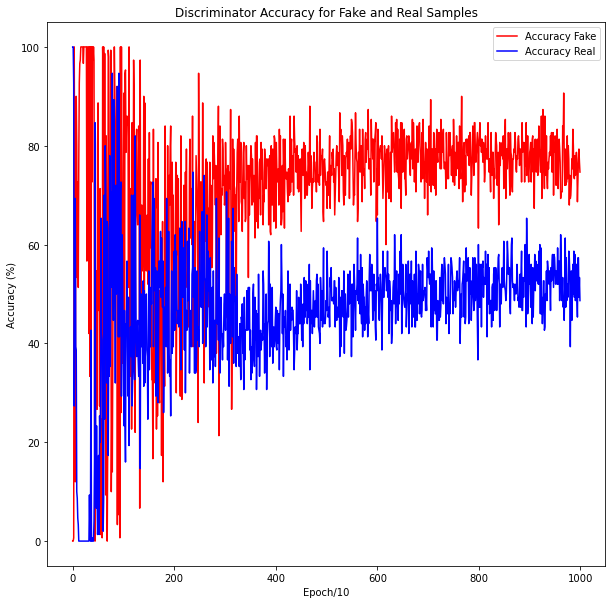

In [21]:
plt.rcParams["figure.figsize"] = (10,10)
plt.rcParams['figure.facecolor'] = 'white'
t = np.arange(0,1000)
plt.title('Discriminator Accuracy for Fake and Real Samples')
plt.plot(t, fake_acc, 'r',label='Accuracy Fake') # plotting t, a separately 
plt.plot(t, real_acc, 'b',label='Accuracy Real') # plotting t, b separately 
plt.xlabel('Epoch/10')
plt.ylabel('Accuracy (%)')
plt.legend()
#plt.show()
plt.savefig('/appdisk/projects/Warhol/wild/AccuracyPlots.png')